In [1]:
import os
# os.chdir('/content')
CODE_DIR = '/home/csp-uts/Hanyu/pixel2style2pixel-master/'
os.chdir(f'{CODE_DIR}')

from argparse import Namespace
import time
import os
import sys
import pprint
import numpy as np
from PIL import Image
import torch
import torchvision.transforms as transforms
from models.stylegan2.model import Generator

sys.path.append(".")
sys.path.append("..")

from datasets import augmentations
from utils.common import tensor2im, log_input_image
from models.psp import pSp

%load_ext autoreload
%autoreload 2

experiment_type = 'ffhq_encode'

def get_download_model_command(file_id, file_name):
    """ Get wget download command for downloading the desired model and save to directory ../pretrained_models. """
    current_directory = os.getcwd()
    save_path = os.path.join(os.path.dirname(current_directory), CODE_DIR, "pretrained_models")
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    url = r"""wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id={FILE_ID}' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id={FILE_ID}" -O {SAVE_PATH}/{FILE_NAME} && rm -rf /tmp/cookies.txt""".format(FILE_ID=file_id, FILE_NAME=file_name, SAVE_PATH=save_path)
    return url

def run_alignment(image_path):
  import dlib
  from scripts.align_all_parallel import align_face
  predictor = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")
  aligned_image = align_face(filepath=image_path, predictor=predictor) 
#   print("Aligned image has shape: {}".format(aligned_image.size))
  return aligned_image

def run_on_batch(inputs, net, latent_mask=None):
    if latent_mask is None:
        latent = []
        result_batch, latent = net(inputs.to("cuda").float(), randomize_noise=False, return_latents=True)
    else:
        result_batch = []
        latent = []
        for image_idx, input_image in enumerate(inputs):
            # get latent vector to inject into our input image
            vec_to_inject = np.random.randn(1, 512).astype('float32')
            _, latent_to_inject = net(torch.from_numpy(vec_to_inject).to("cuda"),
                                      input_code=True,
                                      return_latents=True)
            # get output image with injected style vector
            res = net(input_image.unsqueeze(0).to("cuda").float(),
                      latent_mask=latent_mask,
                      inject_latent=latent_to_inject)
            result_batch.append(res)
        result_batch = torch.cat(result_batch, dim=0)
        latent = latent_to_inject
    return result_batch, latent


MODEL_PATHS = {
    "ffhq_encode": {"id": "1bMTNWkh5LArlaWSc_wa8VKyq2V42T2z0", "name": "psp_ffhq_encode.pt"},
    "ffhq_frontalize": {"id": "1_S4THAzXb-97DbpXmanjHtXRyKxqjARv", "name": "psp_ffhq_frontalization.pt"},
    "celebs_sketch_to_face": {"id": "1lB7wk7MwtdxL-LL4Z_T76DuCfk00aSXA", "name": "psp_celebs_sketch_to_face.pt"},
    "celebs_seg_to_face": {"id": "1VpEKc6E6yG3xhYuZ0cq8D2_1CbT0Dstz", "name": "psp_celebs_seg_to_face.pt"},
    "celebs_super_resolution": {"id": "1ZpmSXBpJ9pFEov6-jjQstAlfYbkebECu", "name": "psp_celebs_super_resolution.pt"},
    "toonify": {"id": "1YKoiVuFaqdvzDP5CZaqa3k5phL-VDmyz", "name": "psp_ffhq_toonify.pt"}
}

path = MODEL_PATHS[experiment_type]
download_command = get_download_model_command(file_id=path["id"], file_name=path["name"])

EXPERIMENT_DATA_ARGS = {
    "ffhq_encode": {
        "model_path": "pretrained_models/psp_ffhq_encode.pt",
        "image_path": "notebooks/images/input_img.jpg",
        "transform": transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    },
    "ffhq_frontalize": {
        "model_path": "pretrained_models/psp_ffhq_frontalization.pt",
        "image_path": "notebooks/images/input_img.jpg",
        "transform": transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    },
    "celebs_sketch_to_face": {
        "model_path": "pretrained_models/psp_celebs_sketch_to_face.pt",
        "image_path": "notebooks/images/input_sketch.jpg",
        "transform": transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor()])
    },
    "celebs_seg_to_face": {
        "model_path": "pretrained_models/psp_celebs_seg_to_face.pt",
        "image_path": "notebooks/images/input_mask.png",
        "transform": transforms.Compose([
            transforms.Resize((256, 256)),
            augmentations.ToOneHot(n_classes=19),
            transforms.ToTensor()])
    },
    "celebs_super_resolution": {
        "model_path": "pretrained_models/psp_celebs_super_resolution.pt",
        "image_path": "notebooks/images/input_img.jpg",
        "transform": transforms.Compose([
            transforms.Resize((256, 256)),
            augmentations.BilinearResize(factors=[16]),
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    },
    "toonify": {
        "model_path": "pretrained_models/psp_ffhq_toonify.pt",
        "image_path": "notebooks/images/input_img.jpg",
        "transform": transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    },
}
EXPERIMENT_ARGS = EXPERIMENT_DATA_ARGS[experiment_type]

model_path = EXPERIMENT_ARGS['model_path']
ckpt = torch.load(model_path, map_location='cpu')
opts = ckpt['opts']
pprint.pprint(opts)

# update the training options
opts['checkpoint_path'] = model_path
if 'learn_in_w' not in opts:
    opts['learn_in_w'] = False
    
opts= Namespace(**opts)
net = pSp(opts)
net.eval()
net.cuda()
print('Model successfully loaded!')

{'batch_size': 8,
 'board_interval': 50,
 'checkpoint_path': None,
 'dataset_type': 'ffhq_encode',
 'device': 'cuda:0',
 'encoder_type': 'GradualStyleEncoder',
 'exp_dir': '',
 'id_lambda': 0.1,
 'image_interval': 100,
 'input_nc': 3,
 'l2_lambda': 1.0,
 'l2_lambda_crop': 0,
 'label_nc': 0,
 'learn_in_w': False,
 'learning_rate': 0.0001,
 'lpips_lambda': 0.8,
 'lpips_lambda_crop': 0,
 'max_steps': 300000,
 'optim_name': 'ranger',
 'resize_factors': None,
 'save_interval': 1000,
 'start_from_latent_avg': True,
 'stylegan_weights': '',
 'test_batch_size': 8,
 'test_workers': 2,
 'train_decoder': False,
 'val_interval': 2500,
 'w_norm_lambda': 0,
 'workers': 8}
Loading pSp from checkpoint: pretrained_models/psp_ffhq_encode.pt
Model successfully loaded!


In [21]:
image_path = "/home/csp-uts/Hanyu/StyleGAN2-Face-Modificator-master/ffhq_dataset/00000/00063.png"
original_image = Image.open(image_path)
if opts.label_nc == 0:
    original_image = original_image.convert("RGB")
else:
    original_image = original_image.convert("L")
    
# original_image.resize((256, 256))
if experiment_type not in ["celebs_sketch_to_face", "celebs_seg_to_face"]:
    input_image = run_alignment(image_path)
else:
    input_image = original_image

img_transforms = EXPERIMENT_ARGS['transform']
transformed_image = img_transforms(input_image)

if experiment_type in ["celebs_sketch_to_face", "celebs_seg_to_face"]:
    latent_mask = [8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
else:
    latent_mask = None
    
with torch.no_grad():
    tic = time.time()
    result_image, latent,codes = run_on_batch(transformed_image.unsqueeze(0), net, latent_mask)
    toc = time.time()
    print('Inference took {:.4f} seconds.'.format(toc - tic))
   
# result_image.size()
result_image = result_image[0]

input_vis_image = log_input_image(transformed_image, opts)
output_image = tensor2im(result_image)

if experiment_type == "celebs_super_resolution":
    res = np.concatenate([np.array(input_image.resize((256, 256))),
                          np.array(input_vis_image.resize((256, 256))),
                          np.array(output_image.resize((256, 256)))], axis=1)
else:
    res = np.concatenate([np.array(input_vis_image.resize((256, 256))),
                          np.array(output_image.resize((256, 256)))], axis=1)
    
res_image = Image.fromarray(res)
res_image
latent = latent[0]
latent1 = latent.cpu().detach().numpy()

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(10, 8))
# sns.heatmap(latent[0],cmap=sns.diverging_palette(10, 220, sep=20, n=15),vmin=-2, vmax=2)
sns.heatmap(latent1,cmap=sns.diverging_palette(10, 220, sep=20, n=15))

TypeError: img should be PIL Image. Got <class 'int'>

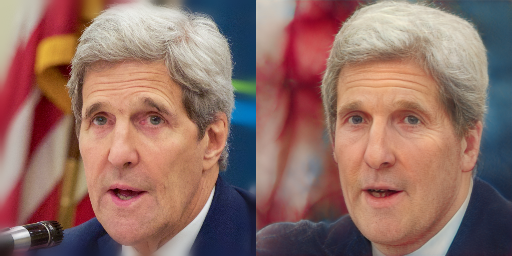

In [52]:
res_image

In [135]:
from os import listdir
from os.path import isfile,join

# resolution = "256" #@param [128, 256, 512, 1024]
# size = int(resolution), int(resolution)
ffhq_img_path = '/home/csp-uts/Hanyu/StyleGAN2-Face-Modificator-master/ffhq_dataset/00000'
fn = [fn for fn in listdir(ffhq_img_path)]
fn.sort()

img_transforms = EXPERIMENT_ARGS['transform']
latent1 = np.zeros([1000,18,512])

# print(fn[0])
with torch.no_grad():
    for i in range(len(fn)):
        image_path = ffhq_img_path+'/'+fn[i]
        input_image = run_alignment(image_path)
        if type(input_image)==int:
            print('no latent image:',i)
            
        else:
            transformed_image = img_transforms(input_image)
            _, latent = run_on_batch(transformed_image.unsqueeze(0), net, latent_mask)
            latent_np = latent.cpu().detach().numpy()
            latent1[i] = latent_np[0]
            print(i)                    
print(latent1.shape)
# v = np.load('latent_representations/'+fn[1])
# latent = np.array([v])
# image_original,result_original = generate_sys_image(latent, Gs_network, Gs_syn_kwargs)
# result_original

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
2

In [164]:
np.save('latent_original.npy',latent1)

In [170]:
for j in range(len(latent1)):
    if (latent1[j]==np.zeros([18,512])).all():
        print(j)

63
121
385
743
938


In [3]:
# calculate l_p norm on all latent code
from numpy import linalg as LA
import numpy as np
latent1 = np.load('/home/csp-uts/Hanyu/pixel2style2pixel-master/notebooks/results/Latents/latent_original_00.npy')
no_latent_index = []

l_new = []
for x in range(len(latent1)):
    if x not in no_latent_index:
        for y in range(len(latent1)):
            if y not in no_latent_index:
                if y>x:
                    c = (latent1[x]-latent1[y]).flatten()
                    c_norm = LA.norm(c, ord=1)
                    l_new.append(c_norm)
                    print(x,y)
# print(LA.norm(c, axis=0))
# print(LA.norm(c))
# print(LA.norm(c, ord=1))

0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
0 9
0 10
0 11
0 12
0 13
0 14
0 15
0 16
0 17
0 18
0 19
0 20
0 21
0 22
0 23
0 24
0 25
0 26
0 27
0 28
0 29
0 30
0 31
0 32
0 33
0 34
0 35
0 36
0 37
0 38
0 39
0 40
0 41
0 42
0 43
0 44
0 45
0 46
0 47
0 48
0 49
0 50
0 51
0 52
0 53
0 54
0 55
0 56
0 57
0 58
0 59
0 60
0 61
0 62
0 63
0 64
0 65
0 66
0 67
0 68
0 69
0 70
0 71
0 72
0 73
0 74
0 75
0 76
0 77
0 78
0 79
0 80
0 81
0 82
0 83
0 84
0 85
0 86
0 87
0 88
0 89
0 90
0 91
0 92
0 93
0 94
0 95
0 96
0 97
0 98
0 99
0 100
0 101
0 102
0 103
0 104
0 105
0 106
0 107
0 108
0 109
0 110
0 111
0 112
0 113
0 114
0 115
0 116
0 117
0 118
0 119
0 120
0 121
0 122
0 123
0 124
0 125
0 126
0 127
0 128
0 129
0 130
0 131
0 132
0 133
0 134
0 135
0 136
0 137
0 138
0 139
0 140
0 141
0 142
0 143
0 144
0 145
0 146
0 147
0 148
0 149
0 150
0 151
0 152
0 153
0 154
0 155
0 156
0 157
0 158
0 159
0 160
0 161
0 162
0 163
0 164
0 165
0 166
0 167
0 168
0 169
0 170
0 171
0 172
0 173
0 174
0 175
0 176
0 177
0 178
0 179
0 180
0 181
0 182
0 183
0 184
0 18

2 824
2 825
2 826
2 827
2 828
2 829
2 830
2 831
2 832
2 833
2 834
2 835
2 836
2 837
2 838
2 839
2 840
2 841
2 842
2 843
2 844
2 845
2 846
2 847
2 848
2 849
2 850
2 851
2 852
2 853
2 854
2 855
2 856
2 857
2 858
2 859
2 860
2 861
2 862
2 863
2 864
2 865
2 866
2 867
2 868
2 869
2 870
2 871
2 872
2 873
2 874
2 875
2 876
2 877
2 878
2 879
2 880
2 881
2 882
2 883
2 884
2 885
2 886
2 887
2 888
2 889
2 890
2 891
2 892
2 893
2 894
2 895
2 896
2 897
2 898
2 899
2 900
2 901
2 902
2 903
2 904
2 905
2 906
2 907
2 908
2 909
2 910
2 911
2 912
2 913
2 914
2 915
2 916
2 917
2 918
2 919
2 920
2 921
2 922
2 923
2 924
2 925
2 926
2 927
2 928
2 929
2 930
2 931
2 932
2 933
2 934
2 935
2 936
2 937
2 938
2 939
2 940
2 941
2 942
2 943
2 944
2 945
2 946
2 947
2 948
2 949
2 950
2 951
2 952
2 953
2 954
2 955
2 956
2 957
2 958
2 959
2 960
2 961
2 962
2 963
2 964
2 965
2 966
2 967
2 968
2 969
2 970
2 971
2 972
2 973
2 974
2 975
2 976
2 977
2 978
2 979
2 980
2 981
2 982
2 983
2 984
2 985
2 986
2 987
2 988
2 989
2 99

4 363
4 364
4 365
4 366
4 367
4 368
4 369
4 370
4 371
4 372
4 373
4 374
4 375
4 376
4 377
4 378
4 379
4 380
4 381
4 382
4 383
4 384
4 385
4 386
4 387
4 388
4 389
4 390
4 391
4 392
4 393
4 394
4 395
4 396
4 397
4 398
4 399
4 400
4 401
4 402
4 403
4 404
4 405
4 406
4 407
4 408
4 409
4 410
4 411
4 412
4 413
4 414
4 415
4 416
4 417
4 418
4 419
4 420
4 421
4 422
4 423
4 424
4 425
4 426
4 427
4 428
4 429
4 430
4 431
4 432
4 433
4 434
4 435
4 436
4 437
4 438
4 439
4 440
4 441
4 442
4 443
4 444
4 445
4 446
4 447
4 448
4 449
4 450
4 451
4 452
4 453
4 454
4 455
4 456
4 457
4 458
4 459
4 460
4 461
4 462
4 463
4 464
4 465
4 466
4 467
4 468
4 469
4 470
4 471
4 472
4 473
4 474
4 475
4 476
4 477
4 478
4 479
4 480
4 481
4 482
4 483
4 484
4 485
4 486
4 487
4 488
4 489
4 490
4 491
4 492
4 493
4 494
4 495
4 496
4 497
4 498
4 499
4 500
4 501
4 502
4 503
4 504
4 505
4 506
4 507
4 508
4 509
4 510
4 511
4 512
4 513
4 514
4 515
4 516
4 517
4 518
4 519
4 520
4 521
4 522
4 523
4 524
4 525
4 526
4 527
4 528
4 52

5 847
5 848
5 849
5 850
5 851
5 852
5 853
5 854
5 855
5 856
5 857
5 858
5 859
5 860
5 861
5 862
5 863
5 864
5 865
5 866
5 867
5 868
5 869
5 870
5 871
5 872
5 873
5 874
5 875
5 876
5 877
5 878
5 879
5 880
5 881
5 882
5 883
5 884
5 885
5 886
5 887
5 888
5 889
5 890
5 891
5 892
5 893
5 894
5 895
5 896
5 897
5 898
5 899
5 900
5 901
5 902
5 903
5 904
5 905
5 906
5 907
5 908
5 909
5 910
5 911
5 912
5 913
5 914
5 915
5 916
5 917
5 918
5 919
5 920
5 921
5 922
5 923
5 924
5 925
5 926
5 927
5 928
5 929
5 930
5 931
5 932
5 933
5 934
5 935
5 936
5 937
5 938
5 939
5 940
5 941
5 942
5 943
5 944
5 945
5 946
5 947
5 948
5 949
5 950
5 951
5 952
5 953
5 954
5 955
5 956
5 957
5 958
5 959
5 960
5 961
5 962
5 963
5 964
5 965
5 966
5 967
5 968
5 969
5 970
5 971
5 972
5 973
5 974
5 975
5 976
5 977
5 978
5 979
5 980
5 981
5 982
5 983
5 984
5 985
5 986
5 987
5 988
5 989
5 990
5 991
5 992
5 993
5 994
5 995
5 996
5 997
5 998
5 999
6 7
6 8
6 9
6 10
6 11
6 12
6 13
6 14
6 15
6 16
6 17
6 18
6 19
6 20
6 21
6 22
6 23


7 433
7 434
7 435
7 436
7 437
7 438
7 439
7 440
7 441
7 442
7 443
7 444
7 445
7 446
7 447
7 448
7 449
7 450
7 451
7 452
7 453
7 454
7 455
7 456
7 457
7 458
7 459
7 460
7 461
7 462
7 463
7 464
7 465
7 466
7 467
7 468
7 469
7 470
7 471
7 472
7 473
7 474
7 475
7 476
7 477
7 478
7 479
7 480
7 481
7 482
7 483
7 484
7 485
7 486
7 487
7 488
7 489
7 490
7 491
7 492
7 493
7 494
7 495
7 496
7 497
7 498
7 499
7 500
7 501
7 502
7 503
7 504
7 505
7 506
7 507
7 508
7 509
7 510
7 511
7 512
7 513
7 514
7 515
7 516
7 517
7 518
7 519
7 520
7 521
7 522
7 523
7 524
7 525
7 526
7 527
7 528
7 529
7 530
7 531
7 532
7 533
7 534
7 535
7 536
7 537
7 538
7 539
7 540
7 541
7 542
7 543
7 544
7 545
7 546
7 547
7 548
7 549
7 550
7 551
7 552
7 553
7 554
7 555
7 556
7 557
7 558
7 559
7 560
7 561
7 562
7 563
7 564
7 565
7 566
7 567
7 568
7 569
7 570
7 571
7 572
7 573
7 574
7 575
7 576
7 577
7 578
7 579
7 580
7 581
7 582
7 583
7 584
7 585
7 586
7 587
7 588
7 589
7 590
7 591
7 592
7 593
7 594
7 595
7 596
7 597
7 598
7 59

8 980
8 981
8 982
8 983
8 984
8 985
8 986
8 987
8 988
8 989
8 990
8 991
8 992
8 993
8 994
8 995
8 996
8 997
8 998
8 999
9 10
9 11
9 12
9 13
9 14
9 15
9 16
9 17
9 18
9 19
9 20
9 21
9 22
9 23
9 24
9 25
9 26
9 27
9 28
9 29
9 30
9 31
9 32
9 33
9 34
9 35
9 36
9 37
9 38
9 39
9 40
9 41
9 42
9 43
9 44
9 45
9 46
9 47
9 48
9 49
9 50
9 51
9 52
9 53
9 54
9 55
9 56
9 57
9 58
9 59
9 60
9 61
9 62
9 63
9 64
9 65
9 66
9 67
9 68
9 69
9 70
9 71
9 72
9 73
9 74
9 75
9 76
9 77
9 78
9 79
9 80
9 81
9 82
9 83
9 84
9 85
9 86
9 87
9 88
9 89
9 90
9 91
9 92
9 93
9 94
9 95
9 96
9 97
9 98
9 99
9 100
9 101
9 102
9 103
9 104
9 105
9 106
9 107
9 108
9 109
9 110
9 111
9 112
9 113
9 114
9 115
9 116
9 117
9 118
9 119
9 120
9 121
9 122
9 123
9 124
9 125
9 126
9 127
9 128
9 129
9 130
9 131
9 132
9 133
9 134
9 135
9 136
9 137
9 138
9 139
9 140
9 141
9 142
9 143
9 144
9 145
9 146
9 147
9 148
9 149
9 150
9 151
9 152
9 153
9 154
9 155
9 156
9 157
9 158
9 159
9 160
9 161
9 162
9 163
9 164
9 165
9 166
9 167
9 168
9 169
9 170
9 17

10 451
10 452
10 453
10 454
10 455
10 456
10 457
10 458
10 459
10 460
10 461
10 462
10 463
10 464
10 465
10 466
10 467
10 468
10 469
10 470
10 471
10 472
10 473
10 474
10 475
10 476
10 477
10 478
10 479
10 480
10 481
10 482
10 483
10 484
10 485
10 486
10 487
10 488
10 489
10 490
10 491
10 492
10 493
10 494
10 495
10 496
10 497
10 498
10 499
10 500
10 501
10 502
10 503
10 504
10 505
10 506
10 507
10 508
10 509
10 510
10 511
10 512
10 513
10 514
10 515
10 516
10 517
10 518
10 519
10 520
10 521
10 522
10 523
10 524
10 525
10 526
10 527
10 528
10 529
10 530
10 531
10 532
10 533
10 534
10 535
10 536
10 537
10 538
10 539
10 540
10 541
10 542
10 543
10 544
10 545
10 546
10 547
10 548
10 549
10 550
10 551
10 552
10 553
10 554
10 555
10 556
10 557
10 558
10 559
10 560
10 561
10 562
10 563
10 564
10 565
10 566
10 567
10 568
10 569
10 570
10 571
10 572
10 573
10 574
10 575
10 576
10 577
10 578
10 579
10 580
10 581
10 582
10 583
10 584
10 585
10 586
10 587
10 588
10 589
10 590
10 591
10 592
10 593

11 976
11 977
11 978
11 979
11 980
11 981
11 982
11 983
11 984
11 985
11 986
11 987
11 988
11 989
11 990
11 991
11 992
11 993
11 994
11 995
11 996
11 997
11 998
11 999
12 13
12 14
12 15
12 16
12 17
12 18
12 19
12 20
12 21
12 22
12 23
12 24
12 25
12 26
12 27
12 28
12 29
12 30
12 31
12 32
12 33
12 34
12 35
12 36
12 37
12 38
12 39
12 40
12 41
12 42
12 43
12 44
12 45
12 46
12 47
12 48
12 49
12 50
12 51
12 52
12 53
12 54
12 55
12 56
12 57
12 58
12 59
12 60
12 61
12 62
12 63
12 64
12 65
12 66
12 67
12 68
12 69
12 70
12 71
12 72
12 73
12 74
12 75
12 76
12 77
12 78
12 79
12 80
12 81
12 82
12 83
12 84
12 85
12 86
12 87
12 88
12 89
12 90
12 91
12 92
12 93
12 94
12 95
12 96
12 97
12 98
12 99
12 100
12 101
12 102
12 103
12 104
12 105
12 106
12 107
12 108
12 109
12 110
12 111
12 112
12 113
12 114
12 115
12 116
12 117
12 118
12 119
12 120
12 121
12 122
12 123
12 124
12 125
12 126
12 127
12 128
12 129
12 130
12 131
12 132
12 133
12 134
12 135
12 136
12 137
12 138
12 139
12 140
12 141
12 142
12 143
12

13 496
13 497
13 498
13 499
13 500
13 501
13 502
13 503
13 504
13 505
13 506
13 507
13 508
13 509
13 510
13 511
13 512
13 513
13 514
13 515
13 516
13 517
13 518
13 519
13 520
13 521
13 522
13 523
13 524
13 525
13 526
13 527
13 528
13 529
13 530
13 531
13 532
13 533
13 534
13 535
13 536
13 537
13 538
13 539
13 540
13 541
13 542
13 543
13 544
13 545
13 546
13 547
13 548
13 549
13 550
13 551
13 552
13 553
13 554
13 555
13 556
13 557
13 558
13 559
13 560
13 561
13 562
13 563
13 564
13 565
13 566
13 567
13 568
13 569
13 570
13 571
13 572
13 573
13 574
13 575
13 576
13 577
13 578
13 579
13 580
13 581
13 582
13 583
13 584
13 585
13 586
13 587
13 588
13 589
13 590
13 591
13 592
13 593
13 594
13 595
13 596
13 597
13 598
13 599
13 600
13 601
13 602
13 603
13 604
13 605
13 606
13 607
13 608
13 609
13 610
13 611
13 612
13 613
13 614
13 615
13 616
13 617
13 618
13 619
13 620
13 621
13 622
13 623
13 624
13 625
13 626
13 627
13 628
13 629
13 630
13 631
13 632
13 633
13 634
13 635
13 636
13 637
13 638

15 118
15 119
15 120
15 121
15 122
15 123
15 124
15 125
15 126
15 127
15 128
15 129
15 130
15 131
15 132
15 133
15 134
15 135
15 136
15 137
15 138
15 139
15 140
15 141
15 142
15 143
15 144
15 145
15 146
15 147
15 148
15 149
15 150
15 151
15 152
15 153
15 154
15 155
15 156
15 157
15 158
15 159
15 160
15 161
15 162
15 163
15 164
15 165
15 166
15 167
15 168
15 169
15 170
15 171
15 172
15 173
15 174
15 175
15 176
15 177
15 178
15 179
15 180
15 181
15 182
15 183
15 184
15 185
15 186
15 187
15 188
15 189
15 190
15 191
15 192
15 193
15 194
15 195
15 196
15 197
15 198
15 199
15 200
15 201
15 202
15 203
15 204
15 205
15 206
15 207
15 208
15 209
15 210
15 211
15 212
15 213
15 214
15 215
15 216
15 217
15 218
15 219
15 220
15 221
15 222
15 223
15 224
15 225
15 226
15 227
15 228
15 229
15 230
15 231
15 232
15 233
15 234
15 235
15 236
15 237
15 238
15 239
15 240
15 241
15 242
15 243
15 244
15 245
15 246
15 247
15 248
15 249
15 250
15 251
15 252
15 253
15 254
15 255
15 256
15 257
15 258
15 259
15 260

16 693
16 694
16 695
16 696
16 697
16 698
16 699
16 700
16 701
16 702
16 703
16 704
16 705
16 706
16 707
16 708
16 709
16 710
16 711
16 712
16 713
16 714
16 715
16 716
16 717
16 718
16 719
16 720
16 721
16 722
16 723
16 724
16 725
16 726
16 727
16 728
16 729
16 730
16 731
16 732
16 733
16 734
16 735
16 736
16 737
16 738
16 739
16 740
16 741
16 742
16 743
16 744
16 745
16 746
16 747
16 748
16 749
16 750
16 751
16 752
16 753
16 754
16 755
16 756
16 757
16 758
16 759
16 760
16 761
16 762
16 763
16 764
16 765
16 766
16 767
16 768
16 769
16 770
16 771
16 772
16 773
16 774
16 775
16 776
16 777
16 778
16 779
16 780
16 781
16 782
16 783
16 784
16 785
16 786
16 787
16 788
16 789
16 790
16 791
16 792
16 793
16 794
16 795
16 796
16 797
16 798
16 799
16 800
16 801
16 802
16 803
16 804
16 805
16 806
16 807
16 808
16 809
16 810
16 811
16 812
16 813
16 814
16 815
16 816
16 817
16 818
16 819
16 820
16 821
16 822
16 823
16 824
16 825
16 826
16 827
16 828
16 829
16 830
16 831
16 832
16 833
16 834
16 835

18 281
18 282
18 283
18 284
18 285
18 286
18 287
18 288
18 289
18 290
18 291
18 292
18 293
18 294
18 295
18 296
18 297
18 298
18 299
18 300
18 301
18 302
18 303
18 304
18 305
18 306
18 307
18 308
18 309
18 310
18 311
18 312
18 313
18 314
18 315
18 316
18 317
18 318
18 319
18 320
18 321
18 322
18 323
18 324
18 325
18 326
18 327
18 328
18 329
18 330
18 331
18 332
18 333
18 334
18 335
18 336
18 337
18 338
18 339
18 340
18 341
18 342
18 343
18 344
18 345
18 346
18 347
18 348
18 349
18 350
18 351
18 352
18 353
18 354
18 355
18 356
18 357
18 358
18 359
18 360
18 361
18 362
18 363
18 364
18 365
18 366
18 367
18 368
18 369
18 370
18 371
18 372
18 373
18 374
18 375
18 376
18 377
18 378
18 379
18 380
18 381
18 382
18 383
18 384
18 385
18 386
18 387
18 388
18 389
18 390
18 391
18 392
18 393
18 394
18 395
18 396
18 397
18 398
18 399
18 400
18 401
18 402
18 403
18 404
18 405
18 406
18 407
18 408
18 409
18 410
18 411
18 412
18 413
18 414
18 415
18 416
18 417
18 418
18 419
18 420
18 421
18 422
18 423

19 860
19 861
19 862
19 863
19 864
19 865
19 866
19 867
19 868
19 869
19 870
19 871
19 872
19 873
19 874
19 875
19 876
19 877
19 878
19 879
19 880
19 881
19 882
19 883
19 884
19 885
19 886
19 887
19 888
19 889
19 890
19 891
19 892
19 893
19 894
19 895
19 896
19 897
19 898
19 899
19 900
19 901
19 902
19 903
19 904
19 905
19 906
19 907
19 908
19 909
19 910
19 911
19 912
19 913
19 914
19 915
19 916
19 917
19 918
19 919
19 920
19 921
19 922
19 923
19 924
19 925
19 926
19 927
19 928
19 929
19 930
19 931
19 932
19 933
19 934
19 935
19 936
19 937
19 938
19 939
19 940
19 941
19 942
19 943
19 944
19 945
19 946
19 947
19 948
19 949
19 950
19 951
19 952
19 953
19 954
19 955
19 956
19 957
19 958
19 959
19 960
19 961
19 962
19 963
19 964
19 965
19 966
19 967
19 968
19 969
19 970
19 971
19 972
19 973
19 974
19 975
19 976
19 977
19 978
19 979
19 980
19 981
19 982
19 983
19 984
19 985
19 986
19 987
19 988
19 989
19 990
19 991
19 992
19 993
19 994
19 995
19 996
19 997
19 998
19 999
20 21
20 22
20 23
20

21 457
21 458
21 459
21 460
21 461
21 462
21 463
21 464
21 465
21 466
21 467
21 468
21 469
21 470
21 471
21 472
21 473
21 474
21 475
21 476
21 477
21 478
21 479
21 480
21 481
21 482
21 483
21 484
21 485
21 486
21 487
21 488
21 489
21 490
21 491
21 492
21 493
21 494
21 495
21 496
21 497
21 498
21 499
21 500
21 501
21 502
21 503
21 504
21 505
21 506
21 507
21 508
21 509
21 510
21 511
21 512
21 513
21 514
21 515
21 516
21 517
21 518
21 519
21 520
21 521
21 522
21 523
21 524
21 525
21 526
21 527
21 528
21 529
21 530
21 531
21 532
21 533
21 534
21 535
21 536
21 537
21 538
21 539
21 540
21 541
21 542
21 543
21 544
21 545
21 546
21 547
21 548
21 549
21 550
21 551
21 552
21 553
21 554
21 555
21 556
21 557
21 558
21 559
21 560
21 561
21 562
21 563
21 564
21 565
21 566
21 567
21 568
21 569
21 570
21 571
21 572
21 573
21 574
21 575
21 576
21 577
21 578
21 579
21 580
21 581
21 582
21 583
21 584
21 585
21 586
21 587
21 588
21 589
21 590
21 591
21 592
21 593
21 594
21 595
21 596
21 597
21 598
21 599

22 998
22 999
23 24
23 25
23 26
23 27
23 28
23 29
23 30
23 31
23 32
23 33
23 34
23 35
23 36
23 37
23 38
23 39
23 40
23 41
23 42
23 43
23 44
23 45
23 46
23 47
23 48
23 49
23 50
23 51
23 52
23 53
23 54
23 55
23 56
23 57
23 58
23 59
23 60
23 61
23 62
23 63
23 64
23 65
23 66
23 67
23 68
23 69
23 70
23 71
23 72
23 73
23 74
23 75
23 76
23 77
23 78
23 79
23 80
23 81
23 82
23 83
23 84
23 85
23 86
23 87
23 88
23 89
23 90
23 91
23 92
23 93
23 94
23 95
23 96
23 97
23 98
23 99
23 100
23 101
23 102
23 103
23 104
23 105
23 106
23 107
23 108
23 109
23 110
23 111
23 112
23 113
23 114
23 115
23 116
23 117
23 118
23 119
23 120
23 121
23 122
23 123
23 124
23 125
23 126
23 127
23 128
23 129
23 130
23 131
23 132
23 133
23 134
23 135
23 136
23 137
23 138
23 139
23 140
23 141
23 142
23 143
23 144
23 145
23 146
23 147
23 148
23 149
23 150
23 151
23 152
23 153
23 154
23 155
23 156
23 157
23 158
23 159
23 160
23 161
23 162
23 163
23 164
23 165
23 166
23 167
23 168
23 169
23 170
23 171
23 172
23 173
23 174
23 17

24 561
24 562
24 563
24 564
24 565
24 566
24 567
24 568
24 569
24 570
24 571
24 572
24 573
24 574
24 575
24 576
24 577
24 578
24 579
24 580
24 581
24 582
24 583
24 584
24 585
24 586
24 587
24 588
24 589
24 590
24 591
24 592
24 593
24 594
24 595
24 596
24 597
24 598
24 599
24 600
24 601
24 602
24 603
24 604
24 605
24 606
24 607
24 608
24 609
24 610
24 611
24 612
24 613
24 614
24 615
24 616
24 617
24 618
24 619
24 620
24 621
24 622
24 623
24 624
24 625
24 626
24 627
24 628
24 629
24 630
24 631
24 632
24 633
24 634
24 635
24 636
24 637
24 638
24 639
24 640
24 641
24 642
24 643
24 644
24 645
24 646
24 647
24 648
24 649
24 650
24 651
24 652
24 653
24 654
24 655
24 656
24 657
24 658
24 659
24 660
24 661
24 662
24 663
24 664
24 665
24 666
24 667
24 668
24 669
24 670
24 671
24 672
24 673
24 674
24 675
24 676
24 677
24 678
24 679
24 680
24 681
24 682
24 683
24 684
24 685
24 686
24 687
24 688
24 689
24 690
24 691
24 692
24 693
24 694
24 695
24 696
24 697
24 698
24 699
24 700
24 701
24 702
24 703

26 110
26 111
26 112
26 113
26 114
26 115
26 116
26 117
26 118
26 119
26 120
26 121
26 122
26 123
26 124
26 125
26 126
26 127
26 128
26 129
26 130
26 131
26 132
26 133
26 134
26 135
26 136
26 137
26 138
26 139
26 140
26 141
26 142
26 143
26 144
26 145
26 146
26 147
26 148
26 149
26 150
26 151
26 152
26 153
26 154
26 155
26 156
26 157
26 158
26 159
26 160
26 161
26 162
26 163
26 164
26 165
26 166
26 167
26 168
26 169
26 170
26 171
26 172
26 173
26 174
26 175
26 176
26 177
26 178
26 179
26 180
26 181
26 182
26 183
26 184
26 185
26 186
26 187
26 188
26 189
26 190
26 191
26 192
26 193
26 194
26 195
26 196
26 197
26 198
26 199
26 200
26 201
26 202
26 203
26 204
26 205
26 206
26 207
26 208
26 209
26 210
26 211
26 212
26 213
26 214
26 215
26 216
26 217
26 218
26 219
26 220
26 221
26 222
26 223
26 224
26 225
26 226
26 227
26 228
26 229
26 230
26 231
26 232
26 233
26 234
26 235
26 236
26 237
26 238
26 239
26 240
26 241
26 242
26 243
26 244
26 245
26 246
26 247
26 248
26 249
26 250
26 251
26 252

27 558
27 559
27 560
27 561
27 562
27 563
27 564
27 565
27 566
27 567
27 568
27 569
27 570
27 571
27 572
27 573
27 574
27 575
27 576
27 577
27 578
27 579
27 580
27 581
27 582
27 583
27 584
27 585
27 586
27 587
27 588
27 589
27 590
27 591
27 592
27 593
27 594
27 595
27 596
27 597
27 598
27 599
27 600
27 601
27 602
27 603
27 604
27 605
27 606
27 607
27 608
27 609
27 610
27 611
27 612
27 613
27 614
27 615
27 616
27 617
27 618
27 619
27 620
27 621
27 622
27 623
27 624
27 625
27 626
27 627
27 628
27 629
27 630
27 631
27 632
27 633
27 634
27 635
27 636
27 637
27 638
27 639
27 640
27 641
27 642
27 643
27 644
27 645
27 646
27 647
27 648
27 649
27 650
27 651
27 652
27 653
27 654
27 655
27 656
27 657
27 658
27 659
27 660
27 661
27 662
27 663
27 664
27 665
27 666
27 667
27 668
27 669
27 670
27 671
27 672
27 673
27 674
27 675
27 676
27 677
27 678
27 679
27 680
27 681
27 682
27 683
27 684
27 685
27 686
27 687
27 688
27 689
27 690
27 691
27 692
27 693
27 694
27 695
27 696
27 697
27 698
27 699
27 700

29 72
29 73
29 74
29 75
29 76
29 77
29 78
29 79
29 80
29 81
29 82
29 83
29 84
29 85
29 86
29 87
29 88
29 89
29 90
29 91
29 92
29 93
29 94
29 95
29 96
29 97
29 98
29 99
29 100
29 101
29 102
29 103
29 104
29 105
29 106
29 107
29 108
29 109
29 110
29 111
29 112
29 113
29 114
29 115
29 116
29 117
29 118
29 119
29 120
29 121
29 122
29 123
29 124
29 125
29 126
29 127
29 128
29 129
29 130
29 131
29 132
29 133
29 134
29 135
29 136
29 137
29 138
29 139
29 140
29 141
29 142
29 143
29 144
29 145
29 146
29 147
29 148
29 149
29 150
29 151
29 152
29 153
29 154
29 155
29 156
29 157
29 158
29 159
29 160
29 161
29 162
29 163
29 164
29 165
29 166
29 167
29 168
29 169
29 170
29 171
29 172
29 173
29 174
29 175
29 176
29 177
29 178
29 179
29 180
29 181
29 182
29 183
29 184
29 185
29 186
29 187
29 188
29 189
29 190
29 191
29 192
29 193
29 194
29 195
29 196
29 197
29 198
29 199
29 200
29 201
29 202
29 203
29 204
29 205
29 206
29 207
29 208
29 209
29 210
29 211
29 212
29 213
29 214
29 215
29 216
29 217
29 218

30 581
30 582
30 583
30 584
30 585
30 586
30 587
30 588
30 589
30 590
30 591
30 592
30 593
30 594
30 595
30 596
30 597
30 598
30 599
30 600
30 601
30 602
30 603
30 604
30 605
30 606
30 607
30 608
30 609
30 610
30 611
30 612
30 613
30 614
30 615
30 616
30 617
30 618
30 619
30 620
30 621
30 622
30 623
30 624
30 625
30 626
30 627
30 628
30 629
30 630
30 631
30 632
30 633
30 634
30 635
30 636
30 637
30 638
30 639
30 640
30 641
30 642
30 643
30 644
30 645
30 646
30 647
30 648
30 649
30 650
30 651
30 652
30 653
30 654
30 655
30 656
30 657
30 658
30 659
30 660
30 661
30 662
30 663
30 664
30 665
30 666
30 667
30 668
30 669
30 670
30 671
30 672
30 673
30 674
30 675
30 676
30 677
30 678
30 679
30 680
30 681
30 682
30 683
30 684
30 685
30 686
30 687
30 688
30 689
30 690
30 691
30 692
30 693
30 694
30 695
30 696
30 697
30 698
30 699
30 700
30 701
30 702
30 703
30 704
30 705
30 706
30 707
30 708
30 709
30 710
30 711
30 712
30 713
30 714
30 715
30 716
30 717
30 718
30 719
30 720
30 721
30 722
30 723

32 35
32 36
32 37
32 38
32 39
32 40
32 41
32 42
32 43
32 44
32 45
32 46
32 47
32 48
32 49
32 50
32 51
32 52
32 53
32 54
32 55
32 56
32 57
32 58
32 59
32 60
32 61
32 62
32 63
32 64
32 65
32 66
32 67
32 68
32 69
32 70
32 71
32 72
32 73
32 74
32 75
32 76
32 77
32 78
32 79
32 80
32 81
32 82
32 83
32 84
32 85
32 86
32 87
32 88
32 89
32 90
32 91
32 92
32 93
32 94
32 95
32 96
32 97
32 98
32 99
32 100
32 101
32 102
32 103
32 104
32 105
32 106
32 107
32 108
32 109
32 110
32 111
32 112
32 113
32 114
32 115
32 116
32 117
32 118
32 119
32 120
32 121
32 122
32 123
32 124
32 125
32 126
32 127
32 128
32 129
32 130
32 131
32 132
32 133
32 134
32 135
32 136
32 137
32 138
32 139
32 140
32 141
32 142
32 143
32 144
32 145
32 146
32 147
32 148
32 149
32 150
32 151
32 152
32 153
32 154
32 155
32 156
32 157
32 158
32 159
32 160
32 161
32 162
32 163
32 164
32 165
32 166
32 167
32 168
32 169
32 170
32 171
32 172
32 173
32 174
32 175
32 176
32 177
32 178
32 179
32 180
32 181
32 182
32 183
32 184
32 185
32 186
3

33 554
33 555
33 556
33 557
33 558
33 559
33 560
33 561
33 562
33 563
33 564
33 565
33 566
33 567
33 568
33 569
33 570
33 571
33 572
33 573
33 574
33 575
33 576
33 577
33 578
33 579
33 580
33 581
33 582
33 583
33 584
33 585
33 586
33 587
33 588
33 589
33 590
33 591
33 592
33 593
33 594
33 595
33 596
33 597
33 598
33 599
33 600
33 601
33 602
33 603
33 604
33 605
33 606
33 607
33 608
33 609
33 610
33 611
33 612
33 613
33 614
33 615
33 616
33 617
33 618
33 619
33 620
33 621
33 622
33 623
33 624
33 625
33 626
33 627
33 628
33 629
33 630
33 631
33 632
33 633
33 634
33 635
33 636
33 637
33 638
33 639
33 640
33 641
33 642
33 643
33 644
33 645
33 646
33 647
33 648
33 649
33 650
33 651
33 652
33 653
33 654
33 655
33 656
33 657
33 658
33 659
33 660
33 661
33 662
33 663
33 664
33 665
33 666
33 667
33 668
33 669
33 670
33 671
33 672
33 673
33 674
33 675
33 676
33 677
33 678
33 679
33 680
33 681
33 682
33 683
33 684
33 685
33 686
33 687
33 688
33 689
33 690
33 691
33 692
33 693
33 694
33 695
33 696

35 163
35 164
35 165
35 166
35 167
35 168
35 169
35 170
35 171
35 172
35 173
35 174
35 175
35 176
35 177
35 178
35 179
35 180
35 181
35 182
35 183
35 184
35 185
35 186
35 187
35 188
35 189
35 190
35 191
35 192
35 193
35 194
35 195
35 196
35 197
35 198
35 199
35 200
35 201
35 202
35 203
35 204
35 205
35 206
35 207
35 208
35 209
35 210
35 211
35 212
35 213
35 214
35 215
35 216
35 217
35 218
35 219
35 220
35 221
35 222
35 223
35 224
35 225
35 226
35 227
35 228
35 229
35 230
35 231
35 232
35 233
35 234
35 235
35 236
35 237
35 238
35 239
35 240
35 241
35 242
35 243
35 244
35 245
35 246
35 247
35 248
35 249
35 250
35 251
35 252
35 253
35 254
35 255
35 256
35 257
35 258
35 259
35 260
35 261
35 262
35 263
35 264
35 265
35 266
35 267
35 268
35 269
35 270
35 271
35 272
35 273
35 274
35 275
35 276
35 277
35 278
35 279
35 280
35 281
35 282
35 283
35 284
35 285
35 286
35 287
35 288
35 289
35 290
35 291
35 292
35 293
35 294
35 295
35 296
35 297
35 298
35 299
35 300
35 301
35 302
35 303
35 304
35 305

36 668
36 669
36 670
36 671
36 672
36 673
36 674
36 675
36 676
36 677
36 678
36 679
36 680
36 681
36 682
36 683
36 684
36 685
36 686
36 687
36 688
36 689
36 690
36 691
36 692
36 693
36 694
36 695
36 696
36 697
36 698
36 699
36 700
36 701
36 702
36 703
36 704
36 705
36 706
36 707
36 708
36 709
36 710
36 711
36 712
36 713
36 714
36 715
36 716
36 717
36 718
36 719
36 720
36 721
36 722
36 723
36 724
36 725
36 726
36 727
36 728
36 729
36 730
36 731
36 732
36 733
36 734
36 735
36 736
36 737
36 738
36 739
36 740
36 741
36 742
36 743
36 744
36 745
36 746
36 747
36 748
36 749
36 750
36 751
36 752
36 753
36 754
36 755
36 756
36 757
36 758
36 759
36 760
36 761
36 762
36 763
36 764
36 765
36 766
36 767
36 768
36 769
36 770
36 771
36 772
36 773
36 774
36 775
36 776
36 777
36 778
36 779
36 780
36 781
36 782
36 783
36 784
36 785
36 786
36 787
36 788
36 789
36 790
36 791
36 792
36 793
36 794
36 795
36 796
36 797
36 798
36 799
36 800
36 801
36 802
36 803
36 804
36 805
36 806
36 807
36 808
36 809
36 810

38 328
38 329
38 330
38 331
38 332
38 333
38 334
38 335
38 336
38 337
38 338
38 339
38 340
38 341
38 342
38 343
38 344
38 345
38 346
38 347
38 348
38 349
38 350
38 351
38 352
38 353
38 354
38 355
38 356
38 357
38 358
38 359
38 360
38 361
38 362
38 363
38 364
38 365
38 366
38 367
38 368
38 369
38 370
38 371
38 372
38 373
38 374
38 375
38 376
38 377
38 378
38 379
38 380
38 381
38 382
38 383
38 384
38 385
38 386
38 387
38 388
38 389
38 390
38 391
38 392
38 393
38 394
38 395
38 396
38 397
38 398
38 399
38 400
38 401
38 402
38 403
38 404
38 405
38 406
38 407
38 408
38 409
38 410
38 411
38 412
38 413
38 414
38 415
38 416
38 417
38 418
38 419
38 420
38 421
38 422
38 423
38 424
38 425
38 426
38 427
38 428
38 429
38 430
38 431
38 432
38 433
38 434
38 435
38 436
38 437
38 438
38 439
38 440
38 441
38 442
38 443
38 444
38 445
38 446
38 447
38 448
38 449
38 450
38 451
38 452
38 453
38 454
38 455
38 456
38 457
38 458
38 459
38 460
38 461
38 462
38 463
38 464
38 465
38 466
38 467
38 468
38 469
38 470

39 943
39 944
39 945
39 946
39 947
39 948
39 949
39 950
39 951
39 952
39 953
39 954
39 955
39 956
39 957
39 958
39 959
39 960
39 961
39 962
39 963
39 964
39 965
39 966
39 967
39 968
39 969
39 970
39 971
39 972
39 973
39 974
39 975
39 976
39 977
39 978
39 979
39 980
39 981
39 982
39 983
39 984
39 985
39 986
39 987
39 988
39 989
39 990
39 991
39 992
39 993
39 994
39 995
39 996
39 997
39 998
39 999
40 41
40 42
40 43
40 44
40 45
40 46
40 47
40 48
40 49
40 50
40 51
40 52
40 53
40 54
40 55
40 56
40 57
40 58
40 59
40 60
40 61
40 62
40 63
40 64
40 65
40 66
40 67
40 68
40 69
40 70
40 71
40 72
40 73
40 74
40 75
40 76
40 77
40 78
40 79
40 80
40 81
40 82
40 83
40 84
40 85
40 86
40 87
40 88
40 89
40 90
40 91
40 92
40 93
40 94
40 95
40 96
40 97
40 98
40 99
40 100
40 101
40 102
40 103
40 104
40 105
40 106
40 107
40 108
40 109
40 110
40 111
40 112
40 113
40 114
40 115
40 116
40 117
40 118
40 119
40 120
40 121
40 122
40 123
40 124
40 125
40 126
40 127
40 128
40 129
40 130
40 131
40 132
40 133
40 134
40

41 531
41 532
41 533
41 534
41 535
41 536
41 537
41 538
41 539
41 540
41 541
41 542
41 543
41 544
41 545
41 546
41 547
41 548
41 549
41 550
41 551
41 552
41 553
41 554
41 555
41 556
41 557
41 558
41 559
41 560
41 561
41 562
41 563
41 564
41 565
41 566
41 567
41 568
41 569
41 570
41 571
41 572
41 573
41 574
41 575
41 576
41 577
41 578
41 579
41 580
41 581
41 582
41 583
41 584
41 585
41 586
41 587
41 588
41 589
41 590
41 591
41 592
41 593
41 594
41 595
41 596
41 597
41 598
41 599
41 600
41 601
41 602
41 603
41 604
41 605
41 606
41 607
41 608
41 609
41 610
41 611
41 612
41 613
41 614
41 615
41 616
41 617
41 618
41 619
41 620
41 621
41 622
41 623
41 624
41 625
41 626
41 627
41 628
41 629
41 630
41 631
41 632
41 633
41 634
41 635
41 636
41 637
41 638
41 639
41 640
41 641
41 642
41 643
41 644
41 645
41 646
41 647
41 648
41 649
41 650
41 651
41 652
41 653
41 654
41 655
41 656
41 657
41 658
41 659
41 660
41 661
41 662
41 663
41 664
41 665
41 666
41 667
41 668
41 669
41 670
41 671
41 672
41 673

43 136
43 137
43 138
43 139
43 140
43 141
43 142
43 143
43 144
43 145
43 146
43 147
43 148
43 149
43 150
43 151
43 152
43 153
43 154
43 155
43 156
43 157
43 158
43 159
43 160
43 161
43 162
43 163
43 164
43 165
43 166
43 167
43 168
43 169
43 170
43 171
43 172
43 173
43 174
43 175
43 176
43 177
43 178
43 179
43 180
43 181
43 182
43 183
43 184
43 185
43 186
43 187
43 188
43 189
43 190
43 191
43 192
43 193
43 194
43 195
43 196
43 197
43 198
43 199
43 200
43 201
43 202
43 203
43 204
43 205
43 206
43 207
43 208
43 209
43 210
43 211
43 212
43 213
43 214
43 215
43 216
43 217
43 218
43 219
43 220
43 221
43 222
43 223
43 224
43 225
43 226
43 227
43 228
43 229
43 230
43 231
43 232
43 233
43 234
43 235
43 236
43 237
43 238
43 239
43 240
43 241
43 242
43 243
43 244
43 245
43 246
43 247
43 248
43 249
43 250
43 251
43 252
43 253
43 254
43 255
43 256
43 257
43 258
43 259
43 260
43 261
43 262
43 263
43 264
43 265
43 266
43 267
43 268
43 269
43 270
43 271
43 272
43 273
43 274
43 275
43 276
43 277
43 278

44 717
44 718
44 719
44 720
44 721
44 722
44 723
44 724
44 725
44 726
44 727
44 728
44 729
44 730
44 731
44 732
44 733
44 734
44 735
44 736
44 737
44 738
44 739
44 740
44 741
44 742
44 743
44 744
44 745
44 746
44 747
44 748
44 749
44 750
44 751
44 752
44 753
44 754
44 755
44 756
44 757
44 758
44 759
44 760
44 761
44 762
44 763
44 764
44 765
44 766
44 767
44 768
44 769
44 770
44 771
44 772
44 773
44 774
44 775
44 776
44 777
44 778
44 779
44 780
44 781
44 782
44 783
44 784
44 785
44 786
44 787
44 788
44 789
44 790
44 791
44 792
44 793
44 794
44 795
44 796
44 797
44 798
44 799
44 800
44 801
44 802
44 803
44 804
44 805
44 806
44 807
44 808
44 809
44 810
44 811
44 812
44 813
44 814
44 815
44 816
44 817
44 818
44 819
44 820
44 821
44 822
44 823
44 824
44 825
44 826
44 827
44 828
44 829
44 830
44 831
44 832
44 833
44 834
44 835
44 836
44 837
44 838
44 839
44 840
44 841
44 842
44 843
44 844
44 845
44 846
44 847
44 848
44 849
44 850
44 851
44 852
44 853
44 854
44 855
44 856
44 857
44 858
44 859

46 260
46 261
46 262
46 263
46 264
46 265
46 266
46 267
46 268
46 269
46 270
46 271
46 272
46 273
46 274
46 275
46 276
46 277
46 278
46 279
46 280
46 281
46 282
46 283
46 284
46 285
46 286
46 287
46 288
46 289
46 290
46 291
46 292
46 293
46 294
46 295
46 296
46 297
46 298
46 299
46 300
46 301
46 302
46 303
46 304
46 305
46 306
46 307
46 308
46 309
46 310
46 311
46 312
46 313
46 314
46 315
46 316
46 317
46 318
46 319
46 320
46 321
46 322
46 323
46 324
46 325
46 326
46 327
46 328
46 329
46 330
46 331
46 332
46 333
46 334
46 335
46 336
46 337
46 338
46 339
46 340
46 341
46 342
46 343
46 344
46 345
46 346
46 347
46 348
46 349
46 350
46 351
46 352
46 353
46 354
46 355
46 356
46 357
46 358
46 359
46 360
46 361
46 362
46 363
46 364
46 365
46 366
46 367
46 368
46 369
46 370
46 371
46 372
46 373
46 374
46 375
46 376
46 377
46 378
46 379
46 380
46 381
46 382
46 383
46 384
46 385
46 386
46 387
46 388
46 389
46 390
46 391
46 392
46 393
46 394
46 395
46 396
46 397
46 398
46 399
46 400
46 401
46 402

47 822
47 823
47 824
47 825
47 826
47 827
47 828
47 829
47 830
47 831
47 832
47 833
47 834
47 835
47 836
47 837
47 838
47 839
47 840
47 841
47 842
47 843
47 844
47 845
47 846
47 847
47 848
47 849
47 850
47 851
47 852
47 853
47 854
47 855
47 856
47 857
47 858
47 859
47 860
47 861
47 862
47 863
47 864
47 865
47 866
47 867
47 868
47 869
47 870
47 871
47 872
47 873
47 874
47 875
47 876
47 877
47 878
47 879
47 880
47 881
47 882
47 883
47 884
47 885
47 886
47 887
47 888
47 889
47 890
47 891
47 892
47 893
47 894
47 895
47 896
47 897
47 898
47 899
47 900
47 901
47 902
47 903
47 904
47 905
47 906
47 907
47 908
47 909
47 910
47 911
47 912
47 913
47 914
47 915
47 916
47 917
47 918
47 919
47 920
47 921
47 922
47 923
47 924
47 925
47 926
47 927
47 928
47 929
47 930
47 931
47 932
47 933
47 934
47 935
47 936
47 937
47 938
47 939
47 940
47 941
47 942
47 943
47 944
47 945
47 946
47 947
47 948
47 949
47 950
47 951
47 952
47 953
47 954
47 955
47 956
47 957
47 958
47 959
47 960
47 961
47 962
47 963
47 964

49 454
49 455
49 456
49 457
49 458
49 459
49 460
49 461
49 462
49 463
49 464
49 465
49 466
49 467
49 468
49 469
49 470
49 471
49 472
49 473
49 474
49 475
49 476
49 477
49 478
49 479
49 480
49 481
49 482
49 483
49 484
49 485
49 486
49 487
49 488
49 489
49 490
49 491
49 492
49 493
49 494
49 495
49 496
49 497
49 498
49 499
49 500
49 501
49 502
49 503
49 504
49 505
49 506
49 507
49 508
49 509
49 510
49 511
49 512
49 513
49 514
49 515
49 516
49 517
49 518
49 519
49 520
49 521
49 522
49 523
49 524
49 525
49 526
49 527
49 528
49 529
49 530
49 531
49 532
49 533
49 534
49 535
49 536
49 537
49 538
49 539
49 540
49 541
49 542
49 543
49 544
49 545
49 546
49 547
49 548
49 549
49 550
49 551
49 552
49 553
49 554
49 555
49 556
49 557
49 558
49 559
49 560
49 561
49 562
49 563
49 564
49 565
49 566
49 567
49 568
49 569
49 570
49 571
49 572
49 573
49 574
49 575
49 576
49 577
49 578
49 579
49 580
49 581
49 582
49 583
49 584
49 585
49 586
49 587
49 588
49 589
49 590
49 591
49 592
49 593
49 594
49 595
49 596

51 126
51 127
51 128
51 129
51 130
51 131
51 132
51 133
51 134
51 135
51 136
51 137
51 138
51 139
51 140
51 141
51 142
51 143
51 144
51 145
51 146
51 147
51 148
51 149
51 150
51 151
51 152
51 153
51 154
51 155
51 156
51 157
51 158
51 159
51 160
51 161
51 162
51 163
51 164
51 165
51 166
51 167
51 168
51 169
51 170
51 171
51 172
51 173
51 174
51 175
51 176
51 177
51 178
51 179
51 180
51 181
51 182
51 183
51 184
51 185
51 186
51 187
51 188
51 189
51 190
51 191
51 192
51 193
51 194
51 195
51 196
51 197
51 198
51 199
51 200
51 201
51 202
51 203
51 204
51 205
51 206
51 207
51 208
51 209
51 210
51 211
51 212
51 213
51 214
51 215
51 216
51 217
51 218
51 219
51 220
51 221
51 222
51 223
51 224
51 225
51 226
51 227
51 228
51 229
51 230
51 231
51 232
51 233
51 234
51 235
51 236
51 237
51 238
51 239
51 240
51 241
51 242
51 243
51 244
51 245
51 246
51 247
51 248
51 249
51 250
51 251
51 252
51 253
51 254
51 255
51 256
51 257
51 258
51 259
51 260
51 261
51 262
51 263
51 264
51 265
51 266
51 267
51 268

52 709
52 710
52 711
52 712
52 713
52 714
52 715
52 716
52 717
52 718
52 719
52 720
52 721
52 722
52 723
52 724
52 725
52 726
52 727
52 728
52 729
52 730
52 731
52 732
52 733
52 734
52 735
52 736
52 737
52 738
52 739
52 740
52 741
52 742
52 743
52 744
52 745
52 746
52 747
52 748
52 749
52 750
52 751
52 752
52 753
52 754
52 755
52 756
52 757
52 758
52 759
52 760
52 761
52 762
52 763
52 764
52 765
52 766
52 767
52 768
52 769
52 770
52 771
52 772
52 773
52 774
52 775
52 776
52 777
52 778
52 779
52 780
52 781
52 782
52 783
52 784
52 785
52 786
52 787
52 788
52 789
52 790
52 791
52 792
52 793
52 794
52 795
52 796
52 797
52 798
52 799
52 800
52 801
52 802
52 803
52 804
52 805
52 806
52 807
52 808
52 809
52 810
52 811
52 812
52 813
52 814
52 815
52 816
52 817
52 818
52 819
52 820
52 821
52 822
52 823
52 824
52 825
52 826
52 827
52 828
52 829
52 830
52 831
52 832
52 833
52 834
52 835
52 836
52 837
52 838
52 839
52 840
52 841
52 842
52 843
52 844
52 845
52 846
52 847
52 848
52 849
52 850
52 851

54 374
54 375
54 376
54 377
54 378
54 379
54 380
54 381
54 382
54 383
54 384
54 385
54 386
54 387
54 388
54 389
54 390
54 391
54 392
54 393
54 394
54 395
54 396
54 397
54 398
54 399
54 400
54 401
54 402
54 403
54 404
54 405
54 406
54 407
54 408
54 409
54 410
54 411
54 412
54 413
54 414
54 415
54 416
54 417
54 418
54 419
54 420
54 421
54 422
54 423
54 424
54 425
54 426
54 427
54 428
54 429
54 430
54 431
54 432
54 433
54 434
54 435
54 436
54 437
54 438
54 439
54 440
54 441
54 442
54 443
54 444
54 445
54 446
54 447
54 448
54 449
54 450
54 451
54 452
54 453
54 454
54 455
54 456
54 457
54 458
54 459
54 460
54 461
54 462
54 463
54 464
54 465
54 466
54 467
54 468
54 469
54 470
54 471
54 472
54 473
54 474
54 475
54 476
54 477
54 478
54 479
54 480
54 481
54 482
54 483
54 484
54 485
54 486
54 487
54 488
54 489
54 490
54 491
54 492
54 493
54 494
54 495
54 496
54 497
54 498
54 499
54 500
54 501
54 502
54 503
54 504
54 505
54 506
54 507
54 508
54 509
54 510
54 511
54 512
54 513
54 514
54 515
54 516

55 970
55 971
55 972
55 973
55 974
55 975
55 976
55 977
55 978
55 979
55 980
55 981
55 982
55 983
55 984
55 985
55 986
55 987
55 988
55 989
55 990
55 991
55 992
55 993
55 994
55 995
55 996
55 997
55 998
55 999
56 57
56 58
56 59
56 60
56 61
56 62
56 63
56 64
56 65
56 66
56 67
56 68
56 69
56 70
56 71
56 72
56 73
56 74
56 75
56 76
56 77
56 78
56 79
56 80
56 81
56 82
56 83
56 84
56 85
56 86
56 87
56 88
56 89
56 90
56 91
56 92
56 93
56 94
56 95
56 96
56 97
56 98
56 99
56 100
56 101
56 102
56 103
56 104
56 105
56 106
56 107
56 108
56 109
56 110
56 111
56 112
56 113
56 114
56 115
56 116
56 117
56 118
56 119
56 120
56 121
56 122
56 123
56 124
56 125
56 126
56 127
56 128
56 129
56 130
56 131
56 132
56 133
56 134
56 135
56 136
56 137
56 138
56 139
56 140
56 141
56 142
56 143
56 144
56 145
56 146
56 147
56 148
56 149
56 150
56 151
56 152
56 153
56 154
56 155
56 156
56 157
56 158
56 159
56 160
56 161
56 162
56 163
56 164
56 165
56 166
56 167
56 168
56 169
56 170
56 171
56 172
56 173
56 174
56 175


57 594
57 595
57 596
57 597
57 598
57 599
57 600
57 601
57 602
57 603
57 604
57 605
57 606
57 607
57 608
57 609
57 610
57 611
57 612
57 613
57 614
57 615
57 616
57 617
57 618
57 619
57 620
57 621
57 622
57 623
57 624
57 625
57 626
57 627
57 628
57 629
57 630
57 631
57 632
57 633
57 634
57 635
57 636
57 637
57 638
57 639
57 640
57 641
57 642
57 643
57 644
57 645
57 646
57 647
57 648
57 649
57 650
57 651
57 652
57 653
57 654
57 655
57 656
57 657
57 658
57 659
57 660
57 661
57 662
57 663
57 664
57 665
57 666
57 667
57 668
57 669
57 670
57 671
57 672
57 673
57 674
57 675
57 676
57 677
57 678
57 679
57 680
57 681
57 682
57 683
57 684
57 685
57 686
57 687
57 688
57 689
57 690
57 691
57 692
57 693
57 694
57 695
57 696
57 697
57 698
57 699
57 700
57 701
57 702
57 703
57 704
57 705
57 706
57 707
57 708
57 709
57 710
57 711
57 712
57 713
57 714
57 715
57 716
57 717
57 718
57 719
57 720
57 721
57 722
57 723
57 724
57 725
57 726
57 727
57 728
57 729
57 730
57 731
57 732
57 733
57 734
57 735
57 736

59 249
59 250
59 251
59 252
59 253
59 254
59 255
59 256
59 257
59 258
59 259
59 260
59 261
59 262
59 263
59 264
59 265
59 266
59 267
59 268
59 269
59 270
59 271
59 272
59 273
59 274
59 275
59 276
59 277
59 278
59 279
59 280
59 281
59 282
59 283
59 284
59 285
59 286
59 287
59 288
59 289
59 290
59 291
59 292
59 293
59 294
59 295
59 296
59 297
59 298
59 299
59 300
59 301
59 302
59 303
59 304
59 305
59 306
59 307
59 308
59 309
59 310
59 311
59 312
59 313
59 314
59 315
59 316
59 317
59 318
59 319
59 320
59 321
59 322
59 323
59 324
59 325
59 326
59 327
59 328
59 329
59 330
59 331
59 332
59 333
59 334
59 335
59 336
59 337
59 338
59 339
59 340
59 341
59 342
59 343
59 344
59 345
59 346
59 347
59 348
59 349
59 350
59 351
59 352
59 353
59 354
59 355
59 356
59 357
59 358
59 359
59 360
59 361
59 362
59 363
59 364
59 365
59 366
59 367
59 368
59 369
59 370
59 371
59 372
59 373
59 374
59 375
59 376
59 377
59 378
59 379
59 380
59 381
59 382
59 383
59 384
59 385
59 386
59 387
59 388
59 389
59 390
59 391

60 869
60 870
60 871
60 872
60 873
60 874
60 875
60 876
60 877
60 878
60 879
60 880
60 881
60 882
60 883
60 884
60 885
60 886
60 887
60 888
60 889
60 890
60 891
60 892
60 893
60 894
60 895
60 896
60 897
60 898
60 899
60 900
60 901
60 902
60 903
60 904
60 905
60 906
60 907
60 908
60 909
60 910
60 911
60 912
60 913
60 914
60 915
60 916
60 917
60 918
60 919
60 920
60 921
60 922
60 923
60 924
60 925
60 926
60 927
60 928
60 929
60 930
60 931
60 932
60 933
60 934
60 935
60 936
60 937
60 938
60 939
60 940
60 941
60 942
60 943
60 944
60 945
60 946
60 947
60 948
60 949
60 950
60 951
60 952
60 953
60 954
60 955
60 956
60 957
60 958
60 959
60 960
60 961
60 962
60 963
60 964
60 965
60 966
60 967
60 968
60 969
60 970
60 971
60 972
60 973
60 974
60 975
60 976
60 977
60 978
60 979
60 980
60 981
60 982
60 983
60 984
60 985
60 986
60 987
60 988
60 989
60 990
60 991
60 992
60 993
60 994
60 995
60 996
60 997
60 998
60 999
61 62
61 63
61 64
61 65
61 66
61 67
61 68
61 69
61 70
61 71
61 72
61 73
61 74
61 75

62 550
62 551
62 552
62 553
62 554
62 555
62 556
62 557
62 558
62 559
62 560
62 561
62 562
62 563
62 564
62 565
62 566
62 567
62 568
62 569
62 570
62 571
62 572
62 573
62 574
62 575
62 576
62 577
62 578
62 579
62 580
62 581
62 582
62 583
62 584
62 585
62 586
62 587
62 588
62 589
62 590
62 591
62 592
62 593
62 594
62 595
62 596
62 597
62 598
62 599
62 600
62 601
62 602
62 603
62 604
62 605
62 606
62 607
62 608
62 609
62 610
62 611
62 612
62 613
62 614
62 615
62 616
62 617
62 618
62 619
62 620
62 621
62 622
62 623
62 624
62 625
62 626
62 627
62 628
62 629
62 630
62 631
62 632
62 633
62 634
62 635
62 636
62 637
62 638
62 639
62 640
62 641
62 642
62 643
62 644
62 645
62 646
62 647
62 648
62 649
62 650
62 651
62 652
62 653
62 654
62 655
62 656
62 657
62 658
62 659
62 660
62 661
62 662
62 663
62 664
62 665
62 666
62 667
62 668
62 669
62 670
62 671
62 672
62 673
62 674
62 675
62 676
62 677
62 678
62 679
62 680
62 681
62 682
62 683
62 684
62 685
62 686
62 687
62 688
62 689
62 690
62 691
62 692

64 185
64 186
64 187
64 188
64 189
64 190
64 191
64 192
64 193
64 194
64 195
64 196
64 197
64 198
64 199
64 200
64 201
64 202
64 203
64 204
64 205
64 206
64 207
64 208
64 209
64 210
64 211
64 212
64 213
64 214
64 215
64 216
64 217
64 218
64 219
64 220
64 221
64 222
64 223
64 224
64 225
64 226
64 227
64 228
64 229
64 230
64 231
64 232
64 233
64 234
64 235
64 236
64 237
64 238
64 239
64 240
64 241
64 242
64 243
64 244
64 245
64 246
64 247
64 248
64 249
64 250
64 251
64 252
64 253
64 254
64 255
64 256
64 257
64 258
64 259
64 260
64 261
64 262
64 263
64 264
64 265
64 266
64 267
64 268
64 269
64 270
64 271
64 272
64 273
64 274
64 275
64 276
64 277
64 278
64 279
64 280
64 281
64 282
64 283
64 284
64 285
64 286
64 287
64 288
64 289
64 290
64 291
64 292
64 293
64 294
64 295
64 296
64 297
64 298
64 299
64 300
64 301
64 302
64 303
64 304
64 305
64 306
64 307
64 308
64 309
64 310
64 311
64 312
64 313
64 314
64 315
64 316
64 317
64 318
64 319
64 320
64 321
64 322
64 323
64 324
64 325
64 326
64 327

65 753
65 754
65 755
65 756
65 757
65 758
65 759
65 760
65 761
65 762
65 763
65 764
65 765
65 766
65 767
65 768
65 769
65 770
65 771
65 772
65 773
65 774
65 775
65 776
65 777
65 778
65 779
65 780
65 781
65 782
65 783
65 784
65 785
65 786
65 787
65 788
65 789
65 790
65 791
65 792
65 793
65 794
65 795
65 796
65 797
65 798
65 799
65 800
65 801
65 802
65 803
65 804
65 805
65 806
65 807
65 808
65 809
65 810
65 811
65 812
65 813
65 814
65 815
65 816
65 817
65 818
65 819
65 820
65 821
65 822
65 823
65 824
65 825
65 826
65 827
65 828
65 829
65 830
65 831
65 832
65 833
65 834
65 835
65 836
65 837
65 838
65 839
65 840
65 841
65 842
65 843
65 844
65 845
65 846
65 847
65 848
65 849
65 850
65 851
65 852
65 853
65 854
65 855
65 856
65 857
65 858
65 859
65 860
65 861
65 862
65 863
65 864
65 865
65 866
65 867
65 868
65 869
65 870
65 871
65 872
65 873
65 874
65 875
65 876
65 877
65 878
65 879
65 880
65 881
65 882
65 883
65 884
65 885
65 886
65 887
65 888
65 889
65 890
65 891
65 892
65 893
65 894
65 895

67 430
67 431
67 432
67 433
67 434
67 435
67 436
67 437
67 438
67 439
67 440
67 441
67 442
67 443
67 444
67 445
67 446
67 447
67 448
67 449
67 450
67 451
67 452
67 453
67 454
67 455
67 456
67 457
67 458
67 459
67 460
67 461
67 462
67 463
67 464
67 465
67 466
67 467
67 468
67 469
67 470
67 471
67 472
67 473
67 474
67 475
67 476
67 477
67 478
67 479
67 480
67 481
67 482
67 483
67 484
67 485
67 486
67 487
67 488
67 489
67 490
67 491
67 492
67 493
67 494
67 495
67 496
67 497
67 498
67 499
67 500
67 501
67 502
67 503
67 504
67 505
67 506
67 507
67 508
67 509
67 510
67 511
67 512
67 513
67 514
67 515
67 516
67 517
67 518
67 519
67 520
67 521
67 522
67 523
67 524
67 525
67 526
67 527
67 528
67 529
67 530
67 531
67 532
67 533
67 534
67 535
67 536
67 537
67 538
67 539
67 540
67 541
67 542
67 543
67 544
67 545
67 546
67 547
67 548
67 549
67 550
67 551
67 552
67 553
67 554
67 555
67 556
67 557
67 558
67 559
67 560
67 561
67 562
67 563
67 564
67 565
67 566
67 567
67 568
67 569
67 570
67 571
67 572

68 995
68 996
68 997
68 998
68 999
69 70
69 71
69 72
69 73
69 74
69 75
69 76
69 77
69 78
69 79
69 80
69 81
69 82
69 83
69 84
69 85
69 86
69 87
69 88
69 89
69 90
69 91
69 92
69 93
69 94
69 95
69 96
69 97
69 98
69 99
69 100
69 101
69 102
69 103
69 104
69 105
69 106
69 107
69 108
69 109
69 110
69 111
69 112
69 113
69 114
69 115
69 116
69 117
69 118
69 119
69 120
69 121
69 122
69 123
69 124
69 125
69 126
69 127
69 128
69 129
69 130
69 131
69 132
69 133
69 134
69 135
69 136
69 137
69 138
69 139
69 140
69 141
69 142
69 143
69 144
69 145
69 146
69 147
69 148
69 149
69 150
69 151
69 152
69 153
69 154
69 155
69 156
69 157
69 158
69 159
69 160
69 161
69 162
69 163
69 164
69 165
69 166
69 167
69 168
69 169
69 170
69 171
69 172
69 173
69 174
69 175
69 176
69 177
69 178
69 179
69 180
69 181
69 182
69 183
69 184
69 185
69 186
69 187
69 188
69 189
69 190
69 191
69 192
69 193
69 194
69 195
69 196
69 197
69 198
69 199
69 200
69 201
69 202
69 203
69 204
69 205
69 206
69 207
69 208
69 209
69 210
69 211
6

70 611
70 612
70 613
70 614
70 615
70 616
70 617
70 618
70 619
70 620
70 621
70 622
70 623
70 624
70 625
70 626
70 627
70 628
70 629
70 630
70 631
70 632
70 633
70 634
70 635
70 636
70 637
70 638
70 639
70 640
70 641
70 642
70 643
70 644
70 645
70 646
70 647
70 648
70 649
70 650
70 651
70 652
70 653
70 654
70 655
70 656
70 657
70 658
70 659
70 660
70 661
70 662
70 663
70 664
70 665
70 666
70 667
70 668
70 669
70 670
70 671
70 672
70 673
70 674
70 675
70 676
70 677
70 678
70 679
70 680
70 681
70 682
70 683
70 684
70 685
70 686
70 687
70 688
70 689
70 690
70 691
70 692
70 693
70 694
70 695
70 696
70 697
70 698
70 699
70 700
70 701
70 702
70 703
70 704
70 705
70 706
70 707
70 708
70 709
70 710
70 711
70 712
70 713
70 714
70 715
70 716
70 717
70 718
70 719
70 720
70 721
70 722
70 723
70 724
70 725
70 726
70 727
70 728
70 729
70 730
70 731
70 732
70 733
70 734
70 735
70 736
70 737
70 738
70 739
70 740
70 741
70 742
70 743
70 744
70 745
70 746
70 747
70 748
70 749
70 750
70 751
70 752
70 753

72 350
72 351
72 352
72 353
72 354
72 355
72 356
72 357
72 358
72 359
72 360
72 361
72 362
72 363
72 364
72 365
72 366
72 367
72 368
72 369
72 370
72 371
72 372
72 373
72 374
72 375
72 376
72 377
72 378
72 379
72 380
72 381
72 382
72 383
72 384
72 385
72 386
72 387
72 388
72 389
72 390
72 391
72 392
72 393
72 394
72 395
72 396
72 397
72 398
72 399
72 400
72 401
72 402
72 403
72 404
72 405
72 406
72 407
72 408
72 409
72 410
72 411
72 412
72 413
72 414
72 415
72 416
72 417
72 418
72 419
72 420
72 421
72 422
72 423
72 424
72 425
72 426
72 427
72 428
72 429
72 430
72 431
72 432
72 433
72 434
72 435
72 436
72 437
72 438
72 439
72 440
72 441
72 442
72 443
72 444
72 445
72 446
72 447
72 448
72 449
72 450
72 451
72 452
72 453
72 454
72 455
72 456
72 457
72 458
72 459
72 460
72 461
72 462
72 463
72 464
72 465
72 466
72 467
72 468
72 469
72 470
72 471
72 472
72 473
72 474
72 475
72 476
72 477
72 478
72 479
72 480
72 481
72 482
72 483
72 484
72 485
72 486
72 487
72 488
72 489
72 490
72 491
72 492

74 107
74 108
74 109
74 110
74 111
74 112
74 113
74 114
74 115
74 116
74 117
74 118
74 119
74 120
74 121
74 122
74 123
74 124
74 125
74 126
74 127
74 128
74 129
74 130
74 131
74 132
74 133
74 134
74 135
74 136
74 137
74 138
74 139
74 140
74 141
74 142
74 143
74 144
74 145
74 146
74 147
74 148
74 149
74 150
74 151
74 152
74 153
74 154
74 155
74 156
74 157
74 158
74 159
74 160
74 161
74 162
74 163
74 164
74 165
74 166
74 167
74 168
74 169
74 170
74 171
74 172
74 173
74 174
74 175
74 176
74 177
74 178
74 179
74 180
74 181
74 182
74 183
74 184
74 185
74 186
74 187
74 188
74 189
74 190
74 191
74 192
74 193
74 194
74 195
74 196
74 197
74 198
74 199
74 200
74 201
74 202
74 203
74 204
74 205
74 206
74 207
74 208
74 209
74 210
74 211
74 212
74 213
74 214
74 215
74 216
74 217
74 218
74 219
74 220
74 221
74 222
74 223
74 224
74 225
74 226
74 227
74 228
74 229
74 230
74 231
74 232
74 233
74 234
74 235
74 236
74 237
74 238
74 239
74 240
74 241
74 242
74 243
74 244
74 245
74 246
74 247
74 248
74 249

75 719
75 720
75 721
75 722
75 723
75 724
75 725
75 726
75 727
75 728
75 729
75 730
75 731
75 732
75 733
75 734
75 735
75 736
75 737
75 738
75 739
75 740
75 741
75 742
75 743
75 744
75 745
75 746
75 747
75 748
75 749
75 750
75 751
75 752
75 753
75 754
75 755
75 756
75 757
75 758
75 759
75 760
75 761
75 762
75 763
75 764
75 765
75 766
75 767
75 768
75 769
75 770
75 771
75 772
75 773
75 774
75 775
75 776
75 777
75 778
75 779
75 780
75 781
75 782
75 783
75 784
75 785
75 786
75 787
75 788
75 789
75 790
75 791
75 792
75 793
75 794
75 795
75 796
75 797
75 798
75 799
75 800
75 801
75 802
75 803
75 804
75 805
75 806
75 807
75 808
75 809
75 810
75 811
75 812
75 813
75 814
75 815
75 816
75 817
75 818
75 819
75 820
75 821
75 822
75 823
75 824
75 825
75 826
75 827
75 828
75 829
75 830
75 831
75 832
75 833
75 834
75 835
75 836
75 837
75 838
75 839
75 840
75 841
75 842
75 843
75 844
75 845
75 846
75 847
75 848
75 849
75 850
75 851
75 852
75 853
75 854
75 855
75 856
75 857
75 858
75 859
75 860
75 861

77 413
77 414
77 415
77 416
77 417
77 418
77 419
77 420
77 421
77 422
77 423
77 424
77 425
77 426
77 427
77 428
77 429
77 430
77 431
77 432
77 433
77 434
77 435
77 436
77 437
77 438
77 439
77 440
77 441
77 442
77 443
77 444
77 445
77 446
77 447
77 448
77 449
77 450
77 451
77 452
77 453
77 454
77 455
77 456
77 457
77 458
77 459
77 460
77 461
77 462
77 463
77 464
77 465
77 466
77 467
77 468
77 469
77 470
77 471
77 472
77 473
77 474
77 475
77 476
77 477
77 478
77 479
77 480
77 481
77 482
77 483
77 484
77 485
77 486
77 487
77 488
77 489
77 490
77 491
77 492
77 493
77 494
77 495
77 496
77 497
77 498
77 499
77 500
77 501
77 502
77 503
77 504
77 505
77 506
77 507
77 508
77 509
77 510
77 511
77 512
77 513
77 514
77 515
77 516
77 517
77 518
77 519
77 520
77 521
77 522
77 523
77 524
77 525
77 526
77 527
77 528
77 529
77 530
77 531
77 532
77 533
77 534
77 535
77 536
77 537
77 538
77 539
77 540
77 541
77 542
77 543
77 544
77 545
77 546
77 547
77 548
77 549
77 550
77 551
77 552
77 553
77 554
77 555

79 119
79 120
79 121
79 122
79 123
79 124
79 125
79 126
79 127
79 128
79 129
79 130
79 131
79 132
79 133
79 134
79 135
79 136
79 137
79 138
79 139
79 140
79 141
79 142
79 143
79 144
79 145
79 146
79 147
79 148
79 149
79 150
79 151
79 152
79 153
79 154
79 155
79 156
79 157
79 158
79 159
79 160
79 161
79 162
79 163
79 164
79 165
79 166
79 167
79 168
79 169
79 170
79 171
79 172
79 173
79 174
79 175
79 176
79 177
79 178
79 179
79 180
79 181
79 182
79 183
79 184
79 185
79 186
79 187
79 188
79 189
79 190
79 191
79 192
79 193
79 194
79 195
79 196
79 197
79 198
79 199
79 200
79 201
79 202
79 203
79 204
79 205
79 206
79 207
79 208
79 209
79 210
79 211
79 212
79 213
79 214
79 215
79 216
79 217
79 218
79 219
79 220
79 221
79 222
79 223
79 224
79 225
79 226
79 227
79 228
79 229
79 230
79 231
79 232
79 233
79 234
79 235
79 236
79 237
79 238
79 239
79 240
79 241
79 242
79 243
79 244
79 245
79 246
79 247
79 248
79 249
79 250
79 251
79 252
79 253
79 254
79 255
79 256
79 257
79 258
79 259
79 260
79 261

80 784
80 785
80 786
80 787
80 788
80 789
80 790
80 791
80 792
80 793
80 794
80 795
80 796
80 797
80 798
80 799
80 800
80 801
80 802
80 803
80 804
80 805
80 806
80 807
80 808
80 809
80 810
80 811
80 812
80 813
80 814
80 815
80 816
80 817
80 818
80 819
80 820
80 821
80 822
80 823
80 824
80 825
80 826
80 827
80 828
80 829
80 830
80 831
80 832
80 833
80 834
80 835
80 836
80 837
80 838
80 839
80 840
80 841
80 842
80 843
80 844
80 845
80 846
80 847
80 848
80 849
80 850
80 851
80 852
80 853
80 854
80 855
80 856
80 857
80 858
80 859
80 860
80 861
80 862
80 863
80 864
80 865
80 866
80 867
80 868
80 869
80 870
80 871
80 872
80 873
80 874
80 875
80 876
80 877
80 878
80 879
80 880
80 881
80 882
80 883
80 884
80 885
80 886
80 887
80 888
80 889
80 890
80 891
80 892
80 893
80 894
80 895
80 896
80 897
80 898
80 899
80 900
80 901
80 902
80 903
80 904
80 905
80 906
80 907
80 908
80 909
80 910
80 911
80 912
80 913
80 914
80 915
80 916
80 917
80 918
80 919
80 920
80 921
80 922
80 923
80 924
80 925
80 926

82 441
82 442
82 443
82 444
82 445
82 446
82 447
82 448
82 449
82 450
82 451
82 452
82 453
82 454
82 455
82 456
82 457
82 458
82 459
82 460
82 461
82 462
82 463
82 464
82 465
82 466
82 467
82 468
82 469
82 470
82 471
82 472
82 473
82 474
82 475
82 476
82 477
82 478
82 479
82 480
82 481
82 482
82 483
82 484
82 485
82 486
82 487
82 488
82 489
82 490
82 491
82 492
82 493
82 494
82 495
82 496
82 497
82 498
82 499
82 500
82 501
82 502
82 503
82 504
82 505
82 506
82 507
82 508
82 509
82 510
82 511
82 512
82 513
82 514
82 515
82 516
82 517
82 518
82 519
82 520
82 521
82 522
82 523
82 524
82 525
82 526
82 527
82 528
82 529
82 530
82 531
82 532
82 533
82 534
82 535
82 536
82 537
82 538
82 539
82 540
82 541
82 542
82 543
82 544
82 545
82 546
82 547
82 548
82 549
82 550
82 551
82 552
82 553
82 554
82 555
82 556
82 557
82 558
82 559
82 560
82 561
82 562
82 563
82 564
82 565
82 566
82 567
82 568
82 569
82 570
82 571
82 572
82 573
82 574
82 575
82 576
82 577
82 578
82 579
82 580
82 581
82 582
82 583

84 94
84 95
84 96
84 97
84 98
84 99
84 100
84 101
84 102
84 103
84 104
84 105
84 106
84 107
84 108
84 109
84 110
84 111
84 112
84 113
84 114
84 115
84 116
84 117
84 118
84 119
84 120
84 121
84 122
84 123
84 124
84 125
84 126
84 127
84 128
84 129
84 130
84 131
84 132
84 133
84 134
84 135
84 136
84 137
84 138
84 139
84 140
84 141
84 142
84 143
84 144
84 145
84 146
84 147
84 148
84 149
84 150
84 151
84 152
84 153
84 154
84 155
84 156
84 157
84 158
84 159
84 160
84 161
84 162
84 163
84 164
84 165
84 166
84 167
84 168
84 169
84 170
84 171
84 172
84 173
84 174
84 175
84 176
84 177
84 178
84 179
84 180
84 181
84 182
84 183
84 184
84 185
84 186
84 187
84 188
84 189
84 190
84 191
84 192
84 193
84 194
84 195
84 196
84 197
84 198
84 199
84 200
84 201
84 202
84 203
84 204
84 205
84 206
84 207
84 208
84 209
84 210
84 211
84 212
84 213
84 214
84 215
84 216
84 217
84 218
84 219
84 220
84 221
84 222
84 223
84 224
84 225
84 226
84 227
84 228
84 229
84 230
84 231
84 232
84 233
84 234
84 235
84 236
84 23

85 665
85 666
85 667
85 668
85 669
85 670
85 671
85 672
85 673
85 674
85 675
85 676
85 677
85 678
85 679
85 680
85 681
85 682
85 683
85 684
85 685
85 686
85 687
85 688
85 689
85 690
85 691
85 692
85 693
85 694
85 695
85 696
85 697
85 698
85 699
85 700
85 701
85 702
85 703
85 704
85 705
85 706
85 707
85 708
85 709
85 710
85 711
85 712
85 713
85 714
85 715
85 716
85 717
85 718
85 719
85 720
85 721
85 722
85 723
85 724
85 725
85 726
85 727
85 728
85 729
85 730
85 731
85 732
85 733
85 734
85 735
85 736
85 737
85 738
85 739
85 740
85 741
85 742
85 743
85 744
85 745
85 746
85 747
85 748
85 749
85 750
85 751
85 752
85 753
85 754
85 755
85 756
85 757
85 758
85 759
85 760
85 761
85 762
85 763
85 764
85 765
85 766
85 767
85 768
85 769
85 770
85 771
85 772
85 773
85 774
85 775
85 776
85 777
85 778
85 779
85 780
85 781
85 782
85 783
85 784
85 785
85 786
85 787
85 788
85 789
85 790
85 791
85 792
85 793
85 794
85 795
85 796
85 797
85 798
85 799
85 800
85 801
85 802
85 803
85 804
85 805
85 806
85 807

87 344
87 345
87 346
87 347
87 348
87 349
87 350
87 351
87 352
87 353
87 354
87 355
87 356
87 357
87 358
87 359
87 360
87 361
87 362
87 363
87 364
87 365
87 366
87 367
87 368
87 369
87 370
87 371
87 372
87 373
87 374
87 375
87 376
87 377
87 378
87 379
87 380
87 381
87 382
87 383
87 384
87 385
87 386
87 387
87 388
87 389
87 390
87 391
87 392
87 393
87 394
87 395
87 396
87 397
87 398
87 399
87 400
87 401
87 402
87 403
87 404
87 405
87 406
87 407
87 408
87 409
87 410
87 411
87 412
87 413
87 414
87 415
87 416
87 417
87 418
87 419
87 420
87 421
87 422
87 423
87 424
87 425
87 426
87 427
87 428
87 429
87 430
87 431
87 432
87 433
87 434
87 435
87 436
87 437
87 438
87 439
87 440
87 441
87 442
87 443
87 444
87 445
87 446
87 447
87 448
87 449
87 450
87 451
87 452
87 453
87 454
87 455
87 456
87 457
87 458
87 459
87 460
87 461
87 462
87 463
87 464
87 465
87 466
87 467
87 468
87 469
87 470
87 471
87 472
87 473
87 474
87 475
87 476
87 477
87 478
87 479
87 480
87 481
87 482
87 483
87 484
87 485
87 486

88 906
88 907
88 908
88 909
88 910
88 911
88 912
88 913
88 914
88 915
88 916
88 917
88 918
88 919
88 920
88 921
88 922
88 923
88 924
88 925
88 926
88 927
88 928
88 929
88 930
88 931
88 932
88 933
88 934
88 935
88 936
88 937
88 938
88 939
88 940
88 941
88 942
88 943
88 944
88 945
88 946
88 947
88 948
88 949
88 950
88 951
88 952
88 953
88 954
88 955
88 956
88 957
88 958
88 959
88 960
88 961
88 962
88 963
88 964
88 965
88 966
88 967
88 968
88 969
88 970
88 971
88 972
88 973
88 974
88 975
88 976
88 977
88 978
88 979
88 980
88 981
88 982
88 983
88 984
88 985
88 986
88 987
88 988
88 989
88 990
88 991
88 992
88 993
88 994
88 995
88 996
88 997
88 998
88 999
89 90
89 91
89 92
89 93
89 94
89 95
89 96
89 97
89 98
89 99
89 100
89 101
89 102
89 103
89 104
89 105
89 106
89 107
89 108
89 109
89 110
89 111
89 112
89 113
89 114
89 115
89 116
89 117
89 118
89 119
89 120
89 121
89 122
89 123
89 124
89 125
89 126
89 127
89 128
89 129
89 130
89 131
89 132
89 133
89 134
89 135
89 136
89 137
89 138
89 139
89

90 502
90 503
90 504
90 505
90 506
90 507
90 508
90 509
90 510
90 511
90 512
90 513
90 514
90 515
90 516
90 517
90 518
90 519
90 520
90 521
90 522
90 523
90 524
90 525
90 526
90 527
90 528
90 529
90 530
90 531
90 532
90 533
90 534
90 535
90 536
90 537
90 538
90 539
90 540
90 541
90 542
90 543
90 544
90 545
90 546
90 547
90 548
90 549
90 550
90 551
90 552
90 553
90 554
90 555
90 556
90 557
90 558
90 559
90 560
90 561
90 562
90 563
90 564
90 565
90 566
90 567
90 568
90 569
90 570
90 571
90 572
90 573
90 574
90 575
90 576
90 577
90 578
90 579
90 580
90 581
90 582
90 583
90 584
90 585
90 586
90 587
90 588
90 589
90 590
90 591
90 592
90 593
90 594
90 595
90 596
90 597
90 598
90 599
90 600
90 601
90 602
90 603
90 604
90 605
90 606
90 607
90 608
90 609
90 610
90 611
90 612
90 613
90 614
90 615
90 616
90 617
90 618
90 619
90 620
90 621
90 622
90 623
90 624
90 625
90 626
90 627
90 628
90 629
90 630
90 631
90 632
90 633
90 634
90 635
90 636
90 637
90 638
90 639
90 640
90 641
90 642
90 643
90 644

92 244
92 245
92 246
92 247
92 248
92 249
92 250
92 251
92 252
92 253
92 254
92 255
92 256
92 257
92 258
92 259
92 260
92 261
92 262
92 263
92 264
92 265
92 266
92 267
92 268
92 269
92 270
92 271
92 272
92 273
92 274
92 275
92 276
92 277
92 278
92 279
92 280
92 281
92 282
92 283
92 284
92 285
92 286
92 287
92 288
92 289
92 290
92 291
92 292
92 293
92 294
92 295
92 296
92 297
92 298
92 299
92 300
92 301
92 302
92 303
92 304
92 305
92 306
92 307
92 308
92 309
92 310
92 311
92 312
92 313
92 314
92 315
92 316
92 317
92 318
92 319
92 320
92 321
92 322
92 323
92 324
92 325
92 326
92 327
92 328
92 329
92 330
92 331
92 332
92 333
92 334
92 335
92 336
92 337
92 338
92 339
92 340
92 341
92 342
92 343
92 344
92 345
92 346
92 347
92 348
92 349
92 350
92 351
92 352
92 353
92 354
92 355
92 356
92 357
92 358
92 359
92 360
92 361
92 362
92 363
92 364
92 365
92 366
92 367
92 368
92 369
92 370
92 371
92 372
92 373
92 374
92 375
92 376
92 377
92 378
92 379
92 380
92 381
92 382
92 383
92 384
92 385
92 386

93 848
93 849
93 850
93 851
93 852
93 853
93 854
93 855
93 856
93 857
93 858
93 859
93 860
93 861
93 862
93 863
93 864
93 865
93 866
93 867
93 868
93 869
93 870
93 871
93 872
93 873
93 874
93 875
93 876
93 877
93 878
93 879
93 880
93 881
93 882
93 883
93 884
93 885
93 886
93 887
93 888
93 889
93 890
93 891
93 892
93 893
93 894
93 895
93 896
93 897
93 898
93 899
93 900
93 901
93 902
93 903
93 904
93 905
93 906
93 907
93 908
93 909
93 910
93 911
93 912
93 913
93 914
93 915
93 916
93 917
93 918
93 919
93 920
93 921
93 922
93 923
93 924
93 925
93 926
93 927
93 928
93 929
93 930
93 931
93 932
93 933
93 934
93 935
93 936
93 937
93 938
93 939
93 940
93 941
93 942
93 943
93 944
93 945
93 946
93 947
93 948
93 949
93 950
93 951
93 952
93 953
93 954
93 955
93 956
93 957
93 958
93 959
93 960
93 961
93 962
93 963
93 964
93 965
93 966
93 967
93 968
93 969
93 970
93 971
93 972
93 973
93 974
93 975
93 976
93 977
93 978
93 979
93 980
93 981
93 982
93 983
93 984
93 985
93 986
93 987
93 988
93 989
93 990

95 496
95 497
95 498
95 499
95 500
95 501
95 502
95 503
95 504
95 505
95 506
95 507
95 508
95 509
95 510
95 511
95 512
95 513
95 514
95 515
95 516
95 517
95 518
95 519
95 520
95 521
95 522
95 523
95 524
95 525
95 526
95 527
95 528
95 529
95 530
95 531
95 532
95 533
95 534
95 535
95 536
95 537
95 538
95 539
95 540
95 541
95 542
95 543
95 544
95 545
95 546
95 547
95 548
95 549
95 550
95 551
95 552
95 553
95 554
95 555
95 556
95 557
95 558
95 559
95 560
95 561
95 562
95 563
95 564
95 565
95 566
95 567
95 568
95 569
95 570
95 571
95 572
95 573
95 574
95 575
95 576
95 577
95 578
95 579
95 580
95 581
95 582
95 583
95 584
95 585
95 586
95 587
95 588
95 589
95 590
95 591
95 592
95 593
95 594
95 595
95 596
95 597
95 598
95 599
95 600
95 601
95 602
95 603
95 604
95 605
95 606
95 607
95 608
95 609
95 610
95 611
95 612
95 613
95 614
95 615
95 616
95 617
95 618
95 619
95 620
95 621
95 622
95 623
95 624
95 625
95 626
95 627
95 628
95 629
95 630
95 631
95 632
95 633
95 634
95 635
95 636
95 637
95 638

97 213
97 214
97 215
97 216
97 217
97 218
97 219
97 220
97 221
97 222
97 223
97 224
97 225
97 226
97 227
97 228
97 229
97 230
97 231
97 232
97 233
97 234
97 235
97 236
97 237
97 238
97 239
97 240
97 241
97 242
97 243
97 244
97 245
97 246
97 247
97 248
97 249
97 250
97 251
97 252
97 253
97 254
97 255
97 256
97 257
97 258
97 259
97 260
97 261
97 262
97 263
97 264
97 265
97 266
97 267
97 268
97 269
97 270
97 271
97 272
97 273
97 274
97 275
97 276
97 277
97 278
97 279
97 280
97 281
97 282
97 283
97 284
97 285
97 286
97 287
97 288
97 289
97 290
97 291
97 292
97 293
97 294
97 295
97 296
97 297
97 298
97 299
97 300
97 301
97 302
97 303
97 304
97 305
97 306
97 307
97 308
97 309
97 310
97 311
97 312
97 313
97 314
97 315
97 316
97 317
97 318
97 319
97 320
97 321
97 322
97 323
97 324
97 325
97 326
97 327
97 328
97 329
97 330
97 331
97 332
97 333
97 334
97 335
97 336
97 337
97 338
97 339
97 340
97 341
97 342
97 343
97 344
97 345
97 346
97 347
97 348
97 349
97 350
97 351
97 352
97 353
97 354
97 355

98 845
98 846
98 847
98 848
98 849
98 850
98 851
98 852
98 853
98 854
98 855
98 856
98 857
98 858
98 859
98 860
98 861
98 862
98 863
98 864
98 865
98 866
98 867
98 868
98 869
98 870
98 871
98 872
98 873
98 874
98 875
98 876
98 877
98 878
98 879
98 880
98 881
98 882
98 883
98 884
98 885
98 886
98 887
98 888
98 889
98 890
98 891
98 892
98 893
98 894
98 895
98 896
98 897
98 898
98 899
98 900
98 901
98 902
98 903
98 904
98 905
98 906
98 907
98 908
98 909
98 910
98 911
98 912
98 913
98 914
98 915
98 916
98 917
98 918
98 919
98 920
98 921
98 922
98 923
98 924
98 925
98 926
98 927
98 928
98 929
98 930
98 931
98 932
98 933
98 934
98 935
98 936
98 937
98 938
98 939
98 940
98 941
98 942
98 943
98 944
98 945
98 946
98 947
98 948
98 949
98 950
98 951
98 952
98 953
98 954
98 955
98 956
98 957
98 958
98 959
98 960
98 961
98 962
98 963
98 964
98 965
98 966
98 967
98 968
98 969
98 970
98 971
98 972
98 973
98 974
98 975
98 976
98 977
98 978
98 979
98 980
98 981
98 982
98 983
98 984
98 985
98 986
98 987

100 619
100 620
100 621
100 622
100 623
100 624
100 625
100 626
100 627
100 628
100 629
100 630
100 631
100 632
100 633
100 634
100 635
100 636
100 637
100 638
100 639
100 640
100 641
100 642
100 643
100 644
100 645
100 646
100 647
100 648
100 649
100 650
100 651
100 652
100 653
100 654
100 655
100 656
100 657
100 658
100 659
100 660
100 661
100 662
100 663
100 664
100 665
100 666
100 667
100 668
100 669
100 670
100 671
100 672
100 673
100 674
100 675
100 676
100 677
100 678
100 679
100 680
100 681
100 682
100 683
100 684
100 685
100 686
100 687
100 688
100 689
100 690
100 691
100 692
100 693
100 694
100 695
100 696
100 697
100 698
100 699
100 700
100 701
100 702
100 703
100 704
100 705
100 706
100 707
100 708
100 709
100 710
100 711
100 712
100 713
100 714
100 715
100 716
100 717
100 718
100 719
100 720
100 721
100 722
100 723
100 724
100 725
100 726
100 727
100 728
100 729
100 730
100 731
100 732
100 733
100 734
100 735
100 736
100 737
100 738
100 739
100 740
100 741
100 742
100 743


102 398
102 399
102 400
102 401
102 402
102 403
102 404
102 405
102 406
102 407
102 408
102 409
102 410
102 411
102 412
102 413
102 414
102 415
102 416
102 417
102 418
102 419
102 420
102 421
102 422
102 423
102 424
102 425
102 426
102 427
102 428
102 429
102 430
102 431
102 432
102 433
102 434
102 435
102 436
102 437
102 438
102 439
102 440
102 441
102 442
102 443
102 444
102 445
102 446
102 447
102 448
102 449
102 450
102 451
102 452
102 453
102 454
102 455
102 456
102 457
102 458
102 459
102 460
102 461
102 462
102 463
102 464
102 465
102 466
102 467
102 468
102 469
102 470
102 471
102 472
102 473
102 474
102 475
102 476
102 477
102 478
102 479
102 480
102 481
102 482
102 483
102 484
102 485
102 486
102 487
102 488
102 489
102 490
102 491
102 492
102 493
102 494
102 495
102 496
102 497
102 498
102 499
102 500
102 501
102 502
102 503
102 504
102 505
102 506
102 507
102 508
102 509
102 510
102 511
102 512
102 513
102 514
102 515
102 516
102 517
102 518
102 519
102 520
102 521
102 522


103 939
103 940
103 941
103 942
103 943
103 944
103 945
103 946
103 947
103 948
103 949
103 950
103 951
103 952
103 953
103 954
103 955
103 956
103 957
103 958
103 959
103 960
103 961
103 962
103 963
103 964
103 965
103 966
103 967
103 968
103 969
103 970
103 971
103 972
103 973
103 974
103 975
103 976
103 977
103 978
103 979
103 980
103 981
103 982
103 983
103 984
103 985
103 986
103 987
103 988
103 989
103 990
103 991
103 992
103 993
103 994
103 995
103 996
103 997
103 998
103 999
104 105
104 106
104 107
104 108
104 109
104 110
104 111
104 112
104 113
104 114
104 115
104 116
104 117
104 118
104 119
104 120
104 121
104 122
104 123
104 124
104 125
104 126
104 127
104 128
104 129
104 130
104 131
104 132
104 133
104 134
104 135
104 136
104 137
104 138
104 139
104 140
104 141
104 142
104 143
104 144
104 145
104 146
104 147
104 148
104 149
104 150
104 151
104 152
104 153
104 154
104 155
104 156
104 157
104 158
104 159
104 160
104 161
104 162
104 163
104 164
104 165
104 166
104 167
104 168


105 695
105 696
105 697
105 698
105 699
105 700
105 701
105 702
105 703
105 704
105 705
105 706
105 707
105 708
105 709
105 710
105 711
105 712
105 713
105 714
105 715
105 716
105 717
105 718
105 719
105 720
105 721
105 722
105 723
105 724
105 725
105 726
105 727
105 728
105 729
105 730
105 731
105 732
105 733
105 734
105 735
105 736
105 737
105 738
105 739
105 740
105 741
105 742
105 743
105 744
105 745
105 746
105 747
105 748
105 749
105 750
105 751
105 752
105 753
105 754
105 755
105 756
105 757
105 758
105 759
105 760
105 761
105 762
105 763
105 764
105 765
105 766
105 767
105 768
105 769
105 770
105 771
105 772
105 773
105 774
105 775
105 776
105 777
105 778
105 779
105 780
105 781
105 782
105 783
105 784
105 785
105 786
105 787
105 788
105 789
105 790
105 791
105 792
105 793
105 794
105 795
105 796
105 797
105 798
105 799
105 800
105 801
105 802
105 803
105 804
105 805
105 806
105 807
105 808
105 809
105 810
105 811
105 812
105 813
105 814
105 815
105 816
105 817
105 818
105 819


107 443
107 444
107 445
107 446
107 447
107 448
107 449
107 450
107 451
107 452
107 453
107 454
107 455
107 456
107 457
107 458
107 459
107 460
107 461
107 462
107 463
107 464
107 465
107 466
107 467
107 468
107 469
107 470
107 471
107 472
107 473
107 474
107 475
107 476
107 477
107 478
107 479
107 480
107 481
107 482
107 483
107 484
107 485
107 486
107 487
107 488
107 489
107 490
107 491
107 492
107 493
107 494
107 495
107 496
107 497
107 498
107 499
107 500
107 501
107 502
107 503
107 504
107 505
107 506
107 507
107 508
107 509
107 510
107 511
107 512
107 513
107 514
107 515
107 516
107 517
107 518
107 519
107 520
107 521
107 522
107 523
107 524
107 525
107 526
107 527
107 528
107 529
107 530
107 531
107 532
107 533
107 534
107 535
107 536
107 537
107 538
107 539
107 540
107 541
107 542
107 543
107 544
107 545
107 546
107 547
107 548
107 549
107 550
107 551
107 552
107 553
107 554
107 555
107 556
107 557
107 558
107 559
107 560
107 561
107 562
107 563
107 564
107 565
107 566
107 567


109 193
109 194
109 195
109 196
109 197
109 198
109 199
109 200
109 201
109 202
109 203
109 204
109 205
109 206
109 207
109 208
109 209
109 210
109 211
109 212
109 213
109 214
109 215
109 216
109 217
109 218
109 219
109 220
109 221
109 222
109 223
109 224
109 225
109 226
109 227
109 228
109 229
109 230
109 231
109 232
109 233
109 234
109 235
109 236
109 237
109 238
109 239
109 240
109 241
109 242
109 243
109 244
109 245
109 246
109 247
109 248
109 249
109 250
109 251
109 252
109 253
109 254
109 255
109 256
109 257
109 258
109 259
109 260
109 261
109 262
109 263
109 264
109 265
109 266
109 267
109 268
109 269
109 270
109 271
109 272
109 273
109 274
109 275
109 276
109 277
109 278
109 279
109 280
109 281
109 282
109 283
109 284
109 285
109 286
109 287
109 288
109 289
109 290
109 291
109 292
109 293
109 294
109 295
109 296
109 297
109 298
109 299
109 300
109 301
109 302
109 303
109 304
109 305
109 306
109 307
109 308
109 309
109 310
109 311
109 312
109 313
109 314
109 315
109 316
109 317


110 702
110 703
110 704
110 705
110 706
110 707
110 708
110 709
110 710
110 711
110 712
110 713
110 714
110 715
110 716
110 717
110 718
110 719
110 720
110 721
110 722
110 723
110 724
110 725
110 726
110 727
110 728
110 729
110 730
110 731
110 732
110 733
110 734
110 735
110 736
110 737
110 738
110 739
110 740
110 741
110 742
110 743
110 744
110 745
110 746
110 747
110 748
110 749
110 750
110 751
110 752
110 753
110 754
110 755
110 756
110 757
110 758
110 759
110 760
110 761
110 762
110 763
110 764
110 765
110 766
110 767
110 768
110 769
110 770
110 771
110 772
110 773
110 774
110 775
110 776
110 777
110 778
110 779
110 780
110 781
110 782
110 783
110 784
110 785
110 786
110 787
110 788
110 789
110 790
110 791
110 792
110 793
110 794
110 795
110 796
110 797
110 798
110 799
110 800
110 801
110 802
110 803
110 804
110 805
110 806
110 807
110 808
110 809
110 810
110 811
110 812
110 813
110 814
110 815
110 816
110 817
110 818
110 819
110 820
110 821
110 822
110 823
110 824
110 825
110 826


112 296
112 297
112 298
112 299
112 300
112 301
112 302
112 303
112 304
112 305
112 306
112 307
112 308
112 309
112 310
112 311
112 312
112 313
112 314
112 315
112 316
112 317
112 318
112 319
112 320
112 321
112 322
112 323
112 324
112 325
112 326
112 327
112 328
112 329
112 330
112 331
112 332
112 333
112 334
112 335
112 336
112 337
112 338
112 339
112 340
112 341
112 342
112 343
112 344
112 345
112 346
112 347
112 348
112 349
112 350
112 351
112 352
112 353
112 354
112 355
112 356
112 357
112 358
112 359
112 360
112 361
112 362
112 363
112 364
112 365
112 366
112 367
112 368
112 369
112 370
112 371
112 372
112 373
112 374
112 375
112 376
112 377
112 378
112 379
112 380
112 381
112 382
112 383
112 384
112 385
112 386
112 387
112 388
112 389
112 390
112 391
112 392
112 393
112 394
112 395
112 396
112 397
112 398
112 399
112 400
112 401
112 402
112 403
112 404
112 405
112 406
112 407
112 408
112 409
112 410
112 411
112 412
112 413
112 414
112 415
112 416
112 417
112 418
112 419
112 420


113 841
113 842
113 843
113 844
113 845
113 846
113 847
113 848
113 849
113 850
113 851
113 852
113 853
113 854
113 855
113 856
113 857
113 858
113 859
113 860
113 861
113 862
113 863
113 864
113 865
113 866
113 867
113 868
113 869
113 870
113 871
113 872
113 873
113 874
113 875
113 876
113 877
113 878
113 879
113 880
113 881
113 882
113 883
113 884
113 885
113 886
113 887
113 888
113 889
113 890
113 891
113 892
113 893
113 894
113 895
113 896
113 897
113 898
113 899
113 900
113 901
113 902
113 903
113 904
113 905
113 906
113 907
113 908
113 909
113 910
113 911
113 912
113 913
113 914
113 915
113 916
113 917
113 918
113 919
113 920
113 921
113 922
113 923
113 924
113 925
113 926
113 927
113 928
113 929
113 930
113 931
113 932
113 933
113 934
113 935
113 936
113 937
113 938
113 939
113 940
113 941
113 942
113 943
113 944
113 945
113 946
113 947
113 948
113 949
113 950
113 951
113 952
113 953
113 954
113 955
113 956
113 957
113 958
113 959
113 960
113 961
113 962
113 963
113 964
113 965


115 471
115 472
115 473
115 474
115 475
115 476
115 477
115 478
115 479
115 480
115 481
115 482
115 483
115 484
115 485
115 486
115 487
115 488
115 489
115 490
115 491
115 492
115 493
115 494
115 495
115 496
115 497
115 498
115 499
115 500
115 501
115 502
115 503
115 504
115 505
115 506
115 507
115 508
115 509
115 510
115 511
115 512
115 513
115 514
115 515
115 516
115 517
115 518
115 519
115 520
115 521
115 522
115 523
115 524
115 525
115 526
115 527
115 528
115 529
115 530
115 531
115 532
115 533
115 534
115 535
115 536
115 537
115 538
115 539
115 540
115 541
115 542
115 543
115 544
115 545
115 546
115 547
115 548
115 549
115 550
115 551
115 552
115 553
115 554
115 555
115 556
115 557
115 558
115 559
115 560
115 561
115 562
115 563
115 564
115 565
115 566
115 567
115 568
115 569
115 570
115 571
115 572
115 573
115 574
115 575
115 576
115 577
115 578
115 579
115 580
115 581
115 582
115 583
115 584
115 585
115 586
115 587
115 588
115 589
115 590
115 591
115 592
115 593
115 594
115 595


117 185
117 186
117 187
117 188
117 189
117 190
117 191
117 192
117 193
117 194
117 195
117 196
117 197
117 198
117 199
117 200
117 201
117 202
117 203
117 204
117 205
117 206
117 207
117 208
117 209
117 210
117 211
117 212
117 213
117 214
117 215
117 216
117 217
117 218
117 219
117 220
117 221
117 222
117 223
117 224
117 225
117 226
117 227
117 228
117 229
117 230
117 231
117 232
117 233
117 234
117 235
117 236
117 237
117 238
117 239
117 240
117 241
117 242
117 243
117 244
117 245
117 246
117 247
117 248
117 249
117 250
117 251
117 252
117 253
117 254
117 255
117 256
117 257
117 258
117 259
117 260
117 261
117 262
117 263
117 264
117 265
117 266
117 267
117 268
117 269
117 270
117 271
117 272
117 273
117 274
117 275
117 276
117 277
117 278
117 279
117 280
117 281
117 282
117 283
117 284
117 285
117 286
117 287
117 288
117 289
117 290
117 291
117 292
117 293
117 294
117 295
117 296
117 297
117 298
117 299
117 300
117 301
117 302
117 303
117 304
117 305
117 306
117 307
117 308
117 309


118 861
118 862
118 863
118 864
118 865
118 866
118 867
118 868
118 869
118 870
118 871
118 872
118 873
118 874
118 875
118 876
118 877
118 878
118 879
118 880
118 881
118 882
118 883
118 884
118 885
118 886
118 887
118 888
118 889
118 890
118 891
118 892
118 893
118 894
118 895
118 896
118 897
118 898
118 899
118 900
118 901
118 902
118 903
118 904
118 905
118 906
118 907
118 908
118 909
118 910
118 911
118 912
118 913
118 914
118 915
118 916
118 917
118 918
118 919
118 920
118 921
118 922
118 923
118 924
118 925
118 926
118 927
118 928
118 929
118 930
118 931
118 932
118 933
118 934
118 935
118 936
118 937
118 938
118 939
118 940
118 941
118 942
118 943
118 944
118 945
118 946
118 947
118 948
118 949
118 950
118 951
118 952
118 953
118 954
118 955
118 956
118 957
118 958
118 959
118 960
118 961
118 962
118 963
118 964
118 965
118 966
118 967
118 968
118 969
118 970
118 971
118 972
118 973
118 974
118 975
118 976
118 977
118 978
118 979
118 980
118 981
118 982
118 983
118 984
118 985


120 622
120 623
120 624
120 625
120 626
120 627
120 628
120 629
120 630
120 631
120 632
120 633
120 634
120 635
120 636
120 637
120 638
120 639
120 640
120 641
120 642
120 643
120 644
120 645
120 646
120 647
120 648
120 649
120 650
120 651
120 652
120 653
120 654
120 655
120 656
120 657
120 658
120 659
120 660
120 661
120 662
120 663
120 664
120 665
120 666
120 667
120 668
120 669
120 670
120 671
120 672
120 673
120 674
120 675
120 676
120 677
120 678
120 679
120 680
120 681
120 682
120 683
120 684
120 685
120 686
120 687
120 688
120 689
120 690
120 691
120 692
120 693
120 694
120 695
120 696
120 697
120 698
120 699
120 700
120 701
120 702
120 703
120 704
120 705
120 706
120 707
120 708
120 709
120 710
120 711
120 712
120 713
120 714
120 715
120 716
120 717
120 718
120 719
120 720
120 721
120 722
120 723
120 724
120 725
120 726
120 727
120 728
120 729
120 730
120 731
120 732
120 733
120 734
120 735
120 736
120 737
120 738
120 739
120 740
120 741
120 742
120 743
120 744
120 745
120 746


122 348
122 349
122 350
122 351
122 352
122 353
122 354
122 355
122 356
122 357
122 358
122 359
122 360
122 361
122 362
122 363
122 364
122 365
122 366
122 367
122 368
122 369
122 370
122 371
122 372
122 373
122 374
122 375
122 376
122 377
122 378
122 379
122 380
122 381
122 382
122 383
122 384
122 385
122 386
122 387
122 388
122 389
122 390
122 391
122 392
122 393
122 394
122 395
122 396
122 397
122 398
122 399
122 400
122 401
122 402
122 403
122 404
122 405
122 406
122 407
122 408
122 409
122 410
122 411
122 412
122 413
122 414
122 415
122 416
122 417
122 418
122 419
122 420
122 421
122 422
122 423
122 424
122 425
122 426
122 427
122 428
122 429
122 430
122 431
122 432
122 433
122 434
122 435
122 436
122 437
122 438
122 439
122 440
122 441
122 442
122 443
122 444
122 445
122 446
122 447
122 448
122 449
122 450
122 451
122 452
122 453
122 454
122 455
122 456
122 457
122 458
122 459
122 460
122 461
122 462
122 463
122 464
122 465
122 466
122 467
122 468
122 469
122 470
122 471
122 472


123 932
123 933
123 934
123 935
123 936
123 937
123 938
123 939
123 940
123 941
123 942
123 943
123 944
123 945
123 946
123 947
123 948
123 949
123 950
123 951
123 952
123 953
123 954
123 955
123 956
123 957
123 958
123 959
123 960
123 961
123 962
123 963
123 964
123 965
123 966
123 967
123 968
123 969
123 970
123 971
123 972
123 973
123 974
123 975
123 976
123 977
123 978
123 979
123 980
123 981
123 982
123 983
123 984
123 985
123 986
123 987
123 988
123 989
123 990
123 991
123 992
123 993
123 994
123 995
123 996
123 997
123 998
123 999
124 125
124 126
124 127
124 128
124 129
124 130
124 131
124 132
124 133
124 134
124 135
124 136
124 137
124 138
124 139
124 140
124 141
124 142
124 143
124 144
124 145
124 146
124 147
124 148
124 149
124 150
124 151
124 152
124 153
124 154
124 155
124 156
124 157
124 158
124 159
124 160
124 161
124 162
124 163
124 164
124 165
124 166
124 167
124 168
124 169
124 170
124 171
124 172
124 173
124 174
124 175
124 176
124 177
124 178
124 179
124 180
124 181


125 675
125 676
125 677
125 678
125 679
125 680
125 681
125 682
125 683
125 684
125 685
125 686
125 687
125 688
125 689
125 690
125 691
125 692
125 693
125 694
125 695
125 696
125 697
125 698
125 699
125 700
125 701
125 702
125 703
125 704
125 705
125 706
125 707
125 708
125 709
125 710
125 711
125 712
125 713
125 714
125 715
125 716
125 717
125 718
125 719
125 720
125 721
125 722
125 723
125 724
125 725
125 726
125 727
125 728
125 729
125 730
125 731
125 732
125 733
125 734
125 735
125 736
125 737
125 738
125 739
125 740
125 741
125 742
125 743
125 744
125 745
125 746
125 747
125 748
125 749
125 750
125 751
125 752
125 753
125 754
125 755
125 756
125 757
125 758
125 759
125 760
125 761
125 762
125 763
125 764
125 765
125 766
125 767
125 768
125 769
125 770
125 771
125 772
125 773
125 774
125 775
125 776
125 777
125 778
125 779
125 780
125 781
125 782
125 783
125 784
125 785
125 786
125 787
125 788
125 789
125 790
125 791
125 792
125 793
125 794
125 795
125 796
125 797
125 798
125 799


127 409
127 410
127 411
127 412
127 413
127 414
127 415
127 416
127 417
127 418
127 419
127 420
127 421
127 422
127 423
127 424
127 425
127 426
127 427
127 428
127 429
127 430
127 431
127 432
127 433
127 434
127 435
127 436
127 437
127 438
127 439
127 440
127 441
127 442
127 443
127 444
127 445
127 446
127 447
127 448
127 449
127 450
127 451
127 452
127 453
127 454
127 455
127 456
127 457
127 458
127 459
127 460
127 461
127 462
127 463
127 464
127 465
127 466
127 467
127 468
127 469
127 470
127 471
127 472
127 473
127 474
127 475
127 476
127 477
127 478
127 479
127 480
127 481
127 482
127 483
127 484
127 485
127 486
127 487
127 488
127 489
127 490
127 491
127 492
127 493
127 494
127 495
127 496
127 497
127 498
127 499
127 500
127 501
127 502
127 503
127 504
127 505
127 506
127 507
127 508
127 509
127 510
127 511
127 512
127 513
127 514
127 515
127 516
127 517
127 518
127 519
127 520
127 521
127 522
127 523
127 524
127 525
127 526
127 527
127 528
127 529
127 530
127 531
127 532
127 533


129 209
129 210
129 211
129 212
129 213
129 214
129 215
129 216
129 217
129 218
129 219
129 220
129 221
129 222
129 223
129 224
129 225
129 226
129 227
129 228
129 229
129 230
129 231
129 232
129 233
129 234
129 235
129 236
129 237
129 238
129 239
129 240
129 241
129 242
129 243
129 244
129 245
129 246
129 247
129 248
129 249
129 250
129 251
129 252
129 253
129 254
129 255
129 256
129 257
129 258
129 259
129 260
129 261
129 262
129 263
129 264
129 265
129 266
129 267
129 268
129 269
129 270
129 271
129 272
129 273
129 274
129 275
129 276
129 277
129 278
129 279
129 280
129 281
129 282
129 283
129 284
129 285
129 286
129 287
129 288
129 289
129 290
129 291
129 292
129 293
129 294
129 295
129 296
129 297
129 298
129 299
129 300
129 301
129 302
129 303
129 304
129 305
129 306
129 307
129 308
129 309
129 310
129 311
129 312
129 313
129 314
129 315
129 316
129 317
129 318
129 319
129 320
129 321
129 322
129 323
129 324
129 325
129 326
129 327
129 328
129 329
129 330
129 331
129 332
129 333


130 881
130 882
130 883
130 884
130 885
130 886
130 887
130 888
130 889
130 890
130 891
130 892
130 893
130 894
130 895
130 896
130 897
130 898
130 899
130 900
130 901
130 902
130 903
130 904
130 905
130 906
130 907
130 908
130 909
130 910
130 911
130 912
130 913
130 914
130 915
130 916
130 917
130 918
130 919
130 920
130 921
130 922
130 923
130 924
130 925
130 926
130 927
130 928
130 929
130 930
130 931
130 932
130 933
130 934
130 935
130 936
130 937
130 938
130 939
130 940
130 941
130 942
130 943
130 944
130 945
130 946
130 947
130 948
130 949
130 950
130 951
130 952
130 953
130 954
130 955
130 956
130 957
130 958
130 959
130 960
130 961
130 962
130 963
130 964
130 965
130 966
130 967
130 968
130 969
130 970
130 971
130 972
130 973
130 974
130 975
130 976
130 977
130 978
130 979
130 980
130 981
130 982
130 983
130 984
130 985
130 986
130 987
130 988
130 989
130 990
130 991
130 992
130 993
130 994
130 995
130 996
130 997
130 998
130 999
131 132
131 133
131 134
131 135
131 136
131 137


132 685
132 686
132 687
132 688
132 689
132 690
132 691
132 692
132 693
132 694
132 695
132 696
132 697
132 698
132 699
132 700
132 701
132 702
132 703
132 704
132 705
132 706
132 707
132 708
132 709
132 710
132 711
132 712
132 713
132 714
132 715
132 716
132 717
132 718
132 719
132 720
132 721
132 722
132 723
132 724
132 725
132 726
132 727
132 728
132 729
132 730
132 731
132 732
132 733
132 734
132 735
132 736
132 737
132 738
132 739
132 740
132 741
132 742
132 743
132 744
132 745
132 746
132 747
132 748
132 749
132 750
132 751
132 752
132 753
132 754
132 755
132 756
132 757
132 758
132 759
132 760
132 761
132 762
132 763
132 764
132 765
132 766
132 767
132 768
132 769
132 770
132 771
132 772
132 773
132 774
132 775
132 776
132 777
132 778
132 779
132 780
132 781
132 782
132 783
132 784
132 785
132 786
132 787
132 788
132 789
132 790
132 791
132 792
132 793
132 794
132 795
132 796
132 797
132 798
132 799
132 800
132 801
132 802
132 803
132 804
132 805
132 806
132 807
132 808
132 809


134 517
134 518
134 519
134 520
134 521
134 522
134 523
134 524
134 525
134 526
134 527
134 528
134 529
134 530
134 531
134 532
134 533
134 534
134 535
134 536
134 537
134 538
134 539
134 540
134 541
134 542
134 543
134 544
134 545
134 546
134 547
134 548
134 549
134 550
134 551
134 552
134 553
134 554
134 555
134 556
134 557
134 558
134 559
134 560
134 561
134 562
134 563
134 564
134 565
134 566
134 567
134 568
134 569
134 570
134 571
134 572
134 573
134 574
134 575
134 576
134 577
134 578
134 579
134 580
134 581
134 582
134 583
134 584
134 585
134 586
134 587
134 588
134 589
134 590
134 591
134 592
134 593
134 594
134 595
134 596
134 597
134 598
134 599
134 600
134 601
134 602
134 603
134 604
134 605
134 606
134 607
134 608
134 609
134 610
134 611
134 612
134 613
134 614
134 615
134 616
134 617
134 618
134 619
134 620
134 621
134 622
134 623
134 624
134 625
134 626
134 627
134 628
134 629
134 630
134 631
134 632
134 633
134 634
134 635
134 636
134 637
134 638
134 639
134 640
134 641


136 381
136 382
136 383
136 384
136 385
136 386
136 387
136 388
136 389
136 390
136 391
136 392
136 393
136 394
136 395
136 396
136 397
136 398
136 399
136 400
136 401
136 402
136 403
136 404
136 405
136 406
136 407
136 408
136 409
136 410
136 411
136 412
136 413
136 414
136 415
136 416
136 417
136 418
136 419
136 420
136 421
136 422
136 423
136 424
136 425
136 426
136 427
136 428
136 429
136 430
136 431
136 432
136 433
136 434
136 435
136 436
136 437
136 438
136 439
136 440
136 441
136 442
136 443
136 444
136 445
136 446
136 447
136 448
136 449
136 450
136 451
136 452
136 453
136 454
136 455
136 456
136 457
136 458
136 459
136 460
136 461
136 462
136 463
136 464
136 465
136 466
136 467
136 468
136 469
136 470
136 471
136 472
136 473
136 474
136 475
136 476
136 477
136 478
136 479
136 480
136 481
136 482
136 483
136 484
136 485
136 486
136 487
136 488
136 489
136 490
136 491
136 492
136 493
136 494
136 495
136 496
136 497
136 498
136 499
136 500
136 501
136 502
136 503
136 504
136 505


138 209
138 210
138 211
138 212
138 213
138 214
138 215
138 216
138 217
138 218
138 219
138 220
138 221
138 222
138 223
138 224
138 225
138 226
138 227
138 228
138 229
138 230
138 231
138 232
138 233
138 234
138 235
138 236
138 237
138 238
138 239
138 240
138 241
138 242
138 243
138 244
138 245
138 246
138 247
138 248
138 249
138 250
138 251
138 252
138 253
138 254
138 255
138 256
138 257
138 258
138 259
138 260
138 261
138 262
138 263
138 264
138 265
138 266
138 267
138 268
138 269
138 270
138 271
138 272
138 273
138 274
138 275
138 276
138 277
138 278
138 279
138 280
138 281
138 282
138 283
138 284
138 285
138 286
138 287
138 288
138 289
138 290
138 291
138 292
138 293
138 294
138 295
138 296
138 297
138 298
138 299
138 300
138 301
138 302
138 303
138 304
138 305
138 306
138 307
138 308
138 309
138 310
138 311
138 312
138 313
138 314
138 315
138 316
138 317
138 318
138 319
138 320
138 321
138 322
138 323
138 324
138 325
138 326
138 327
138 328
138 329
138 330
138 331
138 332
138 333


139 891
139 892
139 893
139 894
139 895
139 896
139 897
139 898
139 899
139 900
139 901
139 902
139 903
139 904
139 905
139 906
139 907
139 908
139 909
139 910
139 911
139 912
139 913
139 914
139 915
139 916
139 917
139 918
139 919
139 920
139 921
139 922
139 923
139 924
139 925
139 926
139 927
139 928
139 929
139 930
139 931
139 932
139 933
139 934
139 935
139 936
139 937
139 938
139 939
139 940
139 941
139 942
139 943
139 944
139 945
139 946
139 947
139 948
139 949
139 950
139 951
139 952
139 953
139 954
139 955
139 956
139 957
139 958
139 959
139 960
139 961
139 962
139 963
139 964
139 965
139 966
139 967
139 968
139 969
139 970
139 971
139 972
139 973
139 974
139 975
139 976
139 977
139 978
139 979
139 980
139 981
139 982
139 983
139 984
139 985
139 986
139 987
139 988
139 989
139 990
139 991
139 992
139 993
139 994
139 995
139 996
139 997
139 998
139 999
140 141
140 142
140 143
140 144
140 145
140 146
140 147
140 148
140 149
140 150
140 151
140 152
140 153
140 154
140 155
140 156


141 725
141 726
141 727
141 728
141 729
141 730
141 731
141 732
141 733
141 734
141 735
141 736
141 737
141 738
141 739
141 740
141 741
141 742
141 743
141 744
141 745
141 746
141 747
141 748
141 749
141 750
141 751
141 752
141 753
141 754
141 755
141 756
141 757
141 758
141 759
141 760
141 761
141 762
141 763
141 764
141 765
141 766
141 767
141 768
141 769
141 770
141 771
141 772
141 773
141 774
141 775
141 776
141 777
141 778
141 779
141 780
141 781
141 782
141 783
141 784
141 785
141 786
141 787
141 788
141 789
141 790
141 791
141 792
141 793
141 794
141 795
141 796
141 797
141 798
141 799
141 800
141 801
141 802
141 803
141 804
141 805
141 806
141 807
141 808
141 809
141 810
141 811
141 812
141 813
141 814
141 815
141 816
141 817
141 818
141 819
141 820
141 821
141 822
141 823
141 824
141 825
141 826
141 827
141 828
141 829
141 830
141 831
141 832
141 833
141 834
141 835
141 836
141 837
141 838
141 839
141 840
141 841
141 842
141 843
141 844
141 845
141 846
141 847
141 848
141 849


143 485
143 486
143 487
143 488
143 489
143 490
143 491
143 492
143 493
143 494
143 495
143 496
143 497
143 498
143 499
143 500
143 501
143 502
143 503
143 504
143 505
143 506
143 507
143 508
143 509
143 510
143 511
143 512
143 513
143 514
143 515
143 516
143 517
143 518
143 519
143 520
143 521
143 522
143 523
143 524
143 525
143 526
143 527
143 528
143 529
143 530
143 531
143 532
143 533
143 534
143 535
143 536
143 537
143 538
143 539
143 540
143 541
143 542
143 543
143 544
143 545
143 546
143 547
143 548
143 549
143 550
143 551
143 552
143 553
143 554
143 555
143 556
143 557
143 558
143 559
143 560
143 561
143 562
143 563
143 564
143 565
143 566
143 567
143 568
143 569
143 570
143 571
143 572
143 573
143 574
143 575
143 576
143 577
143 578
143 579
143 580
143 581
143 582
143 583
143 584
143 585
143 586
143 587
143 588
143 589
143 590
143 591
143 592
143 593
143 594
143 595
143 596
143 597
143 598
143 599
143 600
143 601
143 602
143 603
143 604
143 605
143 606
143 607
143 608
143 609


145 274
145 275
145 276
145 277
145 278
145 279
145 280
145 281
145 282
145 283
145 284
145 285
145 286
145 287
145 288
145 289
145 290
145 291
145 292
145 293
145 294
145 295
145 296
145 297
145 298
145 299
145 300
145 301
145 302
145 303
145 304
145 305
145 306
145 307
145 308
145 309
145 310
145 311
145 312
145 313
145 314
145 315
145 316
145 317
145 318
145 319
145 320
145 321
145 322
145 323
145 324
145 325
145 326
145 327
145 328
145 329
145 330
145 331
145 332
145 333
145 334
145 335
145 336
145 337
145 338
145 339
145 340
145 341
145 342
145 343
145 344
145 345
145 346
145 347
145 348
145 349
145 350
145 351
145 352
145 353
145 354
145 355
145 356
145 357
145 358
145 359
145 360
145 361
145 362
145 363
145 364
145 365
145 366
145 367
145 368
145 369
145 370
145 371
145 372
145 373
145 374
145 375
145 376
145 377
145 378
145 379
145 380
145 381
145 382
145 383
145 384
145 385
145 386
145 387
145 388
145 389
145 390
145 391
145 392
145 393
145 394
145 395
145 396
145 397
145 398


146 907
146 908
146 909
146 910
146 911
146 912
146 913
146 914
146 915
146 916
146 917
146 918
146 919
146 920
146 921
146 922
146 923
146 924
146 925
146 926
146 927
146 928
146 929
146 930
146 931
146 932
146 933
146 934
146 935
146 936
146 937
146 938
146 939
146 940
146 941
146 942
146 943
146 944
146 945
146 946
146 947
146 948
146 949
146 950
146 951
146 952
146 953
146 954
146 955
146 956
146 957
146 958
146 959
146 960
146 961
146 962
146 963
146 964
146 965
146 966
146 967
146 968
146 969
146 970
146 971
146 972
146 973
146 974
146 975
146 976
146 977
146 978
146 979
146 980
146 981
146 982
146 983
146 984
146 985
146 986
146 987
146 988
146 989
146 990
146 991
146 992
146 993
146 994
146 995
146 996
146 997
146 998
146 999
147 148
147 149
147 150
147 151
147 152
147 153
147 154
147 155
147 156
147 157
147 158
147 159
147 160
147 161
147 162
147 163
147 164
147 165
147 166
147 167
147 168
147 169
147 170
147 171
147 172
147 173
147 174
147 175
147 176
147 177
147 178
147 179


148 712
148 713
148 714
148 715
148 716
148 717
148 718
148 719
148 720
148 721
148 722
148 723
148 724
148 725
148 726
148 727
148 728
148 729
148 730
148 731
148 732
148 733
148 734
148 735
148 736
148 737
148 738
148 739
148 740
148 741
148 742
148 743
148 744
148 745
148 746
148 747
148 748
148 749
148 750
148 751
148 752
148 753
148 754
148 755
148 756
148 757
148 758
148 759
148 760
148 761
148 762
148 763
148 764
148 765
148 766
148 767
148 768
148 769
148 770
148 771
148 772
148 773
148 774
148 775
148 776
148 777
148 778
148 779
148 780
148 781
148 782
148 783
148 784
148 785
148 786
148 787
148 788
148 789
148 790
148 791
148 792
148 793
148 794
148 795
148 796
148 797
148 798
148 799
148 800
148 801
148 802
148 803
148 804
148 805
148 806
148 807
148 808
148 809
148 810
148 811
148 812
148 813
148 814
148 815
148 816
148 817
148 818
148 819
148 820
148 821
148 822
148 823
148 824
148 825
148 826
148 827
148 828
148 829
148 830
148 831
148 832
148 833
148 834
148 835
148 836


150 541
150 542
150 543
150 544
150 545
150 546
150 547
150 548
150 549
150 550
150 551
150 552
150 553
150 554
150 555
150 556
150 557
150 558
150 559
150 560
150 561
150 562
150 563
150 564
150 565
150 566
150 567
150 568
150 569
150 570
150 571
150 572
150 573
150 574
150 575
150 576
150 577
150 578
150 579
150 580
150 581
150 582
150 583
150 584
150 585
150 586
150 587
150 588
150 589
150 590
150 591
150 592
150 593
150 594
150 595
150 596
150 597
150 598
150 599
150 600
150 601
150 602
150 603
150 604
150 605
150 606
150 607
150 608
150 609
150 610
150 611
150 612
150 613
150 614
150 615
150 616
150 617
150 618
150 619
150 620
150 621
150 622
150 623
150 624
150 625
150 626
150 627
150 628
150 629
150 630
150 631
150 632
150 633
150 634
150 635
150 636
150 637
150 638
150 639
150 640
150 641
150 642
150 643
150 644
150 645
150 646
150 647
150 648
150 649
150 650
150 651
150 652
150 653
150 654
150 655
150 656
150 657
150 658
150 659
150 660
150 661
150 662
150 663
150 664
150 665


152 339
152 340
152 341
152 342
152 343
152 344
152 345
152 346
152 347
152 348
152 349
152 350
152 351
152 352
152 353
152 354
152 355
152 356
152 357
152 358
152 359
152 360
152 361
152 362
152 363
152 364
152 365
152 366
152 367
152 368
152 369
152 370
152 371
152 372
152 373
152 374
152 375
152 376
152 377
152 378
152 379
152 380
152 381
152 382
152 383
152 384
152 385
152 386
152 387
152 388
152 389
152 390
152 391
152 392
152 393
152 394
152 395
152 396
152 397
152 398
152 399
152 400
152 401
152 402
152 403
152 404
152 405
152 406
152 407
152 408
152 409
152 410
152 411
152 412
152 413
152 414
152 415
152 416
152 417
152 418
152 419
152 420
152 421
152 422
152 423
152 424
152 425
152 426
152 427
152 428
152 429
152 430
152 431
152 432
152 433
152 434
152 435
152 436
152 437
152 438
152 439
152 440
152 441
152 442
152 443
152 444
152 445
152 446
152 447
152 448
152 449
152 450
152 451
152 452
152 453
152 454
152 455
152 456
152 457
152 458
152 459
152 460
152 461
152 462
152 463


153 994
153 995
153 996
153 997
153 998
153 999
154 155
154 156
154 157
154 158
154 159
154 160
154 161
154 162
154 163
154 164
154 165
154 166
154 167
154 168
154 169
154 170
154 171
154 172
154 173
154 174
154 175
154 176
154 177
154 178
154 179
154 180
154 181
154 182
154 183
154 184
154 185
154 186
154 187
154 188
154 189
154 190
154 191
154 192
154 193
154 194
154 195
154 196
154 197
154 198
154 199
154 200
154 201
154 202
154 203
154 204
154 205
154 206
154 207
154 208
154 209
154 210
154 211
154 212
154 213
154 214
154 215
154 216
154 217
154 218
154 219
154 220
154 221
154 222
154 223
154 224
154 225
154 226
154 227
154 228
154 229
154 230
154 231
154 232
154 233
154 234
154 235
154 236
154 237
154 238
154 239
154 240
154 241
154 242
154 243
154 244
154 245
154 246
154 247
154 248
154 249
154 250
154 251
154 252
154 253
154 254
154 255
154 256
154 257
154 258
154 259
154 260
154 261
154 262
154 263
154 264
154 265
154 266
154 267
154 268
154 269
154 270
154 271
154 272
154 273


155 804
155 805
155 806
155 807
155 808
155 809
155 810
155 811
155 812
155 813
155 814
155 815
155 816
155 817
155 818
155 819
155 820
155 821
155 822
155 823
155 824
155 825
155 826
155 827
155 828
155 829
155 830
155 831
155 832
155 833
155 834
155 835
155 836
155 837
155 838
155 839
155 840
155 841
155 842
155 843
155 844
155 845
155 846
155 847
155 848
155 849
155 850
155 851
155 852
155 853
155 854
155 855
155 856
155 857
155 858
155 859
155 860
155 861
155 862
155 863
155 864
155 865
155 866
155 867
155 868
155 869
155 870
155 871
155 872
155 873
155 874
155 875
155 876
155 877
155 878
155 879
155 880
155 881
155 882
155 883
155 884
155 885
155 886
155 887
155 888
155 889
155 890
155 891
155 892
155 893
155 894
155 895
155 896
155 897
155 898
155 899
155 900
155 901
155 902
155 903
155 904
155 905
155 906
155 907
155 908
155 909
155 910
155 911
155 912
155 913
155 914
155 915
155 916
155 917
155 918
155 919
155 920
155 921
155 922
155 923
155 924
155 925
155 926
155 927
155 928


157 607
157 608
157 609
157 610
157 611
157 612
157 613
157 614
157 615
157 616
157 617
157 618
157 619
157 620
157 621
157 622
157 623
157 624
157 625
157 626
157 627
157 628
157 629
157 630
157 631
157 632
157 633
157 634
157 635
157 636
157 637
157 638
157 639
157 640
157 641
157 642
157 643
157 644
157 645
157 646
157 647
157 648
157 649
157 650
157 651
157 652
157 653
157 654
157 655
157 656
157 657
157 658
157 659
157 660
157 661
157 662
157 663
157 664
157 665
157 666
157 667
157 668
157 669
157 670
157 671
157 672
157 673
157 674
157 675
157 676
157 677
157 678
157 679
157 680
157 681
157 682
157 683
157 684
157 685
157 686
157 687
157 688
157 689
157 690
157 691
157 692
157 693
157 694
157 695
157 696
157 697
157 698
157 699
157 700
157 701
157 702
157 703
157 704
157 705
157 706
157 707
157 708
157 709
157 710
157 711
157 712
157 713
157 714
157 715
157 716
157 717
157 718
157 719
157 720
157 721
157 722
157 723
157 724
157 725
157 726
157 727
157 728
157 729
157 730
157 731


159 436
159 437
159 438
159 439
159 440
159 441
159 442
159 443
159 444
159 445
159 446
159 447
159 448
159 449
159 450
159 451
159 452
159 453
159 454
159 455
159 456
159 457
159 458
159 459
159 460
159 461
159 462
159 463
159 464
159 465
159 466
159 467
159 468
159 469
159 470
159 471
159 472
159 473
159 474
159 475
159 476
159 477
159 478
159 479
159 480
159 481
159 482
159 483
159 484
159 485
159 486
159 487
159 488
159 489
159 490
159 491
159 492
159 493
159 494
159 495
159 496
159 497
159 498
159 499
159 500
159 501
159 502
159 503
159 504
159 505
159 506
159 507
159 508
159 509
159 510
159 511
159 512
159 513
159 514
159 515
159 516
159 517
159 518
159 519
159 520
159 521
159 522
159 523
159 524
159 525
159 526
159 527
159 528
159 529
159 530
159 531
159 532
159 533
159 534
159 535
159 536
159 537
159 538
159 539
159 540
159 541
159 542
159 543
159 544
159 545
159 546
159 547
159 548
159 549
159 550
159 551
159 552
159 553
159 554
159 555
159 556
159 557
159 558
159 559
159 560


161 266
161 267
161 268
161 269
161 270
161 271
161 272
161 273
161 274
161 275
161 276
161 277
161 278
161 279
161 280
161 281
161 282
161 283
161 284
161 285
161 286
161 287
161 288
161 289
161 290
161 291
161 292
161 293
161 294
161 295
161 296
161 297
161 298
161 299
161 300
161 301
161 302
161 303
161 304
161 305
161 306
161 307
161 308
161 309
161 310
161 311
161 312
161 313
161 314
161 315
161 316
161 317
161 318
161 319
161 320
161 321
161 322
161 323
161 324
161 325
161 326
161 327
161 328
161 329
161 330
161 331
161 332
161 333
161 334
161 335
161 336
161 337
161 338
161 339
161 340
161 341
161 342
161 343
161 344
161 345
161 346
161 347
161 348
161 349
161 350
161 351
161 352
161 353
161 354
161 355
161 356
161 357
161 358
161 359
161 360
161 361
161 362
161 363
161 364
161 365
161 366
161 367
161 368
161 369
161 370
161 371
161 372
161 373
161 374
161 375
161 376
161 377
161 378
161 379
161 380
161 381
161 382
161 383
161 384
161 385
161 386
161 387
161 388
161 389
161 390


162 962
162 963
162 964
162 965
162 966
162 967
162 968
162 969
162 970
162 971
162 972
162 973
162 974
162 975
162 976
162 977
162 978
162 979
162 980
162 981
162 982
162 983
162 984
162 985
162 986
162 987
162 988
162 989
162 990
162 991
162 992
162 993
162 994
162 995
162 996
162 997
162 998
162 999
163 164
163 165
163 166
163 167
163 168
163 169
163 170
163 171
163 172
163 173
163 174
163 175
163 176
163 177
163 178
163 179
163 180
163 181
163 182
163 183
163 184
163 185
163 186
163 187
163 188
163 189
163 190
163 191
163 192
163 193
163 194
163 195
163 196
163 197
163 198
163 199
163 200
163 201
163 202
163 203
163 204
163 205
163 206
163 207
163 208
163 209
163 210
163 211
163 212
163 213
163 214
163 215
163 216
163 217
163 218
163 219
163 220
163 221
163 222
163 223
163 224
163 225
163 226
163 227
163 228
163 229
163 230
163 231
163 232
163 233
163 234
163 235
163 236
163 237
163 238
163 239
163 240
163 241
163 242
163 243
163 244
163 245
163 246
163 247
163 248
163 249
163 250


164 842
164 843
164 844
164 845
164 846
164 847
164 848
164 849
164 850
164 851
164 852
164 853
164 854
164 855
164 856
164 857
164 858
164 859
164 860
164 861
164 862
164 863
164 864
164 865
164 866
164 867
164 868
164 869
164 870
164 871
164 872
164 873
164 874
164 875
164 876
164 877
164 878
164 879
164 880
164 881
164 882
164 883
164 884
164 885
164 886
164 887
164 888
164 889
164 890
164 891
164 892
164 893
164 894
164 895
164 896
164 897
164 898
164 899
164 900
164 901
164 902
164 903
164 904
164 905
164 906
164 907
164 908
164 909
164 910
164 911
164 912
164 913
164 914
164 915
164 916
164 917
164 918
164 919
164 920
164 921
164 922
164 923
164 924
164 925
164 926
164 927
164 928
164 929
164 930
164 931
164 932
164 933
164 934
164 935
164 936
164 937
164 938
164 939
164 940
164 941
164 942
164 943
164 944
164 945
164 946
164 947
164 948
164 949
164 950
164 951
164 952
164 953
164 954
164 955
164 956
164 957
164 958
164 959
164 960
164 961
164 962
164 963
164 964
164 965
164 966


166 727
166 728
166 729
166 730
166 731
166 732
166 733
166 734
166 735
166 736
166 737
166 738
166 739
166 740
166 741
166 742
166 743
166 744
166 745
166 746
166 747
166 748
166 749
166 750
166 751
166 752
166 753
166 754
166 755
166 756
166 757
166 758
166 759
166 760
166 761
166 762
166 763
166 764
166 765
166 766
166 767
166 768
166 769
166 770
166 771
166 772
166 773
166 774
166 775
166 776
166 777
166 778
166 779
166 780
166 781
166 782
166 783
166 784
166 785
166 786
166 787
166 788
166 789
166 790
166 791
166 792
166 793
166 794
166 795
166 796
166 797
166 798
166 799
166 800
166 801
166 802
166 803
166 804
166 805
166 806
166 807
166 808
166 809
166 810
166 811
166 812
166 813
166 814
166 815
166 816
166 817
166 818
166 819
166 820
166 821
166 822
166 823
166 824
166 825
166 826
166 827
166 828
166 829
166 830
166 831
166 832
166 833
166 834
166 835
166 836
166 837
166 838
166 839
166 840
166 841
166 842
166 843
166 844
166 845
166 846
166 847
166 848
166 849
166 850
166 851


168 606
168 607
168 608
168 609
168 610
168 611
168 612
168 613
168 614
168 615
168 616
168 617
168 618
168 619
168 620
168 621
168 622
168 623
168 624
168 625
168 626
168 627
168 628
168 629
168 630
168 631
168 632
168 633
168 634
168 635
168 636
168 637
168 638
168 639
168 640
168 641
168 642
168 643
168 644
168 645
168 646
168 647
168 648
168 649
168 650
168 651
168 652
168 653
168 654
168 655
168 656
168 657
168 658
168 659
168 660
168 661
168 662
168 663
168 664
168 665
168 666
168 667
168 668
168 669
168 670
168 671
168 672
168 673
168 674
168 675
168 676
168 677
168 678
168 679
168 680
168 681
168 682
168 683
168 684
168 685
168 686
168 687
168 688
168 689
168 690
168 691
168 692
168 693
168 694
168 695
168 696
168 697
168 698
168 699
168 700
168 701
168 702
168 703
168 704
168 705
168 706
168 707
168 708
168 709
168 710
168 711
168 712
168 713
168 714
168 715
168 716
168 717
168 718
168 719
168 720
168 721
168 722
168 723
168 724
168 725
168 726
168 727
168 728
168 729
168 730


170 392
170 393
170 394
170 395
170 396
170 397
170 398
170 399
170 400
170 401
170 402
170 403
170 404
170 405
170 406
170 407
170 408
170 409
170 410
170 411
170 412
170 413
170 414
170 415
170 416
170 417
170 418
170 419
170 420
170 421
170 422
170 423
170 424
170 425
170 426
170 427
170 428
170 429
170 430
170 431
170 432
170 433
170 434
170 435
170 436
170 437
170 438
170 439
170 440
170 441
170 442
170 443
170 444
170 445
170 446
170 447
170 448
170 449
170 450
170 451
170 452
170 453
170 454
170 455
170 456
170 457
170 458
170 459
170 460
170 461
170 462
170 463
170 464
170 465
170 466
170 467
170 468
170 469
170 470
170 471
170 472
170 473
170 474
170 475
170 476
170 477
170 478
170 479
170 480
170 481
170 482
170 483
170 484
170 485
170 486
170 487
170 488
170 489
170 490
170 491
170 492
170 493
170 494
170 495
170 496
170 497
170 498
170 499
170 500
170 501
170 502
170 503
170 504
170 505
170 506
170 507
170 508
170 509
170 510
170 511
170 512
170 513
170 514
170 515
170 516


172 261
172 262
172 263
172 264
172 265
172 266
172 267
172 268
172 269
172 270
172 271
172 272
172 273
172 274
172 275
172 276
172 277
172 278
172 279
172 280
172 281
172 282
172 283
172 284
172 285
172 286
172 287
172 288
172 289
172 290
172 291
172 292
172 293
172 294
172 295
172 296
172 297
172 298
172 299
172 300
172 301
172 302
172 303
172 304
172 305
172 306
172 307
172 308
172 309
172 310
172 311
172 312
172 313
172 314
172 315
172 316
172 317
172 318
172 319
172 320
172 321
172 322
172 323
172 324
172 325
172 326
172 327
172 328
172 329
172 330
172 331
172 332
172 333
172 334
172 335
172 336
172 337
172 338
172 339
172 340
172 341
172 342
172 343
172 344
172 345
172 346
172 347
172 348
172 349
172 350
172 351
172 352
172 353
172 354
172 355
172 356
172 357
172 358
172 359
172 360
172 361
172 362
172 363
172 364
172 365
172 366
172 367
172 368
172 369
172 370
172 371
172 372
172 373
172 374
172 375
172 376
172 377
172 378
172 379
172 380
172 381
172 382
172 383
172 384
172 385


173 923
173 924
173 925
173 926
173 927
173 928
173 929
173 930
173 931
173 932
173 933
173 934
173 935
173 936
173 937
173 938
173 939
173 940
173 941
173 942
173 943
173 944
173 945
173 946
173 947
173 948
173 949
173 950
173 951
173 952
173 953
173 954
173 955
173 956
173 957
173 958
173 959
173 960
173 961
173 962
173 963
173 964
173 965
173 966
173 967
173 968
173 969
173 970
173 971
173 972
173 973
173 974
173 975
173 976
173 977
173 978
173 979
173 980
173 981
173 982
173 983
173 984
173 985
173 986
173 987
173 988
173 989
173 990
173 991
173 992
173 993
173 994
173 995
173 996
173 997
173 998
173 999
174 175
174 176
174 177
174 178
174 179
174 180
174 181
174 182
174 183
174 184
174 185
174 186
174 187
174 188
174 189
174 190
174 191
174 192
174 193
174 194
174 195
174 196
174 197
174 198
174 199
174 200
174 201
174 202
174 203
174 204
174 205
174 206
174 207
174 208
174 209
174 210
174 211
174 212
174 213
174 214
174 215
174 216
174 217
174 218
174 219
174 220
174 221
174 222


175 789
175 790
175 791
175 792
175 793
175 794
175 795
175 796
175 797
175 798
175 799
175 800
175 801
175 802
175 803
175 804
175 805
175 806
175 807
175 808
175 809
175 810
175 811
175 812
175 813
175 814
175 815
175 816
175 817
175 818
175 819
175 820
175 821
175 822
175 823
175 824
175 825
175 826
175 827
175 828
175 829
175 830
175 831
175 832
175 833
175 834
175 835
175 836
175 837
175 838
175 839
175 840
175 841
175 842
175 843
175 844
175 845
175 846
175 847
175 848
175 849
175 850
175 851
175 852
175 853
175 854
175 855
175 856
175 857
175 858
175 859
175 860
175 861
175 862
175 863
175 864
175 865
175 866
175 867
175 868
175 869
175 870
175 871
175 872
175 873
175 874
175 875
175 876
175 877
175 878
175 879
175 880
175 881
175 882
175 883
175 884
175 885
175 886
175 887
175 888
175 889
175 890
175 891
175 892
175 893
175 894
175 895
175 896
175 897
175 898
175 899
175 900
175 901
175 902
175 903
175 904
175 905
175 906
175 907
175 908
175 909
175 910
175 911
175 912
175 913


177 677
177 678
177 679
177 680
177 681
177 682
177 683
177 684
177 685
177 686
177 687
177 688
177 689
177 690
177 691
177 692
177 693
177 694
177 695
177 696
177 697
177 698
177 699
177 700
177 701
177 702
177 703
177 704
177 705
177 706
177 707
177 708
177 709
177 710
177 711
177 712
177 713
177 714
177 715
177 716
177 717
177 718
177 719
177 720
177 721
177 722
177 723
177 724
177 725
177 726
177 727
177 728
177 729
177 730
177 731
177 732
177 733
177 734
177 735
177 736
177 737
177 738
177 739
177 740
177 741
177 742
177 743
177 744
177 745
177 746
177 747
177 748
177 749
177 750
177 751
177 752
177 753
177 754
177 755
177 756
177 757
177 758
177 759
177 760
177 761
177 762
177 763
177 764
177 765
177 766
177 767
177 768
177 769
177 770
177 771
177 772
177 773
177 774
177 775
177 776
177 777
177 778
177 779
177 780
177 781
177 782
177 783
177 784
177 785
177 786
177 787
177 788
177 789
177 790
177 791
177 792
177 793
177 794
177 795
177 796
177 797
177 798
177 799
177 800
177 801


179 534
179 535
179 536
179 537
179 538
179 539
179 540
179 541
179 542
179 543
179 544
179 545
179 546
179 547
179 548
179 549
179 550
179 551
179 552
179 553
179 554
179 555
179 556
179 557
179 558
179 559
179 560
179 561
179 562
179 563
179 564
179 565
179 566
179 567
179 568
179 569
179 570
179 571
179 572
179 573
179 574
179 575
179 576
179 577
179 578
179 579
179 580
179 581
179 582
179 583
179 584
179 585
179 586
179 587
179 588
179 589
179 590
179 591
179 592
179 593
179 594
179 595
179 596
179 597
179 598
179 599
179 600
179 601
179 602
179 603
179 604
179 605
179 606
179 607
179 608
179 609
179 610
179 611
179 612
179 613
179 614
179 615
179 616
179 617
179 618
179 619
179 620
179 621
179 622
179 623
179 624
179 625
179 626
179 627
179 628
179 629
179 630
179 631
179 632
179 633
179 634
179 635
179 636
179 637
179 638
179 639
179 640
179 641
179 642
179 643
179 644
179 645
179 646
179 647
179 648
179 649
179 650
179 651
179 652
179 653
179 654
179 655
179 656
179 657
179 658


181 408
181 409
181 410
181 411
181 412
181 413
181 414
181 415
181 416
181 417
181 418
181 419
181 420
181 421
181 422
181 423
181 424
181 425
181 426
181 427
181 428
181 429
181 430
181 431
181 432
181 433
181 434
181 435
181 436
181 437
181 438
181 439
181 440
181 441
181 442
181 443
181 444
181 445
181 446
181 447
181 448
181 449
181 450
181 451
181 452
181 453
181 454
181 455
181 456
181 457
181 458
181 459
181 460
181 461
181 462
181 463
181 464
181 465
181 466
181 467
181 468
181 469
181 470
181 471
181 472
181 473
181 474
181 475
181 476
181 477
181 478
181 479
181 480
181 481
181 482
181 483
181 484
181 485
181 486
181 487
181 488
181 489
181 490
181 491
181 492
181 493
181 494
181 495
181 496
181 497
181 498
181 499
181 500
181 501
181 502
181 503
181 504
181 505
181 506
181 507
181 508
181 509
181 510
181 511
181 512
181 513
181 514
181 515
181 516
181 517
181 518
181 519
181 520
181 521
181 522
181 523
181 524
181 525
181 526
181 527
181 528
181 529
181 530
181 531
181 532


183 277
183 278
183 279
183 280
183 281
183 282
183 283
183 284
183 285
183 286
183 287
183 288
183 289
183 290
183 291
183 292
183 293
183 294
183 295
183 296
183 297
183 298
183 299
183 300
183 301
183 302
183 303
183 304
183 305
183 306
183 307
183 308
183 309
183 310
183 311
183 312
183 313
183 314
183 315
183 316
183 317
183 318
183 319
183 320
183 321
183 322
183 323
183 324
183 325
183 326
183 327
183 328
183 329
183 330
183 331
183 332
183 333
183 334
183 335
183 336
183 337
183 338
183 339
183 340
183 341
183 342
183 343
183 344
183 345
183 346
183 347
183 348
183 349
183 350
183 351
183 352
183 353
183 354
183 355
183 356
183 357
183 358
183 359
183 360
183 361
183 362
183 363
183 364
183 365
183 366
183 367
183 368
183 369
183 370
183 371
183 372
183 373
183 374
183 375
183 376
183 377
183 378
183 379
183 380
183 381
183 382
183 383
183 384
183 385
183 386
183 387
183 388
183 389
183 390
183 391
183 392
183 393
183 394
183 395
183 396
183 397
183 398
183 399
183 400
183 401


184 982
184 983
184 984
184 985
184 986
184 987
184 988
184 989
184 990
184 991
184 992
184 993
184 994
184 995
184 996
184 997
184 998
184 999
185 186
185 187
185 188
185 189
185 190
185 191
185 192
185 193
185 194
185 195
185 196
185 197
185 198
185 199
185 200
185 201
185 202
185 203
185 204
185 205
185 206
185 207
185 208
185 209
185 210
185 211
185 212
185 213
185 214
185 215
185 216
185 217
185 218
185 219
185 220
185 221
185 222
185 223
185 224
185 225
185 226
185 227
185 228
185 229
185 230
185 231
185 232
185 233
185 234
185 235
185 236
185 237
185 238
185 239
185 240
185 241
185 242
185 243
185 244
185 245
185 246
185 247
185 248
185 249
185 250
185 251
185 252
185 253
185 254
185 255
185 256
185 257
185 258
185 259
185 260
185 261
185 262
185 263
185 264
185 265
185 266
185 267
185 268
185 269
185 270
185 271
185 272
185 273
185 274
185 275
185 276
185 277
185 278
185 279
185 280
185 281
185 282
185 283
185 284
185 285
185 286
185 287
185 288
185 289
185 290
185 291
185 292


186 855
186 856
186 857
186 858
186 859
186 860
186 861
186 862
186 863
186 864
186 865
186 866
186 867
186 868
186 869
186 870
186 871
186 872
186 873
186 874
186 875
186 876
186 877
186 878
186 879
186 880
186 881
186 882
186 883
186 884
186 885
186 886
186 887
186 888
186 889
186 890
186 891
186 892
186 893
186 894
186 895
186 896
186 897
186 898
186 899
186 900
186 901
186 902
186 903
186 904
186 905
186 906
186 907
186 908
186 909
186 910
186 911
186 912
186 913
186 914
186 915
186 916
186 917
186 918
186 919
186 920
186 921
186 922
186 923
186 924
186 925
186 926
186 927
186 928
186 929
186 930
186 931
186 932
186 933
186 934
186 935
186 936
186 937
186 938
186 939
186 940
186 941
186 942
186 943
186 944
186 945
186 946
186 947
186 948
186 949
186 950
186 951
186 952
186 953
186 954
186 955
186 956
186 957
186 958
186 959
186 960
186 961
186 962
186 963
186 964
186 965
186 966
186 967
186 968
186 969
186 970
186 971
186 972
186 973
186 974
186 975
186 976
186 977
186 978
186 979


188 752
188 753
188 754
188 755
188 756
188 757
188 758
188 759
188 760
188 761
188 762
188 763
188 764
188 765
188 766
188 767
188 768
188 769
188 770
188 771
188 772
188 773
188 774
188 775
188 776
188 777
188 778
188 779
188 780
188 781
188 782
188 783
188 784
188 785
188 786
188 787
188 788
188 789
188 790
188 791
188 792
188 793
188 794
188 795
188 796
188 797
188 798
188 799
188 800
188 801
188 802
188 803
188 804
188 805
188 806
188 807
188 808
188 809
188 810
188 811
188 812
188 813
188 814
188 815
188 816
188 817
188 818
188 819
188 820
188 821
188 822
188 823
188 824
188 825
188 826
188 827
188 828
188 829
188 830
188 831
188 832
188 833
188 834
188 835
188 836
188 837
188 838
188 839
188 840
188 841
188 842
188 843
188 844
188 845
188 846
188 847
188 848
188 849
188 850
188 851
188 852
188 853
188 854
188 855
188 856
188 857
188 858
188 859
188 860
188 861
188 862
188 863
188 864
188 865
188 866
188 867
188 868
188 869
188 870
188 871
188 872
188 873
188 874
188 875
188 876


190 674
190 675
190 676
190 677
190 678
190 679
190 680
190 681
190 682
190 683
190 684
190 685
190 686
190 687
190 688
190 689
190 690
190 691
190 692
190 693
190 694
190 695
190 696
190 697
190 698
190 699
190 700
190 701
190 702
190 703
190 704
190 705
190 706
190 707
190 708
190 709
190 710
190 711
190 712
190 713
190 714
190 715
190 716
190 717
190 718
190 719
190 720
190 721
190 722
190 723
190 724
190 725
190 726
190 727
190 728
190 729
190 730
190 731
190 732
190 733
190 734
190 735
190 736
190 737
190 738
190 739
190 740
190 741
190 742
190 743
190 744
190 745
190 746
190 747
190 748
190 749
190 750
190 751
190 752
190 753
190 754
190 755
190 756
190 757
190 758
190 759
190 760
190 761
190 762
190 763
190 764
190 765
190 766
190 767
190 768
190 769
190 770
190 771
190 772
190 773
190 774
190 775
190 776
190 777
190 778
190 779
190 780
190 781
190 782
190 783
190 784
190 785
190 786
190 787
190 788
190 789
190 790
190 791
190 792
190 793
190 794
190 795
190 796
190 797
190 798


192 618
192 619
192 620
192 621
192 622
192 623
192 624
192 625
192 626
192 627
192 628
192 629
192 630
192 631
192 632
192 633
192 634
192 635
192 636
192 637
192 638
192 639
192 640
192 641
192 642
192 643
192 644
192 645
192 646
192 647
192 648
192 649
192 650
192 651
192 652
192 653
192 654
192 655
192 656
192 657
192 658
192 659
192 660
192 661
192 662
192 663
192 664
192 665
192 666
192 667
192 668
192 669
192 670
192 671
192 672
192 673
192 674
192 675
192 676
192 677
192 678
192 679
192 680
192 681
192 682
192 683
192 684
192 685
192 686
192 687
192 688
192 689
192 690
192 691
192 692
192 693
192 694
192 695
192 696
192 697
192 698
192 699
192 700
192 701
192 702
192 703
192 704
192 705
192 706
192 707
192 708
192 709
192 710
192 711
192 712
192 713
192 714
192 715
192 716
192 717
192 718
192 719
192 720
192 721
192 722
192 723
192 724
192 725
192 726
192 727
192 728
192 729
192 730
192 731
192 732
192 733
192 734
192 735
192 736
192 737
192 738
192 739
192 740
192 741
192 742


194 618
194 619
194 620
194 621
194 622
194 623
194 624
194 625
194 626
194 627
194 628
194 629
194 630
194 631
194 632
194 633
194 634
194 635
194 636
194 637
194 638
194 639
194 640
194 641
194 642
194 643
194 644
194 645
194 646
194 647
194 648
194 649
194 650
194 651
194 652
194 653
194 654
194 655
194 656
194 657
194 658
194 659
194 660
194 661
194 662
194 663
194 664
194 665
194 666
194 667
194 668
194 669
194 670
194 671
194 672
194 673
194 674
194 675
194 676
194 677
194 678
194 679
194 680
194 681
194 682
194 683
194 684
194 685
194 686
194 687
194 688
194 689
194 690
194 691
194 692
194 693
194 694
194 695
194 696
194 697
194 698
194 699
194 700
194 701
194 702
194 703
194 704
194 705
194 706
194 707
194 708
194 709
194 710
194 711
194 712
194 713
194 714
194 715
194 716
194 717
194 718
194 719
194 720
194 721
194 722
194 723
194 724
194 725
194 726
194 727
194 728
194 729
194 730
194 731
194 732
194 733
194 734
194 735
194 736
194 737
194 738
194 739
194 740
194 741
194 742


196 565
196 566
196 567
196 568
196 569
196 570
196 571
196 572
196 573
196 574
196 575
196 576
196 577
196 578
196 579
196 580
196 581
196 582
196 583
196 584
196 585
196 586
196 587
196 588
196 589
196 590
196 591
196 592
196 593
196 594
196 595
196 596
196 597
196 598
196 599
196 600
196 601
196 602
196 603
196 604
196 605
196 606
196 607
196 608
196 609
196 610
196 611
196 612
196 613
196 614
196 615
196 616
196 617
196 618
196 619
196 620
196 621
196 622
196 623
196 624
196 625
196 626
196 627
196 628
196 629
196 630
196 631
196 632
196 633
196 634
196 635
196 636
196 637
196 638
196 639
196 640
196 641
196 642
196 643
196 644
196 645
196 646
196 647
196 648
196 649
196 650
196 651
196 652
196 653
196 654
196 655
196 656
196 657
196 658
196 659
196 660
196 661
196 662
196 663
196 664
196 665
196 666
196 667
196 668
196 669
196 670
196 671
196 672
196 673
196 674
196 675
196 676
196 677
196 678
196 679
196 680
196 681
196 682
196 683
196 684
196 685
196 686
196 687
196 688
196 689


198 475
198 476
198 477
198 478
198 479
198 480
198 481
198 482
198 483
198 484
198 485
198 486
198 487
198 488
198 489
198 490
198 491
198 492
198 493
198 494
198 495
198 496
198 497
198 498
198 499
198 500
198 501
198 502
198 503
198 504
198 505
198 506
198 507
198 508
198 509
198 510
198 511
198 512
198 513
198 514
198 515
198 516
198 517
198 518
198 519
198 520
198 521
198 522
198 523
198 524
198 525
198 526
198 527
198 528
198 529
198 530
198 531
198 532
198 533
198 534
198 535
198 536
198 537
198 538
198 539
198 540
198 541
198 542
198 543
198 544
198 545
198 546
198 547
198 548
198 549
198 550
198 551
198 552
198 553
198 554
198 555
198 556
198 557
198 558
198 559
198 560
198 561
198 562
198 563
198 564
198 565
198 566
198 567
198 568
198 569
198 570
198 571
198 572
198 573
198 574
198 575
198 576
198 577
198 578
198 579
198 580
198 581
198 582
198 583
198 584
198 585
198 586
198 587
198 588
198 589
198 590
198 591
198 592
198 593
198 594
198 595
198 596
198 597
198 598
198 599


200 394
200 395
200 396
200 397
200 398
200 399
200 400
200 401
200 402
200 403
200 404
200 405
200 406
200 407
200 408
200 409
200 410
200 411
200 412
200 413
200 414
200 415
200 416
200 417
200 418
200 419
200 420
200 421
200 422
200 423
200 424
200 425
200 426
200 427
200 428
200 429
200 430
200 431
200 432
200 433
200 434
200 435
200 436
200 437
200 438
200 439
200 440
200 441
200 442
200 443
200 444
200 445
200 446
200 447
200 448
200 449
200 450
200 451
200 452
200 453
200 454
200 455
200 456
200 457
200 458
200 459
200 460
200 461
200 462
200 463
200 464
200 465
200 466
200 467
200 468
200 469
200 470
200 471
200 472
200 473
200 474
200 475
200 476
200 477
200 478
200 479
200 480
200 481
200 482
200 483
200 484
200 485
200 486
200 487
200 488
200 489
200 490
200 491
200 492
200 493
200 494
200 495
200 496
200 497
200 498
200 499
200 500
200 501
200 502
200 503
200 504
200 505
200 506
200 507
200 508
200 509
200 510
200 511
200 512
200 513
200 514
200 515
200 516
200 517
200 518


202 295
202 296
202 297
202 298
202 299
202 300
202 301
202 302
202 303
202 304
202 305
202 306
202 307
202 308
202 309
202 310
202 311
202 312
202 313
202 314
202 315
202 316
202 317
202 318
202 319
202 320
202 321
202 322
202 323
202 324
202 325
202 326
202 327
202 328
202 329
202 330
202 331
202 332
202 333
202 334
202 335
202 336
202 337
202 338
202 339
202 340
202 341
202 342
202 343
202 344
202 345
202 346
202 347
202 348
202 349
202 350
202 351
202 352
202 353
202 354
202 355
202 356
202 357
202 358
202 359
202 360
202 361
202 362
202 363
202 364
202 365
202 366
202 367
202 368
202 369
202 370
202 371
202 372
202 373
202 374
202 375
202 376
202 377
202 378
202 379
202 380
202 381
202 382
202 383
202 384
202 385
202 386
202 387
202 388
202 389
202 390
202 391
202 392
202 393
202 394
202 395
202 396
202 397
202 398
202 399
202 400
202 401
202 402
202 403
202 404
202 405
202 406
202 407
202 408
202 409
202 410
202 411
202 412
202 413
202 414
202 415
202 416
202 417
202 418
202 419


203 892
203 893
203 894
203 895
203 896
203 897
203 898
203 899
203 900
203 901
203 902
203 903
203 904
203 905
203 906
203 907
203 908
203 909
203 910
203 911
203 912
203 913
203 914
203 915
203 916
203 917
203 918
203 919
203 920
203 921
203 922
203 923
203 924
203 925
203 926
203 927
203 928
203 929
203 930
203 931
203 932
203 933
203 934
203 935
203 936
203 937
203 938
203 939
203 940
203 941
203 942
203 943
203 944
203 945
203 946
203 947
203 948
203 949
203 950
203 951
203 952
203 953
203 954
203 955
203 956
203 957
203 958
203 959
203 960
203 961
203 962
203 963
203 964
203 965
203 966
203 967
203 968
203 969
203 970
203 971
203 972
203 973
203 974
203 975
203 976
203 977
203 978
203 979
203 980
203 981
203 982
203 983
203 984
203 985
203 986
203 987
203 988
203 989
203 990
203 991
203 992
203 993
203 994
203 995
203 996
203 997
203 998
203 999
204 205
204 206
204 207
204 208
204 209
204 210
204 211
204 212
204 213
204 214
204 215
204 216
204 217
204 218
204 219
204 220
204 221


205 668
205 669
205 670
205 671
205 672
205 673
205 674
205 675
205 676
205 677
205 678
205 679
205 680
205 681
205 682
205 683
205 684
205 685
205 686
205 687
205 688
205 689
205 690
205 691
205 692
205 693
205 694
205 695
205 696
205 697
205 698
205 699
205 700
205 701
205 702
205 703
205 704
205 705
205 706
205 707
205 708
205 709
205 710
205 711
205 712
205 713
205 714
205 715
205 716
205 717
205 718
205 719
205 720
205 721
205 722
205 723
205 724
205 725
205 726
205 727
205 728
205 729
205 730
205 731
205 732
205 733
205 734
205 735
205 736
205 737
205 738
205 739
205 740
205 741
205 742
205 743
205 744
205 745
205 746
205 747
205 748
205 749
205 750
205 751
205 752
205 753
205 754
205 755
205 756
205 757
205 758
205 759
205 760
205 761
205 762
205 763
205 764
205 765
205 766
205 767
205 768
205 769
205 770
205 771
205 772
205 773
205 774
205 775
205 776
205 777
205 778
205 779
205 780
205 781
205 782
205 783
205 784
205 785
205 786
205 787
205 788
205 789
205 790
205 791
205 792


207 446
207 447
207 448
207 449
207 450
207 451
207 452
207 453
207 454
207 455
207 456
207 457
207 458
207 459
207 460
207 461
207 462
207 463
207 464
207 465
207 466
207 467
207 468
207 469
207 470
207 471
207 472
207 473
207 474
207 475
207 476
207 477
207 478
207 479
207 480
207 481
207 482
207 483
207 484
207 485
207 486
207 487
207 488
207 489
207 490
207 491
207 492
207 493
207 494
207 495
207 496
207 497
207 498
207 499
207 500
207 501
207 502
207 503
207 504
207 505
207 506
207 507
207 508
207 509
207 510
207 511
207 512
207 513
207 514
207 515
207 516
207 517
207 518
207 519
207 520
207 521
207 522
207 523
207 524
207 525
207 526
207 527
207 528
207 529
207 530
207 531
207 532
207 533
207 534
207 535
207 536
207 537
207 538
207 539
207 540
207 541
207 542
207 543
207 544
207 545
207 546
207 547
207 548
207 549
207 550
207 551
207 552
207 553
207 554
207 555
207 556
207 557
207 558
207 559
207 560
207 561
207 562
207 563
207 564
207 565
207 566
207 567
207 568
207 569
207 570


208 970
208 971
208 972
208 973
208 974
208 975
208 976
208 977
208 978
208 979
208 980
208 981
208 982
208 983
208 984
208 985
208 986
208 987
208 988
208 989
208 990
208 991
208 992
208 993
208 994
208 995
208 996
208 997
208 998
208 999
209 210
209 211
209 212
209 213
209 214
209 215
209 216
209 217
209 218
209 219
209 220
209 221
209 222
209 223
209 224
209 225
209 226
209 227
209 228
209 229
209 230
209 231
209 232
209 233
209 234
209 235
209 236
209 237
209 238
209 239
209 240
209 241
209 242
209 243
209 244
209 245
209 246
209 247
209 248
209 249
209 250
209 251
209 252
209 253
209 254
209 255
209 256
209 257
209 258
209 259
209 260
209 261
209 262
209 263
209 264
209 265
209 266
209 267
209 268
209 269
209 270
209 271
209 272
209 273
209 274
209 275
209 276
209 277
209 278
209 279
209 280
209 281
209 282
209 283
209 284
209 285
209 286
209 287
209 288
209 289
209 290
209 291
209 292
209 293
209 294
209 295
209 296
209 297
209 298
209 299
209 300
209 301
209 302
209 303
209 304


210 833
210 834
210 835
210 836
210 837
210 838
210 839
210 840
210 841
210 842
210 843
210 844
210 845
210 846
210 847
210 848
210 849
210 850
210 851
210 852
210 853
210 854
210 855
210 856
210 857
210 858
210 859
210 860
210 861
210 862
210 863
210 864
210 865
210 866
210 867
210 868
210 869
210 870
210 871
210 872
210 873
210 874
210 875
210 876
210 877
210 878
210 879
210 880
210 881
210 882
210 883
210 884
210 885
210 886
210 887
210 888
210 889
210 890
210 891
210 892
210 893
210 894
210 895
210 896
210 897
210 898
210 899
210 900
210 901
210 902
210 903
210 904
210 905
210 906
210 907
210 908
210 909
210 910
210 911
210 912
210 913
210 914
210 915
210 916
210 917
210 918
210 919
210 920
210 921
210 922
210 923
210 924
210 925
210 926
210 927
210 928
210 929
210 930
210 931
210 932
210 933
210 934
210 935
210 936
210 937
210 938
210 939
210 940
210 941
210 942
210 943
210 944
210 945
210 946
210 947
210 948
210 949
210 950
210 951
210 952
210 953
210 954
210 955
210 956
210 957


212 725
212 726
212 727
212 728
212 729
212 730
212 731
212 732
212 733
212 734
212 735
212 736
212 737
212 738
212 739
212 740
212 741
212 742
212 743
212 744
212 745
212 746
212 747
212 748
212 749
212 750
212 751
212 752
212 753
212 754
212 755
212 756
212 757
212 758
212 759
212 760
212 761
212 762
212 763
212 764
212 765
212 766
212 767
212 768
212 769
212 770
212 771
212 772
212 773
212 774
212 775
212 776
212 777
212 778
212 779
212 780
212 781
212 782
212 783
212 784
212 785
212 786
212 787
212 788
212 789
212 790
212 791
212 792
212 793
212 794
212 795
212 796
212 797
212 798
212 799
212 800
212 801
212 802
212 803
212 804
212 805
212 806
212 807
212 808
212 809
212 810
212 811
212 812
212 813
212 814
212 815
212 816
212 817
212 818
212 819
212 820
212 821
212 822
212 823
212 824
212 825
212 826
212 827
212 828
212 829
212 830
212 831
212 832
212 833
212 834
212 835
212 836
212 837
212 838
212 839
212 840
212 841
212 842
212 843
212 844
212 845
212 846
212 847
212 848
212 849


214 750
214 751
214 752
214 753
214 754
214 755
214 756
214 757
214 758
214 759
214 760
214 761
214 762
214 763
214 764
214 765
214 766
214 767
214 768
214 769
214 770
214 771
214 772
214 773
214 774
214 775
214 776
214 777
214 778
214 779
214 780
214 781
214 782
214 783
214 784
214 785
214 786
214 787
214 788
214 789
214 790
214 791
214 792
214 793
214 794
214 795
214 796
214 797
214 798
214 799
214 800
214 801
214 802
214 803
214 804
214 805
214 806
214 807
214 808
214 809
214 810
214 811
214 812
214 813
214 814
214 815
214 816
214 817
214 818
214 819
214 820
214 821
214 822
214 823
214 824
214 825
214 826
214 827
214 828
214 829
214 830
214 831
214 832
214 833
214 834
214 835
214 836
214 837
214 838
214 839
214 840
214 841
214 842
214 843
214 844
214 845
214 846
214 847
214 848
214 849
214 850
214 851
214 852
214 853
214 854
214 855
214 856
214 857
214 858
214 859
214 860
214 861
214 862
214 863
214 864
214 865
214 866
214 867
214 868
214 869
214 870
214 871
214 872
214 873
214 874


216 787
216 788
216 789
216 790
216 791
216 792
216 793
216 794
216 795
216 796
216 797
216 798
216 799
216 800
216 801
216 802
216 803
216 804
216 805
216 806
216 807
216 808
216 809
216 810
216 811
216 812
216 813
216 814
216 815
216 816
216 817
216 818
216 819
216 820
216 821
216 822
216 823
216 824
216 825
216 826
216 827
216 828
216 829
216 830
216 831
216 832
216 833
216 834
216 835
216 836
216 837
216 838
216 839
216 840
216 841
216 842
216 843
216 844
216 845
216 846
216 847
216 848
216 849
216 850
216 851
216 852
216 853
216 854
216 855
216 856
216 857
216 858
216 859
216 860
216 861
216 862
216 863
216 864
216 865
216 866
216 867
216 868
216 869
216 870
216 871
216 872
216 873
216 874
216 875
216 876
216 877
216 878
216 879
216 880
216 881
216 882
216 883
216 884
216 885
216 886
216 887
216 888
216 889
216 890
216 891
216 892
216 893
216 894
216 895
216 896
216 897
216 898
216 899
216 900
216 901
216 902
216 903
216 904
216 905
216 906
216 907
216 908
216 909
216 910
216 911


218 768
218 769
218 770
218 771
218 772
218 773
218 774
218 775
218 776
218 777
218 778
218 779
218 780
218 781
218 782
218 783
218 784
218 785
218 786
218 787
218 788
218 789
218 790
218 791
218 792
218 793
218 794
218 795
218 796
218 797
218 798
218 799
218 800
218 801
218 802
218 803
218 804
218 805
218 806
218 807
218 808
218 809
218 810
218 811
218 812
218 813
218 814
218 815
218 816
218 817
218 818
218 819
218 820
218 821
218 822
218 823
218 824
218 825
218 826
218 827
218 828
218 829
218 830
218 831
218 832
218 833
218 834
218 835
218 836
218 837
218 838
218 839
218 840
218 841
218 842
218 843
218 844
218 845
218 846
218 847
218 848
218 849
218 850
218 851
218 852
218 853
218 854
218 855
218 856
218 857
218 858
218 859
218 860
218 861
218 862
218 863
218 864
218 865
218 866
218 867
218 868
218 869
218 870
218 871
218 872
218 873
218 874
218 875
218 876
218 877
218 878
218 879
218 880
218 881
218 882
218 883
218 884
218 885
218 886
218 887
218 888
218 889
218 890
218 891
218 892


220 695
220 696
220 697
220 698
220 699
220 700
220 701
220 702
220 703
220 704
220 705
220 706
220 707
220 708
220 709
220 710
220 711
220 712
220 713
220 714
220 715
220 716
220 717
220 718
220 719
220 720
220 721
220 722
220 723
220 724
220 725
220 726
220 727
220 728
220 729
220 730
220 731
220 732
220 733
220 734
220 735
220 736
220 737
220 738
220 739
220 740
220 741
220 742
220 743
220 744
220 745
220 746
220 747
220 748
220 749
220 750
220 751
220 752
220 753
220 754
220 755
220 756
220 757
220 758
220 759
220 760
220 761
220 762
220 763
220 764
220 765
220 766
220 767
220 768
220 769
220 770
220 771
220 772
220 773
220 774
220 775
220 776
220 777
220 778
220 779
220 780
220 781
220 782
220 783
220 784
220 785
220 786
220 787
220 788
220 789
220 790
220 791
220 792
220 793
220 794
220 795
220 796
220 797
220 798
220 799
220 800
220 801
220 802
220 803
220 804
220 805
220 806
220 807
220 808
220 809
220 810
220 811
220 812
220 813
220 814
220 815
220 816
220 817
220 818
220 819


222 547
222 548
222 549
222 550
222 551
222 552
222 553
222 554
222 555
222 556
222 557
222 558
222 559
222 560
222 561
222 562
222 563
222 564
222 565
222 566
222 567
222 568
222 569
222 570
222 571
222 572
222 573
222 574
222 575
222 576
222 577
222 578
222 579
222 580
222 581
222 582
222 583
222 584
222 585
222 586
222 587
222 588
222 589
222 590
222 591
222 592
222 593
222 594
222 595
222 596
222 597
222 598
222 599
222 600
222 601
222 602
222 603
222 604
222 605
222 606
222 607
222 608
222 609
222 610
222 611
222 612
222 613
222 614
222 615
222 616
222 617
222 618
222 619
222 620
222 621
222 622
222 623
222 624
222 625
222 626
222 627
222 628
222 629
222 630
222 631
222 632
222 633
222 634
222 635
222 636
222 637
222 638
222 639
222 640
222 641
222 642
222 643
222 644
222 645
222 646
222 647
222 648
222 649
222 650
222 651
222 652
222 653
222 654
222 655
222 656
222 657
222 658
222 659
222 660
222 661
222 662
222 663
222 664
222 665
222 666
222 667
222 668
222 669
222 670
222 671


224 293
224 294
224 295
224 296
224 297
224 298
224 299
224 300
224 301
224 302
224 303
224 304
224 305
224 306
224 307
224 308
224 309
224 310
224 311
224 312
224 313
224 314
224 315
224 316
224 317
224 318
224 319
224 320
224 321
224 322
224 323
224 324
224 325
224 326
224 327
224 328
224 329
224 330
224 331
224 332
224 333
224 334
224 335
224 336
224 337
224 338
224 339
224 340
224 341
224 342
224 343
224 344
224 345
224 346
224 347
224 348
224 349
224 350
224 351
224 352
224 353
224 354
224 355
224 356
224 357
224 358
224 359
224 360
224 361
224 362
224 363
224 364
224 365
224 366
224 367
224 368
224 369
224 370
224 371
224 372
224 373
224 374
224 375
224 376
224 377
224 378
224 379
224 380
224 381
224 382
224 383
224 384
224 385
224 386
224 387
224 388
224 389
224 390
224 391
224 392
224 393
224 394
224 395
224 396
224 397
224 398
224 399
224 400
224 401
224 402
224 403
224 404
224 405
224 406
224 407
224 408
224 409
224 410
224 411
224 412
224 413
224 414
224 415
224 416
224 417


225 939
225 940
225 941
225 942
225 943
225 944
225 945
225 946
225 947
225 948
225 949
225 950
225 951
225 952
225 953
225 954
225 955
225 956
225 957
225 958
225 959
225 960
225 961
225 962
225 963
225 964
225 965
225 966
225 967
225 968
225 969
225 970
225 971
225 972
225 973
225 974
225 975
225 976
225 977
225 978
225 979
225 980
225 981
225 982
225 983
225 984
225 985
225 986
225 987
225 988
225 989
225 990
225 991
225 992
225 993
225 994
225 995
225 996
225 997
225 998
225 999
226 227
226 228
226 229
226 230
226 231
226 232
226 233
226 234
226 235
226 236
226 237
226 238
226 239
226 240
226 241
226 242
226 243
226 244
226 245
226 246
226 247
226 248
226 249
226 250
226 251
226 252
226 253
226 254
226 255
226 256
226 257
226 258
226 259
226 260
226 261
226 262
226 263
226 264
226 265
226 266
226 267
226 268
226 269
226 270
226 271
226 272
226 273
226 274
226 275
226 276
226 277
226 278
226 279
226 280
226 281
226 282
226 283
226 284
226 285
226 286
226 287
226 288
226 289
226 290


227 893
227 894
227 895
227 896
227 897
227 898
227 899
227 900
227 901
227 902
227 903
227 904
227 905
227 906
227 907
227 908
227 909
227 910
227 911
227 912
227 913
227 914
227 915
227 916
227 917
227 918
227 919
227 920
227 921
227 922
227 923
227 924
227 925
227 926
227 927
227 928
227 929
227 930
227 931
227 932
227 933
227 934
227 935
227 936
227 937
227 938
227 939
227 940
227 941
227 942
227 943
227 944
227 945
227 946
227 947
227 948
227 949
227 950
227 951
227 952
227 953
227 954
227 955
227 956
227 957
227 958
227 959
227 960
227 961
227 962
227 963
227 964
227 965
227 966
227 967
227 968
227 969
227 970
227 971
227 972
227 973
227 974
227 975
227 976
227 977
227 978
227 979
227 980
227 981
227 982
227 983
227 984
227 985
227 986
227 987
227 988
227 989
227 990
227 991
227 992
227 993
227 994
227 995
227 996
227 997
227 998
227 999
228 229
228 230
228 231
228 232
228 233
228 234
228 235
228 236
228 237
228 238
228 239
228 240
228 241
228 242
228 243
228 244
228 245
228 246


229 803
229 804
229 805
229 806
229 807
229 808
229 809
229 810
229 811
229 812
229 813
229 814
229 815
229 816
229 817
229 818
229 819
229 820
229 821
229 822
229 823
229 824
229 825
229 826
229 827
229 828
229 829
229 830
229 831
229 832
229 833
229 834
229 835
229 836
229 837
229 838
229 839
229 840
229 841
229 842
229 843
229 844
229 845
229 846
229 847
229 848
229 849
229 850
229 851
229 852
229 853
229 854
229 855
229 856
229 857
229 858
229 859
229 860
229 861
229 862
229 863
229 864
229 865
229 866
229 867
229 868
229 869
229 870
229 871
229 872
229 873
229 874
229 875
229 876
229 877
229 878
229 879
229 880
229 881
229 882
229 883
229 884
229 885
229 886
229 887
229 888
229 889
229 890
229 891
229 892
229 893
229 894
229 895
229 896
229 897
229 898
229 899
229 900
229 901
229 902
229 903
229 904
229 905
229 906
229 907
229 908
229 909
229 910
229 911
229 912
229 913
229 914
229 915
229 916
229 917
229 918
229 919
229 920
229 921
229 922
229 923
229 924
229 925
229 926
229 927


231 808
231 809
231 810
231 811
231 812
231 813
231 814
231 815
231 816
231 817
231 818
231 819
231 820
231 821
231 822
231 823
231 824
231 825
231 826
231 827
231 828
231 829
231 830
231 831
231 832
231 833
231 834
231 835
231 836
231 837
231 838
231 839
231 840
231 841
231 842
231 843
231 844
231 845
231 846
231 847
231 848
231 849
231 850
231 851
231 852
231 853
231 854
231 855
231 856
231 857
231 858
231 859
231 860
231 861
231 862
231 863
231 864
231 865
231 866
231 867
231 868
231 869
231 870
231 871
231 872
231 873
231 874
231 875
231 876
231 877
231 878
231 879
231 880
231 881
231 882
231 883
231 884
231 885
231 886
231 887
231 888
231 889
231 890
231 891
231 892
231 893
231 894
231 895
231 896
231 897
231 898
231 899
231 900
231 901
231 902
231 903
231 904
231 905
231 906
231 907
231 908
231 909
231 910
231 911
231 912
231 913
231 914
231 915
231 916
231 917
231 918
231 919
231 920
231 921
231 922
231 923
231 924
231 925
231 926
231 927
231 928
231 929
231 930
231 931
231 932


233 657
233 658
233 659
233 660
233 661
233 662
233 663
233 664
233 665
233 666
233 667
233 668
233 669
233 670
233 671
233 672
233 673
233 674
233 675
233 676
233 677
233 678
233 679
233 680
233 681
233 682
233 683
233 684
233 685
233 686
233 687
233 688
233 689
233 690
233 691
233 692
233 693
233 694
233 695
233 696
233 697
233 698
233 699
233 700
233 701
233 702
233 703
233 704
233 705
233 706
233 707
233 708
233 709
233 710
233 711
233 712
233 713
233 714
233 715
233 716
233 717
233 718
233 719
233 720
233 721
233 722
233 723
233 724
233 725
233 726
233 727
233 728
233 729
233 730
233 731
233 732
233 733
233 734
233 735
233 736
233 737
233 738
233 739
233 740
233 741
233 742
233 743
233 744
233 745
233 746
233 747
233 748
233 749
233 750
233 751
233 752
233 753
233 754
233 755
233 756
233 757
233 758
233 759
233 760
233 761
233 762
233 763
233 764
233 765
233 766
233 767
233 768
233 769
233 770
233 771
233 772
233 773
233 774
233 775
233 776
233 777
233 778
233 779
233 780
233 781


235 628
235 629
235 630
235 631
235 632
235 633
235 634
235 635
235 636
235 637
235 638
235 639
235 640
235 641
235 642
235 643
235 644
235 645
235 646
235 647
235 648
235 649
235 650
235 651
235 652
235 653
235 654
235 655
235 656
235 657
235 658
235 659
235 660
235 661
235 662
235 663
235 664
235 665
235 666
235 667
235 668
235 669
235 670
235 671
235 672
235 673
235 674
235 675
235 676
235 677
235 678
235 679
235 680
235 681
235 682
235 683
235 684
235 685
235 686
235 687
235 688
235 689
235 690
235 691
235 692
235 693
235 694
235 695
235 696
235 697
235 698
235 699
235 700
235 701
235 702
235 703
235 704
235 705
235 706
235 707
235 708
235 709
235 710
235 711
235 712
235 713
235 714
235 715
235 716
235 717
235 718
235 719
235 720
235 721
235 722
235 723
235 724
235 725
235 726
235 727
235 728
235 729
235 730
235 731
235 732
235 733
235 734
235 735
235 736
235 737
235 738
235 739
235 740
235 741
235 742
235 743
235 744
235 745
235 746
235 747
235 748
235 749
235 750
235 751
235 752


237 674
237 675
237 676
237 677
237 678
237 679
237 680
237 681
237 682
237 683
237 684
237 685
237 686
237 687
237 688
237 689
237 690
237 691
237 692
237 693
237 694
237 695
237 696
237 697
237 698
237 699
237 700
237 701
237 702
237 703
237 704
237 705
237 706
237 707
237 708
237 709
237 710
237 711
237 712
237 713
237 714
237 715
237 716
237 717
237 718
237 719
237 720
237 721
237 722
237 723
237 724
237 725
237 726
237 727
237 728
237 729
237 730
237 731
237 732
237 733
237 734
237 735
237 736
237 737
237 738
237 739
237 740
237 741
237 742
237 743
237 744
237 745
237 746
237 747
237 748
237 749
237 750
237 751
237 752
237 753
237 754
237 755
237 756
237 757
237 758
237 759
237 760
237 761
237 762
237 763
237 764
237 765
237 766
237 767
237 768
237 769
237 770
237 771
237 772
237 773
237 774
237 775
237 776
237 777
237 778
237 779
237 780
237 781
237 782
237 783
237 784
237 785
237 786
237 787
237 788
237 789
237 790
237 791
237 792
237 793
237 794
237 795
237 796
237 797
237 798


239 705
239 706
239 707
239 708
239 709
239 710
239 711
239 712
239 713
239 714
239 715
239 716
239 717
239 718
239 719
239 720
239 721
239 722
239 723
239 724
239 725
239 726
239 727
239 728
239 729
239 730
239 731
239 732
239 733
239 734
239 735
239 736
239 737
239 738
239 739
239 740
239 741
239 742
239 743
239 744
239 745
239 746
239 747
239 748
239 749
239 750
239 751
239 752
239 753
239 754
239 755
239 756
239 757
239 758
239 759
239 760
239 761
239 762
239 763
239 764
239 765
239 766
239 767
239 768
239 769
239 770
239 771
239 772
239 773
239 774
239 775
239 776
239 777
239 778
239 779
239 780
239 781
239 782
239 783
239 784
239 785
239 786
239 787
239 788
239 789
239 790
239 791
239 792
239 793
239 794
239 795
239 796
239 797
239 798
239 799
239 800
239 801
239 802
239 803
239 804
239 805
239 806
239 807
239 808
239 809
239 810
239 811
239 812
239 813
239 814
239 815
239 816
239 817
239 818
239 819
239 820
239 821
239 822
239 823
239 824
239 825
239 826
239 827
239 828
239 829


241 676
241 677
241 678
241 679
241 680
241 681
241 682
241 683
241 684
241 685
241 686
241 687
241 688
241 689
241 690
241 691
241 692
241 693
241 694
241 695
241 696
241 697
241 698
241 699
241 700
241 701
241 702
241 703
241 704
241 705
241 706
241 707
241 708
241 709
241 710
241 711
241 712
241 713
241 714
241 715
241 716
241 717
241 718
241 719
241 720
241 721
241 722
241 723
241 724
241 725
241 726
241 727
241 728
241 729
241 730
241 731
241 732
241 733
241 734
241 735
241 736
241 737
241 738
241 739
241 740
241 741
241 742
241 743
241 744
241 745
241 746
241 747
241 748
241 749
241 750
241 751
241 752
241 753
241 754
241 755
241 756
241 757
241 758
241 759
241 760
241 761
241 762
241 763
241 764
241 765
241 766
241 767
241 768
241 769
241 770
241 771
241 772
241 773
241 774
241 775
241 776
241 777
241 778
241 779
241 780
241 781
241 782
241 783
241 784
241 785
241 786
241 787
241 788
241 789
241 790
241 791
241 792
241 793
241 794
241 795
241 796
241 797
241 798
241 799
241 800


243 691
243 692
243 693
243 694
243 695
243 696
243 697
243 698
243 699
243 700
243 701
243 702
243 703
243 704
243 705
243 706
243 707
243 708
243 709
243 710
243 711
243 712
243 713
243 714
243 715
243 716
243 717
243 718
243 719
243 720
243 721
243 722
243 723
243 724
243 725
243 726
243 727
243 728
243 729
243 730
243 731
243 732
243 733
243 734
243 735
243 736
243 737
243 738
243 739
243 740
243 741
243 742
243 743
243 744
243 745
243 746
243 747
243 748
243 749
243 750
243 751
243 752
243 753
243 754
243 755
243 756
243 757
243 758
243 759
243 760
243 761
243 762
243 763
243 764
243 765
243 766
243 767
243 768
243 769
243 770
243 771
243 772
243 773
243 774
243 775
243 776
243 777
243 778
243 779
243 780
243 781
243 782
243 783
243 784
243 785
243 786
243 787
243 788
243 789
243 790
243 791
243 792
243 793
243 794
243 795
243 796
243 797
243 798
243 799
243 800
243 801
243 802
243 803
243 804
243 805
243 806
243 807
243 808
243 809
243 810
243 811
243 812
243 813
243 814
243 815


245 751
245 752
245 753
245 754
245 755
245 756
245 757
245 758
245 759
245 760
245 761
245 762
245 763
245 764
245 765
245 766
245 767
245 768
245 769
245 770
245 771
245 772
245 773
245 774
245 775
245 776
245 777
245 778
245 779
245 780
245 781
245 782
245 783
245 784
245 785
245 786
245 787
245 788
245 789
245 790
245 791
245 792
245 793
245 794
245 795
245 796
245 797
245 798
245 799
245 800
245 801
245 802
245 803
245 804
245 805
245 806
245 807
245 808
245 809
245 810
245 811
245 812
245 813
245 814
245 815
245 816
245 817
245 818
245 819
245 820
245 821
245 822
245 823
245 824
245 825
245 826
245 827
245 828
245 829
245 830
245 831
245 832
245 833
245 834
245 835
245 836
245 837
245 838
245 839
245 840
245 841
245 842
245 843
245 844
245 845
245 846
245 847
245 848
245 849
245 850
245 851
245 852
245 853
245 854
245 855
245 856
245 857
245 858
245 859
245 860
245 861
245 862
245 863
245 864
245 865
245 866
245 867
245 868
245 869
245 870
245 871
245 872
245 873
245 874
245 875


247 775
247 776
247 777
247 778
247 779
247 780
247 781
247 782
247 783
247 784
247 785
247 786
247 787
247 788
247 789
247 790
247 791
247 792
247 793
247 794
247 795
247 796
247 797
247 798
247 799
247 800
247 801
247 802
247 803
247 804
247 805
247 806
247 807
247 808
247 809
247 810
247 811
247 812
247 813
247 814
247 815
247 816
247 817
247 818
247 819
247 820
247 821
247 822
247 823
247 824
247 825
247 826
247 827
247 828
247 829
247 830
247 831
247 832
247 833
247 834
247 835
247 836
247 837
247 838
247 839
247 840
247 841
247 842
247 843
247 844
247 845
247 846
247 847
247 848
247 849
247 850
247 851
247 852
247 853
247 854
247 855
247 856
247 857
247 858
247 859
247 860
247 861
247 862
247 863
247 864
247 865
247 866
247 867
247 868
247 869
247 870
247 871
247 872
247 873
247 874
247 875
247 876
247 877
247 878
247 879
247 880
247 881
247 882
247 883
247 884
247 885
247 886
247 887
247 888
247 889
247 890
247 891
247 892
247 893
247 894
247 895
247 896
247 897
247 898
247 899


249 884
249 885
249 886
249 887
249 888
249 889
249 890
249 891
249 892
249 893
249 894
249 895
249 896
249 897
249 898
249 899
249 900
249 901
249 902
249 903
249 904
249 905
249 906
249 907
249 908
249 909
249 910
249 911
249 912
249 913
249 914
249 915
249 916
249 917
249 918
249 919
249 920
249 921
249 922
249 923
249 924
249 925
249 926
249 927
249 928
249 929
249 930
249 931
249 932
249 933
249 934
249 935
249 936
249 937
249 938
249 939
249 940
249 941
249 942
249 943
249 944
249 945
249 946
249 947
249 948
249 949
249 950
249 951
249 952
249 953
249 954
249 955
249 956
249 957
249 958
249 959
249 960
249 961
249 962
249 963
249 964
249 965
249 966
249 967
249 968
249 969
249 970
249 971
249 972
249 973
249 974
249 975
249 976
249 977
249 978
249 979
249 980
249 981
249 982
249 983
249 984
249 985
249 986
249 987
249 988
249 989
249 990
249 991
249 992
249 993
249 994
249 995
249 996
249 997
249 998
249 999
250 251
250 252
250 253
250 254
250 255
250 256
250 257
250 258
250 259


251 954
251 955
251 956
251 957
251 958
251 959
251 960
251 961
251 962
251 963
251 964
251 965
251 966
251 967
251 968
251 969
251 970
251 971
251 972
251 973
251 974
251 975
251 976
251 977
251 978
251 979
251 980
251 981
251 982
251 983
251 984
251 985
251 986
251 987
251 988
251 989
251 990
251 991
251 992
251 993
251 994
251 995
251 996
251 997
251 998
251 999
252 253
252 254
252 255
252 256
252 257
252 258
252 259
252 260
252 261
252 262
252 263
252 264
252 265
252 266
252 267
252 268
252 269
252 270
252 271
252 272
252 273
252 274
252 275
252 276
252 277
252 278
252 279
252 280
252 281
252 282
252 283
252 284
252 285
252 286
252 287
252 288
252 289
252 290
252 291
252 292
252 293
252 294
252 295
252 296
252 297
252 298
252 299
252 300
252 301
252 302
252 303
252 304
252 305
252 306
252 307
252 308
252 309
252 310
252 311
252 312
252 313
252 314
252 315
252 316
252 317
252 318
252 319
252 320
252 321
252 322
252 323
252 324
252 325
252 326
252 327
252 328
252 329
252 330
252 331


253 991
253 992
253 993
253 994
253 995
253 996
253 997
253 998
253 999
254 255
254 256
254 257
254 258
254 259
254 260
254 261
254 262
254 263
254 264
254 265
254 266
254 267
254 268
254 269
254 270
254 271
254 272
254 273
254 274
254 275
254 276
254 277
254 278
254 279
254 280
254 281
254 282
254 283
254 284
254 285
254 286
254 287
254 288
254 289
254 290
254 291
254 292
254 293
254 294
254 295
254 296
254 297
254 298
254 299
254 300
254 301
254 302
254 303
254 304
254 305
254 306
254 307
254 308
254 309
254 310
254 311
254 312
254 313
254 314
254 315
254 316
254 317
254 318
254 319
254 320
254 321
254 322
254 323
254 324
254 325
254 326
254 327
254 328
254 329
254 330
254 331
254 332
254 333
254 334
254 335
254 336
254 337
254 338
254 339
254 340
254 341
254 342
254 343
254 344
254 345
254 346
254 347
254 348
254 349
254 350
254 351
254 352
254 353
254 354
254 355
254 356
254 357
254 358
254 359
254 360
254 361
254 362
254 363
254 364
254 365
254 366
254 367
254 368
254 369
254 370


256 300
256 301
256 302
256 303
256 304
256 305
256 306
256 307
256 308
256 309
256 310
256 311
256 312
256 313
256 314
256 315
256 316
256 317
256 318
256 319
256 320
256 321
256 322
256 323
256 324
256 325
256 326
256 327
256 328
256 329
256 330
256 331
256 332
256 333
256 334
256 335
256 336
256 337
256 338
256 339
256 340
256 341
256 342
256 343
256 344
256 345
256 346
256 347
256 348
256 349
256 350
256 351
256 352
256 353
256 354
256 355
256 356
256 357
256 358
256 359
256 360
256 361
256 362
256 363
256 364
256 365
256 366
256 367
256 368
256 369
256 370
256 371
256 372
256 373
256 374
256 375
256 376
256 377
256 378
256 379
256 380
256 381
256 382
256 383
256 384
256 385
256 386
256 387
256 388
256 389
256 390
256 391
256 392
256 393
256 394
256 395
256 396
256 397
256 398
256 399
256 400
256 401
256 402
256 403
256 404
256 405
256 406
256 407
256 408
256 409
256 410
256 411
256 412
256 413
256 414
256 415
256 416
256 417
256 418
256 419
256 420
256 421
256 422
256 423
256 424


258 373
258 374
258 375
258 376
258 377
258 378
258 379
258 380
258 381
258 382
258 383
258 384
258 385
258 386
258 387
258 388
258 389
258 390
258 391
258 392
258 393
258 394
258 395
258 396
258 397
258 398
258 399
258 400
258 401
258 402
258 403
258 404
258 405
258 406
258 407
258 408
258 409
258 410
258 411
258 412
258 413
258 414
258 415
258 416
258 417
258 418
258 419
258 420
258 421
258 422
258 423
258 424
258 425
258 426
258 427
258 428
258 429
258 430
258 431
258 432
258 433
258 434
258 435
258 436
258 437
258 438
258 439
258 440
258 441
258 442
258 443
258 444
258 445
258 446
258 447
258 448
258 449
258 450
258 451
258 452
258 453
258 454
258 455
258 456
258 457
258 458
258 459
258 460
258 461
258 462
258 463
258 464
258 465
258 466
258 467
258 468
258 469
258 470
258 471
258 472
258 473
258 474
258 475
258 476
258 477
258 478
258 479
258 480
258 481
258 482
258 483
258 484
258 485
258 486
258 487
258 488
258 489
258 490
258 491
258 492
258 493
258 494
258 495
258 496
258 497


260 414
260 415
260 416
260 417
260 418
260 419
260 420
260 421
260 422
260 423
260 424
260 425
260 426
260 427
260 428
260 429
260 430
260 431
260 432
260 433
260 434
260 435
260 436
260 437
260 438
260 439
260 440
260 441
260 442
260 443
260 444
260 445
260 446
260 447
260 448
260 449
260 450
260 451
260 452
260 453
260 454
260 455
260 456
260 457
260 458
260 459
260 460
260 461
260 462
260 463
260 464
260 465
260 466
260 467
260 468
260 469
260 470
260 471
260 472
260 473
260 474
260 475
260 476
260 477
260 478
260 479
260 480
260 481
260 482
260 483
260 484
260 485
260 486
260 487
260 488
260 489
260 490
260 491
260 492
260 493
260 494
260 495
260 496
260 497
260 498
260 499
260 500
260 501
260 502
260 503
260 504
260 505
260 506
260 507
260 508
260 509
260 510
260 511
260 512
260 513
260 514
260 515
260 516
260 517
260 518
260 519
260 520
260 521
260 522
260 523
260 524
260 525
260 526
260 527
260 528
260 529
260 530
260 531
260 532
260 533
260 534
260 535
260 536
260 537
260 538


262 374
262 375
262 376
262 377
262 378
262 379
262 380
262 381
262 382
262 383
262 384
262 385
262 386
262 387
262 388
262 389
262 390
262 391
262 392
262 393
262 394
262 395
262 396
262 397
262 398
262 399
262 400
262 401
262 402
262 403
262 404
262 405
262 406
262 407
262 408
262 409
262 410
262 411
262 412
262 413
262 414
262 415
262 416
262 417
262 418
262 419
262 420
262 421
262 422
262 423
262 424
262 425
262 426
262 427
262 428
262 429
262 430
262 431
262 432
262 433
262 434
262 435
262 436
262 437
262 438
262 439
262 440
262 441
262 442
262 443
262 444
262 445
262 446
262 447
262 448
262 449
262 450
262 451
262 452
262 453
262 454
262 455
262 456
262 457
262 458
262 459
262 460
262 461
262 462
262 463
262 464
262 465
262 466
262 467
262 468
262 469
262 470
262 471
262 472
262 473
262 474
262 475
262 476
262 477
262 478
262 479
262 480
262 481
262 482
262 483
262 484
262 485
262 486
262 487
262 488
262 489
262 490
262 491
262 492
262 493
262 494
262 495
262 496
262 497
262 498


264 458
264 459
264 460
264 461
264 462
264 463
264 464
264 465
264 466
264 467
264 468
264 469
264 470
264 471
264 472
264 473
264 474
264 475
264 476
264 477
264 478
264 479
264 480
264 481
264 482
264 483
264 484
264 485
264 486
264 487
264 488
264 489
264 490
264 491
264 492
264 493
264 494
264 495
264 496
264 497
264 498
264 499
264 500
264 501
264 502
264 503
264 504
264 505
264 506
264 507
264 508
264 509
264 510
264 511
264 512
264 513
264 514
264 515
264 516
264 517
264 518
264 519
264 520
264 521
264 522
264 523
264 524
264 525
264 526
264 527
264 528
264 529
264 530
264 531
264 532
264 533
264 534
264 535
264 536
264 537
264 538
264 539
264 540
264 541
264 542
264 543
264 544
264 545
264 546
264 547
264 548
264 549
264 550
264 551
264 552
264 553
264 554
264 555
264 556
264 557
264 558
264 559
264 560
264 561
264 562
264 563
264 564
264 565
264 566
264 567
264 568
264 569
264 570
264 571
264 572
264 573
264 574
264 575
264 576
264 577
264 578
264 579
264 580
264 581
264 582


266 543
266 544
266 545
266 546
266 547
266 548
266 549
266 550
266 551
266 552
266 553
266 554
266 555
266 556
266 557
266 558
266 559
266 560
266 561
266 562
266 563
266 564
266 565
266 566
266 567
266 568
266 569
266 570
266 571
266 572
266 573
266 574
266 575
266 576
266 577
266 578
266 579
266 580
266 581
266 582
266 583
266 584
266 585
266 586
266 587
266 588
266 589
266 590
266 591
266 592
266 593
266 594
266 595
266 596
266 597
266 598
266 599
266 600
266 601
266 602
266 603
266 604
266 605
266 606
266 607
266 608
266 609
266 610
266 611
266 612
266 613
266 614
266 615
266 616
266 617
266 618
266 619
266 620
266 621
266 622
266 623
266 624
266 625
266 626
266 627
266 628
266 629
266 630
266 631
266 632
266 633
266 634
266 635
266 636
266 637
266 638
266 639
266 640
266 641
266 642
266 643
266 644
266 645
266 646
266 647
266 648
266 649
266 650
266 651
266 652
266 653
266 654
266 655
266 656
266 657
266 658
266 659
266 660
266 661
266 662
266 663
266 664
266 665
266 666
266 667


268 628
268 629
268 630
268 631
268 632
268 633
268 634
268 635
268 636
268 637
268 638
268 639
268 640
268 641
268 642
268 643
268 644
268 645
268 646
268 647
268 648
268 649
268 650
268 651
268 652
268 653
268 654
268 655
268 656
268 657
268 658
268 659
268 660
268 661
268 662
268 663
268 664
268 665
268 666
268 667
268 668
268 669
268 670
268 671
268 672
268 673
268 674
268 675
268 676
268 677
268 678
268 679
268 680
268 681
268 682
268 683
268 684
268 685
268 686
268 687
268 688
268 689
268 690
268 691
268 692
268 693
268 694
268 695
268 696
268 697
268 698
268 699
268 700
268 701
268 702
268 703
268 704
268 705
268 706
268 707
268 708
268 709
268 710
268 711
268 712
268 713
268 714
268 715
268 716
268 717
268 718
268 719
268 720
268 721
268 722
268 723
268 724
268 725
268 726
268 727
268 728
268 729
268 730
268 731
268 732
268 733
268 734
268 735
268 736
268 737
268 738
268 739
268 740
268 741
268 742
268 743
268 744
268 745
268 746
268 747
268 748
268 749
268 750
268 751
268 752


270 751
270 752
270 753
270 754
270 755
270 756
270 757
270 758
270 759
270 760
270 761
270 762
270 763
270 764
270 765
270 766
270 767
270 768
270 769
270 770
270 771
270 772
270 773
270 774
270 775
270 776
270 777
270 778
270 779
270 780
270 781
270 782
270 783
270 784
270 785
270 786
270 787
270 788
270 789
270 790
270 791
270 792
270 793
270 794
270 795
270 796
270 797
270 798
270 799
270 800
270 801
270 802
270 803
270 804
270 805
270 806
270 807
270 808
270 809
270 810
270 811
270 812
270 813
270 814
270 815
270 816
270 817
270 818
270 819
270 820
270 821
270 822
270 823
270 824
270 825
270 826
270 827
270 828
270 829
270 830
270 831
270 832
270 833
270 834
270 835
270 836
270 837
270 838
270 839
270 840
270 841
270 842
270 843
270 844
270 845
270 846
270 847
270 848
270 849
270 850
270 851
270 852
270 853
270 854
270 855
270 856
270 857
270 858
270 859
270 860
270 861
270 862
270 863
270 864
270 865
270 866
270 867
270 868
270 869
270 870
270 871
270 872
270 873
270 874
270 875


272 809
272 810
272 811
272 812
272 813
272 814
272 815
272 816
272 817
272 818
272 819
272 820
272 821
272 822
272 823
272 824
272 825
272 826
272 827
272 828
272 829
272 830
272 831
272 832
272 833
272 834
272 835
272 836
272 837
272 838
272 839
272 840
272 841
272 842
272 843
272 844
272 845
272 846
272 847
272 848
272 849
272 850
272 851
272 852
272 853
272 854
272 855
272 856
272 857
272 858
272 859
272 860
272 861
272 862
272 863
272 864
272 865
272 866
272 867
272 868
272 869
272 870
272 871
272 872
272 873
272 874
272 875
272 876
272 877
272 878
272 879
272 880
272 881
272 882
272 883
272 884
272 885
272 886
272 887
272 888
272 889
272 890
272 891
272 892
272 893
272 894
272 895
272 896
272 897
272 898
272 899
272 900
272 901
272 902
272 903
272 904
272 905
272 906
272 907
272 908
272 909
272 910
272 911
272 912
272 913
272 914
272 915
272 916
272 917
272 918
272 919
272 920
272 921
272 922
272 923
272 924
272 925
272 926
272 927
272 928
272 929
272 930
272 931
272 932
272 933


274 868
274 869
274 870
274 871
274 872
274 873
274 874
274 875
274 876
274 877
274 878
274 879
274 880
274 881
274 882
274 883
274 884
274 885
274 886
274 887
274 888
274 889
274 890
274 891
274 892
274 893
274 894
274 895
274 896
274 897
274 898
274 899
274 900
274 901
274 902
274 903
274 904
274 905
274 906
274 907
274 908
274 909
274 910
274 911
274 912
274 913
274 914
274 915
274 916
274 917
274 918
274 919
274 920
274 921
274 922
274 923
274 924
274 925
274 926
274 927
274 928
274 929
274 930
274 931
274 932
274 933
274 934
274 935
274 936
274 937
274 938
274 939
274 940
274 941
274 942
274 943
274 944
274 945
274 946
274 947
274 948
274 949
274 950
274 951
274 952
274 953
274 954
274 955
274 956
274 957
274 958
274 959
274 960
274 961
274 962
274 963
274 964
274 965
274 966
274 967
274 968
274 969
274 970
274 971
274 972
274 973
274 974
274 975
274 976
274 977
274 978
274 979
274 980
274 981
274 982
274 983
274 984
274 985
274 986
274 987
274 988
274 989
274 990
274 991
274 992


276 979
276 980
276 981
276 982
276 983
276 984
276 985
276 986
276 987
276 988
276 989
276 990
276 991
276 992
276 993
276 994
276 995
276 996
276 997
276 998
276 999
277 278
277 279
277 280
277 281
277 282
277 283
277 284
277 285
277 286
277 287
277 288
277 289
277 290
277 291
277 292
277 293
277 294
277 295
277 296
277 297
277 298
277 299
277 300
277 301
277 302
277 303
277 304
277 305
277 306
277 307
277 308
277 309
277 310
277 311
277 312
277 313
277 314
277 315
277 316
277 317
277 318
277 319
277 320
277 321
277 322
277 323
277 324
277 325
277 326
277 327
277 328
277 329
277 330
277 331
277 332
277 333
277 334
277 335
277 336
277 337
277 338
277 339
277 340
277 341
277 342
277 343
277 344
277 345
277 346
277 347
277 348
277 349
277 350
277 351
277 352
277 353
277 354
277 355
277 356
277 357
277 358
277 359
277 360
277 361
277 362
277 363
277 364
277 365
277 366
277 367
277 368
277 369
277 370
277 371
277 372
277 373
277 374
277 375
277 376
277 377
277 378
277 379
277 380
277 381


279 386
279 387
279 388
279 389
279 390
279 391
279 392
279 393
279 394
279 395
279 396
279 397
279 398
279 399
279 400
279 401
279 402
279 403
279 404
279 405
279 406
279 407
279 408
279 409
279 410
279 411
279 412
279 413
279 414
279 415
279 416
279 417
279 418
279 419
279 420
279 421
279 422
279 423
279 424
279 425
279 426
279 427
279 428
279 429
279 430
279 431
279 432
279 433
279 434
279 435
279 436
279 437
279 438
279 439
279 440
279 441
279 442
279 443
279 444
279 445
279 446
279 447
279 448
279 449
279 450
279 451
279 452
279 453
279 454
279 455
279 456
279 457
279 458
279 459
279 460
279 461
279 462
279 463
279 464
279 465
279 466
279 467
279 468
279 469
279 470
279 471
279 472
279 473
279 474
279 475
279 476
279 477
279 478
279 479
279 480
279 481
279 482
279 483
279 484
279 485
279 486
279 487
279 488
279 489
279 490
279 491
279 492
279 493
279 494
279 495
279 496
279 497
279 498
279 499
279 500
279 501
279 502
279 503
279 504
279 505
279 506
279 507
279 508
279 509
279 510


281 523
281 524
281 525
281 526
281 527
281 528
281 529
281 530
281 531
281 532
281 533
281 534
281 535
281 536
281 537
281 538
281 539
281 540
281 541
281 542
281 543
281 544
281 545
281 546
281 547
281 548
281 549
281 550
281 551
281 552
281 553
281 554
281 555
281 556
281 557
281 558
281 559
281 560
281 561
281 562
281 563
281 564
281 565
281 566
281 567
281 568
281 569
281 570
281 571
281 572
281 573
281 574
281 575
281 576
281 577
281 578
281 579
281 580
281 581
281 582
281 583
281 584
281 585
281 586
281 587
281 588
281 589
281 590
281 591
281 592
281 593
281 594
281 595
281 596
281 597
281 598
281 599
281 600
281 601
281 602
281 603
281 604
281 605
281 606
281 607
281 608
281 609
281 610
281 611
281 612
281 613
281 614
281 615
281 616
281 617
281 618
281 619
281 620
281 621
281 622
281 623
281 624
281 625
281 626
281 627
281 628
281 629
281 630
281 631
281 632
281 633
281 634
281 635
281 636
281 637
281 638
281 639
281 640
281 641
281 642
281 643
281 644
281 645
281 646
281 647


283 512
283 513
283 514
283 515
283 516
283 517
283 518
283 519
283 520
283 521
283 522
283 523
283 524
283 525
283 526
283 527
283 528
283 529
283 530
283 531
283 532
283 533
283 534
283 535
283 536
283 537
283 538
283 539
283 540
283 541
283 542
283 543
283 544
283 545
283 546
283 547
283 548
283 549
283 550
283 551
283 552
283 553
283 554
283 555
283 556
283 557
283 558
283 559
283 560
283 561
283 562
283 563
283 564
283 565
283 566
283 567
283 568
283 569
283 570
283 571
283 572
283 573
283 574
283 575
283 576
283 577
283 578
283 579
283 580
283 581
283 582
283 583
283 584
283 585
283 586
283 587
283 588
283 589
283 590
283 591
283 592
283 593
283 594
283 595
283 596
283 597
283 598
283 599
283 600
283 601
283 602
283 603
283 604
283 605
283 606
283 607
283 608
283 609
283 610
283 611
283 612
283 613
283 614
283 615
283 616
283 617
283 618
283 619
283 620
283 621
283 622
283 623
283 624
283 625
283 626
283 627
283 628
283 629
283 630
283 631
283 632
283 633
283 634
283 635
283 636


285 603
285 604
285 605
285 606
285 607
285 608
285 609
285 610
285 611
285 612
285 613
285 614
285 615
285 616
285 617
285 618
285 619
285 620
285 621
285 622
285 623
285 624
285 625
285 626
285 627
285 628
285 629
285 630
285 631
285 632
285 633
285 634
285 635
285 636
285 637
285 638
285 639
285 640
285 641
285 642
285 643
285 644
285 645
285 646
285 647
285 648
285 649
285 650
285 651
285 652
285 653
285 654
285 655
285 656
285 657
285 658
285 659
285 660
285 661
285 662
285 663
285 664
285 665
285 666
285 667
285 668
285 669
285 670
285 671
285 672
285 673
285 674
285 675
285 676
285 677
285 678
285 679
285 680
285 681
285 682
285 683
285 684
285 685
285 686
285 687
285 688
285 689
285 690
285 691
285 692
285 693
285 694
285 695
285 696
285 697
285 698
285 699
285 700
285 701
285 702
285 703
285 704
285 705
285 706
285 707
285 708
285 709
285 710
285 711
285 712
285 713
285 714
285 715
285 716
285 717
285 718
285 719
285 720
285 721
285 722
285 723
285 724
285 725
285 726
285 727


287 668
287 669
287 670
287 671
287 672
287 673
287 674
287 675
287 676
287 677
287 678
287 679
287 680
287 681
287 682
287 683
287 684
287 685
287 686
287 687
287 688
287 689
287 690
287 691
287 692
287 693
287 694
287 695
287 696
287 697
287 698
287 699
287 700
287 701
287 702
287 703
287 704
287 705
287 706
287 707
287 708
287 709
287 710
287 711
287 712
287 713
287 714
287 715
287 716
287 717
287 718
287 719
287 720
287 721
287 722
287 723
287 724
287 725
287 726
287 727
287 728
287 729
287 730
287 731
287 732
287 733
287 734
287 735
287 736
287 737
287 738
287 739
287 740
287 741
287 742
287 743
287 744
287 745
287 746
287 747
287 748
287 749
287 750
287 751
287 752
287 753
287 754
287 755
287 756
287 757
287 758
287 759
287 760
287 761
287 762
287 763
287 764
287 765
287 766
287 767
287 768
287 769
287 770
287 771
287 772
287 773
287 774
287 775
287 776
287 777
287 778
287 779
287 780
287 781
287 782
287 783
287 784
287 785
287 786
287 787
287 788
287 789
287 790
287 791
287 792


289 687
289 688
289 689
289 690
289 691
289 692
289 693
289 694
289 695
289 696
289 697
289 698
289 699
289 700
289 701
289 702
289 703
289 704
289 705
289 706
289 707
289 708
289 709
289 710
289 711
289 712
289 713
289 714
289 715
289 716
289 717
289 718
289 719
289 720
289 721
289 722
289 723
289 724
289 725
289 726
289 727
289 728
289 729
289 730
289 731
289 732
289 733
289 734
289 735
289 736
289 737
289 738
289 739
289 740
289 741
289 742
289 743
289 744
289 745
289 746
289 747
289 748
289 749
289 750
289 751
289 752
289 753
289 754
289 755
289 756
289 757
289 758
289 759
289 760
289 761
289 762
289 763
289 764
289 765
289 766
289 767
289 768
289 769
289 770
289 771
289 772
289 773
289 774
289 775
289 776
289 777
289 778
289 779
289 780
289 781
289 782
289 783
289 784
289 785
289 786
289 787
289 788
289 789
289 790
289 791
289 792
289 793
289 794
289 795
289 796
289 797
289 798
289 799
289 800
289 801
289 802
289 803
289 804
289 805
289 806
289 807
289 808
289 809
289 810
289 811


291 842
291 843
291 844
291 845
291 846
291 847
291 848
291 849
291 850
291 851
291 852
291 853
291 854
291 855
291 856
291 857
291 858
291 859
291 860
291 861
291 862
291 863
291 864
291 865
291 866
291 867
291 868
291 869
291 870
291 871
291 872
291 873
291 874
291 875
291 876
291 877
291 878
291 879
291 880
291 881
291 882
291 883
291 884
291 885
291 886
291 887
291 888
291 889
291 890
291 891
291 892
291 893
291 894
291 895
291 896
291 897
291 898
291 899
291 900
291 901
291 902
291 903
291 904
291 905
291 906
291 907
291 908
291 909
291 910
291 911
291 912
291 913
291 914
291 915
291 916
291 917
291 918
291 919
291 920
291 921
291 922
291 923
291 924
291 925
291 926
291 927
291 928
291 929
291 930
291 931
291 932
291 933
291 934
291 935
291 936
291 937
291 938
291 939
291 940
291 941
291 942
291 943
291 944
291 945
291 946
291 947
291 948
291 949
291 950
291 951
291 952
291 953
291 954
291 955
291 956
291 957
291 958
291 959
291 960
291 961
291 962
291 963
291 964
291 965
291 966


293 875
293 876
293 877
293 878
293 879
293 880
293 881
293 882
293 883
293 884
293 885
293 886
293 887
293 888
293 889
293 890
293 891
293 892
293 893
293 894
293 895
293 896
293 897
293 898
293 899
293 900
293 901
293 902
293 903
293 904
293 905
293 906
293 907
293 908
293 909
293 910
293 911
293 912
293 913
293 914
293 915
293 916
293 917
293 918
293 919
293 920
293 921
293 922
293 923
293 924
293 925
293 926
293 927
293 928
293 929
293 930
293 931
293 932
293 933
293 934
293 935
293 936
293 937
293 938
293 939
293 940
293 941
293 942
293 943
293 944
293 945
293 946
293 947
293 948
293 949
293 950
293 951
293 952
293 953
293 954
293 955
293 956
293 957
293 958
293 959
293 960
293 961
293 962
293 963
293 964
293 965
293 966
293 967
293 968
293 969
293 970
293 971
293 972
293 973
293 974
293 975
293 976
293 977
293 978
293 979
293 980
293 981
293 982
293 983
293 984
293 985
293 986
293 987
293 988
293 989
293 990
293 991
293 992
293 993
293 994
293 995
293 996
293 997
293 998
293 999


295 877
295 878
295 879
295 880
295 881
295 882
295 883
295 884
295 885
295 886
295 887
295 888
295 889
295 890
295 891
295 892
295 893
295 894
295 895
295 896
295 897
295 898
295 899
295 900
295 901
295 902
295 903
295 904
295 905
295 906
295 907
295 908
295 909
295 910
295 911
295 912
295 913
295 914
295 915
295 916
295 917
295 918
295 919
295 920
295 921
295 922
295 923
295 924
295 925
295 926
295 927
295 928
295 929
295 930
295 931
295 932
295 933
295 934
295 935
295 936
295 937
295 938
295 939
295 940
295 941
295 942
295 943
295 944
295 945
295 946
295 947
295 948
295 949
295 950
295 951
295 952
295 953
295 954
295 955
295 956
295 957
295 958
295 959
295 960
295 961
295 962
295 963
295 964
295 965
295 966
295 967
295 968
295 969
295 970
295 971
295 972
295 973
295 974
295 975
295 976
295 977
295 978
295 979
295 980
295 981
295 982
295 983
295 984
295 985
295 986
295 987
295 988
295 989
295 990
295 991
295 992
295 993
295 994
295 995
295 996
295 997
295 998
295 999
296 297
296 298


297 971
297 972
297 973
297 974
297 975
297 976
297 977
297 978
297 979
297 980
297 981
297 982
297 983
297 984
297 985
297 986
297 987
297 988
297 989
297 990
297 991
297 992
297 993
297 994
297 995
297 996
297 997
297 998
297 999
298 299
298 300
298 301
298 302
298 303
298 304
298 305
298 306
298 307
298 308
298 309
298 310
298 311
298 312
298 313
298 314
298 315
298 316
298 317
298 318
298 319
298 320
298 321
298 322
298 323
298 324
298 325
298 326
298 327
298 328
298 329
298 330
298 331
298 332
298 333
298 334
298 335
298 336
298 337
298 338
298 339
298 340
298 341
298 342
298 343
298 344
298 345
298 346
298 347
298 348
298 349
298 350
298 351
298 352
298 353
298 354
298 355
298 356
298 357
298 358
298 359
298 360
298 361
298 362
298 363
298 364
298 365
298 366
298 367
298 368
298 369
298 370
298 371
298 372
298 373
298 374
298 375
298 376
298 377
298 378
298 379
298 380
298 381
298 382
298 383
298 384
298 385
298 386
298 387
298 388
298 389
298 390
298 391
298 392
298 393
298 394


300 422
300 423
300 424
300 425
300 426
300 427
300 428
300 429
300 430
300 431
300 432
300 433
300 434
300 435
300 436
300 437
300 438
300 439
300 440
300 441
300 442
300 443
300 444
300 445
300 446
300 447
300 448
300 449
300 450
300 451
300 452
300 453
300 454
300 455
300 456
300 457
300 458
300 459
300 460
300 461
300 462
300 463
300 464
300 465
300 466
300 467
300 468
300 469
300 470
300 471
300 472
300 473
300 474
300 475
300 476
300 477
300 478
300 479
300 480
300 481
300 482
300 483
300 484
300 485
300 486
300 487
300 488
300 489
300 490
300 491
300 492
300 493
300 494
300 495
300 496
300 497
300 498
300 499
300 500
300 501
300 502
300 503
300 504
300 505
300 506
300 507
300 508
300 509
300 510
300 511
300 512
300 513
300 514
300 515
300 516
300 517
300 518
300 519
300 520
300 521
300 522
300 523
300 524
300 525
300 526
300 527
300 528
300 529
300 530
300 531
300 532
300 533
300 534
300 535
300 536
300 537
300 538
300 539
300 540
300 541
300 542
300 543
300 544
300 545
300 546


302 574
302 575
302 576
302 577
302 578
302 579
302 580
302 581
302 582
302 583
302 584
302 585
302 586
302 587
302 588
302 589
302 590
302 591
302 592
302 593
302 594
302 595
302 596
302 597
302 598
302 599
302 600
302 601
302 602
302 603
302 604
302 605
302 606
302 607
302 608
302 609
302 610
302 611
302 612
302 613
302 614
302 615
302 616
302 617
302 618
302 619
302 620
302 621
302 622
302 623
302 624
302 625
302 626
302 627
302 628
302 629
302 630
302 631
302 632
302 633
302 634
302 635
302 636
302 637
302 638
302 639
302 640
302 641
302 642
302 643
302 644
302 645
302 646
302 647
302 648
302 649
302 650
302 651
302 652
302 653
302 654
302 655
302 656
302 657
302 658
302 659
302 660
302 661
302 662
302 663
302 664
302 665
302 666
302 667
302 668
302 669
302 670
302 671
302 672
302 673
302 674
302 675
302 676
302 677
302 678
302 679
302 680
302 681
302 682
302 683
302 684
302 685
302 686
302 687
302 688
302 689
302 690
302 691
302 692
302 693
302 694
302 695
302 696
302 697
302 698


304 685
304 686
304 687
304 688
304 689
304 690
304 691
304 692
304 693
304 694
304 695
304 696
304 697
304 698
304 699
304 700
304 701
304 702
304 703
304 704
304 705
304 706
304 707
304 708
304 709
304 710
304 711
304 712
304 713
304 714
304 715
304 716
304 717
304 718
304 719
304 720
304 721
304 722
304 723
304 724
304 725
304 726
304 727
304 728
304 729
304 730
304 731
304 732
304 733
304 734
304 735
304 736
304 737
304 738
304 739
304 740
304 741
304 742
304 743
304 744
304 745
304 746
304 747
304 748
304 749
304 750
304 751
304 752
304 753
304 754
304 755
304 756
304 757
304 758
304 759
304 760
304 761
304 762
304 763
304 764
304 765
304 766
304 767
304 768
304 769
304 770
304 771
304 772
304 773
304 774
304 775
304 776
304 777
304 778
304 779
304 780
304 781
304 782
304 783
304 784
304 785
304 786
304 787
304 788
304 789
304 790
304 791
304 792
304 793
304 794
304 795
304 796
304 797
304 798
304 799
304 800
304 801
304 802
304 803
304 804
304 805
304 806
304 807
304 808
304 809


306 762
306 763
306 764
306 765
306 766
306 767
306 768
306 769
306 770
306 771
306 772
306 773
306 774
306 775
306 776
306 777
306 778
306 779
306 780
306 781
306 782
306 783
306 784
306 785
306 786
306 787
306 788
306 789
306 790
306 791
306 792
306 793
306 794
306 795
306 796
306 797
306 798
306 799
306 800
306 801
306 802
306 803
306 804
306 805
306 806
306 807
306 808
306 809
306 810
306 811
306 812
306 813
306 814
306 815
306 816
306 817
306 818
306 819
306 820
306 821
306 822
306 823
306 824
306 825
306 826
306 827
306 828
306 829
306 830
306 831
306 832
306 833
306 834
306 835
306 836
306 837
306 838
306 839
306 840
306 841
306 842
306 843
306 844
306 845
306 846
306 847
306 848
306 849
306 850
306 851
306 852
306 853
306 854
306 855
306 856
306 857
306 858
306 859
306 860
306 861
306 862
306 863
306 864
306 865
306 866
306 867
306 868
306 869
306 870
306 871
306 872
306 873
306 874
306 875
306 876
306 877
306 878
306 879
306 880
306 881
306 882
306 883
306 884
306 885
306 886


308 834
308 835
308 836
308 837
308 838
308 839
308 840
308 841
308 842
308 843
308 844
308 845
308 846
308 847
308 848
308 849
308 850
308 851
308 852
308 853
308 854
308 855
308 856
308 857
308 858
308 859
308 860
308 861
308 862
308 863
308 864
308 865
308 866
308 867
308 868
308 869
308 870
308 871
308 872
308 873
308 874
308 875
308 876
308 877
308 878
308 879
308 880
308 881
308 882
308 883
308 884
308 885
308 886
308 887
308 888
308 889
308 890
308 891
308 892
308 893
308 894
308 895
308 896
308 897
308 898
308 899
308 900
308 901
308 902
308 903
308 904
308 905
308 906
308 907
308 908
308 909
308 910
308 911
308 912
308 913
308 914
308 915
308 916
308 917
308 918
308 919
308 920
308 921
308 922
308 923
308 924
308 925
308 926
308 927
308 928
308 929
308 930
308 931
308 932
308 933
308 934
308 935
308 936
308 937
308 938
308 939
308 940
308 941
308 942
308 943
308 944
308 945
308 946
308 947
308 948
308 949
308 950
308 951
308 952
308 953
308 954
308 955
308 956
308 957
308 958


310 838
310 839
310 840
310 841
310 842
310 843
310 844
310 845
310 846
310 847
310 848
310 849
310 850
310 851
310 852
310 853
310 854
310 855
310 856
310 857
310 858
310 859
310 860
310 861
310 862
310 863
310 864
310 865
310 866
310 867
310 868
310 869
310 870
310 871
310 872
310 873
310 874
310 875
310 876
310 877
310 878
310 879
310 880
310 881
310 882
310 883
310 884
310 885
310 886
310 887
310 888
310 889
310 890
310 891
310 892
310 893
310 894
310 895
310 896
310 897
310 898
310 899
310 900
310 901
310 902
310 903
310 904
310 905
310 906
310 907
310 908
310 909
310 910
310 911
310 912
310 913
310 914
310 915
310 916
310 917
310 918
310 919
310 920
310 921
310 922
310 923
310 924
310 925
310 926
310 927
310 928
310 929
310 930
310 931
310 932
310 933
310 934
310 935
310 936
310 937
310 938
310 939
310 940
310 941
310 942
310 943
310 944
310 945
310 946
310 947
310 948
310 949
310 950
310 951
310 952
310 953
310 954
310 955
310 956
310 957
310 958
310 959
310 960
310 961
310 962


312 928
312 929
312 930
312 931
312 932
312 933
312 934
312 935
312 936
312 937
312 938
312 939
312 940
312 941
312 942
312 943
312 944
312 945
312 946
312 947
312 948
312 949
312 950
312 951
312 952
312 953
312 954
312 955
312 956
312 957
312 958
312 959
312 960
312 961
312 962
312 963
312 964
312 965
312 966
312 967
312 968
312 969
312 970
312 971
312 972
312 973
312 974
312 975
312 976
312 977
312 978
312 979
312 980
312 981
312 982
312 983
312 984
312 985
312 986
312 987
312 988
312 989
312 990
312 991
312 992
312 993
312 994
312 995
312 996
312 997
312 998
312 999
313 314
313 315
313 316
313 317
313 318
313 319
313 320
313 321
313 322
313 323
313 324
313 325
313 326
313 327
313 328
313 329
313 330
313 331
313 332
313 333
313 334
313 335
313 336
313 337
313 338
313 339
313 340
313 341
313 342
313 343
313 344
313 345
313 346
313 347
313 348
313 349
313 350
313 351
313 352
313 353
313 354
313 355
313 356
313 357
313 358
313 359
313 360
313 361
313 362
313 363
313 364
313 365
313 366


315 366
315 367
315 368
315 369
315 370
315 371
315 372
315 373
315 374
315 375
315 376
315 377
315 378
315 379
315 380
315 381
315 382
315 383
315 384
315 385
315 386
315 387
315 388
315 389
315 390
315 391
315 392
315 393
315 394
315 395
315 396
315 397
315 398
315 399
315 400
315 401
315 402
315 403
315 404
315 405
315 406
315 407
315 408
315 409
315 410
315 411
315 412
315 413
315 414
315 415
315 416
315 417
315 418
315 419
315 420
315 421
315 422
315 423
315 424
315 425
315 426
315 427
315 428
315 429
315 430
315 431
315 432
315 433
315 434
315 435
315 436
315 437
315 438
315 439
315 440
315 441
315 442
315 443
315 444
315 445
315 446
315 447
315 448
315 449
315 450
315 451
315 452
315 453
315 454
315 455
315 456
315 457
315 458
315 459
315 460
315 461
315 462
315 463
315 464
315 465
315 466
315 467
315 468
315 469
315 470
315 471
315 472
315 473
315 474
315 475
315 476
315 477
315 478
315 479
315 480
315 481
315 482
315 483
315 484
315 485
315 486
315 487
315 488
315 489
315 490


317 504
317 505
317 506
317 507
317 508
317 509
317 510
317 511
317 512
317 513
317 514
317 515
317 516
317 517
317 518
317 519
317 520
317 521
317 522
317 523
317 524
317 525
317 526
317 527
317 528
317 529
317 530
317 531
317 532
317 533
317 534
317 535
317 536
317 537
317 538
317 539
317 540
317 541
317 542
317 543
317 544
317 545
317 546
317 547
317 548
317 549
317 550
317 551
317 552
317 553
317 554
317 555
317 556
317 557
317 558
317 559
317 560
317 561
317 562
317 563
317 564
317 565
317 566
317 567
317 568
317 569
317 570
317 571
317 572
317 573
317 574
317 575
317 576
317 577
317 578
317 579
317 580
317 581
317 582
317 583
317 584
317 585
317 586
317 587
317 588
317 589
317 590
317 591
317 592
317 593
317 594
317 595
317 596
317 597
317 598
317 599
317 600
317 601
317 602
317 603
317 604
317 605
317 606
317 607
317 608
317 609
317 610
317 611
317 612
317 613
317 614
317 615
317 616
317 617
317 618
317 619
317 620
317 621
317 622
317 623
317 624
317 625
317 626
317 627
317 628


319 640
319 641
319 642
319 643
319 644
319 645
319 646
319 647
319 648
319 649
319 650
319 651
319 652
319 653
319 654
319 655
319 656
319 657
319 658
319 659
319 660
319 661
319 662
319 663
319 664
319 665
319 666
319 667
319 668
319 669
319 670
319 671
319 672
319 673
319 674
319 675
319 676
319 677
319 678
319 679
319 680
319 681
319 682
319 683
319 684
319 685
319 686
319 687
319 688
319 689
319 690
319 691
319 692
319 693
319 694
319 695
319 696
319 697
319 698
319 699
319 700
319 701
319 702
319 703
319 704
319 705
319 706
319 707
319 708
319 709
319 710
319 711
319 712
319 713
319 714
319 715
319 716
319 717
319 718
319 719
319 720
319 721
319 722
319 723
319 724
319 725
319 726
319 727
319 728
319 729
319 730
319 731
319 732
319 733
319 734
319 735
319 736
319 737
319 738
319 739
319 740
319 741
319 742
319 743
319 744
319 745
319 746
319 747
319 748
319 749
319 750
319 751
319 752
319 753
319 754
319 755
319 756
319 757
319 758
319 759
319 760
319 761
319 762
319 763
319 764


321 747
321 748
321 749
321 750
321 751
321 752
321 753
321 754
321 755
321 756
321 757
321 758
321 759
321 760
321 761
321 762
321 763
321 764
321 765
321 766
321 767
321 768
321 769
321 770
321 771
321 772
321 773
321 774
321 775
321 776
321 777
321 778
321 779
321 780
321 781
321 782
321 783
321 784
321 785
321 786
321 787
321 788
321 789
321 790
321 791
321 792
321 793
321 794
321 795
321 796
321 797
321 798
321 799
321 800
321 801
321 802
321 803
321 804
321 805
321 806
321 807
321 808
321 809
321 810
321 811
321 812
321 813
321 814
321 815
321 816
321 817
321 818
321 819
321 820
321 821
321 822
321 823
321 824
321 825
321 826
321 827
321 828
321 829
321 830
321 831
321 832
321 833
321 834
321 835
321 836
321 837
321 838
321 839
321 840
321 841
321 842
321 843
321 844
321 845
321 846
321 847
321 848
321 849
321 850
321 851
321 852
321 853
321 854
321 855
321 856
321 857
321 858
321 859
321 860
321 861
321 862
321 863
321 864
321 865
321 866
321 867
321 868
321 869
321 870
321 871


323 854
323 855
323 856
323 857
323 858
323 859
323 860
323 861
323 862
323 863
323 864
323 865
323 866
323 867
323 868
323 869
323 870
323 871
323 872
323 873
323 874
323 875
323 876
323 877
323 878
323 879
323 880
323 881
323 882
323 883
323 884
323 885
323 886
323 887
323 888
323 889
323 890
323 891
323 892
323 893
323 894
323 895
323 896
323 897
323 898
323 899
323 900
323 901
323 902
323 903
323 904
323 905
323 906
323 907
323 908
323 909
323 910
323 911
323 912
323 913
323 914
323 915
323 916
323 917
323 918
323 919
323 920
323 921
323 922
323 923
323 924
323 925
323 926
323 927
323 928
323 929
323 930
323 931
323 932
323 933
323 934
323 935
323 936
323 937
323 938
323 939
323 940
323 941
323 942
323 943
323 944
323 945
323 946
323 947
323 948
323 949
323 950
323 951
323 952
323 953
323 954
323 955
323 956
323 957
323 958
323 959
323 960
323 961
323 962
323 963
323 964
323 965
323 966
323 967
323 968
323 969
323 970
323 971
323 972
323 973
323 974
323 975
323 976
323 977
323 978


326 354
326 355
326 356
326 357
326 358
326 359
326 360
326 361
326 362
326 363
326 364
326 365
326 366
326 367
326 368
326 369
326 370
326 371
326 372
326 373
326 374
326 375
326 376
326 377
326 378
326 379
326 380
326 381
326 382
326 383
326 384
326 385
326 386
326 387
326 388
326 389
326 390
326 391
326 392
326 393
326 394
326 395
326 396
326 397
326 398
326 399
326 400
326 401
326 402
326 403
326 404
326 405
326 406
326 407
326 408
326 409
326 410
326 411
326 412
326 413
326 414
326 415
326 416
326 417
326 418
326 419
326 420
326 421
326 422
326 423
326 424
326 425
326 426
326 427
326 428
326 429
326 430
326 431
326 432
326 433
326 434
326 435
326 436
326 437
326 438
326 439
326 440
326 441
326 442
326 443
326 444
326 445
326 446
326 447
326 448
326 449
326 450
326 451
326 452
326 453
326 454
326 455
326 456
326 457
326 458
326 459
326 460
326 461
326 462
326 463
326 464
326 465
326 466
326 467
326 468
326 469
326 470
326 471
326 472
326 473
326 474
326 475
326 476
326 477
326 478


328 452
328 453
328 454
328 455
328 456
328 457
328 458
328 459
328 460
328 461
328 462
328 463
328 464
328 465
328 466
328 467
328 468
328 469
328 470
328 471
328 472
328 473
328 474
328 475
328 476
328 477
328 478
328 479
328 480
328 481
328 482
328 483
328 484
328 485
328 486
328 487
328 488
328 489
328 490
328 491
328 492
328 493
328 494
328 495
328 496
328 497
328 498
328 499
328 500
328 501
328 502
328 503
328 504
328 505
328 506
328 507
328 508
328 509
328 510
328 511
328 512
328 513
328 514
328 515
328 516
328 517
328 518
328 519
328 520
328 521
328 522
328 523
328 524
328 525
328 526
328 527
328 528
328 529
328 530
328 531
328 532
328 533
328 534
328 535
328 536
328 537
328 538
328 539
328 540
328 541
328 542
328 543
328 544
328 545
328 546
328 547
328 548
328 549
328 550
328 551
328 552
328 553
328 554
328 555
328 556
328 557
328 558
328 559
328 560
328 561
328 562
328 563
328 564
328 565
328 566
328 567
328 568
328 569
328 570
328 571
328 572
328 573
328 574
328 575
328 576


330 581
330 582
330 583
330 584
330 585
330 586
330 587
330 588
330 589
330 590
330 591
330 592
330 593
330 594
330 595
330 596
330 597
330 598
330 599
330 600
330 601
330 602
330 603
330 604
330 605
330 606
330 607
330 608
330 609
330 610
330 611
330 612
330 613
330 614
330 615
330 616
330 617
330 618
330 619
330 620
330 621
330 622
330 623
330 624
330 625
330 626
330 627
330 628
330 629
330 630
330 631
330 632
330 633
330 634
330 635
330 636
330 637
330 638
330 639
330 640
330 641
330 642
330 643
330 644
330 645
330 646
330 647
330 648
330 649
330 650
330 651
330 652
330 653
330 654
330 655
330 656
330 657
330 658
330 659
330 660
330 661
330 662
330 663
330 664
330 665
330 666
330 667
330 668
330 669
330 670
330 671
330 672
330 673
330 674
330 675
330 676
330 677
330 678
330 679
330 680
330 681
330 682
330 683
330 684
330 685
330 686
330 687
330 688
330 689
330 690
330 691
330 692
330 693
330 694
330 695
330 696
330 697
330 698
330 699
330 700
330 701
330 702
330 703
330 704
330 705


332 685
332 686
332 687
332 688
332 689
332 690
332 691
332 692
332 693
332 694
332 695
332 696
332 697
332 698
332 699
332 700
332 701
332 702
332 703
332 704
332 705
332 706
332 707
332 708
332 709
332 710
332 711
332 712
332 713
332 714
332 715
332 716
332 717
332 718
332 719
332 720
332 721
332 722
332 723
332 724
332 725
332 726
332 727
332 728
332 729
332 730
332 731
332 732
332 733
332 734
332 735
332 736
332 737
332 738
332 739
332 740
332 741
332 742
332 743
332 744
332 745
332 746
332 747
332 748
332 749
332 750
332 751
332 752
332 753
332 754
332 755
332 756
332 757
332 758
332 759
332 760
332 761
332 762
332 763
332 764
332 765
332 766
332 767
332 768
332 769
332 770
332 771
332 772
332 773
332 774
332 775
332 776
332 777
332 778
332 779
332 780
332 781
332 782
332 783
332 784
332 785
332 786
332 787
332 788
332 789
332 790
332 791
332 792
332 793
332 794
332 795
332 796
332 797
332 798
332 799
332 800
332 801
332 802
332 803
332 804
332 805
332 806
332 807
332 808
332 809


334 841
334 842
334 843
334 844
334 845
334 846
334 847
334 848
334 849
334 850
334 851
334 852
334 853
334 854
334 855
334 856
334 857
334 858
334 859
334 860
334 861
334 862
334 863
334 864
334 865
334 866
334 867
334 868
334 869
334 870
334 871
334 872
334 873
334 874
334 875
334 876
334 877
334 878
334 879
334 880
334 881
334 882
334 883
334 884
334 885
334 886
334 887
334 888
334 889
334 890
334 891
334 892
334 893
334 894
334 895
334 896
334 897
334 898
334 899
334 900
334 901
334 902
334 903
334 904
334 905
334 906
334 907
334 908
334 909
334 910
334 911
334 912
334 913
334 914
334 915
334 916
334 917
334 918
334 919
334 920
334 921
334 922
334 923
334 924
334 925
334 926
334 927
334 928
334 929
334 930
334 931
334 932
334 933
334 934
334 935
334 936
334 937
334 938
334 939
334 940
334 941
334 942
334 943
334 944
334 945
334 946
334 947
334 948
334 949
334 950
334 951
334 952
334 953
334 954
334 955
334 956
334 957
334 958
334 959
334 960
334 961
334 962
334 963
334 964
334 965


336 912
336 913
336 914
336 915
336 916
336 917
336 918
336 919
336 920
336 921
336 922
336 923
336 924
336 925
336 926
336 927
336 928
336 929
336 930
336 931
336 932
336 933
336 934
336 935
336 936
336 937
336 938
336 939
336 940
336 941
336 942
336 943
336 944
336 945
336 946
336 947
336 948
336 949
336 950
336 951
336 952
336 953
336 954
336 955
336 956
336 957
336 958
336 959
336 960
336 961
336 962
336 963
336 964
336 965
336 966
336 967
336 968
336 969
336 970
336 971
336 972
336 973
336 974
336 975
336 976
336 977
336 978
336 979
336 980
336 981
336 982
336 983
336 984
336 985
336 986
336 987
336 988
336 989
336 990
336 991
336 992
336 993
336 994
336 995
336 996
336 997
336 998
336 999
337 338
337 339
337 340
337 341
337 342
337 343
337 344
337 345
337 346
337 347
337 348
337 349
337 350
337 351
337 352
337 353
337 354
337 355
337 356
337 357
337 358
337 359
337 360
337 361
337 362
337 363
337 364
337 365
337 366
337 367
337 368
337 369
337 370
337 371
337 372
337 373
337 374


339 385
339 386
339 387
339 388
339 389
339 390
339 391
339 392
339 393
339 394
339 395
339 396
339 397
339 398
339 399
339 400
339 401
339 402
339 403
339 404
339 405
339 406
339 407
339 408
339 409
339 410
339 411
339 412
339 413
339 414
339 415
339 416
339 417
339 418
339 419
339 420
339 421
339 422
339 423
339 424
339 425
339 426
339 427
339 428
339 429
339 430
339 431
339 432
339 433
339 434
339 435
339 436
339 437
339 438
339 439
339 440
339 441
339 442
339 443
339 444
339 445
339 446
339 447
339 448
339 449
339 450
339 451
339 452
339 453
339 454
339 455
339 456
339 457
339 458
339 459
339 460
339 461
339 462
339 463
339 464
339 465
339 466
339 467
339 468
339 469
339 470
339 471
339 472
339 473
339 474
339 475
339 476
339 477
339 478
339 479
339 480
339 481
339 482
339 483
339 484
339 485
339 486
339 487
339 488
339 489
339 490
339 491
339 492
339 493
339 494
339 495
339 496
339 497
339 498
339 499
339 500
339 501
339 502
339 503
339 504
339 505
339 506
339 507
339 508
339 509


341 602
341 603
341 604
341 605
341 606
341 607
341 608
341 609
341 610
341 611
341 612
341 613
341 614
341 615
341 616
341 617
341 618
341 619
341 620
341 621
341 622
341 623
341 624
341 625
341 626
341 627
341 628
341 629
341 630
341 631
341 632
341 633
341 634
341 635
341 636
341 637
341 638
341 639
341 640
341 641
341 642
341 643
341 644
341 645
341 646
341 647
341 648
341 649
341 650
341 651
341 652
341 653
341 654
341 655
341 656
341 657
341 658
341 659
341 660
341 661
341 662
341 663
341 664
341 665
341 666
341 667
341 668
341 669
341 670
341 671
341 672
341 673
341 674
341 675
341 676
341 677
341 678
341 679
341 680
341 681
341 682
341 683
341 684
341 685
341 686
341 687
341 688
341 689
341 690
341 691
341 692
341 693
341 694
341 695
341 696
341 697
341 698
341 699
341 700
341 701
341 702
341 703
341 704
341 705
341 706
341 707
341 708
341 709
341 710
341 711
341 712
341 713
341 714
341 715
341 716
341 717
341 718
341 719
341 720
341 721
341 722
341 723
341 724
341 725
341 726


343 877
343 878
343 879
343 880
343 881
343 882
343 883
343 884
343 885
343 886
343 887
343 888
343 889
343 890
343 891
343 892
343 893
343 894
343 895
343 896
343 897
343 898
343 899
343 900
343 901
343 902
343 903
343 904
343 905
343 906
343 907
343 908
343 909
343 910
343 911
343 912
343 913
343 914
343 915
343 916
343 917
343 918
343 919
343 920
343 921
343 922
343 923
343 924
343 925
343 926
343 927
343 928
343 929
343 930
343 931
343 932
343 933
343 934
343 935
343 936
343 937
343 938
343 939
343 940
343 941
343 942
343 943
343 944
343 945
343 946
343 947
343 948
343 949
343 950
343 951
343 952
343 953
343 954
343 955
343 956
343 957
343 958
343 959
343 960
343 961
343 962
343 963
343 964
343 965
343 966
343 967
343 968
343 969
343 970
343 971
343 972
343 973
343 974
343 975
343 976
343 977
343 978
343 979
343 980
343 981
343 982
343 983
343 984
343 985
343 986
343 987
343 988
343 989
343 990
343 991
343 992
343 993
343 994
343 995
343 996
343 997
343 998
343 999
344 345
344 346


346 486
346 487
346 488
346 489
346 490
346 491
346 492
346 493
346 494
346 495
346 496
346 497
346 498
346 499
346 500
346 501
346 502
346 503
346 504
346 505
346 506
346 507
346 508
346 509
346 510
346 511
346 512
346 513
346 514
346 515
346 516
346 517
346 518
346 519
346 520
346 521
346 522
346 523
346 524
346 525
346 526
346 527
346 528
346 529
346 530
346 531
346 532
346 533
346 534
346 535
346 536
346 537
346 538
346 539
346 540
346 541
346 542
346 543
346 544
346 545
346 546
346 547
346 548
346 549
346 550
346 551
346 552
346 553
346 554
346 555
346 556
346 557
346 558
346 559
346 560
346 561
346 562
346 563
346 564
346 565
346 566
346 567
346 568
346 569
346 570
346 571
346 572
346 573
346 574
346 575
346 576
346 577
346 578
346 579
346 580
346 581
346 582
346 583
346 584
346 585
346 586
346 587
346 588
346 589
346 590
346 591
346 592
346 593
346 594
346 595
346 596
346 597
346 598
346 599
346 600
346 601
346 602
346 603
346 604
346 605
346 606
346 607
346 608
346 609
346 610


348 674
348 675
348 676
348 677
348 678
348 679
348 680
348 681
348 682
348 683
348 684
348 685
348 686
348 687
348 688
348 689
348 690
348 691
348 692
348 693
348 694
348 695
348 696
348 697
348 698
348 699
348 700
348 701
348 702
348 703
348 704
348 705
348 706
348 707
348 708
348 709
348 710
348 711
348 712
348 713
348 714
348 715
348 716
348 717
348 718
348 719
348 720
348 721
348 722
348 723
348 724
348 725
348 726
348 727
348 728
348 729
348 730
348 731
348 732
348 733
348 734
348 735
348 736
348 737
348 738
348 739
348 740
348 741
348 742
348 743
348 744
348 745
348 746
348 747
348 748
348 749
348 750
348 751
348 752
348 753
348 754
348 755
348 756
348 757
348 758
348 759
348 760
348 761
348 762
348 763
348 764
348 765
348 766
348 767
348 768
348 769
348 770
348 771
348 772
348 773
348 774
348 775
348 776
348 777
348 778
348 779
348 780
348 781
348 782
348 783
348 784
348 785
348 786
348 787
348 788
348 789
348 790
348 791
348 792
348 793
348 794
348 795
348 796
348 797
348 798


350 917
350 918
350 919
350 920
350 921
350 922
350 923
350 924
350 925
350 926
350 927
350 928
350 929
350 930
350 931
350 932
350 933
350 934
350 935
350 936
350 937
350 938
350 939
350 940
350 941
350 942
350 943
350 944
350 945
350 946
350 947
350 948
350 949
350 950
350 951
350 952
350 953
350 954
350 955
350 956
350 957
350 958
350 959
350 960
350 961
350 962
350 963
350 964
350 965
350 966
350 967
350 968
350 969
350 970
350 971
350 972
350 973
350 974
350 975
350 976
350 977
350 978
350 979
350 980
350 981
350 982
350 983
350 984
350 985
350 986
350 987
350 988
350 989
350 990
350 991
350 992
350 993
350 994
350 995
350 996
350 997
350 998
350 999
351 352
351 353
351 354
351 355
351 356
351 357
351 358
351 359
351 360
351 361
351 362
351 363
351 364
351 365
351 366
351 367
351 368
351 369
351 370
351 371
351 372
351 373
351 374
351 375
351 376
351 377
351 378
351 379
351 380
351 381
351 382
351 383
351 384
351 385
351 386
351 387
351 388
351 389
351 390
351 391
351 392
351 393


353 512
353 513
353 514
353 515
353 516
353 517
353 518
353 519
353 520
353 521
353 522
353 523
353 524
353 525
353 526
353 527
353 528
353 529
353 530
353 531
353 532
353 533
353 534
353 535
353 536
353 537
353 538
353 539
353 540
353 541
353 542
353 543
353 544
353 545
353 546
353 547
353 548
353 549
353 550
353 551
353 552
353 553
353 554
353 555
353 556
353 557
353 558
353 559
353 560
353 561
353 562
353 563
353 564
353 565
353 566
353 567
353 568
353 569
353 570
353 571
353 572
353 573
353 574
353 575
353 576
353 577
353 578
353 579
353 580
353 581
353 582
353 583
353 584
353 585
353 586
353 587
353 588
353 589
353 590
353 591
353 592
353 593
353 594
353 595
353 596
353 597
353 598
353 599
353 600
353 601
353 602
353 603
353 604
353 605
353 606
353 607
353 608
353 609
353 610
353 611
353 612
353 613
353 614
353 615
353 616
353 617
353 618
353 619
353 620
353 621
353 622
353 623
353 624
353 625
353 626
353 627
353 628
353 629
353 630
353 631
353 632
353 633
353 634
353 635
353 636


355 659
355 660
355 661
355 662
355 663
355 664
355 665
355 666
355 667
355 668
355 669
355 670
355 671
355 672
355 673
355 674
355 675
355 676
355 677
355 678
355 679
355 680
355 681
355 682
355 683
355 684
355 685
355 686
355 687
355 688
355 689
355 690
355 691
355 692
355 693
355 694
355 695
355 696
355 697
355 698
355 699
355 700
355 701
355 702
355 703
355 704
355 705
355 706
355 707
355 708
355 709
355 710
355 711
355 712
355 713
355 714
355 715
355 716
355 717
355 718
355 719
355 720
355 721
355 722
355 723
355 724
355 725
355 726
355 727
355 728
355 729
355 730
355 731
355 732
355 733
355 734
355 735
355 736
355 737
355 738
355 739
355 740
355 741
355 742
355 743
355 744
355 745
355 746
355 747
355 748
355 749
355 750
355 751
355 752
355 753
355 754
355 755
355 756
355 757
355 758
355 759
355 760
355 761
355 762
355 763
355 764
355 765
355 766
355 767
355 768
355 769
355 770
355 771
355 772
355 773
355 774
355 775
355 776
355 777
355 778
355 779
355 780
355 781
355 782
355 783


357 858
357 859
357 860
357 861
357 862
357 863
357 864
357 865
357 866
357 867
357 868
357 869
357 870
357 871
357 872
357 873
357 874
357 875
357 876
357 877
357 878
357 879
357 880
357 881
357 882
357 883
357 884
357 885
357 886
357 887
357 888
357 889
357 890
357 891
357 892
357 893
357 894
357 895
357 896
357 897
357 898
357 899
357 900
357 901
357 902
357 903
357 904
357 905
357 906
357 907
357 908
357 909
357 910
357 911
357 912
357 913
357 914
357 915
357 916
357 917
357 918
357 919
357 920
357 921
357 922
357 923
357 924
357 925
357 926
357 927
357 928
357 929
357 930
357 931
357 932
357 933
357 934
357 935
357 936
357 937
357 938
357 939
357 940
357 941
357 942
357 943
357 944
357 945
357 946
357 947
357 948
357 949
357 950
357 951
357 952
357 953
357 954
357 955
357 956
357 957
357 958
357 959
357 960
357 961
357 962
357 963
357 964
357 965
357 966
357 967
357 968
357 969
357 970
357 971
357 972
357 973
357 974
357 975
357 976
357 977
357 978
357 979
357 980
357 981
357 982


360 452
360 453
360 454
360 455
360 456
360 457
360 458
360 459
360 460
360 461
360 462
360 463
360 464
360 465
360 466
360 467
360 468
360 469
360 470
360 471
360 472
360 473
360 474
360 475
360 476
360 477
360 478
360 479
360 480
360 481
360 482
360 483
360 484
360 485
360 486
360 487
360 488
360 489
360 490
360 491
360 492
360 493
360 494
360 495
360 496
360 497
360 498
360 499
360 500
360 501
360 502
360 503
360 504
360 505
360 506
360 507
360 508
360 509
360 510
360 511
360 512
360 513
360 514
360 515
360 516
360 517
360 518
360 519
360 520
360 521
360 522
360 523
360 524
360 525
360 526
360 527
360 528
360 529
360 530
360 531
360 532
360 533
360 534
360 535
360 536
360 537
360 538
360 539
360 540
360 541
360 542
360 543
360 544
360 545
360 546
360 547
360 548
360 549
360 550
360 551
360 552
360 553
360 554
360 555
360 556
360 557
360 558
360 559
360 560
360 561
360 562
360 563
360 564
360 565
360 566
360 567
360 568
360 569
360 570
360 571
360 572
360 573
360 574
360 575
360 576


362 712
362 713
362 714
362 715
362 716
362 717
362 718
362 719
362 720
362 721
362 722
362 723
362 724
362 725
362 726
362 727
362 728
362 729
362 730
362 731
362 732
362 733
362 734
362 735
362 736
362 737
362 738
362 739
362 740
362 741
362 742
362 743
362 744
362 745
362 746
362 747
362 748
362 749
362 750
362 751
362 752
362 753
362 754
362 755
362 756
362 757
362 758
362 759
362 760
362 761
362 762
362 763
362 764
362 765
362 766
362 767
362 768
362 769
362 770
362 771
362 772
362 773
362 774
362 775
362 776
362 777
362 778
362 779
362 780
362 781
362 782
362 783
362 784
362 785
362 786
362 787
362 788
362 789
362 790
362 791
362 792
362 793
362 794
362 795
362 796
362 797
362 798
362 799
362 800
362 801
362 802
362 803
362 804
362 805
362 806
362 807
362 808
362 809
362 810
362 811
362 812
362 813
362 814
362 815
362 816
362 817
362 818
362 819
362 820
362 821
362 822
362 823
362 824
362 825
362 826
362 827
362 828
362 829
362 830
362 831
362 832
362 833
362 834
362 835
362 836


364 913
364 914
364 915
364 916
364 917
364 918
364 919
364 920
364 921
364 922
364 923
364 924
364 925
364 926
364 927
364 928
364 929
364 930
364 931
364 932
364 933
364 934
364 935
364 936
364 937
364 938
364 939
364 940
364 941
364 942
364 943
364 944
364 945
364 946
364 947
364 948
364 949
364 950
364 951
364 952
364 953
364 954
364 955
364 956
364 957
364 958
364 959
364 960
364 961
364 962
364 963
364 964
364 965
364 966
364 967
364 968
364 969
364 970
364 971
364 972
364 973
364 974
364 975
364 976
364 977
364 978
364 979
364 980
364 981
364 982
364 983
364 984
364 985
364 986
364 987
364 988
364 989
364 990
364 991
364 992
364 993
364 994
364 995
364 996
364 997
364 998
364 999
365 366
365 367
365 368
365 369
365 370
365 371
365 372
365 373
365 374
365 375
365 376
365 377
365 378
365 379
365 380
365 381
365 382
365 383
365 384
365 385
365 386
365 387
365 388
365 389
365 390
365 391
365 392
365 393
365 394
365 395
365 396
365 397
365 398
365 399
365 400
365 401
365 402
365 403


367 493
367 494
367 495
367 496
367 497
367 498
367 499
367 500
367 501
367 502
367 503
367 504
367 505
367 506
367 507
367 508
367 509
367 510
367 511
367 512
367 513
367 514
367 515
367 516
367 517
367 518
367 519
367 520
367 521
367 522
367 523
367 524
367 525
367 526
367 527
367 528
367 529
367 530
367 531
367 532
367 533
367 534
367 535
367 536
367 537
367 538
367 539
367 540
367 541
367 542
367 543
367 544
367 545
367 546
367 547
367 548
367 549
367 550
367 551
367 552
367 553
367 554
367 555
367 556
367 557
367 558
367 559
367 560
367 561
367 562
367 563
367 564
367 565
367 566
367 567
367 568
367 569
367 570
367 571
367 572
367 573
367 574
367 575
367 576
367 577
367 578
367 579
367 580
367 581
367 582
367 583
367 584
367 585
367 586
367 587
367 588
367 589
367 590
367 591
367 592
367 593
367 594
367 595
367 596
367 597
367 598
367 599
367 600
367 601
367 602
367 603
367 604
367 605
367 606
367 607
367 608
367 609
367 610
367 611
367 612
367 613
367 614
367 615
367 616
367 617


369 676
369 677
369 678
369 679
369 680
369 681
369 682
369 683
369 684
369 685
369 686
369 687
369 688
369 689
369 690
369 691
369 692
369 693
369 694
369 695
369 696
369 697
369 698
369 699
369 700
369 701
369 702
369 703
369 704
369 705
369 706
369 707
369 708
369 709
369 710
369 711
369 712
369 713
369 714
369 715
369 716
369 717
369 718
369 719
369 720
369 721
369 722
369 723
369 724
369 725
369 726
369 727
369 728
369 729
369 730
369 731
369 732
369 733
369 734
369 735
369 736
369 737
369 738
369 739
369 740
369 741
369 742
369 743
369 744
369 745
369 746
369 747
369 748
369 749
369 750
369 751
369 752
369 753
369 754
369 755
369 756
369 757
369 758
369 759
369 760
369 761
369 762
369 763
369 764
369 765
369 766
369 767
369 768
369 769
369 770
369 771
369 772
369 773
369 774
369 775
369 776
369 777
369 778
369 779
369 780
369 781
369 782
369 783
369 784
369 785
369 786
369 787
369 788
369 789
369 790
369 791
369 792
369 793
369 794
369 795
369 796
369 797
369 798
369 799
369 800


371 836
371 837
371 838
371 839
371 840
371 841
371 842
371 843
371 844
371 845
371 846
371 847
371 848
371 849
371 850
371 851
371 852
371 853
371 854
371 855
371 856
371 857
371 858
371 859
371 860
371 861
371 862
371 863
371 864
371 865
371 866
371 867
371 868
371 869
371 870
371 871
371 872
371 873
371 874
371 875
371 876
371 877
371 878
371 879
371 880
371 881
371 882
371 883
371 884
371 885
371 886
371 887
371 888
371 889
371 890
371 891
371 892
371 893
371 894
371 895
371 896
371 897
371 898
371 899
371 900
371 901
371 902
371 903
371 904
371 905
371 906
371 907
371 908
371 909
371 910
371 911
371 912
371 913
371 914
371 915
371 916
371 917
371 918
371 919
371 920
371 921
371 922
371 923
371 924
371 925
371 926
371 927
371 928
371 929
371 930
371 931
371 932
371 933
371 934
371 935
371 936
371 937
371 938
371 939
371 940
371 941
371 942
371 943
371 944
371 945
371 946
371 947
371 948
371 949
371 950
371 951
371 952
371 953
371 954
371 955
371 956
371 957
371 958
371 959
371 960


374 393
374 394
374 395
374 396
374 397
374 398
374 399
374 400
374 401
374 402
374 403
374 404
374 405
374 406
374 407
374 408
374 409
374 410
374 411
374 412
374 413
374 414
374 415
374 416
374 417
374 418
374 419
374 420
374 421
374 422
374 423
374 424
374 425
374 426
374 427
374 428
374 429
374 430
374 431
374 432
374 433
374 434
374 435
374 436
374 437
374 438
374 439
374 440
374 441
374 442
374 443
374 444
374 445
374 446
374 447
374 448
374 449
374 450
374 451
374 452
374 453
374 454
374 455
374 456
374 457
374 458
374 459
374 460
374 461
374 462
374 463
374 464
374 465
374 466
374 467
374 468
374 469
374 470
374 471
374 472
374 473
374 474
374 475
374 476
374 477
374 478
374 479
374 480
374 481
374 482
374 483
374 484
374 485
374 486
374 487
374 488
374 489
374 490
374 491
374 492
374 493
374 494
374 495
374 496
374 497
374 498
374 499
374 500
374 501
374 502
374 503
374 504
374 505
374 506
374 507
374 508
374 509
374 510
374 511
374 512
374 513
374 514
374 515
374 516
374 517


376 561
376 562
376 563
376 564
376 565
376 566
376 567
376 568
376 569
376 570
376 571
376 572
376 573
376 574
376 575
376 576
376 577
376 578
376 579
376 580
376 581
376 582
376 583
376 584
376 585
376 586
376 587
376 588
376 589
376 590
376 591
376 592
376 593
376 594
376 595
376 596
376 597
376 598
376 599
376 600
376 601
376 602
376 603
376 604
376 605
376 606
376 607
376 608
376 609
376 610
376 611
376 612
376 613
376 614
376 615
376 616
376 617
376 618
376 619
376 620
376 621
376 622
376 623
376 624
376 625
376 626
376 627
376 628
376 629
376 630
376 631
376 632
376 633
376 634
376 635
376 636
376 637
376 638
376 639
376 640
376 641
376 642
376 643
376 644
376 645
376 646
376 647
376 648
376 649
376 650
376 651
376 652
376 653
376 654
376 655
376 656
376 657
376 658
376 659
376 660
376 661
376 662
376 663
376 664
376 665
376 666
376 667
376 668
376 669
376 670
376 671
376 672
376 673
376 674
376 675
376 676
376 677
376 678
376 679
376 680
376 681
376 682
376 683
376 684
376 685


378 724
378 725
378 726
378 727
378 728
378 729
378 730
378 731
378 732
378 733
378 734
378 735
378 736
378 737
378 738
378 739
378 740
378 741
378 742
378 743
378 744
378 745
378 746
378 747
378 748
378 749
378 750
378 751
378 752
378 753
378 754
378 755
378 756
378 757
378 758
378 759
378 760
378 761
378 762
378 763
378 764
378 765
378 766
378 767
378 768
378 769
378 770
378 771
378 772
378 773
378 774
378 775
378 776
378 777
378 778
378 779
378 780
378 781
378 782
378 783
378 784
378 785
378 786
378 787
378 788
378 789
378 790
378 791
378 792
378 793
378 794
378 795
378 796
378 797
378 798
378 799
378 800
378 801
378 802
378 803
378 804
378 805
378 806
378 807
378 808
378 809
378 810
378 811
378 812
378 813
378 814
378 815
378 816
378 817
378 818
378 819
378 820
378 821
378 822
378 823
378 824
378 825
378 826
378 827
378 828
378 829
378 830
378 831
378 832
378 833
378 834
378 835
378 836
378 837
378 838
378 839
378 840
378 841
378 842
378 843
378 844
378 845
378 846
378 847
378 848


380 904
380 905
380 906
380 907
380 908
380 909
380 910
380 911
380 912
380 913
380 914
380 915
380 916
380 917
380 918
380 919
380 920
380 921
380 922
380 923
380 924
380 925
380 926
380 927
380 928
380 929
380 930
380 931
380 932
380 933
380 934
380 935
380 936
380 937
380 938
380 939
380 940
380 941
380 942
380 943
380 944
380 945
380 946
380 947
380 948
380 949
380 950
380 951
380 952
380 953
380 954
380 955
380 956
380 957
380 958
380 959
380 960
380 961
380 962
380 963
380 964
380 965
380 966
380 967
380 968
380 969
380 970
380 971
380 972
380 973
380 974
380 975
380 976
380 977
380 978
380 979
380 980
380 981
380 982
380 983
380 984
380 985
380 986
380 987
380 988
380 989
380 990
380 991
380 992
380 993
380 994
380 995
380 996
380 997
380 998
380 999
381 382
381 383
381 384
381 385
381 386
381 387
381 388
381 389
381 390
381 391
381 392
381 393
381 394
381 395
381 396
381 397
381 398
381 399
381 400
381 401
381 402
381 403
381 404
381 405
381 406
381 407
381 408
381 409
381 410


383 517
383 518
383 519
383 520
383 521
383 522
383 523
383 524
383 525
383 526
383 527
383 528
383 529
383 530
383 531
383 532
383 533
383 534
383 535
383 536
383 537
383 538
383 539
383 540
383 541
383 542
383 543
383 544
383 545
383 546
383 547
383 548
383 549
383 550
383 551
383 552
383 553
383 554
383 555
383 556
383 557
383 558
383 559
383 560
383 561
383 562
383 563
383 564
383 565
383 566
383 567
383 568
383 569
383 570
383 571
383 572
383 573
383 574
383 575
383 576
383 577
383 578
383 579
383 580
383 581
383 582
383 583
383 584
383 585
383 586
383 587
383 588
383 589
383 590
383 591
383 592
383 593
383 594
383 595
383 596
383 597
383 598
383 599
383 600
383 601
383 602
383 603
383 604
383 605
383 606
383 607
383 608
383 609
383 610
383 611
383 612
383 613
383 614
383 615
383 616
383 617
383 618
383 619
383 620
383 621
383 622
383 623
383 624
383 625
383 626
383 627
383 628
383 629
383 630
383 631
383 632
383 633
383 634
383 635
383 636
383 637
383 638
383 639
383 640
383 641


385 791
385 792
385 793
385 794
385 795
385 796
385 797
385 798
385 799
385 800
385 801
385 802
385 803
385 804
385 805
385 806
385 807
385 808
385 809
385 810
385 811
385 812
385 813
385 814
385 815
385 816
385 817
385 818
385 819
385 820
385 821
385 822
385 823
385 824
385 825
385 826
385 827
385 828
385 829
385 830
385 831
385 832
385 833
385 834
385 835
385 836
385 837
385 838
385 839
385 840
385 841
385 842
385 843
385 844
385 845
385 846
385 847
385 848
385 849
385 850
385 851
385 852
385 853
385 854
385 855
385 856
385 857
385 858
385 859
385 860
385 861
385 862
385 863
385 864
385 865
385 866
385 867
385 868
385 869
385 870
385 871
385 872
385 873
385 874
385 875
385 876
385 877
385 878
385 879
385 880
385 881
385 882
385 883
385 884
385 885
385 886
385 887
385 888
385 889
385 890
385 891
385 892
385 893
385 894
385 895
385 896
385 897
385 898
385 899
385 900
385 901
385 902
385 903
385 904
385 905
385 906
385 907
385 908
385 909
385 910
385 911
385 912
385 913
385 914
385 915


388 532
388 533
388 534
388 535
388 536
388 537
388 538
388 539
388 540
388 541
388 542
388 543
388 544
388 545
388 546
388 547
388 548
388 549
388 550
388 551
388 552
388 553
388 554
388 555
388 556
388 557
388 558
388 559
388 560
388 561
388 562
388 563
388 564
388 565
388 566
388 567
388 568
388 569
388 570
388 571
388 572
388 573
388 574
388 575
388 576
388 577
388 578
388 579
388 580
388 581
388 582
388 583
388 584
388 585
388 586
388 587
388 588
388 589
388 590
388 591
388 592
388 593
388 594
388 595
388 596
388 597
388 598
388 599
388 600
388 601
388 602
388 603
388 604
388 605
388 606
388 607
388 608
388 609
388 610
388 611
388 612
388 613
388 614
388 615
388 616
388 617
388 618
388 619
388 620
388 621
388 622
388 623
388 624
388 625
388 626
388 627
388 628
388 629
388 630
388 631
388 632
388 633
388 634
388 635
388 636
388 637
388 638
388 639
388 640
388 641
388 642
388 643
388 644
388 645
388 646
388 647
388 648
388 649
388 650
388 651
388 652
388 653
388 654
388 655
388 656


390 892
390 893
390 894
390 895
390 896
390 897
390 898
390 899
390 900
390 901
390 902
390 903
390 904
390 905
390 906
390 907
390 908
390 909
390 910
390 911
390 912
390 913
390 914
390 915
390 916
390 917
390 918
390 919
390 920
390 921
390 922
390 923
390 924
390 925
390 926
390 927
390 928
390 929
390 930
390 931
390 932
390 933
390 934
390 935
390 936
390 937
390 938
390 939
390 940
390 941
390 942
390 943
390 944
390 945
390 946
390 947
390 948
390 949
390 950
390 951
390 952
390 953
390 954
390 955
390 956
390 957
390 958
390 959
390 960
390 961
390 962
390 963
390 964
390 965
390 966
390 967
390 968
390 969
390 970
390 971
390 972
390 973
390 974
390 975
390 976
390 977
390 978
390 979
390 980
390 981
390 982
390 983
390 984
390 985
390 986
390 987
390 988
390 989
390 990
390 991
390 992
390 993
390 994
390 995
390 996
390 997
390 998
390 999
391 392
391 393
391 394
391 395
391 396
391 397
391 398
391 399
391 400
391 401
391 402
391 403
391 404
391 405
391 406
391 407
391 408


393 612
393 613
393 614
393 615
393 616
393 617
393 618
393 619
393 620
393 621
393 622
393 623
393 624
393 625
393 626
393 627
393 628
393 629
393 630
393 631
393 632
393 633
393 634
393 635
393 636
393 637
393 638
393 639
393 640
393 641
393 642
393 643
393 644
393 645
393 646
393 647
393 648
393 649
393 650
393 651
393 652
393 653
393 654
393 655
393 656
393 657
393 658
393 659
393 660
393 661
393 662
393 663
393 664
393 665
393 666
393 667
393 668
393 669
393 670
393 671
393 672
393 673
393 674
393 675
393 676
393 677
393 678
393 679
393 680
393 681
393 682
393 683
393 684
393 685
393 686
393 687
393 688
393 689
393 690
393 691
393 692
393 693
393 694
393 695
393 696
393 697
393 698
393 699
393 700
393 701
393 702
393 703
393 704
393 705
393 706
393 707
393 708
393 709
393 710
393 711
393 712
393 713
393 714
393 715
393 716
393 717
393 718
393 719
393 720
393 721
393 722
393 723
393 724
393 725
393 726
393 727
393 728
393 729
393 730
393 731
393 732
393 733
393 734
393 735
393 736


395 924
395 925
395 926
395 927
395 928
395 929
395 930
395 931
395 932
395 933
395 934
395 935
395 936
395 937
395 938
395 939
395 940
395 941
395 942
395 943
395 944
395 945
395 946
395 947
395 948
395 949
395 950
395 951
395 952
395 953
395 954
395 955
395 956
395 957
395 958
395 959
395 960
395 961
395 962
395 963
395 964
395 965
395 966
395 967
395 968
395 969
395 970
395 971
395 972
395 973
395 974
395 975
395 976
395 977
395 978
395 979
395 980
395 981
395 982
395 983
395 984
395 985
395 986
395 987
395 988
395 989
395 990
395 991
395 992
395 993
395 994
395 995
395 996
395 997
395 998
395 999
396 397
396 398
396 399
396 400
396 401
396 402
396 403
396 404
396 405
396 406
396 407
396 408
396 409
396 410
396 411
396 412
396 413
396 414
396 415
396 416
396 417
396 418
396 419
396 420
396 421
396 422
396 423
396 424
396 425
396 426
396 427
396 428
396 429
396 430
396 431
396 432
396 433
396 434
396 435
396 436
396 437
396 438
396 439
396 440
396 441
396 442
396 443
396 444
396 445


398 650
398 651
398 652
398 653
398 654
398 655
398 656
398 657
398 658
398 659
398 660
398 661
398 662
398 663
398 664
398 665
398 666
398 667
398 668
398 669
398 670
398 671
398 672
398 673
398 674
398 675
398 676
398 677
398 678
398 679
398 680
398 681
398 682
398 683
398 684
398 685
398 686
398 687
398 688
398 689
398 690
398 691
398 692
398 693
398 694
398 695
398 696
398 697
398 698
398 699
398 700
398 701
398 702
398 703
398 704
398 705
398 706
398 707
398 708
398 709
398 710
398 711
398 712
398 713
398 714
398 715
398 716
398 717
398 718
398 719
398 720
398 721
398 722
398 723
398 724
398 725
398 726
398 727
398 728
398 729
398 730
398 731
398 732
398 733
398 734
398 735
398 736
398 737
398 738
398 739
398 740
398 741
398 742
398 743
398 744
398 745
398 746
398 747
398 748
398 749
398 750
398 751
398 752
398 753
398 754
398 755
398 756
398 757
398 758
398 759
398 760
398 761
398 762
398 763
398 764
398 765
398 766
398 767
398 768
398 769
398 770
398 771
398 772
398 773
398 774


401 426
401 427
401 428
401 429
401 430
401 431
401 432
401 433
401 434
401 435
401 436
401 437
401 438
401 439
401 440
401 441
401 442
401 443
401 444
401 445
401 446
401 447
401 448
401 449
401 450
401 451
401 452
401 453
401 454
401 455
401 456
401 457
401 458
401 459
401 460
401 461
401 462
401 463
401 464
401 465
401 466
401 467
401 468
401 469
401 470
401 471
401 472
401 473
401 474
401 475
401 476
401 477
401 478
401 479
401 480
401 481
401 482
401 483
401 484
401 485
401 486
401 487
401 488
401 489
401 490
401 491
401 492
401 493
401 494
401 495
401 496
401 497
401 498
401 499
401 500
401 501
401 502
401 503
401 504
401 505
401 506
401 507
401 508
401 509
401 510
401 511
401 512
401 513
401 514
401 515
401 516
401 517
401 518
401 519
401 520
401 521
401 522
401 523
401 524
401 525
401 526
401 527
401 528
401 529
401 530
401 531
401 532
401 533
401 534
401 535
401 536
401 537
401 538
401 539
401 540
401 541
401 542
401 543
401 544
401 545
401 546
401 547
401 548
401 549
401 550


403 809
403 810
403 811
403 812
403 813
403 814
403 815
403 816
403 817
403 818
403 819
403 820
403 821
403 822
403 823
403 824
403 825
403 826
403 827
403 828
403 829
403 830
403 831
403 832
403 833
403 834
403 835
403 836
403 837
403 838
403 839
403 840
403 841
403 842
403 843
403 844
403 845
403 846
403 847
403 848
403 849
403 850
403 851
403 852
403 853
403 854
403 855
403 856
403 857
403 858
403 859
403 860
403 861
403 862
403 863
403 864
403 865
403 866
403 867
403 868
403 869
403 870
403 871
403 872
403 873
403 874
403 875
403 876
403 877
403 878
403 879
403 880
403 881
403 882
403 883
403 884
403 885
403 886
403 887
403 888
403 889
403 890
403 891
403 892
403 893
403 894
403 895
403 896
403 897
403 898
403 899
403 900
403 901
403 902
403 903
403 904
403 905
403 906
403 907
403 908
403 909
403 910
403 911
403 912
403 913
403 914
403 915
403 916
403 917
403 918
403 919
403 920
403 921
403 922
403 923
403 924
403 925
403 926
403 927
403 928
403 929
403 930
403 931
403 932
403 933


406 569
406 570
406 571
406 572
406 573
406 574
406 575
406 576
406 577
406 578
406 579
406 580
406 581
406 582
406 583
406 584
406 585
406 586
406 587
406 588
406 589
406 590
406 591
406 592
406 593
406 594
406 595
406 596
406 597
406 598
406 599
406 600
406 601
406 602
406 603
406 604
406 605
406 606
406 607
406 608
406 609
406 610
406 611
406 612
406 613
406 614
406 615
406 616
406 617
406 618
406 619
406 620
406 621
406 622
406 623
406 624
406 625
406 626
406 627
406 628
406 629
406 630
406 631
406 632
406 633
406 634
406 635
406 636
406 637
406 638
406 639
406 640
406 641
406 642
406 643
406 644
406 645
406 646
406 647
406 648
406 649
406 650
406 651
406 652
406 653
406 654
406 655
406 656
406 657
406 658
406 659
406 660
406 661
406 662
406 663
406 664
406 665
406 666
406 667
406 668
406 669
406 670
406 671
406 672
406 673
406 674
406 675
406 676
406 677
406 678
406 679
406 680
406 681
406 682
406 683
406 684
406 685
406 686
406 687
406 688
406 689
406 690
406 691
406 692
406 693


408 942
408 943
408 944
408 945
408 946
408 947
408 948
408 949
408 950
408 951
408 952
408 953
408 954
408 955
408 956
408 957
408 958
408 959
408 960
408 961
408 962
408 963
408 964
408 965
408 966
408 967
408 968
408 969
408 970
408 971
408 972
408 973
408 974
408 975
408 976
408 977
408 978
408 979
408 980
408 981
408 982
408 983
408 984
408 985
408 986
408 987
408 988
408 989
408 990
408 991
408 992
408 993
408 994
408 995
408 996
408 997
408 998
408 999
409 410
409 411
409 412
409 413
409 414
409 415
409 416
409 417
409 418
409 419
409 420
409 421
409 422
409 423
409 424
409 425
409 426
409 427
409 428
409 429
409 430
409 431
409 432
409 433
409 434
409 435
409 436
409 437
409 438
409 439
409 440
409 441
409 442
409 443
409 444
409 445
409 446
409 447
409 448
409 449
409 450
409 451
409 452
409 453
409 454
409 455
409 456
409 457
409 458
409 459
409 460
409 461
409 462
409 463
409 464
409 465
409 466
409 467
409 468
409 469
409 470
409 471
409 472
409 473
409 474
409 475
409 476


411 725
411 726
411 727
411 728
411 729
411 730
411 731
411 732
411 733
411 734
411 735
411 736
411 737
411 738
411 739
411 740
411 741
411 742
411 743
411 744
411 745
411 746
411 747
411 748
411 749
411 750
411 751
411 752
411 753
411 754
411 755
411 756
411 757
411 758
411 759
411 760
411 761
411 762
411 763
411 764
411 765
411 766
411 767
411 768
411 769
411 770
411 771
411 772
411 773
411 774
411 775
411 776
411 777
411 778
411 779
411 780
411 781
411 782
411 783
411 784
411 785
411 786
411 787
411 788
411 789
411 790
411 791
411 792
411 793
411 794
411 795
411 796
411 797
411 798
411 799
411 800
411 801
411 802
411 803
411 804
411 805
411 806
411 807
411 808
411 809
411 810
411 811
411 812
411 813
411 814
411 815
411 816
411 817
411 818
411 819
411 820
411 821
411 822
411 823
411 824
411 825
411 826
411 827
411 828
411 829
411 830
411 831
411 832
411 833
411 834
411 835
411 836
411 837
411 838
411 839
411 840
411 841
411 842
411 843
411 844
411 845
411 846
411 847
411 848
411 849


414 491
414 492
414 493
414 494
414 495
414 496
414 497
414 498
414 499
414 500
414 501
414 502
414 503
414 504
414 505
414 506
414 507
414 508
414 509
414 510
414 511
414 512
414 513
414 514
414 515
414 516
414 517
414 518
414 519
414 520
414 521
414 522
414 523
414 524
414 525
414 526
414 527
414 528
414 529
414 530
414 531
414 532
414 533
414 534
414 535
414 536
414 537
414 538
414 539
414 540
414 541
414 542
414 543
414 544
414 545
414 546
414 547
414 548
414 549
414 550
414 551
414 552
414 553
414 554
414 555
414 556
414 557
414 558
414 559
414 560
414 561
414 562
414 563
414 564
414 565
414 566
414 567
414 568
414 569
414 570
414 571
414 572
414 573
414 574
414 575
414 576
414 577
414 578
414 579
414 580
414 581
414 582
414 583
414 584
414 585
414 586
414 587
414 588
414 589
414 590
414 591
414 592
414 593
414 594
414 595
414 596
414 597
414 598
414 599
414 600
414 601
414 602
414 603
414 604
414 605
414 606
414 607
414 608
414 609
414 610
414 611
414 612
414 613
414 614
414 615


416 806
416 807
416 808
416 809
416 810
416 811
416 812
416 813
416 814
416 815
416 816
416 817
416 818
416 819
416 820
416 821
416 822
416 823
416 824
416 825
416 826
416 827
416 828
416 829
416 830
416 831
416 832
416 833
416 834
416 835
416 836
416 837
416 838
416 839
416 840
416 841
416 842
416 843
416 844
416 845
416 846
416 847
416 848
416 849
416 850
416 851
416 852
416 853
416 854
416 855
416 856
416 857
416 858
416 859
416 860
416 861
416 862
416 863
416 864
416 865
416 866
416 867
416 868
416 869
416 870
416 871
416 872
416 873
416 874
416 875
416 876
416 877
416 878
416 879
416 880
416 881
416 882
416 883
416 884
416 885
416 886
416 887
416 888
416 889
416 890
416 891
416 892
416 893
416 894
416 895
416 896
416 897
416 898
416 899
416 900
416 901
416 902
416 903
416 904
416 905
416 906
416 907
416 908
416 909
416 910
416 911
416 912
416 913
416 914
416 915
416 916
416 917
416 918
416 919
416 920
416 921
416 922
416 923
416 924
416 925
416 926
416 927
416 928
416 929
416 930


419 510
419 511
419 512
419 513
419 514
419 515
419 516
419 517
419 518
419 519
419 520
419 521
419 522
419 523
419 524
419 525
419 526
419 527
419 528
419 529
419 530
419 531
419 532
419 533
419 534
419 535
419 536
419 537
419 538
419 539
419 540
419 541
419 542
419 543
419 544
419 545
419 546
419 547
419 548
419 549
419 550
419 551
419 552
419 553
419 554
419 555
419 556
419 557
419 558
419 559
419 560
419 561
419 562
419 563
419 564
419 565
419 566
419 567
419 568
419 569
419 570
419 571
419 572
419 573
419 574
419 575
419 576
419 577
419 578
419 579
419 580
419 581
419 582
419 583
419 584
419 585
419 586
419 587
419 588
419 589
419 590
419 591
419 592
419 593
419 594
419 595
419 596
419 597
419 598
419 599
419 600
419 601
419 602
419 603
419 604
419 605
419 606
419 607
419 608
419 609
419 610
419 611
419 612
419 613
419 614
419 615
419 616
419 617
419 618
419 619
419 620
419 621
419 622
419 623
419 624
419 625
419 626
419 627
419 628
419 629
419 630
419 631
419 632
419 633
419 634


421 840
421 841
421 842
421 843
421 844
421 845
421 846
421 847
421 848
421 849
421 850
421 851
421 852
421 853
421 854
421 855
421 856
421 857
421 858
421 859
421 860
421 861
421 862
421 863
421 864
421 865
421 866
421 867
421 868
421 869
421 870
421 871
421 872
421 873
421 874
421 875
421 876
421 877
421 878
421 879
421 880
421 881
421 882
421 883
421 884
421 885
421 886
421 887
421 888
421 889
421 890
421 891
421 892
421 893
421 894
421 895
421 896
421 897
421 898
421 899
421 900
421 901
421 902
421 903
421 904
421 905
421 906
421 907
421 908
421 909
421 910
421 911
421 912
421 913
421 914
421 915
421 916
421 917
421 918
421 919
421 920
421 921
421 922
421 923
421 924
421 925
421 926
421 927
421 928
421 929
421 930
421 931
421 932
421 933
421 934
421 935
421 936
421 937
421 938
421 939
421 940
421 941
421 942
421 943
421 944
421 945
421 946
421 947
421 948
421 949
421 950
421 951
421 952
421 953
421 954
421 955
421 956
421 957
421 958
421 959
421 960
421 961
421 962
421 963
421 964


424 582
424 583
424 584
424 585
424 586
424 587
424 588
424 589
424 590
424 591
424 592
424 593
424 594
424 595
424 596
424 597
424 598
424 599
424 600
424 601
424 602
424 603
424 604
424 605
424 606
424 607
424 608
424 609
424 610
424 611
424 612
424 613
424 614
424 615
424 616
424 617
424 618
424 619
424 620
424 621
424 622
424 623
424 624
424 625
424 626
424 627
424 628
424 629
424 630
424 631
424 632
424 633
424 634
424 635
424 636
424 637
424 638
424 639
424 640
424 641
424 642
424 643
424 644
424 645
424 646
424 647
424 648
424 649
424 650
424 651
424 652
424 653
424 654
424 655
424 656
424 657
424 658
424 659
424 660
424 661
424 662
424 663
424 664
424 665
424 666
424 667
424 668
424 669
424 670
424 671
424 672
424 673
424 674
424 675
424 676
424 677
424 678
424 679
424 680
424 681
424 682
424 683
424 684
424 685
424 686
424 687
424 688
424 689
424 690
424 691
424 692
424 693
424 694
424 695
424 696
424 697
424 698
424 699
424 700
424 701
424 702
424 703
424 704
424 705
424 706


426 950
426 951
426 952
426 953
426 954
426 955
426 956
426 957
426 958
426 959
426 960
426 961
426 962
426 963
426 964
426 965
426 966
426 967
426 968
426 969
426 970
426 971
426 972
426 973
426 974
426 975
426 976
426 977
426 978
426 979
426 980
426 981
426 982
426 983
426 984
426 985
426 986
426 987
426 988
426 989
426 990
426 991
426 992
426 993
426 994
426 995
426 996
426 997
426 998
426 999
427 428
427 429
427 430
427 431
427 432
427 433
427 434
427 435
427 436
427 437
427 438
427 439
427 440
427 441
427 442
427 443
427 444
427 445
427 446
427 447
427 448
427 449
427 450
427 451
427 452
427 453
427 454
427 455
427 456
427 457
427 458
427 459
427 460
427 461
427 462
427 463
427 464
427 465
427 466
427 467
427 468
427 469
427 470
427 471
427 472
427 473
427 474
427 475
427 476
427 477
427 478
427 479
427 480
427 481
427 482
427 483
427 484
427 485
427 486
427 487
427 488
427 489
427 490
427 491
427 492
427 493
427 494
427 495
427 496
427 497
427 498
427 499
427 500
427 501
427 502


429 757
429 758
429 759
429 760
429 761
429 762
429 763
429 764
429 765
429 766
429 767
429 768
429 769
429 770
429 771
429 772
429 773
429 774
429 775
429 776
429 777
429 778
429 779
429 780
429 781
429 782
429 783
429 784
429 785
429 786
429 787
429 788
429 789
429 790
429 791
429 792
429 793
429 794
429 795
429 796
429 797
429 798
429 799
429 800
429 801
429 802
429 803
429 804
429 805
429 806
429 807
429 808
429 809
429 810
429 811
429 812
429 813
429 814
429 815
429 816
429 817
429 818
429 819
429 820
429 821
429 822
429 823
429 824
429 825
429 826
429 827
429 828
429 829
429 830
429 831
429 832
429 833
429 834
429 835
429 836
429 837
429 838
429 839
429 840
429 841
429 842
429 843
429 844
429 845
429 846
429 847
429 848
429 849
429 850
429 851
429 852
429 853
429 854
429 855
429 856
429 857
429 858
429 859
429 860
429 861
429 862
429 863
429 864
429 865
429 866
429 867
429 868
429 869
429 870
429 871
429 872
429 873
429 874
429 875
429 876
429 877
429 878
429 879
429 880
429 881


432 586
432 587
432 588
432 589
432 590
432 591
432 592
432 593
432 594
432 595
432 596
432 597
432 598
432 599
432 600
432 601
432 602
432 603
432 604
432 605
432 606
432 607
432 608
432 609
432 610
432 611
432 612
432 613
432 614
432 615
432 616
432 617
432 618
432 619
432 620
432 621
432 622
432 623
432 624
432 625
432 626
432 627
432 628
432 629
432 630
432 631
432 632
432 633
432 634
432 635
432 636
432 637
432 638
432 639
432 640
432 641
432 642
432 643
432 644
432 645
432 646
432 647
432 648
432 649
432 650
432 651
432 652
432 653
432 654
432 655
432 656
432 657
432 658
432 659
432 660
432 661
432 662
432 663
432 664
432 665
432 666
432 667
432 668
432 669
432 670
432 671
432 672
432 673
432 674
432 675
432 676
432 677
432 678
432 679
432 680
432 681
432 682
432 683
432 684
432 685
432 686
432 687
432 688
432 689
432 690
432 691
432 692
432 693
432 694
432 695
432 696
432 697
432 698
432 699
432 700
432 701
432 702
432 703
432 704
432 705
432 706
432 707
432 708
432 709
432 710


434 947
434 948
434 949
434 950
434 951
434 952
434 953
434 954
434 955
434 956
434 957
434 958
434 959
434 960
434 961
434 962
434 963
434 964
434 965
434 966
434 967
434 968
434 969
434 970
434 971
434 972
434 973
434 974
434 975
434 976
434 977
434 978
434 979
434 980
434 981
434 982
434 983
434 984
434 985
434 986
434 987
434 988
434 989
434 990
434 991
434 992
434 993
434 994
434 995
434 996
434 997
434 998
434 999
435 436
435 437
435 438
435 439
435 440
435 441
435 442
435 443
435 444
435 445
435 446
435 447
435 448
435 449
435 450
435 451
435 452
435 453
435 454
435 455
435 456
435 457
435 458
435 459
435 460
435 461
435 462
435 463
435 464
435 465
435 466
435 467
435 468
435 469
435 470
435 471
435 472
435 473
435 474
435 475
435 476
435 477
435 478
435 479
435 480
435 481
435 482
435 483
435 484
435 485
435 486
435 487
435 488
435 489
435 490
435 491
435 492
435 493
435 494
435 495
435 496
435 497
435 498
435 499
435 500
435 501
435 502
435 503
435 504
435 505
435 506
435 507


437 835
437 836
437 837
437 838
437 839
437 840
437 841
437 842
437 843
437 844
437 845
437 846
437 847
437 848
437 849
437 850
437 851
437 852
437 853
437 854
437 855
437 856
437 857
437 858
437 859
437 860
437 861
437 862
437 863
437 864
437 865
437 866
437 867
437 868
437 869
437 870
437 871
437 872
437 873
437 874
437 875
437 876
437 877
437 878
437 879
437 880
437 881
437 882
437 883
437 884
437 885
437 886
437 887
437 888
437 889
437 890
437 891
437 892
437 893
437 894
437 895
437 896
437 897
437 898
437 899
437 900
437 901
437 902
437 903
437 904
437 905
437 906
437 907
437 908
437 909
437 910
437 911
437 912
437 913
437 914
437 915
437 916
437 917
437 918
437 919
437 920
437 921
437 922
437 923
437 924
437 925
437 926
437 927
437 928
437 929
437 930
437 931
437 932
437 933
437 934
437 935
437 936
437 937
437 938
437 939
437 940
437 941
437 942
437 943
437 944
437 945
437 946
437 947
437 948
437 949
437 950
437 951
437 952
437 953
437 954
437 955
437 956
437 957
437 958
437 959


440 739
440 740
440 741
440 742
440 743
440 744
440 745
440 746
440 747
440 748
440 749
440 750
440 751
440 752
440 753
440 754
440 755
440 756
440 757
440 758
440 759
440 760
440 761
440 762
440 763
440 764
440 765
440 766
440 767
440 768
440 769
440 770
440 771
440 772
440 773
440 774
440 775
440 776
440 777
440 778
440 779
440 780
440 781
440 782
440 783
440 784
440 785
440 786
440 787
440 788
440 789
440 790
440 791
440 792
440 793
440 794
440 795
440 796
440 797
440 798
440 799
440 800
440 801
440 802
440 803
440 804
440 805
440 806
440 807
440 808
440 809
440 810
440 811
440 812
440 813
440 814
440 815
440 816
440 817
440 818
440 819
440 820
440 821
440 822
440 823
440 824
440 825
440 826
440 827
440 828
440 829
440 830
440 831
440 832
440 833
440 834
440 835
440 836
440 837
440 838
440 839
440 840
440 841
440 842
440 843
440 844
440 845
440 846
440 847
440 848
440 849
440 850
440 851
440 852
440 853
440 854
440 855
440 856
440 857
440 858
440 859
440 860
440 861
440 862
440 863


443 641
443 642
443 643
443 644
443 645
443 646
443 647
443 648
443 649
443 650
443 651
443 652
443 653
443 654
443 655
443 656
443 657
443 658
443 659
443 660
443 661
443 662
443 663
443 664
443 665
443 666
443 667
443 668
443 669
443 670
443 671
443 672
443 673
443 674
443 675
443 676
443 677
443 678
443 679
443 680
443 681
443 682
443 683
443 684
443 685
443 686
443 687
443 688
443 689
443 690
443 691
443 692
443 693
443 694
443 695
443 696
443 697
443 698
443 699
443 700
443 701
443 702
443 703
443 704
443 705
443 706
443 707
443 708
443 709
443 710
443 711
443 712
443 713
443 714
443 715
443 716
443 717
443 718
443 719
443 720
443 721
443 722
443 723
443 724
443 725
443 726
443 727
443 728
443 729
443 730
443 731
443 732
443 733
443 734
443 735
443 736
443 737
443 738
443 739
443 740
443 741
443 742
443 743
443 744
443 745
443 746
443 747
443 748
443 749
443 750
443 751
443 752
443 753
443 754
443 755
443 756
443 757
443 758
443 759
443 760
443 761
443 762
443 763
443 764
443 765


446 551
446 552
446 553
446 554
446 555
446 556
446 557
446 558
446 559
446 560
446 561
446 562
446 563
446 564
446 565
446 566
446 567
446 568
446 569
446 570
446 571
446 572
446 573
446 574
446 575
446 576
446 577
446 578
446 579
446 580
446 581
446 582
446 583
446 584
446 585
446 586
446 587
446 588
446 589
446 590
446 591
446 592
446 593
446 594
446 595
446 596
446 597
446 598
446 599
446 600
446 601
446 602
446 603
446 604
446 605
446 606
446 607
446 608
446 609
446 610
446 611
446 612
446 613
446 614
446 615
446 616
446 617
446 618
446 619
446 620
446 621
446 622
446 623
446 624
446 625
446 626
446 627
446 628
446 629
446 630
446 631
446 632
446 633
446 634
446 635
446 636
446 637
446 638
446 639
446 640
446 641
446 642
446 643
446 644
446 645
446 646
446 647
446 648
446 649
446 650
446 651
446 652
446 653
446 654
446 655
446 656
446 657
446 658
446 659
446 660
446 661
446 662
446 663
446 664
446 665
446 666
446 667
446 668
446 669
446 670
446 671
446 672
446 673
446 674
446 675


449 477
449 478
449 479
449 480
449 481
449 482
449 483
449 484
449 485
449 486
449 487
449 488
449 489
449 490
449 491
449 492
449 493
449 494
449 495
449 496
449 497
449 498
449 499
449 500
449 501
449 502
449 503
449 504
449 505
449 506
449 507
449 508
449 509
449 510
449 511
449 512
449 513
449 514
449 515
449 516
449 517
449 518
449 519
449 520
449 521
449 522
449 523
449 524
449 525
449 526
449 527
449 528
449 529
449 530
449 531
449 532
449 533
449 534
449 535
449 536
449 537
449 538
449 539
449 540
449 541
449 542
449 543
449 544
449 545
449 546
449 547
449 548
449 549
449 550
449 551
449 552
449 553
449 554
449 555
449 556
449 557
449 558
449 559
449 560
449 561
449 562
449 563
449 564
449 565
449 566
449 567
449 568
449 569
449 570
449 571
449 572
449 573
449 574
449 575
449 576
449 577
449 578
449 579
449 580
449 581
449 582
449 583
449 584
449 585
449 586
449 587
449 588
449 589
449 590
449 591
449 592
449 593
449 594
449 595
449 596
449 597
449 598
449 599
449 600
449 601


451 918
451 919
451 920
451 921
451 922
451 923
451 924
451 925
451 926
451 927
451 928
451 929
451 930
451 931
451 932
451 933
451 934
451 935
451 936
451 937
451 938
451 939
451 940
451 941
451 942
451 943
451 944
451 945
451 946
451 947
451 948
451 949
451 950
451 951
451 952
451 953
451 954
451 955
451 956
451 957
451 958
451 959
451 960
451 961
451 962
451 963
451 964
451 965
451 966
451 967
451 968
451 969
451 970
451 971
451 972
451 973
451 974
451 975
451 976
451 977
451 978
451 979
451 980
451 981
451 982
451 983
451 984
451 985
451 986
451 987
451 988
451 989
451 990
451 991
451 992
451 993
451 994
451 995
451 996
451 997
451 998
451 999
452 453
452 454
452 455
452 456
452 457
452 458
452 459
452 460
452 461
452 462
452 463
452 464
452 465
452 466
452 467
452 468
452 469
452 470
452 471
452 472
452 473
452 474
452 475
452 476
452 477
452 478
452 479
452 480
452 481
452 482
452 483
452 484
452 485
452 486
452 487
452 488
452 489
452 490
452 491
452 492
452 493
452 494
452 495


454 791
454 792
454 793
454 794
454 795
454 796
454 797
454 798
454 799
454 800
454 801
454 802
454 803
454 804
454 805
454 806
454 807
454 808
454 809
454 810
454 811
454 812
454 813
454 814
454 815
454 816
454 817
454 818
454 819
454 820
454 821
454 822
454 823
454 824
454 825
454 826
454 827
454 828
454 829
454 830
454 831
454 832
454 833
454 834
454 835
454 836
454 837
454 838
454 839
454 840
454 841
454 842
454 843
454 844
454 845
454 846
454 847
454 848
454 849
454 850
454 851
454 852
454 853
454 854
454 855
454 856
454 857
454 858
454 859
454 860
454 861
454 862
454 863
454 864
454 865
454 866
454 867
454 868
454 869
454 870
454 871
454 872
454 873
454 874
454 875
454 876
454 877
454 878
454 879
454 880
454 881
454 882
454 883
454 884
454 885
454 886
454 887
454 888
454 889
454 890
454 891
454 892
454 893
454 894
454 895
454 896
454 897
454 898
454 899
454 900
454 901
454 902
454 903
454 904
454 905
454 906
454 907
454 908
454 909
454 910
454 911
454 912
454 913
454 914
454 915


457 678
457 679
457 680
457 681
457 682
457 683
457 684
457 685
457 686
457 687
457 688
457 689
457 690
457 691
457 692
457 693
457 694
457 695
457 696
457 697
457 698
457 699
457 700
457 701
457 702
457 703
457 704
457 705
457 706
457 707
457 708
457 709
457 710
457 711
457 712
457 713
457 714
457 715
457 716
457 717
457 718
457 719
457 720
457 721
457 722
457 723
457 724
457 725
457 726
457 727
457 728
457 729
457 730
457 731
457 732
457 733
457 734
457 735
457 736
457 737
457 738
457 739
457 740
457 741
457 742
457 743
457 744
457 745
457 746
457 747
457 748
457 749
457 750
457 751
457 752
457 753
457 754
457 755
457 756
457 757
457 758
457 759
457 760
457 761
457 762
457 763
457 764
457 765
457 766
457 767
457 768
457 769
457 770
457 771
457 772
457 773
457 774
457 775
457 776
457 777
457 778
457 779
457 780
457 781
457 782
457 783
457 784
457 785
457 786
457 787
457 788
457 789
457 790
457 791
457 792
457 793
457 794
457 795
457 796
457 797
457 798
457 799
457 800
457 801
457 802


460 572
460 573
460 574
460 575
460 576
460 577
460 578
460 579
460 580
460 581
460 582
460 583
460 584
460 585
460 586
460 587
460 588
460 589
460 590
460 591
460 592
460 593
460 594
460 595
460 596
460 597
460 598
460 599
460 600
460 601
460 602
460 603
460 604
460 605
460 606
460 607
460 608
460 609
460 610
460 611
460 612
460 613
460 614
460 615
460 616
460 617
460 618
460 619
460 620
460 621
460 622
460 623
460 624
460 625
460 626
460 627
460 628
460 629
460 630
460 631
460 632
460 633
460 634
460 635
460 636
460 637
460 638
460 639
460 640
460 641
460 642
460 643
460 644
460 645
460 646
460 647
460 648
460 649
460 650
460 651
460 652
460 653
460 654
460 655
460 656
460 657
460 658
460 659
460 660
460 661
460 662
460 663
460 664
460 665
460 666
460 667
460 668
460 669
460 670
460 671
460 672
460 673
460 674
460 675
460 676
460 677
460 678
460 679
460 680
460 681
460 682
460 683
460 684
460 685
460 686
460 687
460 688
460 689
460 690
460 691
460 692
460 693
460 694
460 695
460 696


463 515
463 516
463 517
463 518
463 519
463 520
463 521
463 522
463 523
463 524
463 525
463 526
463 527
463 528
463 529
463 530
463 531
463 532
463 533
463 534
463 535
463 536
463 537
463 538
463 539
463 540
463 541
463 542
463 543
463 544
463 545
463 546
463 547
463 548
463 549
463 550
463 551
463 552
463 553
463 554
463 555
463 556
463 557
463 558
463 559
463 560
463 561
463 562
463 563
463 564
463 565
463 566
463 567
463 568
463 569
463 570
463 571
463 572
463 573
463 574
463 575
463 576
463 577
463 578
463 579
463 580
463 581
463 582
463 583
463 584
463 585
463 586
463 587
463 588
463 589
463 590
463 591
463 592
463 593
463 594
463 595
463 596
463 597
463 598
463 599
463 600
463 601
463 602
463 603
463 604
463 605
463 606
463 607
463 608
463 609
463 610
463 611
463 612
463 613
463 614
463 615
463 616
463 617
463 618
463 619
463 620
463 621
463 622
463 623
463 624
463 625
463 626
463 627
463 628
463 629
463 630
463 631
463 632
463 633
463 634
463 635
463 636
463 637
463 638
463 639


465 960
465 961
465 962
465 963
465 964
465 965
465 966
465 967
465 968
465 969
465 970
465 971
465 972
465 973
465 974
465 975
465 976
465 977
465 978
465 979
465 980
465 981
465 982
465 983
465 984
465 985
465 986
465 987
465 988
465 989
465 990
465 991
465 992
465 993
465 994
465 995
465 996
465 997
465 998
465 999
466 467
466 468
466 469
466 470
466 471
466 472
466 473
466 474
466 475
466 476
466 477
466 478
466 479
466 480
466 481
466 482
466 483
466 484
466 485
466 486
466 487
466 488
466 489
466 490
466 491
466 492
466 493
466 494
466 495
466 496
466 497
466 498
466 499
466 500
466 501
466 502
466 503
466 504
466 505
466 506
466 507
466 508
466 509
466 510
466 511
466 512
466 513
466 514
466 515
466 516
466 517
466 518
466 519
466 520
466 521
466 522
466 523
466 524
466 525
466 526
466 527
466 528
466 529
466 530
466 531
466 532
466 533
466 534
466 535
466 536
466 537
466 538
466 539
466 540
466 541
466 542
466 543
466 544
466 545
466 546
466 547
466 548
466 549
466 550
466 551


468 861
468 862
468 863
468 864
468 865
468 866
468 867
468 868
468 869
468 870
468 871
468 872
468 873
468 874
468 875
468 876
468 877
468 878
468 879
468 880
468 881
468 882
468 883
468 884
468 885
468 886
468 887
468 888
468 889
468 890
468 891
468 892
468 893
468 894
468 895
468 896
468 897
468 898
468 899
468 900
468 901
468 902
468 903
468 904
468 905
468 906
468 907
468 908
468 909
468 910
468 911
468 912
468 913
468 914
468 915
468 916
468 917
468 918
468 919
468 920
468 921
468 922
468 923
468 924
468 925
468 926
468 927
468 928
468 929
468 930
468 931
468 932
468 933
468 934
468 935
468 936
468 937
468 938
468 939
468 940
468 941
468 942
468 943
468 944
468 945
468 946
468 947
468 948
468 949
468 950
468 951
468 952
468 953
468 954
468 955
468 956
468 957
468 958
468 959
468 960
468 961
468 962
468 963
468 964
468 965
468 966
468 967
468 968
468 969
468 970
468 971
468 972
468 973
468 974
468 975
468 976
468 977
468 978
468 979
468 980
468 981
468 982
468 983
468 984
468 985


471 659
471 660
471 661
471 662
471 663
471 664
471 665
471 666
471 667
471 668
471 669
471 670
471 671
471 672
471 673
471 674
471 675
471 676
471 677
471 678
471 679
471 680
471 681
471 682
471 683
471 684
471 685
471 686
471 687
471 688
471 689
471 690
471 691
471 692
471 693
471 694
471 695
471 696
471 697
471 698
471 699
471 700
471 701
471 702
471 703
471 704
471 705
471 706
471 707
471 708
471 709
471 710
471 711
471 712
471 713
471 714
471 715
471 716
471 717
471 718
471 719
471 720
471 721
471 722
471 723
471 724
471 725
471 726
471 727
471 728
471 729
471 730
471 731
471 732
471 733
471 734
471 735
471 736
471 737
471 738
471 739
471 740
471 741
471 742
471 743
471 744
471 745
471 746
471 747
471 748
471 749
471 750
471 751
471 752
471 753
471 754
471 755
471 756
471 757
471 758
471 759
471 760
471 761
471 762
471 763
471 764
471 765
471 766
471 767
471 768
471 769
471 770
471 771
471 772
471 773
471 774
471 775
471 776
471 777
471 778
471 779
471 780
471 781
471 782
471 783


473 975
473 976
473 977
473 978
473 979
473 980
473 981
473 982
473 983
473 984
473 985
473 986
473 987
473 988
473 989
473 990
473 991
473 992
473 993
473 994
473 995
473 996
473 997
473 998
473 999
474 475
474 476
474 477
474 478
474 479
474 480
474 481
474 482
474 483
474 484
474 485
474 486
474 487
474 488
474 489
474 490
474 491
474 492
474 493
474 494
474 495
474 496
474 497
474 498
474 499
474 500
474 501
474 502
474 503
474 504
474 505
474 506
474 507
474 508
474 509
474 510
474 511
474 512
474 513
474 514
474 515
474 516
474 517
474 518
474 519
474 520
474 521
474 522
474 523
474 524
474 525
474 526
474 527
474 528
474 529
474 530
474 531
474 532
474 533
474 534
474 535
474 536
474 537
474 538
474 539
474 540
474 541
474 542
474 543
474 544
474 545
474 546
474 547
474 548
474 549
474 550
474 551
474 552
474 553
474 554
474 555
474 556
474 557
474 558
474 559
474 560
474 561
474 562
474 563
474 564
474 565
474 566
474 567
474 568
474 569
474 570
474 571
474 572
474 573
474 574


476 813
476 814
476 815
476 816
476 817
476 818
476 819
476 820
476 821
476 822
476 823
476 824
476 825
476 826
476 827
476 828
476 829
476 830
476 831
476 832
476 833
476 834
476 835
476 836
476 837
476 838
476 839
476 840
476 841
476 842
476 843
476 844
476 845
476 846
476 847
476 848
476 849
476 850
476 851
476 852
476 853
476 854
476 855
476 856
476 857
476 858
476 859
476 860
476 861
476 862
476 863
476 864
476 865
476 866
476 867
476 868
476 869
476 870
476 871
476 872
476 873
476 874
476 875
476 876
476 877
476 878
476 879
476 880
476 881
476 882
476 883
476 884
476 885
476 886
476 887
476 888
476 889
476 890
476 891
476 892
476 893
476 894
476 895
476 896
476 897
476 898
476 899
476 900
476 901
476 902
476 903
476 904
476 905
476 906
476 907
476 908
476 909
476 910
476 911
476 912
476 913
476 914
476 915
476 916
476 917
476 918
476 919
476 920
476 921
476 922
476 923
476 924
476 925
476 926
476 927
476 928
476 929
476 930
476 931
476 932
476 933
476 934
476 935
476 936
476 937


479 724
479 725
479 726
479 727
479 728
479 729
479 730
479 731
479 732
479 733
479 734
479 735
479 736
479 737
479 738
479 739
479 740
479 741
479 742
479 743
479 744
479 745
479 746
479 747
479 748
479 749
479 750
479 751
479 752
479 753
479 754
479 755
479 756
479 757
479 758
479 759
479 760
479 761
479 762
479 763
479 764
479 765
479 766
479 767
479 768
479 769
479 770
479 771
479 772
479 773
479 774
479 775
479 776
479 777
479 778
479 779
479 780
479 781
479 782
479 783
479 784
479 785
479 786
479 787
479 788
479 789
479 790
479 791
479 792
479 793
479 794
479 795
479 796
479 797
479 798
479 799
479 800
479 801
479 802
479 803
479 804
479 805
479 806
479 807
479 808
479 809
479 810
479 811
479 812
479 813
479 814
479 815
479 816
479 817
479 818
479 819
479 820
479 821
479 822
479 823
479 824
479 825
479 826
479 827
479 828
479 829
479 830
479 831
479 832
479 833
479 834
479 835
479 836
479 837
479 838
479 839
479 840
479 841
479 842
479 843
479 844
479 845
479 846
479 847
479 848


482 561
482 562
482 563
482 564
482 565
482 566
482 567
482 568
482 569
482 570
482 571
482 572
482 573
482 574
482 575
482 576
482 577
482 578
482 579
482 580
482 581
482 582
482 583
482 584
482 585
482 586
482 587
482 588
482 589
482 590
482 591
482 592
482 593
482 594
482 595
482 596
482 597
482 598
482 599
482 600
482 601
482 602
482 603
482 604
482 605
482 606
482 607
482 608
482 609
482 610
482 611
482 612
482 613
482 614
482 615
482 616
482 617
482 618
482 619
482 620
482 621
482 622
482 623
482 624
482 625
482 626
482 627
482 628
482 629
482 630
482 631
482 632
482 633
482 634
482 635
482 636
482 637
482 638
482 639
482 640
482 641
482 642
482 643
482 644
482 645
482 646
482 647
482 648
482 649
482 650
482 651
482 652
482 653
482 654
482 655
482 656
482 657
482 658
482 659
482 660
482 661
482 662
482 663
482 664
482 665
482 666
482 667
482 668
482 669
482 670
482 671
482 672
482 673
482 674
482 675
482 676
482 677
482 678
482 679
482 680
482 681
482 682
482 683
482 684
482 685


485 567
485 568
485 569
485 570
485 571
485 572
485 573
485 574
485 575
485 576
485 577
485 578
485 579
485 580
485 581
485 582
485 583
485 584
485 585
485 586
485 587
485 588
485 589
485 590
485 591
485 592
485 593
485 594
485 595
485 596
485 597
485 598
485 599
485 600
485 601
485 602
485 603
485 604
485 605
485 606
485 607
485 608
485 609
485 610
485 611
485 612
485 613
485 614
485 615
485 616
485 617
485 618
485 619
485 620
485 621
485 622
485 623
485 624
485 625
485 626
485 627
485 628
485 629
485 630
485 631
485 632
485 633
485 634
485 635
485 636
485 637
485 638
485 639
485 640
485 641
485 642
485 643
485 644
485 645
485 646
485 647
485 648
485 649
485 650
485 651
485 652
485 653
485 654
485 655
485 656
485 657
485 658
485 659
485 660
485 661
485 662
485 663
485 664
485 665
485 666
485 667
485 668
485 669
485 670
485 671
485 672
485 673
485 674
485 675
485 676
485 677
485 678
485 679
485 680
485 681
485 682
485 683
485 684
485 685
485 686
485 687
485 688
485 689
485 690
485 691


488 530
488 531
488 532
488 533
488 534
488 535
488 536
488 537
488 538
488 539
488 540
488 541
488 542
488 543
488 544
488 545
488 546
488 547
488 548
488 549
488 550
488 551
488 552
488 553
488 554
488 555
488 556
488 557
488 558
488 559
488 560
488 561
488 562
488 563
488 564
488 565
488 566
488 567
488 568
488 569
488 570
488 571
488 572
488 573
488 574
488 575
488 576
488 577
488 578
488 579
488 580
488 581
488 582
488 583
488 584
488 585
488 586
488 587
488 588
488 589
488 590
488 591
488 592
488 593
488 594
488 595
488 596
488 597
488 598
488 599
488 600
488 601
488 602
488 603
488 604
488 605
488 606
488 607
488 608
488 609
488 610
488 611
488 612
488 613
488 614
488 615
488 616
488 617
488 618
488 619
488 620
488 621
488 622
488 623
488 624
488 625
488 626
488 627
488 628
488 629
488 630
488 631
488 632
488 633
488 634
488 635
488 636
488 637
488 638
488 639
488 640
488 641
488 642
488 643
488 644
488 645
488 646
488 647
488 648
488 649
488 650
488 651
488 652
488 653
488 654


490 970
490 971
490 972
490 973
490 974
490 975
490 976
490 977
490 978
490 979
490 980
490 981
490 982
490 983
490 984
490 985
490 986
490 987
490 988
490 989
490 990
490 991
490 992
490 993
490 994
490 995
490 996
490 997
490 998
490 999
491 492
491 493
491 494
491 495
491 496
491 497
491 498
491 499
491 500
491 501
491 502
491 503
491 504
491 505
491 506
491 507
491 508
491 509
491 510
491 511
491 512
491 513
491 514
491 515
491 516
491 517
491 518
491 519
491 520
491 521
491 522
491 523
491 524
491 525
491 526
491 527
491 528
491 529
491 530
491 531
491 532
491 533
491 534
491 535
491 536
491 537
491 538
491 539
491 540
491 541
491 542
491 543
491 544
491 545
491 546
491 547
491 548
491 549
491 550
491 551
491 552
491 553
491 554
491 555
491 556
491 557
491 558
491 559
491 560
491 561
491 562
491 563
491 564
491 565
491 566
491 567
491 568
491 569
491 570
491 571
491 572
491 573
491 574
491 575
491 576
491 577
491 578
491 579
491 580
491 581
491 582
491 583
491 584
491 585
491 586


493 930
493 931
493 932
493 933
493 934
493 935
493 936
493 937
493 938
493 939
493 940
493 941
493 942
493 943
493 944
493 945
493 946
493 947
493 948
493 949
493 950
493 951
493 952
493 953
493 954
493 955
493 956
493 957
493 958
493 959
493 960
493 961
493 962
493 963
493 964
493 965
493 966
493 967
493 968
493 969
493 970
493 971
493 972
493 973
493 974
493 975
493 976
493 977
493 978
493 979
493 980
493 981
493 982
493 983
493 984
493 985
493 986
493 987
493 988
493 989
493 990
493 991
493 992
493 993
493 994
493 995
493 996
493 997
493 998
493 999
494 495
494 496
494 497
494 498
494 499
494 500
494 501
494 502
494 503
494 504
494 505
494 506
494 507
494 508
494 509
494 510
494 511
494 512
494 513
494 514
494 515
494 516
494 517
494 518
494 519
494 520
494 521
494 522
494 523
494 524
494 525
494 526
494 527
494 528
494 529
494 530
494 531
494 532
494 533
494 534
494 535
494 536
494 537
494 538
494 539
494 540
494 541
494 542
494 543
494 544
494 545
494 546
494 547
494 548
494 549


496 955
496 956
496 957
496 958
496 959
496 960
496 961
496 962
496 963
496 964
496 965
496 966
496 967
496 968
496 969
496 970
496 971
496 972
496 973
496 974
496 975
496 976
496 977
496 978
496 979
496 980
496 981
496 982
496 983
496 984
496 985
496 986
496 987
496 988
496 989
496 990
496 991
496 992
496 993
496 994
496 995
496 996
496 997
496 998
496 999
497 498
497 499
497 500
497 501
497 502
497 503
497 504
497 505
497 506
497 507
497 508
497 509
497 510
497 511
497 512
497 513
497 514
497 515
497 516
497 517
497 518
497 519
497 520
497 521
497 522
497 523
497 524
497 525
497 526
497 527
497 528
497 529
497 530
497 531
497 532
497 533
497 534
497 535
497 536
497 537
497 538
497 539
497 540
497 541
497 542
497 543
497 544
497 545
497 546
497 547
497 548
497 549
497 550
497 551
497 552
497 553
497 554
497 555
497 556
497 557
497 558
497 559
497 560
497 561
497 562
497 563
497 564
497 565
497 566
497 567
497 568
497 569
497 570
497 571
497 572
497 573
497 574
497 575
497 576
497 577


500 539
500 540
500 541
500 542
500 543
500 544
500 545
500 546
500 547
500 548
500 549
500 550
500 551
500 552
500 553
500 554
500 555
500 556
500 557
500 558
500 559
500 560
500 561
500 562
500 563
500 564
500 565
500 566
500 567
500 568
500 569
500 570
500 571
500 572
500 573
500 574
500 575
500 576
500 577
500 578
500 579
500 580
500 581
500 582
500 583
500 584
500 585
500 586
500 587
500 588
500 589
500 590
500 591
500 592
500 593
500 594
500 595
500 596
500 597
500 598
500 599
500 600
500 601
500 602
500 603
500 604
500 605
500 606
500 607
500 608
500 609
500 610
500 611
500 612
500 613
500 614
500 615
500 616
500 617
500 618
500 619
500 620
500 621
500 622
500 623
500 624
500 625
500 626
500 627
500 628
500 629
500 630
500 631
500 632
500 633
500 634
500 635
500 636
500 637
500 638
500 639
500 640
500 641
500 642
500 643
500 644
500 645
500 646
500 647
500 648
500 649
500 650
500 651
500 652
500 653
500 654
500 655
500 656
500 657
500 658
500 659
500 660
500 661
500 662
500 663


503 625
503 626
503 627
503 628
503 629
503 630
503 631
503 632
503 633
503 634
503 635
503 636
503 637
503 638
503 639
503 640
503 641
503 642
503 643
503 644
503 645
503 646
503 647
503 648
503 649
503 650
503 651
503 652
503 653
503 654
503 655
503 656
503 657
503 658
503 659
503 660
503 661
503 662
503 663
503 664
503 665
503 666
503 667
503 668
503 669
503 670
503 671
503 672
503 673
503 674
503 675
503 676
503 677
503 678
503 679
503 680
503 681
503 682
503 683
503 684
503 685
503 686
503 687
503 688
503 689
503 690
503 691
503 692
503 693
503 694
503 695
503 696
503 697
503 698
503 699
503 700
503 701
503 702
503 703
503 704
503 705
503 706
503 707
503 708
503 709
503 710
503 711
503 712
503 713
503 714
503 715
503 716
503 717
503 718
503 719
503 720
503 721
503 722
503 723
503 724
503 725
503 726
503 727
503 728
503 729
503 730
503 731
503 732
503 733
503 734
503 735
503 736
503 737
503 738
503 739
503 740
503 741
503 742
503 743
503 744
503 745
503 746
503 747
503 748
503 749


506 702
506 703
506 704
506 705
506 706
506 707
506 708
506 709
506 710
506 711
506 712
506 713
506 714
506 715
506 716
506 717
506 718
506 719
506 720
506 721
506 722
506 723
506 724
506 725
506 726
506 727
506 728
506 729
506 730
506 731
506 732
506 733
506 734
506 735
506 736
506 737
506 738
506 739
506 740
506 741
506 742
506 743
506 744
506 745
506 746
506 747
506 748
506 749
506 750
506 751
506 752
506 753
506 754
506 755
506 756
506 757
506 758
506 759
506 760
506 761
506 762
506 763
506 764
506 765
506 766
506 767
506 768
506 769
506 770
506 771
506 772
506 773
506 774
506 775
506 776
506 777
506 778
506 779
506 780
506 781
506 782
506 783
506 784
506 785
506 786
506 787
506 788
506 789
506 790
506 791
506 792
506 793
506 794
506 795
506 796
506 797
506 798
506 799
506 800
506 801
506 802
506 803
506 804
506 805
506 806
506 807
506 808
506 809
506 810
506 811
506 812
506 813
506 814
506 815
506 816
506 817
506 818
506 819
506 820
506 821
506 822
506 823
506 824
506 825
506 826


509 807
509 808
509 809
509 810
509 811
509 812
509 813
509 814
509 815
509 816
509 817
509 818
509 819
509 820
509 821
509 822
509 823
509 824
509 825
509 826
509 827
509 828
509 829
509 830
509 831
509 832
509 833
509 834
509 835
509 836
509 837
509 838
509 839
509 840
509 841
509 842
509 843
509 844
509 845
509 846
509 847
509 848
509 849
509 850
509 851
509 852
509 853
509 854
509 855
509 856
509 857
509 858
509 859
509 860
509 861
509 862
509 863
509 864
509 865
509 866
509 867
509 868
509 869
509 870
509 871
509 872
509 873
509 874
509 875
509 876
509 877
509 878
509 879
509 880
509 881
509 882
509 883
509 884
509 885
509 886
509 887
509 888
509 889
509 890
509 891
509 892
509 893
509 894
509 895
509 896
509 897
509 898
509 899
509 900
509 901
509 902
509 903
509 904
509 905
509 906
509 907
509 908
509 909
509 910
509 911
509 912
509 913
509 914
509 915
509 916
509 917
509 918
509 919
509 920
509 921
509 922
509 923
509 924
509 925
509 926
509 927
509 928
509 929
509 930
509 931


512 887
512 888
512 889
512 890
512 891
512 892
512 893
512 894
512 895
512 896
512 897
512 898
512 899
512 900
512 901
512 902
512 903
512 904
512 905
512 906
512 907
512 908
512 909
512 910
512 911
512 912
512 913
512 914
512 915
512 916
512 917
512 918
512 919
512 920
512 921
512 922
512 923
512 924
512 925
512 926
512 927
512 928
512 929
512 930
512 931
512 932
512 933
512 934
512 935
512 936
512 937
512 938
512 939
512 940
512 941
512 942
512 943
512 944
512 945
512 946
512 947
512 948
512 949
512 950
512 951
512 952
512 953
512 954
512 955
512 956
512 957
512 958
512 959
512 960
512 961
512 962
512 963
512 964
512 965
512 966
512 967
512 968
512 969
512 970
512 971
512 972
512 973
512 974
512 975
512 976
512 977
512 978
512 979
512 980
512 981
512 982
512 983
512 984
512 985
512 986
512 987
512 988
512 989
512 990
512 991
512 992
512 993
512 994
512 995
512 996
512 997
512 998
512 999
513 514
513 515
513 516
513 517
513 518
513 519
513 520
513 521
513 522
513 523
513 524
513 525


515 974
515 975
515 976
515 977
515 978
515 979
515 980
515 981
515 982
515 983
515 984
515 985
515 986
515 987
515 988
515 989
515 990
515 991
515 992
515 993
515 994
515 995
515 996
515 997
515 998
515 999
516 517
516 518
516 519
516 520
516 521
516 522
516 523
516 524
516 525
516 526
516 527
516 528
516 529
516 530
516 531
516 532
516 533
516 534
516 535
516 536
516 537
516 538
516 539
516 540
516 541
516 542
516 543
516 544
516 545
516 546
516 547
516 548
516 549
516 550
516 551
516 552
516 553
516 554
516 555
516 556
516 557
516 558
516 559
516 560
516 561
516 562
516 563
516 564
516 565
516 566
516 567
516 568
516 569
516 570
516 571
516 572
516 573
516 574
516 575
516 576
516 577
516 578
516 579
516 580
516 581
516 582
516 583
516 584
516 585
516 586
516 587
516 588
516 589
516 590
516 591
516 592
516 593
516 594
516 595
516 596
516 597
516 598
516 599
516 600
516 601
516 602
516 603
516 604
516 605
516 606
516 607
516 608
516 609
516 610
516 611
516 612
516 613
516 614
516 615


519 597
519 598
519 599
519 600
519 601
519 602
519 603
519 604
519 605
519 606
519 607
519 608
519 609
519 610
519 611
519 612
519 613
519 614
519 615
519 616
519 617
519 618
519 619
519 620
519 621
519 622
519 623
519 624
519 625
519 626
519 627
519 628
519 629
519 630
519 631
519 632
519 633
519 634
519 635
519 636
519 637
519 638
519 639
519 640
519 641
519 642
519 643
519 644
519 645
519 646
519 647
519 648
519 649
519 650
519 651
519 652
519 653
519 654
519 655
519 656
519 657
519 658
519 659
519 660
519 661
519 662
519 663
519 664
519 665
519 666
519 667
519 668
519 669
519 670
519 671
519 672
519 673
519 674
519 675
519 676
519 677
519 678
519 679
519 680
519 681
519 682
519 683
519 684
519 685
519 686
519 687
519 688
519 689
519 690
519 691
519 692
519 693
519 694
519 695
519 696
519 697
519 698
519 699
519 700
519 701
519 702
519 703
519 704
519 705
519 706
519 707
519 708
519 709
519 710
519 711
519 712
519 713
519 714
519 715
519 716
519 717
519 718
519 719
519 720
519 721


522 708
522 709
522 710
522 711
522 712
522 713
522 714
522 715
522 716
522 717
522 718
522 719
522 720
522 721
522 722
522 723
522 724
522 725
522 726
522 727
522 728
522 729
522 730
522 731
522 732
522 733
522 734
522 735
522 736
522 737
522 738
522 739
522 740
522 741
522 742
522 743
522 744
522 745
522 746
522 747
522 748
522 749
522 750
522 751
522 752
522 753
522 754
522 755
522 756
522 757
522 758
522 759
522 760
522 761
522 762
522 763
522 764
522 765
522 766
522 767
522 768
522 769
522 770
522 771
522 772
522 773
522 774
522 775
522 776
522 777
522 778
522 779
522 780
522 781
522 782
522 783
522 784
522 785
522 786
522 787
522 788
522 789
522 790
522 791
522 792
522 793
522 794
522 795
522 796
522 797
522 798
522 799
522 800
522 801
522 802
522 803
522 804
522 805
522 806
522 807
522 808
522 809
522 810
522 811
522 812
522 813
522 814
522 815
522 816
522 817
522 818
522 819
522 820
522 821
522 822
522 823
522 824
522 825
522 826
522 827
522 828
522 829
522 830
522 831
522 832


525 813
525 814
525 815
525 816
525 817
525 818
525 819
525 820
525 821
525 822
525 823
525 824
525 825
525 826
525 827
525 828
525 829
525 830
525 831
525 832
525 833
525 834
525 835
525 836
525 837
525 838
525 839
525 840
525 841
525 842
525 843
525 844
525 845
525 846
525 847
525 848
525 849
525 850
525 851
525 852
525 853
525 854
525 855
525 856
525 857
525 858
525 859
525 860
525 861
525 862
525 863
525 864
525 865
525 866
525 867
525 868
525 869
525 870
525 871
525 872
525 873
525 874
525 875
525 876
525 877
525 878
525 879
525 880
525 881
525 882
525 883
525 884
525 885
525 886
525 887
525 888
525 889
525 890
525 891
525 892
525 893
525 894
525 895
525 896
525 897
525 898
525 899
525 900
525 901
525 902
525 903
525 904
525 905
525 906
525 907
525 908
525 909
525 910
525 911
525 912
525 913
525 914
525 915
525 916
525 917
525 918
525 919
525 920
525 921
525 922
525 923
525 924
525 925
525 926
525 927
525 928
525 929
525 930
525 931
525 932
525 933
525 934
525 935
525 936
525 937


528 885
528 886
528 887
528 888
528 889
528 890
528 891
528 892
528 893
528 894
528 895
528 896
528 897
528 898
528 899
528 900
528 901
528 902
528 903
528 904
528 905
528 906
528 907
528 908
528 909
528 910
528 911
528 912
528 913
528 914
528 915
528 916
528 917
528 918
528 919
528 920
528 921
528 922
528 923
528 924
528 925
528 926
528 927
528 928
528 929
528 930
528 931
528 932
528 933
528 934
528 935
528 936
528 937
528 938
528 939
528 940
528 941
528 942
528 943
528 944
528 945
528 946
528 947
528 948
528 949
528 950
528 951
528 952
528 953
528 954
528 955
528 956
528 957
528 958
528 959
528 960
528 961
528 962
528 963
528 964
528 965
528 966
528 967
528 968
528 969
528 970
528 971
528 972
528 973
528 974
528 975
528 976
528 977
528 978
528 979
528 980
528 981
528 982
528 983
528 984
528 985
528 986
528 987
528 988
528 989
528 990
528 991
528 992
528 993
528 994
528 995
528 996
528 997
528 998
528 999
529 530
529 531
529 532
529 533
529 534
529 535
529 536
529 537
529 538
529 539


532 579
532 580
532 581
532 582
532 583
532 584
532 585
532 586
532 587
532 588
532 589
532 590
532 591
532 592
532 593
532 594
532 595
532 596
532 597
532 598
532 599
532 600
532 601
532 602
532 603
532 604
532 605
532 606
532 607
532 608
532 609
532 610
532 611
532 612
532 613
532 614
532 615
532 616
532 617
532 618
532 619
532 620
532 621
532 622
532 623
532 624
532 625
532 626
532 627
532 628
532 629
532 630
532 631
532 632
532 633
532 634
532 635
532 636
532 637
532 638
532 639
532 640
532 641
532 642
532 643
532 644
532 645
532 646
532 647
532 648
532 649
532 650
532 651
532 652
532 653
532 654
532 655
532 656
532 657
532 658
532 659
532 660
532 661
532 662
532 663
532 664
532 665
532 666
532 667
532 668
532 669
532 670
532 671
532 672
532 673
532 674
532 675
532 676
532 677
532 678
532 679
532 680
532 681
532 682
532 683
532 684
532 685
532 686
532 687
532 688
532 689
532 690
532 691
532 692
532 693
532 694
532 695
532 696
532 697
532 698
532 699
532 700
532 701
532 702
532 703


535 747
535 748
535 749
535 750
535 751
535 752
535 753
535 754
535 755
535 756
535 757
535 758
535 759
535 760
535 761
535 762
535 763
535 764
535 765
535 766
535 767
535 768
535 769
535 770
535 771
535 772
535 773
535 774
535 775
535 776
535 777
535 778
535 779
535 780
535 781
535 782
535 783
535 784
535 785
535 786
535 787
535 788
535 789
535 790
535 791
535 792
535 793
535 794
535 795
535 796
535 797
535 798
535 799
535 800
535 801
535 802
535 803
535 804
535 805
535 806
535 807
535 808
535 809
535 810
535 811
535 812
535 813
535 814
535 815
535 816
535 817
535 818
535 819
535 820
535 821
535 822
535 823
535 824
535 825
535 826
535 827
535 828
535 829
535 830
535 831
535 832
535 833
535 834
535 835
535 836
535 837
535 838
535 839
535 840
535 841
535 842
535 843
535 844
535 845
535 846
535 847
535 848
535 849
535 850
535 851
535 852
535 853
535 854
535 855
535 856
535 857
535 858
535 859
535 860
535 861
535 862
535 863
535 864
535 865
535 866
535 867
535 868
535 869
535 870
535 871


538 942
538 943
538 944
538 945
538 946
538 947
538 948
538 949
538 950
538 951
538 952
538 953
538 954
538 955
538 956
538 957
538 958
538 959
538 960
538 961
538 962
538 963
538 964
538 965
538 966
538 967
538 968
538 969
538 970
538 971
538 972
538 973
538 974
538 975
538 976
538 977
538 978
538 979
538 980
538 981
538 982
538 983
538 984
538 985
538 986
538 987
538 988
538 989
538 990
538 991
538 992
538 993
538 994
538 995
538 996
538 997
538 998
538 999
539 540
539 541
539 542
539 543
539 544
539 545
539 546
539 547
539 548
539 549
539 550
539 551
539 552
539 553
539 554
539 555
539 556
539 557
539 558
539 559
539 560
539 561
539 562
539 563
539 564
539 565
539 566
539 567
539 568
539 569
539 570
539 571
539 572
539 573
539 574
539 575
539 576
539 577
539 578
539 579
539 580
539 581
539 582
539 583
539 584
539 585
539 586
539 587
539 588
539 589
539 590
539 591
539 592
539 593
539 594
539 595
539 596
539 597
539 598
539 599
539 600
539 601
539 602
539 603
539 604
539 605
539 606


542 686
542 687
542 688
542 689
542 690
542 691
542 692
542 693
542 694
542 695
542 696
542 697
542 698
542 699
542 700
542 701
542 702
542 703
542 704
542 705
542 706
542 707
542 708
542 709
542 710
542 711
542 712
542 713
542 714
542 715
542 716
542 717
542 718
542 719
542 720
542 721
542 722
542 723
542 724
542 725
542 726
542 727
542 728
542 729
542 730
542 731
542 732
542 733
542 734
542 735
542 736
542 737
542 738
542 739
542 740
542 741
542 742
542 743
542 744
542 745
542 746
542 747
542 748
542 749
542 750
542 751
542 752
542 753
542 754
542 755
542 756
542 757
542 758
542 759
542 760
542 761
542 762
542 763
542 764
542 765
542 766
542 767
542 768
542 769
542 770
542 771
542 772
542 773
542 774
542 775
542 776
542 777
542 778
542 779
542 780
542 781
542 782
542 783
542 784
542 785
542 786
542 787
542 788
542 789
542 790
542 791
542 792
542 793
542 794
542 795
542 796
542 797
542 798
542 799
542 800
542 801
542 802
542 803
542 804
542 805
542 806
542 807
542 808
542 809
542 810


545 901
545 902
545 903
545 904
545 905
545 906
545 907
545 908
545 909
545 910
545 911
545 912
545 913
545 914
545 915
545 916
545 917
545 918
545 919
545 920
545 921
545 922
545 923
545 924
545 925
545 926
545 927
545 928
545 929
545 930
545 931
545 932
545 933
545 934
545 935
545 936
545 937
545 938
545 939
545 940
545 941
545 942
545 943
545 944
545 945
545 946
545 947
545 948
545 949
545 950
545 951
545 952
545 953
545 954
545 955
545 956
545 957
545 958
545 959
545 960
545 961
545 962
545 963
545 964
545 965
545 966
545 967
545 968
545 969
545 970
545 971
545 972
545 973
545 974
545 975
545 976
545 977
545 978
545 979
545 980
545 981
545 982
545 983
545 984
545 985
545 986
545 987
545 988
545 989
545 990
545 991
545 992
545 993
545 994
545 995
545 996
545 997
545 998
545 999
546 547
546 548
546 549
546 550
546 551
546 552
546 553
546 554
546 555
546 556
546 557
546 558
546 559
546 560
546 561
546 562
546 563
546 564
546 565
546 566
546 567
546 568
546 569
546 570
546 571
546 572


549 682
549 683
549 684
549 685
549 686
549 687
549 688
549 689
549 690
549 691
549 692
549 693
549 694
549 695
549 696
549 697
549 698
549 699
549 700
549 701
549 702
549 703
549 704
549 705
549 706
549 707
549 708
549 709
549 710
549 711
549 712
549 713
549 714
549 715
549 716
549 717
549 718
549 719
549 720
549 721
549 722
549 723
549 724
549 725
549 726
549 727
549 728
549 729
549 730
549 731
549 732
549 733
549 734
549 735
549 736
549 737
549 738
549 739
549 740
549 741
549 742
549 743
549 744
549 745
549 746
549 747
549 748
549 749
549 750
549 751
549 752
549 753
549 754
549 755
549 756
549 757
549 758
549 759
549 760
549 761
549 762
549 763
549 764
549 765
549 766
549 767
549 768
549 769
549 770
549 771
549 772
549 773
549 774
549 775
549 776
549 777
549 778
549 779
549 780
549 781
549 782
549 783
549 784
549 785
549 786
549 787
549 788
549 789
549 790
549 791
549 792
549 793
549 794
549 795
549 796
549 797
549 798
549 799
549 800
549 801
549 802
549 803
549 804
549 805
549 806


552 930
552 931
552 932
552 933
552 934
552 935
552 936
552 937
552 938
552 939
552 940
552 941
552 942
552 943
552 944
552 945
552 946
552 947
552 948
552 949
552 950
552 951
552 952
552 953
552 954
552 955
552 956
552 957
552 958
552 959
552 960
552 961
552 962
552 963
552 964
552 965
552 966
552 967
552 968
552 969
552 970
552 971
552 972
552 973
552 974
552 975
552 976
552 977
552 978
552 979
552 980
552 981
552 982
552 983
552 984
552 985
552 986
552 987
552 988
552 989
552 990
552 991
552 992
552 993
552 994
552 995
552 996
552 997
552 998
552 999
553 554
553 555
553 556
553 557
553 558
553 559
553 560
553 561
553 562
553 563
553 564
553 565
553 566
553 567
553 568
553 569
553 570
553 571
553 572
553 573
553 574
553 575
553 576
553 577
553 578
553 579
553 580
553 581
553 582
553 583
553 584
553 585
553 586
553 587
553 588
553 589
553 590
553 591
553 592
553 593
553 594
553 595
553 596
553 597
553 598
553 599
553 600
553 601
553 602
553 603
553 604
553 605
553 606
553 607
553 608


556 662
556 663
556 664
556 665
556 666
556 667
556 668
556 669
556 670
556 671
556 672
556 673
556 674
556 675
556 676
556 677
556 678
556 679
556 680
556 681
556 682
556 683
556 684
556 685
556 686
556 687
556 688
556 689
556 690
556 691
556 692
556 693
556 694
556 695
556 696
556 697
556 698
556 699
556 700
556 701
556 702
556 703
556 704
556 705
556 706
556 707
556 708
556 709
556 710
556 711
556 712
556 713
556 714
556 715
556 716
556 717
556 718
556 719
556 720
556 721
556 722
556 723
556 724
556 725
556 726
556 727
556 728
556 729
556 730
556 731
556 732
556 733
556 734
556 735
556 736
556 737
556 738
556 739
556 740
556 741
556 742
556 743
556 744
556 745
556 746
556 747
556 748
556 749
556 750
556 751
556 752
556 753
556 754
556 755
556 756
556 757
556 758
556 759
556 760
556 761
556 762
556 763
556 764
556 765
556 766
556 767
556 768
556 769
556 770
556 771
556 772
556 773
556 774
556 775
556 776
556 777
556 778
556 779
556 780
556 781
556 782
556 783
556 784
556 785
556 786


559 828
559 829
559 830
559 831
559 832
559 833
559 834
559 835
559 836
559 837
559 838
559 839
559 840
559 841
559 842
559 843
559 844
559 845
559 846
559 847
559 848
559 849
559 850
559 851
559 852
559 853
559 854
559 855
559 856
559 857
559 858
559 859
559 860
559 861
559 862
559 863
559 864
559 865
559 866
559 867
559 868
559 869
559 870
559 871
559 872
559 873
559 874
559 875
559 876
559 877
559 878
559 879
559 880
559 881
559 882
559 883
559 884
559 885
559 886
559 887
559 888
559 889
559 890
559 891
559 892
559 893
559 894
559 895
559 896
559 897
559 898
559 899
559 900
559 901
559 902
559 903
559 904
559 905
559 906
559 907
559 908
559 909
559 910
559 911
559 912
559 913
559 914
559 915
559 916
559 917
559 918
559 919
559 920
559 921
559 922
559 923
559 924
559 925
559 926
559 927
559 928
559 929
559 930
559 931
559 932
559 933
559 934
559 935
559 936
559 937
559 938
559 939
559 940
559 941
559 942
559 943
559 944
559 945
559 946
559 947
559 948
559 949
559 950
559 951
559 952


563 602
563 603
563 604
563 605
563 606
563 607
563 608
563 609
563 610
563 611
563 612
563 613
563 614
563 615
563 616
563 617
563 618
563 619
563 620
563 621
563 622
563 623
563 624
563 625
563 626
563 627
563 628
563 629
563 630
563 631
563 632
563 633
563 634
563 635
563 636
563 637
563 638
563 639
563 640
563 641
563 642
563 643
563 644
563 645
563 646
563 647
563 648
563 649
563 650
563 651
563 652
563 653
563 654
563 655
563 656
563 657
563 658
563 659
563 660
563 661
563 662
563 663
563 664
563 665
563 666
563 667
563 668
563 669
563 670
563 671
563 672
563 673
563 674
563 675
563 676
563 677
563 678
563 679
563 680
563 681
563 682
563 683
563 684
563 685
563 686
563 687
563 688
563 689
563 690
563 691
563 692
563 693
563 694
563 695
563 696
563 697
563 698
563 699
563 700
563 701
563 702
563 703
563 704
563 705
563 706
563 707
563 708
563 709
563 710
563 711
563 712
563 713
563 714
563 715
563 716
563 717
563 718
563 719
563 720
563 721
563 722
563 723
563 724
563 725
563 726


566 896
566 897
566 898
566 899
566 900
566 901
566 902
566 903
566 904
566 905
566 906
566 907
566 908
566 909
566 910
566 911
566 912
566 913
566 914
566 915
566 916
566 917
566 918
566 919
566 920
566 921
566 922
566 923
566 924
566 925
566 926
566 927
566 928
566 929
566 930
566 931
566 932
566 933
566 934
566 935
566 936
566 937
566 938
566 939
566 940
566 941
566 942
566 943
566 944
566 945
566 946
566 947
566 948
566 949
566 950
566 951
566 952
566 953
566 954
566 955
566 956
566 957
566 958
566 959
566 960
566 961
566 962
566 963
566 964
566 965
566 966
566 967
566 968
566 969
566 970
566 971
566 972
566 973
566 974
566 975
566 976
566 977
566 978
566 979
566 980
566 981
566 982
566 983
566 984
566 985
566 986
566 987
566 988
566 989
566 990
566 991
566 992
566 993
566 994
566 995
566 996
566 997
566 998
566 999
567 568
567 569
567 570
567 571
567 572
567 573
567 574
567 575
567 576
567 577
567 578
567 579
567 580
567 581
567 582
567 583
567 584
567 585
567 586
567 587
567 588


570 732
570 733
570 734
570 735
570 736
570 737
570 738
570 739
570 740
570 741
570 742
570 743
570 744
570 745
570 746
570 747
570 748
570 749
570 750
570 751
570 752
570 753
570 754
570 755
570 756
570 757
570 758
570 759
570 760
570 761
570 762
570 763
570 764
570 765
570 766
570 767
570 768
570 769
570 770
570 771
570 772
570 773
570 774
570 775
570 776
570 777
570 778
570 779
570 780
570 781
570 782
570 783
570 784
570 785
570 786
570 787
570 788
570 789
570 790
570 791
570 792
570 793
570 794
570 795
570 796
570 797
570 798
570 799
570 800
570 801
570 802
570 803
570 804
570 805
570 806
570 807
570 808
570 809
570 810
570 811
570 812
570 813
570 814
570 815
570 816
570 817
570 818
570 819
570 820
570 821
570 822
570 823
570 824
570 825
570 826
570 827
570 828
570 829
570 830
570 831
570 832
570 833
570 834
570 835
570 836
570 837
570 838
570 839
570 840
570 841
570 842
570 843
570 844
570 845
570 846
570 847
570 848
570 849
570 850
570 851
570 852
570 853
570 854
570 855
570 856


573 977
573 978
573 979
573 980
573 981
573 982
573 983
573 984
573 985
573 986
573 987
573 988
573 989
573 990
573 991
573 992
573 993
573 994
573 995
573 996
573 997
573 998
573 999
574 575
574 576
574 577
574 578
574 579
574 580
574 581
574 582
574 583
574 584
574 585
574 586
574 587
574 588
574 589
574 590
574 591
574 592
574 593
574 594
574 595
574 596
574 597
574 598
574 599
574 600
574 601
574 602
574 603
574 604
574 605
574 606
574 607
574 608
574 609
574 610
574 611
574 612
574 613
574 614
574 615
574 616
574 617
574 618
574 619
574 620
574 621
574 622
574 623
574 624
574 625
574 626
574 627
574 628
574 629
574 630
574 631
574 632
574 633
574 634
574 635
574 636
574 637
574 638
574 639
574 640
574 641
574 642
574 643
574 644
574 645
574 646
574 647
574 648
574 649
574 650
574 651
574 652
574 653
574 654
574 655
574 656
574 657
574 658
574 659
574 660
574 661
574 662
574 663
574 664
574 665
574 666
574 667
574 668
574 669
574 670
574 671
574 672
574 673
574 674
574 675
574 676


577 797
577 798
577 799
577 800
577 801
577 802
577 803
577 804
577 805
577 806
577 807
577 808
577 809
577 810
577 811
577 812
577 813
577 814
577 815
577 816
577 817
577 818
577 819
577 820
577 821
577 822
577 823
577 824
577 825
577 826
577 827
577 828
577 829
577 830
577 831
577 832
577 833
577 834
577 835
577 836
577 837
577 838
577 839
577 840
577 841
577 842
577 843
577 844
577 845
577 846
577 847
577 848
577 849
577 850
577 851
577 852
577 853
577 854
577 855
577 856
577 857
577 858
577 859
577 860
577 861
577 862
577 863
577 864
577 865
577 866
577 867
577 868
577 869
577 870
577 871
577 872
577 873
577 874
577 875
577 876
577 877
577 878
577 879
577 880
577 881
577 882
577 883
577 884
577 885
577 886
577 887
577 888
577 889
577 890
577 891
577 892
577 893
577 894
577 895
577 896
577 897
577 898
577 899
577 900
577 901
577 902
577 903
577 904
577 905
577 906
577 907
577 908
577 909
577 910
577 911
577 912
577 913
577 914
577 915
577 916
577 917
577 918
577 919
577 920
577 921


581 661
581 662
581 663
581 664
581 665
581 666
581 667
581 668
581 669
581 670
581 671
581 672
581 673
581 674
581 675
581 676
581 677
581 678
581 679
581 680
581 681
581 682
581 683
581 684
581 685
581 686
581 687
581 688
581 689
581 690
581 691
581 692
581 693
581 694
581 695
581 696
581 697
581 698
581 699
581 700
581 701
581 702
581 703
581 704
581 705
581 706
581 707
581 708
581 709
581 710
581 711
581 712
581 713
581 714
581 715
581 716
581 717
581 718
581 719
581 720
581 721
581 722
581 723
581 724
581 725
581 726
581 727
581 728
581 729
581 730
581 731
581 732
581 733
581 734
581 735
581 736
581 737
581 738
581 739
581 740
581 741
581 742
581 743
581 744
581 745
581 746
581 747
581 748
581 749
581 750
581 751
581 752
581 753
581 754
581 755
581 756
581 757
581 758
581 759
581 760
581 761
581 762
581 763
581 764
581 765
581 766
581 767
581 768
581 769
581 770
581 771
581 772
581 773
581 774
581 775
581 776
581 777
581 778
581 779
581 780
581 781
581 782
581 783
581 784
581 785


584 947
584 948
584 949
584 950
584 951
584 952
584 953
584 954
584 955
584 956
584 957
584 958
584 959
584 960
584 961
584 962
584 963
584 964
584 965
584 966
584 967
584 968
584 969
584 970
584 971
584 972
584 973
584 974
584 975
584 976
584 977
584 978
584 979
584 980
584 981
584 982
584 983
584 984
584 985
584 986
584 987
584 988
584 989
584 990
584 991
584 992
584 993
584 994
584 995
584 996
584 997
584 998
584 999
585 586
585 587
585 588
585 589
585 590
585 591
585 592
585 593
585 594
585 595
585 596
585 597
585 598
585 599
585 600
585 601
585 602
585 603
585 604
585 605
585 606
585 607
585 608
585 609
585 610
585 611
585 612
585 613
585 614
585 615
585 616
585 617
585 618
585 619
585 620
585 621
585 622
585 623
585 624
585 625
585 626
585 627
585 628
585 629
585 630
585 631
585 632
585 633
585 634
585 635
585 636
585 637
585 638
585 639
585 640
585 641
585 642
585 643
585 644
585 645
585 646
585 647
585 648
585 649
585 650
585 651
585 652
585 653
585 654
585 655
585 656
585 657


588 805
588 806
588 807
588 808
588 809
588 810
588 811
588 812
588 813
588 814
588 815
588 816
588 817
588 818
588 819
588 820
588 821
588 822
588 823
588 824
588 825
588 826
588 827
588 828
588 829
588 830
588 831
588 832
588 833
588 834
588 835
588 836
588 837
588 838
588 839
588 840
588 841
588 842
588 843
588 844
588 845
588 846
588 847
588 848
588 849
588 850
588 851
588 852
588 853
588 854
588 855
588 856
588 857
588 858
588 859
588 860
588 861
588 862
588 863
588 864
588 865
588 866
588 867
588 868
588 869
588 870
588 871
588 872
588 873
588 874
588 875
588 876
588 877
588 878
588 879
588 880
588 881
588 882
588 883
588 884
588 885
588 886
588 887
588 888
588 889
588 890
588 891
588 892
588 893
588 894
588 895
588 896
588 897
588 898
588 899
588 900
588 901
588 902
588 903
588 904
588 905
588 906
588 907
588 908
588 909
588 910
588 911
588 912
588 913
588 914
588 915
588 916
588 917
588 918
588 919
588 920
588 921
588 922
588 923
588 924
588 925
588 926
588 927
588 928
588 929


591 992
591 993
591 994
591 995
591 996
591 997
591 998
591 999
592 593
592 594
592 595
592 596
592 597
592 598
592 599
592 600
592 601
592 602
592 603
592 604
592 605
592 606
592 607
592 608
592 609
592 610
592 611
592 612
592 613
592 614
592 615
592 616
592 617
592 618
592 619
592 620
592 621
592 622
592 623
592 624
592 625
592 626
592 627
592 628
592 629
592 630
592 631
592 632
592 633
592 634
592 635
592 636
592 637
592 638
592 639
592 640
592 641
592 642
592 643
592 644
592 645
592 646
592 647
592 648
592 649
592 650
592 651
592 652
592 653
592 654
592 655
592 656
592 657
592 658
592 659
592 660
592 661
592 662
592 663
592 664
592 665
592 666
592 667
592 668
592 669
592 670
592 671
592 672
592 673
592 674
592 675
592 676
592 677
592 678
592 679
592 680
592 681
592 682
592 683
592 684
592 685
592 686
592 687
592 688
592 689
592 690
592 691
592 692
592 693
592 694
592 695
592 696
592 697
592 698
592 699
592 700
592 701
592 702
592 703
592 704
592 705
592 706
592 707
592 708
592 709


595 820
595 821
595 822
595 823
595 824
595 825
595 826
595 827
595 828
595 829
595 830
595 831
595 832
595 833
595 834
595 835
595 836
595 837
595 838
595 839
595 840
595 841
595 842
595 843
595 844
595 845
595 846
595 847
595 848
595 849
595 850
595 851
595 852
595 853
595 854
595 855
595 856
595 857
595 858
595 859
595 860
595 861
595 862
595 863
595 864
595 865
595 866
595 867
595 868
595 869
595 870
595 871
595 872
595 873
595 874
595 875
595 876
595 877
595 878
595 879
595 880
595 881
595 882
595 883
595 884
595 885
595 886
595 887
595 888
595 889
595 890
595 891
595 892
595 893
595 894
595 895
595 896
595 897
595 898
595 899
595 900
595 901
595 902
595 903
595 904
595 905
595 906
595 907
595 908
595 909
595 910
595 911
595 912
595 913
595 914
595 915
595 916
595 917
595 918
595 919
595 920
595 921
595 922
595 923
595 924
595 925
595 926
595 927
595 928
595 929
595 930
595 931
595 932
595 933
595 934
595 935
595 936
595 937
595 938
595 939
595 940
595 941
595 942
595 943
595 944


599 798
599 799
599 800
599 801
599 802
599 803
599 804
599 805
599 806
599 807
599 808
599 809
599 810
599 811
599 812
599 813
599 814
599 815
599 816
599 817
599 818
599 819
599 820
599 821
599 822
599 823
599 824
599 825
599 826
599 827
599 828
599 829
599 830
599 831
599 832
599 833
599 834
599 835
599 836
599 837
599 838
599 839
599 840
599 841
599 842
599 843
599 844
599 845
599 846
599 847
599 848
599 849
599 850
599 851
599 852
599 853
599 854
599 855
599 856
599 857
599 858
599 859
599 860
599 861
599 862
599 863
599 864
599 865
599 866
599 867
599 868
599 869
599 870
599 871
599 872
599 873
599 874
599 875
599 876
599 877
599 878
599 879
599 880
599 881
599 882
599 883
599 884
599 885
599 886
599 887
599 888
599 889
599 890
599 891
599 892
599 893
599 894
599 895
599 896
599 897
599 898
599 899
599 900
599 901
599 902
599 903
599 904
599 905
599 906
599 907
599 908
599 909
599 910
599 911
599 912
599 913
599 914
599 915
599 916
599 917
599 918
599 919
599 920
599 921
599 922


603 716
603 717
603 718
603 719
603 720
603 721
603 722
603 723
603 724
603 725
603 726
603 727
603 728
603 729
603 730
603 731
603 732
603 733
603 734
603 735
603 736
603 737
603 738
603 739
603 740
603 741
603 742
603 743
603 744
603 745
603 746
603 747
603 748
603 749
603 750
603 751
603 752
603 753
603 754
603 755
603 756
603 757
603 758
603 759
603 760
603 761
603 762
603 763
603 764
603 765
603 766
603 767
603 768
603 769
603 770
603 771
603 772
603 773
603 774
603 775
603 776
603 777
603 778
603 779
603 780
603 781
603 782
603 783
603 784
603 785
603 786
603 787
603 788
603 789
603 790
603 791
603 792
603 793
603 794
603 795
603 796
603 797
603 798
603 799
603 800
603 801
603 802
603 803
603 804
603 805
603 806
603 807
603 808
603 809
603 810
603 811
603 812
603 813
603 814
603 815
603 816
603 817
603 818
603 819
603 820
603 821
603 822
603 823
603 824
603 825
603 826
603 827
603 828
603 829
603 830
603 831
603 832
603 833
603 834
603 835
603 836
603 837
603 838
603 839
603 840


607 702
607 703
607 704
607 705
607 706
607 707
607 708
607 709
607 710
607 711
607 712
607 713
607 714
607 715
607 716
607 717
607 718
607 719
607 720
607 721
607 722
607 723
607 724
607 725
607 726
607 727
607 728
607 729
607 730
607 731
607 732
607 733
607 734
607 735
607 736
607 737
607 738
607 739
607 740
607 741
607 742
607 743
607 744
607 745
607 746
607 747
607 748
607 749
607 750
607 751
607 752
607 753
607 754
607 755
607 756
607 757
607 758
607 759
607 760
607 761
607 762
607 763
607 764
607 765
607 766
607 767
607 768
607 769
607 770
607 771
607 772
607 773
607 774
607 775
607 776
607 777
607 778
607 779
607 780
607 781
607 782
607 783
607 784
607 785
607 786
607 787
607 788
607 789
607 790
607 791
607 792
607 793
607 794
607 795
607 796
607 797
607 798
607 799
607 800
607 801
607 802
607 803
607 804
607 805
607 806
607 807
607 808
607 809
607 810
607 811
607 812
607 813
607 814
607 815
607 816
607 817
607 818
607 819
607 820
607 821
607 822
607 823
607 824
607 825
607 826


611 745
611 746
611 747
611 748
611 749
611 750
611 751
611 752
611 753
611 754
611 755
611 756
611 757
611 758
611 759
611 760
611 761
611 762
611 763
611 764
611 765
611 766
611 767
611 768
611 769
611 770
611 771
611 772
611 773
611 774
611 775
611 776
611 777
611 778
611 779
611 780
611 781
611 782
611 783
611 784
611 785
611 786
611 787
611 788
611 789
611 790
611 791
611 792
611 793
611 794
611 795
611 796
611 797
611 798
611 799
611 800
611 801
611 802
611 803
611 804
611 805
611 806
611 807
611 808
611 809
611 810
611 811
611 812
611 813
611 814
611 815
611 816
611 817
611 818
611 819
611 820
611 821
611 822
611 823
611 824
611 825
611 826
611 827
611 828
611 829
611 830
611 831
611 832
611 833
611 834
611 835
611 836
611 837
611 838
611 839
611 840
611 841
611 842
611 843
611 844
611 845
611 846
611 847
611 848
611 849
611 850
611 851
611 852
611 853
611 854
611 855
611 856
611 857
611 858
611 859
611 860
611 861
611 862
611 863
611 864
611 865
611 866
611 867
611 868
611 869


615 714
615 715
615 716
615 717
615 718
615 719
615 720
615 721
615 722
615 723
615 724
615 725
615 726
615 727
615 728
615 729
615 730
615 731
615 732
615 733
615 734
615 735
615 736
615 737
615 738
615 739
615 740
615 741
615 742
615 743
615 744
615 745
615 746
615 747
615 748
615 749
615 750
615 751
615 752
615 753
615 754
615 755
615 756
615 757
615 758
615 759
615 760
615 761
615 762
615 763
615 764
615 765
615 766
615 767
615 768
615 769
615 770
615 771
615 772
615 773
615 774
615 775
615 776
615 777
615 778
615 779
615 780
615 781
615 782
615 783
615 784
615 785
615 786
615 787
615 788
615 789
615 790
615 791
615 792
615 793
615 794
615 795
615 796
615 797
615 798
615 799
615 800
615 801
615 802
615 803
615 804
615 805
615 806
615 807
615 808
615 809
615 810
615 811
615 812
615 813
615 814
615 815
615 816
615 817
615 818
615 819
615 820
615 821
615 822
615 823
615 824
615 825
615 826
615 827
615 828
615 829
615 830
615 831
615 832
615 833
615 834
615 835
615 836
615 837
615 838


619 730
619 731
619 732
619 733
619 734
619 735
619 736
619 737
619 738
619 739
619 740
619 741
619 742
619 743
619 744
619 745
619 746
619 747
619 748
619 749
619 750
619 751
619 752
619 753
619 754
619 755
619 756
619 757
619 758
619 759
619 760
619 761
619 762
619 763
619 764
619 765
619 766
619 767
619 768
619 769
619 770
619 771
619 772
619 773
619 774
619 775
619 776
619 777
619 778
619 779
619 780
619 781
619 782
619 783
619 784
619 785
619 786
619 787
619 788
619 789
619 790
619 791
619 792
619 793
619 794
619 795
619 796
619 797
619 798
619 799
619 800
619 801
619 802
619 803
619 804
619 805
619 806
619 807
619 808
619 809
619 810
619 811
619 812
619 813
619 814
619 815
619 816
619 817
619 818
619 819
619 820
619 821
619 822
619 823
619 824
619 825
619 826
619 827
619 828
619 829
619 830
619 831
619 832
619 833
619 834
619 835
619 836
619 837
619 838
619 839
619 840
619 841
619 842
619 843
619 844
619 845
619 846
619 847
619 848
619 849
619 850
619 851
619 852
619 853
619 854


623 742
623 743
623 744
623 745
623 746
623 747
623 748
623 749
623 750
623 751
623 752
623 753
623 754
623 755
623 756
623 757
623 758
623 759
623 760
623 761
623 762
623 763
623 764
623 765
623 766
623 767
623 768
623 769
623 770
623 771
623 772
623 773
623 774
623 775
623 776
623 777
623 778
623 779
623 780
623 781
623 782
623 783
623 784
623 785
623 786
623 787
623 788
623 789
623 790
623 791
623 792
623 793
623 794
623 795
623 796
623 797
623 798
623 799
623 800
623 801
623 802
623 803
623 804
623 805
623 806
623 807
623 808
623 809
623 810
623 811
623 812
623 813
623 814
623 815
623 816
623 817
623 818
623 819
623 820
623 821
623 822
623 823
623 824
623 825
623 826
623 827
623 828
623 829
623 830
623 831
623 832
623 833
623 834
623 835
623 836
623 837
623 838
623 839
623 840
623 841
623 842
623 843
623 844
623 845
623 846
623 847
623 848
623 849
623 850
623 851
623 852
623 853
623 854
623 855
623 856
623 857
623 858
623 859
623 860
623 861
623 862
623 863
623 864
623 865
623 866


627 773
627 774
627 775
627 776
627 777
627 778
627 779
627 780
627 781
627 782
627 783
627 784
627 785
627 786
627 787
627 788
627 789
627 790
627 791
627 792
627 793
627 794
627 795
627 796
627 797
627 798
627 799
627 800
627 801
627 802
627 803
627 804
627 805
627 806
627 807
627 808
627 809
627 810
627 811
627 812
627 813
627 814
627 815
627 816
627 817
627 818
627 819
627 820
627 821
627 822
627 823
627 824
627 825
627 826
627 827
627 828
627 829
627 830
627 831
627 832
627 833
627 834
627 835
627 836
627 837
627 838
627 839
627 840
627 841
627 842
627 843
627 844
627 845
627 846
627 847
627 848
627 849
627 850
627 851
627 852
627 853
627 854
627 855
627 856
627 857
627 858
627 859
627 860
627 861
627 862
627 863
627 864
627 865
627 866
627 867
627 868
627 869
627 870
627 871
627 872
627 873
627 874
627 875
627 876
627 877
627 878
627 879
627 880
627 881
627 882
627 883
627 884
627 885
627 886
627 887
627 888
627 889
627 890
627 891
627 892
627 893
627 894
627 895
627 896
627 897


631 764
631 765
631 766
631 767
631 768
631 769
631 770
631 771
631 772
631 773
631 774
631 775
631 776
631 777
631 778
631 779
631 780
631 781
631 782
631 783
631 784
631 785
631 786
631 787
631 788
631 789
631 790
631 791
631 792
631 793
631 794
631 795
631 796
631 797
631 798
631 799
631 800
631 801
631 802
631 803
631 804
631 805
631 806
631 807
631 808
631 809
631 810
631 811
631 812
631 813
631 814
631 815
631 816
631 817
631 818
631 819
631 820
631 821
631 822
631 823
631 824
631 825
631 826
631 827
631 828
631 829
631 830
631 831
631 832
631 833
631 834
631 835
631 836
631 837
631 838
631 839
631 840
631 841
631 842
631 843
631 844
631 845
631 846
631 847
631 848
631 849
631 850
631 851
631 852
631 853
631 854
631 855
631 856
631 857
631 858
631 859
631 860
631 861
631 862
631 863
631 864
631 865
631 866
631 867
631 868
631 869
631 870
631 871
631 872
631 873
631 874
631 875
631 876
631 877
631 878
631 879
631 880
631 881
631 882
631 883
631 884
631 885
631 886
631 887
631 888


635 820
635 821
635 822
635 823
635 824
635 825
635 826
635 827
635 828
635 829
635 830
635 831
635 832
635 833
635 834
635 835
635 836
635 837
635 838
635 839
635 840
635 841
635 842
635 843
635 844
635 845
635 846
635 847
635 848
635 849
635 850
635 851
635 852
635 853
635 854
635 855
635 856
635 857
635 858
635 859
635 860
635 861
635 862
635 863
635 864
635 865
635 866
635 867
635 868
635 869
635 870
635 871
635 872
635 873
635 874
635 875
635 876
635 877
635 878
635 879
635 880
635 881
635 882
635 883
635 884
635 885
635 886
635 887
635 888
635 889
635 890
635 891
635 892
635 893
635 894
635 895
635 896
635 897
635 898
635 899
635 900
635 901
635 902
635 903
635 904
635 905
635 906
635 907
635 908
635 909
635 910
635 911
635 912
635 913
635 914
635 915
635 916
635 917
635 918
635 919
635 920
635 921
635 922
635 923
635 924
635 925
635 926
635 927
635 928
635 929
635 930
635 931
635 932
635 933
635 934
635 935
635 936
635 937
635 938
635 939
635 940
635 941
635 942
635 943
635 944


639 710
639 711
639 712
639 713
639 714
639 715
639 716
639 717
639 718
639 719
639 720
639 721
639 722
639 723
639 724
639 725
639 726
639 727
639 728
639 729
639 730
639 731
639 732
639 733
639 734
639 735
639 736
639 737
639 738
639 739
639 740
639 741
639 742
639 743
639 744
639 745
639 746
639 747
639 748
639 749
639 750
639 751
639 752
639 753
639 754
639 755
639 756
639 757
639 758
639 759
639 760
639 761
639 762
639 763
639 764
639 765
639 766
639 767
639 768
639 769
639 770
639 771
639 772
639 773
639 774
639 775
639 776
639 777
639 778
639 779
639 780
639 781
639 782
639 783
639 784
639 785
639 786
639 787
639 788
639 789
639 790
639 791
639 792
639 793
639 794
639 795
639 796
639 797
639 798
639 799
639 800
639 801
639 802
639 803
639 804
639 805
639 806
639 807
639 808
639 809
639 810
639 811
639 812
639 813
639 814
639 815
639 816
639 817
639 818
639 819
639 820
639 821
639 822
639 823
639 824
639 825
639 826
639 827
639 828
639 829
639 830
639 831
639 832
639 833
639 834


643 739
643 740
643 741
643 742
643 743
643 744
643 745
643 746
643 747
643 748
643 749
643 750
643 751
643 752
643 753
643 754
643 755
643 756
643 757
643 758
643 759
643 760
643 761
643 762
643 763
643 764
643 765
643 766
643 767
643 768
643 769
643 770
643 771
643 772
643 773
643 774
643 775
643 776
643 777
643 778
643 779
643 780
643 781
643 782
643 783
643 784
643 785
643 786
643 787
643 788
643 789
643 790
643 791
643 792
643 793
643 794
643 795
643 796
643 797
643 798
643 799
643 800
643 801
643 802
643 803
643 804
643 805
643 806
643 807
643 808
643 809
643 810
643 811
643 812
643 813
643 814
643 815
643 816
643 817
643 818
643 819
643 820
643 821
643 822
643 823
643 824
643 825
643 826
643 827
643 828
643 829
643 830
643 831
643 832
643 833
643 834
643 835
643 836
643 837
643 838
643 839
643 840
643 841
643 842
643 843
643 844
643 845
643 846
643 847
643 848
643 849
643 850
643 851
643 852
643 853
643 854
643 855
643 856
643 857
643 858
643 859
643 860
643 861
643 862
643 863


647 825
647 826
647 827
647 828
647 829
647 830
647 831
647 832
647 833
647 834
647 835
647 836
647 837
647 838
647 839
647 840
647 841
647 842
647 843
647 844
647 845
647 846
647 847
647 848
647 849
647 850
647 851
647 852
647 853
647 854
647 855
647 856
647 857
647 858
647 859
647 860
647 861
647 862
647 863
647 864
647 865
647 866
647 867
647 868
647 869
647 870
647 871
647 872
647 873
647 874
647 875
647 876
647 877
647 878
647 879
647 880
647 881
647 882
647 883
647 884
647 885
647 886
647 887
647 888
647 889
647 890
647 891
647 892
647 893
647 894
647 895
647 896
647 897
647 898
647 899
647 900
647 901
647 902
647 903
647 904
647 905
647 906
647 907
647 908
647 909
647 910
647 911
647 912
647 913
647 914
647 915
647 916
647 917
647 918
647 919
647 920
647 921
647 922
647 923
647 924
647 925
647 926
647 927
647 928
647 929
647 930
647 931
647 932
647 933
647 934
647 935
647 936
647 937
647 938
647 939
647 940
647 941
647 942
647 943
647 944
647 945
647 946
647 947
647 948
647 949


651 881
651 882
651 883
651 884
651 885
651 886
651 887
651 888
651 889
651 890
651 891
651 892
651 893
651 894
651 895
651 896
651 897
651 898
651 899
651 900
651 901
651 902
651 903
651 904
651 905
651 906
651 907
651 908
651 909
651 910
651 911
651 912
651 913
651 914
651 915
651 916
651 917
651 918
651 919
651 920
651 921
651 922
651 923
651 924
651 925
651 926
651 927
651 928
651 929
651 930
651 931
651 932
651 933
651 934
651 935
651 936
651 937
651 938
651 939
651 940
651 941
651 942
651 943
651 944
651 945
651 946
651 947
651 948
651 949
651 950
651 951
651 952
651 953
651 954
651 955
651 956
651 957
651 958
651 959
651 960
651 961
651 962
651 963
651 964
651 965
651 966
651 967
651 968
651 969
651 970
651 971
651 972
651 973
651 974
651 975
651 976
651 977
651 978
651 979
651 980
651 981
651 982
651 983
651 984
651 985
651 986
651 987
651 988
651 989
651 990
651 991
651 992
651 993
651 994
651 995
651 996
651 997
651 998
651 999
652 653
652 654
652 655
652 656
652 657
652 658


656 702
656 703
656 704
656 705
656 706
656 707
656 708
656 709
656 710
656 711
656 712
656 713
656 714
656 715
656 716
656 717
656 718
656 719
656 720
656 721
656 722
656 723
656 724
656 725
656 726
656 727
656 728
656 729
656 730
656 731
656 732
656 733
656 734
656 735
656 736
656 737
656 738
656 739
656 740
656 741
656 742
656 743
656 744
656 745
656 746
656 747
656 748
656 749
656 750
656 751
656 752
656 753
656 754
656 755
656 756
656 757
656 758
656 759
656 760
656 761
656 762
656 763
656 764
656 765
656 766
656 767
656 768
656 769
656 770
656 771
656 772
656 773
656 774
656 775
656 776
656 777
656 778
656 779
656 780
656 781
656 782
656 783
656 784
656 785
656 786
656 787
656 788
656 789
656 790
656 791
656 792
656 793
656 794
656 795
656 796
656 797
656 798
656 799
656 800
656 801
656 802
656 803
656 804
656 805
656 806
656 807
656 808
656 809
656 810
656 811
656 812
656 813
656 814
656 815
656 816
656 817
656 818
656 819
656 820
656 821
656 822
656 823
656 824
656 825
656 826


660 903
660 904
660 905
660 906
660 907
660 908
660 909
660 910
660 911
660 912
660 913
660 914
660 915
660 916
660 917
660 918
660 919
660 920
660 921
660 922
660 923
660 924
660 925
660 926
660 927
660 928
660 929
660 930
660 931
660 932
660 933
660 934
660 935
660 936
660 937
660 938
660 939
660 940
660 941
660 942
660 943
660 944
660 945
660 946
660 947
660 948
660 949
660 950
660 951
660 952
660 953
660 954
660 955
660 956
660 957
660 958
660 959
660 960
660 961
660 962
660 963
660 964
660 965
660 966
660 967
660 968
660 969
660 970
660 971
660 972
660 973
660 974
660 975
660 976
660 977
660 978
660 979
660 980
660 981
660 982
660 983
660 984
660 985
660 986
660 987
660 988
660 989
660 990
660 991
660 992
660 993
660 994
660 995
660 996
660 997
660 998
660 999
661 662
661 663
661 664
661 665
661 666
661 667
661 668
661 669
661 670
661 671
661 672
661 673
661 674
661 675
661 676
661 677
661 678
661 679
661 680
661 681
661 682
661 683
661 684
661 685
661 686
661 687
661 688
661 689


665 739
665 740
665 741
665 742
665 743
665 744
665 745
665 746
665 747
665 748
665 749
665 750
665 751
665 752
665 753
665 754
665 755
665 756
665 757
665 758
665 759
665 760
665 761
665 762
665 763
665 764
665 765
665 766
665 767
665 768
665 769
665 770
665 771
665 772
665 773
665 774
665 775
665 776
665 777
665 778
665 779
665 780
665 781
665 782
665 783
665 784
665 785
665 786
665 787
665 788
665 789
665 790
665 791
665 792
665 793
665 794
665 795
665 796
665 797
665 798
665 799
665 800
665 801
665 802
665 803
665 804
665 805
665 806
665 807
665 808
665 809
665 810
665 811
665 812
665 813
665 814
665 815
665 816
665 817
665 818
665 819
665 820
665 821
665 822
665 823
665 824
665 825
665 826
665 827
665 828
665 829
665 830
665 831
665 832
665 833
665 834
665 835
665 836
665 837
665 838
665 839
665 840
665 841
665 842
665 843
665 844
665 845
665 846
665 847
665 848
665 849
665 850
665 851
665 852
665 853
665 854
665 855
665 856
665 857
665 858
665 859
665 860
665 861
665 862
665 863


669 852
669 853
669 854
669 855
669 856
669 857
669 858
669 859
669 860
669 861
669 862
669 863
669 864
669 865
669 866
669 867
669 868
669 869
669 870
669 871
669 872
669 873
669 874
669 875
669 876
669 877
669 878
669 879
669 880
669 881
669 882
669 883
669 884
669 885
669 886
669 887
669 888
669 889
669 890
669 891
669 892
669 893
669 894
669 895
669 896
669 897
669 898
669 899
669 900
669 901
669 902
669 903
669 904
669 905
669 906
669 907
669 908
669 909
669 910
669 911
669 912
669 913
669 914
669 915
669 916
669 917
669 918
669 919
669 920
669 921
669 922
669 923
669 924
669 925
669 926
669 927
669 928
669 929
669 930
669 931
669 932
669 933
669 934
669 935
669 936
669 937
669 938
669 939
669 940
669 941
669 942
669 943
669 944
669 945
669 946
669 947
669 948
669 949
669 950
669 951
669 952
669 953
669 954
669 955
669 956
669 957
669 958
669 959
669 960
669 961
669 962
669 963
669 964
669 965
669 966
669 967
669 968
669 969
669 970
669 971
669 972
669 973
669 974
669 975
669 976


674 685
674 686
674 687
674 688
674 689
674 690
674 691
674 692
674 693
674 694
674 695
674 696
674 697
674 698
674 699
674 700
674 701
674 702
674 703
674 704
674 705
674 706
674 707
674 708
674 709
674 710
674 711
674 712
674 713
674 714
674 715
674 716
674 717
674 718
674 719
674 720
674 721
674 722
674 723
674 724
674 725
674 726
674 727
674 728
674 729
674 730
674 731
674 732
674 733
674 734
674 735
674 736
674 737
674 738
674 739
674 740
674 741
674 742
674 743
674 744
674 745
674 746
674 747
674 748
674 749
674 750
674 751
674 752
674 753
674 754
674 755
674 756
674 757
674 758
674 759
674 760
674 761
674 762
674 763
674 764
674 765
674 766
674 767
674 768
674 769
674 770
674 771
674 772
674 773
674 774
674 775
674 776
674 777
674 778
674 779
674 780
674 781
674 782
674 783
674 784
674 785
674 786
674 787
674 788
674 789
674 790
674 791
674 792
674 793
674 794
674 795
674 796
674 797
674 798
674 799
674 800
674 801
674 802
674 803
674 804
674 805
674 806
674 807
674 808
674 809


678 767
678 768
678 769
678 770
678 771
678 772
678 773
678 774
678 775
678 776
678 777
678 778
678 779
678 780
678 781
678 782
678 783
678 784
678 785
678 786
678 787
678 788
678 789
678 790
678 791
678 792
678 793
678 794
678 795
678 796
678 797
678 798
678 799
678 800
678 801
678 802
678 803
678 804
678 805
678 806
678 807
678 808
678 809
678 810
678 811
678 812
678 813
678 814
678 815
678 816
678 817
678 818
678 819
678 820
678 821
678 822
678 823
678 824
678 825
678 826
678 827
678 828
678 829
678 830
678 831
678 832
678 833
678 834
678 835
678 836
678 837
678 838
678 839
678 840
678 841
678 842
678 843
678 844
678 845
678 846
678 847
678 848
678 849
678 850
678 851
678 852
678 853
678 854
678 855
678 856
678 857
678 858
678 859
678 860
678 861
678 862
678 863
678 864
678 865
678 866
678 867
678 868
678 869
678 870
678 871
678 872
678 873
678 874
678 875
678 876
678 877
678 878
678 879
678 880
678 881
678 882
678 883
678 884
678 885
678 886
678 887
678 888
678 889
678 890
678 891


682 870
682 871
682 872
682 873
682 874
682 875
682 876
682 877
682 878
682 879
682 880
682 881
682 882
682 883
682 884
682 885
682 886
682 887
682 888
682 889
682 890
682 891
682 892
682 893
682 894
682 895
682 896
682 897
682 898
682 899
682 900
682 901
682 902
682 903
682 904
682 905
682 906
682 907
682 908
682 909
682 910
682 911
682 912
682 913
682 914
682 915
682 916
682 917
682 918
682 919
682 920
682 921
682 922
682 923
682 924
682 925
682 926
682 927
682 928
682 929
682 930
682 931
682 932
682 933
682 934
682 935
682 936
682 937
682 938
682 939
682 940
682 941
682 942
682 943
682 944
682 945
682 946
682 947
682 948
682 949
682 950
682 951
682 952
682 953
682 954
682 955
682 956
682 957
682 958
682 959
682 960
682 961
682 962
682 963
682 964
682 965
682 966
682 967
682 968
682 969
682 970
682 971
682 972
682 973
682 974
682 975
682 976
682 977
682 978
682 979
682 980
682 981
682 982
682 983
682 984
682 985
682 986
682 987
682 988
682 989
682 990
682 991
682 992
682 993
682 994


686 990
686 991
686 992
686 993
686 994
686 995
686 996
686 997
686 998
686 999
687 688
687 689
687 690
687 691
687 692
687 693
687 694
687 695
687 696
687 697
687 698
687 699
687 700
687 701
687 702
687 703
687 704
687 705
687 706
687 707
687 708
687 709
687 710
687 711
687 712
687 713
687 714
687 715
687 716
687 717
687 718
687 719
687 720
687 721
687 722
687 723
687 724
687 725
687 726
687 727
687 728
687 729
687 730
687 731
687 732
687 733
687 734
687 735
687 736
687 737
687 738
687 739
687 740
687 741
687 742
687 743
687 744
687 745
687 746
687 747
687 748
687 749
687 750
687 751
687 752
687 753
687 754
687 755
687 756
687 757
687 758
687 759
687 760
687 761
687 762
687 763
687 764
687 765
687 766
687 767
687 768
687 769
687 770
687 771
687 772
687 773
687 774
687 775
687 776
687 777
687 778
687 779
687 780
687 781
687 782
687 783
687 784
687 785
687 786
687 787
687 788
687 789
687 790
687 791
687 792
687 793
687 794
687 795
687 796
687 797
687 798
687 799
687 800
687 801
687 802


691 839
691 840
691 841
691 842
691 843
691 844
691 845
691 846
691 847
691 848
691 849
691 850
691 851
691 852
691 853
691 854
691 855
691 856
691 857
691 858
691 859
691 860
691 861
691 862
691 863
691 864
691 865
691 866
691 867
691 868
691 869
691 870
691 871
691 872
691 873
691 874
691 875
691 876
691 877
691 878
691 879
691 880
691 881
691 882
691 883
691 884
691 885
691 886
691 887
691 888
691 889
691 890
691 891
691 892
691 893
691 894
691 895
691 896
691 897
691 898
691 899
691 900
691 901
691 902
691 903
691 904
691 905
691 906
691 907
691 908
691 909
691 910
691 911
691 912
691 913
691 914
691 915
691 916
691 917
691 918
691 919
691 920
691 921
691 922
691 923
691 924
691 925
691 926
691 927
691 928
691 929
691 930
691 931
691 932
691 933
691 934
691 935
691 936
691 937
691 938
691 939
691 940
691 941
691 942
691 943
691 944
691 945
691 946
691 947
691 948
691 949
691 950
691 951
691 952
691 953
691 954
691 955
691 956
691 957
691 958
691 959
691 960
691 961
691 962
691 963


696 729
696 730
696 731
696 732
696 733
696 734
696 735
696 736
696 737
696 738
696 739
696 740
696 741
696 742
696 743
696 744
696 745
696 746
696 747
696 748
696 749
696 750
696 751
696 752
696 753
696 754
696 755
696 756
696 757
696 758
696 759
696 760
696 761
696 762
696 763
696 764
696 765
696 766
696 767
696 768
696 769
696 770
696 771
696 772
696 773
696 774
696 775
696 776
696 777
696 778
696 779
696 780
696 781
696 782
696 783
696 784
696 785
696 786
696 787
696 788
696 789
696 790
696 791
696 792
696 793
696 794
696 795
696 796
696 797
696 798
696 799
696 800
696 801
696 802
696 803
696 804
696 805
696 806
696 807
696 808
696 809
696 810
696 811
696 812
696 813
696 814
696 815
696 816
696 817
696 818
696 819
696 820
696 821
696 822
696 823
696 824
696 825
696 826
696 827
696 828
696 829
696 830
696 831
696 832
696 833
696 834
696 835
696 836
696 837
696 838
696 839
696 840
696 841
696 842
696 843
696 844
696 845
696 846
696 847
696 848
696 849
696 850
696 851
696 852
696 853


701 722
701 723
701 724
701 725
701 726
701 727
701 728
701 729
701 730
701 731
701 732
701 733
701 734
701 735
701 736
701 737
701 738
701 739
701 740
701 741
701 742
701 743
701 744
701 745
701 746
701 747
701 748
701 749
701 750
701 751
701 752
701 753
701 754
701 755
701 756
701 757
701 758
701 759
701 760
701 761
701 762
701 763
701 764
701 765
701 766
701 767
701 768
701 769
701 770
701 771
701 772
701 773
701 774
701 775
701 776
701 777
701 778
701 779
701 780
701 781
701 782
701 783
701 784
701 785
701 786
701 787
701 788
701 789
701 790
701 791
701 792
701 793
701 794
701 795
701 796
701 797
701 798
701 799
701 800
701 801
701 802
701 803
701 804
701 805
701 806
701 807
701 808
701 809
701 810
701 811
701 812
701 813
701 814
701 815
701 816
701 817
701 818
701 819
701 820
701 821
701 822
701 823
701 824
701 825
701 826
701 827
701 828
701 829
701 830
701 831
701 832
701 833
701 834
701 835
701 836
701 837
701 838
701 839
701 840
701 841
701 842
701 843
701 844
701 845
701 846


706 813
706 814
706 815
706 816
706 817
706 818
706 819
706 820
706 821
706 822
706 823
706 824
706 825
706 826
706 827
706 828
706 829
706 830
706 831
706 832
706 833
706 834
706 835
706 836
706 837
706 838
706 839
706 840
706 841
706 842
706 843
706 844
706 845
706 846
706 847
706 848
706 849
706 850
706 851
706 852
706 853
706 854
706 855
706 856
706 857
706 858
706 859
706 860
706 861
706 862
706 863
706 864
706 865
706 866
706 867
706 868
706 869
706 870
706 871
706 872
706 873
706 874
706 875
706 876
706 877
706 878
706 879
706 880
706 881
706 882
706 883
706 884
706 885
706 886
706 887
706 888
706 889
706 890
706 891
706 892
706 893
706 894
706 895
706 896
706 897
706 898
706 899
706 900
706 901
706 902
706 903
706 904
706 905
706 906
706 907
706 908
706 909
706 910
706 911
706 912
706 913
706 914
706 915
706 916
706 917
706 918
706 919
706 920
706 921
706 922
706 923
706 924
706 925
706 926
706 927
706 928
706 929
706 930
706 931
706 932
706 933
706 934
706 935
706 936
706 937


711 935
711 936
711 937
711 938
711 939
711 940
711 941
711 942
711 943
711 944
711 945
711 946
711 947
711 948
711 949
711 950
711 951
711 952
711 953
711 954
711 955
711 956
711 957
711 958
711 959
711 960
711 961
711 962
711 963
711 964
711 965
711 966
711 967
711 968
711 969
711 970
711 971
711 972
711 973
711 974
711 975
711 976
711 977
711 978
711 979
711 980
711 981
711 982
711 983
711 984
711 985
711 986
711 987
711 988
711 989
711 990
711 991
711 992
711 993
711 994
711 995
711 996
711 997
711 998
711 999
712 713
712 714
712 715
712 716
712 717
712 718
712 719
712 720
712 721
712 722
712 723
712 724
712 725
712 726
712 727
712 728
712 729
712 730
712 731
712 732
712 733
712 734
712 735
712 736
712 737
712 738
712 739
712 740
712 741
712 742
712 743
712 744
712 745
712 746
712 747
712 748
712 749
712 750
712 751
712 752
712 753
712 754
712 755
712 756
712 757
712 758
712 759
712 760
712 761
712 762
712 763
712 764
712 765
712 766
712 767
712 768
712 769
712 770
712 771
712 772


716 996
716 997
716 998
716 999
717 718
717 719
717 720
717 721
717 722
717 723
717 724
717 725
717 726
717 727
717 728
717 729
717 730
717 731
717 732
717 733
717 734
717 735
717 736
717 737
717 738
717 739
717 740
717 741
717 742
717 743
717 744
717 745
717 746
717 747
717 748
717 749
717 750
717 751
717 752
717 753
717 754
717 755
717 756
717 757
717 758
717 759
717 760
717 761
717 762
717 763
717 764
717 765
717 766
717 767
717 768
717 769
717 770
717 771
717 772
717 773
717 774
717 775
717 776
717 777
717 778
717 779
717 780
717 781
717 782
717 783
717 784
717 785
717 786
717 787
717 788
717 789
717 790
717 791
717 792
717 793
717 794
717 795
717 796
717 797
717 798
717 799
717 800
717 801
717 802
717 803
717 804
717 805
717 806
717 807
717 808
717 809
717 810
717 811
717 812
717 813
717 814
717 815
717 816
717 817
717 818
717 819
717 820
717 821
717 822
717 823
717 824
717 825
717 826
717 827
717 828
717 829
717 830
717 831
717 832
717 833
717 834
717 835
717 836
717 837
717 838


722 874
722 875
722 876
722 877
722 878
722 879
722 880
722 881
722 882
722 883
722 884
722 885
722 886
722 887
722 888
722 889
722 890
722 891
722 892
722 893
722 894
722 895
722 896
722 897
722 898
722 899
722 900
722 901
722 902
722 903
722 904
722 905
722 906
722 907
722 908
722 909
722 910
722 911
722 912
722 913
722 914
722 915
722 916
722 917
722 918
722 919
722 920
722 921
722 922
722 923
722 924
722 925
722 926
722 927
722 928
722 929
722 930
722 931
722 932
722 933
722 934
722 935
722 936
722 937
722 938
722 939
722 940
722 941
722 942
722 943
722 944
722 945
722 946
722 947
722 948
722 949
722 950
722 951
722 952
722 953
722 954
722 955
722 956
722 957
722 958
722 959
722 960
722 961
722 962
722 963
722 964
722 965
722 966
722 967
722 968
722 969
722 970
722 971
722 972
722 973
722 974
722 975
722 976
722 977
722 978
722 979
722 980
722 981
722 982
722 983
722 984
722 985
722 986
722 987
722 988
722 989
722 990
722 991
722 992
722 993
722 994
722 995
722 996
722 997
722 998


728 729
728 730
728 731
728 732
728 733
728 734
728 735
728 736
728 737
728 738
728 739
728 740
728 741
728 742
728 743
728 744
728 745
728 746
728 747
728 748
728 749
728 750
728 751
728 752
728 753
728 754
728 755
728 756
728 757
728 758
728 759
728 760
728 761
728 762
728 763
728 764
728 765
728 766
728 767
728 768
728 769
728 770
728 771
728 772
728 773
728 774
728 775
728 776
728 777
728 778
728 779
728 780
728 781
728 782
728 783
728 784
728 785
728 786
728 787
728 788
728 789
728 790
728 791
728 792
728 793
728 794
728 795
728 796
728 797
728 798
728 799
728 800
728 801
728 802
728 803
728 804
728 805
728 806
728 807
728 808
728 809
728 810
728 811
728 812
728 813
728 814
728 815
728 816
728 817
728 818
728 819
728 820
728 821
728 822
728 823
728 824
728 825
728 826
728 827
728 828
728 829
728 830
728 831
728 832
728 833
728 834
728 835
728 836
728 837
728 838
728 839
728 840
728 841
728 842
728 843
728 844
728 845
728 846
728 847
728 848
728 849
728 850
728 851
728 852
728 853


733 956
733 957
733 958
733 959
733 960
733 961
733 962
733 963
733 964
733 965
733 966
733 967
733 968
733 969
733 970
733 971
733 972
733 973
733 974
733 975
733 976
733 977
733 978
733 979
733 980
733 981
733 982
733 983
733 984
733 985
733 986
733 987
733 988
733 989
733 990
733 991
733 992
733 993
733 994
733 995
733 996
733 997
733 998
733 999
734 735
734 736
734 737
734 738
734 739
734 740
734 741
734 742
734 743
734 744
734 745
734 746
734 747
734 748
734 749
734 750
734 751
734 752
734 753
734 754
734 755
734 756
734 757
734 758
734 759
734 760
734 761
734 762
734 763
734 764
734 765
734 766
734 767
734 768
734 769
734 770
734 771
734 772
734 773
734 774
734 775
734 776
734 777
734 778
734 779
734 780
734 781
734 782
734 783
734 784
734 785
734 786
734 787
734 788
734 789
734 790
734 791
734 792
734 793
734 794
734 795
734 796
734 797
734 798
734 799
734 800
734 801
734 802
734 803
734 804
734 805
734 806
734 807
734 808
734 809
734 810
734 811
734 812
734 813
734 814
734 815


739 952
739 953
739 954
739 955
739 956
739 957
739 958
739 959
739 960
739 961
739 962
739 963
739 964
739 965
739 966
739 967
739 968
739 969
739 970
739 971
739 972
739 973
739 974
739 975
739 976
739 977
739 978
739 979
739 980
739 981
739 982
739 983
739 984
739 985
739 986
739 987
739 988
739 989
739 990
739 991
739 992
739 993
739 994
739 995
739 996
739 997
739 998
739 999
740 741
740 742
740 743
740 744
740 745
740 746
740 747
740 748
740 749
740 750
740 751
740 752
740 753
740 754
740 755
740 756
740 757
740 758
740 759
740 760
740 761
740 762
740 763
740 764
740 765
740 766
740 767
740 768
740 769
740 770
740 771
740 772
740 773
740 774
740 775
740 776
740 777
740 778
740 779
740 780
740 781
740 782
740 783
740 784
740 785
740 786
740 787
740 788
740 789
740 790
740 791
740 792
740 793
740 794
740 795
740 796
740 797
740 798
740 799
740 800
740 801
740 802
740 803
740 804
740 805
740 806
740 807
740 808
740 809
740 810
740 811
740 812
740 813
740 814
740 815
740 816
740 817


745 987
745 988
745 989
745 990
745 991
745 992
745 993
745 994
745 995
745 996
745 997
745 998
745 999
746 747
746 748
746 749
746 750
746 751
746 752
746 753
746 754
746 755
746 756
746 757
746 758
746 759
746 760
746 761
746 762
746 763
746 764
746 765
746 766
746 767
746 768
746 769
746 770
746 771
746 772
746 773
746 774
746 775
746 776
746 777
746 778
746 779
746 780
746 781
746 782
746 783
746 784
746 785
746 786
746 787
746 788
746 789
746 790
746 791
746 792
746 793
746 794
746 795
746 796
746 797
746 798
746 799
746 800
746 801
746 802
746 803
746 804
746 805
746 806
746 807
746 808
746 809
746 810
746 811
746 812
746 813
746 814
746 815
746 816
746 817
746 818
746 819
746 820
746 821
746 822
746 823
746 824
746 825
746 826
746 827
746 828
746 829
746 830
746 831
746 832
746 833
746 834
746 835
746 836
746 837
746 838
746 839
746 840
746 841
746 842
746 843
746 844
746 845
746 846
746 847
746 848
746 849
746 850
746 851
746 852
746 853
746 854
746 855
746 856
746 857
746 858


752 794
752 795
752 796
752 797
752 798
752 799
752 800
752 801
752 802
752 803
752 804
752 805
752 806
752 807
752 808
752 809
752 810
752 811
752 812
752 813
752 814
752 815
752 816
752 817
752 818
752 819
752 820
752 821
752 822
752 823
752 824
752 825
752 826
752 827
752 828
752 829
752 830
752 831
752 832
752 833
752 834
752 835
752 836
752 837
752 838
752 839
752 840
752 841
752 842
752 843
752 844
752 845
752 846
752 847
752 848
752 849
752 850
752 851
752 852
752 853
752 854
752 855
752 856
752 857
752 858
752 859
752 860
752 861
752 862
752 863
752 864
752 865
752 866
752 867
752 868
752 869
752 870
752 871
752 872
752 873
752 874
752 875
752 876
752 877
752 878
752 879
752 880
752 881
752 882
752 883
752 884
752 885
752 886
752 887
752 888
752 889
752 890
752 891
752 892
752 893
752 894
752 895
752 896
752 897
752 898
752 899
752 900
752 901
752 902
752 903
752 904
752 905
752 906
752 907
752 908
752 909
752 910
752 911
752 912
752 913
752 914
752 915
752 916
752 917
752 918


758 894
758 895
758 896
758 897
758 898
758 899
758 900
758 901
758 902
758 903
758 904
758 905
758 906
758 907
758 908
758 909
758 910
758 911
758 912
758 913
758 914
758 915
758 916
758 917
758 918
758 919
758 920
758 921
758 922
758 923
758 924
758 925
758 926
758 927
758 928
758 929
758 930
758 931
758 932
758 933
758 934
758 935
758 936
758 937
758 938
758 939
758 940
758 941
758 942
758 943
758 944
758 945
758 946
758 947
758 948
758 949
758 950
758 951
758 952
758 953
758 954
758 955
758 956
758 957
758 958
758 959
758 960
758 961
758 962
758 963
758 964
758 965
758 966
758 967
758 968
758 969
758 970
758 971
758 972
758 973
758 974
758 975
758 976
758 977
758 978
758 979
758 980
758 981
758 982
758 983
758 984
758 985
758 986
758 987
758 988
758 989
758 990
758 991
758 992
758 993
758 994
758 995
758 996
758 997
758 998
758 999
759 760
759 761
759 762
759 763
759 764
759 765
759 766
759 767
759 768
759 769
759 770
759 771
759 772
759 773
759 774
759 775
759 776
759 777
759 778


765 805
765 806
765 807
765 808
765 809
765 810
765 811
765 812
765 813
765 814
765 815
765 816
765 817
765 818
765 819
765 820
765 821
765 822
765 823
765 824
765 825
765 826
765 827
765 828
765 829
765 830
765 831
765 832
765 833
765 834
765 835
765 836
765 837
765 838
765 839
765 840
765 841
765 842
765 843
765 844
765 845
765 846
765 847
765 848
765 849
765 850
765 851
765 852
765 853
765 854
765 855
765 856
765 857
765 858
765 859
765 860
765 861
765 862
765 863
765 864
765 865
765 866
765 867
765 868
765 869
765 870
765 871
765 872
765 873
765 874
765 875
765 876
765 877
765 878
765 879
765 880
765 881
765 882
765 883
765 884
765 885
765 886
765 887
765 888
765 889
765 890
765 891
765 892
765 893
765 894
765 895
765 896
765 897
765 898
765 899
765 900
765 901
765 902
765 903
765 904
765 905
765 906
765 907
765 908
765 909
765 910
765 911
765 912
765 913
765 914
765 915
765 916
765 917
765 918
765 919
765 920
765 921
765 922
765 923
765 924
765 925
765 926
765 927
765 928
765 929


771 986
771 987
771 988
771 989
771 990
771 991
771 992
771 993
771 994
771 995
771 996
771 997
771 998
771 999
772 773
772 774
772 775
772 776
772 777
772 778
772 779
772 780
772 781
772 782
772 783
772 784
772 785
772 786
772 787
772 788
772 789
772 790
772 791
772 792
772 793
772 794
772 795
772 796
772 797
772 798
772 799
772 800
772 801
772 802
772 803
772 804
772 805
772 806
772 807
772 808
772 809
772 810
772 811
772 812
772 813
772 814
772 815
772 816
772 817
772 818
772 819
772 820
772 821
772 822
772 823
772 824
772 825
772 826
772 827
772 828
772 829
772 830
772 831
772 832
772 833
772 834
772 835
772 836
772 837
772 838
772 839
772 840
772 841
772 842
772 843
772 844
772 845
772 846
772 847
772 848
772 849
772 850
772 851
772 852
772 853
772 854
772 855
772 856
772 857
772 858
772 859
772 860
772 861
772 862
772 863
772 864
772 865
772 866
772 867
772 868
772 869
772 870
772 871
772 872
772 873
772 874
772 875
772 876
772 877
772 878
772 879
772 880
772 881
772 882
772 883


778 954
778 955
778 956
778 957
778 958
778 959
778 960
778 961
778 962
778 963
778 964
778 965
778 966
778 967
778 968
778 969
778 970
778 971
778 972
778 973
778 974
778 975
778 976
778 977
778 978
778 979
778 980
778 981
778 982
778 983
778 984
778 985
778 986
778 987
778 988
778 989
778 990
778 991
778 992
778 993
778 994
778 995
778 996
778 997
778 998
778 999
779 780
779 781
779 782
779 783
779 784
779 785
779 786
779 787
779 788
779 789
779 790
779 791
779 792
779 793
779 794
779 795
779 796
779 797
779 798
779 799
779 800
779 801
779 802
779 803
779 804
779 805
779 806
779 807
779 808
779 809
779 810
779 811
779 812
779 813
779 814
779 815
779 816
779 817
779 818
779 819
779 820
779 821
779 822
779 823
779 824
779 825
779 826
779 827
779 828
779 829
779 830
779 831
779 832
779 833
779 834
779 835
779 836
779 837
779 838
779 839
779 840
779 841
779 842
779 843
779 844
779 845
779 846
779 847
779 848
779 849
779 850
779 851
779 852
779 853
779 854
779 855
779 856
779 857
779 858


786 790
786 791
786 792
786 793
786 794
786 795
786 796
786 797
786 798
786 799
786 800
786 801
786 802
786 803
786 804
786 805
786 806
786 807
786 808
786 809
786 810
786 811
786 812
786 813
786 814
786 815
786 816
786 817
786 818
786 819
786 820
786 821
786 822
786 823
786 824
786 825
786 826
786 827
786 828
786 829
786 830
786 831
786 832
786 833
786 834
786 835
786 836
786 837
786 838
786 839
786 840
786 841
786 842
786 843
786 844
786 845
786 846
786 847
786 848
786 849
786 850
786 851
786 852
786 853
786 854
786 855
786 856
786 857
786 858
786 859
786 860
786 861
786 862
786 863
786 864
786 865
786 866
786 867
786 868
786 869
786 870
786 871
786 872
786 873
786 874
786 875
786 876
786 877
786 878
786 879
786 880
786 881
786 882
786 883
786 884
786 885
786 886
786 887
786 888
786 889
786 890
786 891
786 892
786 893
786 894
786 895
786 896
786 897
786 898
786 899
786 900
786 901
786 902
786 903
786 904
786 905
786 906
786 907
786 908
786 909
786 910
786 911
786 912
786 913
786 914


793 843
793 844
793 845
793 846
793 847
793 848
793 849
793 850
793 851
793 852
793 853
793 854
793 855
793 856
793 857
793 858
793 859
793 860
793 861
793 862
793 863
793 864
793 865
793 866
793 867
793 868
793 869
793 870
793 871
793 872
793 873
793 874
793 875
793 876
793 877
793 878
793 879
793 880
793 881
793 882
793 883
793 884
793 885
793 886
793 887
793 888
793 889
793 890
793 891
793 892
793 893
793 894
793 895
793 896
793 897
793 898
793 899
793 900
793 901
793 902
793 903
793 904
793 905
793 906
793 907
793 908
793 909
793 910
793 911
793 912
793 913
793 914
793 915
793 916
793 917
793 918
793 919
793 920
793 921
793 922
793 923
793 924
793 925
793 926
793 927
793 928
793 929
793 930
793 931
793 932
793 933
793 934
793 935
793 936
793 937
793 938
793 939
793 940
793 941
793 942
793 943
793 944
793 945
793 946
793 947
793 948
793 949
793 950
793 951
793 952
793 953
793 954
793 955
793 956
793 957
793 958
793 959
793 960
793 961
793 962
793 963
793 964
793 965
793 966
793 967


800 950
800 951
800 952
800 953
800 954
800 955
800 956
800 957
800 958
800 959
800 960
800 961
800 962
800 963
800 964
800 965
800 966
800 967
800 968
800 969
800 970
800 971
800 972
800 973
800 974
800 975
800 976
800 977
800 978
800 979
800 980
800 981
800 982
800 983
800 984
800 985
800 986
800 987
800 988
800 989
800 990
800 991
800 992
800 993
800 994
800 995
800 996
800 997
800 998
800 999
801 802
801 803
801 804
801 805
801 806
801 807
801 808
801 809
801 810
801 811
801 812
801 813
801 814
801 815
801 816
801 817
801 818
801 819
801 820
801 821
801 822
801 823
801 824
801 825
801 826
801 827
801 828
801 829
801 830
801 831
801 832
801 833
801 834
801 835
801 836
801 837
801 838
801 839
801 840
801 841
801 842
801 843
801 844
801 845
801 846
801 847
801 848
801 849
801 850
801 851
801 852
801 853
801 854
801 855
801 856
801 857
801 858
801 859
801 860
801 861
801 862
801 863
801 864
801 865
801 866
801 867
801 868
801 869
801 870
801 871
801 872
801 873
801 874
801 875
801 876


808 821
808 822
808 823
808 824
808 825
808 826
808 827
808 828
808 829
808 830
808 831
808 832
808 833
808 834
808 835
808 836
808 837
808 838
808 839
808 840
808 841
808 842
808 843
808 844
808 845
808 846
808 847
808 848
808 849
808 850
808 851
808 852
808 853
808 854
808 855
808 856
808 857
808 858
808 859
808 860
808 861
808 862
808 863
808 864
808 865
808 866
808 867
808 868
808 869
808 870
808 871
808 872
808 873
808 874
808 875
808 876
808 877
808 878
808 879
808 880
808 881
808 882
808 883
808 884
808 885
808 886
808 887
808 888
808 889
808 890
808 891
808 892
808 893
808 894
808 895
808 896
808 897
808 898
808 899
808 900
808 901
808 902
808 903
808 904
808 905
808 906
808 907
808 908
808 909
808 910
808 911
808 912
808 913
808 914
808 915
808 916
808 917
808 918
808 919
808 920
808 921
808 922
808 923
808 924
808 925
808 926
808 927
808 928
808 929
808 930
808 931
808 932
808 933
808 934
808 935
808 936
808 937
808 938
808 939
808 940
808 941
808 942
808 943
808 944
808 945


815 980
815 981
815 982
815 983
815 984
815 985
815 986
815 987
815 988
815 989
815 990
815 991
815 992
815 993
815 994
815 995
815 996
815 997
815 998
815 999
816 817
816 818
816 819
816 820
816 821
816 822
816 823
816 824
816 825
816 826
816 827
816 828
816 829
816 830
816 831
816 832
816 833
816 834
816 835
816 836
816 837
816 838
816 839
816 840
816 841
816 842
816 843
816 844
816 845
816 846
816 847
816 848
816 849
816 850
816 851
816 852
816 853
816 854
816 855
816 856
816 857
816 858
816 859
816 860
816 861
816 862
816 863
816 864
816 865
816 866
816 867
816 868
816 869
816 870
816 871
816 872
816 873
816 874
816 875
816 876
816 877
816 878
816 879
816 880
816 881
816 882
816 883
816 884
816 885
816 886
816 887
816 888
816 889
816 890
816 891
816 892
816 893
816 894
816 895
816 896
816 897
816 898
816 899
816 900
816 901
816 902
816 903
816 904
816 905
816 906
816 907
816 908
816 909
816 910
816 911
816 912
816 913
816 914
816 915
816 916
816 917
816 918
816 919
816 920
816 921


824 907
824 908
824 909
824 910
824 911
824 912
824 913
824 914
824 915
824 916
824 917
824 918
824 919
824 920
824 921
824 922
824 923
824 924
824 925
824 926
824 927
824 928
824 929
824 930
824 931
824 932
824 933
824 934
824 935
824 936
824 937
824 938
824 939
824 940
824 941
824 942
824 943
824 944
824 945
824 946
824 947
824 948
824 949
824 950
824 951
824 952
824 953
824 954
824 955
824 956
824 957
824 958
824 959
824 960
824 961
824 962
824 963
824 964
824 965
824 966
824 967
824 968
824 969
824 970
824 971
824 972
824 973
824 974
824 975
824 976
824 977
824 978
824 979
824 980
824 981
824 982
824 983
824 984
824 985
824 986
824 987
824 988
824 989
824 990
824 991
824 992
824 993
824 994
824 995
824 996
824 997
824 998
824 999
825 826
825 827
825 828
825 829
825 830
825 831
825 832
825 833
825 834
825 835
825 836
825 837
825 838
825 839
825 840
825 841
825 842
825 843
825 844
825 845
825 846
825 847
825 848
825 849
825 850
825 851
825 852
825 853
825 854
825 855
825 856
825 857


833 880
833 881
833 882
833 883
833 884
833 885
833 886
833 887
833 888
833 889
833 890
833 891
833 892
833 893
833 894
833 895
833 896
833 897
833 898
833 899
833 900
833 901
833 902
833 903
833 904
833 905
833 906
833 907
833 908
833 909
833 910
833 911
833 912
833 913
833 914
833 915
833 916
833 917
833 918
833 919
833 920
833 921
833 922
833 923
833 924
833 925
833 926
833 927
833 928
833 929
833 930
833 931
833 932
833 933
833 934
833 935
833 936
833 937
833 938
833 939
833 940
833 941
833 942
833 943
833 944
833 945
833 946
833 947
833 948
833 949
833 950
833 951
833 952
833 953
833 954
833 955
833 956
833 957
833 958
833 959
833 960
833 961
833 962
833 963
833 964
833 965
833 966
833 967
833 968
833 969
833 970
833 971
833 972
833 973
833 974
833 975
833 976
833 977
833 978
833 979
833 980
833 981
833 982
833 983
833 984
833 985
833 986
833 987
833 988
833 989
833 990
833 991
833 992
833 993
833 994
833 995
833 996
833 997
833 998
833 999
834 835
834 836
834 837
834 838
834 839


842 979
842 980
842 981
842 982
842 983
842 984
842 985
842 986
842 987
842 988
842 989
842 990
842 991
842 992
842 993
842 994
842 995
842 996
842 997
842 998
842 999
843 844
843 845
843 846
843 847
843 848
843 849
843 850
843 851
843 852
843 853
843 854
843 855
843 856
843 857
843 858
843 859
843 860
843 861
843 862
843 863
843 864
843 865
843 866
843 867
843 868
843 869
843 870
843 871
843 872
843 873
843 874
843 875
843 876
843 877
843 878
843 879
843 880
843 881
843 882
843 883
843 884
843 885
843 886
843 887
843 888
843 889
843 890
843 891
843 892
843 893
843 894
843 895
843 896
843 897
843 898
843 899
843 900
843 901
843 902
843 903
843 904
843 905
843 906
843 907
843 908
843 909
843 910
843 911
843 912
843 913
843 914
843 915
843 916
843 917
843 918
843 919
843 920
843 921
843 922
843 923
843 924
843 925
843 926
843 927
843 928
843 929
843 930
843 931
843 932
843 933
843 934
843 935
843 936
843 937
843 938
843 939
843 940
843 941
843 942
843 943
843 944
843 945
843 946
843 947


853 906
853 907
853 908
853 909
853 910
853 911
853 912
853 913
853 914
853 915
853 916
853 917
853 918
853 919
853 920
853 921
853 922
853 923
853 924
853 925
853 926
853 927
853 928
853 929
853 930
853 931
853 932
853 933
853 934
853 935
853 936
853 937
853 938
853 939
853 940
853 941
853 942
853 943
853 944
853 945
853 946
853 947
853 948
853 949
853 950
853 951
853 952
853 953
853 954
853 955
853 956
853 957
853 958
853 959
853 960
853 961
853 962
853 963
853 964
853 965
853 966
853 967
853 968
853 969
853 970
853 971
853 972
853 973
853 974
853 975
853 976
853 977
853 978
853 979
853 980
853 981
853 982
853 983
853 984
853 985
853 986
853 987
853 988
853 989
853 990
853 991
853 992
853 993
853 994
853 995
853 996
853 997
853 998
853 999
854 855
854 856
854 857
854 858
854 859
854 860
854 861
854 862
854 863
854 864
854 865
854 866
854 867
854 868
854 869
854 870
854 871
854 872
854 873
854 874
854 875
854 876
854 877
854 878
854 879
854 880
854 881
854 882
854 883
854 884
854 885


864 984
864 985
864 986
864 987
864 988
864 989
864 990
864 991
864 992
864 993
864 994
864 995
864 996
864 997
864 998
864 999
865 866
865 867
865 868
865 869
865 870
865 871
865 872
865 873
865 874
865 875
865 876
865 877
865 878
865 879
865 880
865 881
865 882
865 883
865 884
865 885
865 886
865 887
865 888
865 889
865 890
865 891
865 892
865 893
865 894
865 895
865 896
865 897
865 898
865 899
865 900
865 901
865 902
865 903
865 904
865 905
865 906
865 907
865 908
865 909
865 910
865 911
865 912
865 913
865 914
865 915
865 916
865 917
865 918
865 919
865 920
865 921
865 922
865 923
865 924
865 925
865 926
865 927
865 928
865 929
865 930
865 931
865 932
865 933
865 934
865 935
865 936
865 937
865 938
865 939
865 940
865 941
865 942
865 943
865 944
865 945
865 946
865 947
865 948
865 949
865 950
865 951
865 952
865 953
865 954
865 955
865 956
865 957
865 958
865 959
865 960
865 961
865 962
865 963
865 964
865 965
865 966
865 967
865 968
865 969
865 970
865 971
865 972
865 973
865 974


877 932
877 933
877 934
877 935
877 936
877 937
877 938
877 939
877 940
877 941
877 942
877 943
877 944
877 945
877 946
877 947
877 948
877 949
877 950
877 951
877 952
877 953
877 954
877 955
877 956
877 957
877 958
877 959
877 960
877 961
877 962
877 963
877 964
877 965
877 966
877 967
877 968
877 969
877 970
877 971
877 972
877 973
877 974
877 975
877 976
877 977
877 978
877 979
877 980
877 981
877 982
877 983
877 984
877 985
877 986
877 987
877 988
877 989
877 990
877 991
877 992
877 993
877 994
877 995
877 996
877 997
877 998
877 999
878 879
878 880
878 881
878 882
878 883
878 884
878 885
878 886
878 887
878 888
878 889
878 890
878 891
878 892
878 893
878 894
878 895
878 896
878 897
878 898
878 899
878 900
878 901
878 902
878 903
878 904
878 905
878 906
878 907
878 908
878 909
878 910
878 911
878 912
878 913
878 914
878 915
878 916
878 917
878 918
878 919
878 920
878 921
878 922
878 923
878 924
878 925
878 926
878 927
878 928
878 929
878 930
878 931
878 932
878 933
878 934
878 935


890 977
890 978
890 979
890 980
890 981
890 982
890 983
890 984
890 985
890 986
890 987
890 988
890 989
890 990
890 991
890 992
890 993
890 994
890 995
890 996
890 997
890 998
890 999
891 892
891 893
891 894
891 895
891 896
891 897
891 898
891 899
891 900
891 901
891 902
891 903
891 904
891 905
891 906
891 907
891 908
891 909
891 910
891 911
891 912
891 913
891 914
891 915
891 916
891 917
891 918
891 919
891 920
891 921
891 922
891 923
891 924
891 925
891 926
891 927
891 928
891 929
891 930
891 931
891 932
891 933
891 934
891 935
891 936
891 937
891 938
891 939
891 940
891 941
891 942
891 943
891 944
891 945
891 946
891 947
891 948
891 949
891 950
891 951
891 952
891 953
891 954
891 955
891 956
891 957
891 958
891 959
891 960
891 961
891 962
891 963
891 964
891 965
891 966
891 967
891 968
891 969
891 970
891 971
891 972
891 973
891 974
891 975
891 976
891 977
891 978
891 979
891 980
891 981
891 982
891 983
891 984
891 985
891 986
891 987
891 988
891 989
891 990
891 991
891 992
891 993


905 984
905 985
905 986
905 987
905 988
905 989
905 990
905 991
905 992
905 993
905 994
905 995
905 996
905 997
905 998
905 999
906 907
906 908
906 909
906 910
906 911
906 912
906 913
906 914
906 915
906 916
906 917
906 918
906 919
906 920
906 921
906 922
906 923
906 924
906 925
906 926
906 927
906 928
906 929
906 930
906 931
906 932
906 933
906 934
906 935
906 936
906 937
906 938
906 939
906 940
906 941
906 942
906 943
906 944
906 945
906 946
906 947
906 948
906 949
906 950
906 951
906 952
906 953
906 954
906 955
906 956
906 957
906 958
906 959
906 960
906 961
906 962
906 963
906 964
906 965
906 966
906 967
906 968
906 969
906 970
906 971
906 972
906 973
906 974
906 975
906 976
906 977
906 978
906 979
906 980
906 981
906 982
906 983
906 984
906 985
906 986
906 987
906 988
906 989
906 990
906 991
906 992
906 993
906 994
906 995
906 996
906 997
906 998
906 999
907 908
907 909
907 910
907 911
907 912
907 913
907 914
907 915
907 916
907 917
907 918
907 919
907 920
907 921
907 922
907 923


923 967
923 968
923 969
923 970
923 971
923 972
923 973
923 974
923 975
923 976
923 977
923 978
923 979
923 980
923 981
923 982
923 983
923 984
923 985
923 986
923 987
923 988
923 989
923 990
923 991
923 992
923 993
923 994
923 995
923 996
923 997
923 998
923 999
924 925
924 926
924 927
924 928
924 929
924 930
924 931
924 932
924 933
924 934
924 935
924 936
924 937
924 938
924 939
924 940
924 941
924 942
924 943
924 944
924 945
924 946
924 947
924 948
924 949
924 950
924 951
924 952
924 953
924 954
924 955
924 956
924 957
924 958
924 959
924 960
924 961
924 962
924 963
924 964
924 965
924 966
924 967
924 968
924 969
924 970
924 971
924 972
924 973
924 974
924 975
924 976
924 977
924 978
924 979
924 980
924 981
924 982
924 983
924 984
924 985
924 986
924 987
924 988
924 989
924 990
924 991
924 992
924 993
924 994
924 995
924 996
924 997
924 998
924 999
925 926
925 927
925 928
925 929
925 930
925 931
925 932
925 933
925 934
925 935
925 936
925 937
925 938
925 939
925 940
925 941
925 942


947 968
947 969
947 970
947 971
947 972
947 973
947 974
947 975
947 976
947 977
947 978
947 979
947 980
947 981
947 982
947 983
947 984
947 985
947 986
947 987
947 988
947 989
947 990
947 991
947 992
947 993
947 994
947 995
947 996
947 997
947 998
947 999
948 949
948 950
948 951
948 952
948 953
948 954
948 955
948 956
948 957
948 958
948 959
948 960
948 961
948 962
948 963
948 964
948 965
948 966
948 967
948 968
948 969
948 970
948 971
948 972
948 973
948 974
948 975
948 976
948 977
948 978
948 979
948 980
948 981
948 982
948 983
948 984
948 985
948 986
948 987
948 988
948 989
948 990
948 991
948 992
948 993
948 994
948 995
948 996
948 997
948 998
948 999
949 950
949 951
949 952
949 953
949 954
949 955
949 956
949 957
949 958
949 959
949 960
949 961
949 962
949 963
949 964
949 965
949 966
949 967
949 968
949 969
949 970
949 971
949 972
949 973
949 974
949 975
949 976
949 977
949 978
949 979
949 980
949 981
949 982
949 983
949 984
949 985
949 986
949 987
949 988
949 989
949 990
949 991


In [233]:
# calculate l_p norm on seperate latent code
no_latent_index = [63,121,385,743,938]
from numpy import linalg as LA
l_new_low = []
l_new_high = []
for x in range(len(latent1)):
    if x not in no_latent_index:
        for y in range(len(latent1)):
            if y not in no_latent_index:
                if y>x:
                    c_low = (latent1[x][0:7,:]-latent1[y][0:7,:]).flatten()
                    c_high = (latent1[x][7:18,:]-latent1[y][7:18,:]).flatten()
                    c_norm_low = LA.norm(c_low, ord=1)
                    c_norm_high = LA.norm(c_high, ord=1)
                    l_new_low.append(c_norm_low)
                    l_new_high.append(c_norm_high)
                    print(x,y)
# print(LA.norm(c, axis=0))
# print(LA.norm(c))
# print(LA.norm(c, ord=1))

0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
0 9
0 10
0 11
0 12
0 13
0 14
0 15
0 16
0 17
0 18
0 19
0 20
0 21
0 22
0 23
0 24
0 25
0 26
0 27
0 28
0 29
0 30
0 31
0 32
0 33
0 34
0 35
0 36
0 37
0 38
0 39
0 40
0 41
0 42
0 43
0 44
0 45
0 46
0 47
0 48
0 49
0 50
0 51
0 52
0 53
0 54
0 55
0 56
0 57
0 58
0 59
0 60
0 61
0 62
0 64
0 65
0 66
0 67
0 68
0 69
0 70
0 71
0 72
0 73
0 74
0 75
0 76
0 77
0 78
0 79
0 80
0 81
0 82
0 83
0 84
0 85
0 86
0 87
0 88
0 89
0 90
0 91
0 92
0 93
0 94
0 95
0 96
0 97
0 98
0 99
0 100
0 101
0 102
0 103
0 104
0 105
0 106
0 107
0 108
0 109
0 110
0 111
0 112
0 113
0 114
0 115
0 116
0 117
0 118
0 119
0 120
0 122
0 123
0 124
0 125
0 126
0 127
0 128
0 129
0 130
0 131
0 132
0 133
0 134
0 135
0 136
0 137
0 138
0 139
0 140
0 141
0 142
0 143
0 144
0 145
0 146
0 147
0 148
0 149
0 150
0 151
0 152
0 153
0 154
0 155
0 156
0 157
0 158
0 159
0 160
0 161
0 162
0 163
0 164
0 165
0 166
0 167
0 168
0 169
0 170
0 171
0 172
0 173
0 174
0 175
0 176
0 177
0 178
0 179
0 180
0 181
0 182
0 183
0 184
0 185
0 186
0 1

2 740
2 741
2 742
2 744
2 745
2 746
2 747
2 748
2 749
2 750
2 751
2 752
2 753
2 754
2 755
2 756
2 757
2 758
2 759
2 760
2 761
2 762
2 763
2 764
2 765
2 766
2 767
2 768
2 769
2 770
2 771
2 772
2 773
2 774
2 775
2 776
2 777
2 778
2 779
2 780
2 781
2 782
2 783
2 784
2 785
2 786
2 787
2 788
2 789
2 790
2 791
2 792
2 793
2 794
2 795
2 796
2 797
2 798
2 799
2 800
2 801
2 802
2 803
2 804
2 805
2 806
2 807
2 808
2 809
2 810
2 811
2 812
2 813
2 814
2 815
2 816
2 817
2 818
2 819
2 820
2 821
2 822
2 823
2 824
2 825
2 826
2 827
2 828
2 829
2 830
2 831
2 832
2 833
2 834
2 835
2 836
2 837
2 838
2 839
2 840
2 841
2 842
2 843
2 844
2 845
2 846
2 847
2 848
2 849
2 850
2 851
2 852
2 853
2 854
2 855
2 856
2 857
2 858
2 859
2 860
2 861
2 862
2 863
2 864
2 865
2 866
2 867
2 868
2 869
2 870
2 871
2 872
2 873
2 874
2 875
2 876
2 877
2 878
2 879
2 880
2 881
2 882
2 883
2 884
2 885
2 886
2 887
2 888
2 889
2 890
2 891
2 892
2 893
2 894
2 895
2 896
2 897
2 898
2 899
2 900
2 901
2 902
2 903
2 904
2 905
2 906
2 90

5 538
5 539
5 540
5 541
5 542
5 543
5 544
5 545
5 546
5 547
5 548
5 549
5 550
5 551
5 552
5 553
5 554
5 555
5 556
5 557
5 558
5 559
5 560
5 561
5 562
5 563
5 564
5 565
5 566
5 567
5 568
5 569
5 570
5 571
5 572
5 573
5 574
5 575
5 576
5 577
5 578
5 579
5 580
5 581
5 582
5 583
5 584
5 585
5 586
5 587
5 588
5 589
5 590
5 591
5 592
5 593
5 594
5 595
5 596
5 597
5 598
5 599
5 600
5 601
5 602
5 603
5 604
5 605
5 606
5 607
5 608
5 609
5 610
5 611
5 612
5 613
5 614
5 615
5 616
5 617
5 618
5 619
5 620
5 621
5 622
5 623
5 624
5 625
5 626
5 627
5 628
5 629
5 630
5 631
5 632
5 633
5 634
5 635
5 636
5 637
5 638
5 639
5 640
5 641
5 642
5 643
5 644
5 645
5 646
5 647
5 648
5 649
5 650
5 651
5 652
5 653
5 654
5 655
5 656
5 657
5 658
5 659
5 660
5 661
5 662
5 663
5 664
5 665
5 666
5 667
5 668
5 669
5 670
5 671
5 672
5 673
5 674
5 675
5 676
5 677
5 678
5 679
5 680
5 681
5 682
5 683
5 684
5 685
5 686
5 687
5 688
5 689
5 690
5 691
5 692
5 693
5 694
5 695
5 696
5 697
5 698
5 699
5 700
5 701
5 702
5 703
5 70

8 9
8 10
8 11
8 12
8 13
8 14
8 15
8 16
8 17
8 18
8 19
8 20
8 21
8 22
8 23
8 24
8 25
8 26
8 27
8 28
8 29
8 30
8 31
8 32
8 33
8 34
8 35
8 36
8 37
8 38
8 39
8 40
8 41
8 42
8 43
8 44
8 45
8 46
8 47
8 48
8 49
8 50
8 51
8 52
8 53
8 54
8 55
8 56
8 57
8 58
8 59
8 60
8 61
8 62
8 64
8 65
8 66
8 67
8 68
8 69
8 70
8 71
8 72
8 73
8 74
8 75
8 76
8 77
8 78
8 79
8 80
8 81
8 82
8 83
8 84
8 85
8 86
8 87
8 88
8 89
8 90
8 91
8 92
8 93
8 94
8 95
8 96
8 97
8 98
8 99
8 100
8 101
8 102
8 103
8 104
8 105
8 106
8 107
8 108
8 109
8 110
8 111
8 112
8 113
8 114
8 115
8 116
8 117
8 118
8 119
8 120
8 122
8 123
8 124
8 125
8 126
8 127
8 128
8 129
8 130
8 131
8 132
8 133
8 134
8 135
8 136
8 137
8 138
8 139
8 140
8 141
8 142
8 143
8 144
8 145
8 146
8 147
8 148
8 149
8 150
8 151
8 152
8 153
8 154
8 155
8 156
8 157
8 158
8 159
8 160
8 161
8 162
8 163
8 164
8 165
8 166
8 167
8 168
8 169
8 170
8 171
8 172
8 173
8 174
8 175
8 176
8 177
8 178
8 179
8 180
8 181
8 182
8 183
8 184
8 185
8 186
8 187
8 188
8 189
8 190
8 191
8 192

10 786
10 787
10 788
10 789
10 790
10 791
10 792
10 793
10 794
10 795
10 796
10 797
10 798
10 799
10 800
10 801
10 802
10 803
10 804
10 805
10 806
10 807
10 808
10 809
10 810
10 811
10 812
10 813
10 814
10 815
10 816
10 817
10 818
10 819
10 820
10 821
10 822
10 823
10 824
10 825
10 826
10 827
10 828
10 829
10 830
10 831
10 832
10 833
10 834
10 835
10 836
10 837
10 838
10 839
10 840
10 841
10 842
10 843
10 844
10 845
10 846
10 847
10 848
10 849
10 850
10 851
10 852
10 853
10 854
10 855
10 856
10 857
10 858
10 859
10 860
10 861
10 862
10 863
10 864
10 865
10 866
10 867
10 868
10 869
10 870
10 871
10 872
10 873
10 874
10 875
10 876
10 877
10 878
10 879
10 880
10 881
10 882
10 883
10 884
10 885
10 886
10 887
10 888
10 889
10 890
10 891
10 892
10 893
10 894
10 895
10 896
10 897
10 898
10 899
10 900
10 901
10 902
10 903
10 904
10 905
10 906
10 907
10 908
10 909
10 910
10 911
10 912
10 913
10 914
10 915
10 916
10 917
10 918
10 919
10 920
10 921
10 922
10 923
10 924
10 925
10 926
10 927
10 928

12 245
12 246
12 247
12 248
12 249
12 250
12 251
12 252
12 253
12 254
12 255
12 256
12 257
12 258
12 259
12 260
12 261
12 262
12 263
12 264
12 265
12 266
12 267
12 268
12 269
12 270
12 271
12 272
12 273
12 274
12 275
12 276
12 277
12 278
12 279
12 280
12 281
12 282
12 283
12 284
12 285
12 286
12 287
12 288
12 289
12 290
12 291
12 292
12 293
12 294
12 295
12 296
12 297
12 298
12 299
12 300
12 301
12 302
12 303
12 304
12 305
12 306
12 307
12 308
12 309
12 310
12 311
12 312
12 313
12 314
12 315
12 316
12 317
12 318
12 319
12 320
12 321
12 322
12 323
12 324
12 325
12 326
12 327
12 328
12 329
12 330
12 331
12 332
12 333
12 334
12 335
12 336
12 337
12 338
12 339
12 340
12 341
12 342
12 343
12 344
12 345
12 346
12 347
12 348
12 349
12 350
12 351
12 352
12 353
12 354
12 355
12 356
12 357
12 358
12 359
12 360
12 361
12 362
12 363
12 364
12 365
12 366
12 367
12 368
12 369
12 370
12 371
12 372
12 373
12 374
12 375
12 376
12 377
12 378
12 379
12 380
12 381
12 382
12 383
12 384
12 386
12 387
12 388

13 664
13 665
13 666
13 667
13 668
13 669
13 670
13 671
13 672
13 673
13 674
13 675
13 676
13 677
13 678
13 679
13 680
13 681
13 682
13 683
13 684
13 685
13 686
13 687
13 688
13 689
13 690
13 691
13 692
13 693
13 694
13 695
13 696
13 697
13 698
13 699
13 700
13 701
13 702
13 703
13 704
13 705
13 706
13 707
13 708
13 709
13 710
13 711
13 712
13 713
13 714
13 715
13 716
13 717
13 718
13 719
13 720
13 721
13 722
13 723
13 724
13 725
13 726
13 727
13 728
13 729
13 730
13 731
13 732
13 733
13 734
13 735
13 736
13 737
13 738
13 739
13 740
13 741
13 742
13 744
13 745
13 746
13 747
13 748
13 749
13 750
13 751
13 752
13 753
13 754
13 755
13 756
13 757
13 758
13 759
13 760
13 761
13 762
13 763
13 764
13 765
13 766
13 767
13 768
13 769
13 770
13 771
13 772
13 773
13 774
13 775
13 776
13 777
13 778
13 779
13 780
13 781
13 782
13 783
13 784
13 785
13 786
13 787
13 788
13 789
13 790
13 791
13 792
13 793
13 794
13 795
13 796
13 797
13 798
13 799
13 800
13 801
13 802
13 803
13 804
13 805
13 806
13 807

15 67
15 68
15 69
15 70
15 71
15 72
15 73
15 74
15 75
15 76
15 77
15 78
15 79
15 80
15 81
15 82
15 83
15 84
15 85
15 86
15 87
15 88
15 89
15 90
15 91
15 92
15 93
15 94
15 95
15 96
15 97
15 98
15 99
15 100
15 101
15 102
15 103
15 104
15 105
15 106
15 107
15 108
15 109
15 110
15 111
15 112
15 113
15 114
15 115
15 116
15 117
15 118
15 119
15 120
15 122
15 123
15 124
15 125
15 126
15 127
15 128
15 129
15 130
15 131
15 132
15 133
15 134
15 135
15 136
15 137
15 138
15 139
15 140
15 141
15 142
15 143
15 144
15 145
15 146
15 147
15 148
15 149
15 150
15 151
15 152
15 153
15 154
15 155
15 156
15 157
15 158
15 159
15 160
15 161
15 162
15 163
15 164
15 165
15 166
15 167
15 168
15 169
15 170
15 171
15 172
15 173
15 174
15 175
15 176
15 177
15 178
15 179
15 180
15 181
15 182
15 183
15 184
15 185
15 186
15 187
15 188
15 189
15 190
15 191
15 192
15 193
15 194
15 195
15 196
15 197
15 198
15 199
15 200
15 201
15 202
15 203
15 204
15 205
15 206
15 207
15 208
15 209
15 210
15 211
15 212
15 213
15 214
15 2

16 387
16 388
16 389
16 390
16 391
16 392
16 393
16 394
16 395
16 396
16 397
16 398
16 399
16 400
16 401
16 402
16 403
16 404
16 405
16 406
16 407
16 408
16 409
16 410
16 411
16 412
16 413
16 414
16 415
16 416
16 417
16 418
16 419
16 420
16 421
16 422
16 423
16 424
16 425
16 426
16 427
16 428
16 429
16 430
16 431
16 432
16 433
16 434
16 435
16 436
16 437
16 438
16 439
16 440
16 441
16 442
16 443
16 444
16 445
16 446
16 447
16 448
16 449
16 450
16 451
16 452
16 453
16 454
16 455
16 456
16 457
16 458
16 459
16 460
16 461
16 462
16 463
16 464
16 465
16 466
16 467
16 468
16 469
16 470
16 471
16 472
16 473
16 474
16 475
16 476
16 477
16 478
16 479
16 480
16 481
16 482
16 483
16 484
16 485
16 486
16 487
16 488
16 489
16 490
16 491
16 492
16 493
16 494
16 495
16 496
16 497
16 498
16 499
16 500
16 501
16 502
16 503
16 504
16 505
16 506
16 507
16 508
16 509
16 510
16 511
16 512
16 513
16 514
16 515
16 516
16 517
16 518
16 519
16 520
16 521
16 522
16 523
16 524
16 525
16 526
16 527
16 528
16 529

17 792
17 793
17 794
17 795
17 796
17 797
17 798
17 799
17 800
17 801
17 802
17 803
17 804
17 805
17 806
17 807
17 808
17 809
17 810
17 811
17 812
17 813
17 814
17 815
17 816
17 817
17 818
17 819
17 820
17 821
17 822
17 823
17 824
17 825
17 826
17 827
17 828
17 829
17 830
17 831
17 832
17 833
17 834
17 835
17 836
17 837
17 838
17 839
17 840
17 841
17 842
17 843
17 844
17 845
17 846
17 847
17 848
17 849
17 850
17 851
17 852
17 853
17 854
17 855
17 856
17 857
17 858
17 859
17 860
17 861
17 862
17 863
17 864
17 865
17 866
17 867
17 868
17 869
17 870
17 871
17 872
17 873
17 874
17 875
17 876
17 877
17 878
17 879
17 880
17 881
17 882
17 883
17 884
17 885
17 886
17 887
17 888
17 889
17 890
17 891
17 892
17 893
17 894
17 895
17 896
17 897
17 898
17 899
17 900
17 901
17 902
17 903
17 904
17 905
17 906
17 907
17 908
17 909
17 910
17 911
17 912
17 913
17 914
17 915
17 916
17 917
17 918
17 919
17 920
17 921
17 922
17 923
17 924
17 925
17 926
17 927
17 928
17 929
17 930
17 931
17 932
17 933
17 934

19 197
19 198
19 199
19 200
19 201
19 202
19 203
19 204
19 205
19 206
19 207
19 208
19 209
19 210
19 211
19 212
19 213
19 214
19 215
19 216
19 217
19 218
19 219
19 220
19 221
19 222
19 223
19 224
19 225
19 226
19 227
19 228
19 229
19 230
19 231
19 232
19 233
19 234
19 235
19 236
19 237
19 238
19 239
19 240
19 241
19 242
19 243
19 244
19 245
19 246
19 247
19 248
19 249
19 250
19 251
19 252
19 253
19 254
19 255
19 256
19 257
19 258
19 259
19 260
19 261
19 262
19 263
19 264
19 265
19 266
19 267
19 268
19 269
19 270
19 271
19 272
19 273
19 274
19 275
19 276
19 277
19 278
19 279
19 280
19 281
19 282
19 283
19 284
19 285
19 286
19 287
19 288
19 289
19 290
19 291
19 292
19 293
19 294
19 295
19 296
19 297
19 298
19 299
19 300
19 301
19 302
19 303
19 304
19 305
19 306
19 307
19 308
19 309
19 310
19 311
19 312
19 313
19 314
19 315
19 316
19 317
19 318
19 319
19 320
19 321
19 322
19 323
19 324
19 325
19 326
19 327
19 328
19 329
19 330
19 331
19 332
19 333
19 334
19 335
19 336
19 337
19 338
19 339

20 612
20 613
20 614
20 615
20 616
20 617
20 618
20 619
20 620
20 621
20 622
20 623
20 624
20 625
20 626
20 627
20 628
20 629
20 630
20 631
20 632
20 633
20 634
20 635
20 636
20 637
20 638
20 639
20 640
20 641
20 642
20 643
20 644
20 645
20 646
20 647
20 648
20 649
20 650
20 651
20 652
20 653
20 654
20 655
20 656
20 657
20 658
20 659
20 660
20 661
20 662
20 663
20 664
20 665
20 666
20 667
20 668
20 669
20 670
20 671
20 672
20 673
20 674
20 675
20 676
20 677
20 678
20 679
20 680
20 681
20 682
20 683
20 684
20 685
20 686
20 687
20 688
20 689
20 690
20 691
20 692
20 693
20 694
20 695
20 696
20 697
20 698
20 699
20 700
20 701
20 702
20 703
20 704
20 705
20 706
20 707
20 708
20 709
20 710
20 711
20 712
20 713
20 714
20 715
20 716
20 717
20 718
20 719
20 720
20 721
20 722
20 723
20 724
20 725
20 726
20 727
20 728
20 729
20 730
20 731
20 732
20 733
20 734
20 735
20 736
20 737
20 738
20 739
20 740
20 741
20 742
20 744
20 745
20 746
20 747
20 748
20 749
20 750
20 751
20 752
20 753
20 754
20 755

22 41
22 42
22 43
22 44
22 45
22 46
22 47
22 48
22 49
22 50
22 51
22 52
22 53
22 54
22 55
22 56
22 57
22 58
22 59
22 60
22 61
22 62
22 64
22 65
22 66
22 67
22 68
22 69
22 70
22 71
22 72
22 73
22 74
22 75
22 76
22 77
22 78
22 79
22 80
22 81
22 82
22 83
22 84
22 85
22 86
22 87
22 88
22 89
22 90
22 91
22 92
22 93
22 94
22 95
22 96
22 97
22 98
22 99
22 100
22 101
22 102
22 103
22 104
22 105
22 106
22 107
22 108
22 109
22 110
22 111
22 112
22 113
22 114
22 115
22 116
22 117
22 118
22 119
22 120
22 122
22 123
22 124
22 125
22 126
22 127
22 128
22 129
22 130
22 131
22 132
22 133
22 134
22 135
22 136
22 137
22 138
22 139
22 140
22 141
22 142
22 143
22 144
22 145
22 146
22 147
22 148
22 149
22 150
22 151
22 152
22 153
22 154
22 155
22 156
22 157
22 158
22 159
22 160
22 161
22 162
22 163
22 164
22 165
22 166
22 167
22 168
22 169
22 170
22 171
22 172
22 173
22 174
22 175
22 176
22 177
22 178
22 179
22 180
22 181
22 182
22 183
22 184
22 185
22 186
22 187
22 188
22 189
22 190
22 191
22 192
22 193
2

23 469
23 470
23 471
23 472
23 473
23 474
23 475
23 476
23 477
23 478
23 479
23 480
23 481
23 482
23 483
23 484
23 485
23 486
23 487
23 488
23 489
23 490
23 491
23 492
23 493
23 494
23 495
23 496
23 497
23 498
23 499
23 500
23 501
23 502
23 503
23 504
23 505
23 506
23 507
23 508
23 509
23 510
23 511
23 512
23 513
23 514
23 515
23 516
23 517
23 518
23 519
23 520
23 521
23 522
23 523
23 524
23 525
23 526
23 527
23 528
23 529
23 530
23 531
23 532
23 533
23 534
23 535
23 536
23 537
23 538
23 539
23 540
23 541
23 542
23 543
23 544
23 545
23 546
23 547
23 548
23 549
23 550
23 551
23 552
23 553
23 554
23 555
23 556
23 557
23 558
23 559
23 560
23 561
23 562
23 563
23 564
23 565
23 566
23 567
23 568
23 569
23 570
23 571
23 572
23 573
23 574
23 575
23 576
23 577
23 578
23 579
23 580
23 581
23 582
23 583
23 584
23 585
23 586
23 587
23 588
23 589
23 590
23 591
23 592
23 593
23 594
23 595
23 596
23 597
23 598
23 599
23 600
23 601
23 602
23 603
23 604
23 605
23 606
23 607
23 608
23 609
23 610
23 611

24 893
24 894
24 895
24 896
24 897
24 898
24 899
24 900
24 901
24 902
24 903
24 904
24 905
24 906
24 907
24 908
24 909
24 910
24 911
24 912
24 913
24 914
24 915
24 916
24 917
24 918
24 919
24 920
24 921
24 922
24 923
24 924
24 925
24 926
24 927
24 928
24 929
24 930
24 931
24 932
24 933
24 934
24 935
24 936
24 937
24 939
24 940
24 941
24 942
24 943
24 944
24 945
24 946
24 947
24 948
24 949
24 950
24 951
24 952
24 953
24 954
24 955
24 956
24 957
24 958
24 959
24 960
24 961
24 962
24 963
24 964
24 965
24 966
24 967
24 968
24 969
24 970
24 971
24 972
24 973
24 974
24 975
24 976
24 977
24 978
24 979
24 980
24 981
24 982
24 983
24 984
24 985
24 986
24 987
24 988
24 989
24 990
24 991
24 992
24 993
24 994
24 995
24 996
24 997
24 998
24 999
25 26
25 27
25 28
25 29
25 30
25 31
25 32
25 33
25 34
25 35
25 36
25 37
25 38
25 39
25 40
25 41
25 42
25 43
25 44
25 45
25 46
25 47
25 48
25 49
25 50
25 51
25 52
25 53
25 54
25 55
25 56
25 57
25 58
25 59
25 60
25 61
25 62
25 64
25 65
25 66
25 67
25 68
25 69


26 205
26 206
26 207
26 208
26 209
26 210
26 211
26 212
26 213
26 214
26 215
26 216
26 217
26 218
26 219
26 220
26 221
26 222
26 223
26 224
26 225
26 226
26 227
26 228
26 229
26 230
26 231
26 232
26 233
26 234
26 235
26 236
26 237
26 238
26 239
26 240
26 241
26 242
26 243
26 244
26 245
26 246
26 247
26 248
26 249
26 250
26 251
26 252
26 253
26 254
26 255
26 256
26 257
26 258
26 259
26 260
26 261
26 262
26 263
26 264
26 265
26 266
26 267
26 268
26 269
26 270
26 271
26 272
26 273
26 274
26 275
26 276
26 277
26 278
26 279
26 280
26 281
26 282
26 283
26 284
26 285
26 286
26 287
26 288
26 289
26 290
26 291
26 292
26 293
26 294
26 295
26 296
26 297
26 298
26 299
26 300
26 301
26 302
26 303
26 304
26 305
26 306
26 307
26 308
26 309
26 310
26 311
26 312
26 313
26 314
26 315
26 316
26 317
26 318
26 319
26 320
26 321
26 322
26 323
26 324
26 325
26 326
26 327
26 328
26 329
26 330
26 331
26 332
26 333
26 334
26 335
26 336
26 337
26 338
26 339
26 340
26 341
26 342
26 343
26 344
26 345
26 346
26 347

27 553
27 554
27 555
27 556
27 557
27 558
27 559
27 560
27 561
27 562
27 563
27 564
27 565
27 566
27 567
27 568
27 569
27 570
27 571
27 572
27 573
27 574
27 575
27 576
27 577
27 578
27 579
27 580
27 581
27 582
27 583
27 584
27 585
27 586
27 587
27 588
27 589
27 590
27 591
27 592
27 593
27 594
27 595
27 596
27 597
27 598
27 599
27 600
27 601
27 602
27 603
27 604
27 605
27 606
27 607
27 608
27 609
27 610
27 611
27 612
27 613
27 614
27 615
27 616
27 617
27 618
27 619
27 620
27 621
27 622
27 623
27 624
27 625
27 626
27 627
27 628
27 629
27 630
27 631
27 632
27 633
27 634
27 635
27 636
27 637
27 638
27 639
27 640
27 641
27 642
27 643
27 644
27 645
27 646
27 647
27 648
27 649
27 650
27 651
27 652
27 653
27 654
27 655
27 656
27 657
27 658
27 659
27 660
27 661
27 662
27 663
27 664
27 665
27 666
27 667
27 668
27 669
27 670
27 671
27 672
27 673
27 674
27 675
27 676
27 677
27 678
27 679
27 680
27 681
27 682
27 683
27 684
27 685
27 686
27 687
27 688
27 689
27 690
27 691
27 692
27 693
27 694
27 695

28 920
28 921
28 922
28 923
28 924
28 925
28 926
28 927
28 928
28 929
28 930
28 931
28 932
28 933
28 934
28 935
28 936
28 937
28 939
28 940
28 941
28 942
28 943
28 944
28 945
28 946
28 947
28 948
28 949
28 950
28 951
28 952
28 953
28 954
28 955
28 956
28 957
28 958
28 959
28 960
28 961
28 962
28 963
28 964
28 965
28 966
28 967
28 968
28 969
28 970
28 971
28 972
28 973
28 974
28 975
28 976
28 977
28 978
28 979
28 980
28 981
28 982
28 983
28 984
28 985
28 986
28 987
28 988
28 989
28 990
28 991
28 992
28 993
28 994
28 995
28 996
28 997
28 998
28 999
29 30
29 31
29 32
29 33
29 34
29 35
29 36
29 37
29 38
29 39
29 40
29 41
29 42
29 43
29 44
29 45
29 46
29 47
29 48
29 49
29 50
29 51
29 52
29 53
29 54
29 55
29 56
29 57
29 58
29 59
29 60
29 61
29 62
29 64
29 65
29 66
29 67
29 68
29 69
29 70
29 71
29 72
29 73
29 74
29 75
29 76
29 77
29 78
29 79
29 80
29 81
29 82
29 83
29 84
29 85
29 86
29 87
29 88
29 89
29 90
29 91
29 92
29 93
29 94
29 95
29 96
29 97
29 98
29 99
29 100
29 101
29 102
29 103
29 10

30 353
30 354
30 355
30 356
30 357
30 358
30 359
30 360
30 361
30 362
30 363
30 364
30 365
30 366
30 367
30 368
30 369
30 370
30 371
30 372
30 373
30 374
30 375
30 376
30 377
30 378
30 379
30 380
30 381
30 382
30 383
30 384
30 386
30 387
30 388
30 389
30 390
30 391
30 392
30 393
30 394
30 395
30 396
30 397
30 398
30 399
30 400
30 401
30 402
30 403
30 404
30 405
30 406
30 407
30 408
30 409
30 410
30 411
30 412
30 413
30 414
30 415
30 416
30 417
30 418
30 419
30 420
30 421
30 422
30 423
30 424
30 425
30 426
30 427
30 428
30 429
30 430
30 431
30 432
30 433
30 434
30 435
30 436
30 437
30 438
30 439
30 440
30 441
30 442
30 443
30 444
30 445
30 446
30 447
30 448
30 449
30 450
30 451
30 452
30 453
30 454
30 455
30 456
30 457
30 458
30 459
30 460
30 461
30 462
30 463
30 464
30 465
30 466
30 467
30 468
30 469
30 470
30 471
30 472
30 473
30 474
30 475
30 476
30 477
30 478
30 479
30 480
30 481
30 482
30 483
30 484
30 485
30 486
30 487
30 488
30 489
30 490
30 491
30 492
30 493
30 494
30 495
30 496

31 733
31 734
31 735
31 736
31 737
31 738
31 739
31 740
31 741
31 742
31 744
31 745
31 746
31 747
31 748
31 749
31 750
31 751
31 752
31 753
31 754
31 755
31 756
31 757
31 758
31 759
31 760
31 761
31 762
31 763
31 764
31 765
31 766
31 767
31 768
31 769
31 770
31 771
31 772
31 773
31 774
31 775
31 776
31 777
31 778
31 779
31 780
31 781
31 782
31 783
31 784
31 785
31 786
31 787
31 788
31 789
31 790
31 791
31 792
31 793
31 794
31 795
31 796
31 797
31 798
31 799
31 800
31 801
31 802
31 803
31 804
31 805
31 806
31 807
31 808
31 809
31 810
31 811
31 812
31 813
31 814
31 815
31 816
31 817
31 818
31 819
31 820
31 821
31 822
31 823
31 824
31 825
31 826
31 827
31 828
31 829
31 830
31 831
31 832
31 833
31 834
31 835
31 836
31 837
31 838
31 839
31 840
31 841
31 842
31 843
31 844
31 845
31 846
31 847
31 848
31 849
31 850
31 851
31 852
31 853
31 854
31 855
31 856
31 857
31 858
31 859
31 860
31 861
31 862
31 863
31 864
31 865
31 866
31 867
31 868
31 869
31 870
31 871
31 872
31 873
31 874
31 875
31 876

33 194
33 195
33 196
33 197
33 198
33 199
33 200
33 201
33 202
33 203
33 204
33 205
33 206
33 207
33 208
33 209
33 210
33 211
33 212
33 213
33 214
33 215
33 216
33 217
33 218
33 219
33 220
33 221
33 222
33 223
33 224
33 225
33 226
33 227
33 228
33 229
33 230
33 231
33 232
33 233
33 234
33 235
33 236
33 237
33 238
33 239
33 240
33 241
33 242
33 243
33 244
33 245
33 246
33 247
33 248
33 249
33 250
33 251
33 252
33 253
33 254
33 255
33 256
33 257
33 258
33 259
33 260
33 261
33 262
33 263
33 264
33 265
33 266
33 267
33 268
33 269
33 270
33 271
33 272
33 273
33 274
33 275
33 276
33 277
33 278
33 279
33 280
33 281
33 282
33 283
33 284
33 285
33 286
33 287
33 288
33 289
33 290
33 291
33 292
33 293
33 294
33 295
33 296
33 297
33 298
33 299
33 300
33 301
33 302
33 303
33 304
33 305
33 306
33 307
33 308
33 309
33 310
33 311
33 312
33 313
33 314
33 315
33 316
33 317
33 318
33 319
33 320
33 321
33 322
33 323
33 324
33 325
33 326
33 327
33 328
33 329
33 330
33 331
33 332
33 333
33 334
33 335
33 336

34 530
34 531
34 532
34 533
34 534
34 535
34 536
34 537
34 538
34 539
34 540
34 541
34 542
34 543
34 544
34 545
34 546
34 547
34 548
34 549
34 550
34 551
34 552
34 553
34 554
34 555
34 556
34 557
34 558
34 559
34 560
34 561
34 562
34 563
34 564
34 565
34 566
34 567
34 568
34 569
34 570
34 571
34 572
34 573
34 574
34 575
34 576
34 577
34 578
34 579
34 580
34 581
34 582
34 583
34 584
34 585
34 586
34 587
34 588
34 589
34 590
34 591
34 592
34 593
34 594
34 595
34 596
34 597
34 598
34 599
34 600
34 601
34 602
34 603
34 604
34 605
34 606
34 607
34 608
34 609
34 610
34 611
34 612
34 613
34 614
34 615
34 616
34 617
34 618
34 619
34 620
34 621
34 622
34 623
34 624
34 625
34 626
34 627
34 628
34 629
34 630
34 631
34 632
34 633
34 634
34 635
34 636
34 637
34 638
34 639
34 640
34 641
34 642
34 643
34 644
34 645
34 646
34 647
34 648
34 649
34 650
34 651
34 652
34 653
34 654
34 655
34 656
34 657
34 658
34 659
34 660
34 661
34 662
34 663
34 664
34 665
34 666
34 667
34 668
34 669
34 670
34 671
34 672

35 875
35 876
35 877
35 878
35 879
35 880
35 881
35 882
35 883
35 884
35 885
35 886
35 887
35 888
35 889
35 890
35 891
35 892
35 893
35 894
35 895
35 896
35 897
35 898
35 899
35 900
35 901
35 902
35 903
35 904
35 905
35 906
35 907
35 908
35 909
35 910
35 911
35 912
35 913
35 914
35 915
35 916
35 917
35 918
35 919
35 920
35 921
35 922
35 923
35 924
35 925
35 926
35 927
35 928
35 929
35 930
35 931
35 932
35 933
35 934
35 935
35 936
35 937
35 939
35 940
35 941
35 942
35 943
35 944
35 945
35 946
35 947
35 948
35 949
35 950
35 951
35 952
35 953
35 954
35 955
35 956
35 957
35 958
35 959
35 960
35 961
35 962
35 963
35 964
35 965
35 966
35 967
35 968
35 969
35 970
35 971
35 972
35 973
35 974
35 975
35 976
35 977
35 978
35 979
35 980
35 981
35 982
35 983
35 984
35 985
35 986
35 987
35 988
35 989
35 990
35 991
35 992
35 993
35 994
35 995
35 996
35 997
35 998
35 999
36 37
36 38
36 39
36 40
36 41
36 42
36 43
36 44
36 45
36 46
36 47
36 48
36 49
36 50
36 51
36 52
36 53
36 54
36 55
36 56
36 57
36 58


37 253
37 254
37 255
37 256
37 257
37 258
37 259
37 260
37 261
37 262
37 263
37 264
37 265
37 266
37 267
37 268
37 269
37 270
37 271
37 272
37 273
37 274
37 275
37 276
37 277
37 278
37 279
37 280
37 281
37 282
37 283
37 284
37 285
37 286
37 287
37 288
37 289
37 290
37 291
37 292
37 293
37 294
37 295
37 296
37 297
37 298
37 299
37 300
37 301
37 302
37 303
37 304
37 305
37 306
37 307
37 308
37 309
37 310
37 311
37 312
37 313
37 314
37 315
37 316
37 317
37 318
37 319
37 320
37 321
37 322
37 323
37 324
37 325
37 326
37 327
37 328
37 329
37 330
37 331
37 332
37 333
37 334
37 335
37 336
37 337
37 338
37 339
37 340
37 341
37 342
37 343
37 344
37 345
37 346
37 347
37 348
37 349
37 350
37 351
37 352
37 353
37 354
37 355
37 356
37 357
37 358
37 359
37 360
37 361
37 362
37 363
37 364
37 365
37 366
37 367
37 368
37 369
37 370
37 371
37 372
37 373
37 374
37 375
37 376
37 377
37 378
37 379
37 380
37 381
37 382
37 383
37 384
37 386
37 387
37 388
37 389
37 390
37 391
37 392
37 393
37 394
37 395
37 396

38 658
38 659
38 660
38 661
38 662
38 663
38 664
38 665
38 666
38 667
38 668
38 669
38 670
38 671
38 672
38 673
38 674
38 675
38 676
38 677
38 678
38 679
38 680
38 681
38 682
38 683
38 684
38 685
38 686
38 687
38 688
38 689
38 690
38 691
38 692
38 693
38 694
38 695
38 696
38 697
38 698
38 699
38 700
38 701
38 702
38 703
38 704
38 705
38 706
38 707
38 708
38 709
38 710
38 711
38 712
38 713
38 714
38 715
38 716
38 717
38 718
38 719
38 720
38 721
38 722
38 723
38 724
38 725
38 726
38 727
38 728
38 729
38 730
38 731
38 732
38 733
38 734
38 735
38 736
38 737
38 738
38 739
38 740
38 741
38 742
38 744
38 745
38 746
38 747
38 748
38 749
38 750
38 751
38 752
38 753
38 754
38 755
38 756
38 757
38 758
38 759
38 760
38 761
38 762
38 763
38 764
38 765
38 766
38 767
38 768
38 769
38 770
38 771
38 772
38 773
38 774
38 775
38 776
38 777
38 778
38 779
38 780
38 781
38 782
38 783
38 784
38 785
38 786
38 787
38 788
38 789
38 790
38 791
38 792
38 793
38 794
38 795
38 796
38 797
38 798
38 799
38 800
38 801

40 66
40 67
40 68
40 69
40 70
40 71
40 72
40 73
40 74
40 75
40 76
40 77
40 78
40 79
40 80
40 81
40 82
40 83
40 84
40 85
40 86
40 87
40 88
40 89
40 90
40 91
40 92
40 93
40 94
40 95
40 96
40 97
40 98
40 99
40 100
40 101
40 102
40 103
40 104
40 105
40 106
40 107
40 108
40 109
40 110
40 111
40 112
40 113
40 114
40 115
40 116
40 117
40 118
40 119
40 120
40 122
40 123
40 124
40 125
40 126
40 127
40 128
40 129
40 130
40 131
40 132
40 133
40 134
40 135
40 136
40 137
40 138
40 139
40 140
40 141
40 142
40 143
40 144
40 145
40 146
40 147
40 148
40 149
40 150
40 151
40 152
40 153
40 154
40 155
40 156
40 157
40 158
40 159
40 160
40 161
40 162
40 163
40 164
40 165
40 166
40 167
40 168
40 169
40 170
40 171
40 172
40 173
40 174
40 175
40 176
40 177
40 178
40 179
40 180
40 181
40 182
40 183
40 184
40 185
40 186
40 187
40 188
40 189
40 190
40 191
40 192
40 193
40 194
40 195
40 196
40 197
40 198
40 199
40 200
40 201
40 202
40 203
40 204
40 205
40 206
40 207
40 208
40 209
40 210
40 211
40 212
40 213
40 21

41 448
41 449
41 450
41 451
41 452
41 453
41 454
41 455
41 456
41 457
41 458
41 459
41 460
41 461
41 462
41 463
41 464
41 465
41 466
41 467
41 468
41 469
41 470
41 471
41 472
41 473
41 474
41 475
41 476
41 477
41 478
41 479
41 480
41 481
41 482
41 483
41 484
41 485
41 486
41 487
41 488
41 489
41 490
41 491
41 492
41 493
41 494
41 495
41 496
41 497
41 498
41 499
41 500
41 501
41 502
41 503
41 504
41 505
41 506
41 507
41 508
41 509
41 510
41 511
41 512
41 513
41 514
41 515
41 516
41 517
41 518
41 519
41 520
41 521
41 522
41 523
41 524
41 525
41 526
41 527
41 528
41 529
41 530
41 531
41 532
41 533
41 534
41 535
41 536
41 537
41 538
41 539
41 540
41 541
41 542
41 543
41 544
41 545
41 546
41 547
41 548
41 549
41 550
41 551
41 552
41 553
41 554
41 555
41 556
41 557
41 558
41 559
41 560
41 561
41 562
41 563
41 564
41 565
41 566
41 567
41 568
41 569
41 570
41 571
41 572
41 573
41 574
41 575
41 576
41 577
41 578
41 579
41 580
41 581
41 582
41 583
41 584
41 585
41 586
41 587
41 588
41 589
41 590

42 876
42 877
42 878
42 879
42 880
42 881
42 882
42 883
42 884
42 885
42 886
42 887
42 888
42 889
42 890
42 891
42 892
42 893
42 894
42 895
42 896
42 897
42 898
42 899
42 900
42 901
42 902
42 903
42 904
42 905
42 906
42 907
42 908
42 909
42 910
42 911
42 912
42 913
42 914
42 915
42 916
42 917
42 918
42 919
42 920
42 921
42 922
42 923
42 924
42 925
42 926
42 927
42 928
42 929
42 930
42 931
42 932
42 933
42 934
42 935
42 936
42 937
42 939
42 940
42 941
42 942
42 943
42 944
42 945
42 946
42 947
42 948
42 949
42 950
42 951
42 952
42 953
42 954
42 955
42 956
42 957
42 958
42 959
42 960
42 961
42 962
42 963
42 964
42 965
42 966
42 967
42 968
42 969
42 970
42 971
42 972
42 973
42 974
42 975
42 976
42 977
42 978
42 979
42 980
42 981
42 982
42 983
42 984
42 985
42 986
42 987
42 988
42 989
42 990
42 991
42 992
42 993
42 994
42 995
42 996
42 997
42 998
42 999
43 44
43 45
43 46
43 47
43 48
43 49
43 50
43 51
43 52
43 53
43 54
43 55
43 56
43 57
43 58
43 59
43 60
43 61
43 62
43 64
43 65
43 66
43 67
4

44 284
44 285
44 286
44 287
44 288
44 289
44 290
44 291
44 292
44 293
44 294
44 295
44 296
44 297
44 298
44 299
44 300
44 301
44 302
44 303
44 304
44 305
44 306
44 307
44 308
44 309
44 310
44 311
44 312
44 313
44 314
44 315
44 316
44 317
44 318
44 319
44 320
44 321
44 322
44 323
44 324
44 325
44 326
44 327
44 328
44 329
44 330
44 331
44 332
44 333
44 334
44 335
44 336
44 337
44 338
44 339
44 340
44 341
44 342
44 343
44 344
44 345
44 346
44 347
44 348
44 349
44 350
44 351
44 352
44 353
44 354
44 355
44 356
44 357
44 358
44 359
44 360
44 361
44 362
44 363
44 364
44 365
44 366
44 367
44 368
44 369
44 370
44 371
44 372
44 373
44 374
44 375
44 376
44 377
44 378
44 379
44 380
44 381
44 382
44 383
44 384
44 386
44 387
44 388
44 389
44 390
44 391
44 392
44 393
44 394
44 395
44 396
44 397
44 398
44 399
44 400
44 401
44 402
44 403
44 404
44 405
44 406
44 407
44 408
44 409
44 410
44 411
44 412
44 413
44 414
44 415
44 416
44 417
44 418
44 419
44 420
44 421
44 422
44 423
44 424
44 425
44 426
44 427

45 731
45 732
45 733
45 734
45 735
45 736
45 737
45 738
45 739
45 740
45 741
45 742
45 744
45 745
45 746
45 747
45 748
45 749
45 750
45 751
45 752
45 753
45 754
45 755
45 756
45 757
45 758
45 759
45 760
45 761
45 762
45 763
45 764
45 765
45 766
45 767
45 768
45 769
45 770
45 771
45 772
45 773
45 774
45 775
45 776
45 777
45 778
45 779
45 780
45 781
45 782
45 783
45 784
45 785
45 786
45 787
45 788
45 789
45 790
45 791
45 792
45 793
45 794
45 795
45 796
45 797
45 798
45 799
45 800
45 801
45 802
45 803
45 804
45 805
45 806
45 807
45 808
45 809
45 810
45 811
45 812
45 813
45 814
45 815
45 816
45 817
45 818
45 819
45 820
45 821
45 822
45 823
45 824
45 825
45 826
45 827
45 828
45 829
45 830
45 831
45 832
45 833
45 834
45 835
45 836
45 837
45 838
45 839
45 840
45 841
45 842
45 843
45 844
45 845
45 846
45 847
45 848
45 849
45 850
45 851
45 852
45 853
45 854
45 855
45 856
45 857
45 858
45 859
45 860
45 861
45 862
45 863
45 864
45 865
45 866
45 867
45 868
45 869
45 870
45 871
45 872
45 873
45 874

47 211
47 212
47 213
47 214
47 215
47 216
47 217
47 218
47 219
47 220
47 221
47 222
47 223
47 224
47 225
47 226
47 227
47 228
47 229
47 230
47 231
47 232
47 233
47 234
47 235
47 236
47 237
47 238
47 239
47 240
47 241
47 242
47 243
47 244
47 245
47 246
47 247
47 248
47 249
47 250
47 251
47 252
47 253
47 254
47 255
47 256
47 257
47 258
47 259
47 260
47 261
47 262
47 263
47 264
47 265
47 266
47 267
47 268
47 269
47 270
47 271
47 272
47 273
47 274
47 275
47 276
47 277
47 278
47 279
47 280
47 281
47 282
47 283
47 284
47 285
47 286
47 287
47 288
47 289
47 290
47 291
47 292
47 293
47 294
47 295
47 296
47 297
47 298
47 299
47 300
47 301
47 302
47 303
47 304
47 305
47 306
47 307
47 308
47 309
47 310
47 311
47 312
47 313
47 314
47 315
47 316
47 317
47 318
47 319
47 320
47 321
47 322
47 323
47 324
47 325
47 326
47 327
47 328
47 329
47 330
47 331
47 332
47 333
47 334
47 335
47 336
47 337
47 338
47 339
47 340
47 341
47 342
47 343
47 344
47 345
47 346
47 347
47 348
47 349
47 350
47 351
47 352
47 353

48 536
48 537
48 538
48 539
48 540
48 541
48 542
48 543
48 544
48 545
48 546
48 547
48 548
48 549
48 550
48 551
48 552
48 553
48 554
48 555
48 556
48 557
48 558
48 559
48 560
48 561
48 562
48 563
48 564
48 565
48 566
48 567
48 568
48 569
48 570
48 571
48 572
48 573
48 574
48 575
48 576
48 577
48 578
48 579
48 580
48 581
48 582
48 583
48 584
48 585
48 586
48 587
48 588
48 589
48 590
48 591
48 592
48 593
48 594
48 595
48 596
48 597
48 598
48 599
48 600
48 601
48 602
48 603
48 604
48 605
48 606
48 607
48 608
48 609
48 610
48 611
48 612
48 613
48 614
48 615
48 616
48 617
48 618
48 619
48 620
48 621
48 622
48 623
48 624
48 625
48 626
48 627
48 628
48 629
48 630
48 631
48 632
48 633
48 634
48 635
48 636
48 637
48 638
48 639
48 640
48 641
48 642
48 643
48 644
48 645
48 646
48 647
48 648
48 649
48 650
48 651
48 652
48 653
48 654
48 655
48 656
48 657
48 658
48 659
48 660
48 661
48 662
48 663
48 664
48 665
48 666
48 667
48 668
48 669
48 670
48 671
48 672
48 673
48 674
48 675
48 676
48 677
48 678

49 917
49 918
49 919
49 920
49 921
49 922
49 923
49 924
49 925
49 926
49 927
49 928
49 929
49 930
49 931
49 932
49 933
49 934
49 935
49 936
49 937
49 939
49 940
49 941
49 942
49 943
49 944
49 945
49 946
49 947
49 948
49 949
49 950
49 951
49 952
49 953
49 954
49 955
49 956
49 957
49 958
49 959
49 960
49 961
49 962
49 963
49 964
49 965
49 966
49 967
49 968
49 969
49 970
49 971
49 972
49 973
49 974
49 975
49 976
49 977
49 978
49 979
49 980
49 981
49 982
49 983
49 984
49 985
49 986
49 987
49 988
49 989
49 990
49 991
49 992
49 993
49 994
49 995
49 996
49 997
49 998
49 999
50 51
50 52
50 53
50 54
50 55
50 56
50 57
50 58
50 59
50 60
50 61
50 62
50 64
50 65
50 66
50 67
50 68
50 69
50 70
50 71
50 72
50 73
50 74
50 75
50 76
50 77
50 78
50 79
50 80
50 81
50 82
50 83
50 84
50 85
50 86
50 87
50 88
50 89
50 90
50 91
50 92
50 93
50 94
50 95
50 96
50 97
50 98
50 99
50 100
50 101
50 102
50 103
50 104
50 105
50 106
50 107
50 108
50 109
50 110
50 111
50 112
50 113
50 114
50 115
50 116
50 117
50 118
50 11

51 367
51 368
51 369
51 370
51 371
51 372
51 373
51 374
51 375
51 376
51 377
51 378
51 379
51 380
51 381
51 382
51 383
51 384
51 386
51 387
51 388
51 389
51 390
51 391
51 392
51 393
51 394
51 395
51 396
51 397
51 398
51 399
51 400
51 401
51 402
51 403
51 404
51 405
51 406
51 407
51 408
51 409
51 410
51 411
51 412
51 413
51 414
51 415
51 416
51 417
51 418
51 419
51 420
51 421
51 422
51 423
51 424
51 425
51 426
51 427
51 428
51 429
51 430
51 431
51 432
51 433
51 434
51 435
51 436
51 437
51 438
51 439
51 440
51 441
51 442
51 443
51 444
51 445
51 446
51 447
51 448
51 449
51 450
51 451
51 452
51 453
51 454
51 455
51 456
51 457
51 458
51 459
51 460
51 461
51 462
51 463
51 464
51 465
51 466
51 467
51 468
51 469
51 470
51 471
51 472
51 473
51 474
51 475
51 476
51 477
51 478
51 479
51 480
51 481
51 482
51 483
51 484
51 485
51 486
51 487
51 488
51 489
51 490
51 491
51 492
51 493
51 494
51 495
51 496
51 497
51 498
51 499
51 500
51 501
51 502
51 503
51 504
51 505
51 506
51 507
51 508
51 509
51 510

52 815
52 816
52 817
52 818
52 819
52 820
52 821
52 822
52 823
52 824
52 825
52 826
52 827
52 828
52 829
52 830
52 831
52 832
52 833
52 834
52 835
52 836
52 837
52 838
52 839
52 840
52 841
52 842
52 843
52 844
52 845
52 846
52 847
52 848
52 849
52 850
52 851
52 852
52 853
52 854
52 855
52 856
52 857
52 858
52 859
52 860
52 861
52 862
52 863
52 864
52 865
52 866
52 867
52 868
52 869
52 870
52 871
52 872
52 873
52 874
52 875
52 876
52 877
52 878
52 879
52 880
52 881
52 882
52 883
52 884
52 885
52 886
52 887
52 888
52 889
52 890
52 891
52 892
52 893
52 894
52 895
52 896
52 897
52 898
52 899
52 900
52 901
52 902
52 903
52 904
52 905
52 906
52 907
52 908
52 909
52 910
52 911
52 912
52 913
52 914
52 915
52 916
52 917
52 918
52 919
52 920
52 921
52 922
52 923
52 924
52 925
52 926
52 927
52 928
52 929
52 930
52 931
52 932
52 933
52 934
52 935
52 936
52 937
52 939
52 940
52 941
52 942
52 943
52 944
52 945
52 946
52 947
52 948
52 949
52 950
52 951
52 952
52 953
52 954
52 955
52 956
52 957
52 958

54 316
54 317
54 318
54 319
54 320
54 321
54 322
54 323
54 324
54 325
54 326
54 327
54 328
54 329
54 330
54 331
54 332
54 333
54 334
54 335
54 336
54 337
54 338
54 339
54 340
54 341
54 342
54 343
54 344
54 345
54 346
54 347
54 348
54 349
54 350
54 351
54 352
54 353
54 354
54 355
54 356
54 357
54 358
54 359
54 360
54 361
54 362
54 363
54 364
54 365
54 366
54 367
54 368
54 369
54 370
54 371
54 372
54 373
54 374
54 375
54 376
54 377
54 378
54 379
54 380
54 381
54 382
54 383
54 384
54 386
54 387
54 388
54 389
54 390
54 391
54 392
54 393
54 394
54 395
54 396
54 397
54 398
54 399
54 400
54 401
54 402
54 403
54 404
54 405
54 406
54 407
54 408
54 409
54 410
54 411
54 412
54 413
54 414
54 415
54 416
54 417
54 418
54 419
54 420
54 421
54 422
54 423
54 424
54 425
54 426
54 427
54 428
54 429
54 430
54 431
54 432
54 433
54 434
54 435
54 436
54 437
54 438
54 439
54 440
54 441
54 442
54 443
54 444
54 445
54 446
54 447
54 448
54 449
54 450
54 451
54 452
54 453
54 454
54 455
54 456
54 457
54 458
54 459

55 672
55 673
55 674
55 675
55 676
55 677
55 678
55 679
55 680
55 681
55 682
55 683
55 684
55 685
55 686
55 687
55 688
55 689
55 690
55 691
55 692
55 693
55 694
55 695
55 696
55 697
55 698
55 699
55 700
55 701
55 702
55 703
55 704
55 705
55 706
55 707
55 708
55 709
55 710
55 711
55 712
55 713
55 714
55 715
55 716
55 717
55 718
55 719
55 720
55 721
55 722
55 723
55 724
55 725
55 726
55 727
55 728
55 729
55 730
55 731
55 732
55 733
55 734
55 735
55 736
55 737
55 738
55 739
55 740
55 741
55 742
55 744
55 745
55 746
55 747
55 748
55 749
55 750
55 751
55 752
55 753
55 754
55 755
55 756
55 757
55 758
55 759
55 760
55 761
55 762
55 763
55 764
55 765
55 766
55 767
55 768
55 769
55 770
55 771
55 772
55 773
55 774
55 775
55 776
55 777
55 778
55 779
55 780
55 781
55 782
55 783
55 784
55 785
55 786
55 787
55 788
55 789
55 790
55 791
55 792
55 793
55 794
55 795
55 796
55 797
55 798
55 799
55 800
55 801
55 802
55 803
55 804
55 805
55 806
55 807
55 808
55 809
55 810
55 811
55 812
55 813
55 814
55 815

57 163
57 164
57 165
57 166
57 167
57 168
57 169
57 170
57 171
57 172
57 173
57 174
57 175
57 176
57 177
57 178
57 179
57 180
57 181
57 182
57 183
57 184
57 185
57 186
57 187
57 188
57 189
57 190
57 191
57 192
57 193
57 194
57 195
57 196
57 197
57 198
57 199
57 200
57 201
57 202
57 203
57 204
57 205
57 206
57 207
57 208
57 209
57 210
57 211
57 212
57 213
57 214
57 215
57 216
57 217
57 218
57 219
57 220
57 221
57 222
57 223
57 224
57 225
57 226
57 227
57 228
57 229
57 230
57 231
57 232
57 233
57 234
57 235
57 236
57 237
57 238
57 239
57 240
57 241
57 242
57 243
57 244
57 245
57 246
57 247
57 248
57 249
57 250
57 251
57 252
57 253
57 254
57 255
57 256
57 257
57 258
57 259
57 260
57 261
57 262
57 263
57 264
57 265
57 266
57 267
57 268
57 269
57 270
57 271
57 272
57 273
57 274
57 275
57 276
57 277
57 278
57 279
57 280
57 281
57 282
57 283
57 284
57 285
57 286
57 287
57 288
57 289
57 290
57 291
57 292
57 293
57 294
57 295
57 296
57 297
57 298
57 299
57 300
57 301
57 302
57 303
57 304
57 305

58 552
58 553
58 554
58 555
58 556
58 557
58 558
58 559
58 560
58 561
58 562
58 563
58 564
58 565
58 566
58 567
58 568
58 569
58 570
58 571
58 572
58 573
58 574
58 575
58 576
58 577
58 578
58 579
58 580
58 581
58 582
58 583
58 584
58 585
58 586
58 587
58 588
58 589
58 590
58 591
58 592
58 593
58 594
58 595
58 596
58 597
58 598
58 599
58 600
58 601
58 602
58 603
58 604
58 605
58 606
58 607
58 608
58 609
58 610
58 611
58 612
58 613
58 614
58 615
58 616
58 617
58 618
58 619
58 620
58 621
58 622
58 623
58 624
58 625
58 626
58 627
58 628
58 629
58 630
58 631
58 632
58 633
58 634
58 635
58 636
58 637
58 638
58 639
58 640
58 641
58 642
58 643
58 644
58 645
58 646
58 647
58 648
58 649
58 650
58 651
58 652
58 653
58 654
58 655
58 656
58 657
58 658
58 659
58 660
58 661
58 662
58 663
58 664
58 665
58 666
58 667
58 668
58 669
58 670
58 671
58 672
58 673
58 674
58 675
58 676
58 677
58 678
58 679
58 680
58 681
58 682
58 683
58 684
58 685
58 686
58 687
58 688
58 689
58 690
58 691
58 692
58 693
58 694

59 890
59 891
59 892
59 893
59 894
59 895
59 896
59 897
59 898
59 899
59 900
59 901
59 902
59 903
59 904
59 905
59 906
59 907
59 908
59 909
59 910
59 911
59 912
59 913
59 914
59 915
59 916
59 917
59 918
59 919
59 920
59 921
59 922
59 923
59 924
59 925
59 926
59 927
59 928
59 929
59 930
59 931
59 932
59 933
59 934
59 935
59 936
59 937
59 939
59 940
59 941
59 942
59 943
59 944
59 945
59 946
59 947
59 948
59 949
59 950
59 951
59 952
59 953
59 954
59 955
59 956
59 957
59 958
59 959
59 960
59 961
59 962
59 963
59 964
59 965
59 966
59 967
59 968
59 969
59 970
59 971
59 972
59 973
59 974
59 975
59 976
59 977
59 978
59 979
59 980
59 981
59 982
59 983
59 984
59 985
59 986
59 987
59 988
59 989
59 990
59 991
59 992
59 993
59 994
59 995
59 996
59 997
59 998
59 999
60 61
60 62
60 64
60 65
60 66
60 67
60 68
60 69
60 70
60 71
60 72
60 73
60 74
60 75
60 76
60 77
60 78
60 79
60 80
60 81
60 82
60 83
60 84
60 85
60 86
60 87
60 88
60 89
60 90
60 91
60 92
60 93
60 94
60 95
60 96
60 97
60 98
60 99
60 100
60

61 366
61 367
61 368
61 369
61 370
61 371
61 372
61 373
61 374
61 375
61 376
61 377
61 378
61 379
61 380
61 381
61 382
61 383
61 384
61 386
61 387
61 388
61 389
61 390
61 391
61 392
61 393
61 394
61 395
61 396
61 397
61 398
61 399
61 400
61 401
61 402
61 403
61 404
61 405
61 406
61 407
61 408
61 409
61 410
61 411
61 412
61 413
61 414
61 415
61 416
61 417
61 418
61 419
61 420
61 421
61 422
61 423
61 424
61 425
61 426
61 427
61 428
61 429
61 430
61 431
61 432
61 433
61 434
61 435
61 436
61 437
61 438
61 439
61 440
61 441
61 442
61 443
61 444
61 445
61 446
61 447
61 448
61 449
61 450
61 451
61 452
61 453
61 454
61 455
61 456
61 457
61 458
61 459
61 460
61 461
61 462
61 463
61 464
61 465
61 466
61 467
61 468
61 469
61 470
61 471
61 472
61 473
61 474
61 475
61 476
61 477
61 478
61 479
61 480
61 481
61 482
61 483
61 484
61 485
61 486
61 487
61 488
61 489
61 490
61 491
61 492
61 493
61 494
61 495
61 496
61 497
61 498
61 499
61 500
61 501
61 502
61 503
61 504
61 505
61 506
61 507
61 508
61 509

62 843
62 844
62 845
62 846
62 847
62 848
62 849
62 850
62 851
62 852
62 853
62 854
62 855
62 856
62 857
62 858
62 859
62 860
62 861
62 862
62 863
62 864
62 865
62 866
62 867
62 868
62 869
62 870
62 871
62 872
62 873
62 874
62 875
62 876
62 877
62 878
62 879
62 880
62 881
62 882
62 883
62 884
62 885
62 886
62 887
62 888
62 889
62 890
62 891
62 892
62 893
62 894
62 895
62 896
62 897
62 898
62 899
62 900
62 901
62 902
62 903
62 904
62 905
62 906
62 907
62 908
62 909
62 910
62 911
62 912
62 913
62 914
62 915
62 916
62 917
62 918
62 919
62 920
62 921
62 922
62 923
62 924
62 925
62 926
62 927
62 928
62 929
62 930
62 931
62 932
62 933
62 934
62 935
62 936
62 937
62 939
62 940
62 941
62 942
62 943
62 944
62 945
62 946
62 947
62 948
62 949
62 950
62 951
62 952
62 953
62 954
62 955
62 956
62 957
62 958
62 959
62 960
62 961
62 962
62 963
62 964
62 965
62 966
62 967
62 968
62 969
62 970
62 971
62 972
62 973
62 974
62 975
62 976
62 977
62 978
62 979
62 980
62 981
62 982
62 983
62 984
62 985
62 986

65 362
65 363
65 364
65 365
65 366
65 367
65 368
65 369
65 370
65 371
65 372
65 373
65 374
65 375
65 376
65 377
65 378
65 379
65 380
65 381
65 382
65 383
65 384
65 386
65 387
65 388
65 389
65 390
65 391
65 392
65 393
65 394
65 395
65 396
65 397
65 398
65 399
65 400
65 401
65 402
65 403
65 404
65 405
65 406
65 407
65 408
65 409
65 410
65 411
65 412
65 413
65 414
65 415
65 416
65 417
65 418
65 419
65 420
65 421
65 422
65 423
65 424
65 425
65 426
65 427
65 428
65 429
65 430
65 431
65 432
65 433
65 434
65 435
65 436
65 437
65 438
65 439
65 440
65 441
65 442
65 443
65 444
65 445
65 446
65 447
65 448
65 449
65 450
65 451
65 452
65 453
65 454
65 455
65 456
65 457
65 458
65 459
65 460
65 461
65 462
65 463
65 464
65 465
65 466
65 467
65 468
65 469
65 470
65 471
65 472
65 473
65 474
65 475
65 476
65 477
65 478
65 479
65 480
65 481
65 482
65 483
65 484
65 485
65 486
65 487
65 488
65 489
65 490
65 491
65 492
65 493
65 494
65 495
65 496
65 497
65 498
65 499
65 500
65 501
65 502
65 503
65 504
65 505

66 842
66 843
66 844
66 845
66 846
66 847
66 848
66 849
66 850
66 851
66 852
66 853
66 854
66 855
66 856
66 857
66 858
66 859
66 860
66 861
66 862
66 863
66 864
66 865
66 866
66 867
66 868
66 869
66 870
66 871
66 872
66 873
66 874
66 875
66 876
66 877
66 878
66 879
66 880
66 881
66 882
66 883
66 884
66 885
66 886
66 887
66 888
66 889
66 890
66 891
66 892
66 893
66 894
66 895
66 896
66 897
66 898
66 899
66 900
66 901
66 902
66 903
66 904
66 905
66 906
66 907
66 908
66 909
66 910
66 911
66 912
66 913
66 914
66 915
66 916
66 917
66 918
66 919
66 920
66 921
66 922
66 923
66 924
66 925
66 926
66 927
66 928
66 929
66 930
66 931
66 932
66 933
66 934
66 935
66 936
66 937
66 939
66 940
66 941
66 942
66 943
66 944
66 945
66 946
66 947
66 948
66 949
66 950
66 951
66 952
66 953
66 954
66 955
66 956
66 957
66 958
66 959
66 960
66 961
66 962
66 963
66 964
66 965
66 966
66 967
66 968
66 969
66 970
66 971
66 972
66 973
66 974
66 975
66 976
66 977
66 978
66 979
66 980
66 981
66 982
66 983
66 984
66 985

68 374
68 375
68 376
68 377
68 378
68 379
68 380
68 381
68 382
68 383
68 384
68 386
68 387
68 388
68 389
68 390
68 391
68 392
68 393
68 394
68 395
68 396
68 397
68 398
68 399
68 400
68 401
68 402
68 403
68 404
68 405
68 406
68 407
68 408
68 409
68 410
68 411
68 412
68 413
68 414
68 415
68 416
68 417
68 418
68 419
68 420
68 421
68 422
68 423
68 424
68 425
68 426
68 427
68 428
68 429
68 430
68 431
68 432
68 433
68 434
68 435
68 436
68 437
68 438
68 439
68 440
68 441
68 442
68 443
68 444
68 445
68 446
68 447
68 448
68 449
68 450
68 451
68 452
68 453
68 454
68 455
68 456
68 457
68 458
68 459
68 460
68 461
68 462
68 463
68 464
68 465
68 466
68 467
68 468
68 469
68 470
68 471
68 472
68 473
68 474
68 475
68 476
68 477
68 478
68 479
68 480
68 481
68 482
68 483
68 484
68 485
68 486
68 487
68 488
68 489
68 490
68 491
68 492
68 493
68 494
68 495
68 496
68 497
68 498
68 499
68 500
68 501
68 502
68 503
68 504
68 505
68 506
68 507
68 508
68 509
68 510
68 511
68 512
68 513
68 514
68 515
68 516
68 517

69 795
69 796
69 797
69 798
69 799
69 800
69 801
69 802
69 803
69 804
69 805
69 806
69 807
69 808
69 809
69 810
69 811
69 812
69 813
69 814
69 815
69 816
69 817
69 818
69 819
69 820
69 821
69 822
69 823
69 824
69 825
69 826
69 827
69 828
69 829
69 830
69 831
69 832
69 833
69 834
69 835
69 836
69 837
69 838
69 839
69 840
69 841
69 842
69 843
69 844
69 845
69 846
69 847
69 848
69 849
69 850
69 851
69 852
69 853
69 854
69 855
69 856
69 857
69 858
69 859
69 860
69 861
69 862
69 863
69 864
69 865
69 866
69 867
69 868
69 869
69 870
69 871
69 872
69 873
69 874
69 875
69 876
69 877
69 878
69 879
69 880
69 881
69 882
69 883
69 884
69 885
69 886
69 887
69 888
69 889
69 890
69 891
69 892
69 893
69 894
69 895
69 896
69 897
69 898
69 899
69 900
69 901
69 902
69 903
69 904
69 905
69 906
69 907
69 908
69 909
69 910
69 911
69 912
69 913
69 914
69 915
69 916
69 917
69 918
69 919
69 920
69 921
69 922
69 923
69 924
69 925
69 926
69 927
69 928
69 929
69 930
69 931
69 932
69 933
69 934
69 935
69 936
69 937

71 196
71 197
71 198
71 199
71 200
71 201
71 202
71 203
71 204
71 205
71 206
71 207
71 208
71 209
71 210
71 211
71 212
71 213
71 214
71 215
71 216
71 217
71 218
71 219
71 220
71 221
71 222
71 223
71 224
71 225
71 226
71 227
71 228
71 229
71 230
71 231
71 232
71 233
71 234
71 235
71 236
71 237
71 238
71 239
71 240
71 241
71 242
71 243
71 244
71 245
71 246
71 247
71 248
71 249
71 250
71 251
71 252
71 253
71 254
71 255
71 256
71 257
71 258
71 259
71 260
71 261
71 262
71 263
71 264
71 265
71 266
71 267
71 268
71 269
71 270
71 271
71 272
71 273
71 274
71 275
71 276
71 277
71 278
71 279
71 280
71 281
71 282
71 283
71 284
71 285
71 286
71 287
71 288
71 289
71 290
71 291
71 292
71 293
71 294
71 295
71 296
71 297
71 298
71 299
71 300
71 301
71 302
71 303
71 304
71 305
71 306
71 307
71 308
71 309
71 310
71 311
71 312
71 313
71 314
71 315
71 316
71 317
71 318
71 319
71 320
71 321
71 322
71 323
71 324
71 325
71 326
71 327
71 328
71 329
71 330
71 331
71 332
71 333
71 334
71 335
71 336
71 337
71 338

73 821
73 822
73 823
73 824
73 825
73 826
73 827
73 828
73 829
73 830
73 831
73 832
73 833
73 834
73 835
73 836
73 837
73 838
73 839
73 840
73 841
73 842
73 843
73 844
73 845
73 846
73 847
73 848
73 849
73 850
73 851
73 852
73 853
73 854
73 855
73 856
73 857
73 858
73 859
73 860
73 861
73 862
73 863
73 864
73 865
73 866
73 867
73 868
73 869
73 870
73 871
73 872
73 873
73 874
73 875
73 876
73 877
73 878
73 879
73 880
73 881
73 882
73 883
73 884
73 885
73 886
73 887
73 888
73 889
73 890
73 891
73 892
73 893
73 894
73 895
73 896
73 897
73 898
73 899
73 900
73 901
73 902
73 903
73 904
73 905
73 906
73 907
73 908
73 909
73 910
73 911
73 912
73 913
73 914
73 915
73 916
73 917
73 918
73 919
73 920
73 921
73 922
73 923
73 924
73 925
73 926
73 927
73 928
73 929
73 930
73 931
73 932
73 933
73 934
73 935
73 936
73 937
73 939
73 940
73 941
73 942
73 943
73 944
73 945
73 946
73 947
73 948
73 949
73 950
73 951
73 952
73 953
73 954
73 955
73 956
73 957
73 958
73 959
73 960
73 961
73 962
73 963
73 964

75 386
75 387
75 388
75 389
75 390
75 391
75 392
75 393
75 394
75 395
75 396
75 397
75 398
75 399
75 400
75 401
75 402
75 403
75 404
75 405
75 406
75 407
75 408
75 409
75 410
75 411
75 412
75 413
75 414
75 415
75 416
75 417
75 418
75 419
75 420
75 421
75 422
75 423
75 424
75 425
75 426
75 427
75 428
75 429
75 430
75 431
75 432
75 433
75 434
75 435
75 436
75 437
75 438
75 439
75 440
75 441
75 442
75 443
75 444
75 445
75 446
75 447
75 448
75 449
75 450
75 451
75 452
75 453
75 454
75 455
75 456
75 457
75 458
75 459
75 460
75 461
75 462
75 463
75 464
75 465
75 466
75 467
75 468
75 469
75 470
75 471
75 472
75 473
75 474
75 475
75 476
75 477
75 478
75 479
75 480
75 481
75 482
75 483
75 484
75 485
75 486
75 487
75 488
75 489
75 490
75 491
75 492
75 493
75 494
75 495
75 496
75 497
75 498
75 499
75 500
75 501
75 502
75 503
75 504
75 505
75 506
75 507
75 508
75 509
75 510
75 511
75 512
75 513
75 514
75 515
75 516
75 517
75 518
75 519
75 520
75 521
75 522
75 523
75 524
75 525
75 526
75 527
75 528

76 870
76 871
76 872
76 873
76 874
76 875
76 876
76 877
76 878
76 879
76 880
76 881
76 882
76 883
76 884
76 885
76 886
76 887
76 888
76 889
76 890
76 891
76 892
76 893
76 894
76 895
76 896
76 897
76 898
76 899
76 900
76 901
76 902
76 903
76 904
76 905
76 906
76 907
76 908
76 909
76 910
76 911
76 912
76 913
76 914
76 915
76 916
76 917
76 918
76 919
76 920
76 921
76 922
76 923
76 924
76 925
76 926
76 927
76 928
76 929
76 930
76 931
76 932
76 933
76 934
76 935
76 936
76 937
76 939
76 940
76 941
76 942
76 943
76 944
76 945
76 946
76 947
76 948
76 949
76 950
76 951
76 952
76 953
76 954
76 955
76 956
76 957
76 958
76 959
76 960
76 961
76 962
76 963
76 964
76 965
76 966
76 967
76 968
76 969
76 970
76 971
76 972
76 973
76 974
76 975
76 976
76 977
76 978
76 979
76 980
76 981
76 982
76 983
76 984
76 985
76 986
76 987
76 988
76 989
76 990
76 991
76 992
76 993
76 994
76 995
76 996
76 997
76 998
76 999
77 78
77 79
77 80
77 81
77 82
77 83
77 84
77 85
77 86
77 87
77 88
77 89
77 90
77 91
77 92
77 93
7

78 433
78 434
78 435
78 436
78 437
78 438
78 439
78 440
78 441
78 442
78 443
78 444
78 445
78 446
78 447
78 448
78 449
78 450
78 451
78 452
78 453
78 454
78 455
78 456
78 457
78 458
78 459
78 460
78 461
78 462
78 463
78 464
78 465
78 466
78 467
78 468
78 469
78 470
78 471
78 472
78 473
78 474
78 475
78 476
78 477
78 478
78 479
78 480
78 481
78 482
78 483
78 484
78 485
78 486
78 487
78 488
78 489
78 490
78 491
78 492
78 493
78 494
78 495
78 496
78 497
78 498
78 499
78 500
78 501
78 502
78 503
78 504
78 505
78 506
78 507
78 508
78 509
78 510
78 511
78 512
78 513
78 514
78 515
78 516
78 517
78 518
78 519
78 520
78 521
78 522
78 523
78 524
78 525
78 526
78 527
78 528
78 529
78 530
78 531
78 532
78 533
78 534
78 535
78 536
78 537
78 538
78 539
78 540
78 541
78 542
78 543
78 544
78 545
78 546
78 547
78 548
78 549
78 550
78 551
78 552
78 553
78 554
78 555
78 556
78 557
78 558
78 559
78 560
78 561
78 562
78 563
78 564
78 565
78 566
78 567
78 568
78 569
78 570
78 571
78 572
78 573
78 574
78 575

79 915
79 916
79 917
79 918
79 919
79 920
79 921
79 922
79 923
79 924
79 925
79 926
79 927
79 928
79 929
79 930
79 931
79 932
79 933
79 934
79 935
79 936
79 937
79 939
79 940
79 941
79 942
79 943
79 944
79 945
79 946
79 947
79 948
79 949
79 950
79 951
79 952
79 953
79 954
79 955
79 956
79 957
79 958
79 959
79 960
79 961
79 962
79 963
79 964
79 965
79 966
79 967
79 968
79 969
79 970
79 971
79 972
79 973
79 974
79 975
79 976
79 977
79 978
79 979
79 980
79 981
79 982
79 983
79 984
79 985
79 986
79 987
79 988
79 989
79 990
79 991
79 992
79 993
79 994
79 995
79 996
79 997
79 998
79 999
80 81
80 82
80 83
80 84
80 85
80 86
80 87
80 88
80 89
80 90
80 91
80 92
80 93
80 94
80 95
80 96
80 97
80 98
80 99
80 100
80 101
80 102
80 103
80 104
80 105
80 106
80 107
80 108
80 109
80 110
80 111
80 112
80 113
80 114
80 115
80 116
80 117
80 118
80 119
80 120
80 122
80 123
80 124
80 125
80 126
80 127
80 128
80 129
80 130
80 131
80 132
80 133
80 134
80 135
80 136
80 137
80 138
80 139
80 140
80 141
80 142
80 1

81 315
81 316
81 317
81 318
81 319
81 320
81 321
81 322
81 323
81 324
81 325
81 326
81 327
81 328
81 329
81 330
81 331
81 332
81 333
81 334
81 335
81 336
81 337
81 338
81 339
81 340
81 341
81 342
81 343
81 344
81 345
81 346
81 347
81 348
81 349
81 350
81 351
81 352
81 353
81 354
81 355
81 356
81 357
81 358
81 359
81 360
81 361
81 362
81 363
81 364
81 365
81 366
81 367
81 368
81 369
81 370
81 371
81 372
81 373
81 374
81 375
81 376
81 377
81 378
81 379
81 380
81 381
81 382
81 383
81 384
81 386
81 387
81 388
81 389
81 390
81 391
81 392
81 393
81 394
81 395
81 396
81 397
81 398
81 399
81 400
81 401
81 402
81 403
81 404
81 405
81 406
81 407
81 408
81 409
81 410
81 411
81 412
81 413
81 414
81 415
81 416
81 417
81 418
81 419
81 420
81 421
81 422
81 423
81 424
81 425
81 426
81 427
81 428
81 429
81 430
81 431
81 432
81 433
81 434
81 435
81 436
81 437
81 438
81 439
81 440
81 441
81 442
81 443
81 444
81 445
81 446
81 447
81 448
81 449
81 450
81 451
81 452
81 453
81 454
81 455
81 456
81 457
81 458

82 584
82 585
82 586
82 587
82 588
82 589
82 590
82 591
82 592
82 593
82 594
82 595
82 596
82 597
82 598
82 599
82 600
82 601
82 602
82 603
82 604
82 605
82 606
82 607
82 608
82 609
82 610
82 611
82 612
82 613
82 614
82 615
82 616
82 617
82 618
82 619
82 620
82 621
82 622
82 623
82 624
82 625
82 626
82 627
82 628
82 629
82 630
82 631
82 632
82 633
82 634
82 635
82 636
82 637
82 638
82 639
82 640
82 641
82 642
82 643
82 644
82 645
82 646
82 647
82 648
82 649
82 650
82 651
82 652
82 653
82 654
82 655
82 656
82 657
82 658
82 659
82 660
82 661
82 662
82 663
82 664
82 665
82 666
82 667
82 668
82 669
82 670
82 671
82 672
82 673
82 674
82 675
82 676
82 677
82 678
82 679
82 680
82 681
82 682
82 683
82 684
82 685
82 686
82 687
82 688
82 689
82 690
82 691
82 692
82 693
82 694
82 695
82 696
82 697
82 698
82 699
82 700
82 701
82 702
82 703
82 704
82 705
82 706
82 707
82 708
82 709
82 710
82 711
82 712
82 713
82 714
82 715
82 716
82 717
82 718
82 719
82 720
82 721
82 722
82 723
82 724
82 725
82 726

84 91
84 92
84 93
84 94
84 95
84 96
84 97
84 98
84 99
84 100
84 101
84 102
84 103
84 104
84 105
84 106
84 107
84 108
84 109
84 110
84 111
84 112
84 113
84 114
84 115
84 116
84 117
84 118
84 119
84 120
84 122
84 123
84 124
84 125
84 126
84 127
84 128
84 129
84 130
84 131
84 132
84 133
84 134
84 135
84 136
84 137
84 138
84 139
84 140
84 141
84 142
84 143
84 144
84 145
84 146
84 147
84 148
84 149
84 150
84 151
84 152
84 153
84 154
84 155
84 156
84 157
84 158
84 159
84 160
84 161
84 162
84 163
84 164
84 165
84 166
84 167
84 168
84 169
84 170
84 171
84 172
84 173
84 174
84 175
84 176
84 177
84 178
84 179
84 180
84 181
84 182
84 183
84 184
84 185
84 186
84 187
84 188
84 189
84 190
84 191
84 192
84 193
84 194
84 195
84 196
84 197
84 198
84 199
84 200
84 201
84 202
84 203
84 204
84 205
84 206
84 207
84 208
84 209
84 210
84 211
84 212
84 213
84 214
84 215
84 216
84 217
84 218
84 219
84 220
84 221
84 222
84 223
84 224
84 225
84 226
84 227
84 228
84 229
84 230
84 231
84 232
84 233
84 234
84 235
8

85 594
85 595
85 596
85 597
85 598
85 599
85 600
85 601
85 602
85 603
85 604
85 605
85 606
85 607
85 608
85 609
85 610
85 611
85 612
85 613
85 614
85 615
85 616
85 617
85 618
85 619
85 620
85 621
85 622
85 623
85 624
85 625
85 626
85 627
85 628
85 629
85 630
85 631
85 632
85 633
85 634
85 635
85 636
85 637
85 638
85 639
85 640
85 641
85 642
85 643
85 644
85 645
85 646
85 647
85 648
85 649
85 650
85 651
85 652
85 653
85 654
85 655
85 656
85 657
85 658
85 659
85 660
85 661
85 662
85 663
85 664
85 665
85 666
85 667
85 668
85 669
85 670
85 671
85 672
85 673
85 674
85 675
85 676
85 677
85 678
85 679
85 680
85 681
85 682
85 683
85 684
85 685
85 686
85 687
85 688
85 689
85 690
85 691
85 692
85 693
85 694
85 695
85 696
85 697
85 698
85 699
85 700
85 701
85 702
85 703
85 704
85 705
85 706
85 707
85 708
85 709
85 710
85 711
85 712
85 713
85 714
85 715
85 716
85 717
85 718
85 719
85 720
85 721
85 722
85 723
85 724
85 725
85 726
85 727
85 728
85 729
85 730
85 731
85 732
85 733
85 734
85 735
85 736

87 161
87 162
87 163
87 164
87 165
87 166
87 167
87 168
87 169
87 170
87 171
87 172
87 173
87 174
87 175
87 176
87 177
87 178
87 179
87 180
87 181
87 182
87 183
87 184
87 185
87 186
87 187
87 188
87 189
87 190
87 191
87 192
87 193
87 194
87 195
87 196
87 197
87 198
87 199
87 200
87 201
87 202
87 203
87 204
87 205
87 206
87 207
87 208
87 209
87 210
87 211
87 212
87 213
87 214
87 215
87 216
87 217
87 218
87 219
87 220
87 221
87 222
87 223
87 224
87 225
87 226
87 227
87 228
87 229
87 230
87 231
87 232
87 233
87 234
87 235
87 236
87 237
87 238
87 239
87 240
87 241
87 242
87 243
87 244
87 245
87 246
87 247
87 248
87 249
87 250
87 251
87 252
87 253
87 254
87 255
87 256
87 257
87 258
87 259
87 260
87 261
87 262
87 263
87 264
87 265
87 266
87 267
87 268
87 269
87 270
87 271
87 272
87 273
87 274
87 275
87 276
87 277
87 278
87 279
87 280
87 281
87 282
87 283
87 284
87 285
87 286
87 287
87 288
87 289
87 290
87 291
87 292
87 293
87 294
87 295
87 296
87 297
87 298
87 299
87 300
87 301
87 302
87 303

88 648
88 649
88 650
88 651
88 652
88 653
88 654
88 655
88 656
88 657
88 658
88 659
88 660
88 661
88 662
88 663
88 664
88 665
88 666
88 667
88 668
88 669
88 670
88 671
88 672
88 673
88 674
88 675
88 676
88 677
88 678
88 679
88 680
88 681
88 682
88 683
88 684
88 685
88 686
88 687
88 688
88 689
88 690
88 691
88 692
88 693
88 694
88 695
88 696
88 697
88 698
88 699
88 700
88 701
88 702
88 703
88 704
88 705
88 706
88 707
88 708
88 709
88 710
88 711
88 712
88 713
88 714
88 715
88 716
88 717
88 718
88 719
88 720
88 721
88 722
88 723
88 724
88 725
88 726
88 727
88 728
88 729
88 730
88 731
88 732
88 733
88 734
88 735
88 736
88 737
88 738
88 739
88 740
88 741
88 742
88 744
88 745
88 746
88 747
88 748
88 749
88 750
88 751
88 752
88 753
88 754
88 755
88 756
88 757
88 758
88 759
88 760
88 761
88 762
88 763
88 764
88 765
88 766
88 767
88 768
88 769
88 770
88 771
88 772
88 773
88 774
88 775
88 776
88 777
88 778
88 779
88 780
88 781
88 782
88 783
88 784
88 785
88 786
88 787
88 788
88 789
88 790
88 791

90 245
90 246
90 247
90 248
90 249
90 250
90 251
90 252
90 253
90 254
90 255
90 256
90 257
90 258
90 259
90 260
90 261
90 262
90 263
90 264
90 265
90 266
90 267
90 268
90 269
90 270
90 271
90 272
90 273
90 274
90 275
90 276
90 277
90 278
90 279
90 280
90 281
90 282
90 283
90 284
90 285
90 286
90 287
90 288
90 289
90 290
90 291
90 292
90 293
90 294
90 295
90 296
90 297
90 298
90 299
90 300
90 301
90 302
90 303
90 304
90 305
90 306
90 307
90 308
90 309
90 310
90 311
90 312
90 313
90 314
90 315
90 316
90 317
90 318
90 319
90 320
90 321
90 322
90 323
90 324
90 325
90 326
90 327
90 328
90 329
90 330
90 331
90 332
90 333
90 334
90 335
90 336
90 337
90 338
90 339
90 340
90 341
90 342
90 343
90 344
90 345
90 346
90 347
90 348
90 349
90 350
90 351
90 352
90 353
90 354
90 355
90 356
90 357
90 358
90 359
90 360
90 361
90 362
90 363
90 364
90 365
90 366
90 367
90 368
90 369
90 370
90 371
90 372
90 373
90 374
90 375
90 376
90 377
90 378
90 379
90 380
90 381
90 382
90 383
90 384
90 386
90 387
90 388

91 742
91 744
91 745
91 746
91 747
91 748
91 749
91 750
91 751
91 752
91 753
91 754
91 755
91 756
91 757
91 758
91 759
91 760
91 761
91 762
91 763
91 764
91 765
91 766
91 767
91 768
91 769
91 770
91 771
91 772
91 773
91 774
91 775
91 776
91 777
91 778
91 779
91 780
91 781
91 782
91 783
91 784
91 785
91 786
91 787
91 788
91 789
91 790
91 791
91 792
91 793
91 794
91 795
91 796
91 797
91 798
91 799
91 800
91 801
91 802
91 803
91 804
91 805
91 806
91 807
91 808
91 809
91 810
91 811
91 812
91 813
91 814
91 815
91 816
91 817
91 818
91 819
91 820
91 821
91 822
91 823
91 824
91 825
91 826
91 827
91 828
91 829
91 830
91 831
91 832
91 833
91 834
91 835
91 836
91 837
91 838
91 839
91 840
91 841
91 842
91 843
91 844
91 845
91 846
91 847
91 848
91 849
91 850
91 851
91 852
91 853
91 854
91 855
91 856
91 857
91 858
91 859
91 860
91 861
91 862
91 863
91 864
91 865
91 866
91 867
91 868
91 869
91 870
91 871
91 872
91 873
91 874
91 875
91 876
91 877
91 878
91 879
91 880
91 881
91 882
91 883
91 884
91 885

93 299
93 300
93 301
93 302
93 303
93 304
93 305
93 306
93 307
93 308
93 309
93 310
93 311
93 312
93 313
93 314
93 315
93 316
93 317
93 318
93 319
93 320
93 321
93 322
93 323
93 324
93 325
93 326
93 327
93 328
93 329
93 330
93 331
93 332
93 333
93 334
93 335
93 336
93 337
93 338
93 339
93 340
93 341
93 342
93 343
93 344
93 345
93 346
93 347
93 348
93 349
93 350
93 351
93 352
93 353
93 354
93 355
93 356
93 357
93 358
93 359
93 360
93 361
93 362
93 363
93 364
93 365
93 366
93 367
93 368
93 369
93 370
93 371
93 372
93 373
93 374
93 375
93 376
93 377
93 378
93 379
93 380
93 381
93 382
93 383
93 384
93 386
93 387
93 388
93 389
93 390
93 391
93 392
93 393
93 394
93 395
93 396
93 397
93 398
93 399
93 400
93 401
93 402
93 403
93 404
93 405
93 406
93 407
93 408
93 409
93 410
93 411
93 412
93 413
93 414
93 415
93 416
93 417
93 418
93 419
93 420
93 421
93 422
93 423
93 424
93 425
93 426
93 427
93 428
93 429
93 430
93 431
93 432
93 433
93 434
93 435
93 436
93 437
93 438
93 439
93 440
93 441
93 442

94 801
94 802
94 803
94 804
94 805
94 806
94 807
94 808
94 809
94 810
94 811
94 812
94 813
94 814
94 815
94 816
94 817
94 818
94 819
94 820
94 821
94 822
94 823
94 824
94 825
94 826
94 827
94 828
94 829
94 830
94 831
94 832
94 833
94 834
94 835
94 836
94 837
94 838
94 839
94 840
94 841
94 842
94 843
94 844
94 845
94 846
94 847
94 848
94 849
94 850
94 851
94 852
94 853
94 854
94 855
94 856
94 857
94 858
94 859
94 860
94 861
94 862
94 863
94 864
94 865
94 866
94 867
94 868
94 869
94 870
94 871
94 872
94 873
94 874
94 875
94 876
94 877
94 878
94 879
94 880
94 881
94 882
94 883
94 884
94 885
94 886
94 887
94 888
94 889
94 890
94 891
94 892
94 893
94 894
94 895
94 896
94 897
94 898
94 899
94 900
94 901
94 902
94 903
94 904
94 905
94 906
94 907
94 908
94 909
94 910
94 911
94 912
94 913
94 914
94 915
94 916
94 917
94 918
94 919
94 920
94 921
94 922
94 923
94 924
94 925
94 926
94 927
94 928
94 929
94 930
94 931
94 932
94 933
94 934
94 935
94 936
94 937
94 939
94 940
94 941
94 942
94 943
94 944

96 398
96 399
96 400
96 401
96 402
96 403
96 404
96 405
96 406
96 407
96 408
96 409
96 410
96 411
96 412
96 413
96 414
96 415
96 416
96 417
96 418
96 419
96 420
96 421
96 422
96 423
96 424
96 425
96 426
96 427
96 428
96 429
96 430
96 431
96 432
96 433
96 434
96 435
96 436
96 437
96 438
96 439
96 440
96 441
96 442
96 443
96 444
96 445
96 446
96 447
96 448
96 449
96 450
96 451
96 452
96 453
96 454
96 455
96 456
96 457
96 458
96 459
96 460
96 461
96 462
96 463
96 464
96 465
96 466
96 467
96 468
96 469
96 470
96 471
96 472
96 473
96 474
96 475
96 476
96 477
96 478
96 479
96 480
96 481
96 482
96 483
96 484
96 485
96 486
96 487
96 488
96 489
96 490
96 491
96 492
96 493
96 494
96 495
96 496
96 497
96 498
96 499
96 500
96 501
96 502
96 503
96 504
96 505
96 506
96 507
96 508
96 509
96 510
96 511
96 512
96 513
96 514
96 515
96 516
96 517
96 518
96 519
96 520
96 521
96 522
96 523
96 524
96 525
96 526
96 527
96 528
96 529
96 530
96 531
96 532
96 533
96 534
96 535
96 536
96 537
96 538
96 539
96 540

97 909
97 910
97 911
97 912
97 913
97 914
97 915
97 916
97 917
97 918
97 919
97 920
97 921
97 922
97 923
97 924
97 925
97 926
97 927
97 928
97 929
97 930
97 931
97 932
97 933
97 934
97 935
97 936
97 937
97 939
97 940
97 941
97 942
97 943
97 944
97 945
97 946
97 947
97 948
97 949
97 950
97 951
97 952
97 953
97 954
97 955
97 956
97 957
97 958
97 959
97 960
97 961
97 962
97 963
97 964
97 965
97 966
97 967
97 968
97 969
97 970
97 971
97 972
97 973
97 974
97 975
97 976
97 977
97 978
97 979
97 980
97 981
97 982
97 983
97 984
97 985
97 986
97 987
97 988
97 989
97 990
97 991
97 992
97 993
97 994
97 995
97 996
97 997
97 998
97 999
98 99
98 100
98 101
98 102
98 103
98 104
98 105
98 106
98 107
98 108
98 109
98 110
98 111
98 112
98 113
98 114
98 115
98 116
98 117
98 118
98 119
98 120
98 122
98 123
98 124
98 125
98 126
98 127
98 128
98 129
98 130
98 131
98 132
98 133
98 134
98 135
98 136
98 137
98 138
98 139
98 140
98 141
98 142
98 143
98 144
98 145
98 146
98 147
98 148
98 149
98 150
98 151
98 152


99 536
99 537
99 538
99 539
99 540
99 541
99 542
99 543
99 544
99 545
99 546
99 547
99 548
99 549
99 550
99 551
99 552
99 553
99 554
99 555
99 556
99 557
99 558
99 559
99 560
99 561
99 562
99 563
99 564
99 565
99 566
99 567
99 568
99 569
99 570
99 571
99 572
99 573
99 574
99 575
99 576
99 577
99 578
99 579
99 580
99 581
99 582
99 583
99 584
99 585
99 586
99 587
99 588
99 589
99 590
99 591
99 592
99 593
99 594
99 595
99 596
99 597
99 598
99 599
99 600
99 601
99 602
99 603
99 604
99 605
99 606
99 607
99 608
99 609
99 610
99 611
99 612
99 613
99 614
99 615
99 616
99 617
99 618
99 619
99 620
99 621
99 622
99 623
99 624
99 625
99 626
99 627
99 628
99 629
99 630
99 631
99 632
99 633
99 634
99 635
99 636
99 637
99 638
99 639
99 640
99 641
99 642
99 643
99 644
99 645
99 646
99 647
99 648
99 649
99 650
99 651
99 652
99 653
99 654
99 655
99 656
99 657
99 658
99 659
99 660
99 661
99 662
99 663
99 664
99 665
99 666
99 667
99 668
99 669
99 670
99 671
99 672
99 673
99 674
99 675
99 676
99 677
99 678

100 972
100 973
100 974
100 975
100 976
100 977
100 978
100 979
100 980
100 981
100 982
100 983
100 984
100 985
100 986
100 987
100 988
100 989
100 990
100 991
100 992
100 993
100 994
100 995
100 996
100 997
100 998
100 999
101 102
101 103
101 104
101 105
101 106
101 107
101 108
101 109
101 110
101 111
101 112
101 113
101 114
101 115
101 116
101 117
101 118
101 119
101 120
101 122
101 123
101 124
101 125
101 126
101 127
101 128
101 129
101 130
101 131
101 132
101 133
101 134
101 135
101 136
101 137
101 138
101 139
101 140
101 141
101 142
101 143
101 144
101 145
101 146
101 147
101 148
101 149
101 150
101 151
101 152
101 153
101 154
101 155
101 156
101 157
101 158
101 159
101 160
101 161
101 162
101 163
101 164
101 165
101 166
101 167
101 168
101 169
101 170
101 171
101 172
101 173
101 174
101 175
101 176
101 177
101 178
101 179
101 180
101 181
101 182
101 183
101 184
101 185
101 186
101 187
101 188
101 189
101 190
101 191
101 192
101 193
101 194
101 195
101 196
101 197
101 198
101 199


102 547
102 548
102 549
102 550
102 551
102 552
102 553
102 554
102 555
102 556
102 557
102 558
102 559
102 560
102 561
102 562
102 563
102 564
102 565
102 566
102 567
102 568
102 569
102 570
102 571
102 572
102 573
102 574
102 575
102 576
102 577
102 578
102 579
102 580
102 581
102 582
102 583
102 584
102 585
102 586
102 587
102 588
102 589
102 590
102 591
102 592
102 593
102 594
102 595
102 596
102 597
102 598
102 599
102 600
102 601
102 602
102 603
102 604
102 605
102 606
102 607
102 608
102 609
102 610
102 611
102 612
102 613
102 614
102 615
102 616
102 617
102 618
102 619
102 620
102 621
102 622
102 623
102 624
102 625
102 626
102 627
102 628
102 629
102 630
102 631
102 632
102 633
102 634
102 635
102 636
102 637
102 638
102 639
102 640
102 641
102 642
102 643
102 644
102 645
102 646
102 647
102 648
102 649
102 650
102 651
102 652
102 653
102 654
102 655
102 656
102 657
102 658
102 659
102 660
102 661
102 662
102 663
102 664
102 665
102 666
102 667
102 668
102 669
102 670
102 671


104 109
104 110
104 111
104 112
104 113
104 114
104 115
104 116
104 117
104 118
104 119
104 120
104 122
104 123
104 124
104 125
104 126
104 127
104 128
104 129
104 130
104 131
104 132
104 133
104 134
104 135
104 136
104 137
104 138
104 139
104 140
104 141
104 142
104 143
104 144
104 145
104 146
104 147
104 148
104 149
104 150
104 151
104 152
104 153
104 154
104 155
104 156
104 157
104 158
104 159
104 160
104 161
104 162
104 163
104 164
104 165
104 166
104 167
104 168
104 169
104 170
104 171
104 172
104 173
104 174
104 175
104 176
104 177
104 178
104 179
104 180
104 181
104 182
104 183
104 184
104 185
104 186
104 187
104 188
104 189
104 190
104 191
104 192
104 193
104 194
104 195
104 196
104 197
104 198
104 199
104 200
104 201
104 202
104 203
104 204
104 205
104 206
104 207
104 208
104 209
104 210
104 211
104 212
104 213
104 214
104 215
104 216
104 217
104 218
104 219
104 220
104 221
104 222
104 223
104 224
104 225
104 226
104 227
104 228
104 229
104 230
104 231
104 232
104 233
104 234


105 598
105 599
105 600
105 601
105 602
105 603
105 604
105 605
105 606
105 607
105 608
105 609
105 610
105 611
105 612
105 613
105 614
105 615
105 616
105 617
105 618
105 619
105 620
105 621
105 622
105 623
105 624
105 625
105 626
105 627
105 628
105 629
105 630
105 631
105 632
105 633
105 634
105 635
105 636
105 637
105 638
105 639
105 640
105 641
105 642
105 643
105 644
105 645
105 646
105 647
105 648
105 649
105 650
105 651
105 652
105 653
105 654
105 655
105 656
105 657
105 658
105 659
105 660
105 661
105 662
105 663
105 664
105 665
105 666
105 667
105 668
105 669
105 670
105 671
105 672
105 673
105 674
105 675
105 676
105 677
105 678
105 679
105 680
105 681
105 682
105 683
105 684
105 685
105 686
105 687
105 688
105 689
105 690
105 691
105 692
105 693
105 694
105 695
105 696
105 697
105 698
105 699
105 700
105 701
105 702
105 703
105 704
105 705
105 706
105 707
105 708
105 709
105 710
105 711
105 712
105 713
105 714
105 715
105 716
105 717
105 718
105 719
105 720
105 721
105 722


107 204
107 205
107 206
107 207
107 208
107 209
107 210
107 211
107 212
107 213
107 214
107 215
107 216
107 217
107 218
107 219
107 220
107 221
107 222
107 223
107 224
107 225
107 226
107 227
107 228
107 229
107 230
107 231
107 232
107 233
107 234
107 235
107 236
107 237
107 238
107 239
107 240
107 241
107 242
107 243
107 244
107 245
107 246
107 247
107 248
107 249
107 250
107 251
107 252
107 253
107 254
107 255
107 256
107 257
107 258
107 259
107 260
107 261
107 262
107 263
107 264
107 265
107 266
107 267
107 268
107 269
107 270
107 271
107 272
107 273
107 274
107 275
107 276
107 277
107 278
107 279
107 280
107 281
107 282
107 283
107 284
107 285
107 286
107 287
107 288
107 289
107 290
107 291
107 292
107 293
107 294
107 295
107 296
107 297
107 298
107 299
107 300
107 301
107 302
107 303
107 304
107 305
107 306
107 307
107 308
107 309
107 310
107 311
107 312
107 313
107 314
107 315
107 316
107 317
107 318
107 319
107 320
107 321
107 322
107 323
107 324
107 325
107 326
107 327
107 328


108 670
108 671
108 672
108 673
108 674
108 675
108 676
108 677
108 678
108 679
108 680
108 681
108 682
108 683
108 684
108 685
108 686
108 687
108 688
108 689
108 690
108 691
108 692
108 693
108 694
108 695
108 696
108 697
108 698
108 699
108 700
108 701
108 702
108 703
108 704
108 705
108 706
108 707
108 708
108 709
108 710
108 711
108 712
108 713
108 714
108 715
108 716
108 717
108 718
108 719
108 720
108 721
108 722
108 723
108 724
108 725
108 726
108 727
108 728
108 729
108 730
108 731
108 732
108 733
108 734
108 735
108 736
108 737
108 738
108 739
108 740
108 741
108 742
108 744
108 745
108 746
108 747
108 748
108 749
108 750
108 751
108 752
108 753
108 754
108 755
108 756
108 757
108 758
108 759
108 760
108 761
108 762
108 763
108 764
108 765
108 766
108 767
108 768
108 769
108 770
108 771
108 772
108 773
108 774
108 775
108 776
108 777
108 778
108 779
108 780
108 781
108 782
108 783
108 784
108 785
108 786
108 787
108 788
108 789
108 790
108 791
108 792
108 793
108 794
108 795


110 310
110 311
110 312
110 313
110 314
110 315
110 316
110 317
110 318
110 319
110 320
110 321
110 322
110 323
110 324
110 325
110 326
110 327
110 328
110 329
110 330
110 331
110 332
110 333
110 334
110 335
110 336
110 337
110 338
110 339
110 340
110 341
110 342
110 343
110 344
110 345
110 346
110 347
110 348
110 349
110 350
110 351
110 352
110 353
110 354
110 355
110 356
110 357
110 358
110 359
110 360
110 361
110 362
110 363
110 364
110 365
110 366
110 367
110 368
110 369
110 370
110 371
110 372
110 373
110 374
110 375
110 376
110 377
110 378
110 379
110 380
110 381
110 382
110 383
110 384
110 386
110 387
110 388
110 389
110 390
110 391
110 392
110 393
110 394
110 395
110 396
110 397
110 398
110 399
110 400
110 401
110 402
110 403
110 404
110 405
110 406
110 407
110 408
110 409
110 410
110 411
110 412
110 413
110 414
110 415
110 416
110 417
110 418
110 419
110 420
110 421
110 422
110 423
110 424
110 425
110 426
110 427
110 428
110 429
110 430
110 431
110 432
110 433
110 434
110 435


111 761
111 762
111 763
111 764
111 765
111 766
111 767
111 768
111 769
111 770
111 771
111 772
111 773
111 774
111 775
111 776
111 777
111 778
111 779
111 780
111 781
111 782
111 783
111 784
111 785
111 786
111 787
111 788
111 789
111 790
111 791
111 792
111 793
111 794
111 795
111 796
111 797
111 798
111 799
111 800
111 801
111 802
111 803
111 804
111 805
111 806
111 807
111 808
111 809
111 810
111 811
111 812
111 813
111 814
111 815
111 816
111 817
111 818
111 819
111 820
111 821
111 822
111 823
111 824
111 825
111 826
111 827
111 828
111 829
111 830
111 831
111 832
111 833
111 834
111 835
111 836
111 837
111 838
111 839
111 840
111 841
111 842
111 843
111 844
111 845
111 846
111 847
111 848
111 849
111 850
111 851
111 852
111 853
111 854
111 855
111 856
111 857
111 858
111 859
111 860
111 861
111 862
111 863
111 864
111 865
111 866
111 867
111 868
111 869
111 870
111 871
111 872
111 873
111 874
111 875
111 876
111 877
111 878
111 879
111 880
111 881
111 882
111 883
111 884
111 885


113 333
113 334
113 335
113 336
113 337
113 338
113 339
113 340
113 341
113 342
113 343
113 344
113 345
113 346
113 347
113 348
113 349
113 350
113 351
113 352
113 353
113 354
113 355
113 356
113 357
113 358
113 359
113 360
113 361
113 362
113 363
113 364
113 365
113 366
113 367
113 368
113 369
113 370
113 371
113 372
113 373
113 374
113 375
113 376
113 377
113 378
113 379
113 380
113 381
113 382
113 383
113 384
113 386
113 387
113 388
113 389
113 390
113 391
113 392
113 393
113 394
113 395
113 396
113 397
113 398
113 399
113 400
113 401
113 402
113 403
113 404
113 405
113 406
113 407
113 408
113 409
113 410
113 411
113 412
113 413
113 414
113 415
113 416
113 417
113 418
113 419
113 420
113 421
113 422
113 423
113 424
113 425
113 426
113 427
113 428
113 429
113 430
113 431
113 432
113 433
113 434
113 435
113 436
113 437
113 438
113 439
113 440
113 441
113 442
113 443
113 444
113 445
113 446
113 447
113 448
113 449
113 450
113 451
113 452
113 453
113 454
113 455
113 456
113 457
113 458


114 778
114 779
114 780
114 781
114 782
114 783
114 784
114 785
114 786
114 787
114 788
114 789
114 790
114 791
114 792
114 793
114 794
114 795
114 796
114 797
114 798
114 799
114 800
114 801
114 802
114 803
114 804
114 805
114 806
114 807
114 808
114 809
114 810
114 811
114 812
114 813
114 814
114 815
114 816
114 817
114 818
114 819
114 820
114 821
114 822
114 823
114 824
114 825
114 826
114 827
114 828
114 829
114 830
114 831
114 832
114 833
114 834
114 835
114 836
114 837
114 838
114 839
114 840
114 841
114 842
114 843
114 844
114 845
114 846
114 847
114 848
114 849
114 850
114 851
114 852
114 853
114 854
114 855
114 856
114 857
114 858
114 859
114 860
114 861
114 862
114 863
114 864
114 865
114 866
114 867
114 868
114 869
114 870
114 871
114 872
114 873
114 874
114 875
114 876
114 877
114 878
114 879
114 880
114 881
114 882
114 883
114 884
114 885
114 886
114 887
114 888
114 889
114 890
114 891
114 892
114 893
114 894
114 895
114 896
114 897
114 898
114 899
114 900
114 901
114 902


116 368
116 369
116 370
116 371
116 372
116 373
116 374
116 375
116 376
116 377
116 378
116 379
116 380
116 381
116 382
116 383
116 384
116 386
116 387
116 388
116 389
116 390
116 391
116 392
116 393
116 394
116 395
116 396
116 397
116 398
116 399
116 400
116 401
116 402
116 403
116 404
116 405
116 406
116 407
116 408
116 409
116 410
116 411
116 412
116 413
116 414
116 415
116 416
116 417
116 418
116 419
116 420
116 421
116 422
116 423
116 424
116 425
116 426
116 427
116 428
116 429
116 430
116 431
116 432
116 433
116 434
116 435
116 436
116 437
116 438
116 439
116 440
116 441
116 442
116 443
116 444
116 445
116 446
116 447
116 448
116 449
116 450
116 451
116 452
116 453
116 454
116 455
116 456
116 457
116 458
116 459
116 460
116 461
116 462
116 463
116 464
116 465
116 466
116 467
116 468
116 469
116 470
116 471
116 472
116 473
116 474
116 475
116 476
116 477
116 478
116 479
116 480
116 481
116 482
116 483
116 484
116 485
116 486
116 487
116 488
116 489
116 490
116 491
116 492
116 493


117 790
117 791
117 792
117 793
117 794
117 795
117 796
117 797
117 798
117 799
117 800
117 801
117 802
117 803
117 804
117 805
117 806
117 807
117 808
117 809
117 810
117 811
117 812
117 813
117 814
117 815
117 816
117 817
117 818
117 819
117 820
117 821
117 822
117 823
117 824
117 825
117 826
117 827
117 828
117 829
117 830
117 831
117 832
117 833
117 834
117 835
117 836
117 837
117 838
117 839
117 840
117 841
117 842
117 843
117 844
117 845
117 846
117 847
117 848
117 849
117 850
117 851
117 852
117 853
117 854
117 855
117 856
117 857
117 858
117 859
117 860
117 861
117 862
117 863
117 864
117 865
117 866
117 867
117 868
117 869
117 870
117 871
117 872
117 873
117 874
117 875
117 876
117 877
117 878
117 879
117 880
117 881
117 882
117 883
117 884
117 885
117 886
117 887
117 888
117 889
117 890
117 891
117 892
117 893
117 894
117 895
117 896
117 897
117 898
117 899
117 900
117 901
117 902
117 903
117 904
117 905
117 906
117 907
117 908
117 909
117 910
117 911
117 912
117 913
117 914


119 280
119 281
119 282
119 283
119 284
119 285
119 286
119 287
119 288
119 289
119 290
119 291
119 292
119 293
119 294
119 295
119 296
119 297
119 298
119 299
119 300
119 301
119 302
119 303
119 304
119 305
119 306
119 307
119 308
119 309
119 310
119 311
119 312
119 313
119 314
119 315
119 316
119 317
119 318
119 319
119 320
119 321
119 322
119 323
119 324
119 325
119 326
119 327
119 328
119 329
119 330
119 331
119 332
119 333
119 334
119 335
119 336
119 337
119 338
119 339
119 340
119 341
119 342
119 343
119 344
119 345
119 346
119 347
119 348
119 349
119 350
119 351
119 352
119 353
119 354
119 355
119 356
119 357
119 358
119 359
119 360
119 361
119 362
119 363
119 364
119 365
119 366
119 367
119 368
119 369
119 370
119 371
119 372
119 373
119 374
119 375
119 376
119 377
119 378
119 379
119 380
119 381
119 382
119 383
119 384
119 386
119 387
119 388
119 389
119 390
119 391
119 392
119 393
119 394
119 395
119 396
119 397
119 398
119 399
119 400
119 401
119 402
119 403
119 404
119 405


120 703
120 704
120 705
120 706
120 707
120 708
120 709
120 710
120 711
120 712
120 713
120 714
120 715
120 716
120 717
120 718
120 719
120 720
120 721
120 722
120 723
120 724
120 725
120 726
120 727
120 728
120 729
120 730
120 731
120 732
120 733
120 734
120 735
120 736
120 737
120 738
120 739
120 740
120 741
120 742
120 744
120 745
120 746
120 747
120 748
120 749
120 750
120 751
120 752
120 753
120 754
120 755
120 756
120 757
120 758
120 759
120 760
120 761
120 762
120 763
120 764
120 765
120 766
120 767
120 768
120 769
120 770
120 771
120 772
120 773
120 774
120 775
120 776
120 777
120 778
120 779
120 780
120 781
120 782
120 783
120 784
120 785
120 786
120 787
120 788
120 789
120 790
120 791
120 792
120 793
120 794
120 795
120 796
120 797
120 798
120 799
120 800
120 801
120 802
120 803
120 804
120 805
120 806
120 807
120 808
120 809
120 810
120 811
120 812
120 813
120 814
120 815
120 816
120 817
120 818
120 819
120 820
120 821
120 822
120 823
120 824
120 825
120 826
120 827
120 828


123 318
123 319
123 320
123 321
123 322
123 323
123 324
123 325
123 326
123 327
123 328
123 329
123 330
123 331
123 332
123 333
123 334
123 335
123 336
123 337
123 338
123 339
123 340
123 341
123 342
123 343
123 344
123 345
123 346
123 347
123 348
123 349
123 350
123 351
123 352
123 353
123 354
123 355
123 356
123 357
123 358
123 359
123 360
123 361
123 362
123 363
123 364
123 365
123 366
123 367
123 368
123 369
123 370
123 371
123 372
123 373
123 374
123 375
123 376
123 377
123 378
123 379
123 380
123 381
123 382
123 383
123 384
123 386
123 387
123 388
123 389
123 390
123 391
123 392
123 393
123 394
123 395
123 396
123 397
123 398
123 399
123 400
123 401
123 402
123 403
123 404
123 405
123 406
123 407
123 408
123 409
123 410
123 411
123 412
123 413
123 414
123 415
123 416
123 417
123 418
123 419
123 420
123 421
123 422
123 423
123 424
123 425
123 426
123 427
123 428
123 429
123 430
123 431
123 432
123 433
123 434
123 435
123 436
123 437
123 438
123 439
123 440
123 441
123 442
123 443


124 845
124 846
124 847
124 848
124 849
124 850
124 851
124 852
124 853
124 854
124 855
124 856
124 857
124 858
124 859
124 860
124 861
124 862
124 863
124 864
124 865
124 866
124 867
124 868
124 869
124 870
124 871
124 872
124 873
124 874
124 875
124 876
124 877
124 878
124 879
124 880
124 881
124 882
124 883
124 884
124 885
124 886
124 887
124 888
124 889
124 890
124 891
124 892
124 893
124 894
124 895
124 896
124 897
124 898
124 899
124 900
124 901
124 902
124 903
124 904
124 905
124 906
124 907
124 908
124 909
124 910
124 911
124 912
124 913
124 914
124 915
124 916
124 917
124 918
124 919
124 920
124 921
124 922
124 923
124 924
124 925
124 926
124 927
124 928
124 929
124 930
124 931
124 932
124 933
124 934
124 935
124 936
124 937
124 939
124 940
124 941
124 942
124 943
124 944
124 945
124 946
124 947
124 948
124 949
124 950
124 951
124 952
124 953
124 954
124 955
124 956
124 957
124 958
124 959
124 960
124 961
124 962
124 963
124 964
124 965
124 966
124 967
124 968
124 969
124 970


126 472
126 473
126 474
126 475
126 476
126 477
126 478
126 479
126 480
126 481
126 482
126 483
126 484
126 485
126 486
126 487
126 488
126 489
126 490
126 491
126 492
126 493
126 494
126 495
126 496
126 497
126 498
126 499
126 500
126 501
126 502
126 503
126 504
126 505
126 506
126 507
126 508
126 509
126 510
126 511
126 512
126 513
126 514
126 515
126 516
126 517
126 518
126 519
126 520
126 521
126 522
126 523
126 524
126 525
126 526
126 527
126 528
126 529
126 530
126 531
126 532
126 533
126 534
126 535
126 536
126 537
126 538
126 539
126 540
126 541
126 542
126 543
126 544
126 545
126 546
126 547
126 548
126 549
126 550
126 551
126 552
126 553
126 554
126 555
126 556
126 557
126 558
126 559
126 560
126 561
126 562
126 563
126 564
126 565
126 566
126 567
126 568
126 569
126 570
126 571
126 572
126 573
126 574
126 575
126 576
126 577
126 578
126 579
126 580
126 581
126 582
126 583
126 584
126 585
126 586
126 587
126 588
126 589
126 590
126 591
126 592
126 593
126 594
126 595
126 596


127 894
127 895
127 896
127 897
127 898
127 899
127 900
127 901
127 902
127 903
127 904
127 905
127 906
127 907
127 908
127 909
127 910
127 911
127 912
127 913
127 914
127 915
127 916
127 917
127 918
127 919
127 920
127 921
127 922
127 923
127 924
127 925
127 926
127 927
127 928
127 929
127 930
127 931
127 932
127 933
127 934
127 935
127 936
127 937
127 939
127 940
127 941
127 942
127 943
127 944
127 945
127 946
127 947
127 948
127 949
127 950
127 951
127 952
127 953
127 954
127 955
127 956
127 957
127 958
127 959
127 960
127 961
127 962
127 963
127 964
127 965
127 966
127 967
127 968
127 969
127 970
127 971
127 972
127 973
127 974
127 975
127 976
127 977
127 978
127 979
127 980
127 981
127 982
127 983
127 984
127 985
127 986
127 987
127 988
127 989
127 990
127 991
127 992
127 993
127 994
127 995
127 996
127 997
127 998
127 999
128 129
128 130
128 131
128 132
128 133
128 134
128 135
128 136
128 137
128 138
128 139
128 140
128 141
128 142
128 143
128 144
128 145
128 146
128 147
128 148


129 353
129 354
129 355
129 356
129 357
129 358
129 359
129 360
129 361
129 362
129 363
129 364
129 365
129 366
129 367
129 368
129 369
129 370
129 371
129 372
129 373
129 374
129 375
129 376
129 377
129 378
129 379
129 380
129 381
129 382
129 383
129 384
129 386
129 387
129 388
129 389
129 390
129 391
129 392
129 393
129 394
129 395
129 396
129 397
129 398
129 399
129 400
129 401
129 402
129 403
129 404
129 405
129 406
129 407
129 408
129 409
129 410
129 411
129 412
129 413
129 414
129 415
129 416
129 417
129 418
129 419
129 420
129 421
129 422
129 423
129 424
129 425
129 426
129 427
129 428
129 429
129 430
129 431
129 432
129 433
129 434
129 435
129 436
129 437
129 438
129 439
129 440
129 441
129 442
129 443
129 444
129 445
129 446
129 447
129 448
129 449
129 450
129 451
129 452
129 453
129 454
129 455
129 456
129 457
129 458
129 459
129 460
129 461
129 462
129 463
129 464
129 465
129 466
129 467
129 468
129 469
129 470
129 471
129 472
129 473
129 474
129 475
129 476
129 477
129 478


130 802
130 803
130 804
130 805
130 806
130 807
130 808
130 809
130 810
130 811
130 812
130 813
130 814
130 815
130 816
130 817
130 818
130 819
130 820
130 821
130 822
130 823
130 824
130 825
130 826
130 827
130 828
130 829
130 830
130 831
130 832
130 833
130 834
130 835
130 836
130 837
130 838
130 839
130 840
130 841
130 842
130 843
130 844
130 845
130 846
130 847
130 848
130 849
130 850
130 851
130 852
130 853
130 854
130 855
130 856
130 857
130 858
130 859
130 860
130 861
130 862
130 863
130 864
130 865
130 866
130 867
130 868
130 869
130 870
130 871
130 872
130 873
130 874
130 875
130 876
130 877
130 878
130 879
130 880
130 881
130 882
130 883
130 884
130 885
130 886
130 887
130 888
130 889
130 890
130 891
130 892
130 893
130 894
130 895
130 896
130 897
130 898
130 899
130 900
130 901
130 902
130 903
130 904
130 905
130 906
130 907
130 908
130 909
130 910
130 911
130 912
130 913
130 914
130 915
130 916
130 917
130 918
130 919
130 920
130 921
130 922
130 923
130 924
130 925
130 926


132 496
132 497
132 498
132 499
132 500
132 501
132 502
132 503
132 504
132 505
132 506
132 507
132 508
132 509
132 510
132 511
132 512
132 513
132 514
132 515
132 516
132 517
132 518
132 519
132 520
132 521
132 522
132 523
132 524
132 525
132 526
132 527
132 528
132 529
132 530
132 531
132 532
132 533
132 534
132 535
132 536
132 537
132 538
132 539
132 540
132 541
132 542
132 543
132 544
132 545
132 546
132 547
132 548
132 549
132 550
132 551
132 552
132 553
132 554
132 555
132 556
132 557
132 558
132 559
132 560
132 561
132 562
132 563
132 564
132 565
132 566
132 567
132 568
132 569
132 570
132 571
132 572
132 573
132 574
132 575
132 576
132 577
132 578
132 579
132 580
132 581
132 582
132 583
132 584
132 585
132 586
132 587
132 588
132 589
132 590
132 591
132 592
132 593
132 594
132 595
132 596
132 597
132 598
132 599
132 600
132 601
132 602
132 603
132 604
132 605
132 606
132 607
132 608
132 609
132 610
132 611
132 612
132 613
132 614
132 615
132 616
132 617
132 618
132 619
132 620


134 140
134 141
134 142
134 143
134 144
134 145
134 146
134 147
134 148
134 149
134 150
134 151
134 152
134 153
134 154
134 155
134 156
134 157
134 158
134 159
134 160
134 161
134 162
134 163
134 164
134 165
134 166
134 167
134 168
134 169
134 170
134 171
134 172
134 173
134 174
134 175
134 176
134 177
134 178
134 179
134 180
134 181
134 182
134 183
134 184
134 185
134 186
134 187
134 188
134 189
134 190
134 191
134 192
134 193
134 194
134 195
134 196
134 197
134 198
134 199
134 200
134 201
134 202
134 203
134 204
134 205
134 206
134 207
134 208
134 209
134 210
134 211
134 212
134 213
134 214
134 215
134 216
134 217
134 218
134 219
134 220
134 221
134 222
134 223
134 224
134 225
134 226
134 227
134 228
134 229
134 230
134 231
134 232
134 233
134 234
134 235
134 236
134 237
134 238
134 239
134 240
134 241
134 242
134 243
134 244
134 245
134 246
134 247
134 248
134 249
134 250
134 251
134 252
134 253
134 254
134 255
134 256
134 257
134 258
134 259
134 260
134 261
134 262
134 263
134 264


135 641
135 642
135 643
135 644
135 645
135 646
135 647
135 648
135 649
135 650
135 651
135 652
135 653
135 654
135 655
135 656
135 657
135 658
135 659
135 660
135 661
135 662
135 663
135 664
135 665
135 666
135 667
135 668
135 669
135 670
135 671
135 672
135 673
135 674
135 675
135 676
135 677
135 678
135 679
135 680
135 681
135 682
135 683
135 684
135 685
135 686
135 687
135 688
135 689
135 690
135 691
135 692
135 693
135 694
135 695
135 696
135 697
135 698
135 699
135 700
135 701
135 702
135 703
135 704
135 705
135 706
135 707
135 708
135 709
135 710
135 711
135 712
135 713
135 714
135 715
135 716
135 717
135 718
135 719
135 720
135 721
135 722
135 723
135 724
135 725
135 726
135 727
135 728
135 729
135 730
135 731
135 732
135 733
135 734
135 735
135 736
135 737
135 738
135 739
135 740
135 741
135 742
135 744
135 745
135 746
135 747
135 748
135 749
135 750
135 751
135 752
135 753
135 754
135 755
135 756
135 757
135 758
135 759
135 760
135 761
135 762
135 763
135 764
135 765
135 766


137 320
137 321
137 322
137 323
137 324
137 325
137 326
137 327
137 328
137 329
137 330
137 331
137 332
137 333
137 334
137 335
137 336
137 337
137 338
137 339
137 340
137 341
137 342
137 343
137 344
137 345
137 346
137 347
137 348
137 349
137 350
137 351
137 352
137 353
137 354
137 355
137 356
137 357
137 358
137 359
137 360
137 361
137 362
137 363
137 364
137 365
137 366
137 367
137 368
137 369
137 370
137 371
137 372
137 373
137 374
137 375
137 376
137 377
137 378
137 379
137 380
137 381
137 382
137 383
137 384
137 386
137 387
137 388
137 389
137 390
137 391
137 392
137 393
137 394
137 395
137 396
137 397
137 398
137 399
137 400
137 401
137 402
137 403
137 404
137 405
137 406
137 407
137 408
137 409
137 410
137 411
137 412
137 413
137 414
137 415
137 416
137 417
137 418
137 419
137 420
137 421
137 422
137 423
137 424
137 425
137 426
137 427
137 428
137 429
137 430
137 431
137 432
137 433
137 434
137 435
137 436
137 437
137 438
137 439
137 440
137 441
137 442
137 443
137 444
137 445


138 800
138 801
138 802
138 803
138 804
138 805
138 806
138 807
138 808
138 809
138 810
138 811
138 812
138 813
138 814
138 815
138 816
138 817
138 818
138 819
138 820
138 821
138 822
138 823
138 824
138 825
138 826
138 827
138 828
138 829
138 830
138 831
138 832
138 833
138 834
138 835
138 836
138 837
138 838
138 839
138 840
138 841
138 842
138 843
138 844
138 845
138 846
138 847
138 848
138 849
138 850
138 851
138 852
138 853
138 854
138 855
138 856
138 857
138 858
138 859
138 860
138 861
138 862
138 863
138 864
138 865
138 866
138 867
138 868
138 869
138 870
138 871
138 872
138 873
138 874
138 875
138 876
138 877
138 878
138 879
138 880
138 881
138 882
138 883
138 884
138 885
138 886
138 887
138 888
138 889
138 890
138 891
138 892
138 893
138 894
138 895
138 896
138 897
138 898
138 899
138 900
138 901
138 902
138 903
138 904
138 905
138 906
138 907
138 908
138 909
138 910
138 911
138 912
138 913
138 914
138 915
138 916
138 917
138 918
138 919
138 920
138 921
138 922
138 923
138 924


140 355
140 356
140 357
140 358
140 359
140 360
140 361
140 362
140 363
140 364
140 365
140 366
140 367
140 368
140 369
140 370
140 371
140 372
140 373
140 374
140 375
140 376
140 377
140 378
140 379
140 380
140 381
140 382
140 383
140 384
140 386
140 387
140 388
140 389
140 390
140 391
140 392
140 393
140 394
140 395
140 396
140 397
140 398
140 399
140 400
140 401
140 402
140 403
140 404
140 405
140 406
140 407
140 408
140 409
140 410
140 411
140 412
140 413
140 414
140 415
140 416
140 417
140 418
140 419
140 420
140 421
140 422
140 423
140 424
140 425
140 426
140 427
140 428
140 429
140 430
140 431
140 432
140 433
140 434
140 435
140 436
140 437
140 438
140 439
140 440
140 441
140 442
140 443
140 444
140 445
140 446
140 447
140 448
140 449
140 450
140 451
140 452
140 453
140 454
140 455
140 456
140 457
140 458
140 459
140 460
140 461
140 462
140 463
140 464
140 465
140 466
140 467
140 468
140 469
140 470
140 471
140 472
140 473
140 474
140 475
140 476
140 477
140 478
140 479
140 480


141 787
141 788
141 789
141 790
141 791
141 792
141 793
141 794
141 795
141 796
141 797
141 798
141 799
141 800
141 801
141 802
141 803
141 804
141 805
141 806
141 807
141 808
141 809
141 810
141 811
141 812
141 813
141 814
141 815
141 816
141 817
141 818
141 819
141 820
141 821
141 822
141 823
141 824
141 825
141 826
141 827
141 828
141 829
141 830
141 831
141 832
141 833
141 834
141 835
141 836
141 837
141 838
141 839
141 840
141 841
141 842
141 843
141 844
141 845
141 846
141 847
141 848
141 849
141 850
141 851
141 852
141 853
141 854
141 855
141 856
141 857
141 858
141 859
141 860
141 861
141 862
141 863
141 864
141 865
141 866
141 867
141 868
141 869
141 870
141 871
141 872
141 873
141 874
141 875
141 876
141 877
141 878
141 879
141 880
141 881
141 882
141 883
141 884
141 885
141 886
141 887
141 888
141 889
141 890
141 891
141 892
141 893
141 894
141 895
141 896
141 897
141 898
141 899
141 900
141 901
141 902
141 903
141 904
141 905
141 906
141 907
141 908
141 909
141 910
141 911


143 438
143 439
143 440
143 441
143 442
143 443
143 444
143 445
143 446
143 447
143 448
143 449
143 450
143 451
143 452
143 453
143 454
143 455
143 456
143 457
143 458
143 459
143 460
143 461
143 462
143 463
143 464
143 465
143 466
143 467
143 468
143 469
143 470
143 471
143 472
143 473
143 474
143 475
143 476
143 477
143 478
143 479
143 480
143 481
143 482
143 483
143 484
143 485
143 486
143 487
143 488
143 489
143 490
143 491
143 492
143 493
143 494
143 495
143 496
143 497
143 498
143 499
143 500
143 501
143 502
143 503
143 504
143 505
143 506
143 507
143 508
143 509
143 510
143 511
143 512
143 513
143 514
143 515
143 516
143 517
143 518
143 519
143 520
143 521
143 522
143 523
143 524
143 525
143 526
143 527
143 528
143 529
143 530
143 531
143 532
143 533
143 534
143 535
143 536
143 537
143 538
143 539
143 540
143 541
143 542
143 543
143 544
143 545
143 546
143 547
143 548
143 549
143 550
143 551
143 552
143 553
143 554
143 555
143 556
143 557
143 558
143 559
143 560
143 561
143 562


144 991
144 992
144 993
144 994
144 995
144 996
144 997
144 998
144 999
145 146
145 147
145 148
145 149
145 150
145 151
145 152
145 153
145 154
145 155
145 156
145 157
145 158
145 159
145 160
145 161
145 162
145 163
145 164
145 165
145 166
145 167
145 168
145 169
145 170
145 171
145 172
145 173
145 174
145 175
145 176
145 177
145 178
145 179
145 180
145 181
145 182
145 183
145 184
145 185
145 186
145 187
145 188
145 189
145 190
145 191
145 192
145 193
145 194
145 195
145 196
145 197
145 198
145 199
145 200
145 201
145 202
145 203
145 204
145 205
145 206
145 207
145 208
145 209
145 210
145 211
145 212
145 213
145 214
145 215
145 216
145 217
145 218
145 219
145 220
145 221
145 222
145 223
145 224
145 225
145 226
145 227
145 228
145 229
145 230
145 231
145 232
145 233
145 234
145 235
145 236
145 237
145 238
145 239
145 240
145 241
145 242
145 243
145 244
145 245
145 246
145 247
145 248
145 249
145 250
145 251
145 252
145 253
145 254
145 255
145 256
145 257
145 258
145 259
145 260
145 261


146 647
146 648
146 649
146 650
146 651
146 652
146 653
146 654
146 655
146 656
146 657
146 658
146 659
146 660
146 661
146 662
146 663
146 664
146 665
146 666
146 667
146 668
146 669
146 670
146 671
146 672
146 673
146 674
146 675
146 676
146 677
146 678
146 679
146 680
146 681
146 682
146 683
146 684
146 685
146 686
146 687
146 688
146 689
146 690
146 691
146 692
146 693
146 694
146 695
146 696
146 697
146 698
146 699
146 700
146 701
146 702
146 703
146 704
146 705
146 706
146 707
146 708
146 709
146 710
146 711
146 712
146 713
146 714
146 715
146 716
146 717
146 718
146 719
146 720
146 721
146 722
146 723
146 724
146 725
146 726
146 727
146 728
146 729
146 730
146 731
146 732
146 733
146 734
146 735
146 736
146 737
146 738
146 739
146 740
146 741
146 742
146 744
146 745
146 746
146 747
146 748
146 749
146 750
146 751
146 752
146 753
146 754
146 755
146 756
146 757
146 758
146 759
146 760
146 761
146 762
146 763
146 764
146 765
146 766
146 767
146 768
146 769
146 770
146 771
146 772


148 328
148 329
148 330
148 331
148 332
148 333
148 334
148 335
148 336
148 337
148 338
148 339
148 340
148 341
148 342
148 343
148 344
148 345
148 346
148 347
148 348
148 349
148 350
148 351
148 352
148 353
148 354
148 355
148 356
148 357
148 358
148 359
148 360
148 361
148 362
148 363
148 364
148 365
148 366
148 367
148 368
148 369
148 370
148 371
148 372
148 373
148 374
148 375
148 376
148 377
148 378
148 379
148 380
148 381
148 382
148 383
148 384
148 386
148 387
148 388
148 389
148 390
148 391
148 392
148 393
148 394
148 395
148 396
148 397
148 398
148 399
148 400
148 401
148 402
148 403
148 404
148 405
148 406
148 407
148 408
148 409
148 410
148 411
148 412
148 413
148 414
148 415
148 416
148 417
148 418
148 419
148 420
148 421
148 422
148 423
148 424
148 425
148 426
148 427
148 428
148 429
148 430
148 431
148 432
148 433
148 434
148 435
148 436
148 437
148 438
148 439
148 440
148 441
148 442
148 443
148 444
148 445
148 446
148 447
148 448
148 449
148 450
148 451
148 452
148 453


149 865
149 866
149 867
149 868
149 869
149 870
149 871
149 872
149 873
149 874
149 875
149 876
149 877
149 878
149 879
149 880
149 881
149 882
149 883
149 884
149 885
149 886
149 887
149 888
149 889
149 890
149 891
149 892
149 893
149 894
149 895
149 896
149 897
149 898
149 899
149 900
149 901
149 902
149 903
149 904
149 905
149 906
149 907
149 908
149 909
149 910
149 911
149 912
149 913
149 914
149 915
149 916
149 917
149 918
149 919
149 920
149 921
149 922
149 923
149 924
149 925
149 926
149 927
149 928
149 929
149 930
149 931
149 932
149 933
149 934
149 935
149 936
149 937
149 939
149 940
149 941
149 942
149 943
149 944
149 945
149 946
149 947
149 948
149 949
149 950
149 951
149 952
149 953
149 954
149 955
149 956
149 957
149 958
149 959
149 960
149 961
149 962
149 963
149 964
149 965
149 966
149 967
149 968
149 969
149 970
149 971
149 972
149 973
149 974
149 975
149 976
149 977
149 978
149 979
149 980
149 981
149 982
149 983
149 984
149 985
149 986
149 987
149 988
149 989
149 990


151 535
151 536
151 537
151 538
151 539
151 540
151 541
151 542
151 543
151 544
151 545
151 546
151 547
151 548
151 549
151 550
151 551
151 552
151 553
151 554
151 555
151 556
151 557
151 558
151 559
151 560
151 561
151 562
151 563
151 564
151 565
151 566
151 567
151 568
151 569
151 570
151 571
151 572
151 573
151 574
151 575
151 576
151 577
151 578
151 579
151 580
151 581
151 582
151 583
151 584
151 585
151 586
151 587
151 588
151 589
151 590
151 591
151 592
151 593
151 594
151 595
151 596
151 597
151 598
151 599
151 600
151 601
151 602
151 603
151 604
151 605
151 606
151 607
151 608
151 609
151 610
151 611
151 612
151 613
151 614
151 615
151 616
151 617
151 618
151 619
151 620
151 621
151 622
151 623
151 624
151 625
151 626
151 627
151 628
151 629
151 630
151 631
151 632
151 633
151 634
151 635
151 636
151 637
151 638
151 639
151 640
151 641
151 642
151 643
151 644
151 645
151 646
151 647
151 648
151 649
151 650
151 651
151 652
151 653
151 654
151 655
151 656
151 657
151 658
151 659


153 270
153 271
153 272
153 273
153 274
153 275
153 276
153 277
153 278
153 279
153 280
153 281
153 282
153 283
153 284
153 285
153 286
153 287
153 288
153 289
153 290
153 291
153 292
153 293
153 294
153 295
153 296
153 297
153 298
153 299
153 300
153 301
153 302
153 303
153 304
153 305
153 306
153 307
153 308
153 309
153 310
153 311
153 312
153 313
153 314
153 315
153 316
153 317
153 318
153 319
153 320
153 321
153 322
153 323
153 324
153 325
153 326
153 327
153 328
153 329
153 330
153 331
153 332
153 333
153 334
153 335
153 336
153 337
153 338
153 339
153 340
153 341
153 342
153 343
153 344
153 345
153 346
153 347
153 348
153 349
153 350
153 351
153 352
153 353
153 354
153 355
153 356
153 357
153 358
153 359
153 360
153 361
153 362
153 363
153 364
153 365
153 366
153 367
153 368
153 369
153 370
153 371
153 372
153 373
153 374
153 375
153 376
153 377
153 378
153 379
153 380
153 381
153 382
153 383
153 384
153 386
153 387
153 388
153 389
153 390
153 391
153 392
153 393
153 394
153 395


154 718
154 719
154 720
154 721
154 722
154 723
154 724
154 725
154 726
154 727
154 728
154 729
154 730
154 731
154 732
154 733
154 734
154 735
154 736
154 737
154 738
154 739
154 740
154 741
154 742
154 744
154 745
154 746
154 747
154 748
154 749
154 750
154 751
154 752
154 753
154 754
154 755
154 756
154 757
154 758
154 759
154 760
154 761
154 762
154 763
154 764
154 765
154 766
154 767
154 768
154 769
154 770
154 771
154 772
154 773
154 774
154 775
154 776
154 777
154 778
154 779
154 780
154 781
154 782
154 783
154 784
154 785
154 786
154 787
154 788
154 789
154 790
154 791
154 792
154 793
154 794
154 795
154 796
154 797
154 798
154 799
154 800
154 801
154 802
154 803
154 804
154 805
154 806
154 807
154 808
154 809
154 810
154 811
154 812
154 813
154 814
154 815
154 816
154 817
154 818
154 819
154 820
154 821
154 822
154 823
154 824
154 825
154 826
154 827
154 828
154 829
154 830
154 831
154 832
154 833
154 834
154 835
154 836
154 837
154 838
154 839
154 840
154 841
154 842
154 843


156 395
156 396
156 397
156 398
156 399
156 400
156 401
156 402
156 403
156 404
156 405
156 406
156 407
156 408
156 409
156 410
156 411
156 412
156 413
156 414
156 415
156 416
156 417
156 418
156 419
156 420
156 421
156 422
156 423
156 424
156 425
156 426
156 427
156 428
156 429
156 430
156 431
156 432
156 433
156 434
156 435
156 436
156 437
156 438
156 439
156 440
156 441
156 442
156 443
156 444
156 445
156 446
156 447
156 448
156 449
156 450
156 451
156 452
156 453
156 454
156 455
156 456
156 457
156 458
156 459
156 460
156 461
156 462
156 463
156 464
156 465
156 466
156 467
156 468
156 469
156 470
156 471
156 472
156 473
156 474
156 475
156 476
156 477
156 478
156 479
156 480
156 481
156 482
156 483
156 484
156 485
156 486
156 487
156 488
156 489
156 490
156 491
156 492
156 493
156 494
156 495
156 496
156 497
156 498
156 499
156 500
156 501
156 502
156 503
156 504
156 505
156 506
156 507
156 508
156 509
156 510
156 511
156 512
156 513
156 514
156 515
156 516
156 517
156 518
156 519


157 932
157 933
157 934
157 935
157 936
157 937
157 939
157 940
157 941
157 942
157 943
157 944
157 945
157 946
157 947
157 948
157 949
157 950
157 951
157 952
157 953
157 954
157 955
157 956
157 957
157 958
157 959
157 960
157 961
157 962
157 963
157 964
157 965
157 966
157 967
157 968
157 969
157 970
157 971
157 972
157 973
157 974
157 975
157 976
157 977
157 978
157 979
157 980
157 981
157 982
157 983
157 984
157 985
157 986
157 987
157 988
157 989
157 990
157 991
157 992
157 993
157 994
157 995
157 996
157 997
157 998
157 999
158 159
158 160
158 161
158 162
158 163
158 164
158 165
158 166
158 167
158 168
158 169
158 170
158 171
158 172
158 173
158 174
158 175
158 176
158 177
158 178
158 179
158 180
158 181
158 182
158 183
158 184
158 185
158 186
158 187
158 188
158 189
158 190
158 191
158 192
158 193
158 194
158 195
158 196
158 197
158 198
158 199
158 200
158 201
158 202
158 203
158 204
158 205
158 206
158 207
158 208
158 209
158 210
158 211
158 212
158 213
158 214
158 215
158 216


159 600
159 601
159 602
159 603
159 604
159 605
159 606
159 607
159 608
159 609
159 610
159 611
159 612
159 613
159 614
159 615
159 616
159 617
159 618
159 619
159 620
159 621
159 622
159 623
159 624
159 625
159 626
159 627
159 628
159 629
159 630
159 631
159 632
159 633
159 634
159 635
159 636
159 637
159 638
159 639
159 640
159 641
159 642
159 643
159 644
159 645
159 646
159 647
159 648
159 649
159 650
159 651
159 652
159 653
159 654
159 655
159 656
159 657
159 658
159 659
159 660
159 661
159 662
159 663
159 664
159 665
159 666
159 667
159 668
159 669
159 670
159 671
159 672
159 673
159 674
159 675
159 676
159 677
159 678
159 679
159 680
159 681
159 682
159 683
159 684
159 685
159 686
159 687
159 688
159 689
159 690
159 691
159 692
159 693
159 694
159 695
159 696
159 697
159 698
159 699
159 700
159 701
159 702
159 703
159 704
159 705
159 706
159 707
159 708
159 709
159 710
159 711
159 712
159 713
159 714
159 715
159 716
159 717
159 718
159 719
159 720
159 721
159 722
159 723
159 724


161 253
161 254
161 255
161 256
161 257
161 258
161 259
161 260
161 261
161 262
161 263
161 264
161 265
161 266
161 267
161 268
161 269
161 270
161 271
161 272
161 273
161 274
161 275
161 276
161 277
161 278
161 279
161 280
161 281
161 282
161 283
161 284
161 285
161 286
161 287
161 288
161 289
161 290
161 291
161 292
161 293
161 294
161 295
161 296
161 297
161 298
161 299
161 300
161 301
161 302
161 303
161 304
161 305
161 306
161 307
161 308
161 309
161 310
161 311
161 312
161 313
161 314
161 315
161 316
161 317
161 318
161 319
161 320
161 321
161 322
161 323
161 324
161 325
161 326
161 327
161 328
161 329
161 330
161 331
161 332
161 333
161 334
161 335
161 336
161 337
161 338
161 339
161 340
161 341
161 342
161 343
161 344
161 345
161 346
161 347
161 348
161 349
161 350
161 351
161 352
161 353
161 354
161 355
161 356
161 357
161 358
161 359
161 360
161 361
161 362
161 363
161 364
161 365
161 366
161 367
161 368
161 369
161 370
161 371
161 372
161 373
161 374
161 375
161 376
161 377


162 833
162 834
162 835
162 836
162 837
162 838
162 839
162 840
162 841
162 842
162 843
162 844
162 845
162 846
162 847
162 848
162 849
162 850
162 851
162 852
162 853
162 854
162 855
162 856
162 857
162 858
162 859
162 860
162 861
162 862
162 863
162 864
162 865
162 866
162 867
162 868
162 869
162 870
162 871
162 872
162 873
162 874
162 875
162 876
162 877
162 878
162 879
162 880
162 881
162 882
162 883
162 884
162 885
162 886
162 887
162 888
162 889
162 890
162 891
162 892
162 893
162 894
162 895
162 896
162 897
162 898
162 899
162 900
162 901
162 902
162 903
162 904
162 905
162 906
162 907
162 908
162 909
162 910
162 911
162 912
162 913
162 914
162 915
162 916
162 917
162 918
162 919
162 920
162 921
162 922
162 923
162 924
162 925
162 926
162 927
162 928
162 929
162 930
162 931
162 932
162 933
162 934
162 935
162 936
162 937
162 939
162 940
162 941
162 942
162 943
162 944
162 945
162 946
162 947
162 948
162 949
162 950
162 951
162 952
162 953
162 954
162 955
162 956
162 957
162 958


164 589
164 590
164 591
164 592
164 593
164 594
164 595
164 596
164 597
164 598
164 599
164 600
164 601
164 602
164 603
164 604
164 605
164 606
164 607
164 608
164 609
164 610
164 611
164 612
164 613
164 614
164 615
164 616
164 617
164 618
164 619
164 620
164 621
164 622
164 623
164 624
164 625
164 626
164 627
164 628
164 629
164 630
164 631
164 632
164 633
164 634
164 635
164 636
164 637
164 638
164 639
164 640
164 641
164 642
164 643
164 644
164 645
164 646
164 647
164 648
164 649
164 650
164 651
164 652
164 653
164 654
164 655
164 656
164 657
164 658
164 659
164 660
164 661
164 662
164 663
164 664
164 665
164 666
164 667
164 668
164 669
164 670
164 671
164 672
164 673
164 674
164 675
164 676
164 677
164 678
164 679
164 680
164 681
164 682
164 683
164 684
164 685
164 686
164 687
164 688
164 689
164 690
164 691
164 692
164 693
164 694
164 695
164 696
164 697
164 698
164 699
164 700
164 701
164 702
164 703
164 704
164 705
164 706
164 707
164 708
164 709
164 710
164 711
164 712
164 713


166 381
166 382
166 383
166 384
166 386
166 387
166 388
166 389
166 390
166 391
166 392
166 393
166 394
166 395
166 396
166 397
166 398
166 399
166 400
166 401
166 402
166 403
166 404
166 405
166 406
166 407
166 408
166 409
166 410
166 411
166 412
166 413
166 414
166 415
166 416
166 417
166 418
166 419
166 420
166 421
166 422
166 423
166 424
166 425
166 426
166 427
166 428
166 429
166 430
166 431
166 432
166 433
166 434
166 435
166 436
166 437
166 438
166 439
166 440
166 441
166 442
166 443
166 444
166 445
166 446
166 447
166 448
166 449
166 450
166 451
166 452
166 453
166 454
166 455
166 456
166 457
166 458
166 459
166 460
166 461
166 462
166 463
166 464
166 465
166 466
166 467
166 468
166 469
166 470
166 471
166 472
166 473
166 474
166 475
166 476
166 477
166 478
166 479
166 480
166 481
166 482
166 483
166 484
166 485
166 486
166 487
166 488
166 489
166 490
166 491
166 492
166 493
166 494
166 495
166 496
166 497
166 498
166 499
166 500
166 501
166 502
166 503
166 504
166 505
166 506


167 922
167 923
167 924
167 925
167 926
167 927
167 928
167 929
167 930
167 931
167 932
167 933
167 934
167 935
167 936
167 937
167 939
167 940
167 941
167 942
167 943
167 944
167 945
167 946
167 947
167 948
167 949
167 950
167 951
167 952
167 953
167 954
167 955
167 956
167 957
167 958
167 959
167 960
167 961
167 962
167 963
167 964
167 965
167 966
167 967
167 968
167 969
167 970
167 971
167 972
167 973
167 974
167 975
167 976
167 977
167 978
167 979
167 980
167 981
167 982
167 983
167 984
167 985
167 986
167 987
167 988
167 989
167 990
167 991
167 992
167 993
167 994
167 995
167 996
167 997
167 998
167 999
168 169
168 170
168 171
168 172
168 173
168 174
168 175
168 176
168 177
168 178
168 179
168 180
168 181
168 182
168 183
168 184
168 185
168 186
168 187
168 188
168 189
168 190
168 191
168 192
168 193
168 194
168 195
168 196
168 197
168 198
168 199
168 200
168 201
168 202
168 203
168 204
168 205
168 206
168 207
168 208
168 209
168 210
168 211
168 212
168 213
168 214
168 215
168 216


169 609
169 610
169 611
169 612
169 613
169 614
169 615
169 616
169 617
169 618
169 619
169 620
169 621
169 622
169 623
169 624
169 625
169 626
169 627
169 628
169 629
169 630
169 631
169 632
169 633
169 634
169 635
169 636
169 637
169 638
169 639
169 640
169 641
169 642
169 643
169 644
169 645
169 646
169 647
169 648
169 649
169 650
169 651
169 652
169 653
169 654
169 655
169 656
169 657
169 658
169 659
169 660
169 661
169 662
169 663
169 664
169 665
169 666
169 667
169 668
169 669
169 670
169 671
169 672
169 673
169 674
169 675
169 676
169 677
169 678
169 679
169 680
169 681
169 682
169 683
169 684
169 685
169 686
169 687
169 688
169 689
169 690
169 691
169 692
169 693
169 694
169 695
169 696
169 697
169 698
169 699
169 700
169 701
169 702
169 703
169 704
169 705
169 706
169 707
169 708
169 709
169 710
169 711
169 712
169 713
169 714
169 715
169 716
169 717
169 718
169 719
169 720
169 721
169 722
169 723
169 724
169 725
169 726
169 727
169 728
169 729
169 730
169 731
169 732
169 733


171 302
171 303
171 304
171 305
171 306
171 307
171 308
171 309
171 310
171 311
171 312
171 313
171 314
171 315
171 316
171 317
171 318
171 319
171 320
171 321
171 322
171 323
171 324
171 325
171 326
171 327
171 328
171 329
171 330
171 331
171 332
171 333
171 334
171 335
171 336
171 337
171 338
171 339
171 340
171 341
171 342
171 343
171 344
171 345
171 346
171 347
171 348
171 349
171 350
171 351
171 352
171 353
171 354
171 355
171 356
171 357
171 358
171 359
171 360
171 361
171 362
171 363
171 364
171 365
171 366
171 367
171 368
171 369
171 370
171 371
171 372
171 373
171 374
171 375
171 376
171 377
171 378
171 379
171 380
171 381
171 382
171 383
171 384
171 386
171 387
171 388
171 389
171 390
171 391
171 392
171 393
171 394
171 395
171 396
171 397
171 398
171 399
171 400
171 401
171 402
171 403
171 404
171 405
171 406
171 407
171 408
171 409
171 410
171 411
171 412
171 413
171 414
171 415
171 416
171 417
171 418
171 419
171 420
171 421
171 422
171 423
171 424
171 425
171 426
171 427


172 895
172 896
172 897
172 898
172 899
172 900
172 901
172 902
172 903
172 904
172 905
172 906
172 907
172 908
172 909
172 910
172 911
172 912
172 913
172 914
172 915
172 916
172 917
172 918
172 919
172 920
172 921
172 922
172 923
172 924
172 925
172 926
172 927
172 928
172 929
172 930
172 931
172 932
172 933
172 934
172 935
172 936
172 937
172 939
172 940
172 941
172 942
172 943
172 944
172 945
172 946
172 947
172 948
172 949
172 950
172 951
172 952
172 953
172 954
172 955
172 956
172 957
172 958
172 959
172 960
172 961
172 962
172 963
172 964
172 965
172 966
172 967
172 968
172 969
172 970
172 971
172 972
172 973
172 974
172 975
172 976
172 977
172 978
172 979
172 980
172 981
172 982
172 983
172 984
172 985
172 986
172 987
172 988
172 989
172 990
172 991
172 992
172 993
172 994
172 995
172 996
172 997
172 998
172 999
173 174
173 175
173 176
173 177
173 178
173 179
173 180
173 181
173 182
173 183
173 184
173 185
173 186
173 187
173 188
173 189
173 190
173 191
173 192
173 193
173 194


174 645
174 646
174 647
174 648
174 649
174 650
174 651
174 652
174 653
174 654
174 655
174 656
174 657
174 658
174 659
174 660
174 661
174 662
174 663
174 664
174 665
174 666
174 667
174 668
174 669
174 670
174 671
174 672
174 673
174 674
174 675
174 676
174 677
174 678
174 679
174 680
174 681
174 682
174 683
174 684
174 685
174 686
174 687
174 688
174 689
174 690
174 691
174 692
174 693
174 694
174 695
174 696
174 697
174 698
174 699
174 700
174 701
174 702
174 703
174 704
174 705
174 706
174 707
174 708
174 709
174 710
174 711
174 712
174 713
174 714
174 715
174 716
174 717
174 718
174 719
174 720
174 721
174 722
174 723
174 724
174 725
174 726
174 727
174 728
174 729
174 730
174 731
174 732
174 733
174 734
174 735
174 736
174 737
174 738
174 739
174 740
174 741
174 742
174 744
174 745
174 746
174 747
174 748
174 749
174 750
174 751
174 752
174 753
174 754
174 755
174 756
174 757
174 758
174 759
174 760
174 761
174 762
174 763
174 764
174 765
174 766
174 767
174 768
174 769
174 770


176 326
176 327
176 328
176 329
176 330
176 331
176 332
176 333
176 334
176 335
176 336
176 337
176 338
176 339
176 340
176 341
176 342
176 343
176 344
176 345
176 346
176 347
176 348
176 349
176 350
176 351
176 352
176 353
176 354
176 355
176 356
176 357
176 358
176 359
176 360
176 361
176 362
176 363
176 364
176 365
176 366
176 367
176 368
176 369
176 370
176 371
176 372
176 373
176 374
176 375
176 376
176 377
176 378
176 379
176 380
176 381
176 382
176 383
176 384
176 386
176 387
176 388
176 389
176 390
176 391
176 392
176 393
176 394
176 395
176 396
176 397
176 398
176 399
176 400
176 401
176 402
176 403
176 404
176 405
176 406
176 407
176 408
176 409
176 410
176 411
176 412
176 413
176 414
176 415
176 416
176 417
176 418
176 419
176 420
176 421
176 422
176 423
176 424
176 425
176 426
176 427
176 428
176 429
176 430
176 431
176 432
176 433
176 434
176 435
176 436
176 437
176 438
176 439
176 440
176 441
176 442
176 443
176 444
176 445
176 446
176 447
176 448
176 449
176 450
176 451


177 921
177 922
177 923
177 924
177 925
177 926
177 927
177 928
177 929
177 930
177 931
177 932
177 933
177 934
177 935
177 936
177 937
177 939
177 940
177 941
177 942
177 943
177 944
177 945
177 946
177 947
177 948
177 949
177 950
177 951
177 952
177 953
177 954
177 955
177 956
177 957
177 958
177 959
177 960
177 961
177 962
177 963
177 964
177 965
177 966
177 967
177 968
177 969
177 970
177 971
177 972
177 973
177 974
177 975
177 976
177 977
177 978
177 979
177 980
177 981
177 982
177 983
177 984
177 985
177 986
177 987
177 988
177 989
177 990
177 991
177 992
177 993
177 994
177 995
177 996
177 997
177 998
177 999
178 179
178 180
178 181
178 182
178 183
178 184
178 185
178 186
178 187
178 188
178 189
178 190
178 191
178 192
178 193
178 194
178 195
178 196
178 197
178 198
178 199
178 200
178 201
178 202
178 203
178 204
178 205
178 206
178 207
178 208
178 209
178 210
178 211
178 212
178 213
178 214
178 215
178 216
178 217
178 218
178 219
178 220
178 221
178 222
178 223
178 224
178 225


179 689
179 690
179 691
179 692
179 693
179 694
179 695
179 696
179 697
179 698
179 699
179 700
179 701
179 702
179 703
179 704
179 705
179 706
179 707
179 708
179 709
179 710
179 711
179 712
179 713
179 714
179 715
179 716
179 717
179 718
179 719
179 720
179 721
179 722
179 723
179 724
179 725
179 726
179 727
179 728
179 729
179 730
179 731
179 732
179 733
179 734
179 735
179 736
179 737
179 738
179 739
179 740
179 741
179 742
179 744
179 745
179 746
179 747
179 748
179 749
179 750
179 751
179 752
179 753
179 754
179 755
179 756
179 757
179 758
179 759
179 760
179 761
179 762
179 763
179 764
179 765
179 766
179 767
179 768
179 769
179 770
179 771
179 772
179 773
179 774
179 775
179 776
179 777
179 778
179 779
179 780
179 781
179 782
179 783
179 784
179 785
179 786
179 787
179 788
179 789
179 790
179 791
179 792
179 793
179 794
179 795
179 796
179 797
179 798
179 799
179 800
179 801
179 802
179 803
179 804
179 805
179 806
179 807
179 808
179 809
179 810
179 811
179 812
179 813
179 814


181 456
181 457
181 458
181 459
181 460
181 461
181 462
181 463
181 464
181 465
181 466
181 467
181 468
181 469
181 470
181 471
181 472
181 473
181 474
181 475
181 476
181 477
181 478
181 479
181 480
181 481
181 482
181 483
181 484
181 485
181 486
181 487
181 488
181 489
181 490
181 491
181 492
181 493
181 494
181 495
181 496
181 497
181 498
181 499
181 500
181 501
181 502
181 503
181 504
181 505
181 506
181 507
181 508
181 509
181 510
181 511
181 512
181 513
181 514
181 515
181 516
181 517
181 518
181 519
181 520
181 521
181 522
181 523
181 524
181 525
181 526
181 527
181 528
181 529
181 530
181 531
181 532
181 533
181 534
181 535
181 536
181 537
181 538
181 539
181 540
181 541
181 542
181 543
181 544
181 545
181 546
181 547
181 548
181 549
181 550
181 551
181 552
181 553
181 554
181 555
181 556
181 557
181 558
181 559
181 560
181 561
181 562
181 563
181 564
181 565
181 566
181 567
181 568
181 569
181 570
181 571
181 572
181 573
181 574
181 575
181 576
181 577
181 578
181 579
181 580


183 210
183 211
183 212
183 213
183 214
183 215
183 216
183 217
183 218
183 219
183 220
183 221
183 222
183 223
183 224
183 225
183 226
183 227
183 228
183 229
183 230
183 231
183 232
183 233
183 234
183 235
183 236
183 237
183 238
183 239
183 240
183 241
183 242
183 243
183 244
183 245
183 246
183 247
183 248
183 249
183 250
183 251
183 252
183 253
183 254
183 255
183 256
183 257
183 258
183 259
183 260
183 261
183 262
183 263
183 264
183 265
183 266
183 267
183 268
183 269
183 270
183 271
183 272
183 273
183 274
183 275
183 276
183 277
183 278
183 279
183 280
183 281
183 282
183 283
183 284
183 285
183 286
183 287
183 288
183 289
183 290
183 291
183 292
183 293
183 294
183 295
183 296
183 297
183 298
183 299
183 300
183 301
183 302
183 303
183 304
183 305
183 306
183 307
183 308
183 309
183 310
183 311
183 312
183 313
183 314
183 315
183 316
183 317
183 318
183 319
183 320
183 321
183 322
183 323
183 324
183 325
183 326
183 327
183 328
183 329
183 330
183 331
183 332
183 333
183 334


184 790
184 791
184 792
184 793
184 794
184 795
184 796
184 797
184 798
184 799
184 800
184 801
184 802
184 803
184 804
184 805
184 806
184 807
184 808
184 809
184 810
184 811
184 812
184 813
184 814
184 815
184 816
184 817
184 818
184 819
184 820
184 821
184 822
184 823
184 824
184 825
184 826
184 827
184 828
184 829
184 830
184 831
184 832
184 833
184 834
184 835
184 836
184 837
184 838
184 839
184 840
184 841
184 842
184 843
184 844
184 845
184 846
184 847
184 848
184 849
184 850
184 851
184 852
184 853
184 854
184 855
184 856
184 857
184 858
184 859
184 860
184 861
184 862
184 863
184 864
184 865
184 866
184 867
184 868
184 869
184 870
184 871
184 872
184 873
184 874
184 875
184 876
184 877
184 878
184 879
184 880
184 881
184 882
184 883
184 884
184 885
184 886
184 887
184 888
184 889
184 890
184 891
184 892
184 893
184 894
184 895
184 896
184 897
184 898
184 899
184 900
184 901
184 902
184 903
184 904
184 905
184 906
184 907
184 908
184 909
184 910
184 911
184 912
184 913
184 914


186 577
186 578
186 579
186 580
186 581
186 582
186 583
186 584
186 585
186 586
186 587
186 588
186 589
186 590
186 591
186 592
186 593
186 594
186 595
186 596
186 597
186 598
186 599
186 600
186 601
186 602
186 603
186 604
186 605
186 606
186 607
186 608
186 609
186 610
186 611
186 612
186 613
186 614
186 615
186 616
186 617
186 618
186 619
186 620
186 621
186 622
186 623
186 624
186 625
186 626
186 627
186 628
186 629
186 630
186 631
186 632
186 633
186 634
186 635
186 636
186 637
186 638
186 639
186 640
186 641
186 642
186 643
186 644
186 645
186 646
186 647
186 648
186 649
186 650
186 651
186 652
186 653
186 654
186 655
186 656
186 657
186 658
186 659
186 660
186 661
186 662
186 663
186 664
186 665
186 666
186 667
186 668
186 669
186 670
186 671
186 672
186 673
186 674
186 675
186 676
186 677
186 678
186 679
186 680
186 681
186 682
186 683
186 684
186 685
186 686
186 687
186 688
186 689
186 690
186 691
186 692
186 693
186 694
186 695
186 696
186 697
186 698
186 699
186 700
186 701


188 328
188 329
188 330
188 331
188 332
188 333
188 334
188 335
188 336
188 337
188 338
188 339
188 340
188 341
188 342
188 343
188 344
188 345
188 346
188 347
188 348
188 349
188 350
188 351
188 352
188 353
188 354
188 355
188 356
188 357
188 358
188 359
188 360
188 361
188 362
188 363
188 364
188 365
188 366
188 367
188 368
188 369
188 370
188 371
188 372
188 373
188 374
188 375
188 376
188 377
188 378
188 379
188 380
188 381
188 382
188 383
188 384
188 386
188 387
188 388
188 389
188 390
188 391
188 392
188 393
188 394
188 395
188 396
188 397
188 398
188 399
188 400
188 401
188 402
188 403
188 404
188 405
188 406
188 407
188 408
188 409
188 410
188 411
188 412
188 413
188 414
188 415
188 416
188 417
188 418
188 419
188 420
188 421
188 422
188 423
188 424
188 425
188 426
188 427
188 428
188 429
188 430
188 431
188 432
188 433
188 434
188 435
188 436
188 437
188 438
188 439
188 440
188 441
188 442
188 443
188 444
188 445
188 446
188 447
188 448
188 449
188 450
188 451
188 452
188 453


189 936
189 937
189 939
189 940
189 941
189 942
189 943
189 944
189 945
189 946
189 947
189 948
189 949
189 950
189 951
189 952
189 953
189 954
189 955
189 956
189 957
189 958
189 959
189 960
189 961
189 962
189 963
189 964
189 965
189 966
189 967
189 968
189 969
189 970
189 971
189 972
189 973
189 974
189 975
189 976
189 977
189 978
189 979
189 980
189 981
189 982
189 983
189 984
189 985
189 986
189 987
189 988
189 989
189 990
189 991
189 992
189 993
189 994
189 995
189 996
189 997
189 998
189 999
190 191
190 192
190 193
190 194
190 195
190 196
190 197
190 198
190 199
190 200
190 201
190 202
190 203
190 204
190 205
190 206
190 207
190 208
190 209
190 210
190 211
190 212
190 213
190 214
190 215
190 216
190 217
190 218
190 219
190 220
190 221
190 222
190 223
190 224
190 225
190 226
190 227
190 228
190 229
190 230
190 231
190 232
190 233
190 234
190 235
190 236
190 237
190 238
190 239
190 240
190 241
190 242
190 243
190 244
190 245
190 246
190 247
190 248
190 249
190 250
190 251
190 252


191 729
191 730
191 731
191 732
191 733
191 734
191 735
191 736
191 737
191 738
191 739
191 740
191 741
191 742
191 744
191 745
191 746
191 747
191 748
191 749
191 750
191 751
191 752
191 753
191 754
191 755
191 756
191 757
191 758
191 759
191 760
191 761
191 762
191 763
191 764
191 765
191 766
191 767
191 768
191 769
191 770
191 771
191 772
191 773
191 774
191 775
191 776
191 777
191 778
191 779
191 780
191 781
191 782
191 783
191 784
191 785
191 786
191 787
191 788
191 789
191 790
191 791
191 792
191 793
191 794
191 795
191 796
191 797
191 798
191 799
191 800
191 801
191 802
191 803
191 804
191 805
191 806
191 807
191 808
191 809
191 810
191 811
191 812
191 813
191 814
191 815
191 816
191 817
191 818
191 819
191 820
191 821
191 822
191 823
191 824
191 825
191 826
191 827
191 828
191 829
191 830
191 831
191 832
191 833
191 834
191 835
191 836
191 837
191 838
191 839
191 840
191 841
191 842
191 843
191 844
191 845
191 846
191 847
191 848
191 849
191 850
191 851
191 852
191 853
191 854


193 526
193 527
193 528
193 529
193 530
193 531
193 532
193 533
193 534
193 535
193 536
193 537
193 538
193 539
193 540
193 541
193 542
193 543
193 544
193 545
193 546
193 547
193 548
193 549
193 550
193 551
193 552
193 553
193 554
193 555
193 556
193 557
193 558
193 559
193 560
193 561
193 562
193 563
193 564
193 565
193 566
193 567
193 568
193 569
193 570
193 571
193 572
193 573
193 574
193 575
193 576
193 577
193 578
193 579
193 580
193 581
193 582
193 583
193 584
193 585
193 586
193 587
193 588
193 589
193 590
193 591
193 592
193 593
193 594
193 595
193 596
193 597
193 598
193 599
193 600
193 601
193 602
193 603
193 604
193 605
193 606
193 607
193 608
193 609
193 610
193 611
193 612
193 613
193 614
193 615
193 616
193 617
193 618
193 619
193 620
193 621
193 622
193 623
193 624
193 625
193 626
193 627
193 628
193 629
193 630
193 631
193 632
193 633
193 634
193 635
193 636
193 637
193 638
193 639
193 640
193 641
193 642
193 643
193 644
193 645
193 646
193 647
193 648
193 649
193 650


195 283
195 284
195 285
195 286
195 287
195 288
195 289
195 290
195 291
195 292
195 293
195 294
195 295
195 296
195 297
195 298
195 299
195 300
195 301
195 302
195 303
195 304
195 305
195 306
195 307
195 308
195 309
195 310
195 311
195 312
195 313
195 314
195 315
195 316
195 317
195 318
195 319
195 320
195 321
195 322
195 323
195 324
195 325
195 326
195 327
195 328
195 329
195 330
195 331
195 332
195 333
195 334
195 335
195 336
195 337
195 338
195 339
195 340
195 341
195 342
195 343
195 344
195 345
195 346
195 347
195 348
195 349
195 350
195 351
195 352
195 353
195 354
195 355
195 356
195 357
195 358
195 359
195 360
195 361
195 362
195 363
195 364
195 365
195 366
195 367
195 368
195 369
195 370
195 371
195 372
195 373
195 374
195 375
195 376
195 377
195 378
195 379
195 380
195 381
195 382
195 383
195 384
195 386
195 387
195 388
195 389
195 390
195 391
195 392
195 393
195 394
195 395
195 396
195 397
195 398
195 399
195 400
195 401
195 402
195 403
195 404
195 405
195 406
195 407
195 408


196 866
196 867
196 868
196 869
196 870
196 871
196 872
196 873
196 874
196 875
196 876
196 877
196 878
196 879
196 880
196 881
196 882
196 883
196 884
196 885
196 886
196 887
196 888
196 889
196 890
196 891
196 892
196 893
196 894
196 895
196 896
196 897
196 898
196 899
196 900
196 901
196 902
196 903
196 904
196 905
196 906
196 907
196 908
196 909
196 910
196 911
196 912
196 913
196 914
196 915
196 916
196 917
196 918
196 919
196 920
196 921
196 922
196 923
196 924
196 925
196 926
196 927
196 928
196 929
196 930
196 931
196 932
196 933
196 934
196 935
196 936
196 937
196 939
196 940
196 941
196 942
196 943
196 944
196 945
196 946
196 947
196 948
196 949
196 950
196 951
196 952
196 953
196 954
196 955
196 956
196 957
196 958
196 959
196 960
196 961
196 962
196 963
196 964
196 965
196 966
196 967
196 968
196 969
196 970
196 971
196 972
196 973
196 974
196 975
196 976
196 977
196 978
196 979
196 980
196 981
196 982
196 983
196 984
196 985
196 986
196 987
196 988
196 989
196 990
196 991


198 648
198 649
198 650
198 651
198 652
198 653
198 654
198 655
198 656
198 657
198 658
198 659
198 660
198 661
198 662
198 663
198 664
198 665
198 666
198 667
198 668
198 669
198 670
198 671
198 672
198 673
198 674
198 675
198 676
198 677
198 678
198 679
198 680
198 681
198 682
198 683
198 684
198 685
198 686
198 687
198 688
198 689
198 690
198 691
198 692
198 693
198 694
198 695
198 696
198 697
198 698
198 699
198 700
198 701
198 702
198 703
198 704
198 705
198 706
198 707
198 708
198 709
198 710
198 711
198 712
198 713
198 714
198 715
198 716
198 717
198 718
198 719
198 720
198 721
198 722
198 723
198 724
198 725
198 726
198 727
198 728
198 729
198 730
198 731
198 732
198 733
198 734
198 735
198 736
198 737
198 738
198 739
198 740
198 741
198 742
198 744
198 745
198 746
198 747
198 748
198 749
198 750
198 751
198 752
198 753
198 754
198 755
198 756
198 757
198 758
198 759
198 760
198 761
198 762
198 763
198 764
198 765
198 766
198 767
198 768
198 769
198 770
198 771
198 772
198 773


200 402
200 403
200 404
200 405
200 406
200 407
200 408
200 409
200 410
200 411
200 412
200 413
200 414
200 415
200 416
200 417
200 418
200 419
200 420
200 421
200 422
200 423
200 424
200 425
200 426
200 427
200 428
200 429
200 430
200 431
200 432
200 433
200 434
200 435
200 436
200 437
200 438
200 439
200 440
200 441
200 442
200 443
200 444
200 445
200 446
200 447
200 448
200 449
200 450
200 451
200 452
200 453
200 454
200 455
200 456
200 457
200 458
200 459
200 460
200 461
200 462
200 463
200 464
200 465
200 466
200 467
200 468
200 469
200 470
200 471
200 472
200 473
200 474
200 475
200 476
200 477
200 478
200 479
200 480
200 481
200 482
200 483
200 484
200 485
200 486
200 487
200 488
200 489
200 490
200 491
200 492
200 493
200 494
200 495
200 496
200 497
200 498
200 499
200 500
200 501
200 502
200 503
200 504
200 505
200 506
200 507
200 508
200 509
200 510
200 511
200 512
200 513
200 514
200 515
200 516
200 517
200 518
200 519
200 520
200 521
200 522
200 523
200 524
200 525
200 526


201 926
201 927
201 928
201 929
201 930
201 931
201 932
201 933
201 934
201 935
201 936
201 937
201 939
201 940
201 941
201 942
201 943
201 944
201 945
201 946
201 947
201 948
201 949
201 950
201 951
201 952
201 953
201 954
201 955
201 956
201 957
201 958
201 959
201 960
201 961
201 962
201 963
201 964
201 965
201 966
201 967
201 968
201 969
201 970
201 971
201 972
201 973
201 974
201 975
201 976
201 977
201 978
201 979
201 980
201 981
201 982
201 983
201 984
201 985
201 986
201 987
201 988
201 989
201 990
201 991
201 992
201 993
201 994
201 995
201 996
201 997
201 998
201 999
202 203
202 204
202 205
202 206
202 207
202 208
202 209
202 210
202 211
202 212
202 213
202 214
202 215
202 216
202 217
202 218
202 219
202 220
202 221
202 222
202 223
202 224
202 225
202 226
202 227
202 228
202 229
202 230
202 231
202 232
202 233
202 234
202 235
202 236
202 237
202 238
202 239
202 240
202 241
202 242
202 243
202 244
202 245
202 246
202 247
202 248
202 249
202 250
202 251
202 252
202 253
202 254


203 729
203 730
203 731
203 732
203 733
203 734
203 735
203 736
203 737
203 738
203 739
203 740
203 741
203 742
203 744
203 745
203 746
203 747
203 748
203 749
203 750
203 751
203 752
203 753
203 754
203 755
203 756
203 757
203 758
203 759
203 760
203 761
203 762
203 763
203 764
203 765
203 766
203 767
203 768
203 769
203 770
203 771
203 772
203 773
203 774
203 775
203 776
203 777
203 778
203 779
203 780
203 781
203 782
203 783
203 784
203 785
203 786
203 787
203 788
203 789
203 790
203 791
203 792
203 793
203 794
203 795
203 796
203 797
203 798
203 799
203 800
203 801
203 802
203 803
203 804
203 805
203 806
203 807
203 808
203 809
203 810
203 811
203 812
203 813
203 814
203 815
203 816
203 817
203 818
203 819
203 820
203 821
203 822
203 823
203 824
203 825
203 826
203 827
203 828
203 829
203 830
203 831
203 832
203 833
203 834
203 835
203 836
203 837
203 838
203 839
203 840
203 841
203 842
203 843
203 844
203 845
203 846
203 847
203 848
203 849
203 850
203 851
203 852
203 853
203 854


205 512
205 513
205 514
205 515
205 516
205 517
205 518
205 519
205 520
205 521
205 522
205 523
205 524
205 525
205 526
205 527
205 528
205 529
205 530
205 531
205 532
205 533
205 534
205 535
205 536
205 537
205 538
205 539
205 540
205 541
205 542
205 543
205 544
205 545
205 546
205 547
205 548
205 549
205 550
205 551
205 552
205 553
205 554
205 555
205 556
205 557
205 558
205 559
205 560
205 561
205 562
205 563
205 564
205 565
205 566
205 567
205 568
205 569
205 570
205 571
205 572
205 573
205 574
205 575
205 576
205 577
205 578
205 579
205 580
205 581
205 582
205 583
205 584
205 585
205 586
205 587
205 588
205 589
205 590
205 591
205 592
205 593
205 594
205 595
205 596
205 597
205 598
205 599
205 600
205 601
205 602
205 603
205 604
205 605
205 606
205 607
205 608
205 609
205 610
205 611
205 612
205 613
205 614
205 615
205 616
205 617
205 618
205 619
205 620
205 621
205 622
205 623
205 624
205 625
205 626
205 627
205 628
205 629
205 630
205 631
205 632
205 633
205 634
205 635
205 636


207 322
207 323
207 324
207 325
207 326
207 327
207 328
207 329
207 330
207 331
207 332
207 333
207 334
207 335
207 336
207 337
207 338
207 339
207 340
207 341
207 342
207 343
207 344
207 345
207 346
207 347
207 348
207 349
207 350
207 351
207 352
207 353
207 354
207 355
207 356
207 357
207 358
207 359
207 360
207 361
207 362
207 363
207 364
207 365
207 366
207 367
207 368
207 369
207 370
207 371
207 372
207 373
207 374
207 375
207 376
207 377
207 378
207 379
207 380
207 381
207 382
207 383
207 384
207 386
207 387
207 388
207 389
207 390
207 391
207 392
207 393
207 394
207 395
207 396
207 397
207 398
207 399
207 400
207 401
207 402
207 403
207 404
207 405
207 406
207 407
207 408
207 409
207 410
207 411
207 412
207 413
207 414
207 415
207 416
207 417
207 418
207 419
207 420
207 421
207 422
207 423
207 424
207 425
207 426
207 427
207 428
207 429
207 430
207 431
207 432
207 433
207 434
207 435
207 436
207 437
207 438
207 439
207 440
207 441
207 442
207 443
207 444
207 445
207 446
207 447


208 895
208 896
208 897
208 898
208 899
208 900
208 901
208 902
208 903
208 904
208 905
208 906
208 907
208 908
208 909
208 910
208 911
208 912
208 913
208 914
208 915
208 916
208 917
208 918
208 919
208 920
208 921
208 922
208 923
208 924
208 925
208 926
208 927
208 928
208 929
208 930
208 931
208 932
208 933
208 934
208 935
208 936
208 937
208 939
208 940
208 941
208 942
208 943
208 944
208 945
208 946
208 947
208 948
208 949
208 950
208 951
208 952
208 953
208 954
208 955
208 956
208 957
208 958
208 959
208 960
208 961
208 962
208 963
208 964
208 965
208 966
208 967
208 968
208 969
208 970
208 971
208 972
208 973
208 974
208 975
208 976
208 977
208 978
208 979
208 980
208 981
208 982
208 983
208 984
208 985
208 986
208 987
208 988
208 989
208 990
208 991
208 992
208 993
208 994
208 995
208 996
208 997
208 998
208 999
209 210
209 211
209 212
209 213
209 214
209 215
209 216
209 217
209 218
209 219
209 220
209 221
209 222
209 223
209 224
209 225
209 226
209 227
209 228
209 229
209 230


210 621
210 622
210 623
210 624
210 625
210 626
210 627
210 628
210 629
210 630
210 631
210 632
210 633
210 634
210 635
210 636
210 637
210 638
210 639
210 640
210 641
210 642
210 643
210 644
210 645
210 646
210 647
210 648
210 649
210 650
210 651
210 652
210 653
210 654
210 655
210 656
210 657
210 658
210 659
210 660
210 661
210 662
210 663
210 664
210 665
210 666
210 667
210 668
210 669
210 670
210 671
210 672
210 673
210 674
210 675
210 676
210 677
210 678
210 679
210 680
210 681
210 682
210 683
210 684
210 685
210 686
210 687
210 688
210 689
210 690
210 691
210 692
210 693
210 694
210 695
210 696
210 697
210 698
210 699
210 700
210 701
210 702
210 703
210 704
210 705
210 706
210 707
210 708
210 709
210 710
210 711
210 712
210 713
210 714
210 715
210 716
210 717
210 718
210 719
210 720
210 721
210 722
210 723
210 724
210 725
210 726
210 727
210 728
210 729
210 730
210 731
210 732
210 733
210 734
210 735
210 736
210 737
210 738
210 739
210 740
210 741
210 742
210 744
210 745
210 746


212 404
212 405
212 406
212 407
212 408
212 409
212 410
212 411
212 412
212 413
212 414
212 415
212 416
212 417
212 418
212 419
212 420
212 421
212 422
212 423
212 424
212 425
212 426
212 427
212 428
212 429
212 430
212 431
212 432
212 433
212 434
212 435
212 436
212 437
212 438
212 439
212 440
212 441
212 442
212 443
212 444
212 445
212 446
212 447
212 448
212 449
212 450
212 451
212 452
212 453
212 454
212 455
212 456
212 457
212 458
212 459
212 460
212 461
212 462
212 463
212 464
212 465
212 466
212 467
212 468
212 469
212 470
212 471
212 472
212 473
212 474
212 475
212 476
212 477
212 478
212 479
212 480
212 481
212 482
212 483
212 484
212 485
212 486
212 487
212 488
212 489
212 490
212 491
212 492
212 493
212 494
212 495
212 496
212 497
212 498
212 499
212 500
212 501
212 502
212 503
212 504
212 505
212 506
212 507
212 508
212 509
212 510
212 511
212 512
212 513
212 514
212 515
212 516
212 517
212 518
212 519
212 520
212 521
212 522
212 523
212 524
212 525
212 526
212 527
212 528


214 218
214 219
214 220
214 221
214 222
214 223
214 224
214 225
214 226
214 227
214 228
214 229
214 230
214 231
214 232
214 233
214 234
214 235
214 236
214 237
214 238
214 239
214 240
214 241
214 242
214 243
214 244
214 245
214 246
214 247
214 248
214 249
214 250
214 251
214 252
214 253
214 254
214 255
214 256
214 257
214 258
214 259
214 260
214 261
214 262
214 263
214 264
214 265
214 266
214 267
214 268
214 269
214 270
214 271
214 272
214 273
214 274
214 275
214 276
214 277
214 278
214 279
214 280
214 281
214 282
214 283
214 284
214 285
214 286
214 287
214 288
214 289
214 290
214 291
214 292
214 293
214 294
214 295
214 296
214 297
214 298
214 299
214 300
214 301
214 302
214 303
214 304
214 305
214 306
214 307
214 308
214 309
214 310
214 311
214 312
214 313
214 314
214 315
214 316
214 317
214 318
214 319
214 320
214 321
214 322
214 323
214 324
214 325
214 326
214 327
214 328
214 329
214 330
214 331
214 332
214 333
214 334
214 335
214 336
214 337
214 338
214 339
214 340
214 341
214 342


215 744
215 745
215 746
215 747
215 748
215 749
215 750
215 751
215 752
215 753
215 754
215 755
215 756
215 757
215 758
215 759
215 760
215 761
215 762
215 763
215 764
215 765
215 766
215 767
215 768
215 769
215 770
215 771
215 772
215 773
215 774
215 775
215 776
215 777
215 778
215 779
215 780
215 781
215 782
215 783
215 784
215 785
215 786
215 787
215 788
215 789
215 790
215 791
215 792
215 793
215 794
215 795
215 796
215 797
215 798
215 799
215 800
215 801
215 802
215 803
215 804
215 805
215 806
215 807
215 808
215 809
215 810
215 811
215 812
215 813
215 814
215 815
215 816
215 817
215 818
215 819
215 820
215 821
215 822
215 823
215 824
215 825
215 826
215 827
215 828
215 829
215 830
215 831
215 832
215 833
215 834
215 835
215 836
215 837
215 838
215 839
215 840
215 841
215 842
215 843
215 844
215 845
215 846
215 847
215 848
215 849
215 850
215 851
215 852
215 853
215 854
215 855
215 856
215 857
215 858
215 859
215 860
215 861
215 862
215 863
215 864
215 865
215 866
215 867
215 868


217 467
217 468
217 469
217 470
217 471
217 472
217 473
217 474
217 475
217 476
217 477
217 478
217 479
217 480
217 481
217 482
217 483
217 484
217 485
217 486
217 487
217 488
217 489
217 490
217 491
217 492
217 493
217 494
217 495
217 496
217 497
217 498
217 499
217 500
217 501
217 502
217 503
217 504
217 505
217 506
217 507
217 508
217 509
217 510
217 511
217 512
217 513
217 514
217 515
217 516
217 517
217 518
217 519
217 520
217 521
217 522
217 523
217 524
217 525
217 526
217 527
217 528
217 529
217 530
217 531
217 532
217 533
217 534
217 535
217 536
217 537
217 538
217 539
217 540
217 541
217 542
217 543
217 544
217 545
217 546
217 547
217 548
217 549
217 550
217 551
217 552
217 553
217 554
217 555
217 556
217 557
217 558
217 559
217 560
217 561
217 562
217 563
217 564
217 565
217 566
217 567
217 568
217 569
217 570
217 571
217 572
217 573
217 574
217 575
217 576
217 577
217 578
217 579
217 580
217 581
217 582
217 583
217 584
217 585
217 586
217 587
217 588
217 589
217 590
217 591


218 982
218 983
218 984
218 985
218 986
218 987
218 988
218 989
218 990
218 991
218 992
218 993
218 994
218 995
218 996
218 997
218 998
218 999
219 220
219 221
219 222
219 223
219 224
219 225
219 226
219 227
219 228
219 229
219 230
219 231
219 232
219 233
219 234
219 235
219 236
219 237
219 238
219 239
219 240
219 241
219 242
219 243
219 244
219 245
219 246
219 247
219 248
219 249
219 250
219 251
219 252
219 253
219 254
219 255
219 256
219 257
219 258
219 259
219 260
219 261
219 262
219 263
219 264
219 265
219 266
219 267
219 268
219 269
219 270
219 271
219 272
219 273
219 274
219 275
219 276
219 277
219 278
219 279
219 280
219 281
219 282
219 283
219 284
219 285
219 286
219 287
219 288
219 289
219 290
219 291
219 292
219 293
219 294
219 295
219 296
219 297
219 298
219 299
219 300
219 301
219 302
219 303
219 304
219 305
219 306
219 307
219 308
219 309
219 310
219 311
219 312
219 313
219 314
219 315
219 316
219 317
219 318
219 319
219 320
219 321
219 322
219 323
219 324
219 325
219 326


220 753
220 754
220 755
220 756
220 757
220 758
220 759
220 760
220 761
220 762
220 763
220 764
220 765
220 766
220 767
220 768
220 769
220 770
220 771
220 772
220 773
220 774
220 775
220 776
220 777
220 778
220 779
220 780
220 781
220 782
220 783
220 784
220 785
220 786
220 787
220 788
220 789
220 790
220 791
220 792
220 793
220 794
220 795
220 796
220 797
220 798
220 799
220 800
220 801
220 802
220 803
220 804
220 805
220 806
220 807
220 808
220 809
220 810
220 811
220 812
220 813
220 814
220 815
220 816
220 817
220 818
220 819
220 820
220 821
220 822
220 823
220 824
220 825
220 826
220 827
220 828
220 829
220 830
220 831
220 832
220 833
220 834
220 835
220 836
220 837
220 838
220 839
220 840
220 841
220 842
220 843
220 844
220 845
220 846
220 847
220 848
220 849
220 850
220 851
220 852
220 853
220 854
220 855
220 856
220 857
220 858
220 859
220 860
220 861
220 862
220 863
220 864
220 865
220 866
220 867
220 868
220 869
220 870
220 871
220 872
220 873
220 874
220 875
220 876
220 877


222 499
222 500
222 501
222 502
222 503
222 504
222 505
222 506
222 507
222 508
222 509
222 510
222 511
222 512
222 513
222 514
222 515
222 516
222 517
222 518
222 519
222 520
222 521
222 522
222 523
222 524
222 525
222 526
222 527
222 528
222 529
222 530
222 531
222 532
222 533
222 534
222 535
222 536
222 537
222 538
222 539
222 540
222 541
222 542
222 543
222 544
222 545
222 546
222 547
222 548
222 549
222 550
222 551
222 552
222 553
222 554
222 555
222 556
222 557
222 558
222 559
222 560
222 561
222 562
222 563
222 564
222 565
222 566
222 567
222 568
222 569
222 570
222 571
222 572
222 573
222 574
222 575
222 576
222 577
222 578
222 579
222 580
222 581
222 582
222 583
222 584
222 585
222 586
222 587
222 588
222 589
222 590
222 591
222 592
222 593
222 594
222 595
222 596
222 597
222 598
222 599
222 600
222 601
222 602
222 603
222 604
222 605
222 606
222 607
222 608
222 609
222 610
222 611
222 612
222 613
222 614
222 615
222 616
222 617
222 618
222 619
222 620
222 621
222 622
222 623


224 240
224 241
224 242
224 243
224 244
224 245
224 246
224 247
224 248
224 249
224 250
224 251
224 252
224 253
224 254
224 255
224 256
224 257
224 258
224 259
224 260
224 261
224 262
224 263
224 264
224 265
224 266
224 267
224 268
224 269
224 270
224 271
224 272
224 273
224 274
224 275
224 276
224 277
224 278
224 279
224 280
224 281
224 282
224 283
224 284
224 285
224 286
224 287
224 288
224 289
224 290
224 291
224 292
224 293
224 294
224 295
224 296
224 297
224 298
224 299
224 300
224 301
224 302
224 303
224 304
224 305
224 306
224 307
224 308
224 309
224 310
224 311
224 312
224 313
224 314
224 315
224 316
224 317
224 318
224 319
224 320
224 321
224 322
224 323
224 324
224 325
224 326
224 327
224 328
224 329
224 330
224 331
224 332
224 333
224 334
224 335
224 336
224 337
224 338
224 339
224 340
224 341
224 342
224 343
224 344
224 345
224 346
224 347
224 348
224 349
224 350
224 351
224 352
224 353
224 354
224 355
224 356
224 357
224 358
224 359
224 360
224 361
224 362
224 363
224 364


225 863
225 864
225 865
225 866
225 867
225 868
225 869
225 870
225 871
225 872
225 873
225 874
225 875
225 876
225 877
225 878
225 879
225 880
225 881
225 882
225 883
225 884
225 885
225 886
225 887
225 888
225 889
225 890
225 891
225 892
225 893
225 894
225 895
225 896
225 897
225 898
225 899
225 900
225 901
225 902
225 903
225 904
225 905
225 906
225 907
225 908
225 909
225 910
225 911
225 912
225 913
225 914
225 915
225 916
225 917
225 918
225 919
225 920
225 921
225 922
225 923
225 924
225 925
225 926
225 927
225 928
225 929
225 930
225 931
225 932
225 933
225 934
225 935
225 936
225 937
225 939
225 940
225 941
225 942
225 943
225 944
225 945
225 946
225 947
225 948
225 949
225 950
225 951
225 952
225 953
225 954
225 955
225 956
225 957
225 958
225 959
225 960
225 961
225 962
225 963
225 964
225 965
225 966
225 967
225 968
225 969
225 970
225 971
225 972
225 973
225 974
225 975
225 976
225 977
225 978
225 979
225 980
225 981
225 982
225 983
225 984
225 985
225 986
225 987
225 988


227 757
227 758
227 759
227 760
227 761
227 762
227 763
227 764
227 765
227 766
227 767
227 768
227 769
227 770
227 771
227 772
227 773
227 774
227 775
227 776
227 777
227 778
227 779
227 780
227 781
227 782
227 783
227 784
227 785
227 786
227 787
227 788
227 789
227 790
227 791
227 792
227 793
227 794
227 795
227 796
227 797
227 798
227 799
227 800
227 801
227 802
227 803
227 804
227 805
227 806
227 807
227 808
227 809
227 810
227 811
227 812
227 813
227 814
227 815
227 816
227 817
227 818
227 819
227 820
227 821
227 822
227 823
227 824
227 825
227 826
227 827
227 828
227 829
227 830
227 831
227 832
227 833
227 834
227 835
227 836
227 837
227 838
227 839
227 840
227 841
227 842
227 843
227 844
227 845
227 846
227 847
227 848
227 849
227 850
227 851
227 852
227 853
227 854
227 855
227 856
227 857
227 858
227 859
227 860
227 861
227 862
227 863
227 864
227 865
227 866
227 867
227 868
227 869
227 870
227 871
227 872
227 873
227 874
227 875
227 876
227 877
227 878
227 879
227 880
227 881


229 656
229 657
229 658
229 659
229 660
229 661
229 662
229 663
229 664
229 665
229 666
229 667
229 668
229 669
229 670
229 671
229 672
229 673
229 674
229 675
229 676
229 677
229 678
229 679
229 680
229 681
229 682
229 683
229 684
229 685
229 686
229 687
229 688
229 689
229 690
229 691
229 692
229 693
229 694
229 695
229 696
229 697
229 698
229 699
229 700
229 701
229 702
229 703
229 704
229 705
229 706
229 707
229 708
229 709
229 710
229 711
229 712
229 713
229 714
229 715
229 716
229 717
229 718
229 719
229 720
229 721
229 722
229 723
229 724
229 725
229 726
229 727
229 728
229 729
229 730
229 731
229 732
229 733
229 734
229 735
229 736
229 737
229 738
229 739
229 740
229 741
229 742
229 744
229 745
229 746
229 747
229 748
229 749
229 750
229 751
229 752
229 753
229 754
229 755
229 756
229 757
229 758
229 759
229 760
229 761
229 762
229 763
229 764
229 765
229 766
229 767
229 768
229 769
229 770
229 771
229 772
229 773
229 774
229 775
229 776
229 777
229 778
229 779
229 780
229 781


231 512
231 513
231 514
231 515
231 516
231 517
231 518
231 519
231 520
231 521
231 522
231 523
231 524
231 525
231 526
231 527
231 528
231 529
231 530
231 531
231 532
231 533
231 534
231 535
231 536
231 537
231 538
231 539
231 540
231 541
231 542
231 543
231 544
231 545
231 546
231 547
231 548
231 549
231 550
231 551
231 552
231 553
231 554
231 555
231 556
231 557
231 558
231 559
231 560
231 561
231 562
231 563
231 564
231 565
231 566
231 567
231 568
231 569
231 570
231 571
231 572
231 573
231 574
231 575
231 576
231 577
231 578
231 579
231 580
231 581
231 582
231 583
231 584
231 585
231 586
231 587
231 588
231 589
231 590
231 591
231 592
231 593
231 594
231 595
231 596
231 597
231 598
231 599
231 600
231 601
231 602
231 603
231 604
231 605
231 606
231 607
231 608
231 609
231 610
231 611
231 612
231 613
231 614
231 615
231 616
231 617
231 618
231 619
231 620
231 621
231 622
231 623
231 624
231 625
231 626
231 627
231 628
231 629
231 630
231 631
231 632
231 633
231 634
231 635
231 636


233 323
233 324
233 325
233 326
233 327
233 328
233 329
233 330
233 331
233 332
233 333
233 334
233 335
233 336
233 337
233 338
233 339
233 340
233 341
233 342
233 343
233 344
233 345
233 346
233 347
233 348
233 349
233 350
233 351
233 352
233 353
233 354
233 355
233 356
233 357
233 358
233 359
233 360
233 361
233 362
233 363
233 364
233 365
233 366
233 367
233 368
233 369
233 370
233 371
233 372
233 373
233 374
233 375
233 376
233 377
233 378
233 379
233 380
233 381
233 382
233 383
233 384
233 386
233 387
233 388
233 389
233 390
233 391
233 392
233 393
233 394
233 395
233 396
233 397
233 398
233 399
233 400
233 401
233 402
233 403
233 404
233 405
233 406
233 407
233 408
233 409
233 410
233 411
233 412
233 413
233 414
233 415
233 416
233 417
233 418
233 419
233 420
233 421
233 422
233 423
233 424
233 425
233 426
233 427
233 428
233 429
233 430
233 431
233 432
233 433
233 434
233 435
233 436
233 437
233 438
233 439
233 440
233 441
233 442
233 443
233 444
233 445
233 446
233 447
233 448


234 898
234 899
234 900
234 901
234 902
234 903
234 904
234 905
234 906
234 907
234 908
234 909
234 910
234 911
234 912
234 913
234 914
234 915
234 916
234 917
234 918
234 919
234 920
234 921
234 922
234 923
234 924
234 925
234 926
234 927
234 928
234 929
234 930
234 931
234 932
234 933
234 934
234 935
234 936
234 937
234 939
234 940
234 941
234 942
234 943
234 944
234 945
234 946
234 947
234 948
234 949
234 950
234 951
234 952
234 953
234 954
234 955
234 956
234 957
234 958
234 959
234 960
234 961
234 962
234 963
234 964
234 965
234 966
234 967
234 968
234 969
234 970
234 971
234 972
234 973
234 974
234 975
234 976
234 977
234 978
234 979
234 980
234 981
234 982
234 983
234 984
234 985
234 986
234 987
234 988
234 989
234 990
234 991
234 992
234 993
234 994
234 995
234 996
234 997
234 998
234 999
235 236
235 237
235 238
235 239
235 240
235 241
235 242
235 243
235 244
235 245
235 246
235 247
235 248
235 249
235 250
235 251
235 252
235 253
235 254
235 255
235 256
235 257
235 258
235 259


236 791
236 792
236 793
236 794
236 795
236 796
236 797
236 798
236 799
236 800
236 801
236 802
236 803
236 804
236 805
236 806
236 807
236 808
236 809
236 810
236 811
236 812
236 813
236 814
236 815
236 816
236 817
236 818
236 819
236 820
236 821
236 822
236 823
236 824
236 825
236 826
236 827
236 828
236 829
236 830
236 831
236 832
236 833
236 834
236 835
236 836
236 837
236 838
236 839
236 840
236 841
236 842
236 843
236 844
236 845
236 846
236 847
236 848
236 849
236 850
236 851
236 852
236 853
236 854
236 855
236 856
236 857
236 858
236 859
236 860
236 861
236 862
236 863
236 864
236 865
236 866
236 867
236 868
236 869
236 870
236 871
236 872
236 873
236 874
236 875
236 876
236 877
236 878
236 879
236 880
236 881
236 882
236 883
236 884
236 885
236 886
236 887
236 888
236 889
236 890
236 891
236 892
236 893
236 894
236 895
236 896
236 897
236 898
236 899
236 900
236 901
236 902
236 903
236 904
236 905
236 906
236 907
236 908
236 909
236 910
236 911
236 912
236 913
236 914
236 915


238 582
238 583
238 584
238 585
238 586
238 587
238 588
238 589
238 590
238 591
238 592
238 593
238 594
238 595
238 596
238 597
238 598
238 599
238 600
238 601
238 602
238 603
238 604
238 605
238 606
238 607
238 608
238 609
238 610
238 611
238 612
238 613
238 614
238 615
238 616
238 617
238 618
238 619
238 620
238 621
238 622
238 623
238 624
238 625
238 626
238 627
238 628
238 629
238 630
238 631
238 632
238 633
238 634
238 635
238 636
238 637
238 638
238 639
238 640
238 641
238 642
238 643
238 644
238 645
238 646
238 647
238 648
238 649
238 650
238 651
238 652
238 653
238 654
238 655
238 656
238 657
238 658
238 659
238 660
238 661
238 662
238 663
238 664
238 665
238 666
238 667
238 668
238 669
238 670
238 671
238 672
238 673
238 674
238 675
238 676
238 677
238 678
238 679
238 680
238 681
238 682
238 683
238 684
238 685
238 686
238 687
238 688
238 689
238 690
238 691
238 692
238 693
238 694
238 695
238 696
238 697
238 698
238 699
238 700
238 701
238 702
238 703
238 704
238 705
238 706


240 359
240 360
240 361
240 362
240 363
240 364
240 365
240 366
240 367
240 368
240 369
240 370
240 371
240 372
240 373
240 374
240 375
240 376
240 377
240 378
240 379
240 380
240 381
240 382
240 383
240 384
240 386
240 387
240 388
240 389
240 390
240 391
240 392
240 393
240 394
240 395
240 396
240 397
240 398
240 399
240 400
240 401
240 402
240 403
240 404
240 405
240 406
240 407
240 408
240 409
240 410
240 411
240 412
240 413
240 414
240 415
240 416
240 417
240 418
240 419
240 420
240 421
240 422
240 423
240 424
240 425
240 426
240 427
240 428
240 429
240 430
240 431
240 432
240 433
240 434
240 435
240 436
240 437
240 438
240 439
240 440
240 441
240 442
240 443
240 444
240 445
240 446
240 447
240 448
240 449
240 450
240 451
240 452
240 453
240 454
240 455
240 456
240 457
240 458
240 459
240 460
240 461
240 462
240 463
240 464
240 465
240 466
240 467
240 468
240 469
240 470
240 471
240 472
240 473
240 474
240 475
240 476
240 477
240 478
240 479
240 480
240 481
240 482
240 483
240 484


241 999
242 243
242 244
242 245
242 246
242 247
242 248
242 249
242 250
242 251
242 252
242 253
242 254
242 255
242 256
242 257
242 258
242 259
242 260
242 261
242 262
242 263
242 264
242 265
242 266
242 267
242 268
242 269
242 270
242 271
242 272
242 273
242 274
242 275
242 276
242 277
242 278
242 279
242 280
242 281
242 282
242 283
242 284
242 285
242 286
242 287
242 288
242 289
242 290
242 291
242 292
242 293
242 294
242 295
242 296
242 297
242 298
242 299
242 300
242 301
242 302
242 303
242 304
242 305
242 306
242 307
242 308
242 309
242 310
242 311
242 312
242 313
242 314
242 315
242 316
242 317
242 318
242 319
242 320
242 321
242 322
242 323
242 324
242 325
242 326
242 327
242 328
242 329
242 330
242 331
242 332
242 333
242 334
242 335
242 336
242 337
242 338
242 339
242 340
242 341
242 342
242 343
242 344
242 345
242 346
242 347
242 348
242 349
242 350
242 351
242 352
242 353
242 354
242 355
242 356
242 357
242 358
242 359
242 360
242 361
242 362
242 363
242 364
242 365
242 366


243 905
243 906
243 907
243 908
243 909
243 910
243 911
243 912
243 913
243 914
243 915
243 916
243 917
243 918
243 919
243 920
243 921
243 922
243 923
243 924
243 925
243 926
243 927
243 928
243 929
243 930
243 931
243 932
243 933
243 934
243 935
243 936
243 937
243 939
243 940
243 941
243 942
243 943
243 944
243 945
243 946
243 947
243 948
243 949
243 950
243 951
243 952
243 953
243 954
243 955
243 956
243 957
243 958
243 959
243 960
243 961
243 962
243 963
243 964
243 965
243 966
243 967
243 968
243 969
243 970
243 971
243 972
243 973
243 974
243 975
243 976
243 977
243 978
243 979
243 980
243 981
243 982
243 983
243 984
243 985
243 986
243 987
243 988
243 989
243 990
243 991
243 992
243 993
243 994
243 995
243 996
243 997
243 998
243 999
244 245
244 246
244 247
244 248
244 249
244 250
244 251
244 252
244 253
244 254
244 255
244 256
244 257
244 258
244 259
244 260
244 261
244 262
244 263
244 264
244 265
244 266
244 267
244 268
244 269
244 270
244 271
244 272
244 273
244 274
244 275


245 752
245 753
245 754
245 755
245 756
245 757
245 758
245 759
245 760
245 761
245 762
245 763
245 764
245 765
245 766
245 767
245 768
245 769
245 770
245 771
245 772
245 773
245 774
245 775
245 776
245 777
245 778
245 779
245 780
245 781
245 782
245 783
245 784
245 785
245 786
245 787
245 788
245 789
245 790
245 791
245 792
245 793
245 794
245 795
245 796
245 797
245 798
245 799
245 800
245 801
245 802
245 803
245 804
245 805
245 806
245 807
245 808
245 809
245 810
245 811
245 812
245 813
245 814
245 815
245 816
245 817
245 818
245 819
245 820
245 821
245 822
245 823
245 824
245 825
245 826
245 827
245 828
245 829
245 830
245 831
245 832
245 833
245 834
245 835
245 836
245 837
245 838
245 839
245 840
245 841
245 842
245 843
245 844
245 845
245 846
245 847
245 848
245 849
245 850
245 851
245 852
245 853
245 854
245 855
245 856
245 857
245 858
245 859
245 860
245 861
245 862
245 863
245 864
245 865
245 866
245 867
245 868
245 869
245 870
245 871
245 872
245 873
245 874
245 875
245 876


247 599
247 600
247 601
247 602
247 603
247 604
247 605
247 606
247 607
247 608
247 609
247 610
247 611
247 612
247 613
247 614
247 615
247 616
247 617
247 618
247 619
247 620
247 621
247 622
247 623
247 624
247 625
247 626
247 627
247 628
247 629
247 630
247 631
247 632
247 633
247 634
247 635
247 636
247 637
247 638
247 639
247 640
247 641
247 642
247 643
247 644
247 645
247 646
247 647
247 648
247 649
247 650
247 651
247 652
247 653
247 654
247 655
247 656
247 657
247 658
247 659
247 660
247 661
247 662
247 663
247 664
247 665
247 666
247 667
247 668
247 669
247 670
247 671
247 672
247 673
247 674
247 675
247 676
247 677
247 678
247 679
247 680
247 681
247 682
247 683
247 684
247 685
247 686
247 687
247 688
247 689
247 690
247 691
247 692
247 693
247 694
247 695
247 696
247 697
247 698
247 699
247 700
247 701
247 702
247 703
247 704
247 705
247 706
247 707
247 708
247 709
247 710
247 711
247 712
247 713
247 714
247 715
247 716
247 717
247 718
247 719
247 720
247 721
247 722
247 723


249 514
249 515
249 516
249 517
249 518
249 519
249 520
249 521
249 522
249 523
249 524
249 525
249 526
249 527
249 528
249 529
249 530
249 531
249 532
249 533
249 534
249 535
249 536
249 537
249 538
249 539
249 540
249 541
249 542
249 543
249 544
249 545
249 546
249 547
249 548
249 549
249 550
249 551
249 552
249 553
249 554
249 555
249 556
249 557
249 558
249 559
249 560
249 561
249 562
249 563
249 564
249 565
249 566
249 567
249 568
249 569
249 570
249 571
249 572
249 573
249 574
249 575
249 576
249 577
249 578
249 579
249 580
249 581
249 582
249 583
249 584
249 585
249 586
249 587
249 588
249 589
249 590
249 591
249 592
249 593
249 594
249 595
249 596
249 597
249 598
249 599
249 600
249 601
249 602
249 603
249 604
249 605
249 606
249 607
249 608
249 609
249 610
249 611
249 612
249 613
249 614
249 615
249 616
249 617
249 618
249 619
249 620
249 621
249 622
249 623
249 624
249 625
249 626
249 627
249 628
249 629
249 630
249 631
249 632
249 633
249 634
249 635
249 636
249 637
249 638


251 409
251 410
251 411
251 412
251 413
251 414
251 415
251 416
251 417
251 418
251 419
251 420
251 421
251 422
251 423
251 424
251 425
251 426
251 427
251 428
251 429
251 430
251 431
251 432
251 433
251 434
251 435
251 436
251 437
251 438
251 439
251 440
251 441
251 442
251 443
251 444
251 445
251 446
251 447
251 448
251 449
251 450
251 451
251 452
251 453
251 454
251 455
251 456
251 457
251 458
251 459
251 460
251 461
251 462
251 463
251 464
251 465
251 466
251 467
251 468
251 469
251 470
251 471
251 472
251 473
251 474
251 475
251 476
251 477
251 478
251 479
251 480
251 481
251 482
251 483
251 484
251 485
251 486
251 487
251 488
251 489
251 490
251 491
251 492
251 493
251 494
251 495
251 496
251 497
251 498
251 499
251 500
251 501
251 502
251 503
251 504
251 505
251 506
251 507
251 508
251 509
251 510
251 511
251 512
251 513
251 514
251 515
251 516
251 517
251 518
251 519
251 520
251 521
251 522
251 523
251 524
251 525
251 526
251 527
251 528
251 529
251 530
251 531
251 532
251 533


253 291
253 292
253 293
253 294
253 295
253 296
253 297
253 298
253 299
253 300
253 301
253 302
253 303
253 304
253 305
253 306
253 307
253 308
253 309
253 310
253 311
253 312
253 313
253 314
253 315
253 316
253 317
253 318
253 319
253 320
253 321
253 322
253 323
253 324
253 325
253 326
253 327
253 328
253 329
253 330
253 331
253 332
253 333
253 334
253 335
253 336
253 337
253 338
253 339
253 340
253 341
253 342
253 343
253 344
253 345
253 346
253 347
253 348
253 349
253 350
253 351
253 352
253 353
253 354
253 355
253 356
253 357
253 358
253 359
253 360
253 361
253 362
253 363
253 364
253 365
253 366
253 367
253 368
253 369
253 370
253 371
253 372
253 373
253 374
253 375
253 376
253 377
253 378
253 379
253 380
253 381
253 382
253 383
253 384
253 386
253 387
253 388
253 389
253 390
253 391
253 392
253 393
253 394
253 395
253 396
253 397
253 398
253 399
253 400
253 401
253 402
253 403
253 404
253 405
253 406
253 407
253 408
253 409
253 410
253 411
253 412
253 413
253 414
253 415
253 416


254 916
254 917
254 918
254 919
254 920
254 921
254 922
254 923
254 924
254 925
254 926
254 927
254 928
254 929
254 930
254 931
254 932
254 933
254 934
254 935
254 936
254 937
254 939
254 940
254 941
254 942
254 943
254 944
254 945
254 946
254 947
254 948
254 949
254 950
254 951
254 952
254 953
254 954
254 955
254 956
254 957
254 958
254 959
254 960
254 961
254 962
254 963
254 964
254 965
254 966
254 967
254 968
254 969
254 970
254 971
254 972
254 973
254 974
254 975
254 976
254 977
254 978
254 979
254 980
254 981
254 982
254 983
254 984
254 985
254 986
254 987
254 988
254 989
254 990
254 991
254 992
254 993
254 994
254 995
254 996
254 997
254 998
254 999
255 256
255 257
255 258
255 259
255 260
255 261
255 262
255 263
255 264
255 265
255 266
255 267
255 268
255 269
255 270
255 271
255 272
255 273
255 274
255 275
255 276
255 277
255 278
255 279
255 280
255 281
255 282
255 283
255 284
255 285
255 286
255 287
255 288
255 289
255 290
255 291
255 292
255 293
255 294
255 295
255 296
255 297


256 832
256 833
256 834
256 835
256 836
256 837
256 838
256 839
256 840
256 841
256 842
256 843
256 844
256 845
256 846
256 847
256 848
256 849
256 850
256 851
256 852
256 853
256 854
256 855
256 856
256 857
256 858
256 859
256 860
256 861
256 862
256 863
256 864
256 865
256 866
256 867
256 868
256 869
256 870
256 871
256 872
256 873
256 874
256 875
256 876
256 877
256 878
256 879
256 880
256 881
256 882
256 883
256 884
256 885
256 886
256 887
256 888
256 889
256 890
256 891
256 892
256 893
256 894
256 895
256 896
256 897
256 898
256 899
256 900
256 901
256 902
256 903
256 904
256 905
256 906
256 907
256 908
256 909
256 910
256 911
256 912
256 913
256 914
256 915
256 916
256 917
256 918
256 919
256 920
256 921
256 922
256 923
256 924
256 925
256 926
256 927
256 928
256 929
256 930
256 931
256 932
256 933
256 934
256 935
256 936
256 937
256 939
256 940
256 941
256 942
256 943
256 944
256 945
256 946
256 947
256 948
256 949
256 950
256 951
256 952
256 953
256 954
256 955
256 956
256 957


258 768
258 769
258 770
258 771
258 772
258 773
258 774
258 775
258 776
258 777
258 778
258 779
258 780
258 781
258 782
258 783
258 784
258 785
258 786
258 787
258 788
258 789
258 790
258 791
258 792
258 793
258 794
258 795
258 796
258 797
258 798
258 799
258 800
258 801
258 802
258 803
258 804
258 805
258 806
258 807
258 808
258 809
258 810
258 811
258 812
258 813
258 814
258 815
258 816
258 817
258 818
258 819
258 820
258 821
258 822
258 823
258 824
258 825
258 826
258 827
258 828
258 829
258 830
258 831
258 832
258 833
258 834
258 835
258 836
258 837
258 838
258 839
258 840
258 841
258 842
258 843
258 844
258 845
258 846
258 847
258 848
258 849
258 850
258 851
258 852
258 853
258 854
258 855
258 856
258 857
258 858
258 859
258 860
258 861
258 862
258 863
258 864
258 865
258 866
258 867
258 868
258 869
258 870
258 871
258 872
258 873
258 874
258 875
258 876
258 877
258 878
258 879
258 880
258 881
258 882
258 883
258 884
258 885
258 886
258 887
258 888
258 889
258 890
258 891
258 892


260 623
260 624
260 625
260 626
260 627
260 628
260 629
260 630
260 631
260 632
260 633
260 634
260 635
260 636
260 637
260 638
260 639
260 640
260 641
260 642
260 643
260 644
260 645
260 646
260 647
260 648
260 649
260 650
260 651
260 652
260 653
260 654
260 655
260 656
260 657
260 658
260 659
260 660
260 661
260 662
260 663
260 664
260 665
260 666
260 667
260 668
260 669
260 670
260 671
260 672
260 673
260 674
260 675
260 676
260 677
260 678
260 679
260 680
260 681
260 682
260 683
260 684
260 685
260 686
260 687
260 688
260 689
260 690
260 691
260 692
260 693
260 694
260 695
260 696
260 697
260 698
260 699
260 700
260 701
260 702
260 703
260 704
260 705
260 706
260 707
260 708
260 709
260 710
260 711
260 712
260 713
260 714
260 715
260 716
260 717
260 718
260 719
260 720
260 721
260 722
260 723
260 724
260 725
260 726
260 727
260 728
260 729
260 730
260 731
260 732
260 733
260 734
260 735
260 736
260 737
260 738
260 739
260 740
260 741
260 742
260 744
260 745
260 746
260 747
260 748


262 469
262 470
262 471
262 472
262 473
262 474
262 475
262 476
262 477
262 478
262 479
262 480
262 481
262 482
262 483
262 484
262 485
262 486
262 487
262 488
262 489
262 490
262 491
262 492
262 493
262 494
262 495
262 496
262 497
262 498
262 499
262 500
262 501
262 502
262 503
262 504
262 505
262 506
262 507
262 508
262 509
262 510
262 511
262 512
262 513
262 514
262 515
262 516
262 517
262 518
262 519
262 520
262 521
262 522
262 523
262 524
262 525
262 526
262 527
262 528
262 529
262 530
262 531
262 532
262 533
262 534
262 535
262 536
262 537
262 538
262 539
262 540
262 541
262 542
262 543
262 544
262 545
262 546
262 547
262 548
262 549
262 550
262 551
262 552
262 553
262 554
262 555
262 556
262 557
262 558
262 559
262 560
262 561
262 562
262 563
262 564
262 565
262 566
262 567
262 568
262 569
262 570
262 571
262 572
262 573
262 574
262 575
262 576
262 577
262 578
262 579
262 580
262 581
262 582
262 583
262 584
262 585
262 586
262 587
262 588
262 589
262 590
262 591
262 592
262 593


264 341
264 342
264 343
264 344
264 345
264 346
264 347
264 348
264 349
264 350
264 351
264 352
264 353
264 354
264 355
264 356
264 357
264 358
264 359
264 360
264 361
264 362
264 363
264 364
264 365
264 366
264 367
264 368
264 369
264 370
264 371
264 372
264 373
264 374
264 375
264 376
264 377
264 378
264 379
264 380
264 381
264 382
264 383
264 384
264 386
264 387
264 388
264 389
264 390
264 391
264 392
264 393
264 394
264 395
264 396
264 397
264 398
264 399
264 400
264 401
264 402
264 403
264 404
264 405
264 406
264 407
264 408
264 409
264 410
264 411
264 412
264 413
264 414
264 415
264 416
264 417
264 418
264 419
264 420
264 421
264 422
264 423
264 424
264 425
264 426
264 427
264 428
264 429
264 430
264 431
264 432
264 433
264 434
264 435
264 436
264 437
264 438
264 439
264 440
264 441
264 442
264 443
264 444
264 445
264 446
264 447
264 448
264 449
264 450
264 451
264 452
264 453
264 454
264 455
264 456
264 457
264 458
264 459
264 460
264 461
264 462
264 463
264 464
264 465
264 466


265 946
265 947
265 948
265 949
265 950
265 951
265 952
265 953
265 954
265 955
265 956
265 957
265 958
265 959
265 960
265 961
265 962
265 963
265 964
265 965
265 966
265 967
265 968
265 969
265 970
265 971
265 972
265 973
265 974
265 975
265 976
265 977
265 978
265 979
265 980
265 981
265 982
265 983
265 984
265 985
265 986
265 987
265 988
265 989
265 990
265 991
265 992
265 993
265 994
265 995
265 996
265 997
265 998
265 999
266 267
266 268
266 269
266 270
266 271
266 272
266 273
266 274
266 275
266 276
266 277
266 278
266 279
266 280
266 281
266 282
266 283
266 284
266 285
266 286
266 287
266 288
266 289
266 290
266 291
266 292
266 293
266 294
266 295
266 296
266 297
266 298
266 299
266 300
266 301
266 302
266 303
266 304
266 305
266 306
266 307
266 308
266 309
266 310
266 311
266 312
266 313
266 314
266 315
266 316
266 317
266 318
266 319
266 320
266 321
266 322
266 323
266 324
266 325
266 326
266 327
266 328
266 329
266 330
266 331
266 332
266 333
266 334
266 335
266 336
266 337


267 834
267 835
267 836
267 837
267 838
267 839
267 840
267 841
267 842
267 843
267 844
267 845
267 846
267 847
267 848
267 849
267 850
267 851
267 852
267 853
267 854
267 855
267 856
267 857
267 858
267 859
267 860
267 861
267 862
267 863
267 864
267 865
267 866
267 867
267 868
267 869
267 870
267 871
267 872
267 873
267 874
267 875
267 876
267 877
267 878
267 879
267 880
267 881
267 882
267 883
267 884
267 885
267 886
267 887
267 888
267 889
267 890
267 891
267 892
267 893
267 894
267 895
267 896
267 897
267 898
267 899
267 900
267 901
267 902
267 903
267 904
267 905
267 906
267 907
267 908
267 909
267 910
267 911
267 912
267 913
267 914
267 915
267 916
267 917
267 918
267 919
267 920
267 921
267 922
267 923
267 924
267 925
267 926
267 927
267 928
267 929
267 930
267 931
267 932
267 933
267 934
267 935
267 936
267 937
267 939
267 940
267 941
267 942
267 943
267 944
267 945
267 946
267 947
267 948
267 949
267 950
267 951
267 952
267 953
267 954
267 955
267 956
267 957
267 958
267 959


269 730
269 731
269 732
269 733
269 734
269 735
269 736
269 737
269 738
269 739
269 740
269 741
269 742
269 744
269 745
269 746
269 747
269 748
269 749
269 750
269 751
269 752
269 753
269 754
269 755
269 756
269 757
269 758
269 759
269 760
269 761
269 762
269 763
269 764
269 765
269 766
269 767
269 768
269 769
269 770
269 771
269 772
269 773
269 774
269 775
269 776
269 777
269 778
269 779
269 780
269 781
269 782
269 783
269 784
269 785
269 786
269 787
269 788
269 789
269 790
269 791
269 792
269 793
269 794
269 795
269 796
269 797
269 798
269 799
269 800
269 801
269 802
269 803
269 804
269 805
269 806
269 807
269 808
269 809
269 810
269 811
269 812
269 813
269 814
269 815
269 816
269 817
269 818
269 819
269 820
269 821
269 822
269 823
269 824
269 825
269 826
269 827
269 828
269 829
269 830
269 831
269 832
269 833
269 834
269 835
269 836
269 837
269 838
269 839
269 840
269 841
269 842
269 843
269 844
269 845
269 846
269 847
269 848
269 849
269 850
269 851
269 852
269 853
269 854
269 855


271 648
271 649
271 650
271 651
271 652
271 653
271 654
271 655
271 656
271 657
271 658
271 659
271 660
271 661
271 662
271 663
271 664
271 665
271 666
271 667
271 668
271 669
271 670
271 671
271 672
271 673
271 674
271 675
271 676
271 677
271 678
271 679
271 680
271 681
271 682
271 683
271 684
271 685
271 686
271 687
271 688
271 689
271 690
271 691
271 692
271 693
271 694
271 695
271 696
271 697
271 698
271 699
271 700
271 701
271 702
271 703
271 704
271 705
271 706
271 707
271 708
271 709
271 710
271 711
271 712
271 713
271 714
271 715
271 716
271 717
271 718
271 719
271 720
271 721
271 722
271 723
271 724
271 725
271 726
271 727
271 728
271 729
271 730
271 731
271 732
271 733
271 734
271 735
271 736
271 737
271 738
271 739
271 740
271 741
271 742
271 744
271 745
271 746
271 747
271 748
271 749
271 750
271 751
271 752
271 753
271 754
271 755
271 756
271 757
271 758
271 759
271 760
271 761
271 762
271 763
271 764
271 765
271 766
271 767
271 768
271 769
271 770
271 771
271 772
271 773


273 474
273 475
273 476
273 477
273 478
273 479
273 480
273 481
273 482
273 483
273 484
273 485
273 486
273 487
273 488
273 489
273 490
273 491
273 492
273 493
273 494
273 495
273 496
273 497
273 498
273 499
273 500
273 501
273 502
273 503
273 504
273 505
273 506
273 507
273 508
273 509
273 510
273 511
273 512
273 513
273 514
273 515
273 516
273 517
273 518
273 519
273 520
273 521
273 522
273 523
273 524
273 525
273 526
273 527
273 528
273 529
273 530
273 531
273 532
273 533
273 534
273 535
273 536
273 537
273 538
273 539
273 540
273 541
273 542
273 543
273 544
273 545
273 546
273 547
273 548
273 549
273 550
273 551
273 552
273 553
273 554
273 555
273 556
273 557
273 558
273 559
273 560
273 561
273 562
273 563
273 564
273 565
273 566
273 567
273 568
273 569
273 570
273 571
273 572
273 573
273 574
273 575
273 576
273 577
273 578
273 579
273 580
273 581
273 582
273 583
273 584
273 585
273 586
273 587
273 588
273 589
273 590
273 591
273 592
273 593
273 594
273 595
273 596
273 597
273 598


275 366
275 367
275 368
275 369
275 370
275 371
275 372
275 373
275 374
275 375
275 376
275 377
275 378
275 379
275 380
275 381
275 382
275 383
275 384
275 386
275 387
275 388
275 389
275 390
275 391
275 392
275 393
275 394
275 395
275 396
275 397
275 398
275 399
275 400
275 401
275 402
275 403
275 404
275 405
275 406
275 407
275 408
275 409
275 410
275 411
275 412
275 413
275 414
275 415
275 416
275 417
275 418
275 419
275 420
275 421
275 422
275 423
275 424
275 425
275 426
275 427
275 428
275 429
275 430
275 431
275 432
275 433
275 434
275 435
275 436
275 437
275 438
275 439
275 440
275 441
275 442
275 443
275 444
275 445
275 446
275 447
275 448
275 449
275 450
275 451
275 452
275 453
275 454
275 455
275 456
275 457
275 458
275 459
275 460
275 461
275 462
275 463
275 464
275 465
275 466
275 467
275 468
275 469
275 470
275 471
275 472
275 473
275 474
275 475
275 476
275 477
275 478
275 479
275 480
275 481
275 482
275 483
275 484
275 485
275 486
275 487
275 488
275 489
275 490
275 491


277 314
277 315
277 316
277 317
277 318
277 319
277 320
277 321
277 322
277 323
277 324
277 325
277 326
277 327
277 328
277 329
277 330
277 331
277 332
277 333
277 334
277 335
277 336
277 337
277 338
277 339
277 340
277 341
277 342
277 343
277 344
277 345
277 346
277 347
277 348
277 349
277 350
277 351
277 352
277 353
277 354
277 355
277 356
277 357
277 358
277 359
277 360
277 361
277 362
277 363
277 364
277 365
277 366
277 367
277 368
277 369
277 370
277 371
277 372
277 373
277 374
277 375
277 376
277 377
277 378
277 379
277 380
277 381
277 382
277 383
277 384
277 386
277 387
277 388
277 389
277 390
277 391
277 392
277 393
277 394
277 395
277 396
277 397
277 398
277 399
277 400
277 401
277 402
277 403
277 404
277 405
277 406
277 407
277 408
277 409
277 410
277 411
277 412
277 413
277 414
277 415
277 416
277 417
277 418
277 419
277 420
277 421
277 422
277 423
277 424
277 425
277 426
277 427
277 428
277 429
277 430
277 431
277 432
277 433
277 434
277 435
277 436
277 437
277 438
277 439


279 281
279 282
279 283
279 284
279 285
279 286
279 287
279 288
279 289
279 290
279 291
279 292
279 293
279 294
279 295
279 296
279 297
279 298
279 299
279 300
279 301
279 302
279 303
279 304
279 305
279 306
279 307
279 308
279 309
279 310
279 311
279 312
279 313
279 314
279 315
279 316
279 317
279 318
279 319
279 320
279 321
279 322
279 323
279 324
279 325
279 326
279 327
279 328
279 329
279 330
279 331
279 332
279 333
279 334
279 335
279 336
279 337
279 338
279 339
279 340
279 341
279 342
279 343
279 344
279 345
279 346
279 347
279 348
279 349
279 350
279 351
279 352
279 353
279 354
279 355
279 356
279 357
279 358
279 359
279 360
279 361
279 362
279 363
279 364
279 365
279 366
279 367
279 368
279 369
279 370
279 371
279 372
279 373
279 374
279 375
279 376
279 377
279 378
279 379
279 380
279 381
279 382
279 383
279 384
279 386
279 387
279 388
279 389
279 390
279 391
279 392
279 393
279 394
279 395
279 396
279 397
279 398
279 399
279 400
279 401
279 402
279 403
279 404
279 405
279 406


280 937
280 939
280 940
280 941
280 942
280 943
280 944
280 945
280 946
280 947
280 948
280 949
280 950
280 951
280 952
280 953
280 954
280 955
280 956
280 957
280 958
280 959
280 960
280 961
280 962
280 963
280 964
280 965
280 966
280 967
280 968
280 969
280 970
280 971
280 972
280 973
280 974
280 975
280 976
280 977
280 978
280 979
280 980
280 981
280 982
280 983
280 984
280 985
280 986
280 987
280 988
280 989
280 990
280 991
280 992
280 993
280 994
280 995
280 996
280 997
280 998
280 999
281 282
281 283
281 284
281 285
281 286
281 287
281 288
281 289
281 290
281 291
281 292
281 293
281 294
281 295
281 296
281 297
281 298
281 299
281 300
281 301
281 302
281 303
281 304
281 305
281 306
281 307
281 308
281 309
281 310
281 311
281 312
281 313
281 314
281 315
281 316
281 317
281 318
281 319
281 320
281 321
281 322
281 323
281 324
281 325
281 326
281 327
281 328
281 329
281 330
281 331
281 332
281 333
281 334
281 335
281 336
281 337
281 338
281 339
281 340
281 341
281 342
281 343
281 344


282 833
282 834
282 835
282 836
282 837
282 838
282 839
282 840
282 841
282 842
282 843
282 844
282 845
282 846
282 847
282 848
282 849
282 850
282 851
282 852
282 853
282 854
282 855
282 856
282 857
282 858
282 859
282 860
282 861
282 862
282 863
282 864
282 865
282 866
282 867
282 868
282 869
282 870
282 871
282 872
282 873
282 874
282 875
282 876
282 877
282 878
282 879
282 880
282 881
282 882
282 883
282 884
282 885
282 886
282 887
282 888
282 889
282 890
282 891
282 892
282 893
282 894
282 895
282 896
282 897
282 898
282 899
282 900
282 901
282 902
282 903
282 904
282 905
282 906
282 907
282 908
282 909
282 910
282 911
282 912
282 913
282 914
282 915
282 916
282 917
282 918
282 919
282 920
282 921
282 922
282 923
282 924
282 925
282 926
282 927
282 928
282 929
282 930
282 931
282 932
282 933
282 934
282 935
282 936
282 937
282 939
282 940
282 941
282 942
282 943
282 944
282 945
282 946
282 947
282 948
282 949
282 950
282 951
282 952
282 953
282 954
282 955
282 956
282 957
282 958


284 804
284 805
284 806
284 807
284 808
284 809
284 810
284 811
284 812
284 813
284 814
284 815
284 816
284 817
284 818
284 819
284 820
284 821
284 822
284 823
284 824
284 825
284 826
284 827
284 828
284 829
284 830
284 831
284 832
284 833
284 834
284 835
284 836
284 837
284 838
284 839
284 840
284 841
284 842
284 843
284 844
284 845
284 846
284 847
284 848
284 849
284 850
284 851
284 852
284 853
284 854
284 855
284 856
284 857
284 858
284 859
284 860
284 861
284 862
284 863
284 864
284 865
284 866
284 867
284 868
284 869
284 870
284 871
284 872
284 873
284 874
284 875
284 876
284 877
284 878
284 879
284 880
284 881
284 882
284 883
284 884
284 885
284 886
284 887
284 888
284 889
284 890
284 891
284 892
284 893
284 894
284 895
284 896
284 897
284 898
284 899
284 900
284 901
284 902
284 903
284 904
284 905
284 906
284 907
284 908
284 909
284 910
284 911
284 912
284 913
284 914
284 915
284 916
284 917
284 918
284 919
284 920
284 921
284 922
284 923
284 924
284 925
284 926
284 927
284 928


286 759
286 760
286 761
286 762
286 763
286 764
286 765
286 766
286 767
286 768
286 769
286 770
286 771
286 772
286 773
286 774
286 775
286 776
286 777
286 778
286 779
286 780
286 781
286 782
286 783
286 784
286 785
286 786
286 787
286 788
286 789
286 790
286 791
286 792
286 793
286 794
286 795
286 796
286 797
286 798
286 799
286 800
286 801
286 802
286 803
286 804
286 805
286 806
286 807
286 808
286 809
286 810
286 811
286 812
286 813
286 814
286 815
286 816
286 817
286 818
286 819
286 820
286 821
286 822
286 823
286 824
286 825
286 826
286 827
286 828
286 829
286 830
286 831
286 832
286 833
286 834
286 835
286 836
286 837
286 838
286 839
286 840
286 841
286 842
286 843
286 844
286 845
286 846
286 847
286 848
286 849
286 850
286 851
286 852
286 853
286 854
286 855
286 856
286 857
286 858
286 859
286 860
286 861
286 862
286 863
286 864
286 865
286 866
286 867
286 868
286 869
286 870
286 871
286 872
286 873
286 874
286 875
286 876
286 877
286 878
286 879
286 880
286 881
286 882
286 883


288 736
288 737
288 738
288 739
288 740
288 741
288 742
288 744
288 745
288 746
288 747
288 748
288 749
288 750
288 751
288 752
288 753
288 754
288 755
288 756
288 757
288 758
288 759
288 760
288 761
288 762
288 763
288 764
288 765
288 766
288 767
288 768
288 769
288 770
288 771
288 772
288 773
288 774
288 775
288 776
288 777
288 778
288 779
288 780
288 781
288 782
288 783
288 784
288 785
288 786
288 787
288 788
288 789
288 790
288 791
288 792
288 793
288 794
288 795
288 796
288 797
288 798
288 799
288 800
288 801
288 802
288 803
288 804
288 805
288 806
288 807
288 808
288 809
288 810
288 811
288 812
288 813
288 814
288 815
288 816
288 817
288 818
288 819
288 820
288 821
288 822
288 823
288 824
288 825
288 826
288 827
288 828
288 829
288 830
288 831
288 832
288 833
288 834
288 835
288 836
288 837
288 838
288 839
288 840
288 841
288 842
288 843
288 844
288 845
288 846
288 847
288 848
288 849
288 850
288 851
288 852
288 853
288 854
288 855
288 856
288 857
288 858
288 859
288 860
288 861


290 745
290 746
290 747
290 748
290 749
290 750
290 751
290 752
290 753
290 754
290 755
290 756
290 757
290 758
290 759
290 760
290 761
290 762
290 763
290 764
290 765
290 766
290 767
290 768
290 769
290 770
290 771
290 772
290 773
290 774
290 775
290 776
290 777
290 778
290 779
290 780
290 781
290 782
290 783
290 784
290 785
290 786
290 787
290 788
290 789
290 790
290 791
290 792
290 793
290 794
290 795
290 796
290 797
290 798
290 799
290 800
290 801
290 802
290 803
290 804
290 805
290 806
290 807
290 808
290 809
290 810
290 811
290 812
290 813
290 814
290 815
290 816
290 817
290 818
290 819
290 820
290 821
290 822
290 823
290 824
290 825
290 826
290 827
290 828
290 829
290 830
290 831
290 832
290 833
290 834
290 835
290 836
290 837
290 838
290 839
290 840
290 841
290 842
290 843
290 844
290 845
290 846
290 847
290 848
290 849
290 850
290 851
290 852
290 853
290 854
290 855
290 856
290 857
290 858
290 859
290 860
290 861
290 862
290 863
290 864
290 865
290 866
290 867
290 868
290 869


292 728
292 729
292 730
292 731
292 732
292 733
292 734
292 735
292 736
292 737
292 738
292 739
292 740
292 741
292 742
292 744
292 745
292 746
292 747
292 748
292 749
292 750
292 751
292 752
292 753
292 754
292 755
292 756
292 757
292 758
292 759
292 760
292 761
292 762
292 763
292 764
292 765
292 766
292 767
292 768
292 769
292 770
292 771
292 772
292 773
292 774
292 775
292 776
292 777
292 778
292 779
292 780
292 781
292 782
292 783
292 784
292 785
292 786
292 787
292 788
292 789
292 790
292 791
292 792
292 793
292 794
292 795
292 796
292 797
292 798
292 799
292 800
292 801
292 802
292 803
292 804
292 805
292 806
292 807
292 808
292 809
292 810
292 811
292 812
292 813
292 814
292 815
292 816
292 817
292 818
292 819
292 820
292 821
292 822
292 823
292 824
292 825
292 826
292 827
292 828
292 829
292 830
292 831
292 832
292 833
292 834
292 835
292 836
292 837
292 838
292 839
292 840
292 841
292 842
292 843
292 844
292 845
292 846
292 847
292 848
292 849
292 850
292 851
292 852
292 853


294 675
294 676
294 677
294 678
294 679
294 680
294 681
294 682
294 683
294 684
294 685
294 686
294 687
294 688
294 689
294 690
294 691
294 692
294 693
294 694
294 695
294 696
294 697
294 698
294 699
294 700
294 701
294 702
294 703
294 704
294 705
294 706
294 707
294 708
294 709
294 710
294 711
294 712
294 713
294 714
294 715
294 716
294 717
294 718
294 719
294 720
294 721
294 722
294 723
294 724
294 725
294 726
294 727
294 728
294 729
294 730
294 731
294 732
294 733
294 734
294 735
294 736
294 737
294 738
294 739
294 740
294 741
294 742
294 744
294 745
294 746
294 747
294 748
294 749
294 750
294 751
294 752
294 753
294 754
294 755
294 756
294 757
294 758
294 759
294 760
294 761
294 762
294 763
294 764
294 765
294 766
294 767
294 768
294 769
294 770
294 771
294 772
294 773
294 774
294 775
294 776
294 777
294 778
294 779
294 780
294 781
294 782
294 783
294 784
294 785
294 786
294 787
294 788
294 789
294 790
294 791
294 792
294 793
294 794
294 795
294 796
294 797
294 798
294 799
294 800


296 651
296 652
296 653
296 654
296 655
296 656
296 657
296 658
296 659
296 660
296 661
296 662
296 663
296 664
296 665
296 666
296 667
296 668
296 669
296 670
296 671
296 672
296 673
296 674
296 675
296 676
296 677
296 678
296 679
296 680
296 681
296 682
296 683
296 684
296 685
296 686
296 687
296 688
296 689
296 690
296 691
296 692
296 693
296 694
296 695
296 696
296 697
296 698
296 699
296 700
296 701
296 702
296 703
296 704
296 705
296 706
296 707
296 708
296 709
296 710
296 711
296 712
296 713
296 714
296 715
296 716
296 717
296 718
296 719
296 720
296 721
296 722
296 723
296 724
296 725
296 726
296 727
296 728
296 729
296 730
296 731
296 732
296 733
296 734
296 735
296 736
296 737
296 738
296 739
296 740
296 741
296 742
296 744
296 745
296 746
296 747
296 748
296 749
296 750
296 751
296 752
296 753
296 754
296 755
296 756
296 757
296 758
296 759
296 760
296 761
296 762
296 763
296 764
296 765
296 766
296 767
296 768
296 769
296 770
296 771
296 772
296 773
296 774
296 775
296 776


298 677
298 678
298 679
298 680
298 681
298 682
298 683
298 684
298 685
298 686
298 687
298 688
298 689
298 690
298 691
298 692
298 693
298 694
298 695
298 696
298 697
298 698
298 699
298 700
298 701
298 702
298 703
298 704
298 705
298 706
298 707
298 708
298 709
298 710
298 711
298 712
298 713
298 714
298 715
298 716
298 717
298 718
298 719
298 720
298 721
298 722
298 723
298 724
298 725
298 726
298 727
298 728
298 729
298 730
298 731
298 732
298 733
298 734
298 735
298 736
298 737
298 738
298 739
298 740
298 741
298 742
298 744
298 745
298 746
298 747
298 748
298 749
298 750
298 751
298 752
298 753
298 754
298 755
298 756
298 757
298 758
298 759
298 760
298 761
298 762
298 763
298 764
298 765
298 766
298 767
298 768
298 769
298 770
298 771
298 772
298 773
298 774
298 775
298 776
298 777
298 778
298 779
298 780
298 781
298 782
298 783
298 784
298 785
298 786
298 787
298 788
298 789
298 790
298 791
298 792
298 793
298 794
298 795
298 796
298 797
298 798
298 799
298 800
298 801
298 802


300 691
300 692
300 693
300 694
300 695
300 696
300 697
300 698
300 699
300 700
300 701
300 702
300 703
300 704
300 705
300 706
300 707
300 708
300 709
300 710
300 711
300 712
300 713
300 714
300 715
300 716
300 717
300 718
300 719
300 720
300 721
300 722
300 723
300 724
300 725
300 726
300 727
300 728
300 729
300 730
300 731
300 732
300 733
300 734
300 735
300 736
300 737
300 738
300 739
300 740
300 741
300 742
300 744
300 745
300 746
300 747
300 748
300 749
300 750
300 751
300 752
300 753
300 754
300 755
300 756
300 757
300 758
300 759
300 760
300 761
300 762
300 763
300 764
300 765
300 766
300 767
300 768
300 769
300 770
300 771
300 772
300 773
300 774
300 775
300 776
300 777
300 778
300 779
300 780
300 781
300 782
300 783
300 784
300 785
300 786
300 787
300 788
300 789
300 790
300 791
300 792
300 793
300 794
300 795
300 796
300 797
300 798
300 799
300 800
300 801
300 802
300 803
300 804
300 805
300 806
300 807
300 808
300 809
300 810
300 811
300 812
300 813
300 814
300 815
300 816


302 683
302 684
302 685
302 686
302 687
302 688
302 689
302 690
302 691
302 692
302 693
302 694
302 695
302 696
302 697
302 698
302 699
302 700
302 701
302 702
302 703
302 704
302 705
302 706
302 707
302 708
302 709
302 710
302 711
302 712
302 713
302 714
302 715
302 716
302 717
302 718
302 719
302 720
302 721
302 722
302 723
302 724
302 725
302 726
302 727
302 728
302 729
302 730
302 731
302 732
302 733
302 734
302 735
302 736
302 737
302 738
302 739
302 740
302 741
302 742
302 744
302 745
302 746
302 747
302 748
302 749
302 750
302 751
302 752
302 753
302 754
302 755
302 756
302 757
302 758
302 759
302 760
302 761
302 762
302 763
302 764
302 765
302 766
302 767
302 768
302 769
302 770
302 771
302 772
302 773
302 774
302 775
302 776
302 777
302 778
302 779
302 780
302 781
302 782
302 783
302 784
302 785
302 786
302 787
302 788
302 789
302 790
302 791
302 792
302 793
302 794
302 795
302 796
302 797
302 798
302 799
302 800
302 801
302 802
302 803
302 804
302 805
302 806
302 807
302 808


304 648
304 649
304 650
304 651
304 652
304 653
304 654
304 655
304 656
304 657
304 658
304 659
304 660
304 661
304 662
304 663
304 664
304 665
304 666
304 667
304 668
304 669
304 670
304 671
304 672
304 673
304 674
304 675
304 676
304 677
304 678
304 679
304 680
304 681
304 682
304 683
304 684
304 685
304 686
304 687
304 688
304 689
304 690
304 691
304 692
304 693
304 694
304 695
304 696
304 697
304 698
304 699
304 700
304 701
304 702
304 703
304 704
304 705
304 706
304 707
304 708
304 709
304 710
304 711
304 712
304 713
304 714
304 715
304 716
304 717
304 718
304 719
304 720
304 721
304 722
304 723
304 724
304 725
304 726
304 727
304 728
304 729
304 730
304 731
304 732
304 733
304 734
304 735
304 736
304 737
304 738
304 739
304 740
304 741
304 742
304 744
304 745
304 746
304 747
304 748
304 749
304 750
304 751
304 752
304 753
304 754
304 755
304 756
304 757
304 758
304 759
304 760
304 761
304 762
304 763
304 764
304 765
304 766
304 767
304 768
304 769
304 770
304 771
304 772
304 773


306 614
306 615
306 616
306 617
306 618
306 619
306 620
306 621
306 622
306 623
306 624
306 625
306 626
306 627
306 628
306 629
306 630
306 631
306 632
306 633
306 634
306 635
306 636
306 637
306 638
306 639
306 640
306 641
306 642
306 643
306 644
306 645
306 646
306 647
306 648
306 649
306 650
306 651
306 652
306 653
306 654
306 655
306 656
306 657
306 658
306 659
306 660
306 661
306 662
306 663
306 664
306 665
306 666
306 667
306 668
306 669
306 670
306 671
306 672
306 673
306 674
306 675
306 676
306 677
306 678
306 679
306 680
306 681
306 682
306 683
306 684
306 685
306 686
306 687
306 688
306 689
306 690
306 691
306 692
306 693
306 694
306 695
306 696
306 697
306 698
306 699
306 700
306 701
306 702
306 703
306 704
306 705
306 706
306 707
306 708
306 709
306 710
306 711
306 712
306 713
306 714
306 715
306 716
306 717
306 718
306 719
306 720
306 721
306 722
306 723
306 724
306 725
306 726
306 727
306 728
306 729
306 730
306 731
306 732
306 733
306 734
306 735
306 736
306 737
306 738


308 622
308 623
308 624
308 625
308 626
308 627
308 628
308 629
308 630
308 631
308 632
308 633
308 634
308 635
308 636
308 637
308 638
308 639
308 640
308 641
308 642
308 643
308 644
308 645
308 646
308 647
308 648
308 649
308 650
308 651
308 652
308 653
308 654
308 655
308 656
308 657
308 658
308 659
308 660
308 661
308 662
308 663
308 664
308 665
308 666
308 667
308 668
308 669
308 670
308 671
308 672
308 673
308 674
308 675
308 676
308 677
308 678
308 679
308 680
308 681
308 682
308 683
308 684
308 685
308 686
308 687
308 688
308 689
308 690
308 691
308 692
308 693
308 694
308 695
308 696
308 697
308 698
308 699
308 700
308 701
308 702
308 703
308 704
308 705
308 706
308 707
308 708
308 709
308 710
308 711
308 712
308 713
308 714
308 715
308 716
308 717
308 718
308 719
308 720
308 721
308 722
308 723
308 724
308 725
308 726
308 727
308 728
308 729
308 730
308 731
308 732
308 733
308 734
308 735
308 736
308 737
308 738
308 739
308 740
308 741
308 742
308 744
308 745
308 746
308 747


310 652
310 653
310 654
310 655
310 656
310 657
310 658
310 659
310 660
310 661
310 662
310 663
310 664
310 665
310 666
310 667
310 668
310 669
310 670
310 671
310 672
310 673
310 674
310 675
310 676
310 677
310 678
310 679
310 680
310 681
310 682
310 683
310 684
310 685
310 686
310 687
310 688
310 689
310 690
310 691
310 692
310 693
310 694
310 695
310 696
310 697
310 698
310 699
310 700
310 701
310 702
310 703
310 704
310 705
310 706
310 707
310 708
310 709
310 710
310 711
310 712
310 713
310 714
310 715
310 716
310 717
310 718
310 719
310 720
310 721
310 722
310 723
310 724
310 725
310 726
310 727
310 728
310 729
310 730
310 731
310 732
310 733
310 734
310 735
310 736
310 737
310 738
310 739
310 740
310 741
310 742
310 744
310 745
310 746
310 747
310 748
310 749
310 750
310 751
310 752
310 753
310 754
310 755
310 756
310 757
310 758
310 759
310 760
310 761
310 762
310 763
310 764
310 765
310 766
310 767
310 768
310 769
310 770
310 771
310 772
310 773
310 774
310 775
310 776
310 777


312 674
312 675
312 676
312 677
312 678
312 679
312 680
312 681
312 682
312 683
312 684
312 685
312 686
312 687
312 688
312 689
312 690
312 691
312 692
312 693
312 694
312 695
312 696
312 697
312 698
312 699
312 700
312 701
312 702
312 703
312 704
312 705
312 706
312 707
312 708
312 709
312 710
312 711
312 712
312 713
312 714
312 715
312 716
312 717
312 718
312 719
312 720
312 721
312 722
312 723
312 724
312 725
312 726
312 727
312 728
312 729
312 730
312 731
312 732
312 733
312 734
312 735
312 736
312 737
312 738
312 739
312 740
312 741
312 742
312 744
312 745
312 746
312 747
312 748
312 749
312 750
312 751
312 752
312 753
312 754
312 755
312 756
312 757
312 758
312 759
312 760
312 761
312 762
312 763
312 764
312 765
312 766
312 767
312 768
312 769
312 770
312 771
312 772
312 773
312 774
312 775
312 776
312 777
312 778
312 779
312 780
312 781
312 782
312 783
312 784
312 785
312 786
312 787
312 788
312 789
312 790
312 791
312 792
312 793
312 794
312 795
312 796
312 797
312 798
312 799


314 640
314 641
314 642
314 643
314 644
314 645
314 646
314 647
314 648
314 649
314 650
314 651
314 652
314 653
314 654
314 655
314 656
314 657
314 658
314 659
314 660
314 661
314 662
314 663
314 664
314 665
314 666
314 667
314 668
314 669
314 670
314 671
314 672
314 673
314 674
314 675
314 676
314 677
314 678
314 679
314 680
314 681
314 682
314 683
314 684
314 685
314 686
314 687
314 688
314 689
314 690
314 691
314 692
314 693
314 694
314 695
314 696
314 697
314 698
314 699
314 700
314 701
314 702
314 703
314 704
314 705
314 706
314 707
314 708
314 709
314 710
314 711
314 712
314 713
314 714
314 715
314 716
314 717
314 718
314 719
314 720
314 721
314 722
314 723
314 724
314 725
314 726
314 727
314 728
314 729
314 730
314 731
314 732
314 733
314 734
314 735
314 736
314 737
314 738
314 739
314 740
314 741
314 742
314 744
314 745
314 746
314 747
314 748
314 749
314 750
314 751
314 752
314 753
314 754
314 755
314 756
314 757
314 758
314 759
314 760
314 761
314 762
314 763
314 764
314 765


316 698
316 699
316 700
316 701
316 702
316 703
316 704
316 705
316 706
316 707
316 708
316 709
316 710
316 711
316 712
316 713
316 714
316 715
316 716
316 717
316 718
316 719
316 720
316 721
316 722
316 723
316 724
316 725
316 726
316 727
316 728
316 729
316 730
316 731
316 732
316 733
316 734
316 735
316 736
316 737
316 738
316 739
316 740
316 741
316 742
316 744
316 745
316 746
316 747
316 748
316 749
316 750
316 751
316 752
316 753
316 754
316 755
316 756
316 757
316 758
316 759
316 760
316 761
316 762
316 763
316 764
316 765
316 766
316 767
316 768
316 769
316 770
316 771
316 772
316 773
316 774
316 775
316 776
316 777
316 778
316 779
316 780
316 781
316 782
316 783
316 784
316 785
316 786
316 787
316 788
316 789
316 790
316 791
316 792
316 793
316 794
316 795
316 796
316 797
316 798
316 799
316 800
316 801
316 802
316 803
316 804
316 805
316 806
316 807
316 808
316 809
316 810
316 811
316 812
316 813
316 814
316 815
316 816
316 817
316 818
316 819
316 820
316 821
316 822
316 823


318 781
318 782
318 783
318 784
318 785
318 786
318 787
318 788
318 789
318 790
318 791
318 792
318 793
318 794
318 795
318 796
318 797
318 798
318 799
318 800
318 801
318 802
318 803
318 804
318 805
318 806
318 807
318 808
318 809
318 810
318 811
318 812
318 813
318 814
318 815
318 816
318 817
318 818
318 819
318 820
318 821
318 822
318 823
318 824
318 825
318 826
318 827
318 828
318 829
318 830
318 831
318 832
318 833
318 834
318 835
318 836
318 837
318 838
318 839
318 840
318 841
318 842
318 843
318 844
318 845
318 846
318 847
318 848
318 849
318 850
318 851
318 852
318 853
318 854
318 855
318 856
318 857
318 858
318 859
318 860
318 861
318 862
318 863
318 864
318 865
318 866
318 867
318 868
318 869
318 870
318 871
318 872
318 873
318 874
318 875
318 876
318 877
318 878
318 879
318 880
318 881
318 882
318 883
318 884
318 885
318 886
318 887
318 888
318 889
318 890
318 891
318 892
318 893
318 894
318 895
318 896
318 897
318 898
318 899
318 900
318 901
318 902
318 903
318 904
318 905


320 857
320 858
320 859
320 860
320 861
320 862
320 863
320 864
320 865
320 866
320 867
320 868
320 869
320 870
320 871
320 872
320 873
320 874
320 875
320 876
320 877
320 878
320 879
320 880
320 881
320 882
320 883
320 884
320 885
320 886
320 887
320 888
320 889
320 890
320 891
320 892
320 893
320 894
320 895
320 896
320 897
320 898
320 899
320 900
320 901
320 902
320 903
320 904
320 905
320 906
320 907
320 908
320 909
320 910
320 911
320 912
320 913
320 914
320 915
320 916
320 917
320 918
320 919
320 920
320 921
320 922
320 923
320 924
320 925
320 926
320 927
320 928
320 929
320 930
320 931
320 932
320 933
320 934
320 935
320 936
320 937
320 939
320 940
320 941
320 942
320 943
320 944
320 945
320 946
320 947
320 948
320 949
320 950
320 951
320 952
320 953
320 954
320 955
320 956
320 957
320 958
320 959
320 960
320 961
320 962
320 963
320 964
320 965
320 966
320 967
320 968
320 969
320 970
320 971
320 972
320 973
320 974
320 975
320 976
320 977
320 978
320 979
320 980
320 981
320 982


322 824
322 825
322 826
322 827
322 828
322 829
322 830
322 831
322 832
322 833
322 834
322 835
322 836
322 837
322 838
322 839
322 840
322 841
322 842
322 843
322 844
322 845
322 846
322 847
322 848
322 849
322 850
322 851
322 852
322 853
322 854
322 855
322 856
322 857
322 858
322 859
322 860
322 861
322 862
322 863
322 864
322 865
322 866
322 867
322 868
322 869
322 870
322 871
322 872
322 873
322 874
322 875
322 876
322 877
322 878
322 879
322 880
322 881
322 882
322 883
322 884
322 885
322 886
322 887
322 888
322 889
322 890
322 891
322 892
322 893
322 894
322 895
322 896
322 897
322 898
322 899
322 900
322 901
322 902
322 903
322 904
322 905
322 906
322 907
322 908
322 909
322 910
322 911
322 912
322 913
322 914
322 915
322 916
322 917
322 918
322 919
322 920
322 921
322 922
322 923
322 924
322 925
322 926
322 927
322 928
322 929
322 930
322 931
322 932
322 933
322 934
322 935
322 936
322 937
322 939
322 940
322 941
322 942
322 943
322 944
322 945
322 946
322 947
322 948
322 949


324 872
324 873
324 874
324 875
324 876
324 877
324 878
324 879
324 880
324 881
324 882
324 883
324 884
324 885
324 886
324 887
324 888
324 889
324 890
324 891
324 892
324 893
324 894
324 895
324 896
324 897
324 898
324 899
324 900
324 901
324 902
324 903
324 904
324 905
324 906
324 907
324 908
324 909
324 910
324 911
324 912
324 913
324 914
324 915
324 916
324 917
324 918
324 919
324 920
324 921
324 922
324 923
324 924
324 925
324 926
324 927
324 928
324 929
324 930
324 931
324 932
324 933
324 934
324 935
324 936
324 937
324 939
324 940
324 941
324 942
324 943
324 944
324 945
324 946
324 947
324 948
324 949
324 950
324 951
324 952
324 953
324 954
324 955
324 956
324 957
324 958
324 959
324 960
324 961
324 962
324 963
324 964
324 965
324 966
324 967
324 968
324 969
324 970
324 971
324 972
324 973
324 974
324 975
324 976
324 977
324 978
324 979
324 980
324 981
324 982
324 983
324 984
324 985
324 986
324 987
324 988
324 989
324 990
324 991
324 992
324 993
324 994
324 995
324 996
324 997


326 752
326 753
326 754
326 755
326 756
326 757
326 758
326 759
326 760
326 761
326 762
326 763
326 764
326 765
326 766
326 767
326 768
326 769
326 770
326 771
326 772
326 773
326 774
326 775
326 776
326 777
326 778
326 779
326 780
326 781
326 782
326 783
326 784
326 785
326 786
326 787
326 788
326 789
326 790
326 791
326 792
326 793
326 794
326 795
326 796
326 797
326 798
326 799
326 800
326 801
326 802
326 803
326 804
326 805
326 806
326 807
326 808
326 809
326 810
326 811
326 812
326 813
326 814
326 815
326 816
326 817
326 818
326 819
326 820
326 821
326 822
326 823
326 824
326 825
326 826
326 827
326 828
326 829
326 830
326 831
326 832
326 833
326 834
326 835
326 836
326 837
326 838
326 839
326 840
326 841
326 842
326 843
326 844
326 845
326 846
326 847
326 848
326 849
326 850
326 851
326 852
326 853
326 854
326 855
326 856
326 857
326 858
326 859
326 860
326 861
326 862
326 863
326 864
326 865
326 866
326 867
326 868
326 869
326 870
326 871
326 872
326 873
326 874
326 875
326 876


328 727
328 728
328 729
328 730
328 731
328 732
328 733
328 734
328 735
328 736
328 737
328 738
328 739
328 740
328 741
328 742
328 744
328 745
328 746
328 747
328 748
328 749
328 750
328 751
328 752
328 753
328 754
328 755
328 756
328 757
328 758
328 759
328 760
328 761
328 762
328 763
328 764
328 765
328 766
328 767
328 768
328 769
328 770
328 771
328 772
328 773
328 774
328 775
328 776
328 777
328 778
328 779
328 780
328 781
328 782
328 783
328 784
328 785
328 786
328 787
328 788
328 789
328 790
328 791
328 792
328 793
328 794
328 795
328 796
328 797
328 798
328 799
328 800
328 801
328 802
328 803
328 804
328 805
328 806
328 807
328 808
328 809
328 810
328 811
328 812
328 813
328 814
328 815
328 816
328 817
328 818
328 819
328 820
328 821
328 822
328 823
328 824
328 825
328 826
328 827
328 828
328 829
328 830
328 831
328 832
328 833
328 834
328 835
328 836
328 837
328 838
328 839
328 840
328 841
328 842
328 843
328 844
328 845
328 846
328 847
328 848
328 849
328 850
328 851
328 852


330 674
330 675
330 676
330 677
330 678
330 679
330 680
330 681
330 682
330 683
330 684
330 685
330 686
330 687
330 688
330 689
330 690
330 691
330 692
330 693
330 694
330 695
330 696
330 697
330 698
330 699
330 700
330 701
330 702
330 703
330 704
330 705
330 706
330 707
330 708
330 709
330 710
330 711
330 712
330 713
330 714
330 715
330 716
330 717
330 718
330 719
330 720
330 721
330 722
330 723
330 724
330 725
330 726
330 727
330 728
330 729
330 730
330 731
330 732
330 733
330 734
330 735
330 736
330 737
330 738
330 739
330 740
330 741
330 742
330 744
330 745
330 746
330 747
330 748
330 749
330 750
330 751
330 752
330 753
330 754
330 755
330 756
330 757
330 758
330 759
330 760
330 761
330 762
330 763
330 764
330 765
330 766
330 767
330 768
330 769
330 770
330 771
330 772
330 773
330 774
330 775
330 776
330 777
330 778
330 779
330 780
330 781
330 782
330 783
330 784
330 785
330 786
330 787
330 788
330 789
330 790
330 791
330 792
330 793
330 794
330 795
330 796
330 797
330 798
330 799


332 747
332 748
332 749
332 750
332 751
332 752
332 753
332 754
332 755
332 756
332 757
332 758
332 759
332 760
332 761
332 762
332 763
332 764
332 765
332 766
332 767
332 768
332 769
332 770
332 771
332 772
332 773
332 774
332 775
332 776
332 777
332 778
332 779
332 780
332 781
332 782
332 783
332 784
332 785
332 786
332 787
332 788
332 789
332 790
332 791
332 792
332 793
332 794
332 795
332 796
332 797
332 798
332 799
332 800
332 801
332 802
332 803
332 804
332 805
332 806
332 807
332 808
332 809
332 810
332 811
332 812
332 813
332 814
332 815
332 816
332 817
332 818
332 819
332 820
332 821
332 822
332 823
332 824
332 825
332 826
332 827
332 828
332 829
332 830
332 831
332 832
332 833
332 834
332 835
332 836
332 837
332 838
332 839
332 840
332 841
332 842
332 843
332 844
332 845
332 846
332 847
332 848
332 849
332 850
332 851
332 852
332 853
332 854
332 855
332 856
332 857
332 858
332 859
332 860
332 861
332 862
332 863
332 864
332 865
332 866
332 867
332 868
332 869
332 870
332 871


334 841
334 842
334 843
334 844
334 845
334 846
334 847
334 848
334 849
334 850
334 851
334 852
334 853
334 854
334 855
334 856
334 857
334 858
334 859
334 860
334 861
334 862
334 863
334 864
334 865
334 866
334 867
334 868
334 869
334 870
334 871
334 872
334 873
334 874
334 875
334 876
334 877
334 878
334 879
334 880
334 881
334 882
334 883
334 884
334 885
334 886
334 887
334 888
334 889
334 890
334 891
334 892
334 893
334 894
334 895
334 896
334 897
334 898
334 899
334 900
334 901
334 902
334 903
334 904
334 905
334 906
334 907
334 908
334 909
334 910
334 911
334 912
334 913
334 914
334 915
334 916
334 917
334 918
334 919
334 920
334 921
334 922
334 923
334 924
334 925
334 926
334 927
334 928
334 929
334 930
334 931
334 932
334 933
334 934
334 935
334 936
334 937
334 939
334 940
334 941
334 942
334 943
334 944
334 945
334 946
334 947
334 948
334 949
334 950
334 951
334 952
334 953
334 954
334 955
334 956
334 957
334 958
334 959
334 960
334 961
334 962
334 963
334 964
334 965
334 966


336 902
336 903
336 904
336 905
336 906
336 907
336 908
336 909
336 910
336 911
336 912
336 913
336 914
336 915
336 916
336 917
336 918
336 919
336 920
336 921
336 922
336 923
336 924
336 925
336 926
336 927
336 928
336 929
336 930
336 931
336 932
336 933
336 934
336 935
336 936
336 937
336 939
336 940
336 941
336 942
336 943
336 944
336 945
336 946
336 947
336 948
336 949
336 950
336 951
336 952
336 953
336 954
336 955
336 956
336 957
336 958
336 959
336 960
336 961
336 962
336 963
336 964
336 965
336 966
336 967
336 968
336 969
336 970
336 971
336 972
336 973
336 974
336 975
336 976
336 977
336 978
336 979
336 980
336 981
336 982
336 983
336 984
336 985
336 986
336 987
336 988
336 989
336 990
336 991
336 992
336 993
336 994
336 995
336 996
336 997
336 998
336 999
337 338
337 339
337 340
337 341
337 342
337 343
337 344
337 345
337 346
337 347
337 348
337 349
337 350
337 351
337 352
337 353
337 354
337 355
337 356
337 357
337 358
337 359
337 360
337 361
337 362
337 363
337 364
337 365


338 987
338 988
338 989
338 990
338 991
338 992
338 993
338 994
338 995
338 996
338 997
338 998
338 999
339 340
339 341
339 342
339 343
339 344
339 345
339 346
339 347
339 348
339 349
339 350
339 351
339 352
339 353
339 354
339 355
339 356
339 357
339 358
339 359
339 360
339 361
339 362
339 363
339 364
339 365
339 366
339 367
339 368
339 369
339 370
339 371
339 372
339 373
339 374
339 375
339 376
339 377
339 378
339 379
339 380
339 381
339 382
339 383
339 384
339 386
339 387
339 388
339 389
339 390
339 391
339 392
339 393
339 394
339 395
339 396
339 397
339 398
339 399
339 400
339 401
339 402
339 403
339 404
339 405
339 406
339 407
339 408
339 409
339 410
339 411
339 412
339 413
339 414
339 415
339 416
339 417
339 418
339 419
339 420
339 421
339 422
339 423
339 424
339 425
339 426
339 427
339 428
339 429
339 430
339 431
339 432
339 433
339 434
339 435
339 436
339 437
339 438
339 439
339 440
339 441
339 442
339 443
339 444
339 445
339 446
339 447
339 448
339 449
339 450
339 451
339 452


341 441
341 442
341 443
341 444
341 445
341 446
341 447
341 448
341 449
341 450
341 451
341 452
341 453
341 454
341 455
341 456
341 457
341 458
341 459
341 460
341 461
341 462
341 463
341 464
341 465
341 466
341 467
341 468
341 469
341 470
341 471
341 472
341 473
341 474
341 475
341 476
341 477
341 478
341 479
341 480
341 481
341 482
341 483
341 484
341 485
341 486
341 487
341 488
341 489
341 490
341 491
341 492
341 493
341 494
341 495
341 496
341 497
341 498
341 499
341 500
341 501
341 502
341 503
341 504
341 505
341 506
341 507
341 508
341 509
341 510
341 511
341 512
341 513
341 514
341 515
341 516
341 517
341 518
341 519
341 520
341 521
341 522
341 523
341 524
341 525
341 526
341 527
341 528
341 529
341 530
341 531
341 532
341 533
341 534
341 535
341 536
341 537
341 538
341 539
341 540
341 541
341 542
341 543
341 544
341 545
341 546
341 547
341 548
341 549
341 550
341 551
341 552
341 553
341 554
341 555
341 556
341 557
341 558
341 559
341 560
341 561
341 562
341 563
341 564
341 565


343 463
343 464
343 465
343 466
343 467
343 468
343 469
343 470
343 471
343 472
343 473
343 474
343 475
343 476
343 477
343 478
343 479
343 480
343 481
343 482
343 483
343 484
343 485
343 486
343 487
343 488
343 489
343 490
343 491
343 492
343 493
343 494
343 495
343 496
343 497
343 498
343 499
343 500
343 501
343 502
343 503
343 504
343 505
343 506
343 507
343 508
343 509
343 510
343 511
343 512
343 513
343 514
343 515
343 516
343 517
343 518
343 519
343 520
343 521
343 522
343 523
343 524
343 525
343 526
343 527
343 528
343 529
343 530
343 531
343 532
343 533
343 534
343 535
343 536
343 537
343 538
343 539
343 540
343 541
343 542
343 543
343 544
343 545
343 546
343 547
343 548
343 549
343 550
343 551
343 552
343 553
343 554
343 555
343 556
343 557
343 558
343 559
343 560
343 561
343 562
343 563
343 564
343 565
343 566
343 567
343 568
343 569
343 570
343 571
343 572
343 573
343 574
343 575
343 576
343 577
343 578
343 579
343 580
343 581
343 582
343 583
343 584
343 585
343 586
343 587


345 574
345 575
345 576
345 577
345 578
345 579
345 580
345 581
345 582
345 583
345 584
345 585
345 586
345 587
345 588
345 589
345 590
345 591
345 592
345 593
345 594
345 595
345 596
345 597
345 598
345 599
345 600
345 601
345 602
345 603
345 604
345 605
345 606
345 607
345 608
345 609
345 610
345 611
345 612
345 613
345 614
345 615
345 616
345 617
345 618
345 619
345 620
345 621
345 622
345 623
345 624
345 625
345 626
345 627
345 628
345 629
345 630
345 631
345 632
345 633
345 634
345 635
345 636
345 637
345 638
345 639
345 640
345 641
345 642
345 643
345 644
345 645
345 646
345 647
345 648
345 649
345 650
345 651
345 652
345 653
345 654
345 655
345 656
345 657
345 658
345 659
345 660
345 661
345 662
345 663
345 664
345 665
345 666
345 667
345 668
345 669
345 670
345 671
345 672
345 673
345 674
345 675
345 676
345 677
345 678
345 679
345 680
345 681
345 682
345 683
345 684
345 685
345 686
345 687
345 688
345 689
345 690
345 691
345 692
345 693
345 694
345 695
345 696
345 697
345 698


347 553
347 554
347 555
347 556
347 557
347 558
347 559
347 560
347 561
347 562
347 563
347 564
347 565
347 566
347 567
347 568
347 569
347 570
347 571
347 572
347 573
347 574
347 575
347 576
347 577
347 578
347 579
347 580
347 581
347 582
347 583
347 584
347 585
347 586
347 587
347 588
347 589
347 590
347 591
347 592
347 593
347 594
347 595
347 596
347 597
347 598
347 599
347 600
347 601
347 602
347 603
347 604
347 605
347 606
347 607
347 608
347 609
347 610
347 611
347 612
347 613
347 614
347 615
347 616
347 617
347 618
347 619
347 620
347 621
347 622
347 623
347 624
347 625
347 626
347 627
347 628
347 629
347 630
347 631
347 632
347 633
347 634
347 635
347 636
347 637
347 638
347 639
347 640
347 641
347 642
347 643
347 644
347 645
347 646
347 647
347 648
347 649
347 650
347 651
347 652
347 653
347 654
347 655
347 656
347 657
347 658
347 659
347 660
347 661
347 662
347 663
347 664
347 665
347 666
347 667
347 668
347 669
347 670
347 671
347 672
347 673
347 674
347 675
347 676
347 677


349 553
349 554
349 555
349 556
349 557
349 558
349 559
349 560
349 561
349 562
349 563
349 564
349 565
349 566
349 567
349 568
349 569
349 570
349 571
349 572
349 573
349 574
349 575
349 576
349 577
349 578
349 579
349 580
349 581
349 582
349 583
349 584
349 585
349 586
349 587
349 588
349 589
349 590
349 591
349 592
349 593
349 594
349 595
349 596
349 597
349 598
349 599
349 600
349 601
349 602
349 603
349 604
349 605
349 606
349 607
349 608
349 609
349 610
349 611
349 612
349 613
349 614
349 615
349 616
349 617
349 618
349 619
349 620
349 621
349 622
349 623
349 624
349 625
349 626
349 627
349 628
349 629
349 630
349 631
349 632
349 633
349 634
349 635
349 636
349 637
349 638
349 639
349 640
349 641
349 642
349 643
349 644
349 645
349 646
349 647
349 648
349 649
349 650
349 651
349 652
349 653
349 654
349 655
349 656
349 657
349 658
349 659
349 660
349 661
349 662
349 663
349 664
349 665
349 666
349 667
349 668
349 669
349 670
349 671
349 672
349 673
349 674
349 675
349 676
349 677


351 566
351 567
351 568
351 569
351 570
351 571
351 572
351 573
351 574
351 575
351 576
351 577
351 578
351 579
351 580
351 581
351 582
351 583
351 584
351 585
351 586
351 587
351 588
351 589
351 590
351 591
351 592
351 593
351 594
351 595
351 596
351 597
351 598
351 599
351 600
351 601
351 602
351 603
351 604
351 605
351 606
351 607
351 608
351 609
351 610
351 611
351 612
351 613
351 614
351 615
351 616
351 617
351 618
351 619
351 620
351 621
351 622
351 623
351 624
351 625
351 626
351 627
351 628
351 629
351 630
351 631
351 632
351 633
351 634
351 635
351 636
351 637
351 638
351 639
351 640
351 641
351 642
351 643
351 644
351 645
351 646
351 647
351 648
351 649
351 650
351 651
351 652
351 653
351 654
351 655
351 656
351 657
351 658
351 659
351 660
351 661
351 662
351 663
351 664
351 665
351 666
351 667
351 668
351 669
351 670
351 671
351 672
351 673
351 674
351 675
351 676
351 677
351 678
351 679
351 680
351 681
351 682
351 683
351 684
351 685
351 686
351 687
351 688
351 689
351 690


353 636
353 637
353 638
353 639
353 640
353 641
353 642
353 643
353 644
353 645
353 646
353 647
353 648
353 649
353 650
353 651
353 652
353 653
353 654
353 655
353 656
353 657
353 658
353 659
353 660
353 661
353 662
353 663
353 664
353 665
353 666
353 667
353 668
353 669
353 670
353 671
353 672
353 673
353 674
353 675
353 676
353 677
353 678
353 679
353 680
353 681
353 682
353 683
353 684
353 685
353 686
353 687
353 688
353 689
353 690
353 691
353 692
353 693
353 694
353 695
353 696
353 697
353 698
353 699
353 700
353 701
353 702
353 703
353 704
353 705
353 706
353 707
353 708
353 709
353 710
353 711
353 712
353 713
353 714
353 715
353 716
353 717
353 718
353 719
353 720
353 721
353 722
353 723
353 724
353 725
353 726
353 727
353 728
353 729
353 730
353 731
353 732
353 733
353 734
353 735
353 736
353 737
353 738
353 739
353 740
353 741
353 742
353 744
353 745
353 746
353 747
353 748
353 749
353 750
353 751
353 752
353 753
353 754
353 755
353 756
353 757
353 758
353 759
353 760
353 761


355 756
355 757
355 758
355 759
355 760
355 761
355 762
355 763
355 764
355 765
355 766
355 767
355 768
355 769
355 770
355 771
355 772
355 773
355 774
355 775
355 776
355 777
355 778
355 779
355 780
355 781
355 782
355 783
355 784
355 785
355 786
355 787
355 788
355 789
355 790
355 791
355 792
355 793
355 794
355 795
355 796
355 797
355 798
355 799
355 800
355 801
355 802
355 803
355 804
355 805
355 806
355 807
355 808
355 809
355 810
355 811
355 812
355 813
355 814
355 815
355 816
355 817
355 818
355 819
355 820
355 821
355 822
355 823
355 824
355 825
355 826
355 827
355 828
355 829
355 830
355 831
355 832
355 833
355 834
355 835
355 836
355 837
355 838
355 839
355 840
355 841
355 842
355 843
355 844
355 845
355 846
355 847
355 848
355 849
355 850
355 851
355 852
355 853
355 854
355 855
355 856
355 857
355 858
355 859
355 860
355 861
355 862
355 863
355 864
355 865
355 866
355 867
355 868
355 869
355 870
355 871
355 872
355 873
355 874
355 875
355 876
355 877
355 878
355 879
355 880


357 829
357 830
357 831
357 832
357 833
357 834
357 835
357 836
357 837
357 838
357 839
357 840
357 841
357 842
357 843
357 844
357 845
357 846
357 847
357 848
357 849
357 850
357 851
357 852
357 853
357 854
357 855
357 856
357 857
357 858
357 859
357 860
357 861
357 862
357 863
357 864
357 865
357 866
357 867
357 868
357 869
357 870
357 871
357 872
357 873
357 874
357 875
357 876
357 877
357 878
357 879
357 880
357 881
357 882
357 883
357 884
357 885
357 886
357 887
357 888
357 889
357 890
357 891
357 892
357 893
357 894
357 895
357 896
357 897
357 898
357 899
357 900
357 901
357 902
357 903
357 904
357 905
357 906
357 907
357 908
357 909
357 910
357 911
357 912
357 913
357 914
357 915
357 916
357 917
357 918
357 919
357 920
357 921
357 922
357 923
357 924
357 925
357 926
357 927
357 928
357 929
357 930
357 931
357 932
357 933
357 934
357 935
357 936
357 937
357 939
357 940
357 941
357 942
357 943
357 944
357 945
357 946
357 947
357 948
357 949
357 950
357 951
357 952
357 953
357 954


359 921
359 922
359 923
359 924
359 925
359 926
359 927
359 928
359 929
359 930
359 931
359 932
359 933
359 934
359 935
359 936
359 937
359 939
359 940
359 941
359 942
359 943
359 944
359 945
359 946
359 947
359 948
359 949
359 950
359 951
359 952
359 953
359 954
359 955
359 956
359 957
359 958
359 959
359 960
359 961
359 962
359 963
359 964
359 965
359 966
359 967
359 968
359 969
359 970
359 971
359 972
359 973
359 974
359 975
359 976
359 977
359 978
359 979
359 980
359 981
359 982
359 983
359 984
359 985
359 986
359 987
359 988
359 989
359 990
359 991
359 992
359 993
359 994
359 995
359 996
359 997
359 998
359 999
360 361
360 362
360 363
360 364
360 365
360 366
360 367
360 368
360 369
360 370
360 371
360 372
360 373
360 374
360 375
360 376
360 377
360 378
360 379
360 380
360 381
360 382
360 383
360 384
360 386
360 387
360 388
360 389
360 390
360 391
360 392
360 393
360 394
360 395
360 396
360 397
360 398
360 399
360 400
360 401
360 402
360 403
360 404
360 405
360 406
360 407
360 408


362 389
362 390
362 391
362 392
362 393
362 394
362 395
362 396
362 397
362 398
362 399
362 400
362 401
362 402
362 403
362 404
362 405
362 406
362 407
362 408
362 409
362 410
362 411
362 412
362 413
362 414
362 415
362 416
362 417
362 418
362 419
362 420
362 421
362 422
362 423
362 424
362 425
362 426
362 427
362 428
362 429
362 430
362 431
362 432
362 433
362 434
362 435
362 436
362 437
362 438
362 439
362 440
362 441
362 442
362 443
362 444
362 445
362 446
362 447
362 448
362 449
362 450
362 451
362 452
362 453
362 454
362 455
362 456
362 457
362 458
362 459
362 460
362 461
362 462
362 463
362 464
362 465
362 466
362 467
362 468
362 469
362 470
362 471
362 472
362 473
362 474
362 475
362 476
362 477
362 478
362 479
362 480
362 481
362 482
362 483
362 484
362 485
362 486
362 487
362 488
362 489
362 490
362 491
362 492
362 493
362 494
362 495
362 496
362 497
362 498
362 499
362 500
362 501
362 502
362 503
362 504
362 505
362 506
362 507
362 508
362 509
362 510
362 511
362 512
362 513


364 393
364 394
364 395
364 396
364 397
364 398
364 399
364 400
364 401
364 402
364 403
364 404
364 405
364 406
364 407
364 408
364 409
364 410
364 411
364 412
364 413
364 414
364 415
364 416
364 417
364 418
364 419
364 420
364 421
364 422
364 423
364 424
364 425
364 426
364 427
364 428
364 429
364 430
364 431
364 432
364 433
364 434
364 435
364 436
364 437
364 438
364 439
364 440
364 441
364 442
364 443
364 444
364 445
364 446
364 447
364 448
364 449
364 450
364 451
364 452
364 453
364 454
364 455
364 456
364 457
364 458
364 459
364 460
364 461
364 462
364 463
364 464
364 465
364 466
364 467
364 468
364 469
364 470
364 471
364 472
364 473
364 474
364 475
364 476
364 477
364 478
364 479
364 480
364 481
364 482
364 483
364 484
364 485
364 486
364 487
364 488
364 489
364 490
364 491
364 492
364 493
364 494
364 495
364 496
364 497
364 498
364 499
364 500
364 501
364 502
364 503
364 504
364 505
364 506
364 507
364 508
364 509
364 510
364 511
364 512
364 513
364 514
364 515
364 516
364 517


366 485
366 486
366 487
366 488
366 489
366 490
366 491
366 492
366 493
366 494
366 495
366 496
366 497
366 498
366 499
366 500
366 501
366 502
366 503
366 504
366 505
366 506
366 507
366 508
366 509
366 510
366 511
366 512
366 513
366 514
366 515
366 516
366 517
366 518
366 519
366 520
366 521
366 522
366 523
366 524
366 525
366 526
366 527
366 528
366 529
366 530
366 531
366 532
366 533
366 534
366 535
366 536
366 537
366 538
366 539
366 540
366 541
366 542
366 543
366 544
366 545
366 546
366 547
366 548
366 549
366 550
366 551
366 552
366 553
366 554
366 555
366 556
366 557
366 558
366 559
366 560
366 561
366 562
366 563
366 564
366 565
366 566
366 567
366 568
366 569
366 570
366 571
366 572
366 573
366 574
366 575
366 576
366 577
366 578
366 579
366 580
366 581
366 582
366 583
366 584
366 585
366 586
366 587
366 588
366 589
366 590
366 591
366 592
366 593
366 594
366 595
366 596
366 597
366 598
366 599
366 600
366 601
366 602
366 603
366 604
366 605
366 606
366 607
366 608
366 609


368 552
368 553
368 554
368 555
368 556
368 557
368 558
368 559
368 560
368 561
368 562
368 563
368 564
368 565
368 566
368 567
368 568
368 569
368 570
368 571
368 572
368 573
368 574
368 575
368 576
368 577
368 578
368 579
368 580
368 581
368 582
368 583
368 584
368 585
368 586
368 587
368 588
368 589
368 590
368 591
368 592
368 593
368 594
368 595
368 596
368 597
368 598
368 599
368 600
368 601
368 602
368 603
368 604
368 605
368 606
368 607
368 608
368 609
368 610
368 611
368 612
368 613
368 614
368 615
368 616
368 617
368 618
368 619
368 620
368 621
368 622
368 623
368 624
368 625
368 626
368 627
368 628
368 629
368 630
368 631
368 632
368 633
368 634
368 635
368 636
368 637
368 638
368 639
368 640
368 641
368 642
368 643
368 644
368 645
368 646
368 647
368 648
368 649
368 650
368 651
368 652
368 653
368 654
368 655
368 656
368 657
368 658
368 659
368 660
368 661
368 662
368 663
368 664
368 665
368 666
368 667
368 668
368 669
368 670
368 671
368 672
368 673
368 674
368 675
368 676


370 689
370 690
370 691
370 692
370 693
370 694
370 695
370 696
370 697
370 698
370 699
370 700
370 701
370 702
370 703
370 704
370 705
370 706
370 707
370 708
370 709
370 710
370 711
370 712
370 713
370 714
370 715
370 716
370 717
370 718
370 719
370 720
370 721
370 722
370 723
370 724
370 725
370 726
370 727
370 728
370 729
370 730
370 731
370 732
370 733
370 734
370 735
370 736
370 737
370 738
370 739
370 740
370 741
370 742
370 744
370 745
370 746
370 747
370 748
370 749
370 750
370 751
370 752
370 753
370 754
370 755
370 756
370 757
370 758
370 759
370 760
370 761
370 762
370 763
370 764
370 765
370 766
370 767
370 768
370 769
370 770
370 771
370 772
370 773
370 774
370 775
370 776
370 777
370 778
370 779
370 780
370 781
370 782
370 783
370 784
370 785
370 786
370 787
370 788
370 789
370 790
370 791
370 792
370 793
370 794
370 795
370 796
370 797
370 798
370 799
370 800
370 801
370 802
370 803
370 804
370 805
370 806
370 807
370 808
370 809
370 810
370 811
370 812
370 813
370 814


372 707
372 708
372 709
372 710
372 711
372 712
372 713
372 714
372 715
372 716
372 717
372 718
372 719
372 720
372 721
372 722
372 723
372 724
372 725
372 726
372 727
372 728
372 729
372 730
372 731
372 732
372 733
372 734
372 735
372 736
372 737
372 738
372 739
372 740
372 741
372 742
372 744
372 745
372 746
372 747
372 748
372 749
372 750
372 751
372 752
372 753
372 754
372 755
372 756
372 757
372 758
372 759
372 760
372 761
372 762
372 763
372 764
372 765
372 766
372 767
372 768
372 769
372 770
372 771
372 772
372 773
372 774
372 775
372 776
372 777
372 778
372 779
372 780
372 781
372 782
372 783
372 784
372 785
372 786
372 787
372 788
372 789
372 790
372 791
372 792
372 793
372 794
372 795
372 796
372 797
372 798
372 799
372 800
372 801
372 802
372 803
372 804
372 805
372 806
372 807
372 808
372 809
372 810
372 811
372 812
372 813
372 814
372 815
372 816
372 817
372 818
372 819
372 820
372 821
372 822
372 823
372 824
372 825
372 826
372 827
372 828
372 829
372 830
372 831
372 832


374 811
374 812
374 813
374 814
374 815
374 816
374 817
374 818
374 819
374 820
374 821
374 822
374 823
374 824
374 825
374 826
374 827
374 828
374 829
374 830
374 831
374 832
374 833
374 834
374 835
374 836
374 837
374 838
374 839
374 840
374 841
374 842
374 843
374 844
374 845
374 846
374 847
374 848
374 849
374 850
374 851
374 852
374 853
374 854
374 855
374 856
374 857
374 858
374 859
374 860
374 861
374 862
374 863
374 864
374 865
374 866
374 867
374 868
374 869
374 870
374 871
374 872
374 873
374 874
374 875
374 876
374 877
374 878
374 879
374 880
374 881
374 882
374 883
374 884
374 885
374 886
374 887
374 888
374 889
374 890
374 891
374 892
374 893
374 894
374 895
374 896
374 897
374 898
374 899
374 900
374 901
374 902
374 903
374 904
374 905
374 906
374 907
374 908
374 909
374 910
374 911
374 912
374 913
374 914
374 915
374 916
374 917
374 918
374 919
374 920
374 921
374 922
374 923
374 924
374 925
374 926
374 927
374 928
374 929
374 930
374 931
374 932
374 933
374 934
374 935


376 924
376 925
376 926
376 927
376 928
376 929
376 930
376 931
376 932
376 933
376 934
376 935
376 936
376 937
376 939
376 940
376 941
376 942
376 943
376 944
376 945
376 946
376 947
376 948
376 949
376 950
376 951
376 952
376 953
376 954
376 955
376 956
376 957
376 958
376 959
376 960
376 961
376 962
376 963
376 964
376 965
376 966
376 967
376 968
376 969
376 970
376 971
376 972
376 973
376 974
376 975
376 976
376 977
376 978
376 979
376 980
376 981
376 982
376 983
376 984
376 985
376 986
376 987
376 988
376 989
376 990
376 991
376 992
376 993
376 994
376 995
376 996
376 997
376 998
376 999
377 378
377 379
377 380
377 381
377 382
377 383
377 384
377 386
377 387
377 388
377 389
377 390
377 391
377 392
377 393
377 394
377 395
377 396
377 397
377 398
377 399
377 400
377 401
377 402
377 403
377 404
377 405
377 406
377 407
377 408
377 409
377 410
377 411
377 412
377 413
377 414
377 415
377 416
377 417
377 418
377 419
377 420
377 421
377 422
377 423
377 424
377 425
377 426
377 427
377 428


379 422
379 423
379 424
379 425
379 426
379 427
379 428
379 429
379 430
379 431
379 432
379 433
379 434
379 435
379 436
379 437
379 438
379 439
379 440
379 441
379 442
379 443
379 444
379 445
379 446
379 447
379 448
379 449
379 450
379 451
379 452
379 453
379 454
379 455
379 456
379 457
379 458
379 459
379 460
379 461
379 462
379 463
379 464
379 465
379 466
379 467
379 468
379 469
379 470
379 471
379 472
379 473
379 474
379 475
379 476
379 477
379 478
379 479
379 480
379 481
379 482
379 483
379 484
379 485
379 486
379 487
379 488
379 489
379 490
379 491
379 492
379 493
379 494
379 495
379 496
379 497
379 498
379 499
379 500
379 501
379 502
379 503
379 504
379 505
379 506
379 507
379 508
379 509
379 510
379 511
379 512
379 513
379 514
379 515
379 516
379 517
379 518
379 519
379 520
379 521
379 522
379 523
379 524
379 525
379 526
379 527
379 528
379 529
379 530
379 531
379 532
379 533
379 534
379 535
379 536
379 537
379 538
379 539
379 540
379 541
379 542
379 543
379 544
379 545
379 546


381 555
381 556
381 557
381 558
381 559
381 560
381 561
381 562
381 563
381 564
381 565
381 566
381 567
381 568
381 569
381 570
381 571
381 572
381 573
381 574
381 575
381 576
381 577
381 578
381 579
381 580
381 581
381 582
381 583
381 584
381 585
381 586
381 587
381 588
381 589
381 590
381 591
381 592
381 593
381 594
381 595
381 596
381 597
381 598
381 599
381 600
381 601
381 602
381 603
381 604
381 605
381 606
381 607
381 608
381 609
381 610
381 611
381 612
381 613
381 614
381 615
381 616
381 617
381 618
381 619
381 620
381 621
381 622
381 623
381 624
381 625
381 626
381 627
381 628
381 629
381 630
381 631
381 632
381 633
381 634
381 635
381 636
381 637
381 638
381 639
381 640
381 641
381 642
381 643
381 644
381 645
381 646
381 647
381 648
381 649
381 650
381 651
381 652
381 653
381 654
381 655
381 656
381 657
381 658
381 659
381 660
381 661
381 662
381 663
381 664
381 665
381 666
381 667
381 668
381 669
381 670
381 671
381 672
381 673
381 674
381 675
381 676
381 677
381 678
381 679


383 681
383 682
383 683
383 684
383 685
383 686
383 687
383 688
383 689
383 690
383 691
383 692
383 693
383 694
383 695
383 696
383 697
383 698
383 699
383 700
383 701
383 702
383 703
383 704
383 705
383 706
383 707
383 708
383 709
383 710
383 711
383 712
383 713
383 714
383 715
383 716
383 717
383 718
383 719
383 720
383 721
383 722
383 723
383 724
383 725
383 726
383 727
383 728
383 729
383 730
383 731
383 732
383 733
383 734
383 735
383 736
383 737
383 738
383 739
383 740
383 741
383 742
383 744
383 745
383 746
383 747
383 748
383 749
383 750
383 751
383 752
383 753
383 754
383 755
383 756
383 757
383 758
383 759
383 760
383 761
383 762
383 763
383 764
383 765
383 766
383 767
383 768
383 769
383 770
383 771
383 772
383 773
383 774
383 775
383 776
383 777
383 778
383 779
383 780
383 781
383 782
383 783
383 784
383 785
383 786
383 787
383 788
383 789
383 790
383 791
383 792
383 793
383 794
383 795
383 796
383 797
383 798
383 799
383 800
383 801
383 802
383 803
383 804
383 805
383 806


386 706
386 707
386 708
386 709
386 710
386 711
386 712
386 713
386 714
386 715
386 716
386 717
386 718
386 719
386 720
386 721
386 722
386 723
386 724
386 725
386 726
386 727
386 728
386 729
386 730
386 731
386 732
386 733
386 734
386 735
386 736
386 737
386 738
386 739
386 740
386 741
386 742
386 744
386 745
386 746
386 747
386 748
386 749
386 750
386 751
386 752
386 753
386 754
386 755
386 756
386 757
386 758
386 759
386 760
386 761
386 762
386 763
386 764
386 765
386 766
386 767
386 768
386 769
386 770
386 771
386 772
386 773
386 774
386 775
386 776
386 777
386 778
386 779
386 780
386 781
386 782
386 783
386 784
386 785
386 786
386 787
386 788
386 789
386 790
386 791
386 792
386 793
386 794
386 795
386 796
386 797
386 798
386 799
386 800
386 801
386 802
386 803
386 804
386 805
386 806
386 807
386 808
386 809
386 810
386 811
386 812
386 813
386 814
386 815
386 816
386 817
386 818
386 819
386 820
386 821
386 822
386 823
386 824
386 825
386 826
386 827
386 828
386 829
386 830
386 831


388 834
388 835
388 836
388 837
388 838
388 839
388 840
388 841
388 842
388 843
388 844
388 845
388 846
388 847
388 848
388 849
388 850
388 851
388 852
388 853
388 854
388 855
388 856
388 857
388 858
388 859
388 860
388 861
388 862
388 863
388 864
388 865
388 866
388 867
388 868
388 869
388 870
388 871
388 872
388 873
388 874
388 875
388 876
388 877
388 878
388 879
388 880
388 881
388 882
388 883
388 884
388 885
388 886
388 887
388 888
388 889
388 890
388 891
388 892
388 893
388 894
388 895
388 896
388 897
388 898
388 899
388 900
388 901
388 902
388 903
388 904
388 905
388 906
388 907
388 908
388 909
388 910
388 911
388 912
388 913
388 914
388 915
388 916
388 917
388 918
388 919
388 920
388 921
388 922
388 923
388 924
388 925
388 926
388 927
388 928
388 929
388 930
388 931
388 932
388 933
388 934
388 935
388 936
388 937
388 939
388 940
388 941
388 942
388 943
388 944
388 945
388 946
388 947
388 948
388 949
388 950
388 951
388 952
388 953
388 954
388 955
388 956
388 957
388 958
388 959


390 992
390 993
390 994
390 995
390 996
390 997
390 998
390 999
391 392
391 393
391 394
391 395
391 396
391 397
391 398
391 399
391 400
391 401
391 402
391 403
391 404
391 405
391 406
391 407
391 408
391 409
391 410
391 411
391 412
391 413
391 414
391 415
391 416
391 417
391 418
391 419
391 420
391 421
391 422
391 423
391 424
391 425
391 426
391 427
391 428
391 429
391 430
391 431
391 432
391 433
391 434
391 435
391 436
391 437
391 438
391 439
391 440
391 441
391 442
391 443
391 444
391 445
391 446
391 447
391 448
391 449
391 450
391 451
391 452
391 453
391 454
391 455
391 456
391 457
391 458
391 459
391 460
391 461
391 462
391 463
391 464
391 465
391 466
391 467
391 468
391 469
391 470
391 471
391 472
391 473
391 474
391 475
391 476
391 477
391 478
391 479
391 480
391 481
391 482
391 483
391 484
391 485
391 486
391 487
391 488
391 489
391 490
391 491
391 492
391 493
391 494
391 495
391 496
391 497
391 498
391 499
391 500
391 501
391 502
391 503
391 504
391 505
391 506
391 507
391 508


393 537
393 538
393 539
393 540
393 541
393 542
393 543
393 544
393 545
393 546
393 547
393 548
393 549
393 550
393 551
393 552
393 553
393 554
393 555
393 556
393 557
393 558
393 559
393 560
393 561
393 562
393 563
393 564
393 565
393 566
393 567
393 568
393 569
393 570
393 571
393 572
393 573
393 574
393 575
393 576
393 577
393 578
393 579
393 580
393 581
393 582
393 583
393 584
393 585
393 586
393 587
393 588
393 589
393 590
393 591
393 592
393 593
393 594
393 595
393 596
393 597
393 598
393 599
393 600
393 601
393 602
393 603
393 604
393 605
393 606
393 607
393 608
393 609
393 610
393 611
393 612
393 613
393 614
393 615
393 616
393 617
393 618
393 619
393 620
393 621
393 622
393 623
393 624
393 625
393 626
393 627
393 628
393 629
393 630
393 631
393 632
393 633
393 634
393 635
393 636
393 637
393 638
393 639
393 640
393 641
393 642
393 643
393 644
393 645
393 646
393 647
393 648
393 649
393 650
393 651
393 652
393 653
393 654
393 655
393 656
393 657
393 658
393 659
393 660
393 661


395 752
395 753
395 754
395 755
395 756
395 757
395 758
395 759
395 760
395 761
395 762
395 763
395 764
395 765
395 766
395 767
395 768
395 769
395 770
395 771
395 772
395 773
395 774
395 775
395 776
395 777
395 778
395 779
395 780
395 781
395 782
395 783
395 784
395 785
395 786
395 787
395 788
395 789
395 790
395 791
395 792
395 793
395 794
395 795
395 796
395 797
395 798
395 799
395 800
395 801
395 802
395 803
395 804
395 805
395 806
395 807
395 808
395 809
395 810
395 811
395 812
395 813
395 814
395 815
395 816
395 817
395 818
395 819
395 820
395 821
395 822
395 823
395 824
395 825
395 826
395 827
395 828
395 829
395 830
395 831
395 832
395 833
395 834
395 835
395 836
395 837
395 838
395 839
395 840
395 841
395 842
395 843
395 844
395 845
395 846
395 847
395 848
395 849
395 850
395 851
395 852
395 853
395 854
395 855
395 856
395 857
395 858
395 859
395 860
395 861
395 862
395 863
395 864
395 865
395 866
395 867
395 868
395 869
395 870
395 871
395 872
395 873
395 874
395 875
395 876


397 954
397 955
397 956
397 957
397 958
397 959
397 960
397 961
397 962
397 963
397 964
397 965
397 966
397 967
397 968
397 969
397 970
397 971
397 972
397 973
397 974
397 975
397 976
397 977
397 978
397 979
397 980
397 981
397 982
397 983
397 984
397 985
397 986
397 987
397 988
397 989
397 990
397 991
397 992
397 993
397 994
397 995
397 996
397 997
397 998
397 999
398 399
398 400
398 401
398 402
398 403
398 404
398 405
398 406
398 407
398 408
398 409
398 410
398 411
398 412
398 413
398 414
398 415
398 416
398 417
398 418
398 419
398 420
398 421
398 422
398 423
398 424
398 425
398 426
398 427
398 428
398 429
398 430
398 431
398 432
398 433
398 434
398 435
398 436
398 437
398 438
398 439
398 440
398 441
398 442
398 443
398 444
398 445
398 446
398 447
398 448
398 449
398 450
398 451
398 452
398 453
398 454
398 455
398 456
398 457
398 458
398 459
398 460
398 461
398 462
398 463
398 464
398 465
398 466
398 467
398 468
398 469
398 470
398 471
398 472
398 473
398 474
398 475
398 476
398 477


400 531
400 532
400 533
400 534
400 535
400 536
400 537
400 538
400 539
400 540
400 541
400 542
400 543
400 544
400 545
400 546
400 547
400 548
400 549
400 550
400 551
400 552
400 553
400 554
400 555
400 556
400 557
400 558
400 559
400 560
400 561
400 562
400 563
400 564
400 565
400 566
400 567
400 568
400 569
400 570
400 571
400 572
400 573
400 574
400 575
400 576
400 577
400 578
400 579
400 580
400 581
400 582
400 583
400 584
400 585
400 586
400 587
400 588
400 589
400 590
400 591
400 592
400 593
400 594
400 595
400 596
400 597
400 598
400 599
400 600
400 601
400 602
400 603
400 604
400 605
400 606
400 607
400 608
400 609
400 610
400 611
400 612
400 613
400 614
400 615
400 616
400 617
400 618
400 619
400 620
400 621
400 622
400 623
400 624
400 625
400 626
400 627
400 628
400 629
400 630
400 631
400 632
400 633
400 634
400 635
400 636
400 637
400 638
400 639
400 640
400 641
400 642
400 643
400 644
400 645
400 646
400 647
400 648
400 649
400 650
400 651
400 652
400 653
400 654
400 655


402 733
402 734
402 735
402 736
402 737
402 738
402 739
402 740
402 741
402 742
402 744
402 745
402 746
402 747
402 748
402 749
402 750
402 751
402 752
402 753
402 754
402 755
402 756
402 757
402 758
402 759
402 760
402 761
402 762
402 763
402 764
402 765
402 766
402 767
402 768
402 769
402 770
402 771
402 772
402 773
402 774
402 775
402 776
402 777
402 778
402 779
402 780
402 781
402 782
402 783
402 784
402 785
402 786
402 787
402 788
402 789
402 790
402 791
402 792
402 793
402 794
402 795
402 796
402 797
402 798
402 799
402 800
402 801
402 802
402 803
402 804
402 805
402 806
402 807
402 808
402 809
402 810
402 811
402 812
402 813
402 814
402 815
402 816
402 817
402 818
402 819
402 820
402 821
402 822
402 823
402 824
402 825
402 826
402 827
402 828
402 829
402 830
402 831
402 832
402 833
402 834
402 835
402 836
402 837
402 838
402 839
402 840
402 841
402 842
402 843
402 844
402 845
402 846
402 847
402 848
402 849
402 850
402 851
402 852
402 853
402 854
402 855
402 856
402 857
402 858


404 947
404 948
404 949
404 950
404 951
404 952
404 953
404 954
404 955
404 956
404 957
404 958
404 959
404 960
404 961
404 962
404 963
404 964
404 965
404 966
404 967
404 968
404 969
404 970
404 971
404 972
404 973
404 974
404 975
404 976
404 977
404 978
404 979
404 980
404 981
404 982
404 983
404 984
404 985
404 986
404 987
404 988
404 989
404 990
404 991
404 992
404 993
404 994
404 995
404 996
404 997
404 998
404 999
405 406
405 407
405 408
405 409
405 410
405 411
405 412
405 413
405 414
405 415
405 416
405 417
405 418
405 419
405 420
405 421
405 422
405 423
405 424
405 425
405 426
405 427
405 428
405 429
405 430
405 431
405 432
405 433
405 434
405 435
405 436
405 437
405 438
405 439
405 440
405 441
405 442
405 443
405 444
405 445
405 446
405 447
405 448
405 449
405 450
405 451
405 452
405 453
405 454
405 455
405 456
405 457
405 458
405 459
405 460
405 461
405 462
405 463
405 464
405 465
405 466
405 467
405 468
405 469
405 470
405 471
405 472
405 473
405 474
405 475
405 476
405 477


407 464
407 465
407 466
407 467
407 468
407 469
407 470
407 471
407 472
407 473
407 474
407 475
407 476
407 477
407 478
407 479
407 480
407 481
407 482
407 483
407 484
407 485
407 486
407 487
407 488
407 489
407 490
407 491
407 492
407 493
407 494
407 495
407 496
407 497
407 498
407 499
407 500
407 501
407 502
407 503
407 504
407 505
407 506
407 507
407 508
407 509
407 510
407 511
407 512
407 513
407 514
407 515
407 516
407 517
407 518
407 519
407 520
407 521
407 522
407 523
407 524
407 525
407 526
407 527
407 528
407 529
407 530
407 531
407 532
407 533
407 534
407 535
407 536
407 537
407 538
407 539
407 540
407 541
407 542
407 543
407 544
407 545
407 546
407 547
407 548
407 549
407 550
407 551
407 552
407 553
407 554
407 555
407 556
407 557
407 558
407 559
407 560
407 561
407 562
407 563
407 564
407 565
407 566
407 567
407 568
407 569
407 570
407 571
407 572
407 573
407 574
407 575
407 576
407 577
407 578
407 579
407 580
407 581
407 582
407 583
407 584
407 585
407 586
407 587
407 588


409 606
409 607
409 608
409 609
409 610
409 611
409 612
409 613
409 614
409 615
409 616
409 617
409 618
409 619
409 620
409 621
409 622
409 623
409 624
409 625
409 626
409 627
409 628
409 629
409 630
409 631
409 632
409 633
409 634
409 635
409 636
409 637
409 638
409 639
409 640
409 641
409 642
409 643
409 644
409 645
409 646
409 647
409 648
409 649
409 650
409 651
409 652
409 653
409 654
409 655
409 656
409 657
409 658
409 659
409 660
409 661
409 662
409 663
409 664
409 665
409 666
409 667
409 668
409 669
409 670
409 671
409 672
409 673
409 674
409 675
409 676
409 677
409 678
409 679
409 680
409 681
409 682
409 683
409 684
409 685
409 686
409 687
409 688
409 689
409 690
409 691
409 692
409 693
409 694
409 695
409 696
409 697
409 698
409 699
409 700
409 701
409 702
409 703
409 704
409 705
409 706
409 707
409 708
409 709
409 710
409 711
409 712
409 713
409 714
409 715
409 716
409 717
409 718
409 719
409 720
409 721
409 722
409 723
409 724
409 725
409 726
409 727
409 728
409 729
409 730


411 804
411 805
411 806
411 807
411 808
411 809
411 810
411 811
411 812
411 813
411 814
411 815
411 816
411 817
411 818
411 819
411 820
411 821
411 822
411 823
411 824
411 825
411 826
411 827
411 828
411 829
411 830
411 831
411 832
411 833
411 834
411 835
411 836
411 837
411 838
411 839
411 840
411 841
411 842
411 843
411 844
411 845
411 846
411 847
411 848
411 849
411 850
411 851
411 852
411 853
411 854
411 855
411 856
411 857
411 858
411 859
411 860
411 861
411 862
411 863
411 864
411 865
411 866
411 867
411 868
411 869
411 870
411 871
411 872
411 873
411 874
411 875
411 876
411 877
411 878
411 879
411 880
411 881
411 882
411 883
411 884
411 885
411 886
411 887
411 888
411 889
411 890
411 891
411 892
411 893
411 894
411 895
411 896
411 897
411 898
411 899
411 900
411 901
411 902
411 903
411 904
411 905
411 906
411 907
411 908
411 909
411 910
411 911
411 912
411 913
411 914
411 915
411 916
411 917
411 918
411 919
411 920
411 921
411 922
411 923
411 924
411 925
411 926
411 927
411 928


413 978
413 979
413 980
413 981
413 982
413 983
413 984
413 985
413 986
413 987
413 988
413 989
413 990
413 991
413 992
413 993
413 994
413 995
413 996
413 997
413 998
413 999
414 415
414 416
414 417
414 418
414 419
414 420
414 421
414 422
414 423
414 424
414 425
414 426
414 427
414 428
414 429
414 430
414 431
414 432
414 433
414 434
414 435
414 436
414 437
414 438
414 439
414 440
414 441
414 442
414 443
414 444
414 445
414 446
414 447
414 448
414 449
414 450
414 451
414 452
414 453
414 454
414 455
414 456
414 457
414 458
414 459
414 460
414 461
414 462
414 463
414 464
414 465
414 466
414 467
414 468
414 469
414 470
414 471
414 472
414 473
414 474
414 475
414 476
414 477
414 478
414 479
414 480
414 481
414 482
414 483
414 484
414 485
414 486
414 487
414 488
414 489
414 490
414 491
414 492
414 493
414 494
414 495
414 496
414 497
414 498
414 499
414 500
414 501
414 502
414 503
414 504
414 505
414 506
414 507
414 508
414 509
414 510
414 511
414 512
414 513
414 514
414 515
414 516
414 517


416 554
416 555
416 556
416 557
416 558
416 559
416 560
416 561
416 562
416 563
416 564
416 565
416 566
416 567
416 568
416 569
416 570
416 571
416 572
416 573
416 574
416 575
416 576
416 577
416 578
416 579
416 580
416 581
416 582
416 583
416 584
416 585
416 586
416 587
416 588
416 589
416 590
416 591
416 592
416 593
416 594
416 595
416 596
416 597
416 598
416 599
416 600
416 601
416 602
416 603
416 604
416 605
416 606
416 607
416 608
416 609
416 610
416 611
416 612
416 613
416 614
416 615
416 616
416 617
416 618
416 619
416 620
416 621
416 622
416 623
416 624
416 625
416 626
416 627
416 628
416 629
416 630
416 631
416 632
416 633
416 634
416 635
416 636
416 637
416 638
416 639
416 640
416 641
416 642
416 643
416 644
416 645
416 646
416 647
416 648
416 649
416 650
416 651
416 652
416 653
416 654
416 655
416 656
416 657
416 658
416 659
416 660
416 661
416 662
416 663
416 664
416 665
416 666
416 667
416 668
416 669
416 670
416 671
416 672
416 673
416 674
416 675
416 676
416 677
416 678


418 840
418 841
418 842
418 843
418 844
418 845
418 846
418 847
418 848
418 849
418 850
418 851
418 852
418 853
418 854
418 855
418 856
418 857
418 858
418 859
418 860
418 861
418 862
418 863
418 864
418 865
418 866
418 867
418 868
418 869
418 870
418 871
418 872
418 873
418 874
418 875
418 876
418 877
418 878
418 879
418 880
418 881
418 882
418 883
418 884
418 885
418 886
418 887
418 888
418 889
418 890
418 891
418 892
418 893
418 894
418 895
418 896
418 897
418 898
418 899
418 900
418 901
418 902
418 903
418 904
418 905
418 906
418 907
418 908
418 909
418 910
418 911
418 912
418 913
418 914
418 915
418 916
418 917
418 918
418 919
418 920
418 921
418 922
418 923
418 924
418 925
418 926
418 927
418 928
418 929
418 930
418 931
418 932
418 933
418 934
418 935
418 936
418 937
418 939
418 940
418 941
418 942
418 943
418 944
418 945
418 946
418 947
418 948
418 949
418 950
418 951
418 952
418 953
418 954
418 955
418 956
418 957
418 958
418 959
418 960
418 961
418 962
418 963
418 964
418 965


421 557
421 558
421 559
421 560
421 561
421 562
421 563
421 564
421 565
421 566
421 567
421 568
421 569
421 570
421 571
421 572
421 573
421 574
421 575
421 576
421 577
421 578
421 579
421 580
421 581
421 582
421 583
421 584
421 585
421 586
421 587
421 588
421 589
421 590
421 591
421 592
421 593
421 594
421 595
421 596
421 597
421 598
421 599
421 600
421 601
421 602
421 603
421 604
421 605
421 606
421 607
421 608
421 609
421 610
421 611
421 612
421 613
421 614
421 615
421 616
421 617
421 618
421 619
421 620
421 621
421 622
421 623
421 624
421 625
421 626
421 627
421 628
421 629
421 630
421 631
421 632
421 633
421 634
421 635
421 636
421 637
421 638
421 639
421 640
421 641
421 642
421 643
421 644
421 645
421 646
421 647
421 648
421 649
421 650
421 651
421 652
421 653
421 654
421 655
421 656
421 657
421 658
421 659
421 660
421 661
421 662
421 663
421 664
421 665
421 666
421 667
421 668
421 669
421 670
421 671
421 672
421 673
421 674
421 675
421 676
421 677
421 678
421 679
421 680
421 681


423 713
423 714
423 715
423 716
423 717
423 718
423 719
423 720
423 721
423 722
423 723
423 724
423 725
423 726
423 727
423 728
423 729
423 730
423 731
423 732
423 733
423 734
423 735
423 736
423 737
423 738
423 739
423 740
423 741
423 742
423 744
423 745
423 746
423 747
423 748
423 749
423 750
423 751
423 752
423 753
423 754
423 755
423 756
423 757
423 758
423 759
423 760
423 761
423 762
423 763
423 764
423 765
423 766
423 767
423 768
423 769
423 770
423 771
423 772
423 773
423 774
423 775
423 776
423 777
423 778
423 779
423 780
423 781
423 782
423 783
423 784
423 785
423 786
423 787
423 788
423 789
423 790
423 791
423 792
423 793
423 794
423 795
423 796
423 797
423 798
423 799
423 800
423 801
423 802
423 803
423 804
423 805
423 806
423 807
423 808
423 809
423 810
423 811
423 812
423 813
423 814
423 815
423 816
423 817
423 818
423 819
423 820
423 821
423 822
423 823
423 824
423 825
423 826
423 827
423 828
423 829
423 830
423 831
423 832
423 833
423 834
423 835
423 836
423 837
423 838


425 731
425 732
425 733
425 734
425 735
425 736
425 737
425 738
425 739
425 740
425 741
425 742
425 744
425 745
425 746
425 747
425 748
425 749
425 750
425 751
425 752
425 753
425 754
425 755
425 756
425 757
425 758
425 759
425 760
425 761
425 762
425 763
425 764
425 765
425 766
425 767
425 768
425 769
425 770
425 771
425 772
425 773
425 774
425 775
425 776
425 777
425 778
425 779
425 780
425 781
425 782
425 783
425 784
425 785
425 786
425 787
425 788
425 789
425 790
425 791
425 792
425 793
425 794
425 795
425 796
425 797
425 798
425 799
425 800
425 801
425 802
425 803
425 804
425 805
425 806
425 807
425 808
425 809
425 810
425 811
425 812
425 813
425 814
425 815
425 816
425 817
425 818
425 819
425 820
425 821
425 822
425 823
425 824
425 825
425 826
425 827
425 828
425 829
425 830
425 831
425 832
425 833
425 834
425 835
425 836
425 837
425 838
425 839
425 840
425 841
425 842
425 843
425 844
425 845
425 846
425 847
425 848
425 849
425 850
425 851
425 852
425 853
425 854
425 855
425 856


427 980
427 981
427 982
427 983
427 984
427 985
427 986
427 987
427 988
427 989
427 990
427 991
427 992
427 993
427 994
427 995
427 996
427 997
427 998
427 999
428 429
428 430
428 431
428 432
428 433
428 434
428 435
428 436
428 437
428 438
428 439
428 440
428 441
428 442
428 443
428 444
428 445
428 446
428 447
428 448
428 449
428 450
428 451
428 452
428 453
428 454
428 455
428 456
428 457
428 458
428 459
428 460
428 461
428 462
428 463
428 464
428 465
428 466
428 467
428 468
428 469
428 470
428 471
428 472
428 473
428 474
428 475
428 476
428 477
428 478
428 479
428 480
428 481
428 482
428 483
428 484
428 485
428 486
428 487
428 488
428 489
428 490
428 491
428 492
428 493
428 494
428 495
428 496
428 497
428 498
428 499
428 500
428 501
428 502
428 503
428 504
428 505
428 506
428 507
428 508
428 509
428 510
428 511
428 512
428 513
428 514
428 515
428 516
428 517
428 518
428 519
428 520
428 521
428 522
428 523
428 524
428 525
428 526
428 527
428 528
428 529
428 530
428 531
428 532
428 533


430 686
430 687
430 688
430 689
430 690
430 691
430 692
430 693
430 694
430 695
430 696
430 697
430 698
430 699
430 700
430 701
430 702
430 703
430 704
430 705
430 706
430 707
430 708
430 709
430 710
430 711
430 712
430 713
430 714
430 715
430 716
430 717
430 718
430 719
430 720
430 721
430 722
430 723
430 724
430 725
430 726
430 727
430 728
430 729
430 730
430 731
430 732
430 733
430 734
430 735
430 736
430 737
430 738
430 739
430 740
430 741
430 742
430 744
430 745
430 746
430 747
430 748
430 749
430 750
430 751
430 752
430 753
430 754
430 755
430 756
430 757
430 758
430 759
430 760
430 761
430 762
430 763
430 764
430 765
430 766
430 767
430 768
430 769
430 770
430 771
430 772
430 773
430 774
430 775
430 776
430 777
430 778
430 779
430 780
430 781
430 782
430 783
430 784
430 785
430 786
430 787
430 788
430 789
430 790
430 791
430 792
430 793
430 794
430 795
430 796
430 797
430 798
430 799
430 800
430 801
430 802
430 803
430 804
430 805
430 806
430 807
430 808
430 809
430 810
430 811


432 912
432 913
432 914
432 915
432 916
432 917
432 918
432 919
432 920
432 921
432 922
432 923
432 924
432 925
432 926
432 927
432 928
432 929
432 930
432 931
432 932
432 933
432 934
432 935
432 936
432 937
432 939
432 940
432 941
432 942
432 943
432 944
432 945
432 946
432 947
432 948
432 949
432 950
432 951
432 952
432 953
432 954
432 955
432 956
432 957
432 958
432 959
432 960
432 961
432 962
432 963
432 964
432 965
432 966
432 967
432 968
432 969
432 970
432 971
432 972
432 973
432 974
432 975
432 976
432 977
432 978
432 979
432 980
432 981
432 982
432 983
432 984
432 985
432 986
432 987
432 988
432 989
432 990
432 991
432 992
432 993
432 994
432 995
432 996
432 997
432 998
432 999
433 434
433 435
433 436
433 437
433 438
433 439
433 440
433 441
433 442
433 443
433 444
433 445
433 446
433 447
433 448
433 449
433 450
433 451
433 452
433 453
433 454
433 455
433 456
433 457
433 458
433 459
433 460
433 461
433 462
433 463
433 464
433 465
433 466
433 467
433 468
433 469
433 470
433 471


435 522
435 523
435 524
435 525
435 526
435 527
435 528
435 529
435 530
435 531
435 532
435 533
435 534
435 535
435 536
435 537
435 538
435 539
435 540
435 541
435 542
435 543
435 544
435 545
435 546
435 547
435 548
435 549
435 550
435 551
435 552
435 553
435 554
435 555
435 556
435 557
435 558
435 559
435 560
435 561
435 562
435 563
435 564
435 565
435 566
435 567
435 568
435 569
435 570
435 571
435 572
435 573
435 574
435 575
435 576
435 577
435 578
435 579
435 580
435 581
435 582
435 583
435 584
435 585
435 586
435 587
435 588
435 589
435 590
435 591
435 592
435 593
435 594
435 595
435 596
435 597
435 598
435 599
435 600
435 601
435 602
435 603
435 604
435 605
435 606
435 607
435 608
435 609
435 610
435 611
435 612
435 613
435 614
435 615
435 616
435 617
435 618
435 619
435 620
435 621
435 622
435 623
435 624
435 625
435 626
435 627
435 628
435 629
435 630
435 631
435 632
435 633
435 634
435 635
435 636
435 637
435 638
435 639
435 640
435 641
435 642
435 643
435 644
435 645
435 646


437 719
437 720
437 721
437 722
437 723
437 724
437 725
437 726
437 727
437 728
437 729
437 730
437 731
437 732
437 733
437 734
437 735
437 736
437 737
437 738
437 739
437 740
437 741
437 742
437 744
437 745
437 746
437 747
437 748
437 749
437 750
437 751
437 752
437 753
437 754
437 755
437 756
437 757
437 758
437 759
437 760
437 761
437 762
437 763
437 764
437 765
437 766
437 767
437 768
437 769
437 770
437 771
437 772
437 773
437 774
437 775
437 776
437 777
437 778
437 779
437 780
437 781
437 782
437 783
437 784
437 785
437 786
437 787
437 788
437 789
437 790
437 791
437 792
437 793
437 794
437 795
437 796
437 797
437 798
437 799
437 800
437 801
437 802
437 803
437 804
437 805
437 806
437 807
437 808
437 809
437 810
437 811
437 812
437 813
437 814
437 815
437 816
437 817
437 818
437 819
437 820
437 821
437 822
437 823
437 824
437 825
437 826
437 827
437 828
437 829
437 830
437 831
437 832
437 833
437 834
437 835
437 836
437 837
437 838
437 839
437 840
437 841
437 842
437 843
437 844


439 917
439 918
439 919
439 920
439 921
439 922
439 923
439 924
439 925
439 926
439 927
439 928
439 929
439 930
439 931
439 932
439 933
439 934
439 935
439 936
439 937
439 939
439 940
439 941
439 942
439 943
439 944
439 945
439 946
439 947
439 948
439 949
439 950
439 951
439 952
439 953
439 954
439 955
439 956
439 957
439 958
439 959
439 960
439 961
439 962
439 963
439 964
439 965
439 966
439 967
439 968
439 969
439 970
439 971
439 972
439 973
439 974
439 975
439 976
439 977
439 978
439 979
439 980
439 981
439 982
439 983
439 984
439 985
439 986
439 987
439 988
439 989
439 990
439 991
439 992
439 993
439 994
439 995
439 996
439 997
439 998
439 999
440 441
440 442
440 443
440 444
440 445
440 446
440 447
440 448
440 449
440 450
440 451
440 452
440 453
440 454
440 455
440 456
440 457
440 458
440 459
440 460
440 461
440 462
440 463
440 464
440 465
440 466
440 467
440 468
440 469
440 470
440 471
440 472
440 473
440 474
440 475
440 476
440 477
440 478
440 479
440 480
440 481
440 482
440 483


442 612
442 613
442 614
442 615
442 616
442 617
442 618
442 619
442 620
442 621
442 622
442 623
442 624
442 625
442 626
442 627
442 628
442 629
442 630
442 631
442 632
442 633
442 634
442 635
442 636
442 637
442 638
442 639
442 640
442 641
442 642
442 643
442 644
442 645
442 646
442 647
442 648
442 649
442 650
442 651
442 652
442 653
442 654
442 655
442 656
442 657
442 658
442 659
442 660
442 661
442 662
442 663
442 664
442 665
442 666
442 667
442 668
442 669
442 670
442 671
442 672
442 673
442 674
442 675
442 676
442 677
442 678
442 679
442 680
442 681
442 682
442 683
442 684
442 685
442 686
442 687
442 688
442 689
442 690
442 691
442 692
442 693
442 694
442 695
442 696
442 697
442 698
442 699
442 700
442 701
442 702
442 703
442 704
442 705
442 706
442 707
442 708
442 709
442 710
442 711
442 712
442 713
442 714
442 715
442 716
442 717
442 718
442 719
442 720
442 721
442 722
442 723
442 724
442 725
442 726
442 727
442 728
442 729
442 730
442 731
442 732
442 733
442 734
442 735
442 736


444 864
444 865
444 866
444 867
444 868
444 869
444 870
444 871
444 872
444 873
444 874
444 875
444 876
444 877
444 878
444 879
444 880
444 881
444 882
444 883
444 884
444 885
444 886
444 887
444 888
444 889
444 890
444 891
444 892
444 893
444 894
444 895
444 896
444 897
444 898
444 899
444 900
444 901
444 902
444 903
444 904
444 905
444 906
444 907
444 908
444 909
444 910
444 911
444 912
444 913
444 914
444 915
444 916
444 917
444 918
444 919
444 920
444 921
444 922
444 923
444 924
444 925
444 926
444 927
444 928
444 929
444 930
444 931
444 932
444 933
444 934
444 935
444 936
444 937
444 939
444 940
444 941
444 942
444 943
444 944
444 945
444 946
444 947
444 948
444 949
444 950
444 951
444 952
444 953
444 954
444 955
444 956
444 957
444 958
444 959
444 960
444 961
444 962
444 963
444 964
444 965
444 966
444 967
444 968
444 969
444 970
444 971
444 972
444 973
444 974
444 975
444 976
444 977
444 978
444 979
444 980
444 981
444 982
444 983
444 984
444 985
444 986
444 987
444 988
444 989


447 571
447 572
447 573
447 574
447 575
447 576
447 577
447 578
447 579
447 580
447 581
447 582
447 583
447 584
447 585
447 586
447 587
447 588
447 589
447 590
447 591
447 592
447 593
447 594
447 595
447 596
447 597
447 598
447 599
447 600
447 601
447 602
447 603
447 604
447 605
447 606
447 607
447 608
447 609
447 610
447 611
447 612
447 613
447 614
447 615
447 616
447 617
447 618
447 619
447 620
447 621
447 622
447 623
447 624
447 625
447 626
447 627
447 628
447 629
447 630
447 631
447 632
447 633
447 634
447 635
447 636
447 637
447 638
447 639
447 640
447 641
447 642
447 643
447 644
447 645
447 646
447 647
447 648
447 649
447 650
447 651
447 652
447 653
447 654
447 655
447 656
447 657
447 658
447 659
447 660
447 661
447 662
447 663
447 664
447 665
447 666
447 667
447 668
447 669
447 670
447 671
447 672
447 673
447 674
447 675
447 676
447 677
447 678
447 679
447 680
447 681
447 682
447 683
447 684
447 685
447 686
447 687
447 688
447 689
447 690
447 691
447 692
447 693
447 694
447 695


449 812
449 813
449 814
449 815
449 816
449 817
449 818
449 819
449 820
449 821
449 822
449 823
449 824
449 825
449 826
449 827
449 828
449 829
449 830
449 831
449 832
449 833
449 834
449 835
449 836
449 837
449 838
449 839
449 840
449 841
449 842
449 843
449 844
449 845
449 846
449 847
449 848
449 849
449 850
449 851
449 852
449 853
449 854
449 855
449 856
449 857
449 858
449 859
449 860
449 861
449 862
449 863
449 864
449 865
449 866
449 867
449 868
449 869
449 870
449 871
449 872
449 873
449 874
449 875
449 876
449 877
449 878
449 879
449 880
449 881
449 882
449 883
449 884
449 885
449 886
449 887
449 888
449 889
449 890
449 891
449 892
449 893
449 894
449 895
449 896
449 897
449 898
449 899
449 900
449 901
449 902
449 903
449 904
449 905
449 906
449 907
449 908
449 909
449 910
449 911
449 912
449 913
449 914
449 915
449 916
449 917
449 918
449 919
449 920
449 921
449 922
449 923
449 924
449 925
449 926
449 927
449 928
449 929
449 930
449 931
449 932
449 933
449 934
449 935
449 936


452 539
452 540
452 541
452 542
452 543
452 544
452 545
452 546
452 547
452 548
452 549
452 550
452 551
452 552
452 553
452 554
452 555
452 556
452 557
452 558
452 559
452 560
452 561
452 562
452 563
452 564
452 565
452 566
452 567
452 568
452 569
452 570
452 571
452 572
452 573
452 574
452 575
452 576
452 577
452 578
452 579
452 580
452 581
452 582
452 583
452 584
452 585
452 586
452 587
452 588
452 589
452 590
452 591
452 592
452 593
452 594
452 595
452 596
452 597
452 598
452 599
452 600
452 601
452 602
452 603
452 604
452 605
452 606
452 607
452 608
452 609
452 610
452 611
452 612
452 613
452 614
452 615
452 616
452 617
452 618
452 619
452 620
452 621
452 622
452 623
452 624
452 625
452 626
452 627
452 628
452 629
452 630
452 631
452 632
452 633
452 634
452 635
452 636
452 637
452 638
452 639
452 640
452 641
452 642
452 643
452 644
452 645
452 646
452 647
452 648
452 649
452 650
452 651
452 652
452 653
452 654
452 655
452 656
452 657
452 658
452 659
452 660
452 661
452 662
452 663


454 864
454 865
454 866
454 867
454 868
454 869
454 870
454 871
454 872
454 873
454 874
454 875
454 876
454 877
454 878
454 879
454 880
454 881
454 882
454 883
454 884
454 885
454 886
454 887
454 888
454 889
454 890
454 891
454 892
454 893
454 894
454 895
454 896
454 897
454 898
454 899
454 900
454 901
454 902
454 903
454 904
454 905
454 906
454 907
454 908
454 909
454 910
454 911
454 912
454 913
454 914
454 915
454 916
454 917
454 918
454 919
454 920
454 921
454 922
454 923
454 924
454 925
454 926
454 927
454 928
454 929
454 930
454 931
454 932
454 933
454 934
454 935
454 936
454 937
454 939
454 940
454 941
454 942
454 943
454 944
454 945
454 946
454 947
454 948
454 949
454 950
454 951
454 952
454 953
454 954
454 955
454 956
454 957
454 958
454 959
454 960
454 961
454 962
454 963
454 964
454 965
454 966
454 967
454 968
454 969
454 970
454 971
454 972
454 973
454 974
454 975
454 976
454 977
454 978
454 979
454 980
454 981
454 982
454 983
454 984
454 985
454 986
454 987
454 988
454 989


457 655
457 656
457 657
457 658
457 659
457 660
457 661
457 662
457 663
457 664
457 665
457 666
457 667
457 668
457 669
457 670
457 671
457 672
457 673
457 674
457 675
457 676
457 677
457 678
457 679
457 680
457 681
457 682
457 683
457 684
457 685
457 686
457 687
457 688
457 689
457 690
457 691
457 692
457 693
457 694
457 695
457 696
457 697
457 698
457 699
457 700
457 701
457 702
457 703
457 704
457 705
457 706
457 707
457 708
457 709
457 710
457 711
457 712
457 713
457 714
457 715
457 716
457 717
457 718
457 719
457 720
457 721
457 722
457 723
457 724
457 725
457 726
457 727
457 728
457 729
457 730
457 731
457 732
457 733
457 734
457 735
457 736
457 737
457 738
457 739
457 740
457 741
457 742
457 744
457 745
457 746
457 747
457 748
457 749
457 750
457 751
457 752
457 753
457 754
457 755
457 756
457 757
457 758
457 759
457 760
457 761
457 762
457 763
457 764
457 765
457 766
457 767
457 768
457 769
457 770
457 771
457 772
457 773
457 774
457 775
457 776
457 777
457 778
457 779
457 780


460 495
460 496
460 497
460 498
460 499
460 500
460 501
460 502
460 503
460 504
460 505
460 506
460 507
460 508
460 509
460 510
460 511
460 512
460 513
460 514
460 515
460 516
460 517
460 518
460 519
460 520
460 521
460 522
460 523
460 524
460 525
460 526
460 527
460 528
460 529
460 530
460 531
460 532
460 533
460 534
460 535
460 536
460 537
460 538
460 539
460 540
460 541
460 542
460 543
460 544
460 545
460 546
460 547
460 548
460 549
460 550
460 551
460 552
460 553
460 554
460 555
460 556
460 557
460 558
460 559
460 560
460 561
460 562
460 563
460 564
460 565
460 566
460 567
460 568
460 569
460 570
460 571
460 572
460 573
460 574
460 575
460 576
460 577
460 578
460 579
460 580
460 581
460 582
460 583
460 584
460 585
460 586
460 587
460 588
460 589
460 590
460 591
460 592
460 593
460 594
460 595
460 596
460 597
460 598
460 599
460 600
460 601
460 602
460 603
460 604
460 605
460 606
460 607
460 608
460 609
460 610
460 611
460 612
460 613
460 614
460 615
460 616
460 617
460 618
460 619


462 856
462 857
462 858
462 859
462 860
462 861
462 862
462 863
462 864
462 865
462 866
462 867
462 868
462 869
462 870
462 871
462 872
462 873
462 874
462 875
462 876
462 877
462 878
462 879
462 880
462 881
462 882
462 883
462 884
462 885
462 886
462 887
462 888
462 889
462 890
462 891
462 892
462 893
462 894
462 895
462 896
462 897
462 898
462 899
462 900
462 901
462 902
462 903
462 904
462 905
462 906
462 907
462 908
462 909
462 910
462 911
462 912
462 913
462 914
462 915
462 916
462 917
462 918
462 919
462 920
462 921
462 922
462 923
462 924
462 925
462 926
462 927
462 928
462 929
462 930
462 931
462 932
462 933
462 934
462 935
462 936
462 937
462 939
462 940
462 941
462 942
462 943
462 944
462 945
462 946
462 947
462 948
462 949
462 950
462 951
462 952
462 953
462 954
462 955
462 956
462 957
462 958
462 959
462 960
462 961
462 962
462 963
462 964
462 965
462 966
462 967
462 968
462 969
462 970
462 971
462 972
462 973
462 974
462 975
462 976
462 977
462 978
462 979
462 980
462 981


465 601
465 602
465 603
465 604
465 605
465 606
465 607
465 608
465 609
465 610
465 611
465 612
465 613
465 614
465 615
465 616
465 617
465 618
465 619
465 620
465 621
465 622
465 623
465 624
465 625
465 626
465 627
465 628
465 629
465 630
465 631
465 632
465 633
465 634
465 635
465 636
465 637
465 638
465 639
465 640
465 641
465 642
465 643
465 644
465 645
465 646
465 647
465 648
465 649
465 650
465 651
465 652
465 653
465 654
465 655
465 656
465 657
465 658
465 659
465 660
465 661
465 662
465 663
465 664
465 665
465 666
465 667
465 668
465 669
465 670
465 671
465 672
465 673
465 674
465 675
465 676
465 677
465 678
465 679
465 680
465 681
465 682
465 683
465 684
465 685
465 686
465 687
465 688
465 689
465 690
465 691
465 692
465 693
465 694
465 695
465 696
465 697
465 698
465 699
465 700
465 701
465 702
465 703
465 704
465 705
465 706
465 707
465 708
465 709
465 710
465 711
465 712
465 713
465 714
465 715
465 716
465 717
465 718
465 719
465 720
465 721
465 722
465 723
465 724
465 725


467 842
467 843
467 844
467 845
467 846
467 847
467 848
467 849
467 850
467 851
467 852
467 853
467 854
467 855
467 856
467 857
467 858
467 859
467 860
467 861
467 862
467 863
467 864
467 865
467 866
467 867
467 868
467 869
467 870
467 871
467 872
467 873
467 874
467 875
467 876
467 877
467 878
467 879
467 880
467 881
467 882
467 883
467 884
467 885
467 886
467 887
467 888
467 889
467 890
467 891
467 892
467 893
467 894
467 895
467 896
467 897
467 898
467 899
467 900
467 901
467 902
467 903
467 904
467 905
467 906
467 907
467 908
467 909
467 910
467 911
467 912
467 913
467 914
467 915
467 916
467 917
467 918
467 919
467 920
467 921
467 922
467 923
467 924
467 925
467 926
467 927
467 928
467 929
467 930
467 931
467 932
467 933
467 934
467 935
467 936
467 937
467 939
467 940
467 941
467 942
467 943
467 944
467 945
467 946
467 947
467 948
467 949
467 950
467 951
467 952
467 953
467 954
467 955
467 956
467 957
467 958
467 959
467 960
467 961
467 962
467 963
467 964
467 965
467 966
467 967


469 999
470 471
470 472
470 473
470 474
470 475
470 476
470 477
470 478
470 479
470 480
470 481
470 482
470 483
470 484
470 485
470 486
470 487
470 488
470 489
470 490
470 491
470 492
470 493
470 494
470 495
470 496
470 497
470 498
470 499
470 500
470 501
470 502
470 503
470 504
470 505
470 506
470 507
470 508
470 509
470 510
470 511
470 512
470 513
470 514
470 515
470 516
470 517
470 518
470 519
470 520
470 521
470 522
470 523
470 524
470 525
470 526
470 527
470 528
470 529
470 530
470 531
470 532
470 533
470 534
470 535
470 536
470 537
470 538
470 539
470 540
470 541
470 542
470 543
470 544
470 545
470 546
470 547
470 548
470 549
470 550
470 551
470 552
470 553
470 554
470 555
470 556
470 557
470 558
470 559
470 560
470 561
470 562
470 563
470 564
470 565
470 566
470 567
470 568
470 569
470 570
470 571
470 572
470 573
470 574
470 575
470 576
470 577
470 578
470 579
470 580
470 581
470 582
470 583
470 584
470 585
470 586
470 587
470 588
470 589
470 590
470 591
470 592
470 593
470 594


472 693
472 694
472 695
472 696
472 697
472 698
472 699
472 700
472 701
472 702
472 703
472 704
472 705
472 706
472 707
472 708
472 709
472 710
472 711
472 712
472 713
472 714
472 715
472 716
472 717
472 718
472 719
472 720
472 721
472 722
472 723
472 724
472 725
472 726
472 727
472 728
472 729
472 730
472 731
472 732
472 733
472 734
472 735
472 736
472 737
472 738
472 739
472 740
472 741
472 742
472 744
472 745
472 746
472 747
472 748
472 749
472 750
472 751
472 752
472 753
472 754
472 755
472 756
472 757
472 758
472 759
472 760
472 761
472 762
472 763
472 764
472 765
472 766
472 767
472 768
472 769
472 770
472 771
472 772
472 773
472 774
472 775
472 776
472 777
472 778
472 779
472 780
472 781
472 782
472 783
472 784
472 785
472 786
472 787
472 788
472 789
472 790
472 791
472 792
472 793
472 794
472 795
472 796
472 797
472 798
472 799
472 800
472 801
472 802
472 803
472 804
472 805
472 806
472 807
472 808
472 809
472 810
472 811
472 812
472 813
472 814
472 815
472 816
472 817
472 818


475 494
475 495
475 496
475 497
475 498
475 499
475 500
475 501
475 502
475 503
475 504
475 505
475 506
475 507
475 508
475 509
475 510
475 511
475 512
475 513
475 514
475 515
475 516
475 517
475 518
475 519
475 520
475 521
475 522
475 523
475 524
475 525
475 526
475 527
475 528
475 529
475 530
475 531
475 532
475 533
475 534
475 535
475 536
475 537
475 538
475 539
475 540
475 541
475 542
475 543
475 544
475 545
475 546
475 547
475 548
475 549
475 550
475 551
475 552
475 553
475 554
475 555
475 556
475 557
475 558
475 559
475 560
475 561
475 562
475 563
475 564
475 565
475 566
475 567
475 568
475 569
475 570
475 571
475 572
475 573
475 574
475 575
475 576
475 577
475 578
475 579
475 580
475 581
475 582
475 583
475 584
475 585
475 586
475 587
475 588
475 589
475 590
475 591
475 592
475 593
475 594
475 595
475 596
475 597
475 598
475 599
475 600
475 601
475 602
475 603
475 604
475 605
475 606
475 607
475 608
475 609
475 610
475 611
475 612
475 613
475 614
475 615
475 616
475 617
475 618


477 809
477 810
477 811
477 812
477 813
477 814
477 815
477 816
477 817
477 818
477 819
477 820
477 821
477 822
477 823
477 824
477 825
477 826
477 827
477 828
477 829
477 830
477 831
477 832
477 833
477 834
477 835
477 836
477 837
477 838
477 839
477 840
477 841
477 842
477 843
477 844
477 845
477 846
477 847
477 848
477 849
477 850
477 851
477 852
477 853
477 854
477 855
477 856
477 857
477 858
477 859
477 860
477 861
477 862
477 863
477 864
477 865
477 866
477 867
477 868
477 869
477 870
477 871
477 872
477 873
477 874
477 875
477 876
477 877
477 878
477 879
477 880
477 881
477 882
477 883
477 884
477 885
477 886
477 887
477 888
477 889
477 890
477 891
477 892
477 893
477 894
477 895
477 896
477 897
477 898
477 899
477 900
477 901
477 902
477 903
477 904
477 905
477 906
477 907
477 908
477 909
477 910
477 911
477 912
477 913
477 914
477 915
477 916
477 917
477 918
477 919
477 920
477 921
477 922
477 923
477 924
477 925
477 926
477 927
477 928
477 929
477 930
477 931
477 932
477 933


480 652
480 653
480 654
480 655
480 656
480 657
480 658
480 659
480 660
480 661
480 662
480 663
480 664
480 665
480 666
480 667
480 668
480 669
480 670
480 671
480 672
480 673
480 674
480 675
480 676
480 677
480 678
480 679
480 680
480 681
480 682
480 683
480 684
480 685
480 686
480 687
480 688
480 689
480 690
480 691
480 692
480 693
480 694
480 695
480 696
480 697
480 698
480 699
480 700
480 701
480 702
480 703
480 704
480 705
480 706
480 707
480 708
480 709
480 710
480 711
480 712
480 713
480 714
480 715
480 716
480 717
480 718
480 719
480 720
480 721
480 722
480 723
480 724
480 725
480 726
480 727
480 728
480 729
480 730
480 731
480 732
480 733
480 734
480 735
480 736
480 737
480 738
480 739
480 740
480 741
480 742
480 744
480 745
480 746
480 747
480 748
480 749
480 750
480 751
480 752
480 753
480 754
480 755
480 756
480 757
480 758
480 759
480 760
480 761
480 762
480 763
480 764
480 765
480 766
480 767
480 768
480 769
480 770
480 771
480 772
480 773
480 774
480 775
480 776
480 777


483 524
483 525
483 526
483 527
483 528
483 529
483 530
483 531
483 532
483 533
483 534
483 535
483 536
483 537
483 538
483 539
483 540
483 541
483 542
483 543
483 544
483 545
483 546
483 547
483 548
483 549
483 550
483 551
483 552
483 553
483 554
483 555
483 556
483 557
483 558
483 559
483 560
483 561
483 562
483 563
483 564
483 565
483 566
483 567
483 568
483 569
483 570
483 571
483 572
483 573
483 574
483 575
483 576
483 577
483 578
483 579
483 580
483 581
483 582
483 583
483 584
483 585
483 586
483 587
483 588
483 589
483 590
483 591
483 592
483 593
483 594
483 595
483 596
483 597
483 598
483 599
483 600
483 601
483 602
483 603
483 604
483 605
483 606
483 607
483 608
483 609
483 610
483 611
483 612
483 613
483 614
483 615
483 616
483 617
483 618
483 619
483 620
483 621
483 622
483 623
483 624
483 625
483 626
483 627
483 628
483 629
483 630
483 631
483 632
483 633
483 634
483 635
483 636
483 637
483 638
483 639
483 640
483 641
483 642
483 643
483 644
483 645
483 646
483 647
483 648


485 902
485 903
485 904
485 905
485 906
485 907
485 908
485 909
485 910
485 911
485 912
485 913
485 914
485 915
485 916
485 917
485 918
485 919
485 920
485 921
485 922
485 923
485 924
485 925
485 926
485 927
485 928
485 929
485 930
485 931
485 932
485 933
485 934
485 935
485 936
485 937
485 939
485 940
485 941
485 942
485 943
485 944
485 945
485 946
485 947
485 948
485 949
485 950
485 951
485 952
485 953
485 954
485 955
485 956
485 957
485 958
485 959
485 960
485 961
485 962
485 963
485 964
485 965
485 966
485 967
485 968
485 969
485 970
485 971
485 972
485 973
485 974
485 975
485 976
485 977
485 978
485 979
485 980
485 981
485 982
485 983
485 984
485 985
485 986
485 987
485 988
485 989
485 990
485 991
485 992
485 993
485 994
485 995
485 996
485 997
485 998
485 999
486 487
486 488
486 489
486 490
486 491
486 492
486 493
486 494
486 495
486 496
486 497
486 498
486 499
486 500
486 501
486 502
486 503
486 504
486 505
486 506
486 507
486 508
486 509
486 510
486 511
486 512
486 513
486 514


488 773
488 774
488 775
488 776
488 777
488 778
488 779
488 780
488 781
488 782
488 783
488 784
488 785
488 786
488 787
488 788
488 789
488 790
488 791
488 792
488 793
488 794
488 795
488 796
488 797
488 798
488 799
488 800
488 801
488 802
488 803
488 804
488 805
488 806
488 807
488 808
488 809
488 810
488 811
488 812
488 813
488 814
488 815
488 816
488 817
488 818
488 819
488 820
488 821
488 822
488 823
488 824
488 825
488 826
488 827
488 828
488 829
488 830
488 831
488 832
488 833
488 834
488 835
488 836
488 837
488 838
488 839
488 840
488 841
488 842
488 843
488 844
488 845
488 846
488 847
488 848
488 849
488 850
488 851
488 852
488 853
488 854
488 855
488 856
488 857
488 858
488 859
488 860
488 861
488 862
488 863
488 864
488 865
488 866
488 867
488 868
488 869
488 870
488 871
488 872
488 873
488 874
488 875
488 876
488 877
488 878
488 879
488 880
488 881
488 882
488 883
488 884
488 885
488 886
488 887
488 888
488 889
488 890
488 891
488 892
488 893
488 894
488 895
488 896
488 897


491 680
491 681
491 682
491 683
491 684
491 685
491 686
491 687
491 688
491 689
491 690
491 691
491 692
491 693
491 694
491 695
491 696
491 697
491 698
491 699
491 700
491 701
491 702
491 703
491 704
491 705
491 706
491 707
491 708
491 709
491 710
491 711
491 712
491 713
491 714
491 715
491 716
491 717
491 718
491 719
491 720
491 721
491 722
491 723
491 724
491 725
491 726
491 727
491 728
491 729
491 730
491 731
491 732
491 733
491 734
491 735
491 736
491 737
491 738
491 739
491 740
491 741
491 742
491 744
491 745
491 746
491 747
491 748
491 749
491 750
491 751
491 752
491 753
491 754
491 755
491 756
491 757
491 758
491 759
491 760
491 761
491 762
491 763
491 764
491 765
491 766
491 767
491 768
491 769
491 770
491 771
491 772
491 773
491 774
491 775
491 776
491 777
491 778
491 779
491 780
491 781
491 782
491 783
491 784
491 785
491 786
491 787
491 788
491 789
491 790
491 791
491 792
491 793
491 794
491 795
491 796
491 797
491 798
491 799
491 800
491 801
491 802
491 803
491 804
491 805


494 577
494 578
494 579
494 580
494 581
494 582
494 583
494 584
494 585
494 586
494 587
494 588
494 589
494 590
494 591
494 592
494 593
494 594
494 595
494 596
494 597
494 598
494 599
494 600
494 601
494 602
494 603
494 604
494 605
494 606
494 607
494 608
494 609
494 610
494 611
494 612
494 613
494 614
494 615
494 616
494 617
494 618
494 619
494 620
494 621
494 622
494 623
494 624
494 625
494 626
494 627
494 628
494 629
494 630
494 631
494 632
494 633
494 634
494 635
494 636
494 637
494 638
494 639
494 640
494 641
494 642
494 643
494 644
494 645
494 646
494 647
494 648
494 649
494 650
494 651
494 652
494 653
494 654
494 655
494 656
494 657
494 658
494 659
494 660
494 661
494 662
494 663
494 664
494 665
494 666
494 667
494 668
494 669
494 670
494 671
494 672
494 673
494 674
494 675
494 676
494 677
494 678
494 679
494 680
494 681
494 682
494 683
494 684
494 685
494 686
494 687
494 688
494 689
494 690
494 691
494 692
494 693
494 694
494 695
494 696
494 697
494 698
494 699
494 700
494 701


496 963
496 964
496 965
496 966
496 967
496 968
496 969
496 970
496 971
496 972
496 973
496 974
496 975
496 976
496 977
496 978
496 979
496 980
496 981
496 982
496 983
496 984
496 985
496 986
496 987
496 988
496 989
496 990
496 991
496 992
496 993
496 994
496 995
496 996
496 997
496 998
496 999
497 498
497 499
497 500
497 501
497 502
497 503
497 504
497 505
497 506
497 507
497 508
497 509
497 510
497 511
497 512
497 513
497 514
497 515
497 516
497 517
497 518
497 519
497 520
497 521
497 522
497 523
497 524
497 525
497 526
497 527
497 528
497 529
497 530
497 531
497 532
497 533
497 534
497 535
497 536
497 537
497 538
497 539
497 540
497 541
497 542
497 543
497 544
497 545
497 546
497 547
497 548
497 549
497 550
497 551
497 552
497 553
497 554
497 555
497 556
497 557
497 558
497 559
497 560
497 561
497 562
497 563
497 564
497 565
497 566
497 567
497 568
497 569
497 570
497 571
497 572
497 573
497 574
497 575
497 576
497 577
497 578
497 579
497 580
497 581
497 582
497 583
497 584
497 585


499 862
499 863
499 864
499 865
499 866
499 867
499 868
499 869
499 870
499 871
499 872
499 873
499 874
499 875
499 876
499 877
499 878
499 879
499 880
499 881
499 882
499 883
499 884
499 885
499 886
499 887
499 888
499 889
499 890
499 891
499 892
499 893
499 894
499 895
499 896
499 897
499 898
499 899
499 900
499 901
499 902
499 903
499 904
499 905
499 906
499 907
499 908
499 909
499 910
499 911
499 912
499 913
499 914
499 915
499 916
499 917
499 918
499 919
499 920
499 921
499 922
499 923
499 924
499 925
499 926
499 927
499 928
499 929
499 930
499 931
499 932
499 933
499 934
499 935
499 936
499 937
499 939
499 940
499 941
499 942
499 943
499 944
499 945
499 946
499 947
499 948
499 949
499 950
499 951
499 952
499 953
499 954
499 955
499 956
499 957
499 958
499 959
499 960
499 961
499 962
499 963
499 964
499 965
499 966
499 967
499 968
499 969
499 970
499 971
499 972
499 973
499 974
499 975
499 976
499 977
499 978
499 979
499 980
499 981
499 982
499 983
499 984
499 985
499 986
499 987


502 716
502 717
502 718
502 719
502 720
502 721
502 722
502 723
502 724
502 725
502 726
502 727
502 728
502 729
502 730
502 731
502 732
502 733
502 734
502 735
502 736
502 737
502 738
502 739
502 740
502 741
502 742
502 744
502 745
502 746
502 747
502 748
502 749
502 750
502 751
502 752
502 753
502 754
502 755
502 756
502 757
502 758
502 759
502 760
502 761
502 762
502 763
502 764
502 765
502 766
502 767
502 768
502 769
502 770
502 771
502 772
502 773
502 774
502 775
502 776
502 777
502 778
502 779
502 780
502 781
502 782
502 783
502 784
502 785
502 786
502 787
502 788
502 789
502 790
502 791
502 792
502 793
502 794
502 795
502 796
502 797
502 798
502 799
502 800
502 801
502 802
502 803
502 804
502 805
502 806
502 807
502 808
502 809
502 810
502 811
502 812
502 813
502 814
502 815
502 816
502 817
502 818
502 819
502 820
502 821
502 822
502 823
502 824
502 825
502 826
502 827
502 828
502 829
502 830
502 831
502 832
502 833
502 834
502 835
502 836
502 837
502 838
502 839
502 840
502 841


505 532
505 533
505 534
505 535
505 536
505 537
505 538
505 539
505 540
505 541
505 542
505 543
505 544
505 545
505 546
505 547
505 548
505 549
505 550
505 551
505 552
505 553
505 554
505 555
505 556
505 557
505 558
505 559
505 560
505 561
505 562
505 563
505 564
505 565
505 566
505 567
505 568
505 569
505 570
505 571
505 572
505 573
505 574
505 575
505 576
505 577
505 578
505 579
505 580
505 581
505 582
505 583
505 584
505 585
505 586
505 587
505 588
505 589
505 590
505 591
505 592
505 593
505 594
505 595
505 596
505 597
505 598
505 599
505 600
505 601
505 602
505 603
505 604
505 605
505 606
505 607
505 608
505 609
505 610
505 611
505 612
505 613
505 614
505 615
505 616
505 617
505 618
505 619
505 620
505 621
505 622
505 623
505 624
505 625
505 626
505 627
505 628
505 629
505 630
505 631
505 632
505 633
505 634
505 635
505 636
505 637
505 638
505 639
505 640
505 641
505 642
505 643
505 644
505 645
505 646
505 647
505 648
505 649
505 650
505 651
505 652
505 653
505 654
505 655
505 656


507 827
507 828
507 829
507 830
507 831
507 832
507 833
507 834
507 835
507 836
507 837
507 838
507 839
507 840
507 841
507 842
507 843
507 844
507 845
507 846
507 847
507 848
507 849
507 850
507 851
507 852
507 853
507 854
507 855
507 856
507 857
507 858
507 859
507 860
507 861
507 862
507 863
507 864
507 865
507 866
507 867
507 868
507 869
507 870
507 871
507 872
507 873
507 874
507 875
507 876
507 877
507 878
507 879
507 880
507 881
507 882
507 883
507 884
507 885
507 886
507 887
507 888
507 889
507 890
507 891
507 892
507 893
507 894
507 895
507 896
507 897
507 898
507 899
507 900
507 901
507 902
507 903
507 904
507 905
507 906
507 907
507 908
507 909
507 910
507 911
507 912
507 913
507 914
507 915
507 916
507 917
507 918
507 919
507 920
507 921
507 922
507 923
507 924
507 925
507 926
507 927
507 928
507 929
507 930
507 931
507 932
507 933
507 934
507 935
507 936
507 937
507 939
507 940
507 941
507 942
507 943
507 944
507 945
507 946
507 947
507 948
507 949
507 950
507 951
507 952


510 707
510 708
510 709
510 710
510 711
510 712
510 713
510 714
510 715
510 716
510 717
510 718
510 719
510 720
510 721
510 722
510 723
510 724
510 725
510 726
510 727
510 728
510 729
510 730
510 731
510 732
510 733
510 734
510 735
510 736
510 737
510 738
510 739
510 740
510 741
510 742
510 744
510 745
510 746
510 747
510 748
510 749
510 750
510 751
510 752
510 753
510 754
510 755
510 756
510 757
510 758
510 759
510 760
510 761
510 762
510 763
510 764
510 765
510 766
510 767
510 768
510 769
510 770
510 771
510 772
510 773
510 774
510 775
510 776
510 777
510 778
510 779
510 780
510 781
510 782
510 783
510 784
510 785
510 786
510 787
510 788
510 789
510 790
510 791
510 792
510 793
510 794
510 795
510 796
510 797
510 798
510 799
510 800
510 801
510 802
510 803
510 804
510 805
510 806
510 807
510 808
510 809
510 810
510 811
510 812
510 813
510 814
510 815
510 816
510 817
510 818
510 819
510 820
510 821
510 822
510 823
510 824
510 825
510 826
510 827
510 828
510 829
510 830
510 831
510 832


513 655
513 656
513 657
513 658
513 659
513 660
513 661
513 662
513 663
513 664
513 665
513 666
513 667
513 668
513 669
513 670
513 671
513 672
513 673
513 674
513 675
513 676
513 677
513 678
513 679
513 680
513 681
513 682
513 683
513 684
513 685
513 686
513 687
513 688
513 689
513 690
513 691
513 692
513 693
513 694
513 695
513 696
513 697
513 698
513 699
513 700
513 701
513 702
513 703
513 704
513 705
513 706
513 707
513 708
513 709
513 710
513 711
513 712
513 713
513 714
513 715
513 716
513 717
513 718
513 719
513 720
513 721
513 722
513 723
513 724
513 725
513 726
513 727
513 728
513 729
513 730
513 731
513 732
513 733
513 734
513 735
513 736
513 737
513 738
513 739
513 740
513 741
513 742
513 744
513 745
513 746
513 747
513 748
513 749
513 750
513 751
513 752
513 753
513 754
513 755
513 756
513 757
513 758
513 759
513 760
513 761
513 762
513 763
513 764
513 765
513 766
513 767
513 768
513 769
513 770
513 771
513 772
513 773
513 774
513 775
513 776
513 777
513 778
513 779
513 780


516 624
516 625
516 626
516 627
516 628
516 629
516 630
516 631
516 632
516 633
516 634
516 635
516 636
516 637
516 638
516 639
516 640
516 641
516 642
516 643
516 644
516 645
516 646
516 647
516 648
516 649
516 650
516 651
516 652
516 653
516 654
516 655
516 656
516 657
516 658
516 659
516 660
516 661
516 662
516 663
516 664
516 665
516 666
516 667
516 668
516 669
516 670
516 671
516 672
516 673
516 674
516 675
516 676
516 677
516 678
516 679
516 680
516 681
516 682
516 683
516 684
516 685
516 686
516 687
516 688
516 689
516 690
516 691
516 692
516 693
516 694
516 695
516 696
516 697
516 698
516 699
516 700
516 701
516 702
516 703
516 704
516 705
516 706
516 707
516 708
516 709
516 710
516 711
516 712
516 713
516 714
516 715
516 716
516 717
516 718
516 719
516 720
516 721
516 722
516 723
516 724
516 725
516 726
516 727
516 728
516 729
516 730
516 731
516 732
516 733
516 734
516 735
516 736
516 737
516 738
516 739
516 740
516 741
516 742
516 744
516 745
516 746
516 747
516 748
516 749


519 578
519 579
519 580
519 581
519 582
519 583
519 584
519 585
519 586
519 587
519 588
519 589
519 590
519 591
519 592
519 593
519 594
519 595
519 596
519 597
519 598
519 599
519 600
519 601
519 602
519 603
519 604
519 605
519 606
519 607
519 608
519 609
519 610
519 611
519 612
519 613
519 614
519 615
519 616
519 617
519 618
519 619
519 620
519 621
519 622
519 623
519 624
519 625
519 626
519 627
519 628
519 629
519 630
519 631
519 632
519 633
519 634
519 635
519 636
519 637
519 638
519 639
519 640
519 641
519 642
519 643
519 644
519 645
519 646
519 647
519 648
519 649
519 650
519 651
519 652
519 653
519 654
519 655
519 656
519 657
519 658
519 659
519 660
519 661
519 662
519 663
519 664
519 665
519 666
519 667
519 668
519 669
519 670
519 671
519 672
519 673
519 674
519 675
519 676
519 677
519 678
519 679
519 680
519 681
519 682
519 683
519 684
519 685
519 686
519 687
519 688
519 689
519 690
519 691
519 692
519 693
519 694
519 695
519 696
519 697
519 698
519 699
519 700
519 701
519 702


521 928
521 929
521 930
521 931
521 932
521 933
521 934
521 935
521 936
521 937
521 939
521 940
521 941
521 942
521 943
521 944
521 945
521 946
521 947
521 948
521 949
521 950
521 951
521 952
521 953
521 954
521 955
521 956
521 957
521 958
521 959
521 960
521 961
521 962
521 963
521 964
521 965
521 966
521 967
521 968
521 969
521 970
521 971
521 972
521 973
521 974
521 975
521 976
521 977
521 978
521 979
521 980
521 981
521 982
521 983
521 984
521 985
521 986
521 987
521 988
521 989
521 990
521 991
521 992
521 993
521 994
521 995
521 996
521 997
521 998
521 999
522 523
522 524
522 525
522 526
522 527
522 528
522 529
522 530
522 531
522 532
522 533
522 534
522 535
522 536
522 537
522 538
522 539
522 540
522 541
522 542
522 543
522 544
522 545
522 546
522 547
522 548
522 549
522 550
522 551
522 552
522 553
522 554
522 555
522 556
522 557
522 558
522 559
522 560
522 561
522 562
522 563
522 564
522 565
522 566
522 567
522 568
522 569
522 570
522 571
522 572
522 573
522 574
522 575
522 576


524 883
524 884
524 885
524 886
524 887
524 888
524 889
524 890
524 891
524 892
524 893
524 894
524 895
524 896
524 897
524 898
524 899
524 900
524 901
524 902
524 903
524 904
524 905
524 906
524 907
524 908
524 909
524 910
524 911
524 912
524 913
524 914
524 915
524 916
524 917
524 918
524 919
524 920
524 921
524 922
524 923
524 924
524 925
524 926
524 927
524 928
524 929
524 930
524 931
524 932
524 933
524 934
524 935
524 936
524 937
524 939
524 940
524 941
524 942
524 943
524 944
524 945
524 946
524 947
524 948
524 949
524 950
524 951
524 952
524 953
524 954
524 955
524 956
524 957
524 958
524 959
524 960
524 961
524 962
524 963
524 964
524 965
524 966
524 967
524 968
524 969
524 970
524 971
524 972
524 973
524 974
524 975
524 976
524 977
524 978
524 979
524 980
524 981
524 982
524 983
524 984
524 985
524 986
524 987
524 988
524 989
524 990
524 991
524 992
524 993
524 994
524 995
524 996
524 997
524 998
524 999
525 526
525 527
525 528
525 529
525 530
525 531
525 532
525 533
525 534


527 795
527 796
527 797
527 798
527 799
527 800
527 801
527 802
527 803
527 804
527 805
527 806
527 807
527 808
527 809
527 810
527 811
527 812
527 813
527 814
527 815
527 816
527 817
527 818
527 819
527 820
527 821
527 822
527 823
527 824
527 825
527 826
527 827
527 828
527 829
527 830
527 831
527 832
527 833
527 834
527 835
527 836
527 837
527 838
527 839
527 840
527 841
527 842
527 843
527 844
527 845
527 846
527 847
527 848
527 849
527 850
527 851
527 852
527 853
527 854
527 855
527 856
527 857
527 858
527 859
527 860
527 861
527 862
527 863
527 864
527 865
527 866
527 867
527 868
527 869
527 870
527 871
527 872
527 873
527 874
527 875
527 876
527 877
527 878
527 879
527 880
527 881
527 882
527 883
527 884
527 885
527 886
527 887
527 888
527 889
527 890
527 891
527 892
527 893
527 894
527 895
527 896
527 897
527 898
527 899
527 900
527 901
527 902
527 903
527 904
527 905
527 906
527 907
527 908
527 909
527 910
527 911
527 912
527 913
527 914
527 915
527 916
527 917
527 918
527 919


530 772
530 773
530 774
530 775
530 776
530 777
530 778
530 779
530 780
530 781
530 782
530 783
530 784
530 785
530 786
530 787
530 788
530 789
530 790
530 791
530 792
530 793
530 794
530 795
530 796
530 797
530 798
530 799
530 800
530 801
530 802
530 803
530 804
530 805
530 806
530 807
530 808
530 809
530 810
530 811
530 812
530 813
530 814
530 815
530 816
530 817
530 818
530 819
530 820
530 821
530 822
530 823
530 824
530 825
530 826
530 827
530 828
530 829
530 830
530 831
530 832
530 833
530 834
530 835
530 836
530 837
530 838
530 839
530 840
530 841
530 842
530 843
530 844
530 845
530 846
530 847
530 848
530 849
530 850
530 851
530 852
530 853
530 854
530 855
530 856
530 857
530 858
530 859
530 860
530 861
530 862
530 863
530 864
530 865
530 866
530 867
530 868
530 869
530 870
530 871
530 872
530 873
530 874
530 875
530 876
530 877
530 878
530 879
530 880
530 881
530 882
530 883
530 884
530 885
530 886
530 887
530 888
530 889
530 890
530 891
530 892
530 893
530 894
530 895
530 896


533 690
533 691
533 692
533 693
533 694
533 695
533 696
533 697
533 698
533 699
533 700
533 701
533 702
533 703
533 704
533 705
533 706
533 707
533 708
533 709
533 710
533 711
533 712
533 713
533 714
533 715
533 716
533 717
533 718
533 719
533 720
533 721
533 722
533 723
533 724
533 725
533 726
533 727
533 728
533 729
533 730
533 731
533 732
533 733
533 734
533 735
533 736
533 737
533 738
533 739
533 740
533 741
533 742
533 744
533 745
533 746
533 747
533 748
533 749
533 750
533 751
533 752
533 753
533 754
533 755
533 756
533 757
533 758
533 759
533 760
533 761
533 762
533 763
533 764
533 765
533 766
533 767
533 768
533 769
533 770
533 771
533 772
533 773
533 774
533 775
533 776
533 777
533 778
533 779
533 780
533 781
533 782
533 783
533 784
533 785
533 786
533 787
533 788
533 789
533 790
533 791
533 792
533 793
533 794
533 795
533 796
533 797
533 798
533 799
533 800
533 801
533 802
533 803
533 804
533 805
533 806
533 807
533 808
533 809
533 810
533 811
533 812
533 813
533 814
533 815


536 610
536 611
536 612
536 613
536 614
536 615
536 616
536 617
536 618
536 619
536 620
536 621
536 622
536 623
536 624
536 625
536 626
536 627
536 628
536 629
536 630
536 631
536 632
536 633
536 634
536 635
536 636
536 637
536 638
536 639
536 640
536 641
536 642
536 643
536 644
536 645
536 646
536 647
536 648
536 649
536 650
536 651
536 652
536 653
536 654
536 655
536 656
536 657
536 658
536 659
536 660
536 661
536 662
536 663
536 664
536 665
536 666
536 667
536 668
536 669
536 670
536 671
536 672
536 673
536 674
536 675
536 676
536 677
536 678
536 679
536 680
536 681
536 682
536 683
536 684
536 685
536 686
536 687
536 688
536 689
536 690
536 691
536 692
536 693
536 694
536 695
536 696
536 697
536 698
536 699
536 700
536 701
536 702
536 703
536 704
536 705
536 706
536 707
536 708
536 709
536 710
536 711
536 712
536 713
536 714
536 715
536 716
536 717
536 718
536 719
536 720
536 721
536 722
536 723
536 724
536 725
536 726
536 727
536 728
536 729
536 730
536 731
536 732
536 733
536 734


538 959
538 960
538 961
538 962
538 963
538 964
538 965
538 966
538 967
538 968
538 969
538 970
538 971
538 972
538 973
538 974
538 975
538 976
538 977
538 978
538 979
538 980
538 981
538 982
538 983
538 984
538 985
538 986
538 987
538 988
538 989
538 990
538 991
538 992
538 993
538 994
538 995
538 996
538 997
538 998
538 999
539 540
539 541
539 542
539 543
539 544
539 545
539 546
539 547
539 548
539 549
539 550
539 551
539 552
539 553
539 554
539 555
539 556
539 557
539 558
539 559
539 560
539 561
539 562
539 563
539 564
539 565
539 566
539 567
539 568
539 569
539 570
539 571
539 572
539 573
539 574
539 575
539 576
539 577
539 578
539 579
539 580
539 581
539 582
539 583
539 584
539 585
539 586
539 587
539 588
539 589
539 590
539 591
539 592
539 593
539 594
539 595
539 596
539 597
539 598
539 599
539 600
539 601
539 602
539 603
539 604
539 605
539 606
539 607
539 608
539 609
539 610
539 611
539 612
539 613
539 614
539 615
539 616
539 617
539 618
539 619
539 620
539 621
539 622
539 623


541 915
541 916
541 917
541 918
541 919
541 920
541 921
541 922
541 923
541 924
541 925
541 926
541 927
541 928
541 929
541 930
541 931
541 932
541 933
541 934
541 935
541 936
541 937
541 939
541 940
541 941
541 942
541 943
541 944
541 945
541 946
541 947
541 948
541 949
541 950
541 951
541 952
541 953
541 954
541 955
541 956
541 957
541 958
541 959
541 960
541 961
541 962
541 963
541 964
541 965
541 966
541 967
541 968
541 969
541 970
541 971
541 972
541 973
541 974
541 975
541 976
541 977
541 978
541 979
541 980
541 981
541 982
541 983
541 984
541 985
541 986
541 987
541 988
541 989
541 990
541 991
541 992
541 993
541 994
541 995
541 996
541 997
541 998
541 999
542 543
542 544
542 545
542 546
542 547
542 548
542 549
542 550
542 551
542 552
542 553
542 554
542 555
542 556
542 557
542 558
542 559
542 560
542 561
542 562
542 563
542 564
542 565
542 566
542 567
542 568
542 569
542 570
542 571
542 572
542 573
542 574
542 575
542 576
542 577
542 578
542 579
542 580
542 581
542 582
542 583


544 932
544 933
544 934
544 935
544 936
544 937
544 939
544 940
544 941
544 942
544 943
544 944
544 945
544 946
544 947
544 948
544 949
544 950
544 951
544 952
544 953
544 954
544 955
544 956
544 957
544 958
544 959
544 960
544 961
544 962
544 963
544 964
544 965
544 966
544 967
544 968
544 969
544 970
544 971
544 972
544 973
544 974
544 975
544 976
544 977
544 978
544 979
544 980
544 981
544 982
544 983
544 984
544 985
544 986
544 987
544 988
544 989
544 990
544 991
544 992
544 993
544 994
544 995
544 996
544 997
544 998
544 999
545 546
545 547
545 548
545 549
545 550
545 551
545 552
545 553
545 554
545 555
545 556
545 557
545 558
545 559
545 560
545 561
545 562
545 563
545 564
545 565
545 566
545 567
545 568
545 569
545 570
545 571
545 572
545 573
545 574
545 575
545 576
545 577
545 578
545 579
545 580
545 581
545 582
545 583
545 584
545 585
545 586
545 587
545 588
545 589
545 590
545 591
545 592
545 593
545 594
545 595
545 596
545 597
545 598
545 599
545 600
545 601
545 602
545 603


547 866
547 867
547 868
547 869
547 870
547 871
547 872
547 873
547 874
547 875
547 876
547 877
547 878
547 879
547 880
547 881
547 882
547 883
547 884
547 885
547 886
547 887
547 888
547 889
547 890
547 891
547 892
547 893
547 894
547 895
547 896
547 897
547 898
547 899
547 900
547 901
547 902
547 903
547 904
547 905
547 906
547 907
547 908
547 909
547 910
547 911
547 912
547 913
547 914
547 915
547 916
547 917
547 918
547 919
547 920
547 921
547 922
547 923
547 924
547 925
547 926
547 927
547 928
547 929
547 930
547 931
547 932
547 933
547 934
547 935
547 936
547 937
547 939
547 940
547 941
547 942
547 943
547 944
547 945
547 946
547 947
547 948
547 949
547 950
547 951
547 952
547 953
547 954
547 955
547 956
547 957
547 958
547 959
547 960
547 961
547 962
547 963
547 964
547 965
547 966
547 967
547 968
547 969
547 970
547 971
547 972
547 973
547 974
547 975
547 976
547 977
547 978
547 979
547 980
547 981
547 982
547 983
547 984
547 985
547 986
547 987
547 988
547 989
547 990
547 991


550 894
550 895
550 896
550 897
550 898
550 899
550 900
550 901
550 902
550 903
550 904
550 905
550 906
550 907
550 908
550 909
550 910
550 911
550 912
550 913
550 914
550 915
550 916
550 917
550 918
550 919
550 920
550 921
550 922
550 923
550 924
550 925
550 926
550 927
550 928
550 929
550 930
550 931
550 932
550 933
550 934
550 935
550 936
550 937
550 939
550 940
550 941
550 942
550 943
550 944
550 945
550 946
550 947
550 948
550 949
550 950
550 951
550 952
550 953
550 954
550 955
550 956
550 957
550 958
550 959
550 960
550 961
550 962
550 963
550 964
550 965
550 966
550 967
550 968
550 969
550 970
550 971
550 972
550 973
550 974
550 975
550 976
550 977
550 978
550 979
550 980
550 981
550 982
550 983
550 984
550 985
550 986
550 987
550 988
550 989
550 990
550 991
550 992
550 993
550 994
550 995
550 996
550 997
550 998
550 999
551 552
551 553
551 554
551 555
551 556
551 557
551 558
551 559
551 560
551 561
551 562
551 563
551 564
551 565
551 566
551 567
551 568
551 569
551 570
551 571


553 948
553 949
553 950
553 951
553 952
553 953
553 954
553 955
553 956
553 957
553 958
553 959
553 960
553 961
553 962
553 963
553 964
553 965
553 966
553 967
553 968
553 969
553 970
553 971
553 972
553 973
553 974
553 975
553 976
553 977
553 978
553 979
553 980
553 981
553 982
553 983
553 984
553 985
553 986
553 987
553 988
553 989
553 990
553 991
553 992
553 993
553 994
553 995
553 996
553 997
553 998
553 999
554 555
554 556
554 557
554 558
554 559
554 560
554 561
554 562
554 563
554 564
554 565
554 566
554 567
554 568
554 569
554 570
554 571
554 572
554 573
554 574
554 575
554 576
554 577
554 578
554 579
554 580
554 581
554 582
554 583
554 584
554 585
554 586
554 587
554 588
554 589
554 590
554 591
554 592
554 593
554 594
554 595
554 596
554 597
554 598
554 599
554 600
554 601
554 602
554 603
554 604
554 605
554 606
554 607
554 608
554 609
554 610
554 611
554 612
554 613
554 614
554 615
554 616
554 617
554 618
554 619
554 620
554 621
554 622
554 623
554 624
554 625
554 626
554 627


556 935
556 936
556 937
556 939
556 940
556 941
556 942
556 943
556 944
556 945
556 946
556 947
556 948
556 949
556 950
556 951
556 952
556 953
556 954
556 955
556 956
556 957
556 958
556 959
556 960
556 961
556 962
556 963
556 964
556 965
556 966
556 967
556 968
556 969
556 970
556 971
556 972
556 973
556 974
556 975
556 976
556 977
556 978
556 979
556 980
556 981
556 982
556 983
556 984
556 985
556 986
556 987
556 988
556 989
556 990
556 991
556 992
556 993
556 994
556 995
556 996
556 997
556 998
556 999
557 558
557 559
557 560
557 561
557 562
557 563
557 564
557 565
557 566
557 567
557 568
557 569
557 570
557 571
557 572
557 573
557 574
557 575
557 576
557 577
557 578
557 579
557 580
557 581
557 582
557 583
557 584
557 585
557 586
557 587
557 588
557 589
557 590
557 591
557 592
557 593
557 594
557 595
557 596
557 597
557 598
557 599
557 600
557 601
557 602
557 603
557 604
557 605
557 606
557 607
557 608
557 609
557 610
557 611
557 612
557 613
557 614
557 615
557 616
557 617
557 618


559 956
559 957
559 958
559 959
559 960
559 961
559 962
559 963
559 964
559 965
559 966
559 967
559 968
559 969
559 970
559 971
559 972
559 973
559 974
559 975
559 976
559 977
559 978
559 979
559 980
559 981
559 982
559 983
559 984
559 985
559 986
559 987
559 988
559 989
559 990
559 991
559 992
559 993
559 994
559 995
559 996
559 997
559 998
559 999
560 561
560 562
560 563
560 564
560 565
560 566
560 567
560 568
560 569
560 570
560 571
560 572
560 573
560 574
560 575
560 576
560 577
560 578
560 579
560 580
560 581
560 582
560 583
560 584
560 585
560 586
560 587
560 588
560 589
560 590
560 591
560 592
560 593
560 594
560 595
560 596
560 597
560 598
560 599
560 600
560 601
560 602
560 603
560 604
560 605
560 606
560 607
560 608
560 609
560 610
560 611
560 612
560 613
560 614
560 615
560 616
560 617
560 618
560 619
560 620
560 621
560 622
560 623
560 624
560 625
560 626
560 627
560 628
560 629
560 630
560 631
560 632
560 633
560 634
560 635
560 636
560 637
560 638
560 639
560 640
560 641


563 594
563 595
563 596
563 597
563 598
563 599
563 600
563 601
563 602
563 603
563 604
563 605
563 606
563 607
563 608
563 609
563 610
563 611
563 612
563 613
563 614
563 615
563 616
563 617
563 618
563 619
563 620
563 621
563 622
563 623
563 624
563 625
563 626
563 627
563 628
563 629
563 630
563 631
563 632
563 633
563 634
563 635
563 636
563 637
563 638
563 639
563 640
563 641
563 642
563 643
563 644
563 645
563 646
563 647
563 648
563 649
563 650
563 651
563 652
563 653
563 654
563 655
563 656
563 657
563 658
563 659
563 660
563 661
563 662
563 663
563 664
563 665
563 666
563 667
563 668
563 669
563 670
563 671
563 672
563 673
563 674
563 675
563 676
563 677
563 678
563 679
563 680
563 681
563 682
563 683
563 684
563 685
563 686
563 687
563 688
563 689
563 690
563 691
563 692
563 693
563 694
563 695
563 696
563 697
563 698
563 699
563 700
563 701
563 702
563 703
563 704
563 705
563 706
563 707
563 708
563 709
563 710
563 711
563 712
563 713
563 714
563 715
563 716
563 717
563 718


566 718
566 719
566 720
566 721
566 722
566 723
566 724
566 725
566 726
566 727
566 728
566 729
566 730
566 731
566 732
566 733
566 734
566 735
566 736
566 737
566 738
566 739
566 740
566 741
566 742
566 744
566 745
566 746
566 747
566 748
566 749
566 750
566 751
566 752
566 753
566 754
566 755
566 756
566 757
566 758
566 759
566 760
566 761
566 762
566 763
566 764
566 765
566 766
566 767
566 768
566 769
566 770
566 771
566 772
566 773
566 774
566 775
566 776
566 777
566 778
566 779
566 780
566 781
566 782
566 783
566 784
566 785
566 786
566 787
566 788
566 789
566 790
566 791
566 792
566 793
566 794
566 795
566 796
566 797
566 798
566 799
566 800
566 801
566 802
566 803
566 804
566 805
566 806
566 807
566 808
566 809
566 810
566 811
566 812
566 813
566 814
566 815
566 816
566 817
566 818
566 819
566 820
566 821
566 822
566 823
566 824
566 825
566 826
566 827
566 828
566 829
566 830
566 831
566 832
566 833
566 834
566 835
566 836
566 837
566 838
566 839
566 840
566 841
566 842
566 843


569 861
569 862
569 863
569 864
569 865
569 866
569 867
569 868
569 869
569 870
569 871
569 872
569 873
569 874
569 875
569 876
569 877
569 878
569 879
569 880
569 881
569 882
569 883
569 884
569 885
569 886
569 887
569 888
569 889
569 890
569 891
569 892
569 893
569 894
569 895
569 896
569 897
569 898
569 899
569 900
569 901
569 902
569 903
569 904
569 905
569 906
569 907
569 908
569 909
569 910
569 911
569 912
569 913
569 914
569 915
569 916
569 917
569 918
569 919
569 920
569 921
569 922
569 923
569 924
569 925
569 926
569 927
569 928
569 929
569 930
569 931
569 932
569 933
569 934
569 935
569 936
569 937
569 939
569 940
569 941
569 942
569 943
569 944
569 945
569 946
569 947
569 948
569 949
569 950
569 951
569 952
569 953
569 954
569 955
569 956
569 957
569 958
569 959
569 960
569 961
569 962
569 963
569 964
569 965
569 966
569 967
569 968
569 969
569 970
569 971
569 972
569 973
569 974
569 975
569 976
569 977
569 978
569 979
569 980
569 981
569 982
569 983
569 984
569 985
569 986


572 952
572 953
572 954
572 955
572 956
572 957
572 958
572 959
572 960
572 961
572 962
572 963
572 964
572 965
572 966
572 967
572 968
572 969
572 970
572 971
572 972
572 973
572 974
572 975
572 976
572 977
572 978
572 979
572 980
572 981
572 982
572 983
572 984
572 985
572 986
572 987
572 988
572 989
572 990
572 991
572 992
572 993
572 994
572 995
572 996
572 997
572 998
572 999
573 574
573 575
573 576
573 577
573 578
573 579
573 580
573 581
573 582
573 583
573 584
573 585
573 586
573 587
573 588
573 589
573 590
573 591
573 592
573 593
573 594
573 595
573 596
573 597
573 598
573 599
573 600
573 601
573 602
573 603
573 604
573 605
573 606
573 607
573 608
573 609
573 610
573 611
573 612
573 613
573 614
573 615
573 616
573 617
573 618
573 619
573 620
573 621
573 622
573 623
573 624
573 625
573 626
573 627
573 628
573 629
573 630
573 631
573 632
573 633
573 634
573 635
573 636
573 637
573 638
573 639
573 640
573 641
573 642
573 643
573 644
573 645
573 646
573 647
573 648
573 649
573 650


575 992
575 993
575 994
575 995
575 996
575 997
575 998
575 999
576 577
576 578
576 579
576 580
576 581
576 582
576 583
576 584
576 585
576 586
576 587
576 588
576 589
576 590
576 591
576 592
576 593
576 594
576 595
576 596
576 597
576 598
576 599
576 600
576 601
576 602
576 603
576 604
576 605
576 606
576 607
576 608
576 609
576 610
576 611
576 612
576 613
576 614
576 615
576 616
576 617
576 618
576 619
576 620
576 621
576 622
576 623
576 624
576 625
576 626
576 627
576 628
576 629
576 630
576 631
576 632
576 633
576 634
576 635
576 636
576 637
576 638
576 639
576 640
576 641
576 642
576 643
576 644
576 645
576 646
576 647
576 648
576 649
576 650
576 651
576 652
576 653
576 654
576 655
576 656
576 657
576 658
576 659
576 660
576 661
576 662
576 663
576 664
576 665
576 666
576 667
576 668
576 669
576 670
576 671
576 672
576 673
576 674
576 675
576 676
576 677
576 678
576 679
576 680
576 681
576 682
576 683
576 684
576 685
576 686
576 687
576 688
576 689
576 690
576 691
576 692
576 693


579 675
579 676
579 677
579 678
579 679
579 680
579 681
579 682
579 683
579 684
579 685
579 686
579 687
579 688
579 689
579 690
579 691
579 692
579 693
579 694
579 695
579 696
579 697
579 698
579 699
579 700
579 701
579 702
579 703
579 704
579 705
579 706
579 707
579 708
579 709
579 710
579 711
579 712
579 713
579 714
579 715
579 716
579 717
579 718
579 719
579 720
579 721
579 722
579 723
579 724
579 725
579 726
579 727
579 728
579 729
579 730
579 731
579 732
579 733
579 734
579 735
579 736
579 737
579 738
579 739
579 740
579 741
579 742
579 744
579 745
579 746
579 747
579 748
579 749
579 750
579 751
579 752
579 753
579 754
579 755
579 756
579 757
579 758
579 759
579 760
579 761
579 762
579 763
579 764
579 765
579 766
579 767
579 768
579 769
579 770
579 771
579 772
579 773
579 774
579 775
579 776
579 777
579 778
579 779
579 780
579 781
579 782
579 783
579 784
579 785
579 786
579 787
579 788
579 789
579 790
579 791
579 792
579 793
579 794
579 795
579 796
579 797
579 798
579 799
579 800


582 871
582 872
582 873
582 874
582 875
582 876
582 877
582 878
582 879
582 880
582 881
582 882
582 883
582 884
582 885
582 886
582 887
582 888
582 889
582 890
582 891
582 892
582 893
582 894
582 895
582 896
582 897
582 898
582 899
582 900
582 901
582 902
582 903
582 904
582 905
582 906
582 907
582 908
582 909
582 910
582 911
582 912
582 913
582 914
582 915
582 916
582 917
582 918
582 919
582 920
582 921
582 922
582 923
582 924
582 925
582 926
582 927
582 928
582 929
582 930
582 931
582 932
582 933
582 934
582 935
582 936
582 937
582 939
582 940
582 941
582 942
582 943
582 944
582 945
582 946
582 947
582 948
582 949
582 950
582 951
582 952
582 953
582 954
582 955
582 956
582 957
582 958
582 959
582 960
582 961
582 962
582 963
582 964
582 965
582 966
582 967
582 968
582 969
582 970
582 971
582 972
582 973
582 974
582 975
582 976
582 977
582 978
582 979
582 980
582 981
582 982
582 983
582 984
582 985
582 986
582 987
582 988
582 989
582 990
582 991
582 992
582 993
582 994
582 995
582 996


586 661
586 662
586 663
586 664
586 665
586 666
586 667
586 668
586 669
586 670
586 671
586 672
586 673
586 674
586 675
586 676
586 677
586 678
586 679
586 680
586 681
586 682
586 683
586 684
586 685
586 686
586 687
586 688
586 689
586 690
586 691
586 692
586 693
586 694
586 695
586 696
586 697
586 698
586 699
586 700
586 701
586 702
586 703
586 704
586 705
586 706
586 707
586 708
586 709
586 710
586 711
586 712
586 713
586 714
586 715
586 716
586 717
586 718
586 719
586 720
586 721
586 722
586 723
586 724
586 725
586 726
586 727
586 728
586 729
586 730
586 731
586 732
586 733
586 734
586 735
586 736
586 737
586 738
586 739
586 740
586 741
586 742
586 744
586 745
586 746
586 747
586 748
586 749
586 750
586 751
586 752
586 753
586 754
586 755
586 756
586 757
586 758
586 759
586 760
586 761
586 762
586 763
586 764
586 765
586 766
586 767
586 768
586 769
586 770
586 771
586 772
586 773
586 774
586 775
586 776
586 777
586 778
586 779
586 780
586 781
586 782
586 783
586 784
586 785
586 786


589 834
589 835
589 836
589 837
589 838
589 839
589 840
589 841
589 842
589 843
589 844
589 845
589 846
589 847
589 848
589 849
589 850
589 851
589 852
589 853
589 854
589 855
589 856
589 857
589 858
589 859
589 860
589 861
589 862
589 863
589 864
589 865
589 866
589 867
589 868
589 869
589 870
589 871
589 872
589 873
589 874
589 875
589 876
589 877
589 878
589 879
589 880
589 881
589 882
589 883
589 884
589 885
589 886
589 887
589 888
589 889
589 890
589 891
589 892
589 893
589 894
589 895
589 896
589 897
589 898
589 899
589 900
589 901
589 902
589 903
589 904
589 905
589 906
589 907
589 908
589 909
589 910
589 911
589 912
589 913
589 914
589 915
589 916
589 917
589 918
589 919
589 920
589 921
589 922
589 923
589 924
589 925
589 926
589 927
589 928
589 929
589 930
589 931
589 932
589 933
589 934
589 935
589 936
589 937
589 939
589 940
589 941
589 942
589 943
589 944
589 945
589 946
589 947
589 948
589 949
589 950
589 951
589 952
589 953
589 954
589 955
589 956
589 957
589 958
589 959


592 935
592 936
592 937
592 939
592 940
592 941
592 942
592 943
592 944
592 945
592 946
592 947
592 948
592 949
592 950
592 951
592 952
592 953
592 954
592 955
592 956
592 957
592 958
592 959
592 960
592 961
592 962
592 963
592 964
592 965
592 966
592 967
592 968
592 969
592 970
592 971
592 972
592 973
592 974
592 975
592 976
592 977
592 978
592 979
592 980
592 981
592 982
592 983
592 984
592 985
592 986
592 987
592 988
592 989
592 990
592 991
592 992
592 993
592 994
592 995
592 996
592 997
592 998
592 999
593 594
593 595
593 596
593 597
593 598
593 599
593 600
593 601
593 602
593 603
593 604
593 605
593 606
593 607
593 608
593 609
593 610
593 611
593 612
593 613
593 614
593 615
593 616
593 617
593 618
593 619
593 620
593 621
593 622
593 623
593 624
593 625
593 626
593 627
593 628
593 629
593 630
593 631
593 632
593 633
593 634
593 635
593 636
593 637
593 638
593 639
593 640
593 641
593 642
593 643
593 644
593 645
593 646
593 647
593 648
593 649
593 650
593 651
593 652
593 653
593 654


596 624
596 625
596 626
596 627
596 628
596 629
596 630
596 631
596 632
596 633
596 634
596 635
596 636
596 637
596 638
596 639
596 640
596 641
596 642
596 643
596 644
596 645
596 646
596 647
596 648
596 649
596 650
596 651
596 652
596 653
596 654
596 655
596 656
596 657
596 658
596 659
596 660
596 661
596 662
596 663
596 664
596 665
596 666
596 667
596 668
596 669
596 670
596 671
596 672
596 673
596 674
596 675
596 676
596 677
596 678
596 679
596 680
596 681
596 682
596 683
596 684
596 685
596 686
596 687
596 688
596 689
596 690
596 691
596 692
596 693
596 694
596 695
596 696
596 697
596 698
596 699
596 700
596 701
596 702
596 703
596 704
596 705
596 706
596 707
596 708
596 709
596 710
596 711
596 712
596 713
596 714
596 715
596 716
596 717
596 718
596 719
596 720
596 721
596 722
596 723
596 724
596 725
596 726
596 727
596 728
596 729
596 730
596 731
596 732
596 733
596 734
596 735
596 736
596 737
596 738
596 739
596 740
596 741
596 742
596 744
596 745
596 746
596 747
596 748
596 749


599 782
599 783
599 784
599 785
599 786
599 787
599 788
599 789
599 790
599 791
599 792
599 793
599 794
599 795
599 796
599 797
599 798
599 799
599 800
599 801
599 802
599 803
599 804
599 805
599 806
599 807
599 808
599 809
599 810
599 811
599 812
599 813
599 814
599 815
599 816
599 817
599 818
599 819
599 820
599 821
599 822
599 823
599 824
599 825
599 826
599 827
599 828
599 829
599 830
599 831
599 832
599 833
599 834
599 835
599 836
599 837
599 838
599 839
599 840
599 841
599 842
599 843
599 844
599 845
599 846
599 847
599 848
599 849
599 850
599 851
599 852
599 853
599 854
599 855
599 856
599 857
599 858
599 859
599 860
599 861
599 862
599 863
599 864
599 865
599 866
599 867
599 868
599 869
599 870
599 871
599 872
599 873
599 874
599 875
599 876
599 877
599 878
599 879
599 880
599 881
599 882
599 883
599 884
599 885
599 886
599 887
599 888
599 889
599 890
599 891
599 892
599 893
599 894
599 895
599 896
599 897
599 898
599 899
599 900
599 901
599 902
599 903
599 904
599 905
599 906


602 809
602 810
602 811
602 812
602 813
602 814
602 815
602 816
602 817
602 818
602 819
602 820
602 821
602 822
602 823
602 824
602 825
602 826
602 827
602 828
602 829
602 830
602 831
602 832
602 833
602 834
602 835
602 836
602 837
602 838
602 839
602 840
602 841
602 842
602 843
602 844
602 845
602 846
602 847
602 848
602 849
602 850
602 851
602 852
602 853
602 854
602 855
602 856
602 857
602 858
602 859
602 860
602 861
602 862
602 863
602 864
602 865
602 866
602 867
602 868
602 869
602 870
602 871
602 872
602 873
602 874
602 875
602 876
602 877
602 878
602 879
602 880
602 881
602 882
602 883
602 884
602 885
602 886
602 887
602 888
602 889
602 890
602 891
602 892
602 893
602 894
602 895
602 896
602 897
602 898
602 899
602 900
602 901
602 902
602 903
602 904
602 905
602 906
602 907
602 908
602 909
602 910
602 911
602 912
602 913
602 914
602 915
602 916
602 917
602 918
602 919
602 920
602 921
602 922
602 923
602 924
602 925
602 926
602 927
602 928
602 929
602 930
602 931
602 932
602 933


605 877
605 878
605 879
605 880
605 881
605 882
605 883
605 884
605 885
605 886
605 887
605 888
605 889
605 890
605 891
605 892
605 893
605 894
605 895
605 896
605 897
605 898
605 899
605 900
605 901
605 902
605 903
605 904
605 905
605 906
605 907
605 908
605 909
605 910
605 911
605 912
605 913
605 914
605 915
605 916
605 917
605 918
605 919
605 920
605 921
605 922
605 923
605 924
605 925
605 926
605 927
605 928
605 929
605 930
605 931
605 932
605 933
605 934
605 935
605 936
605 937
605 939
605 940
605 941
605 942
605 943
605 944
605 945
605 946
605 947
605 948
605 949
605 950
605 951
605 952
605 953
605 954
605 955
605 956
605 957
605 958
605 959
605 960
605 961
605 962
605 963
605 964
605 965
605 966
605 967
605 968
605 969
605 970
605 971
605 972
605 973
605 974
605 975
605 976
605 977
605 978
605 979
605 980
605 981
605 982
605 983
605 984
605 985
605 986
605 987
605 988
605 989
605 990
605 991
605 992
605 993
605 994
605 995
605 996
605 997
605 998
605 999
606 607
606 608
606 609


609 669
609 670
609 671
609 672
609 673
609 674
609 675
609 676
609 677
609 678
609 679
609 680
609 681
609 682
609 683
609 684
609 685
609 686
609 687
609 688
609 689
609 690
609 691
609 692
609 693
609 694
609 695
609 696
609 697
609 698
609 699
609 700
609 701
609 702
609 703
609 704
609 705
609 706
609 707
609 708
609 709
609 710
609 711
609 712
609 713
609 714
609 715
609 716
609 717
609 718
609 719
609 720
609 721
609 722
609 723
609 724
609 725
609 726
609 727
609 728
609 729
609 730
609 731
609 732
609 733
609 734
609 735
609 736
609 737
609 738
609 739
609 740
609 741
609 742
609 744
609 745
609 746
609 747
609 748
609 749
609 750
609 751
609 752
609 753
609 754
609 755
609 756
609 757
609 758
609 759
609 760
609 761
609 762
609 763
609 764
609 765
609 766
609 767
609 768
609 769
609 770
609 771
609 772
609 773
609 774
609 775
609 776
609 777
609 778
609 779
609 780
609 781
609 782
609 783
609 784
609 785
609 786
609 787
609 788
609 789
609 790
609 791
609 792
609 793
609 794


612 919
612 920
612 921
612 922
612 923
612 924
612 925
612 926
612 927
612 928
612 929
612 930
612 931
612 932
612 933
612 934
612 935
612 936
612 937
612 939
612 940
612 941
612 942
612 943
612 944
612 945
612 946
612 947
612 948
612 949
612 950
612 951
612 952
612 953
612 954
612 955
612 956
612 957
612 958
612 959
612 960
612 961
612 962
612 963
612 964
612 965
612 966
612 967
612 968
612 969
612 970
612 971
612 972
612 973
612 974
612 975
612 976
612 977
612 978
612 979
612 980
612 981
612 982
612 983
612 984
612 985
612 986
612 987
612 988
612 989
612 990
612 991
612 992
612 993
612 994
612 995
612 996
612 997
612 998
612 999
613 614
613 615
613 616
613 617
613 618
613 619
613 620
613 621
613 622
613 623
613 624
613 625
613 626
613 627
613 628
613 629
613 630
613 631
613 632
613 633
613 634
613 635
613 636
613 637
613 638
613 639
613 640
613 641
613 642
613 643
613 644
613 645
613 646
613 647
613 648
613 649
613 650
613 651
613 652
613 653
613 654
613 655
613 656
613 657
613 658


616 740
616 741
616 742
616 744
616 745
616 746
616 747
616 748
616 749
616 750
616 751
616 752
616 753
616 754
616 755
616 756
616 757
616 758
616 759
616 760
616 761
616 762
616 763
616 764
616 765
616 766
616 767
616 768
616 769
616 770
616 771
616 772
616 773
616 774
616 775
616 776
616 777
616 778
616 779
616 780
616 781
616 782
616 783
616 784
616 785
616 786
616 787
616 788
616 789
616 790
616 791
616 792
616 793
616 794
616 795
616 796
616 797
616 798
616 799
616 800
616 801
616 802
616 803
616 804
616 805
616 806
616 807
616 808
616 809
616 810
616 811
616 812
616 813
616 814
616 815
616 816
616 817
616 818
616 819
616 820
616 821
616 822
616 823
616 824
616 825
616 826
616 827
616 828
616 829
616 830
616 831
616 832
616 833
616 834
616 835
616 836
616 837
616 838
616 839
616 840
616 841
616 842
616 843
616 844
616 845
616 846
616 847
616 848
616 849
616 850
616 851
616 852
616 853
616 854
616 855
616 856
616 857
616 858
616 859
616 860
616 861
616 862
616 863
616 864
616 865


619 892
619 893
619 894
619 895
619 896
619 897
619 898
619 899
619 900
619 901
619 902
619 903
619 904
619 905
619 906
619 907
619 908
619 909
619 910
619 911
619 912
619 913
619 914
619 915
619 916
619 917
619 918
619 919
619 920
619 921
619 922
619 923
619 924
619 925
619 926
619 927
619 928
619 929
619 930
619 931
619 932
619 933
619 934
619 935
619 936
619 937
619 939
619 940
619 941
619 942
619 943
619 944
619 945
619 946
619 947
619 948
619 949
619 950
619 951
619 952
619 953
619 954
619 955
619 956
619 957
619 958
619 959
619 960
619 961
619 962
619 963
619 964
619 965
619 966
619 967
619 968
619 969
619 970
619 971
619 972
619 973
619 974
619 975
619 976
619 977
619 978
619 979
619 980
619 981
619 982
619 983
619 984
619 985
619 986
619 987
619 988
619 989
619 990
619 991
619 992
619 993
619 994
619 995
619 996
619 997
619 998
619 999
620 621
620 622
620 623
620 624
620 625
620 626
620 627
620 628
620 629
620 630
620 631
620 632
620 633
620 634
620 635
620 636
620 637
620 638


623 778
623 779
623 780
623 781
623 782
623 783
623 784
623 785
623 786
623 787
623 788
623 789
623 790
623 791
623 792
623 793
623 794
623 795
623 796
623 797
623 798
623 799
623 800
623 801
623 802
623 803
623 804
623 805
623 806
623 807
623 808
623 809
623 810
623 811
623 812
623 813
623 814
623 815
623 816
623 817
623 818
623 819
623 820
623 821
623 822
623 823
623 824
623 825
623 826
623 827
623 828
623 829
623 830
623 831
623 832
623 833
623 834
623 835
623 836
623 837
623 838
623 839
623 840
623 841
623 842
623 843
623 844
623 845
623 846
623 847
623 848
623 849
623 850
623 851
623 852
623 853
623 854
623 855
623 856
623 857
623 858
623 859
623 860
623 861
623 862
623 863
623 864
623 865
623 866
623 867
623 868
623 869
623 870
623 871
623 872
623 873
623 874
623 875
623 876
623 877
623 878
623 879
623 880
623 881
623 882
623 883
623 884
623 885
623 886
623 887
623 888
623 889
623 890
623 891
623 892
623 893
623 894
623 895
623 896
623 897
623 898
623 899
623 900
623 901
623 902


627 699
627 700
627 701
627 702
627 703
627 704
627 705
627 706
627 707
627 708
627 709
627 710
627 711
627 712
627 713
627 714
627 715
627 716
627 717
627 718
627 719
627 720
627 721
627 722
627 723
627 724
627 725
627 726
627 727
627 728
627 729
627 730
627 731
627 732
627 733
627 734
627 735
627 736
627 737
627 738
627 739
627 740
627 741
627 742
627 744
627 745
627 746
627 747
627 748
627 749
627 750
627 751
627 752
627 753
627 754
627 755
627 756
627 757
627 758
627 759
627 760
627 761
627 762
627 763
627 764
627 765
627 766
627 767
627 768
627 769
627 770
627 771
627 772
627 773
627 774
627 775
627 776
627 777
627 778
627 779
627 780
627 781
627 782
627 783
627 784
627 785
627 786
627 787
627 788
627 789
627 790
627 791
627 792
627 793
627 794
627 795
627 796
627 797
627 798
627 799
627 800
627 801
627 802
627 803
627 804
627 805
627 806
627 807
627 808
627 809
627 810
627 811
627 812
627 813
627 814
627 815
627 816
627 817
627 818
627 819
627 820
627 821
627 822
627 823
627 824


630 890
630 891
630 892
630 893
630 894
630 895
630 896
630 897
630 898
630 899
630 900
630 901
630 902
630 903
630 904
630 905
630 906
630 907
630 908
630 909
630 910
630 911
630 912
630 913
630 914
630 915
630 916
630 917
630 918
630 919
630 920
630 921
630 922
630 923
630 924
630 925
630 926
630 927
630 928
630 929
630 930
630 931
630 932
630 933
630 934
630 935
630 936
630 937
630 939
630 940
630 941
630 942
630 943
630 944
630 945
630 946
630 947
630 948
630 949
630 950
630 951
630 952
630 953
630 954
630 955
630 956
630 957
630 958
630 959
630 960
630 961
630 962
630 963
630 964
630 965
630 966
630 967
630 968
630 969
630 970
630 971
630 972
630 973
630 974
630 975
630 976
630 977
630 978
630 979
630 980
630 981
630 982
630 983
630 984
630 985
630 986
630 987
630 988
630 989
630 990
630 991
630 992
630 993
630 994
630 995
630 996
630 997
630 998
630 999
631 632
631 633
631 634
631 635
631 636
631 637
631 638
631 639
631 640
631 641
631 642
631 643
631 644
631 645
631 646
631 647


634 825
634 826
634 827
634 828
634 829
634 830
634 831
634 832
634 833
634 834
634 835
634 836
634 837
634 838
634 839
634 840
634 841
634 842
634 843
634 844
634 845
634 846
634 847
634 848
634 849
634 850
634 851
634 852
634 853
634 854
634 855
634 856
634 857
634 858
634 859
634 860
634 861
634 862
634 863
634 864
634 865
634 866
634 867
634 868
634 869
634 870
634 871
634 872
634 873
634 874
634 875
634 876
634 877
634 878
634 879
634 880
634 881
634 882
634 883
634 884
634 885
634 886
634 887
634 888
634 889
634 890
634 891
634 892
634 893
634 894
634 895
634 896
634 897
634 898
634 899
634 900
634 901
634 902
634 903
634 904
634 905
634 906
634 907
634 908
634 909
634 910
634 911
634 912
634 913
634 914
634 915
634 916
634 917
634 918
634 919
634 920
634 921
634 922
634 923
634 924
634 925
634 926
634 927
634 928
634 929
634 930
634 931
634 932
634 933
634 934
634 935
634 936
634 937
634 939
634 940
634 941
634 942
634 943
634 944
634 945
634 946
634 947
634 948
634 949
634 950


638 780
638 781
638 782
638 783
638 784
638 785
638 786
638 787
638 788
638 789
638 790
638 791
638 792
638 793
638 794
638 795
638 796
638 797
638 798
638 799
638 800
638 801
638 802
638 803
638 804
638 805
638 806
638 807
638 808
638 809
638 810
638 811
638 812
638 813
638 814
638 815
638 816
638 817
638 818
638 819
638 820
638 821
638 822
638 823
638 824
638 825
638 826
638 827
638 828
638 829
638 830
638 831
638 832
638 833
638 834
638 835
638 836
638 837
638 838
638 839
638 840
638 841
638 842
638 843
638 844
638 845
638 846
638 847
638 848
638 849
638 850
638 851
638 852
638 853
638 854
638 855
638 856
638 857
638 858
638 859
638 860
638 861
638 862
638 863
638 864
638 865
638 866
638 867
638 868
638 869
638 870
638 871
638 872
638 873
638 874
638 875
638 876
638 877
638 878
638 879
638 880
638 881
638 882
638 883
638 884
638 885
638 886
638 887
638 888
638 889
638 890
638 891
638 892
638 893
638 894
638 895
638 896
638 897
638 898
638 899
638 900
638 901
638 902
638 903
638 904


641 940
641 941
641 942
641 943
641 944
641 945
641 946
641 947
641 948
641 949
641 950
641 951
641 952
641 953
641 954
641 955
641 956
641 957
641 958
641 959
641 960
641 961
641 962
641 963
641 964
641 965
641 966
641 967
641 968
641 969
641 970
641 971
641 972
641 973
641 974
641 975
641 976
641 977
641 978
641 979
641 980
641 981
641 982
641 983
641 984
641 985
641 986
641 987
641 988
641 989
641 990
641 991
641 992
641 993
641 994
641 995
641 996
641 997
641 998
641 999
642 643
642 644
642 645
642 646
642 647
642 648
642 649
642 650
642 651
642 652
642 653
642 654
642 655
642 656
642 657
642 658
642 659
642 660
642 661
642 662
642 663
642 664
642 665
642 666
642 667
642 668
642 669
642 670
642 671
642 672
642 673
642 674
642 675
642 676
642 677
642 678
642 679
642 680
642 681
642 682
642 683
642 684
642 685
642 686
642 687
642 688
642 689
642 690
642 691
642 692
642 693
642 694
642 695
642 696
642 697
642 698
642 699
642 700
642 701
642 702
642 703
642 704
642 705
642 706
642 707


645 760
645 761
645 762
645 763
645 764
645 765
645 766
645 767
645 768
645 769
645 770
645 771
645 772
645 773
645 774
645 775
645 776
645 777
645 778
645 779
645 780
645 781
645 782
645 783
645 784
645 785
645 786
645 787
645 788
645 789
645 790
645 791
645 792
645 793
645 794
645 795
645 796
645 797
645 798
645 799
645 800
645 801
645 802
645 803
645 804
645 805
645 806
645 807
645 808
645 809
645 810
645 811
645 812
645 813
645 814
645 815
645 816
645 817
645 818
645 819
645 820
645 821
645 822
645 823
645 824
645 825
645 826
645 827
645 828
645 829
645 830
645 831
645 832
645 833
645 834
645 835
645 836
645 837
645 838
645 839
645 840
645 841
645 842
645 843
645 844
645 845
645 846
645 847
645 848
645 849
645 850
645 851
645 852
645 853
645 854
645 855
645 856
645 857
645 858
645 859
645 860
645 861
645 862
645 863
645 864
645 865
645 866
645 867
645 868
645 869
645 870
645 871
645 872
645 873
645 874
645 875
645 876
645 877
645 878
645 879
645 880
645 881
645 882
645 883
645 884


648 943
648 944
648 945
648 946
648 947
648 948
648 949
648 950
648 951
648 952
648 953
648 954
648 955
648 956
648 957
648 958
648 959
648 960
648 961
648 962
648 963
648 964
648 965
648 966
648 967
648 968
648 969
648 970
648 971
648 972
648 973
648 974
648 975
648 976
648 977
648 978
648 979
648 980
648 981
648 982
648 983
648 984
648 985
648 986
648 987
648 988
648 989
648 990
648 991
648 992
648 993
648 994
648 995
648 996
648 997
648 998
648 999
649 650
649 651
649 652
649 653
649 654
649 655
649 656
649 657
649 658
649 659
649 660
649 661
649 662
649 663
649 664
649 665
649 666
649 667
649 668
649 669
649 670
649 671
649 672
649 673
649 674
649 675
649 676
649 677
649 678
649 679
649 680
649 681
649 682
649 683
649 684
649 685
649 686
649 687
649 688
649 689
649 690
649 691
649 692
649 693
649 694
649 695
649 696
649 697
649 698
649 699
649 700
649 701
649 702
649 703
649 704
649 705
649 706
649 707
649 708
649 709
649 710
649 711
649 712
649 713
649 714
649 715
649 716
649 717


652 908
652 909
652 910
652 911
652 912
652 913
652 914
652 915
652 916
652 917
652 918
652 919
652 920
652 921
652 922
652 923
652 924
652 925
652 926
652 927
652 928
652 929
652 930
652 931
652 932
652 933
652 934
652 935
652 936
652 937
652 939
652 940
652 941
652 942
652 943
652 944
652 945
652 946
652 947
652 948
652 949
652 950
652 951
652 952
652 953
652 954
652 955
652 956
652 957
652 958
652 959
652 960
652 961
652 962
652 963
652 964
652 965
652 966
652 967
652 968
652 969
652 970
652 971
652 972
652 973
652 974
652 975
652 976
652 977
652 978
652 979
652 980
652 981
652 982
652 983
652 984
652 985
652 986
652 987
652 988
652 989
652 990
652 991
652 992
652 993
652 994
652 995
652 996
652 997
652 998
652 999
653 654
653 655
653 656
653 657
653 658
653 659
653 660
653 661
653 662
653 663
653 664
653 665
653 666
653 667
653 668
653 669
653 670
653 671
653 672
653 673
653 674
653 675
653 676
653 677
653 678
653 679
653 680
653 681
653 682
653 683
653 684
653 685
653 686
653 687


656 898
656 899
656 900
656 901
656 902
656 903
656 904
656 905
656 906
656 907
656 908
656 909
656 910
656 911
656 912
656 913
656 914
656 915
656 916
656 917
656 918
656 919
656 920
656 921
656 922
656 923
656 924
656 925
656 926
656 927
656 928
656 929
656 930
656 931
656 932
656 933
656 934
656 935
656 936
656 937
656 939
656 940
656 941
656 942
656 943
656 944
656 945
656 946
656 947
656 948
656 949
656 950
656 951
656 952
656 953
656 954
656 955
656 956
656 957
656 958
656 959
656 960
656 961
656 962
656 963
656 964
656 965
656 966
656 967
656 968
656 969
656 970
656 971
656 972
656 973
656 974
656 975
656 976
656 977
656 978
656 979
656 980
656 981
656 982
656 983
656 984
656 985
656 986
656 987
656 988
656 989
656 990
656 991
656 992
656 993
656 994
656 995
656 996
656 997
656 998
656 999
657 658
657 659
657 660
657 661
657 662
657 663
657 664
657 665
657 666
657 667
657 668
657 669
657 670
657 671
657 672
657 673
657 674
657 675
657 676
657 677
657 678
657 679
657 680
657 681


660 856
660 857
660 858
660 859
660 860
660 861
660 862
660 863
660 864
660 865
660 866
660 867
660 868
660 869
660 870
660 871
660 872
660 873
660 874
660 875
660 876
660 877
660 878
660 879
660 880
660 881
660 882
660 883
660 884
660 885
660 886
660 887
660 888
660 889
660 890
660 891
660 892
660 893
660 894
660 895
660 896
660 897
660 898
660 899
660 900
660 901
660 902
660 903
660 904
660 905
660 906
660 907
660 908
660 909
660 910
660 911
660 912
660 913
660 914
660 915
660 916
660 917
660 918
660 919
660 920
660 921
660 922
660 923
660 924
660 925
660 926
660 927
660 928
660 929
660 930
660 931
660 932
660 933
660 934
660 935
660 936
660 937
660 939
660 940
660 941
660 942
660 943
660 944
660 945
660 946
660 947
660 948
660 949
660 950
660 951
660 952
660 953
660 954
660 955
660 956
660 957
660 958
660 959
660 960
660 961
660 962
660 963
660 964
660 965
660 966
660 967
660 968
660 969
660 970
660 971
660 972
660 973
660 974
660 975
660 976
660 977
660 978
660 979
660 980
660 981


664 831
664 832
664 833
664 834
664 835
664 836
664 837
664 838
664 839
664 840
664 841
664 842
664 843
664 844
664 845
664 846
664 847
664 848
664 849
664 850
664 851
664 852
664 853
664 854
664 855
664 856
664 857
664 858
664 859
664 860
664 861
664 862
664 863
664 864
664 865
664 866
664 867
664 868
664 869
664 870
664 871
664 872
664 873
664 874
664 875
664 876
664 877
664 878
664 879
664 880
664 881
664 882
664 883
664 884
664 885
664 886
664 887
664 888
664 889
664 890
664 891
664 892
664 893
664 894
664 895
664 896
664 897
664 898
664 899
664 900
664 901
664 902
664 903
664 904
664 905
664 906
664 907
664 908
664 909
664 910
664 911
664 912
664 913
664 914
664 915
664 916
664 917
664 918
664 919
664 920
664 921
664 922
664 923
664 924
664 925
664 926
664 927
664 928
664 929
664 930
664 931
664 932
664 933
664 934
664 935
664 936
664 937
664 939
664 940
664 941
664 942
664 943
664 944
664 945
664 946
664 947
664 948
664 949
664 950
664 951
664 952
664 953
664 954
664 955
664 956


668 795
668 796
668 797
668 798
668 799
668 800
668 801
668 802
668 803
668 804
668 805
668 806
668 807
668 808
668 809
668 810
668 811
668 812
668 813
668 814
668 815
668 816
668 817
668 818
668 819
668 820
668 821
668 822
668 823
668 824
668 825
668 826
668 827
668 828
668 829
668 830
668 831
668 832
668 833
668 834
668 835
668 836
668 837
668 838
668 839
668 840
668 841
668 842
668 843
668 844
668 845
668 846
668 847
668 848
668 849
668 850
668 851
668 852
668 853
668 854
668 855
668 856
668 857
668 858
668 859
668 860
668 861
668 862
668 863
668 864
668 865
668 866
668 867
668 868
668 869
668 870
668 871
668 872
668 873
668 874
668 875
668 876
668 877
668 878
668 879
668 880
668 881
668 882
668 883
668 884
668 885
668 886
668 887
668 888
668 889
668 890
668 891
668 892
668 893
668 894
668 895
668 896
668 897
668 898
668 899
668 900
668 901
668 902
668 903
668 904
668 905
668 906
668 907
668 908
668 909
668 910
668 911
668 912
668 913
668 914
668 915
668 916
668 917
668 918
668 919


672 782
672 783
672 784
672 785
672 786
672 787
672 788
672 789
672 790
672 791
672 792
672 793
672 794
672 795
672 796
672 797
672 798
672 799
672 800
672 801
672 802
672 803
672 804
672 805
672 806
672 807
672 808
672 809
672 810
672 811
672 812
672 813
672 814
672 815
672 816
672 817
672 818
672 819
672 820
672 821
672 822
672 823
672 824
672 825
672 826
672 827
672 828
672 829
672 830
672 831
672 832
672 833
672 834
672 835
672 836
672 837
672 838
672 839
672 840
672 841
672 842
672 843
672 844
672 845
672 846
672 847
672 848
672 849
672 850
672 851
672 852
672 853
672 854
672 855
672 856
672 857
672 858
672 859
672 860
672 861
672 862
672 863
672 864
672 865
672 866
672 867
672 868
672 869
672 870
672 871
672 872
672 873
672 874
672 875
672 876
672 877
672 878
672 879
672 880
672 881
672 882
672 883
672 884
672 885
672 886
672 887
672 888
672 889
672 890
672 891
672 892
672 893
672 894
672 895
672 896
672 897
672 898
672 899
672 900
672 901
672 902
672 903
672 904
672 905
672 906


676 757
676 758
676 759
676 760
676 761
676 762
676 763
676 764
676 765
676 766
676 767
676 768
676 769
676 770
676 771
676 772
676 773
676 774
676 775
676 776
676 777
676 778
676 779
676 780
676 781
676 782
676 783
676 784
676 785
676 786
676 787
676 788
676 789
676 790
676 791
676 792
676 793
676 794
676 795
676 796
676 797
676 798
676 799
676 800
676 801
676 802
676 803
676 804
676 805
676 806
676 807
676 808
676 809
676 810
676 811
676 812
676 813
676 814
676 815
676 816
676 817
676 818
676 819
676 820
676 821
676 822
676 823
676 824
676 825
676 826
676 827
676 828
676 829
676 830
676 831
676 832
676 833
676 834
676 835
676 836
676 837
676 838
676 839
676 840
676 841
676 842
676 843
676 844
676 845
676 846
676 847
676 848
676 849
676 850
676 851
676 852
676 853
676 854
676 855
676 856
676 857
676 858
676 859
676 860
676 861
676 862
676 863
676 864
676 865
676 866
676 867
676 868
676 869
676 870
676 871
676 872
676 873
676 874
676 875
676 876
676 877
676 878
676 879
676 880
676 881


680 693
680 694
680 695
680 696
680 697
680 698
680 699
680 700
680 701
680 702
680 703
680 704
680 705
680 706
680 707
680 708
680 709
680 710
680 711
680 712
680 713
680 714
680 715
680 716
680 717
680 718
680 719
680 720
680 721
680 722
680 723
680 724
680 725
680 726
680 727
680 728
680 729
680 730
680 731
680 732
680 733
680 734
680 735
680 736
680 737
680 738
680 739
680 740
680 741
680 742
680 744
680 745
680 746
680 747
680 748
680 749
680 750
680 751
680 752
680 753
680 754
680 755
680 756
680 757
680 758
680 759
680 760
680 761
680 762
680 763
680 764
680 765
680 766
680 767
680 768
680 769
680 770
680 771
680 772
680 773
680 774
680 775
680 776
680 777
680 778
680 779
680 780
680 781
680 782
680 783
680 784
680 785
680 786
680 787
680 788
680 789
680 790
680 791
680 792
680 793
680 794
680 795
680 796
680 797
680 798
680 799
680 800
680 801
680 802
680 803
680 804
680 805
680 806
680 807
680 808
680 809
680 810
680 811
680 812
680 813
680 814
680 815
680 816
680 817
680 818


684 689
684 690
684 691
684 692
684 693
684 694
684 695
684 696
684 697
684 698
684 699
684 700
684 701
684 702
684 703
684 704
684 705
684 706
684 707
684 708
684 709
684 710
684 711
684 712
684 713
684 714
684 715
684 716
684 717
684 718
684 719
684 720
684 721
684 722
684 723
684 724
684 725
684 726
684 727
684 728
684 729
684 730
684 731
684 732
684 733
684 734
684 735
684 736
684 737
684 738
684 739
684 740
684 741
684 742
684 744
684 745
684 746
684 747
684 748
684 749
684 750
684 751
684 752
684 753
684 754
684 755
684 756
684 757
684 758
684 759
684 760
684 761
684 762
684 763
684 764
684 765
684 766
684 767
684 768
684 769
684 770
684 771
684 772
684 773
684 774
684 775
684 776
684 777
684 778
684 779
684 780
684 781
684 782
684 783
684 784
684 785
684 786
684 787
684 788
684 789
684 790
684 791
684 792
684 793
684 794
684 795
684 796
684 797
684 798
684 799
684 800
684 801
684 802
684 803
684 804
684 805
684 806
684 807
684 808
684 809
684 810
684 811
684 812
684 813
684 814


688 711
688 712
688 713
688 714
688 715
688 716
688 717
688 718
688 719
688 720
688 721
688 722
688 723
688 724
688 725
688 726
688 727
688 728
688 729
688 730
688 731
688 732
688 733
688 734
688 735
688 736
688 737
688 738
688 739
688 740
688 741
688 742
688 744
688 745
688 746
688 747
688 748
688 749
688 750
688 751
688 752
688 753
688 754
688 755
688 756
688 757
688 758
688 759
688 760
688 761
688 762
688 763
688 764
688 765
688 766
688 767
688 768
688 769
688 770
688 771
688 772
688 773
688 774
688 775
688 776
688 777
688 778
688 779
688 780
688 781
688 782
688 783
688 784
688 785
688 786
688 787
688 788
688 789
688 790
688 791
688 792
688 793
688 794
688 795
688 796
688 797
688 798
688 799
688 800
688 801
688 802
688 803
688 804
688 805
688 806
688 807
688 808
688 809
688 810
688 811
688 812
688 813
688 814
688 815
688 816
688 817
688 818
688 819
688 820
688 821
688 822
688 823
688 824
688 825
688 826
688 827
688 828
688 829
688 830
688 831
688 832
688 833
688 834
688 835
688 836


692 806
692 807
692 808
692 809
692 810
692 811
692 812
692 813
692 814
692 815
692 816
692 817
692 818
692 819
692 820
692 821
692 822
692 823
692 824
692 825
692 826
692 827
692 828
692 829
692 830
692 831
692 832
692 833
692 834
692 835
692 836
692 837
692 838
692 839
692 840
692 841
692 842
692 843
692 844
692 845
692 846
692 847
692 848
692 849
692 850
692 851
692 852
692 853
692 854
692 855
692 856
692 857
692 858
692 859
692 860
692 861
692 862
692 863
692 864
692 865
692 866
692 867
692 868
692 869
692 870
692 871
692 872
692 873
692 874
692 875
692 876
692 877
692 878
692 879
692 880
692 881
692 882
692 883
692 884
692 885
692 886
692 887
692 888
692 889
692 890
692 891
692 892
692 893
692 894
692 895
692 896
692 897
692 898
692 899
692 900
692 901
692 902
692 903
692 904
692 905
692 906
692 907
692 908
692 909
692 910
692 911
692 912
692 913
692 914
692 915
692 916
692 917
692 918
692 919
692 920
692 921
692 922
692 923
692 924
692 925
692 926
692 927
692 928
692 929
692 930


696 871
696 872
696 873
696 874
696 875
696 876
696 877
696 878
696 879
696 880
696 881
696 882
696 883
696 884
696 885
696 886
696 887
696 888
696 889
696 890
696 891
696 892
696 893
696 894
696 895
696 896
696 897
696 898
696 899
696 900
696 901
696 902
696 903
696 904
696 905
696 906
696 907
696 908
696 909
696 910
696 911
696 912
696 913
696 914
696 915
696 916
696 917
696 918
696 919
696 920
696 921
696 922
696 923
696 924
696 925
696 926
696 927
696 928
696 929
696 930
696 931
696 932
696 933
696 934
696 935
696 936
696 937
696 939
696 940
696 941
696 942
696 943
696 944
696 945
696 946
696 947
696 948
696 949
696 950
696 951
696 952
696 953
696 954
696 955
696 956
696 957
696 958
696 959
696 960
696 961
696 962
696 963
696 964
696 965
696 966
696 967
696 968
696 969
696 970
696 971
696 972
696 973
696 974
696 975
696 976
696 977
696 978
696 979
696 980
696 981
696 982
696 983
696 984
696 985
696 986
696 987
696 988
696 989
696 990
696 991
696 992
696 993
696 994
696 995
696 996


700 867
700 868
700 869
700 870
700 871
700 872
700 873
700 874
700 875
700 876
700 877
700 878
700 879
700 880
700 881
700 882
700 883
700 884
700 885
700 886
700 887
700 888
700 889
700 890
700 891
700 892
700 893
700 894
700 895
700 896
700 897
700 898
700 899
700 900
700 901
700 902
700 903
700 904
700 905
700 906
700 907
700 908
700 909
700 910
700 911
700 912
700 913
700 914
700 915
700 916
700 917
700 918
700 919
700 920
700 921
700 922
700 923
700 924
700 925
700 926
700 927
700 928
700 929
700 930
700 931
700 932
700 933
700 934
700 935
700 936
700 937
700 939
700 940
700 941
700 942
700 943
700 944
700 945
700 946
700 947
700 948
700 949
700 950
700 951
700 952
700 953
700 954
700 955
700 956
700 957
700 958
700 959
700 960
700 961
700 962
700 963
700 964
700 965
700 966
700 967
700 968
700 969
700 970
700 971
700 972
700 973
700 974
700 975
700 976
700 977
700 978
700 979
700 980
700 981
700 982
700 983
700 984
700 985
700 986
700 987
700 988
700 989
700 990
700 991
700 992


705 720
705 721
705 722
705 723
705 724
705 725
705 726
705 727
705 728
705 729
705 730
705 731
705 732
705 733
705 734
705 735
705 736
705 737
705 738
705 739
705 740
705 741
705 742
705 744
705 745
705 746
705 747
705 748
705 749
705 750
705 751
705 752
705 753
705 754
705 755
705 756
705 757
705 758
705 759
705 760
705 761
705 762
705 763
705 764
705 765
705 766
705 767
705 768
705 769
705 770
705 771
705 772
705 773
705 774
705 775
705 776
705 777
705 778
705 779
705 780
705 781
705 782
705 783
705 784
705 785
705 786
705 787
705 788
705 789
705 790
705 791
705 792
705 793
705 794
705 795
705 796
705 797
705 798
705 799
705 800
705 801
705 802
705 803
705 804
705 805
705 806
705 807
705 808
705 809
705 810
705 811
705 812
705 813
705 814
705 815
705 816
705 817
705 818
705 819
705 820
705 821
705 822
705 823
705 824
705 825
705 826
705 827
705 828
705 829
705 830
705 831
705 832
705 833
705 834
705 835
705 836
705 837
705 838
705 839
705 840
705 841
705 842
705 843
705 844
705 845


709 934
709 935
709 936
709 937
709 939
709 940
709 941
709 942
709 943
709 944
709 945
709 946
709 947
709 948
709 949
709 950
709 951
709 952
709 953
709 954
709 955
709 956
709 957
709 958
709 959
709 960
709 961
709 962
709 963
709 964
709 965
709 966
709 967
709 968
709 969
709 970
709 971
709 972
709 973
709 974
709 975
709 976
709 977
709 978
709 979
709 980
709 981
709 982
709 983
709 984
709 985
709 986
709 987
709 988
709 989
709 990
709 991
709 992
709 993
709 994
709 995
709 996
709 997
709 998
709 999
710 711
710 712
710 713
710 714
710 715
710 716
710 717
710 718
710 719
710 720
710 721
710 722
710 723
710 724
710 725
710 726
710 727
710 728
710 729
710 730
710 731
710 732
710 733
710 734
710 735
710 736
710 737
710 738
710 739
710 740
710 741
710 742
710 744
710 745
710 746
710 747
710 748
710 749
710 750
710 751
710 752
710 753
710 754
710 755
710 756
710 757
710 758
710 759
710 760
710 761
710 762
710 763
710 764
710 765
710 766
710 767
710 768
710 769
710 770
710 771


714 904
714 905
714 906
714 907
714 908
714 909
714 910
714 911
714 912
714 913
714 914
714 915
714 916
714 917
714 918
714 919
714 920
714 921
714 922
714 923
714 924
714 925
714 926
714 927
714 928
714 929
714 930
714 931
714 932
714 933
714 934
714 935
714 936
714 937
714 939
714 940
714 941
714 942
714 943
714 944
714 945
714 946
714 947
714 948
714 949
714 950
714 951
714 952
714 953
714 954
714 955
714 956
714 957
714 958
714 959
714 960
714 961
714 962
714 963
714 964
714 965
714 966
714 967
714 968
714 969
714 970
714 971
714 972
714 973
714 974
714 975
714 976
714 977
714 978
714 979
714 980
714 981
714 982
714 983
714 984
714 985
714 986
714 987
714 988
714 989
714 990
714 991
714 992
714 993
714 994
714 995
714 996
714 997
714 998
714 999
715 716
715 717
715 718
715 719
715 720
715 721
715 722
715 723
715 724
715 725
715 726
715 727
715 728
715 729
715 730
715 731
715 732
715 733
715 734
715 735
715 736
715 737
715 738
715 739
715 740
715 741
715 742
715 744
715 745
715 746


719 780
719 781
719 782
719 783
719 784
719 785
719 786
719 787
719 788
719 789
719 790
719 791
719 792
719 793
719 794
719 795
719 796
719 797
719 798
719 799
719 800
719 801
719 802
719 803
719 804
719 805
719 806
719 807
719 808
719 809
719 810
719 811
719 812
719 813
719 814
719 815
719 816
719 817
719 818
719 819
719 820
719 821
719 822
719 823
719 824
719 825
719 826
719 827
719 828
719 829
719 830
719 831
719 832
719 833
719 834
719 835
719 836
719 837
719 838
719 839
719 840
719 841
719 842
719 843
719 844
719 845
719 846
719 847
719 848
719 849
719 850
719 851
719 852
719 853
719 854
719 855
719 856
719 857
719 858
719 859
719 860
719 861
719 862
719 863
719 864
719 865
719 866
719 867
719 868
719 869
719 870
719 871
719 872
719 873
719 874
719 875
719 876
719 877
719 878
719 879
719 880
719 881
719 882
719 883
719 884
719 885
719 886
719 887
719 888
719 889
719 890
719 891
719 892
719 893
719 894
719 895
719 896
719 897
719 898
719 899
719 900
719 901
719 902
719 903
719 904


724 803
724 804
724 805
724 806
724 807
724 808
724 809
724 810
724 811
724 812
724 813
724 814
724 815
724 816
724 817
724 818
724 819
724 820
724 821
724 822
724 823
724 824
724 825
724 826
724 827
724 828
724 829
724 830
724 831
724 832
724 833
724 834
724 835
724 836
724 837
724 838
724 839
724 840
724 841
724 842
724 843
724 844
724 845
724 846
724 847
724 848
724 849
724 850
724 851
724 852
724 853
724 854
724 855
724 856
724 857
724 858
724 859
724 860
724 861
724 862
724 863
724 864
724 865
724 866
724 867
724 868
724 869
724 870
724 871
724 872
724 873
724 874
724 875
724 876
724 877
724 878
724 879
724 880
724 881
724 882
724 883
724 884
724 885
724 886
724 887
724 888
724 889
724 890
724 891
724 892
724 893
724 894
724 895
724 896
724 897
724 898
724 899
724 900
724 901
724 902
724 903
724 904
724 905
724 906
724 907
724 908
724 909
724 910
724 911
724 912
724 913
724 914
724 915
724 916
724 917
724 918
724 919
724 920
724 921
724 922
724 923
724 924
724 925
724 926
724 927


729 860
729 861
729 862
729 863
729 864
729 865
729 866
729 867
729 868
729 869
729 870
729 871
729 872
729 873
729 874
729 875
729 876
729 877
729 878
729 879
729 880
729 881
729 882
729 883
729 884
729 885
729 886
729 887
729 888
729 889
729 890
729 891
729 892
729 893
729 894
729 895
729 896
729 897
729 898
729 899
729 900
729 901
729 902
729 903
729 904
729 905
729 906
729 907
729 908
729 909
729 910
729 911
729 912
729 913
729 914
729 915
729 916
729 917
729 918
729 919
729 920
729 921
729 922
729 923
729 924
729 925
729 926
729 927
729 928
729 929
729 930
729 931
729 932
729 933
729 934
729 935
729 936
729 937
729 939
729 940
729 941
729 942
729 943
729 944
729 945
729 946
729 947
729 948
729 949
729 950
729 951
729 952
729 953
729 954
729 955
729 956
729 957
729 958
729 959
729 960
729 961
729 962
729 963
729 964
729 965
729 966
729 967
729 968
729 969
729 970
729 971
729 972
729 973
729 974
729 975
729 976
729 977
729 978
729 979
729 980
729 981
729 982
729 983
729 984
729 985


734 830
734 831
734 832
734 833
734 834
734 835
734 836
734 837
734 838
734 839
734 840
734 841
734 842
734 843
734 844
734 845
734 846
734 847
734 848
734 849
734 850
734 851
734 852
734 853
734 854
734 855
734 856
734 857
734 858
734 859
734 860
734 861
734 862
734 863
734 864
734 865
734 866
734 867
734 868
734 869
734 870
734 871
734 872
734 873
734 874
734 875
734 876
734 877
734 878
734 879
734 880
734 881
734 882
734 883
734 884
734 885
734 886
734 887
734 888
734 889
734 890
734 891
734 892
734 893
734 894
734 895
734 896
734 897
734 898
734 899
734 900
734 901
734 902
734 903
734 904
734 905
734 906
734 907
734 908
734 909
734 910
734 911
734 912
734 913
734 914
734 915
734 916
734 917
734 918
734 919
734 920
734 921
734 922
734 923
734 924
734 925
734 926
734 927
734 928
734 929
734 930
734 931
734 932
734 933
734 934
734 935
734 936
734 937
734 939
734 940
734 941
734 942
734 943
734 944
734 945
734 946
734 947
734 948
734 949
734 950
734 951
734 952
734 953
734 954
734 955


739 813
739 814
739 815
739 816
739 817
739 818
739 819
739 820
739 821
739 822
739 823
739 824
739 825
739 826
739 827
739 828
739 829
739 830
739 831
739 832
739 833
739 834
739 835
739 836
739 837
739 838
739 839
739 840
739 841
739 842
739 843
739 844
739 845
739 846
739 847
739 848
739 849
739 850
739 851
739 852
739 853
739 854
739 855
739 856
739 857
739 858
739 859
739 860
739 861
739 862
739 863
739 864
739 865
739 866
739 867
739 868
739 869
739 870
739 871
739 872
739 873
739 874
739 875
739 876
739 877
739 878
739 879
739 880
739 881
739 882
739 883
739 884
739 885
739 886
739 887
739 888
739 889
739 890
739 891
739 892
739 893
739 894
739 895
739 896
739 897
739 898
739 899
739 900
739 901
739 902
739 903
739 904
739 905
739 906
739 907
739 908
739 909
739 910
739 911
739 912
739 913
739 914
739 915
739 916
739 917
739 918
739 919
739 920
739 921
739 922
739 923
739 924
739 925
739 926
739 927
739 928
739 929
739 930
739 931
739 932
739 933
739 934
739 935
739 936
739 937


745 905
745 906
745 907
745 908
745 909
745 910
745 911
745 912
745 913
745 914
745 915
745 916
745 917
745 918
745 919
745 920
745 921
745 922
745 923
745 924
745 925
745 926
745 927
745 928
745 929
745 930
745 931
745 932
745 933
745 934
745 935
745 936
745 937
745 939
745 940
745 941
745 942
745 943
745 944
745 945
745 946
745 947
745 948
745 949
745 950
745 951
745 952
745 953
745 954
745 955
745 956
745 957
745 958
745 959
745 960
745 961
745 962
745 963
745 964
745 965
745 966
745 967
745 968
745 969
745 970
745 971
745 972
745 973
745 974
745 975
745 976
745 977
745 978
745 979
745 980
745 981
745 982
745 983
745 984
745 985
745 986
745 987
745 988
745 989
745 990
745 991
745 992
745 993
745 994
745 995
745 996
745 997
745 998
745 999
746 747
746 748
746 749
746 750
746 751
746 752
746 753
746 754
746 755
746 756
746 757
746 758
746 759
746 760
746 761
746 762
746 763
746 764
746 765
746 766
746 767
746 768
746 769
746 770
746 771
746 772
746 773
746 774
746 775
746 776
746 777


751 791
751 792
751 793
751 794
751 795
751 796
751 797
751 798
751 799
751 800
751 801
751 802
751 803
751 804
751 805
751 806
751 807
751 808
751 809
751 810
751 811
751 812
751 813
751 814
751 815
751 816
751 817
751 818
751 819
751 820
751 821
751 822
751 823
751 824
751 825
751 826
751 827
751 828
751 829
751 830
751 831
751 832
751 833
751 834
751 835
751 836
751 837
751 838
751 839
751 840
751 841
751 842
751 843
751 844
751 845
751 846
751 847
751 848
751 849
751 850
751 851
751 852
751 853
751 854
751 855
751 856
751 857
751 858
751 859
751 860
751 861
751 862
751 863
751 864
751 865
751 866
751 867
751 868
751 869
751 870
751 871
751 872
751 873
751 874
751 875
751 876
751 877
751 878
751 879
751 880
751 881
751 882
751 883
751 884
751 885
751 886
751 887
751 888
751 889
751 890
751 891
751 892
751 893
751 894
751 895
751 896
751 897
751 898
751 899
751 900
751 901
751 902
751 903
751 904
751 905
751 906
751 907
751 908
751 909
751 910
751 911
751 912
751 913
751 914
751 915


756 934
756 935
756 936
756 937
756 939
756 940
756 941
756 942
756 943
756 944
756 945
756 946
756 947
756 948
756 949
756 950
756 951
756 952
756 953
756 954
756 955
756 956
756 957
756 958
756 959
756 960
756 961
756 962
756 963
756 964
756 965
756 966
756 967
756 968
756 969
756 970
756 971
756 972
756 973
756 974
756 975
756 976
756 977
756 978
756 979
756 980
756 981
756 982
756 983
756 984
756 985
756 986
756 987
756 988
756 989
756 990
756 991
756 992
756 993
756 994
756 995
756 996
756 997
756 998
756 999
757 758
757 759
757 760
757 761
757 762
757 763
757 764
757 765
757 766
757 767
757 768
757 769
757 770
757 771
757 772
757 773
757 774
757 775
757 776
757 777
757 778
757 779
757 780
757 781
757 782
757 783
757 784
757 785
757 786
757 787
757 788
757 789
757 790
757 791
757 792
757 793
757 794
757 795
757 796
757 797
757 798
757 799
757 800
757 801
757 802
757 803
757 804
757 805
757 806
757 807
757 808
757 809
757 810
757 811
757 812
757 813
757 814
757 815
757 816
757 817


762 870
762 871
762 872
762 873
762 874
762 875
762 876
762 877
762 878
762 879
762 880
762 881
762 882
762 883
762 884
762 885
762 886
762 887
762 888
762 889
762 890
762 891
762 892
762 893
762 894
762 895
762 896
762 897
762 898
762 899
762 900
762 901
762 902
762 903
762 904
762 905
762 906
762 907
762 908
762 909
762 910
762 911
762 912
762 913
762 914
762 915
762 916
762 917
762 918
762 919
762 920
762 921
762 922
762 923
762 924
762 925
762 926
762 927
762 928
762 929
762 930
762 931
762 932
762 933
762 934
762 935
762 936
762 937
762 939
762 940
762 941
762 942
762 943
762 944
762 945
762 946
762 947
762 948
762 949
762 950
762 951
762 952
762 953
762 954
762 955
762 956
762 957
762 958
762 959
762 960
762 961
762 962
762 963
762 964
762 965
762 966
762 967
762 968
762 969
762 970
762 971
762 972
762 973
762 974
762 975
762 976
762 977
762 978
762 979
762 980
762 981
762 982
762 983
762 984
762 985
762 986
762 987
762 988
762 989
762 990
762 991
762 992
762 993
762 994
762 995


768 790
768 791
768 792
768 793
768 794
768 795
768 796
768 797
768 798
768 799
768 800
768 801
768 802
768 803
768 804
768 805
768 806
768 807
768 808
768 809
768 810
768 811
768 812
768 813
768 814
768 815
768 816
768 817
768 818
768 819
768 820
768 821
768 822
768 823
768 824
768 825
768 826
768 827
768 828
768 829
768 830
768 831
768 832
768 833
768 834
768 835
768 836
768 837
768 838
768 839
768 840
768 841
768 842
768 843
768 844
768 845
768 846
768 847
768 848
768 849
768 850
768 851
768 852
768 853
768 854
768 855
768 856
768 857
768 858
768 859
768 860
768 861
768 862
768 863
768 864
768 865
768 866
768 867
768 868
768 869
768 870
768 871
768 872
768 873
768 874
768 875
768 876
768 877
768 878
768 879
768 880
768 881
768 882
768 883
768 884
768 885
768 886
768 887
768 888
768 889
768 890
768 891
768 892
768 893
768 894
768 895
768 896
768 897
768 898
768 899
768 900
768 901
768 902
768 903
768 904
768 905
768 906
768 907
768 908
768 909
768 910
768 911
768 912
768 913
768 914


773 917
773 918
773 919
773 920
773 921
773 922
773 923
773 924
773 925
773 926
773 927
773 928
773 929
773 930
773 931
773 932
773 933
773 934
773 935
773 936
773 937
773 939
773 940
773 941
773 942
773 943
773 944
773 945
773 946
773 947
773 948
773 949
773 950
773 951
773 952
773 953
773 954
773 955
773 956
773 957
773 958
773 959
773 960
773 961
773 962
773 963
773 964
773 965
773 966
773 967
773 968
773 969
773 970
773 971
773 972
773 973
773 974
773 975
773 976
773 977
773 978
773 979
773 980
773 981
773 982
773 983
773 984
773 985
773 986
773 987
773 988
773 989
773 990
773 991
773 992
773 993
773 994
773 995
773 996
773 997
773 998
773 999
774 775
774 776
774 777
774 778
774 779
774 780
774 781
774 782
774 783
774 784
774 785
774 786
774 787
774 788
774 789
774 790
774 791
774 792
774 793
774 794
774 795
774 796
774 797
774 798
774 799
774 800
774 801
774 802
774 803
774 804
774 805
774 806
774 807
774 808
774 809
774 810
774 811
774 812
774 813
774 814
774 815
774 816
774 817


779 873
779 874
779 875
779 876
779 877
779 878
779 879
779 880
779 881
779 882
779 883
779 884
779 885
779 886
779 887
779 888
779 889
779 890
779 891
779 892
779 893
779 894
779 895
779 896
779 897
779 898
779 899
779 900
779 901
779 902
779 903
779 904
779 905
779 906
779 907
779 908
779 909
779 910
779 911
779 912
779 913
779 914
779 915
779 916
779 917
779 918
779 919
779 920
779 921
779 922
779 923
779 924
779 925
779 926
779 927
779 928
779 929
779 930
779 931
779 932
779 933
779 934
779 935
779 936
779 937
779 939
779 940
779 941
779 942
779 943
779 944
779 945
779 946
779 947
779 948
779 949
779 950
779 951
779 952
779 953
779 954
779 955
779 956
779 957
779 958
779 959
779 960
779 961
779 962
779 963
779 964
779 965
779 966
779 967
779 968
779 969
779 970
779 971
779 972
779 973
779 974
779 975
779 976
779 977
779 978
779 979
779 980
779 981
779 982
779 983
779 984
779 985
779 986
779 987
779 988
779 989
779 990
779 991
779 992
779 993
779 994
779 995
779 996
779 997
779 998


785 892
785 893
785 894
785 895
785 896
785 897
785 898
785 899
785 900
785 901
785 902
785 903
785 904
785 905
785 906
785 907
785 908
785 909
785 910
785 911
785 912
785 913
785 914
785 915
785 916
785 917
785 918
785 919
785 920
785 921
785 922
785 923
785 924
785 925
785 926
785 927
785 928
785 929
785 930
785 931
785 932
785 933
785 934
785 935
785 936
785 937
785 939
785 940
785 941
785 942
785 943
785 944
785 945
785 946
785 947
785 948
785 949
785 950
785 951
785 952
785 953
785 954
785 955
785 956
785 957
785 958
785 959
785 960
785 961
785 962
785 963
785 964
785 965
785 966
785 967
785 968
785 969
785 970
785 971
785 972
785 973
785 974
785 975
785 976
785 977
785 978
785 979
785 980
785 981
785 982
785 983
785 984
785 985
785 986
785 987
785 988
785 989
785 990
785 991
785 992
785 993
785 994
785 995
785 996
785 997
785 998
785 999
786 787
786 788
786 789
786 790
786 791
786 792
786 793
786 794
786 795
786 796
786 797
786 798
786 799
786 800
786 801
786 802
786 803
786 804


791 989
791 990
791 991
791 992
791 993
791 994
791 995
791 996
791 997
791 998
791 999
792 793
792 794
792 795
792 796
792 797
792 798
792 799
792 800
792 801
792 802
792 803
792 804
792 805
792 806
792 807
792 808
792 809
792 810
792 811
792 812
792 813
792 814
792 815
792 816
792 817
792 818
792 819
792 820
792 821
792 822
792 823
792 824
792 825
792 826
792 827
792 828
792 829
792 830
792 831
792 832
792 833
792 834
792 835
792 836
792 837
792 838
792 839
792 840
792 841
792 842
792 843
792 844
792 845
792 846
792 847
792 848
792 849
792 850
792 851
792 852
792 853
792 854
792 855
792 856
792 857
792 858
792 859
792 860
792 861
792 862
792 863
792 864
792 865
792 866
792 867
792 868
792 869
792 870
792 871
792 872
792 873
792 874
792 875
792 876
792 877
792 878
792 879
792 880
792 881
792 882
792 883
792 884
792 885
792 886
792 887
792 888
792 889
792 890
792 891
792 892
792 893
792 894
792 895
792 896
792 897
792 898
792 899
792 900
792 901
792 902
792 903
792 904
792 905
792 906


798 972
798 973
798 974
798 975
798 976
798 977
798 978
798 979
798 980
798 981
798 982
798 983
798 984
798 985
798 986
798 987
798 988
798 989
798 990
798 991
798 992
798 993
798 994
798 995
798 996
798 997
798 998
798 999
799 800
799 801
799 802
799 803
799 804
799 805
799 806
799 807
799 808
799 809
799 810
799 811
799 812
799 813
799 814
799 815
799 816
799 817
799 818
799 819
799 820
799 821
799 822
799 823
799 824
799 825
799 826
799 827
799 828
799 829
799 830
799 831
799 832
799 833
799 834
799 835
799 836
799 837
799 838
799 839
799 840
799 841
799 842
799 843
799 844
799 845
799 846
799 847
799 848
799 849
799 850
799 851
799 852
799 853
799 854
799 855
799 856
799 857
799 858
799 859
799 860
799 861
799 862
799 863
799 864
799 865
799 866
799 867
799 868
799 869
799 870
799 871
799 872
799 873
799 874
799 875
799 876
799 877
799 878
799 879
799 880
799 881
799 882
799 883
799 884
799 885
799 886
799 887
799 888
799 889
799 890
799 891
799 892
799 893
799 894
799 895
799 896


805 925
805 926
805 927
805 928
805 929
805 930
805 931
805 932
805 933
805 934
805 935
805 936
805 937
805 939
805 940
805 941
805 942
805 943
805 944
805 945
805 946
805 947
805 948
805 949
805 950
805 951
805 952
805 953
805 954
805 955
805 956
805 957
805 958
805 959
805 960
805 961
805 962
805 963
805 964
805 965
805 966
805 967
805 968
805 969
805 970
805 971
805 972
805 973
805 974
805 975
805 976
805 977
805 978
805 979
805 980
805 981
805 982
805 983
805 984
805 985
805 986
805 987
805 988
805 989
805 990
805 991
805 992
805 993
805 994
805 995
805 996
805 997
805 998
805 999
806 807
806 808
806 809
806 810
806 811
806 812
806 813
806 814
806 815
806 816
806 817
806 818
806 819
806 820
806 821
806 822
806 823
806 824
806 825
806 826
806 827
806 828
806 829
806 830
806 831
806 832
806 833
806 834
806 835
806 836
806 837
806 838
806 839
806 840
806 841
806 842
806 843
806 844
806 845
806 846
806 847
806 848
806 849
806 850
806 851
806 852
806 853
806 854
806 855
806 856
806 857


812 956
812 957
812 958
812 959
812 960
812 961
812 962
812 963
812 964
812 965
812 966
812 967
812 968
812 969
812 970
812 971
812 972
812 973
812 974
812 975
812 976
812 977
812 978
812 979
812 980
812 981
812 982
812 983
812 984
812 985
812 986
812 987
812 988
812 989
812 990
812 991
812 992
812 993
812 994
812 995
812 996
812 997
812 998
812 999
813 814
813 815
813 816
813 817
813 818
813 819
813 820
813 821
813 822
813 823
813 824
813 825
813 826
813 827
813 828
813 829
813 830
813 831
813 832
813 833
813 834
813 835
813 836
813 837
813 838
813 839
813 840
813 841
813 842
813 843
813 844
813 845
813 846
813 847
813 848
813 849
813 850
813 851
813 852
813 853
813 854
813 855
813 856
813 857
813 858
813 859
813 860
813 861
813 862
813 863
813 864
813 865
813 866
813 867
813 868
813 869
813 870
813 871
813 872
813 873
813 874
813 875
813 876
813 877
813 878
813 879
813 880
813 881
813 882
813 883
813 884
813 885
813 886
813 887
813 888
813 889
813 890
813 891
813 892
813 893
813 894


819 979
819 980
819 981
819 982
819 983
819 984
819 985
819 986
819 987
819 988
819 989
819 990
819 991
819 992
819 993
819 994
819 995
819 996
819 997
819 998
819 999
820 821
820 822
820 823
820 824
820 825
820 826
820 827
820 828
820 829
820 830
820 831
820 832
820 833
820 834
820 835
820 836
820 837
820 838
820 839
820 840
820 841
820 842
820 843
820 844
820 845
820 846
820 847
820 848
820 849
820 850
820 851
820 852
820 853
820 854
820 855
820 856
820 857
820 858
820 859
820 860
820 861
820 862
820 863
820 864
820 865
820 866
820 867
820 868
820 869
820 870
820 871
820 872
820 873
820 874
820 875
820 876
820 877
820 878
820 879
820 880
820 881
820 882
820 883
820 884
820 885
820 886
820 887
820 888
820 889
820 890
820 891
820 892
820 893
820 894
820 895
820 896
820 897
820 898
820 899
820 900
820 901
820 902
820 903
820 904
820 905
820 906
820 907
820 908
820 909
820 910
820 911
820 912
820 913
820 914
820 915
820 916
820 917
820 918
820 919
820 920
820 921
820 922
820 923
820 924


826 955
826 956
826 957
826 958
826 959
826 960
826 961
826 962
826 963
826 964
826 965
826 966
826 967
826 968
826 969
826 970
826 971
826 972
826 973
826 974
826 975
826 976
826 977
826 978
826 979
826 980
826 981
826 982
826 983
826 984
826 985
826 986
826 987
826 988
826 989
826 990
826 991
826 992
826 993
826 994
826 995
826 996
826 997
826 998
826 999
827 828
827 829
827 830
827 831
827 832
827 833
827 834
827 835
827 836
827 837
827 838
827 839
827 840
827 841
827 842
827 843
827 844
827 845
827 846
827 847
827 848
827 849
827 850
827 851
827 852
827 853
827 854
827 855
827 856
827 857
827 858
827 859
827 860
827 861
827 862
827 863
827 864
827 865
827 866
827 867
827 868
827 869
827 870
827 871
827 872
827 873
827 874
827 875
827 876
827 877
827 878
827 879
827 880
827 881
827 882
827 883
827 884
827 885
827 886
827 887
827 888
827 889
827 890
827 891
827 892
827 893
827 894
827 895
827 896
827 897
827 898
827 899
827 900
827 901
827 902
827 903
827 904
827 905
827 906
827 907


835 846
835 847
835 848
835 849
835 850
835 851
835 852
835 853
835 854
835 855
835 856
835 857
835 858
835 859
835 860
835 861
835 862
835 863
835 864
835 865
835 866
835 867
835 868
835 869
835 870
835 871
835 872
835 873
835 874
835 875
835 876
835 877
835 878
835 879
835 880
835 881
835 882
835 883
835 884
835 885
835 886
835 887
835 888
835 889
835 890
835 891
835 892
835 893
835 894
835 895
835 896
835 897
835 898
835 899
835 900
835 901
835 902
835 903
835 904
835 905
835 906
835 907
835 908
835 909
835 910
835 911
835 912
835 913
835 914
835 915
835 916
835 917
835 918
835 919
835 920
835 921
835 922
835 923
835 924
835 925
835 926
835 927
835 928
835 929
835 930
835 931
835 932
835 933
835 934
835 935
835 936
835 937
835 939
835 940
835 941
835 942
835 943
835 944
835 945
835 946
835 947
835 948
835 949
835 950
835 951
835 952
835 953
835 954
835 955
835 956
835 957
835 958
835 959
835 960
835 961
835 962
835 963
835 964
835 965
835 966
835 967
835 968
835 969
835 970
835 971


843 967
843 968
843 969
843 970
843 971
843 972
843 973
843 974
843 975
843 976
843 977
843 978
843 979
843 980
843 981
843 982
843 983
843 984
843 985
843 986
843 987
843 988
843 989
843 990
843 991
843 992
843 993
843 994
843 995
843 996
843 997
843 998
843 999
844 845
844 846
844 847
844 848
844 849
844 850
844 851
844 852
844 853
844 854
844 855
844 856
844 857
844 858
844 859
844 860
844 861
844 862
844 863
844 864
844 865
844 866
844 867
844 868
844 869
844 870
844 871
844 872
844 873
844 874
844 875
844 876
844 877
844 878
844 879
844 880
844 881
844 882
844 883
844 884
844 885
844 886
844 887
844 888
844 889
844 890
844 891
844 892
844 893
844 894
844 895
844 896
844 897
844 898
844 899
844 900
844 901
844 902
844 903
844 904
844 905
844 906
844 907
844 908
844 909
844 910
844 911
844 912
844 913
844 914
844 915
844 916
844 917
844 918
844 919
844 920
844 921
844 922
844 923
844 924
844 925
844 926
844 927
844 928
844 929
844 930
844 931
844 932
844 933
844 934
844 935
844 936


852 962
852 963
852 964
852 965
852 966
852 967
852 968
852 969
852 970
852 971
852 972
852 973
852 974
852 975
852 976
852 977
852 978
852 979
852 980
852 981
852 982
852 983
852 984
852 985
852 986
852 987
852 988
852 989
852 990
852 991
852 992
852 993
852 994
852 995
852 996
852 997
852 998
852 999
853 854
853 855
853 856
853 857
853 858
853 859
853 860
853 861
853 862
853 863
853 864
853 865
853 866
853 867
853 868
853 869
853 870
853 871
853 872
853 873
853 874
853 875
853 876
853 877
853 878
853 879
853 880
853 881
853 882
853 883
853 884
853 885
853 886
853 887
853 888
853 889
853 890
853 891
853 892
853 893
853 894
853 895
853 896
853 897
853 898
853 899
853 900
853 901
853 902
853 903
853 904
853 905
853 906
853 907
853 908
853 909
853 910
853 911
853 912
853 913
853 914
853 915
853 916
853 917
853 918
853 919
853 920
853 921
853 922
853 923
853 924
853 925
853 926
853 927
853 928
853 929
853 930
853 931
853 932
853 933
853 934
853 935
853 936
853 937
853 939
853 940
853 941


861 940
861 941
861 942
861 943
861 944
861 945
861 946
861 947
861 948
861 949
861 950
861 951
861 952
861 953
861 954
861 955
861 956
861 957
861 958
861 959
861 960
861 961
861 962
861 963
861 964
861 965
861 966
861 967
861 968
861 969
861 970
861 971
861 972
861 973
861 974
861 975
861 976
861 977
861 978
861 979
861 980
861 981
861 982
861 983
861 984
861 985
861 986
861 987
861 988
861 989
861 990
861 991
861 992
861 993
861 994
861 995
861 996
861 997
861 998
861 999
862 863
862 864
862 865
862 866
862 867
862 868
862 869
862 870
862 871
862 872
862 873
862 874
862 875
862 876
862 877
862 878
862 879
862 880
862 881
862 882
862 883
862 884
862 885
862 886
862 887
862 888
862 889
862 890
862 891
862 892
862 893
862 894
862 895
862 896
862 897
862 898
862 899
862 900
862 901
862 902
862 903
862 904
862 905
862 906
862 907
862 908
862 909
862 910
862 911
862 912
862 913
862 914
862 915
862 916
862 917
862 918
862 919
862 920
862 921
862 922
862 923
862 924
862 925
862 926
862 927


871 961
871 962
871 963
871 964
871 965
871 966
871 967
871 968
871 969
871 970
871 971
871 972
871 973
871 974
871 975
871 976
871 977
871 978
871 979
871 980
871 981
871 982
871 983
871 984
871 985
871 986
871 987
871 988
871 989
871 990
871 991
871 992
871 993
871 994
871 995
871 996
871 997
871 998
871 999
872 873
872 874
872 875
872 876
872 877
872 878
872 879
872 880
872 881
872 882
872 883
872 884
872 885
872 886
872 887
872 888
872 889
872 890
872 891
872 892
872 893
872 894
872 895
872 896
872 897
872 898
872 899
872 900
872 901
872 902
872 903
872 904
872 905
872 906
872 907
872 908
872 909
872 910
872 911
872 912
872 913
872 914
872 915
872 916
872 917
872 918
872 919
872 920
872 921
872 922
872 923
872 924
872 925
872 926
872 927
872 928
872 929
872 930
872 931
872 932
872 933
872 934
872 935
872 936
872 937
872 939
872 940
872 941
872 942
872 943
872 944
872 945
872 946
872 947
872 948
872 949
872 950
872 951
872 952
872 953
872 954
872 955
872 956
872 957
872 958
872 959


883 885
883 886
883 887
883 888
883 889
883 890
883 891
883 892
883 893
883 894
883 895
883 896
883 897
883 898
883 899
883 900
883 901
883 902
883 903
883 904
883 905
883 906
883 907
883 908
883 909
883 910
883 911
883 912
883 913
883 914
883 915
883 916
883 917
883 918
883 919
883 920
883 921
883 922
883 923
883 924
883 925
883 926
883 927
883 928
883 929
883 930
883 931
883 932
883 933
883 934
883 935
883 936
883 937
883 939
883 940
883 941
883 942
883 943
883 944
883 945
883 946
883 947
883 948
883 949
883 950
883 951
883 952
883 953
883 954
883 955
883 956
883 957
883 958
883 959
883 960
883 961
883 962
883 963
883 964
883 965
883 966
883 967
883 968
883 969
883 970
883 971
883 972
883 973
883 974
883 975
883 976
883 977
883 978
883 979
883 980
883 981
883 982
883 983
883 984
883 985
883 986
883 987
883 988
883 989
883 990
883 991
883 992
883 993
883 994
883 995
883 996
883 997
883 998
883 999
884 885
884 886
884 887
884 888
884 889
884 890
884 891
884 892
884 893
884 894
884 895


894 958
894 959
894 960
894 961
894 962
894 963
894 964
894 965
894 966
894 967
894 968
894 969
894 970
894 971
894 972
894 973
894 974
894 975
894 976
894 977
894 978
894 979
894 980
894 981
894 982
894 983
894 984
894 985
894 986
894 987
894 988
894 989
894 990
894 991
894 992
894 993
894 994
894 995
894 996
894 997
894 998
894 999
895 896
895 897
895 898
895 899
895 900
895 901
895 902
895 903
895 904
895 905
895 906
895 907
895 908
895 909
895 910
895 911
895 912
895 913
895 914
895 915
895 916
895 917
895 918
895 919
895 920
895 921
895 922
895 923
895 924
895 925
895 926
895 927
895 928
895 929
895 930
895 931
895 932
895 933
895 934
895 935
895 936
895 937
895 939
895 940
895 941
895 942
895 943
895 944
895 945
895 946
895 947
895 948
895 949
895 950
895 951
895 952
895 953
895 954
895 955
895 956
895 957
895 958
895 959
895 960
895 961
895 962
895 963
895 964
895 965
895 966
895 967
895 968
895 969
895 970
895 971
895 972
895 973
895 974
895 975
895 976
895 977
895 978
895 979


908 909
908 910
908 911
908 912
908 913
908 914
908 915
908 916
908 917
908 918
908 919
908 920
908 921
908 922
908 923
908 924
908 925
908 926
908 927
908 928
908 929
908 930
908 931
908 932
908 933
908 934
908 935
908 936
908 937
908 939
908 940
908 941
908 942
908 943
908 944
908 945
908 946
908 947
908 948
908 949
908 950
908 951
908 952
908 953
908 954
908 955
908 956
908 957
908 958
908 959
908 960
908 961
908 962
908 963
908 964
908 965
908 966
908 967
908 968
908 969
908 970
908 971
908 972
908 973
908 974
908 975
908 976
908 977
908 978
908 979
908 980
908 981
908 982
908 983
908 984
908 985
908 986
908 987
908 988
908 989
908 990
908 991
908 992
908 993
908 994
908 995
908 996
908 997
908 998
908 999
909 910
909 911
909 912
909 913
909 914
909 915
909 916
909 917
909 918
909 919
909 920
909 921
909 922
909 923
909 924
909 925
909 926
909 927
909 928
909 929
909 930
909 931
909 932
909 933
909 934
909 935
909 936
909 937
909 939
909 940
909 941
909 942
909 943
909 944
909 945


924 992
924 993
924 994
924 995
924 996
924 997
924 998
924 999
925 926
925 927
925 928
925 929
925 930
925 931
925 932
925 933
925 934
925 935
925 936
925 937
925 939
925 940
925 941
925 942
925 943
925 944
925 945
925 946
925 947
925 948
925 949
925 950
925 951
925 952
925 953
925 954
925 955
925 956
925 957
925 958
925 959
925 960
925 961
925 962
925 963
925 964
925 965
925 966
925 967
925 968
925 969
925 970
925 971
925 972
925 973
925 974
925 975
925 976
925 977
925 978
925 979
925 980
925 981
925 982
925 983
925 984
925 985
925 986
925 987
925 988
925 989
925 990
925 991
925 992
925 993
925 994
925 995
925 996
925 997
925 998
925 999
926 927
926 928
926 929
926 930
926 931
926 932
926 933
926 934
926 935
926 936
926 937
926 939
926 940
926 941
926 942
926 943
926 944
926 945
926 946
926 947
926 948
926 949
926 950
926 951
926 952
926 953
926 954
926 955
926 956
926 957
926 958
926 959
926 960
926 961
926 962
926 963
926 964
926 965
926 966
926 967
926 968
926 969
926 970
926 971


944 966
944 967
944 968
944 969
944 970
944 971
944 972
944 973
944 974
944 975
944 976
944 977
944 978
944 979
944 980
944 981
944 982
944 983
944 984
944 985
944 986
944 987
944 988
944 989
944 990
944 991
944 992
944 993
944 994
944 995
944 996
944 997
944 998
944 999
945 946
945 947
945 948
945 949
945 950
945 951
945 952
945 953
945 954
945 955
945 956
945 957
945 958
945 959
945 960
945 961
945 962
945 963
945 964
945 965
945 966
945 967
945 968
945 969
945 970
945 971
945 972
945 973
945 974
945 975
945 976
945 977
945 978
945 979
945 980
945 981
945 982
945 983
945 984
945 985
945 986
945 987
945 988
945 989
945 990
945 991
945 992
945 993
945 994
945 995
945 996
945 997
945 998
945 999
946 947
946 948
946 949
946 950
946 951
946 952
946 953
946 954
946 955
946 956
946 957
946 958
946 959
946 960
946 961
946 962
946 963
946 964
946 965
946 966
946 967
946 968
946 969
946 970
946 971
946 972
946 973
946 974
946 975
946 976
946 977
946 978
946 979
946 980
946 981
946 982
946 983


979 980
979 981
979 982
979 983
979 984
979 985
979 986
979 987
979 988
979 989
979 990
979 991
979 992
979 993
979 994
979 995
979 996
979 997
979 998
979 999
980 981
980 982
980 983
980 984
980 985
980 986
980 987
980 988
980 989
980 990
980 991
980 992
980 993
980 994
980 995
980 996
980 997
980 998
980 999
981 982
981 983
981 984
981 985
981 986
981 987
981 988
981 989
981 990
981 991
981 992
981 993
981 994
981 995
981 996
981 997
981 998
981 999
982 983
982 984
982 985
982 986
982 987
982 988
982 989
982 990
982 991
982 992
982 993
982 994
982 995
982 996
982 997
982 998
982 999
983 984
983 985
983 986
983 987
983 988
983 989
983 990
983 991
983 992
983 993
983 994
983 995
983 996
983 997
983 998
983 999
984 985
984 986
984 987
984 988
984 989
984 990
984 991
984 992
984 993
984 994
984 995
984 996
984 997
984 998
984 999
985 986
985 987
985 988
985 989
985 990
985 991
985 992
985 993
985 994
985 995
985 996
985 997
985 998
985 999
986 987
986 988
986 989
986 990
986 991
986 992


In [236]:
np.save('l1_high.npy',l_new_high)

/home/csp-uts/anaconda3/envs/Hanyu_psp/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


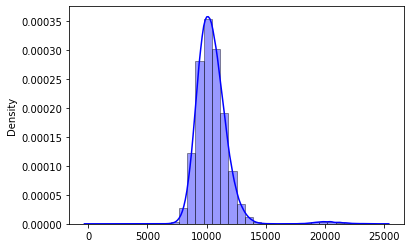

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.distplot(l_new, hist=True, kde=True, 
             bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'})
# plt.savefig('L1_norm_high.png')

In [242]:
np.average(l_new_high)

1481.5929411179739

In [5]:
latent = np.load('/home/csp-uts/Hanyu/pixel2style2pixel-master/notebooks/results/latent_original.npy')
no_latent_index = [63,121,385,743,938]
latent1 = np.array([latent[0]])

print(latent1.shape)

(1, 18, 512)


In [16]:
latent_t = torch.from_numpy(latent1)
images, result_latent = decoder(latent_t,
                                input_is_latent=True,
                                return_latents=True)

RuntimeError: Expected object of scalar type Float but got scalar type Double for argument #2 'mat1' in call to _th_addmm

In [18]:
from models.encoders import psp_encoders
from torch.utils.data import DataLoader
encoder = psp_encoders.GradualStyleEncoder(50, 'ir_se', opts)
inputx = Image.open('/home/csp-uts/Hanyu/StyleGAN2-Face-Modificator-master/results/race_white/000.png').convert('RGB')

train_dataloader = DataLoader(inputx)
for batch_idx, batch in enumerate(train_dataloader):
#     self.optimizer.zero_grad()
    x, y = batch
    x, y = x.to(self.device).float(), y.to(self.device).float()
    print(x,y)
# codes = encoder(x)
print(x)

TypeError: object of type 'Image' has no len()

In [21]:
from models.stylegan2.model import Generator
decoder = Generator(1024, 512, 8)
a = np.zeros([1,18,512])
codes = torch.from_numpy(a).float().to('cuda')
print(codes)
with torch.no_grad():
    tic = time.time()
    result_image, latent,codes = decoder(codes.to("cuda").float(),
                                        input_is_latent=True)
    toc = time.time()

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]], device='cuda:0')


RuntimeError: Expected object of device type cuda but got device type cpu for argument #1 'self' in call to _th_addmm

In [15]:
opts

Namespace(batch_size=8, board_interval=50, checkpoint_path='pretrained_models/psp_ffhq_encode.pt', dataset_type='ffhq_encode', device='cuda:0', encoder_type='GradualStyleEncoder', exp_dir='', id_lambda=0.1, image_interval=100, input_nc=3, l2_lambda=1.0, l2_lambda_crop=0, label_nc=0, learn_in_w=False, learning_rate=0.0001, lpips_lambda=0.8, lpips_lambda_crop=0, max_steps=300000, optim_name='ranger', resize_factors=None, save_interval=1000, start_from_latent_avg=True, stylegan_weights='', test_batch_size=8, test_workers=2, train_decoder=False, val_interval=2500, w_norm_lambda=0, workers=8)